In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
import datetime
import sys, os
import random
from tqdm import tqdm
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras import optimizers, callbacks

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
#from tools import regressionReport, anonimize
import time
import seaborn as sns
import matplotlib.pyplot as plt
import json

import tensorflow as tf

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("Num GPUs Available", len(tf.config.experimental.list_physical_devices('GPU')))

In [2]:
def regressionReport(y_true, y_pred, plotName = int(time.time()), saveMiniature = True):
    """
    The function produces regression report based on provided real and predicted values
    Input:
    y_true (1-D iterable): real values
    y_pred (1-D iterable): predicted values
    
    Output:
    None, plot and metrics are printed out
    """
    #Sanity check of means
    print('True mean value \t:', np.mean(y_true))
    print('Predicted mean value \t:', np.mean(y_true))
    print('MAE \t\t\t:', mean_absolute_error(y_true, y_pred))
    print('MSE \t\t\t:', mean_squared_error(y_true, y_pred))
    print('RMSE \t\t\t:', mean_squared_error(y_true, y_pred, squared=False))
    sigm = np.sqrt(mean_squared_error(y_true, y_pred)*len(y_true)/(len(y_true)-1))
    print('3sigma \t\t\t:', 3 * sigm)
    print('Var. coeff. \t\t:', np.abs(sigm/np.mean(y_pred)))
    print('Var. coeff. (3 sigma) \t:', np.abs(3*sigm/np.mean(y_pred)))
    print('R2-score\t\t:', r2_score(y_true, y_pred))

    fig = make_subplots(rows=1, cols=2, subplot_titles=("Predicted vs Real", "Residuals histogram"))
    # Add traces
    fig.add_trace(go.Scatter(x=y_true, y=y_pred,mode='markers'), row=1, col=1)
    fig.add_trace(go.Histogram(x=(np.array(y_true)-np.array(y_pred))), row=1, col=2)

    # Update xaxis properties
    fig.update_xaxes(title_text="Real values", row=1, col=1)
    fig.update_xaxes(title_text="Residuals", row=1, col=2)

    # Update yaxis properties
    fig.update_yaxes(title_text="Predicted values", row=1, col=1)
#     fig.update_yaxes(title_text="yaxis 2 title", range=[40, 80], row=1, col=2)

    # Update title and height
    fig.update_layout(autosize=False,
        width=800,
        height=400, showlegend = False, title = plotName)
    fig.show()
    fig.write_html(str(plotName)+'.html')
    if saveMiniature:
        plt.subplots(figsize=(2,2))
        f = sns.scatterplot(x=y_true,y=y_pred, s=3)
        f.set_xlabel('')
        plt.savefig(str(plotName)+"_minature.png", dpi = 300)
                     
def getNimportantFeatures(model, n = 15):
    """The function returns n first important features according to a model with feature_importances_ property.
    Input:
    model (sklearn model): fitted model
    n (int):               number of features 
    
    Output:
    pandas dataframe
    """
    dfFeatureImportances = pd.DataFrame()
    dfFeatureImportances['feature'] = featureNames
    dfFeatureImportances['importance'] = model.feature_importances_
    return dfFeatureImportances.sort_values(by='importance', ascending = False).head(n)

#### Loading previously saved clean raw dataset 
##### (it was significantly randomized for confidential reasons therefore the final accuracy of the model is reduced compared to the original dataset)

In [3]:
pathForData = 'data/dfSalesAnonimized.pkl'

In [4]:
df = pd.read_pickle(pathForData)
df.head()

,date,product,quantity,sum,company,taxNumber
0,2018-09-13,product_item_1,quantity_item_1,35750.234320,company_item_1,taxNumber_item_1
1,2018-10-11,product_item_1,quantity_item_1,35912.426543,company_item_1,taxNumber_item_1
2,2018-07-14,product_item_1,quantity_item_1,82452.931598,company_item_1,taxNumber_item_1
3,2018-08-14,product_item_1,quantity_item_1,82452.931598,company_item_1,taxNumber_item_1
4,2018-09-27,product_item_1,quantity_item_1,82452.931598,company_item_1,taxNumber_item_1


In [5]:
print(min(df.date),max(df.date))

2018-01-03 00:00:00 2021-04-30 00:00:00


In [6]:
dfW = df
dfW = dfW.groupby(by=pd.Grouper(key='date',freq='W')).sum()

dfW=dfW[['sum']]
dfW.describe()

,sum
count,1.740000e+02
mean,1.975918e+08
std,6.909561e+07
min,6.688081e+05
25%,1.663329e+08
50%,2.065069e+08
75%,2.397177e+08
max,4.194688e+08


## Feature generation 
In this section we will generate features such as lags and rolling sums

In [7]:
def generateFeatures(df, nlags = 52, maxWindow = 52, periods = 'week'):
    """
    The functon returns an initial dataframe with added lagged values of the target column with nlags, 
    and rolling sum and mean with a window size in range [2, maxWindow] and a column with 
    period number (week, month, year or none)
    
    Parameters
    ----------
    df:             pandas dataframe
                    Required datetime index and the 1st target column
                    
    nlags:          int, default 4
                    Number of periods for lag columns
                    
    maxWindow:      int, default 4
                    max window size for rolling mean and sum
                    
    periods:        str, default 'week', possible options: 'month','year', 'None'
                    Defining if a column with week, month or year as integer will be added to a dataframe
                    If 'None', nothing will be added
                
                
    Returns
    ----------
    
    pandas dataframe
    an initial dataframe with added lagged values of the target column with nlags, 
    and rolling sum and mean with a window size in range [2, maxWindow] and a column with 
    period number (week, month, year or none)
    
    """
    df_with_features = df.copy()
    if periods == 'week':
        df_with_features['weekNumber'] = df_with_features.index.week
    elif periods == 'month':
        df_with_features['monthNumber'] = df_with_features.index.month
    elif periods == 'year':
        df_with_features['year'] = df_with_features.index.year
    
    for i in range(1,nlags+1):
        field_name = 'lag_' + str(i)
        df_with_features[field_name] = df_with_features.iloc[:,0].shift(i)

    for i in range(2,maxWindow+1):
        field_name = 'rollSum_' + str(i)
        df_with_features[field_name] = df_with_features.iloc[:,0].rolling(i).sum()
        
    for i in range(2,maxWindow+1):
        field_name = 'rollMean_' + str(i)
        df_with_features[field_name] = df_with_features.iloc[:,0].rolling(i).mean()
        
    df_with_features.dropna(inplace=True)
    return df_with_features

#### Preparing dataframe for modelling

In [8]:
dfWF = generateFeatures(dfW[['sum']])
dfWF.info()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 122 entries, 2019-01-06 to 2021-05-02
Freq: W-SUN
Columns: 156 entries, sum to rollMean_52
dtypes: float64(155), int64(1)
memory usage: 149.6 KB


In [9]:
dfWF.columns

Index(['sum', 'weekNumber', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5',
       'lag_6', 'lag_7', 'lag_8',
       ...
       'rollMean_43', 'rollMean_44', 'rollMean_45', 'rollMean_46',
       'rollMean_47', 'rollMean_48', 'rollMean_49', 'rollMean_50',
       'rollMean_51', 'rollMean_52'],
      dtype='object', length=156)

In [228]:
X_train, X_test, y_train, y_test = train_test_split(dfWF.iloc[:,1:], dfWF.iloc[:,0], test_size=0.3)

## Random Forest Regression

True mean value 	: 206408552.64198998
Predicted mean value 	: 206408552.64198998
MAE 			: 21146639.107626278
MSE 			: 1317556875558241.0
RMSE 			: 36298166.28368768
3sigma 			: 110396562.8944748
Var. coeff. 		: 0.17969923957043432
Var. coeff. (3 sigma) 	: 0.539097718711303
R2-score		: 0.7379558594450132


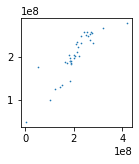

In [229]:
rfr = RandomForestRegressor()
rfr.fit(np.array(X_train), np.ravel(np.array(y_train)))
y_pred = rfr.predict(np.array(X_test))
regressionReport(y_test, y_pred)

In [230]:
scores = cross_val_score(rfr, np.array(X_train), np.ravel(np.array(y_train)))
print(scores.mean(), scores.std())

0.5117340285567944 0.2894966201840745


In [231]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [13]:
%%time
rf_random = RandomizedSearchCV(estimator = rfr, 
                               param_distributions = random_grid, 
                               n_iter = 100, cv = 3, 
                               verbose=0, 
                               random_state=42)
# Fit the random search model
rf_random.fit(X_train, y_train)

CPU times: user 7min 36s, sys: 2.65 s, total: 7min 39s
Wall time: 7min 39s


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [14]:
rf_random.best_params_

{'n_estimators': 800,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': True}

True mean value 	: 196275390.32861283
Predicted mean value 	: 196275390.32861283
MAE 			: 30287597.15122096
MSE 			: 1732163621652664.2
RMSE 			: 41619269.83565022
3sigma 			: 126580067.54733205
Var. coeff. 		: 0.21136204277482776
Var. coeff. (3 sigma) 	: 0.6340861283244832
R2-score		: 0.7192051348582821


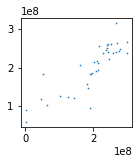

In [15]:
rfrBest = rf_random.best_estimator_
rfrBest.fit(np.array(X_train), np.ravel(np.array(y_train)))
y_pred = rfrBest.predict(np.array(X_test))
regressionReport(y_test, y_pred)

In [16]:
scores = cross_val_score(rfrBest, np.array(X_train), np.ravel(np.array(y_train)))
print(scores.mean(), scores.std())

0.6566033384717904 0.10492748658219106


In [17]:
dctFeatureImportances = {'feature':[],'importance':[]}
for f,s in zip(X_train.columns,rfrBest.feature_importances_):
    dctFeatureImportances['feature'].append(f)
    dctFeatureImportances['importance'].append(s) 
dfFeatureImportances = pd.DataFrame(dctFeatureImportances)
dfFeatureImportances.sort_values(by='importance',ascending = False).head(10)

,feature,importance
53,rollSum_2,0.327966
104,rollMean_2,0.313982
52,lag_52,0.115097
105,rollMean_3,0.025356
54,rollSum_3,0.022620
34,lag_34,0.014150
35,lag_35,0.012802
1,lag_1,0.007640
17,lag_17,0.006906
106,rollMean_4,0.006726


## Gradient Boosting with Grid Search

True mean value 	: 206408552.64198998
Predicted mean value 	: 206408552.64198998
MAE 			: 24231389.41940774
MSE 			: 1759409596900274.0
RMSE 			: 41945316.74573783
3sigma 			: 127571700.51123223
Var. coeff. 		: 0.2090732140302934
Var. coeff. (3 sigma) 	: 0.6272196420908801
R2-score		: 0.6500773634469579


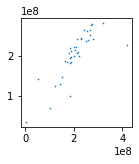

In [232]:
gbr = GradientBoostingRegressor(max_depth=3, n_estimators = 200)
gbr.fit(X_train, y_train)
y_pred = gbr.predict(X_test)
regressionReport(y_test, y_pred)

In [233]:
scores = cross_val_score(gbr, np.array(X_train), np.ravel(np.array(y_train)), cv=10)
print(scores.mean(), scores.std())

0.38155459628817007 0.451063253833911


In [236]:
%%time
from sklearn.model_selection import GridSearchCV
parameters = {'max_depth':[2,3,4,5], 'n_estimators':[100, 200, 300,500,1000], 'learning_rate':[0.1,0.01,0.001]}
gbrgs = GridSearchCV(gbr, parameters)
gbrgs.fit(X_train, y_train)
gbrgs.best_estimator_

CPU times: user 3min 7s, sys: 258 ms, total: 3min 8s
Wall time: 3min 8s


GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.01, loss='ls', max_depth=2,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [237]:
gbrgs.best_params_

{'learning_rate': 0.01, 'max_depth': 2, 'n_estimators': 200}

In [238]:
scores = cross_val_score(gbrgs.best_estimator_, np.array(X_train), np.ravel(np.array(y_train)), cv=10)
print(scores.mean(), scores.std())

0.45202608812259515 0.387393358027314


True mean value 	: 206408552.64198998
Predicted mean value 	: 206408552.64198998
MAE 			: 25238037.314830672
MSE 			: 1955737915470034.2
RMSE 			: 44223725.707701676
3sigma 			: 134501210.84249693
Var. coeff. 		: 0.22093362285365234
Var. coeff. (3 sigma) 	: 0.662800868560957
R2-score		: 0.6110303314283813


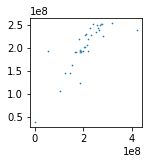

In [239]:
y_pred = gbrgs.best_estimator_.predict(X_test)
regressionReport(y_test, y_pred)

In [240]:
dctFeatureImportances = {'feature':[],'importance':[]}
for f,s in zip(X_train.columns,gbrgs.best_estimator_.feature_importances_):
    dctFeatureImportances['feature'].append(f)
    dctFeatureImportances['importance'].append(s) 
dfFeatureImportances = pd.DataFrame(dctFeatureImportances)
dfFeatureImportances.sort_values(by='importance',ascending = False).head(10)

,feature,importance
104,rollMean_2,0.381684
53,rollSum_2,0.343946
52,lag_52,0.119144
2,lag_2,0.077310
1,lag_1,0.009115
132,rollMean_30,0.005668
81,rollSum_30,0.005652
54,rollSum_3,0.005202
0,weekNumber,0.005051
105,rollMean_3,0.004548


#### Quantile regression

In [242]:
dctAlphaModels = defaultdict()
for alpha in [0.05, 0.5, 0.95]:
    gbrAlpha = GradientBoostingRegressor(loss='quantile', 
                                    alpha=alpha,
                                    max_depth=gbrgs.best_estimator_.max_depth, 
                                    n_estimators = gbrgs.best_estimator_.n_estimators)
    dctAlphaModels["q%1.2f" % alpha] = gbrAlpha.fit(X_train, y_train)
dctAlphaModels

defaultdict(None,
            {'q0.05': GradientBoostingRegressor(alpha=0.05, ccp_alpha=0.0, criterion='friedman_mse',
                                       init=None, learning_rate=0.1, loss='quantile',
                                       max_depth=2, max_features=None, max_leaf_nodes=None,
                                       min_impurity_decrease=0.0, min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0, n_estimators=200,
                                       n_iter_no_change=None, presort='deprecated',
                                       random_state=None, subsample=1.0, tol=0.0001,
                                       validation_fraction=0.1, verbose=0, warm_start=False),
             'q0.50': GradientBoostingRegressor(alpha=0.5, ccp_alpha=0.0, criterion='friedman_mse',
                                       init=None, learning_rate=0.1, loss='quantil

## XGBoost

In [30]:
from xgboost import XGBRegressor
xgbr = XGBRegressor()

### Default parameters

In [31]:
xgbr.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

True mean value 	: 196275390.32861283
Predicted mean value 	: 196275390.32861283
MAE 			: 26653604.84051073
MSE 			: 1339307550496182.8
RMSE 			: 36596551.073785394
3sigma 			: 111304064.80488342
Var. coeff. 		: 0.18889562259068177
Var. coeff. (3 sigma) 	: 0.5666868677720452
R2-score		: 0.7828896310233963


/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption



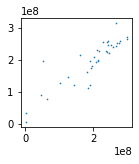

In [32]:
y_pred = xgbr.predict(X_test)
regressionReport(y_test, y_pred)

In [33]:
dctFeatureImportances = {'feature':[],'importance':[]}
for f,s in zip(dfWF.iloc[:,1:].columns, xgbr.feature_importances_):
    dctFeatureImportances['feature'].append(f)
    dctFeatureImportances['importance'].append(s) 
dfFeatureImportances = pd.DataFrame(dctFeatureImportances)
dfFeatureImportances.sort_values(by='importance',ascending = False).head(10)

,feature,importance
53,rollSum_2,0.508931
54,rollSum_3,0.217181
52,lag_52,0.144029
31,lag_31,0.013877
0,weekNumber,0.013819
93,rollSum_42,0.009967
2,lag_2,0.009098
51,lag_51,0.007366
34,lag_34,0.006768
18,lag_18,0.006173


### GridSearch

In [243]:
parameters = {'max_depth':[2,3,4,5], 'n_estimators':[100, 200, 300,500,1000], 'learning_rate':[0.1,0.01,0.001]}
xgbr = XGBRegressor()
xgbrgs = GridSearchCV(xgbr, parameters)
xgbrgs.fit(X_train, y_train)
print(xgbrgs.best_params_)
y_pred = xgbrgs.predict(X_test)
regressionReport(y_test, y_pred)

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption

/opt/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copie

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.01, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=500, n_jobs=16, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

## CatBoost

### Default parameters

In [34]:
from catboost import CatBoostRegressor
cbr = CatBoostRegressor()
cbr.fit(X_train, y_train)
y_pred = cbr.predict(X_test)

Learning rate set to 0.025167
0:	learn: 70653190.4573972	total: 55.6ms	remaining: 55.5s
1:	learn: 70053337.5006037	total: 58.5ms	remaining: 29.2s
2:	learn: 69508067.4145662	total: 61.7ms	remaining: 20.5s
3:	learn: 68912445.4278023	total: 64.5ms	remaining: 16s
4:	learn: 68302277.9889421	total: 67.9ms	remaining: 13.5s
5:	learn: 67696938.5646513	total: 71.8ms	remaining: 11.9s
6:	learn: 66968549.0414144	total: 75.9ms	remaining: 10.8s
7:	learn: 66376439.5730014	total: 78.7ms	remaining: 9.75s
8:	learn: 65781945.1987416	total: 81.9ms	remaining: 9.02s
9:	learn: 65166716.6368553	total: 84.7ms	remaining: 8.39s
10:	learn: 64722013.8691726	total: 87.6ms	remaining: 7.88s
11:	learn: 64048504.2113542	total: 91ms	remaining: 7.49s
12:	learn: 63591230.2925347	total: 93.4ms	remaining: 7.09s
13:	learn: 63087341.2175433	total: 95.9ms	remaining: 6.76s
14:	learn: 62545114.8578765	total: 98ms	remaining: 6.44s
15:	learn: 62031546.9220736	total: 100ms	remaining: 6.16s
16:	learn: 61431101.9428127	total: 103ms	re

186:	learn: 21203654.7244612	total: 524ms	remaining: 2.28s
187:	learn: 21038135.9833267	total: 527ms	remaining: 2.28s
188:	learn: 20880036.8193970	total: 529ms	remaining: 2.27s
189:	learn: 20772195.1931169	total: 532ms	remaining: 2.27s
190:	learn: 20657224.4153904	total: 534ms	remaining: 2.26s
191:	learn: 20524883.5171101	total: 537ms	remaining: 2.26s
192:	learn: 20378430.8380162	total: 540ms	remaining: 2.26s
193:	learn: 20298944.9896201	total: 542ms	remaining: 2.25s
194:	learn: 20205642.6855140	total: 545ms	remaining: 2.25s
195:	learn: 20074294.6486910	total: 548ms	remaining: 2.25s
196:	learn: 19968492.5226491	total: 550ms	remaining: 2.24s
197:	learn: 19841278.4532799	total: 552ms	remaining: 2.24s
198:	learn: 19736770.9945306	total: 555ms	remaining: 2.23s
199:	learn: 19597686.1406664	total: 558ms	remaining: 2.23s
200:	learn: 19479529.8085240	total: 561ms	remaining: 2.23s
201:	learn: 19376600.1525740	total: 563ms	remaining: 2.22s
202:	learn: 19257112.6117680	total: 566ms	remaining: 2.2

384:	learn: 5375058.5548350	total: 1.04s	remaining: 1.67s
385:	learn: 5327551.7806820	total: 1.05s	remaining: 1.67s
386:	learn: 5316043.1687694	total: 1.05s	remaining: 1.66s
387:	learn: 5274961.8450212	total: 1.05s	remaining: 1.66s
388:	learn: 5238518.0380055	total: 1.06s	remaining: 1.66s
389:	learn: 5205413.1590600	total: 1.06s	remaining: 1.66s
390:	learn: 5163131.8288352	total: 1.06s	remaining: 1.66s
391:	learn: 5129116.7685932	total: 1.06s	remaining: 1.65s
392:	learn: 5119425.9109826	total: 1.07s	remaining: 1.65s
393:	learn: 5084924.1418565	total: 1.07s	remaining: 1.65s
394:	learn: 5074242.3220647	total: 1.07s	remaining: 1.65s
395:	learn: 5033552.8339773	total: 1.08s	remaining: 1.65s
396:	learn: 5024216.9455174	total: 1.08s	remaining: 1.64s
397:	learn: 4985586.7648595	total: 1.08s	remaining: 1.64s
398:	learn: 4947226.6628202	total: 1.09s	remaining: 1.64s
399:	learn: 4897859.9950141	total: 1.09s	remaining: 1.64s
400:	learn: 4871795.6729203	total: 1.09s	remaining: 1.63s
401:	learn: 48

526:	learn: 2165292.8384275	total: 1.41s	remaining: 1.27s
527:	learn: 2148377.6051550	total: 1.42s	remaining: 1.27s
528:	learn: 2128423.8721161	total: 1.42s	remaining: 1.26s
529:	learn: 2124826.7698258	total: 1.42s	remaining: 1.26s
530:	learn: 2121270.3993156	total: 1.43s	remaining: 1.26s
531:	learn: 2107286.9145752	total: 1.43s	remaining: 1.25s
532:	learn: 2103774.7978534	total: 1.43s	remaining: 1.25s
533:	learn: 2089531.7164882	total: 1.43s	remaining: 1.25s
534:	learn: 2072408.4504000	total: 1.44s	remaining: 1.25s
535:	learn: 2053416.7199259	total: 1.44s	remaining: 1.25s
536:	learn: 2050018.4877448	total: 1.44s	remaining: 1.24s
537:	learn: 2036283.7593694	total: 1.44s	remaining: 1.24s
538:	learn: 2020578.0062978	total: 1.45s	remaining: 1.24s
539:	learn: 2004721.2681632	total: 1.45s	remaining: 1.24s
540:	learn: 1989252.7956835	total: 1.45s	remaining: 1.23s
541:	learn: 1974012.2647639	total: 1.46s	remaining: 1.23s
542:	learn: 1958081.5580119	total: 1.46s	remaining: 1.23s
543:	learn: 19

725:	learn: 628487.3177429	total: 1.95s	remaining: 737ms
726:	learn: 622518.7597046	total: 1.95s	remaining: 734ms
727:	learn: 621540.5676080	total: 1.96s	remaining: 731ms
728:	learn: 616321.0340085	total: 1.96s	remaining: 729ms
729:	learn: 614695.7447980	total: 1.96s	remaining: 726ms
730:	learn: 610603.9474818	total: 1.97s	remaining: 723ms
731:	learn: 605537.5389832	total: 1.97s	remaining: 720ms
732:	learn: 601388.1247401	total: 1.97s	remaining: 718ms
733:	learn: 597327.5164393	total: 1.97s	remaining: 715ms
734:	learn: 595820.4965762	total: 1.97s	remaining: 712ms
735:	learn: 591842.7649893	total: 1.98s	remaining: 709ms
736:	learn: 587704.5436969	total: 1.98s	remaining: 707ms
737:	learn: 586781.5503994	total: 1.98s	remaining: 705ms
738:	learn: 582740.6690766	total: 1.99s	remaining: 702ms
739:	learn: 577202.7054994	total: 1.99s	remaining: 700ms
740:	learn: 575679.1444435	total: 2s	remaining: 697ms
741:	learn: 570267.1458468	total: 2s	remaining: 695ms
742:	learn: 564969.3488133	total: 2s	

910:	learn: 180730.5282692	total: 2.45s	remaining: 239ms
911:	learn: 179369.5416853	total: 2.45s	remaining: 237ms
912:	learn: 177875.8484892	total: 2.45s	remaining: 234ms
913:	learn: 176551.6728048	total: 2.46s	remaining: 231ms
914:	learn: 175101.6649112	total: 2.46s	remaining: 228ms
915:	learn: 173813.3801696	total: 2.46s	remaining: 226ms
916:	learn: 173543.7565703	total: 2.46s	remaining: 223ms
917:	learn: 172154.9377678	total: 2.47s	remaining: 220ms
918:	learn: 170856.5956612	total: 2.47s	remaining: 218ms
919:	learn: 169365.1056027	total: 2.47s	remaining: 215ms
920:	learn: 168267.7306581	total: 2.47s	remaining: 212ms
921:	learn: 166812.9335797	total: 2.48s	remaining: 209ms
922:	learn: 165943.1147649	total: 2.48s	remaining: 207ms
923:	learn: 164520.5578341	total: 2.48s	remaining: 204ms
924:	learn: 163538.7592802	total: 2.48s	remaining: 201ms
925:	learn: 162214.9690657	total: 2.49s	remaining: 199ms
926:	learn: 160770.5697000	total: 2.49s	remaining: 196ms
927:	learn: 160405.0437278	tota

In [35]:
dctFeatureImportances = {'feature':[],'importance':[]}
for f,s in zip(dfWF.iloc[:,1:].columns, xgbr.feature_importances_):
    dctFeatureImportances['feature'].append(f)
    dctFeatureImportances['importance'].append(s) 
dfFeatureImportances = pd.DataFrame(dctFeatureImportances)
dfFeatureImportances.sort_values(by='importance',ascending = False).head(10)

,feature,importance
53,rollSum_2,0.508931
54,rollSum_3,0.217181
52,lag_52,0.144029
31,lag_31,0.013877
0,weekNumber,0.013819
93,rollSum_42,0.009967
2,lag_2,0.009098
51,lag_51,0.007366
34,lag_34,0.006768
18,lag_18,0.006173


True mean value 	: 196275390.32861283
Predicted mean value 	: 196275390.32861283
MAE 			: 33479480.900033023
MSE 			: 2275719137587891.5
RMSE 			: 47704498.085483424
3sigma 			: 145087566.74053085
Var. coeff. 		: 0.23636660636479415
Var. coeff. (3 sigma) 	: 0.7090998190943824
R2-score		: 0.6310912893265035


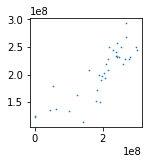

In [36]:
regressionReport(y_test, y_pred)

### GridSearch

0:	learn: 72243544.0665309	total: 4.74ms	remaining: 470ms
1:	learn: 69278827.7037312	total: 5.63ms	remaining: 276ms
2:	learn: 67270546.3820336	total: 6.17ms	remaining: 200ms
3:	learn: 64568733.4872961	total: 6.84ms	remaining: 164ms
4:	learn: 61281605.4848745	total: 7.43ms	remaining: 141ms
5:	learn: 58731471.4748402	total: 7.97ms	remaining: 125ms
6:	learn: 57895022.4139628	total: 8.55ms	remaining: 114ms
7:	learn: 56562501.4809149	total: 9.13ms	remaining: 105ms
8:	learn: 54265671.1194156	total: 9.75ms	remaining: 98.6ms
9:	learn: 52221025.8320630	total: 10.4ms	remaining: 93.2ms
10:	learn: 51024614.8400757	total: 10.9ms	remaining: 88.3ms
11:	learn: 49736959.5479390	total: 11.9ms	remaining: 87.6ms
12:	learn: 48032016.6244076	total: 12.7ms	remaining: 84.8ms
13:	learn: 46434374.3604827	total: 13.3ms	remaining: 81.8ms
14:	learn: 44756375.2395005	total: 14ms	remaining: 79.1ms
15:	learn: 43104633.6661362	total: 14.6ms	remaining: 76.5ms
16:	learn: 42287875.0738752	total: 15.2ms	remaining: 74.2ms


0:	learn: 71819729.7644400	total: 1.42ms	remaining: 140ms
1:	learn: 68582869.4867904	total: 2.32ms	remaining: 114ms
2:	learn: 67247469.3524393	total: 3.15ms	remaining: 102ms
3:	learn: 64924287.8174748	total: 4ms	remaining: 95.9ms
4:	learn: 62586317.9260770	total: 4.9ms	remaining: 93.1ms
5:	learn: 60593838.9791756	total: 5.85ms	remaining: 91.7ms
6:	learn: 58788893.2859666	total: 6.71ms	remaining: 89.2ms
7:	learn: 56653233.3070082	total: 7.6ms	remaining: 87.4ms
8:	learn: 54647423.1434495	total: 8.3ms	remaining: 84ms
9:	learn: 52752749.0319421	total: 9.15ms	remaining: 82.4ms
10:	learn: 51803142.4702272	total: 10ms	remaining: 80.9ms
11:	learn: 50879271.2899454	total: 10.8ms	remaining: 79.1ms
12:	learn: 49621549.7589183	total: 11.6ms	remaining: 77.6ms
13:	learn: 48958444.2403537	total: 12.4ms	remaining: 76.3ms
14:	learn: 47767470.3753100	total: 13.2ms	remaining: 74.9ms
15:	learn: 46851523.1735469	total: 14ms	remaining: 73.7ms
16:	learn: 45548904.0688810	total: 14.6ms	remaining: 71.1ms
17:	l

64:	learn: 21936337.1924087	total: 47.5ms	remaining: 25.6ms
65:	learn: 21657059.6280412	total: 48.3ms	remaining: 24.9ms
66:	learn: 21459837.7811512	total: 49ms	remaining: 24.1ms
67:	learn: 21298564.4764138	total: 49.6ms	remaining: 23.3ms
68:	learn: 20925521.7060715	total: 50.3ms	remaining: 22.6ms
69:	learn: 20594795.8169711	total: 50.9ms	remaining: 21.8ms
70:	learn: 20273718.1048210	total: 51.5ms	remaining: 21ms
71:	learn: 19988362.7636311	total: 52.1ms	remaining: 20.3ms
72:	learn: 19687243.2216957	total: 52.8ms	remaining: 19.5ms
73:	learn: 19342481.8540354	total: 53.4ms	remaining: 18.8ms
74:	learn: 18921173.4582689	total: 54ms	remaining: 18ms
75:	learn: 18631379.0286020	total: 54.9ms	remaining: 17.3ms
76:	learn: 18441818.3019214	total: 55.5ms	remaining: 16.6ms
77:	learn: 18128701.6702291	total: 56ms	remaining: 15.8ms
78:	learn: 17993859.4171995	total: 56.7ms	remaining: 15.1ms
79:	learn: 17641294.9042049	total: 57.5ms	remaining: 14.4ms
80:	learn: 17560720.2950588	total: 58ms	remaining:

11:	learn: 49736959.5479390	total: 7.9ms	remaining: 124ms
12:	learn: 48032016.6244076	total: 8.79ms	remaining: 126ms
13:	learn: 46434374.3604827	total: 9.48ms	remaining: 126ms
14:	learn: 44756375.2395005	total: 10.1ms	remaining: 124ms
15:	learn: 43104633.6661362	total: 10.7ms	remaining: 123ms
16:	learn: 42287875.0738752	total: 11.3ms	remaining: 122ms
17:	learn: 41672068.7307793	total: 12.2ms	remaining: 123ms
18:	learn: 41118142.0740716	total: 12.8ms	remaining: 122ms
19:	learn: 40015497.9507584	total: 13.4ms	remaining: 120ms
20:	learn: 39509342.6396562	total: 14ms	remaining: 119ms
21:	learn: 38863416.0284892	total: 14.5ms	remaining: 118ms
22:	learn: 37949983.4599586	total: 15.1ms	remaining: 116ms
23:	learn: 37557095.6929570	total: 15.7ms	remaining: 115ms
24:	learn: 36863835.7394746	total: 16.5ms	remaining: 115ms
25:	learn: 36262245.6072360	total: 17.1ms	remaining: 114ms
26:	learn: 35662425.3063671	total: 17.9ms	remaining: 115ms
27:	learn: 34864671.8908001	total: 18.5ms	remaining: 114ms


14:	learn: 47478868.4320720	total: 9.24ms	remaining: 114ms
15:	learn: 46242716.8948334	total: 10.2ms	remaining: 118ms
16:	learn: 45136915.0629805	total: 10.9ms	remaining: 117ms
17:	learn: 44700510.3086113	total: 11.6ms	remaining: 117ms
18:	learn: 43410330.3296379	total: 12.2ms	remaining: 116ms
19:	learn: 42776903.4971669	total: 12.8ms	remaining: 115ms
20:	learn: 41832094.9997790	total: 13.4ms	remaining: 114ms
21:	learn: 41022715.9690125	total: 13.9ms	remaining: 113ms
22:	learn: 39886393.3595863	total: 14.5ms	remaining: 112ms
23:	learn: 39550175.9430737	total: 15.2ms	remaining: 111ms
24:	learn: 38789987.6746931	total: 15.7ms	remaining: 110ms
25:	learn: 38314823.5738954	total: 16.3ms	remaining: 109ms
26:	learn: 37240124.7703872	total: 16.8ms	remaining: 108ms
27:	learn: 36552414.2623690	total: 17.4ms	remaining: 107ms
28:	learn: 35690454.3333427	total: 17.9ms	remaining: 106ms
29:	learn: 35148879.2083009	total: 18.5ms	remaining: 105ms
30:	learn: 34774487.8022630	total: 19ms	remaining: 104ms

39:	learn: 31550298.1105467	total: 29.2ms	remaining: 117ms
40:	learn: 30850729.6295988	total: 30.2ms	remaining: 117ms
41:	learn: 30576150.9805848	total: 31.2ms	remaining: 117ms
42:	learn: 30303193.6319738	total: 32.1ms	remaining: 117ms
43:	learn: 30168768.4705223	total: 33.1ms	remaining: 117ms
44:	learn: 29529753.4096443	total: 34ms	remaining: 117ms
45:	learn: 28932165.9998591	total: 34.8ms	remaining: 116ms
46:	learn: 28515604.7485404	total: 35.6ms	remaining: 116ms
47:	learn: 27869909.8704711	total: 36.5ms	remaining: 116ms
48:	learn: 27526748.1106253	total: 37.3ms	remaining: 115ms
49:	learn: 27013531.4664558	total: 38.2ms	remaining: 115ms
50:	learn: 26617990.9729545	total: 39.1ms	remaining: 114ms
51:	learn: 26220742.4967687	total: 39.9ms	remaining: 114ms
52:	learn: 25824941.4777485	total: 40.7ms	remaining: 113ms
53:	learn: 25371348.3423278	total: 41.7ms	remaining: 113ms
54:	learn: 25021889.0591573	total: 42.5ms	remaining: 112ms
55:	learn: 24573272.2113479	total: 43.3ms	remaining: 111ms

37:	learn: 31765816.4192648	total: 29.9ms	remaining: 128ms
38:	learn: 31348955.6716898	total: 30.9ms	remaining: 128ms
39:	learn: 31045667.1085124	total: 31.8ms	remaining: 127ms
40:	learn: 30593863.7366913	total: 32.5ms	remaining: 126ms
41:	learn: 30142376.6498848	total: 33.3ms	remaining: 125ms
42:	learn: 30020603.2733300	total: 34.4ms	remaining: 126ms
43:	learn: 29627247.1828280	total: 35.2ms	remaining: 125ms
44:	learn: 29179539.1518405	total: 36ms	remaining: 124ms
45:	learn: 28821543.6786206	total: 37ms	remaining: 124ms
46:	learn: 28236699.1970413	total: 37.8ms	remaining: 123ms
47:	learn: 27830022.6926676	total: 38.8ms	remaining: 123ms
48:	learn: 27725783.1632162	total: 39.9ms	remaining: 123ms
49:	learn: 27299888.0685091	total: 40.6ms	remaining: 122ms
50:	learn: 26969144.5169393	total: 41.6ms	remaining: 121ms
51:	learn: 26276976.9061568	total: 42.3ms	remaining: 120ms
52:	learn: 25827469.6301026	total: 43.1ms	remaining: 120ms
53:	learn: 25277961.5601964	total: 43.9ms	remaining: 119ms
5

28:	learn: 36674090.4145108	total: 17.9ms	remaining: 105ms
29:	learn: 36100291.4241060	total: 18.6ms	remaining: 105ms
30:	learn: 35485553.0746051	total: 19.4ms	remaining: 106ms
31:	learn: 35003525.0440085	total: 20ms	remaining: 105ms
32:	learn: 34570833.1741491	total: 20.5ms	remaining: 104ms
33:	learn: 34055541.0996227	total: 21.3ms	remaining: 104ms
34:	learn: 33678574.3221360	total: 21.9ms	remaining: 103ms
35:	learn: 33022127.6603516	total: 22.5ms	remaining: 102ms
36:	learn: 32334789.7711318	total: 23.1ms	remaining: 102ms
37:	learn: 31941077.4285287	total: 23.6ms	remaining: 101ms
38:	learn: 31623861.2920982	total: 24.2ms	remaining: 100ms
39:	learn: 31220514.4267810	total: 24.8ms	remaining: 99.2ms
40:	learn: 30816878.6529320	total: 25.4ms	remaining: 98.4ms
41:	learn: 30366342.8393810	total: 26ms	remaining: 97.6ms
42:	learn: 30126934.2343390	total: 26.6ms	remaining: 96.9ms
43:	learn: 29677556.3665977	total: 27.1ms	remaining: 96.2ms
44:	learn: 29238345.9007697	total: 28ms	remaining: 96.4

27:	learn: 34864671.8908001	total: 18.3ms	remaining: 178ms
28:	learn: 34111994.3551860	total: 19.3ms	remaining: 180ms
29:	learn: 33594902.5836050	total: 20.2ms	remaining: 182ms
30:	learn: 33149327.4876781	total: 20.8ms	remaining: 180ms
31:	learn: 32569544.5931564	total: 21.6ms	remaining: 181ms
32:	learn: 32015813.3510306	total: 22.5ms	remaining: 182ms
33:	learn: 31594293.7359180	total: 23.4ms	remaining: 183ms
34:	learn: 31245246.6028430	total: 24.2ms	remaining: 183ms
35:	learn: 31051811.2154963	total: 25.1ms	remaining: 184ms
36:	learn: 30608811.2191001	total: 26ms	remaining: 185ms
37:	learn: 30314433.8847921	total: 27ms	remaining: 186ms
38:	learn: 29799568.1817972	total: 27.9ms	remaining: 187ms
39:	learn: 29444608.2582466	total: 29.2ms	remaining: 190ms
40:	learn: 29086928.6290370	total: 30ms	remaining: 189ms
41:	learn: 28707600.9385046	total: 30.9ms	remaining: 190ms
42:	learn: 28403638.2032555	total: 31.7ms	remaining: 189ms
43:	learn: 27922074.2584738	total: 32.5ms	remaining: 189ms
44:

238:	learn: 3720660.5814026	total: 168ms	remaining: 42.9ms
239:	learn: 3702455.1389191	total: 169ms	remaining: 42.2ms
240:	learn: 3693438.0349572	total: 170ms	remaining: 41.5ms
241:	learn: 3650919.9767026	total: 170ms	remaining: 40.8ms
242:	learn: 3615583.8785645	total: 171ms	remaining: 40.1ms
243:	learn: 3580876.2891838	total: 172ms	remaining: 39.4ms
244:	learn: 3549372.9461204	total: 173ms	remaining: 38.7ms
245:	learn: 3515847.9167735	total: 174ms	remaining: 38.1ms
246:	learn: 3507120.2762754	total: 174ms	remaining: 37.4ms
247:	learn: 3498726.9188420	total: 175ms	remaining: 36.7ms
248:	learn: 3441645.6619979	total: 176ms	remaining: 36ms
249:	learn: 3387463.6748841	total: 177ms	remaining: 35.4ms
250:	learn: 3363419.9294800	total: 177ms	remaining: 34.6ms
251:	learn: 3342890.4647927	total: 178ms	remaining: 33.9ms
252:	learn: 3313649.6302835	total: 179ms	remaining: 33.2ms
253:	learn: 3305447.5777806	total: 179ms	remaining: 32.5ms
254:	learn: 3297636.1183980	total: 180ms	remaining: 31.8ms

153:	learn: 7091094.3451986	total: 104ms	remaining: 98.4ms
154:	learn: 7067421.1306526	total: 105ms	remaining: 97.9ms
155:	learn: 6958328.0233174	total: 105ms	remaining: 97.2ms
156:	learn: 6922147.3531790	total: 106ms	remaining: 96.6ms
157:	learn: 6873749.1277270	total: 107ms	remaining: 95.8ms
158:	learn: 6767179.3032580	total: 107ms	remaining: 95.1ms
159:	learn: 6629372.7895293	total: 108ms	remaining: 94.3ms
160:	learn: 6568423.7900896	total: 109ms	remaining: 93.8ms
161:	learn: 6433165.2533683	total: 109ms	remaining: 93ms
162:	learn: 6397708.4242751	total: 110ms	remaining: 92.3ms
163:	learn: 6292382.8720012	total: 110ms	remaining: 91.6ms
164:	learn: 6259670.3419182	total: 111ms	remaining: 90.9ms
165:	learn: 6185365.7456964	total: 112ms	remaining: 90.2ms
166:	learn: 6133769.9200577	total: 112ms	remaining: 89.4ms
167:	learn: 6080718.8790175	total: 113ms	remaining: 88.7ms
168:	learn: 6040796.6258889	total: 113ms	remaining: 87.9ms
169:	learn: 5957669.8114228	total: 114ms	remaining: 87.2ms

59:	learn: 22827827.3563696	total: 41.7ms	remaining: 167ms
60:	learn: 22584376.1343549	total: 42.4ms	remaining: 166ms
61:	learn: 22342110.9443912	total: 43.4ms	remaining: 167ms
62:	learn: 21986228.0811741	total: 44ms	remaining: 165ms
63:	learn: 21517732.3310140	total: 44.6ms	remaining: 165ms
64:	learn: 21127026.2501430	total: 45.2ms	remaining: 163ms
65:	learn: 20789020.7770689	total: 45.8ms	remaining: 162ms
66:	learn: 20399379.3210499	total: 46.3ms	remaining: 161ms
67:	learn: 20158432.6683909	total: 46.9ms	remaining: 160ms
68:	learn: 19861196.0897161	total: 47.5ms	remaining: 159ms
69:	learn: 19434811.7196884	total: 48.1ms	remaining: 158ms
70:	learn: 19078909.0922065	total: 48.8ms	remaining: 157ms
71:	learn: 18767402.6868531	total: 49.5ms	remaining: 157ms
72:	learn: 18533611.5458882	total: 50.2ms	remaining: 156ms
73:	learn: 18207692.4907569	total: 50.9ms	remaining: 155ms
74:	learn: 18001099.6082771	total: 51.5ms	remaining: 155ms
75:	learn: 17925133.9243909	total: 52.2ms	remaining: 154ms

0:	learn: 70905293.7912565	total: 555us	remaining: 166ms
1:	learn: 68274950.7305479	total: 1.43ms	remaining: 212ms
2:	learn: 65691839.4185930	total: 2.09ms	remaining: 207ms
3:	learn: 63570032.9902477	total: 2.8ms	remaining: 207ms
4:	learn: 61700261.9338298	total: 3.62ms	remaining: 214ms
5:	learn: 59807273.9174704	total: 4.36ms	remaining: 214ms
6:	learn: 58143269.8746345	total: 5.05ms	remaining: 212ms
7:	learn: 56990121.1809302	total: 5.91ms	remaining: 216ms
8:	learn: 55051335.1299014	total: 6.54ms	remaining: 212ms
9:	learn: 53712045.4153159	total: 7.28ms	remaining: 211ms
10:	learn: 52890755.6643760	total: 8.1ms	remaining: 213ms
11:	learn: 51620101.4502361	total: 8.88ms	remaining: 213ms
12:	learn: 50020228.0747291	total: 9.67ms	remaining: 213ms
13:	learn: 48594683.1333573	total: 10.6ms	remaining: 217ms
14:	learn: 47336264.3639833	total: 11.3ms	remaining: 215ms
15:	learn: 46055317.2169261	total: 11.9ms	remaining: 211ms
16:	learn: 44912294.2047356	total: 12.6ms	remaining: 210ms
17:	learn:

252:	learn: 3996382.5045654	total: 161ms	remaining: 29.9ms
253:	learn: 3967217.1849406	total: 162ms	remaining: 29.4ms
254:	learn: 3949443.6002858	total: 163ms	remaining: 28.8ms
255:	learn: 3916522.7930292	total: 164ms	remaining: 28.1ms
256:	learn: 3896304.5132961	total: 164ms	remaining: 27.5ms
257:	learn: 3879628.1322251	total: 165ms	remaining: 26.9ms
258:	learn: 3866076.5092215	total: 166ms	remaining: 26.2ms
259:	learn: 3833970.1606902	total: 166ms	remaining: 25.6ms
260:	learn: 3808461.2421417	total: 167ms	remaining: 24.9ms
261:	learn: 3799035.6814246	total: 168ms	remaining: 24.3ms
262:	learn: 3755864.4471476	total: 168ms	remaining: 23.7ms
263:	learn: 3718830.7453837	total: 169ms	remaining: 23ms
264:	learn: 3708557.6454462	total: 169ms	remaining: 22.4ms
265:	learn: 3692970.0583587	total: 170ms	remaining: 21.7ms
266:	learn: 3673502.1448418	total: 170ms	remaining: 21.1ms
267:	learn: 3654071.4219848	total: 171ms	remaining: 20.4ms
268:	learn: 3641767.8747458	total: 172ms	remaining: 19.8ms

146:	learn: 8313783.7243697	total: 97.8ms	remaining: 102ms
147:	learn: 8161692.4082061	total: 98.7ms	remaining: 101ms
148:	learn: 8048332.1251451	total: 99.5ms	remaining: 101ms
149:	learn: 7956747.4244925	total: 100ms	remaining: 100ms
150:	learn: 7923146.2613860	total: 101ms	remaining: 99.9ms
151:	learn: 7838473.4428316	total: 102ms	remaining: 99.3ms
152:	learn: 7754590.2518030	total: 103ms	remaining: 98.8ms
153:	learn: 7624285.9483221	total: 104ms	remaining: 98.3ms
154:	learn: 7551149.0441451	total: 104ms	remaining: 97.7ms
155:	learn: 7504277.6275236	total: 105ms	remaining: 97.2ms
156:	learn: 7473421.7721813	total: 106ms	remaining: 96.4ms
157:	learn: 7399165.3185335	total: 106ms	remaining: 95.6ms
158:	learn: 7376744.2792789	total: 107ms	remaining: 94.9ms
159:	learn: 7333168.8464680	total: 108ms	remaining: 94.3ms
160:	learn: 7256560.6307956	total: 109ms	remaining: 93.7ms
161:	learn: 7234869.1239763	total: 109ms	remaining: 93.2ms
162:	learn: 7183768.2768370	total: 110ms	remaining: 92.6m

74:	learn: 18085772.7056747	total: 43.2ms	remaining: 245ms
75:	learn: 17788433.4702790	total: 44ms	remaining: 245ms
76:	learn: 17590071.5066345	total: 44.6ms	remaining: 245ms
77:	learn: 17347080.1201520	total: 45.3ms	remaining: 245ms
78:	learn: 17181068.7620402	total: 45.8ms	remaining: 244ms
79:	learn: 17048695.9850306	total: 46.4ms	remaining: 243ms
80:	learn: 16799008.0018232	total: 46.9ms	remaining: 243ms
81:	learn: 16610969.0489848	total: 47.4ms	remaining: 242ms
82:	learn: 16409397.3123491	total: 47.9ms	remaining: 241ms
83:	learn: 16141849.3032467	total: 48.5ms	remaining: 240ms
84:	learn: 15966453.0092576	total: 49ms	remaining: 239ms
85:	learn: 15641754.1268034	total: 49.6ms	remaining: 239ms
86:	learn: 15413016.2208039	total: 50.1ms	remaining: 238ms
87:	learn: 15205159.8085154	total: 50.6ms	remaining: 237ms
88:	learn: 15004871.2978424	total: 51.2ms	remaining: 236ms
89:	learn: 14758138.2548758	total: 51.8ms	remaining: 236ms
90:	learn: 14639142.4934495	total: 52.4ms	remaining: 235ms
9

363:	learn: 1338079.4912468	total: 208ms	remaining: 77.6ms
364:	learn: 1319076.9405184	total: 209ms	remaining: 77.2ms
365:	learn: 1307181.1436236	total: 209ms	remaining: 76.7ms
366:	learn: 1295096.6709478	total: 210ms	remaining: 76.1ms
367:	learn: 1281032.3531827	total: 211ms	remaining: 75.6ms
368:	learn: 1271217.5689837	total: 211ms	remaining: 75ms
369:	learn: 1266016.9248904	total: 212ms	remaining: 74.4ms
370:	learn: 1254413.2865768	total: 212ms	remaining: 73.8ms
371:	learn: 1243333.7717746	total: 213ms	remaining: 73.2ms
372:	learn: 1232657.5278146	total: 213ms	remaining: 72.6ms
373:	learn: 1222837.0398793	total: 214ms	remaining: 72.1ms
374:	learn: 1214391.3781310	total: 215ms	remaining: 71.6ms
375:	learn: 1203935.0561568	total: 215ms	remaining: 71.1ms
376:	learn: 1195888.8166064	total: 216ms	remaining: 70.5ms
377:	learn: 1182310.7009006	total: 217ms	remaining: 70ms
378:	learn: 1168771.8076717	total: 217ms	remaining: 69.4ms
379:	learn: 1160141.7862572	total: 218ms	remaining: 68.8ms
3

104:	learn: 12176525.8975499	total: 63.4ms	remaining: 238ms
105:	learn: 12042255.0084788	total: 64.2ms	remaining: 239ms
106:	learn: 11878549.8921728	total: 65.1ms	remaining: 239ms
107:	learn: 11836164.0703013	total: 66ms	remaining: 239ms
108:	learn: 11796206.4610514	total: 66.5ms	remaining: 239ms
109:	learn: 11616236.8955145	total: 67.1ms	remaining: 238ms
110:	learn: 11504603.7478915	total: 67.7ms	remaining: 237ms
111:	learn: 11439336.7026871	total: 68.3ms	remaining: 236ms
112:	learn: 11257546.1290079	total: 69.1ms	remaining: 237ms
113:	learn: 11182647.4281891	total: 69.9ms	remaining: 237ms
114:	learn: 11025974.7119746	total: 70.7ms	remaining: 237ms
115:	learn: 10920531.1065801	total: 71.5ms	remaining: 237ms
116:	learn: 10782856.3088360	total: 72.3ms	remaining: 237ms
117:	learn: 10688907.6524942	total: 73ms	remaining: 236ms
118:	learn: 10526568.0656024	total: 73.9ms	remaining: 237ms
119:	learn: 10451099.7253914	total: 74.5ms	remaining: 236ms
120:	learn: 10330516.9860619	total: 75.3ms	r

361:	learn: 1242212.6763100	total: 230ms	remaining: 87.8ms
362:	learn: 1239365.4465763	total: 231ms	remaining: 87.2ms
363:	learn: 1236605.1066008	total: 232ms	remaining: 86.7ms
364:	learn: 1217056.3710906	total: 233ms	remaining: 86.1ms
365:	learn: 1214279.3373324	total: 234ms	remaining: 85.5ms
366:	learn: 1197861.2439601	total: 234ms	remaining: 84.9ms
367:	learn: 1184156.8916632	total: 235ms	remaining: 84.2ms
368:	learn: 1178099.6804687	total: 235ms	remaining: 83.6ms
369:	learn: 1168774.5395121	total: 236ms	remaining: 83ms
370:	learn: 1166053.1854973	total: 237ms	remaining: 82.4ms
371:	learn: 1160572.7886390	total: 238ms	remaining: 81.8ms
372:	learn: 1157906.8356236	total: 238ms	remaining: 81.1ms
373:	learn: 1155295.9986408	total: 239ms	remaining: 80.5ms
374:	learn: 1146265.6813305	total: 239ms	remaining: 79.8ms
375:	learn: 1127420.2148491	total: 240ms	remaining: 79.2ms
376:	learn: 1111779.8128355	total: 241ms	remaining: 78.5ms
377:	learn: 1103504.1589688	total: 241ms	remaining: 77.9ms

102:	learn: 12746942.3917190	total: 61.5ms	remaining: 237ms
103:	learn: 12598580.7140133	total: 62.4ms	remaining: 238ms
104:	learn: 12476695.0524035	total: 63.2ms	remaining: 238ms
105:	learn: 12433417.9561885	total: 63.8ms	remaining: 237ms
106:	learn: 12220653.7422984	total: 64.4ms	remaining: 237ms
107:	learn: 12135750.8929778	total: 65ms	remaining: 236ms
108:	learn: 12057577.0827420	total: 65.6ms	remaining: 235ms
109:	learn: 12016206.1547006	total: 66.2ms	remaining: 235ms
110:	learn: 11906151.0485179	total: 66.8ms	remaining: 234ms
111:	learn: 11866972.0922603	total: 67.4ms	remaining: 234ms
112:	learn: 11734899.4782627	total: 68ms	remaining: 233ms
113:	learn: 11545268.8418930	total: 68.6ms	remaining: 232ms
114:	learn: 11506672.5334020	total: 69.2ms	remaining: 232ms
115:	learn: 11434137.7996571	total: 70.1ms	remaining: 232ms
116:	learn: 11397102.8749801	total: 70.7ms	remaining: 231ms
117:	learn: 11237343.8065036	total: 71.3ms	remaining: 231ms
118:	learn: 11069273.2825911	total: 72ms	rem

370:	learn: 2090902.0484640	total: 227ms	remaining: 79.1ms
371:	learn: 2085979.7975230	total: 228ms	remaining: 78.5ms
372:	learn: 2071451.8485009	total: 229ms	remaining: 77.9ms
373:	learn: 2066609.4457024	total: 229ms	remaining: 77.3ms
374:	learn: 2044645.6676229	total: 230ms	remaining: 76.7ms
375:	learn: 2039852.3979129	total: 231ms	remaining: 76.1ms
376:	learn: 2026070.8918555	total: 231ms	remaining: 75.5ms
377:	learn: 2012470.6346505	total: 232ms	remaining: 74.9ms
378:	learn: 2000019.2365174	total: 233ms	remaining: 74.3ms
379:	learn: 1987742.9127184	total: 233ms	remaining: 73.7ms
380:	learn: 1971612.6437824	total: 234ms	remaining: 73.1ms
381:	learn: 1966887.0978071	total: 235ms	remaining: 72.4ms
382:	learn: 1962384.3555387	total: 235ms	remaining: 71.8ms
383:	learn: 1957737.3848296	total: 236ms	remaining: 71.2ms
384:	learn: 1951663.5041671	total: 236ms	remaining: 70.6ms
385:	learn: 1938321.4083780	total: 237ms	remaining: 70ms
386:	learn: 1926774.1736070	total: 238ms	remaining: 69.4ms

102:	learn: 13523966.2755648	total: 66.4ms	remaining: 256ms
103:	learn: 13466199.8709882	total: 67ms	remaining: 255ms
104:	learn: 13216182.2425126	total: 67.7ms	remaining: 255ms
105:	learn: 13131181.6492538	total: 68.3ms	remaining: 254ms
106:	learn: 12898736.5650168	total: 68.9ms	remaining: 253ms
107:	learn: 12835911.8642276	total: 69.4ms	remaining: 252ms
108:	learn: 12684151.8768108	total: 70ms	remaining: 251ms
109:	learn: 12639874.8494547	total: 70.5ms	remaining: 250ms
110:	learn: 12562295.7101011	total: 71.2ms	remaining: 250ms
111:	learn: 12503792.3982807	total: 72ms	remaining: 249ms
112:	learn: 12303171.7592305	total: 72.7ms	remaining: 249ms
113:	learn: 12188490.8216330	total: 73.4ms	remaining: 249ms
114:	learn: 12138576.2342872	total: 74.1ms	remaining: 248ms
115:	learn: 11947810.4740472	total: 74.8ms	remaining: 248ms
116:	learn: 11807492.3450634	total: 75.6ms	remaining: 248ms
117:	learn: 11659875.3755046	total: 76.3ms	remaining: 247ms
118:	learn: 11605435.7590382	total: 77ms	remai

380:	learn: 1656043.3395688	total: 228ms	remaining: 71.1ms
381:	learn: 1649771.0639934	total: 228ms	remaining: 70.5ms
382:	learn: 1631002.5663535	total: 229ms	remaining: 69.9ms
383:	learn: 1627000.3010674	total: 229ms	remaining: 69.3ms
384:	learn: 1623151.2669384	total: 230ms	remaining: 68.8ms
385:	learn: 1615972.2553784	total: 231ms	remaining: 68.1ms
386:	learn: 1612236.9982173	total: 231ms	remaining: 67.6ms
387:	learn: 1604744.7339560	total: 232ms	remaining: 66.9ms
388:	learn: 1601054.6604916	total: 232ms	remaining: 66.3ms
389:	learn: 1581495.3762040	total: 233ms	remaining: 65.7ms
390:	learn: 1571300.4976173	total: 234ms	remaining: 65.1ms
391:	learn: 1559197.6325459	total: 234ms	remaining: 64.5ms
392:	learn: 1547993.6241214	total: 235ms	remaining: 63.9ms
393:	learn: 1537382.5050124	total: 235ms	remaining: 63.3ms
394:	learn: 1518366.4066095	total: 236ms	remaining: 62.7ms
395:	learn: 1510734.0707402	total: 237ms	remaining: 62.1ms
396:	learn: 1503990.9263516	total: 237ms	remaining: 61.5

85:	learn: 16316753.4301260	total: 53.8ms	remaining: 259ms
86:	learn: 16089936.6141336	total: 54.4ms	remaining: 258ms
87:	learn: 15803576.7560966	total: 55ms	remaining: 257ms
88:	learn: 15739022.4675332	total: 55.8ms	remaining: 258ms
89:	learn: 15489267.2256804	total: 56.4ms	remaining: 257ms
90:	learn: 15310137.4986773	total: 57ms	remaining: 256ms
91:	learn: 15007754.5989831	total: 57.6ms	remaining: 256ms
92:	learn: 14811564.7946901	total: 58.3ms	remaining: 255ms
93:	learn: 14750567.8742546	total: 58.9ms	remaining: 254ms
94:	learn: 14519764.7730678	total: 59.5ms	remaining: 254ms
95:	learn: 14462315.7499083	total: 60.1ms	remaining: 253ms
96:	learn: 14279686.3193281	total: 60.9ms	remaining: 253ms
97:	learn: 14209067.8429760	total: 61.5ms	remaining: 252ms
98:	learn: 13954628.5702492	total: 62.1ms	remaining: 252ms
99:	learn: 13781052.4099559	total: 62.7ms	remaining: 251ms
100:	learn: 13666530.0287603	total: 63.4ms	remaining: 250ms
101:	learn: 13613809.7239865	total: 63.9ms	remaining: 249ms

366:	learn: 1373331.5168163	total: 216ms	remaining: 78.3ms
367:	learn: 1370246.3716809	total: 217ms	remaining: 77.8ms
368:	learn: 1366220.2597730	total: 218ms	remaining: 77.3ms
369:	learn: 1342036.6792393	total: 218ms	remaining: 76.7ms
370:	learn: 1328240.7646921	total: 219ms	remaining: 76.1ms
371:	learn: 1325302.9754300	total: 219ms	remaining: 75.5ms
372:	learn: 1316455.5434503	total: 220ms	remaining: 74.9ms
373:	learn: 1301789.9368337	total: 220ms	remaining: 74.3ms
374:	learn: 1298941.6800676	total: 221ms	remaining: 73.7ms
375:	learn: 1285301.6478741	total: 222ms	remaining: 73.1ms
376:	learn: 1277359.5312864	total: 222ms	remaining: 72.5ms
377:	learn: 1267344.3957453	total: 223ms	remaining: 71.9ms
378:	learn: 1263527.4150093	total: 223ms	remaining: 71.3ms
379:	learn: 1253498.6379137	total: 224ms	remaining: 70.7ms
380:	learn: 1246996.7690697	total: 224ms	remaining: 70.1ms
381:	learn: 1236524.3491208	total: 225ms	remaining: 69.5ms
382:	learn: 1232785.8805486	total: 225ms	remaining: 68.9

105:	learn: 12519263.8400690	total: 69.3ms	remaining: 584ms
106:	learn: 12369616.0301209	total: 70.2ms	remaining: 586ms
107:	learn: 12277314.3401281	total: 70.9ms	remaining: 585ms
108:	learn: 12133113.7640255	total: 71.5ms	remaining: 584ms
109:	learn: 11934681.0431196	total: 72.1ms	remaining: 583ms
110:	learn: 11791552.8667105	total: 72.7ms	remaining: 582ms
111:	learn: 11639075.3525326	total: 73.2ms	remaining: 581ms
112:	learn: 11605546.9423995	total: 73.8ms	remaining: 579ms
113:	learn: 11482526.1325824	total: 74.4ms	remaining: 578ms
114:	learn: 11439946.0771396	total: 75.2ms	remaining: 579ms
115:	learn: 11357326.6127953	total: 76ms	remaining: 579ms
116:	learn: 11176142.9715458	total: 76.6ms	remaining: 578ms
117:	learn: 11095603.1864262	total: 77.2ms	remaining: 577ms
118:	learn: 10979536.2598885	total: 77.8ms	remaining: 576ms
119:	learn: 10938861.0771059	total: 78.3ms	remaining: 574ms
120:	learn: 10819266.7170660	total: 78.9ms	remaining: 573ms
121:	learn: 10686990.6754852	total: 79.5ms

384:	learn: 1120590.9277877	total: 237ms	remaining: 378ms
385:	learn: 1112601.3944744	total: 238ms	remaining: 378ms
386:	learn: 1110129.4640899	total: 238ms	remaining: 378ms
387:	learn: 1096611.2192020	total: 239ms	remaining: 377ms
388:	learn: 1094190.2314622	total: 240ms	remaining: 377ms
389:	learn: 1082768.1634164	total: 241ms	remaining: 376ms
390:	learn: 1075263.8694557	total: 241ms	remaining: 376ms
391:	learn: 1063818.7147812	total: 242ms	remaining: 375ms
392:	learn: 1051406.9644664	total: 242ms	remaining: 374ms
393:	learn: 1039767.6479811	total: 243ms	remaining: 373ms
394:	learn: 1032908.3969077	total: 243ms	remaining: 373ms
395:	learn: 1022300.9270257	total: 244ms	remaining: 372ms
396:	learn: 1012907.0086792	total: 245ms	remaining: 371ms
397:	learn: 1001749.0148005	total: 245ms	remaining: 371ms
398:	learn: 999424.0024402	total: 246ms	remaining: 370ms
399:	learn: 989560.8401594	total: 246ms	remaining: 370ms
400:	learn: 984158.7165208	total: 247ms	remaining: 369ms
401:	learn: 97532

664:	learn: 144943.2298804	total: 405ms	remaining: 204ms
665:	learn: 143751.5122304	total: 406ms	remaining: 203ms
666:	learn: 142987.2272333	total: 406ms	remaining: 203ms
667:	learn: 142030.3259875	total: 407ms	remaining: 202ms
668:	learn: 140792.6546259	total: 408ms	remaining: 202ms
669:	learn: 139662.9147235	total: 409ms	remaining: 201ms
670:	learn: 137969.4003623	total: 409ms	remaining: 201ms
671:	learn: 137307.4727974	total: 410ms	remaining: 200ms
672:	learn: 137035.4921037	total: 411ms	remaining: 200ms
673:	learn: 136075.5748938	total: 411ms	remaining: 199ms
674:	learn: 134517.1803982	total: 412ms	remaining: 198ms
675:	learn: 134242.9539783	total: 412ms	remaining: 198ms
676:	learn: 133295.1746659	total: 413ms	remaining: 197ms
677:	learn: 132057.9040404	total: 414ms	remaining: 196ms
678:	learn: 130739.4323654	total: 414ms	remaining: 196ms
679:	learn: 129384.2210097	total: 415ms	remaining: 195ms
680:	learn: 127733.4790748	total: 415ms	remaining: 195ms
681:	learn: 127475.1967754	tota

945:	learn: 19294.6405690	total: 574ms	remaining: 32.7ms
946:	learn: 19227.0023157	total: 574ms	remaining: 32.1ms
947:	learn: 19087.8931215	total: 576ms	remaining: 31.6ms
948:	learn: 18918.0635705	total: 576ms	remaining: 31ms
949:	learn: 18814.5676714	total: 577ms	remaining: 30.4ms
950:	learn: 18518.1122261	total: 578ms	remaining: 29.8ms
951:	learn: 18343.5936331	total: 578ms	remaining: 29.2ms
952:	learn: 18141.2461787	total: 579ms	remaining: 28.5ms
953:	learn: 17929.2887013	total: 580ms	remaining: 27.9ms
954:	learn: 17811.2679944	total: 580ms	remaining: 27.3ms
955:	learn: 17647.4848129	total: 581ms	remaining: 26.7ms
956:	learn: 17539.2645238	total: 581ms	remaining: 26.1ms
957:	learn: 17369.2977217	total: 582ms	remaining: 25.5ms
958:	learn: 17194.7754202	total: 583ms	remaining: 24.9ms
959:	learn: 17054.1663202	total: 583ms	remaining: 24.3ms
960:	learn: 16936.9592239	total: 584ms	remaining: 23.7ms
961:	learn: 16801.4210165	total: 585ms	remaining: 23.1ms
962:	learn: 16748.0508707	total: 

169:	learn: 5957669.8114228	total: 107ms	remaining: 522ms
170:	learn: 5903926.2995224	total: 108ms	remaining: 522ms
171:	learn: 5846745.8589866	total: 108ms	remaining: 522ms
172:	learn: 5775129.5773985	total: 109ms	remaining: 522ms
173:	learn: 5690325.6637001	total: 110ms	remaining: 521ms
174:	learn: 5624277.4525624	total: 110ms	remaining: 520ms
175:	learn: 5578084.0572210	total: 111ms	remaining: 519ms
176:	learn: 5489806.4011594	total: 111ms	remaining: 518ms
177:	learn: 5433477.9091966	total: 112ms	remaining: 517ms
178:	learn: 5375489.3190165	total: 113ms	remaining: 516ms
179:	learn: 5356105.9031706	total: 113ms	remaining: 515ms
180:	learn: 5307750.6381962	total: 114ms	remaining: 514ms
181:	learn: 5286370.7265960	total: 114ms	remaining: 513ms
182:	learn: 5227276.1550890	total: 115ms	remaining: 512ms
183:	learn: 5170848.0419391	total: 115ms	remaining: 511ms
184:	learn: 5113968.8877722	total: 116ms	remaining: 510ms
185:	learn: 5016770.1848018	total: 117ms	remaining: 510ms
186:	learn: 49

471:	learn: 556889.9280285	total: 274ms	remaining: 306ms
472:	learn: 552307.8629550	total: 275ms	remaining: 306ms
473:	learn: 547837.8656728	total: 275ms	remaining: 305ms
474:	learn: 546517.4847071	total: 276ms	remaining: 305ms
475:	learn: 540206.7625594	total: 276ms	remaining: 304ms
476:	learn: 536004.2078969	total: 277ms	remaining: 304ms
477:	learn: 530078.7599089	total: 277ms	remaining: 303ms
478:	learn: 527734.2127216	total: 278ms	remaining: 302ms
479:	learn: 524400.2850837	total: 279ms	remaining: 302ms
480:	learn: 518292.9643516	total: 279ms	remaining: 301ms
481:	learn: 514638.5621688	total: 280ms	remaining: 301ms
482:	learn: 510950.4712795	total: 280ms	remaining: 300ms
483:	learn: 507199.7047381	total: 281ms	remaining: 299ms
484:	learn: 499965.3275277	total: 281ms	remaining: 299ms
485:	learn: 492298.8321867	total: 282ms	remaining: 298ms
486:	learn: 491125.1854185	total: 283ms	remaining: 298ms
487:	learn: 489983.4261596	total: 283ms	remaining: 297ms
488:	learn: 486171.1331984	tota

772:	learn: 53648.8053168	total: 441ms	remaining: 130ms
773:	learn: 53237.2184949	total: 442ms	remaining: 129ms
774:	learn: 53114.4496672	total: 442ms	remaining: 128ms
775:	learn: 52867.5458592	total: 443ms	remaining: 128ms
776:	learn: 52432.2590612	total: 444ms	remaining: 127ms
777:	learn: 52306.1679833	total: 444ms	remaining: 127ms
778:	learn: 51987.6097616	total: 445ms	remaining: 126ms
779:	learn: 51701.1905793	total: 445ms	remaining: 126ms
780:	learn: 51235.3210877	total: 446ms	remaining: 125ms
781:	learn: 51116.7250217	total: 446ms	remaining: 124ms
782:	learn: 50497.9100042	total: 447ms	remaining: 124ms
783:	learn: 50268.1754020	total: 447ms	remaining: 123ms
784:	learn: 50076.7946305	total: 448ms	remaining: 123ms
785:	learn: 49958.9128235	total: 448ms	remaining: 122ms
786:	learn: 49176.3715559	total: 449ms	remaining: 122ms
787:	learn: 49059.5886706	total: 450ms	remaining: 121ms
788:	learn: 48945.1106151	total: 450ms	remaining: 120ms
789:	learn: 48794.6710636	total: 451ms	remaining

34:	learn: 33966535.7660452	total: 21.3ms	remaining: 587ms
35:	learn: 33765670.4037026	total: 22.2ms	remaining: 593ms
36:	learn: 33123852.2624921	total: 22.8ms	remaining: 593ms
37:	learn: 32443322.9001550	total: 23.6ms	remaining: 598ms
38:	learn: 31868511.5416982	total: 24.2ms	remaining: 598ms
39:	learn: 31550298.1105467	total: 24.8ms	remaining: 596ms
40:	learn: 30850729.6295988	total: 25.4ms	remaining: 595ms
41:	learn: 30576150.9805848	total: 26ms	remaining: 593ms
42:	learn: 30303193.6319738	total: 26.6ms	remaining: 592ms
43:	learn: 30168768.4705223	total: 27.2ms	remaining: 591ms
44:	learn: 29529753.4096443	total: 27.8ms	remaining: 589ms
45:	learn: 28932165.9998591	total: 28.3ms	remaining: 587ms
46:	learn: 28515604.7485404	total: 28.9ms	remaining: 586ms
47:	learn: 27869909.8704711	total: 29.5ms	remaining: 585ms
48:	learn: 27526748.1106253	total: 30.1ms	remaining: 584ms
49:	learn: 27013531.4664558	total: 30.6ms	remaining: 582ms
50:	learn: 26617990.9729545	total: 31.3ms	remaining: 583ms

286:	learn: 3762792.2115093	total: 190ms	remaining: 472ms
287:	learn: 3718587.0345443	total: 191ms	remaining: 472ms
288:	learn: 3709699.6448872	total: 192ms	remaining: 471ms
289:	learn: 3660397.9830169	total: 192ms	remaining: 471ms
290:	learn: 3646160.7429067	total: 193ms	remaining: 470ms
291:	learn: 3637440.4279423	total: 194ms	remaining: 470ms
292:	learn: 3617703.9998186	total: 195ms	remaining: 469ms
293:	learn: 3609134.5395050	total: 195ms	remaining: 469ms
294:	learn: 3592389.7559945	total: 196ms	remaining: 468ms
295:	learn: 3554532.8617173	total: 197ms	remaining: 467ms
296:	learn: 3546131.0193565	total: 197ms	remaining: 467ms
297:	learn: 3537937.7163523	total: 198ms	remaining: 466ms
298:	learn: 3478521.7783527	total: 199ms	remaining: 466ms
299:	learn: 3470309.0906704	total: 199ms	remaining: 465ms
300:	learn: 3457806.6139928	total: 200ms	remaining: 465ms
301:	learn: 3449811.0826826	total: 201ms	remaining: 464ms
302:	learn: 3441950.8153872	total: 201ms	remaining: 463ms
303:	learn: 34

543:	learn: 680118.1937184	total: 360ms	remaining: 302ms
544:	learn: 678726.0303389	total: 360ms	remaining: 301ms
545:	learn: 672994.0731758	total: 361ms	remaining: 300ms
546:	learn: 664640.0137013	total: 362ms	remaining: 300ms
547:	learn: 653934.0456082	total: 363ms	remaining: 299ms
548:	learn: 652594.0157732	total: 363ms	remaining: 298ms
549:	learn: 647851.6204463	total: 364ms	remaining: 298ms
550:	learn: 646306.2952038	total: 365ms	remaining: 297ms
551:	learn: 643515.1416480	total: 365ms	remaining: 296ms
552:	learn: 640505.0354341	total: 366ms	remaining: 296ms
553:	learn: 639211.6428885	total: 366ms	remaining: 295ms
554:	learn: 637717.5501549	total: 367ms	remaining: 294ms
555:	learn: 635987.6467221	total: 367ms	remaining: 293ms
556:	learn: 627964.0825585	total: 368ms	remaining: 293ms
557:	learn: 626668.9702015	total: 369ms	remaining: 292ms
558:	learn: 616448.7738407	total: 369ms	remaining: 291ms
559:	learn: 613755.5086264	total: 370ms	remaining: 291ms
560:	learn: 610900.3884159	tota

831:	learn: 94964.7000369	total: 528ms	remaining: 107ms
832:	learn: 94584.5166077	total: 529ms	remaining: 106ms
833:	learn: 94073.6482149	total: 529ms	remaining: 105ms
834:	learn: 93165.5806357	total: 530ms	remaining: 105ms
835:	learn: 92273.1065891	total: 531ms	remaining: 104ms
836:	learn: 92078.6990952	total: 531ms	remaining: 103ms
837:	learn: 91890.2427389	total: 532ms	remaining: 103ms
838:	learn: 91704.8659259	total: 533ms	remaining: 102ms
839:	learn: 90490.0576326	total: 533ms	remaining: 102ms
840:	learn: 89791.6911059	total: 534ms	remaining: 101ms
841:	learn: 88572.4449677	total: 534ms	remaining: 100ms
842:	learn: 87424.2899136	total: 535ms	remaining: 99.6ms
843:	learn: 86573.2847819	total: 536ms	remaining: 99ms
844:	learn: 85784.7543548	total: 536ms	remaining: 98.4ms
845:	learn: 85118.3735945	total: 537ms	remaining: 97.7ms
846:	learn: 84237.9646344	total: 537ms	remaining: 97.1ms
847:	learn: 84058.4194815	total: 538ms	remaining: 96.4ms
848:	learn: 83018.1380019	total: 539ms	remai

89:	learn: 15470209.9167547	total: 45.6ms	remaining: 461ms
90:	learn: 15250126.8606859	total: 46.2ms	remaining: 461ms
91:	learn: 15173810.8797204	total: 46.8ms	remaining: 462ms
92:	learn: 14943595.3222563	total: 47.3ms	remaining: 462ms
93:	learn: 14811082.1870607	total: 47.8ms	remaining: 461ms
94:	learn: 14593706.0105181	total: 48.4ms	remaining: 461ms
95:	learn: 14414247.5426950	total: 49.6ms	remaining: 467ms
96:	learn: 14295276.0866178	total: 50.1ms	remaining: 467ms
97:	learn: 14244208.2835214	total: 50.7ms	remaining: 466ms
98:	learn: 14064717.7552982	total: 51.3ms	remaining: 467ms
99:	learn: 13962241.3075046	total: 51.8ms	remaining: 466ms
100:	learn: 13725382.5588153	total: 52.5ms	remaining: 468ms
101:	learn: 13620201.9116356	total: 53.2ms	remaining: 468ms
102:	learn: 13523966.2755648	total: 53.7ms	remaining: 468ms
103:	learn: 13466199.8709882	total: 55ms	remaining: 474ms
104:	learn: 13216182.2425126	total: 55.5ms	remaining: 473ms
105:	learn: 13131181.6492538	total: 56ms	remaining: 4

385:	learn: 1615972.2553784	total: 211ms	remaining: 336ms
386:	learn: 1612236.9982173	total: 212ms	remaining: 336ms
387:	learn: 1604744.7339560	total: 212ms	remaining: 335ms
388:	learn: 1601054.6604916	total: 213ms	remaining: 335ms
389:	learn: 1581495.3762040	total: 214ms	remaining: 334ms
390:	learn: 1571300.4976173	total: 214ms	remaining: 334ms
391:	learn: 1559197.6325459	total: 215ms	remaining: 333ms
392:	learn: 1547993.6241214	total: 215ms	remaining: 332ms
393:	learn: 1537382.5050124	total: 216ms	remaining: 332ms
394:	learn: 1518366.4066095	total: 216ms	remaining: 331ms
395:	learn: 1510734.0707402	total: 217ms	remaining: 331ms
396:	learn: 1503990.9263516	total: 217ms	remaining: 330ms
397:	learn: 1500455.6926509	total: 218ms	remaining: 330ms
398:	learn: 1494447.6852023	total: 219ms	remaining: 329ms
399:	learn: 1472158.0776176	total: 219ms	remaining: 329ms
400:	learn: 1468689.0558269	total: 220ms	remaining: 328ms
401:	learn: 1458292.2885305	total: 220ms	remaining: 328ms
402:	learn: 14

682:	learn: 185407.4712425	total: 379ms	remaining: 176ms
683:	learn: 184431.9528434	total: 380ms	remaining: 175ms
684:	learn: 184036.9085307	total: 380ms	remaining: 175ms
685:	learn: 182534.6740126	total: 381ms	remaining: 174ms
686:	learn: 181227.1505291	total: 382ms	remaining: 174ms
687:	learn: 180467.5099636	total: 382ms	remaining: 173ms
688:	learn: 178976.1443538	total: 383ms	remaining: 173ms
689:	learn: 178068.0776322	total: 383ms	remaining: 172ms
690:	learn: 177687.8815631	total: 384ms	remaining: 172ms
691:	learn: 177009.1988416	total: 385ms	remaining: 171ms
692:	learn: 176634.8972587	total: 385ms	remaining: 171ms
693:	learn: 175804.0547291	total: 386ms	remaining: 170ms
694:	learn: 175436.8816025	total: 386ms	remaining: 170ms
695:	learn: 174719.1647584	total: 387ms	remaining: 169ms
696:	learn: 172348.6527077	total: 387ms	remaining: 168ms
697:	learn: 171223.8216712	total: 388ms	remaining: 168ms
698:	learn: 168864.4565552	total: 389ms	remaining: 167ms
699:	learn: 167795.6961414	tota

964:	learn: 32104.5526012	total: 547ms	remaining: 19.8ms
965:	learn: 31798.9969516	total: 548ms	remaining: 19.3ms
966:	learn: 31734.4996452	total: 549ms	remaining: 18.7ms
967:	learn: 31549.4377861	total: 549ms	remaining: 18.2ms
968:	learn: 31409.0922293	total: 550ms	remaining: 17.6ms
969:	learn: 31346.6220153	total: 551ms	remaining: 17ms
970:	learn: 31151.7621523	total: 551ms	remaining: 16.5ms
971:	learn: 30782.3821659	total: 552ms	remaining: 15.9ms
972:	learn: 30636.3408666	total: 552ms	remaining: 15.3ms
973:	learn: 30326.6580806	total: 553ms	remaining: 14.8ms
974:	learn: 30166.5519509	total: 554ms	remaining: 14.2ms
975:	learn: 30038.5888234	total: 554ms	remaining: 13.6ms
976:	learn: 29905.0610955	total: 555ms	remaining: 13.1ms
977:	learn: 29738.5892329	total: 556ms	remaining: 12.5ms
978:	learn: 29364.1737404	total: 556ms	remaining: 11.9ms
979:	learn: 29105.1425902	total: 557ms	remaining: 11.4ms
980:	learn: 28959.4537800	total: 557ms	remaining: 10.8ms
981:	learn: 28900.8821229	total: 

186:	learn: 5638131.8979852	total: 117ms	remaining: 510ms
187:	learn: 5549639.7961512	total: 118ms	remaining: 510ms
188:	learn: 5496702.9666917	total: 119ms	remaining: 510ms
189:	learn: 5450785.9105104	total: 119ms	remaining: 509ms
190:	learn: 5415863.4713754	total: 120ms	remaining: 508ms
191:	learn: 5325709.5363098	total: 121ms	remaining: 507ms
192:	learn: 5281317.8247933	total: 121ms	remaining: 507ms
193:	learn: 5260213.0742031	total: 122ms	remaining: 507ms
194:	learn: 5198287.0251127	total: 123ms	remaining: 506ms
195:	learn: 5136623.4698931	total: 123ms	remaining: 505ms
196:	learn: 5106707.7706715	total: 124ms	remaining: 504ms
197:	learn: 5024171.4528647	total: 124ms	remaining: 503ms
198:	learn: 4939660.7320878	total: 125ms	remaining: 502ms
199:	learn: 4916688.5670483	total: 125ms	remaining: 501ms
200:	learn: 4863236.7009338	total: 126ms	remaining: 501ms
201:	learn: 4816726.1860689	total: 127ms	remaining: 500ms
202:	learn: 4768443.2861271	total: 128ms	remaining: 502ms
203:	learn: 47

475:	learn: 558112.5823867	total: 285ms	remaining: 314ms
476:	learn: 554044.1128951	total: 286ms	remaining: 313ms
477:	learn: 547153.4226853	total: 286ms	remaining: 313ms
478:	learn: 540709.8688372	total: 287ms	remaining: 312ms
479:	learn: 535550.4254112	total: 287ms	remaining: 311ms
480:	learn: 534340.9615937	total: 288ms	remaining: 311ms
481:	learn: 533177.4614423	total: 289ms	remaining: 310ms
482:	learn: 530696.8832107	total: 289ms	remaining: 310ms
483:	learn: 527697.7830101	total: 290ms	remaining: 309ms
484:	learn: 519739.1368509	total: 290ms	remaining: 308ms
485:	learn: 511807.2860557	total: 291ms	remaining: 307ms
486:	learn: 510235.4713140	total: 291ms	remaining: 307ms
487:	learn: 507940.8611566	total: 292ms	remaining: 306ms
488:	learn: 505377.9716315	total: 292ms	remaining: 305ms
489:	learn: 503903.5021028	total: 293ms	remaining: 305ms
490:	learn: 499307.0029798	total: 293ms	remaining: 304ms
491:	learn: 495292.4817209	total: 294ms	remaining: 303ms
492:	learn: 488451.7247857	tota

800:	learn: 59131.3135749	total: 452ms	remaining: 112ms
801:	learn: 58975.2429014	total: 453ms	remaining: 112ms
802:	learn: 58489.1451378	total: 453ms	remaining: 111ms
803:	learn: 58357.5686295	total: 454ms	remaining: 111ms
804:	learn: 58230.9491567	total: 455ms	remaining: 110ms
805:	learn: 58107.8618698	total: 455ms	remaining: 110ms
806:	learn: 57915.1820659	total: 456ms	remaining: 109ms
807:	learn: 57792.8580109	total: 456ms	remaining: 108ms
808:	learn: 57118.2766142	total: 456ms	remaining: 108ms
809:	learn: 56995.3039462	total: 457ms	remaining: 107ms
810:	learn: 56335.9629463	total: 458ms	remaining: 107ms
811:	learn: 56214.5710468	total: 458ms	remaining: 106ms
812:	learn: 56097.3708874	total: 459ms	remaining: 105ms
813:	learn: 55603.2151902	total: 459ms	remaining: 105ms
814:	learn: 55486.0447341	total: 460ms	remaining: 104ms
815:	learn: 55374.1403290	total: 460ms	remaining: 104ms
816:	learn: 55263.0115736	total: 461ms	remaining: 103ms
817:	learn: 54953.6625992	total: 461ms	remaining

41:	learn: 25936906.6966882	total: 39.2ms	remaining: 54.1ms
42:	learn: 25437426.0221678	total: 40.3ms	remaining: 53.5ms
43:	learn: 25017022.0094997	total: 41.4ms	remaining: 52.7ms
44:	learn: 24714855.1604875	total: 42.2ms	remaining: 51.6ms
45:	learn: 24465299.3070203	total: 43.1ms	remaining: 50.6ms
46:	learn: 23994992.4274048	total: 43.8ms	remaining: 49.4ms
47:	learn: 23798713.9692678	total: 44.6ms	remaining: 48.4ms
48:	learn: 23518840.8580870	total: 45.4ms	remaining: 47.3ms
49:	learn: 23175299.7790965	total: 46.2ms	remaining: 46.2ms
50:	learn: 22689776.5938302	total: 47ms	remaining: 45.2ms
51:	learn: 22419087.1982798	total: 47.8ms	remaining: 44.1ms
52:	learn: 22086054.5610597	total: 48.6ms	remaining: 43.1ms
53:	learn: 21544269.4239164	total: 49.4ms	remaining: 42.1ms
54:	learn: 20937125.7657919	total: 50.2ms	remaining: 41.1ms
55:	learn: 20600294.6150468	total: 51ms	remaining: 40.1ms
56:	learn: 19991507.6627260	total: 51.8ms	remaining: 39.1ms
57:	learn: 19670721.5622928	total: 52.6ms	re

0:	learn: 71781571.1111936	total: 769us	remaining: 76.2ms
1:	learn: 68268543.2454427	total: 1.74ms	remaining: 85.1ms
2:	learn: 66448777.7370870	total: 2.56ms	remaining: 82.7ms
3:	learn: 64112850.3553944	total: 3.37ms	remaining: 80.9ms
4:	learn: 61865439.4334574	total: 4.17ms	remaining: 79.2ms
5:	learn: 60272645.8616190	total: 5.04ms	remaining: 79ms
6:	learn: 58951409.7055680	total: 5.89ms	remaining: 78.3ms
7:	learn: 57476584.2826689	total: 6.71ms	remaining: 77.1ms
8:	learn: 56302283.2850933	total: 7.53ms	remaining: 76.1ms
9:	learn: 54560682.6542434	total: 8.52ms	remaining: 76.7ms
10:	learn: 52065112.4972512	total: 10.1ms	remaining: 81.5ms
11:	learn: 50285635.9447562	total: 10.9ms	remaining: 79.7ms
12:	learn: 48713878.3689850	total: 11.8ms	remaining: 79ms
13:	learn: 47583338.6640785	total: 12.6ms	remaining: 77.4ms
14:	learn: 46599171.7834707	total: 13.4ms	remaining: 75.8ms
15:	learn: 45562880.8540337	total: 14.2ms	remaining: 74.4ms
16:	learn: 44573456.6169777	total: 15.1ms	remaining: 73

60:	learn: 19905709.3127136	total: 54.8ms	remaining: 35.1ms
61:	learn: 19611321.4310449	total: 56.1ms	remaining: 34.4ms
62:	learn: 19027957.3068881	total: 57.2ms	remaining: 33.6ms
63:	learn: 18697264.9678914	total: 57.9ms	remaining: 32.6ms
64:	learn: 18293231.6065686	total: 59ms	remaining: 31.7ms
65:	learn: 17789860.8868895	total: 59.8ms	remaining: 30.8ms
66:	learn: 17427590.5491702	total: 60.5ms	remaining: 29.8ms
67:	learn: 17005746.5881696	total: 61.6ms	remaining: 29ms
68:	learn: 16789790.0699576	total: 62.6ms	remaining: 28.1ms
69:	learn: 16358218.4655255	total: 63.7ms	remaining: 27.3ms
70:	learn: 15960634.5492293	total: 64.5ms	remaining: 26.4ms
71:	learn: 15653394.1558544	total: 65.3ms	remaining: 25.4ms
72:	learn: 15296427.1559243	total: 66.2ms	remaining: 24.5ms
73:	learn: 14946540.9878105	total: 67ms	remaining: 23.5ms
74:	learn: 14811326.8317041	total: 67.8ms	remaining: 22.6ms
75:	learn: 14365652.8221472	total: 68.9ms	remaining: 21.7ms
76:	learn: 13963716.8785301	total: 70.1ms	rema

91:	learn: 10488552.0884722	total: 99.6ms	remaining: 117ms
92:	learn: 10196630.6817538	total: 101ms	remaining: 116ms
93:	learn: 10076578.0160634	total: 101ms	remaining: 114ms
94:	learn: 9865949.6198341	total: 102ms	remaining: 113ms
95:	learn: 9632243.7439306	total: 103ms	remaining: 112ms
96:	learn: 9356141.2024963	total: 104ms	remaining: 111ms
97:	learn: 9091292.9558229	total: 105ms	remaining: 109ms
98:	learn: 8909729.9208352	total: 106ms	remaining: 108ms
99:	learn: 8743394.1801096	total: 107ms	remaining: 107ms
100:	learn: 8532445.1361322	total: 108ms	remaining: 105ms
101:	learn: 8448004.0576151	total: 108ms	remaining: 104ms
102:	learn: 8322063.1340524	total: 109ms	remaining: 103ms
103:	learn: 8230169.9996573	total: 110ms	remaining: 102ms
104:	learn: 8050062.9840099	total: 111ms	remaining: 100ms
105:	learn: 7871563.1517364	total: 112ms	remaining: 99.3ms
106:	learn: 7761647.1000306	total: 113ms	remaining: 98ms
107:	learn: 7677785.4400027	total: 114ms	remaining: 96.8ms
108:	learn: 762197

46:	learn: 23898600.8973676	total: 44.4ms	remaining: 145ms
47:	learn: 23490629.5262321	total: 45.4ms	remaining: 144ms
48:	learn: 23140206.3690402	total: 46.3ms	remaining: 143ms
49:	learn: 22719612.6616485	total: 47.5ms	remaining: 143ms
50:	learn: 22298242.9784911	total: 48.4ms	remaining: 141ms
51:	learn: 22105707.8519491	total: 49.2ms	remaining: 140ms
52:	learn: 21572021.4201358	total: 50ms	remaining: 139ms
53:	learn: 21011442.8019050	total: 50.7ms	remaining: 137ms
54:	learn: 20641901.3891503	total: 51.5ms	remaining: 136ms
55:	learn: 20302954.6270583	total: 52.3ms	remaining: 134ms
56:	learn: 20068727.2305637	total: 53.1ms	remaining: 133ms
57:	learn: 19615882.8282211	total: 54.2ms	remaining: 133ms
58:	learn: 19159689.7775314	total: 55.3ms	remaining: 132ms
59:	learn: 18893716.0067495	total: 56ms	remaining: 131ms
60:	learn: 18430261.9460475	total: 56.9ms	remaining: 130ms
61:	learn: 17902087.7535570	total: 57.7ms	remaining: 128ms
62:	learn: 17422679.5937656	total: 58.5ms	remaining: 127ms
6

199:	learn: 1493989.7767481	total: 207ms	remaining: 0us
0:	learn: 71781571.1111936	total: 846us	remaining: 168ms
1:	learn: 68268543.2454427	total: 1.73ms	remaining: 171ms
2:	learn: 66448777.7370870	total: 2.58ms	remaining: 170ms
3:	learn: 64112850.3553944	total: 3.39ms	remaining: 166ms
4:	learn: 61865439.4334574	total: 4.24ms	remaining: 165ms
5:	learn: 60272645.8616190	total: 5.01ms	remaining: 162ms
6:	learn: 58951409.7055680	total: 5.79ms	remaining: 160ms
7:	learn: 57476584.2826689	total: 6.67ms	remaining: 160ms
8:	learn: 56302283.2850933	total: 7.61ms	remaining: 161ms
9:	learn: 54560682.6542434	total: 8.55ms	remaining: 162ms
10:	learn: 52065112.4972512	total: 9.4ms	remaining: 161ms
11:	learn: 50285635.9447562	total: 10.5ms	remaining: 164ms
12:	learn: 48713878.3689850	total: 11.4ms	remaining: 163ms
13:	learn: 47583338.6640785	total: 12.3ms	remaining: 164ms
14:	learn: 46599171.7834707	total: 13.1ms	remaining: 162ms
15:	learn: 45562880.8540337	total: 14.1ms	remaining: 162ms
16:	learn: 4

148:	learn: 4154307.6060904	total: 134ms	remaining: 45.8ms
149:	learn: 4056540.6907511	total: 135ms	remaining: 45.1ms
150:	learn: 4005357.8150602	total: 136ms	remaining: 44.2ms
151:	learn: 3914359.0813809	total: 137ms	remaining: 43.3ms
152:	learn: 3896436.5490653	total: 138ms	remaining: 42.4ms
153:	learn: 3823780.7119769	total: 139ms	remaining: 41.5ms
154:	learn: 3750277.3532410	total: 140ms	remaining: 40.6ms
155:	learn: 3732969.3616520	total: 141ms	remaining: 39.6ms
156:	learn: 3716287.5372715	total: 141ms	remaining: 38.7ms
157:	learn: 3627331.5149351	total: 142ms	remaining: 37.8ms
158:	learn: 3610763.3367628	total: 143ms	remaining: 36.9ms
159:	learn: 3594791.8571099	total: 144ms	remaining: 36ms
160:	learn: 3579193.3051314	total: 145ms	remaining: 35.1ms
161:	learn: 3489734.6622913	total: 146ms	remaining: 34.2ms
162:	learn: 3449080.7381244	total: 147ms	remaining: 33.3ms
163:	learn: 3361089.7184738	total: 147ms	remaining: 32.4ms
164:	learn: 3294920.3516490	total: 149ms	remaining: 31.6ms

21:	learn: 40933627.2983360	total: 19.7ms	remaining: 159ms
22:	learn: 40055404.6092724	total: 20.7ms	remaining: 159ms
23:	learn: 39354463.4533345	total: 21.6ms	remaining: 158ms
24:	learn: 38494170.6816778	total: 22.6ms	remaining: 158ms
25:	learn: 37633252.7003177	total: 23.6ms	remaining: 158ms
26:	learn: 36904931.8647544	total: 24.5ms	remaining: 157ms
27:	learn: 35951177.3988604	total: 25.4ms	remaining: 156ms
28:	learn: 35077492.6592657	total: 26.4ms	remaining: 155ms
29:	learn: 34207490.6792575	total: 27.3ms	remaining: 155ms
30:	learn: 33627172.0015259	total: 28.2ms	remaining: 154ms
31:	learn: 33019718.1720146	total: 29.1ms	remaining: 153ms
32:	learn: 32222027.6914991	total: 30.1ms	remaining: 152ms
33:	learn: 31746825.0330374	total: 31ms	remaining: 151ms
34:	learn: 30994605.9584758	total: 31.9ms	remaining: 151ms
35:	learn: 30565844.2187898	total: 32.9ms	remaining: 150ms
36:	learn: 29868504.9679177	total: 33.8ms	remaining: 149ms
37:	learn: 29468695.6807225	total: 34.7ms	remaining: 148ms

0:	learn: 72132600.7136311	total: 849us	remaining: 254ms
1:	learn: 69921597.1157281	total: 1.93ms	remaining: 287ms
2:	learn: 67307851.0527910	total: 2.78ms	remaining: 275ms
3:	learn: 64357117.7041854	total: 3.65ms	remaining: 270ms
4:	learn: 61195305.9878915	total: 4.47ms	remaining: 264ms
5:	learn: 58613264.5595457	total: 5.35ms	remaining: 262ms
6:	learn: 56472753.7502394	total: 6.32ms	remaining: 265ms
7:	learn: 54626604.0989878	total: 7.15ms	remaining: 261ms
8:	learn: 53097496.2062460	total: 7.96ms	remaining: 257ms
9:	learn: 51744911.6818239	total: 8.82ms	remaining: 256ms
10:	learn: 49549039.4967647	total: 9.68ms	remaining: 254ms
11:	learn: 48104397.3219765	total: 10.5ms	remaining: 253ms
12:	learn: 46873957.5964154	total: 11.4ms	remaining: 252ms
13:	learn: 45682982.3493526	total: 12.2ms	remaining: 250ms
14:	learn: 44165754.2113082	total: 13.1ms	remaining: 249ms
15:	learn: 42859099.9567771	total: 13.9ms	remaining: 246ms
16:	learn: 41929887.2619440	total: 14.7ms	remaining: 244ms
17:	lear

178:	learn: 2482334.0735989	total: 172ms	remaining: 117ms
179:	learn: 2435381.5741504	total: 173ms	remaining: 116ms
180:	learn: 2412189.4018489	total: 174ms	remaining: 115ms
181:	learn: 2395989.7555058	total: 175ms	remaining: 114ms
182:	learn: 2354412.0453342	total: 176ms	remaining: 113ms
183:	learn: 2312070.6790554	total: 177ms	remaining: 112ms
184:	learn: 2285435.8508946	total: 178ms	remaining: 110ms
185:	learn: 2226354.5899095	total: 179ms	remaining: 109ms
186:	learn: 2171940.8702380	total: 179ms	remaining: 108ms
187:	learn: 2154037.3173782	total: 180ms	remaining: 107ms
188:	learn: 2139663.4381780	total: 181ms	remaining: 107ms
189:	learn: 2108785.8496453	total: 182ms	remaining: 106ms
190:	learn: 2092179.0385344	total: 183ms	remaining: 105ms
191:	learn: 2042482.7328019	total: 184ms	remaining: 104ms
192:	learn: 2011246.9543659	total: 185ms	remaining: 103ms
193:	learn: 1971457.8791060	total: 186ms	remaining: 102ms
194:	learn: 1925436.8499933	total: 187ms	remaining: 101ms
195:	learn: 19

52:	learn: 21572021.4201358	total: 47.5ms	remaining: 221ms
53:	learn: 21011442.8019050	total: 48.8ms	remaining: 222ms
54:	learn: 20641901.3891503	total: 49.6ms	remaining: 221ms
55:	learn: 20302954.6270583	total: 50.6ms	remaining: 220ms
56:	learn: 20068727.2305637	total: 51.6ms	remaining: 220ms
57:	learn: 19615882.8282211	total: 52.5ms	remaining: 219ms
58:	learn: 19159689.7775314	total: 53.5ms	remaining: 218ms
59:	learn: 18893716.0067495	total: 54.4ms	remaining: 218ms
60:	learn: 18430261.9460475	total: 55.3ms	remaining: 217ms
61:	learn: 17902087.7535570	total: 56.3ms	remaining: 216ms
62:	learn: 17422679.5937656	total: 57.4ms	remaining: 216ms
63:	learn: 16932043.3643466	total: 58.5ms	remaining: 216ms
64:	learn: 16551179.5959797	total: 59.4ms	remaining: 215ms
65:	learn: 16322167.9121771	total: 60.4ms	remaining: 214ms
66:	learn: 15929533.5853300	total: 61.3ms	remaining: 213ms
67:	learn: 15664581.0750958	total: 62.2ms	remaining: 212ms
68:	learn: 15459031.1073673	total: 63.1ms	remaining: 211

214:	learn: 1160580.6348613	total: 223ms	remaining: 88.2ms
215:	learn: 1150500.8797184	total: 225ms	remaining: 87.3ms
216:	learn: 1135415.8691109	total: 226ms	remaining: 86.4ms
217:	learn: 1115043.7640915	total: 227ms	remaining: 85.5ms
218:	learn: 1105171.1402039	total: 229ms	remaining: 84.6ms
219:	learn: 1086692.4149839	total: 230ms	remaining: 83.5ms
220:	learn: 1082453.3378323	total: 231ms	remaining: 82.6ms
221:	learn: 1062326.3972749	total: 233ms	remaining: 81.7ms
222:	learn: 1058264.0486772	total: 234ms	remaining: 80.8ms
223:	learn: 1033719.6576692	total: 235ms	remaining: 79.9ms
224:	learn: 1017988.5031153	total: 237ms	remaining: 78.9ms
225:	learn: 996003.5570554	total: 238ms	remaining: 77.8ms
226:	learn: 979986.9292460	total: 239ms	remaining: 76.7ms
227:	learn: 976185.6260381	total: 239ms	remaining: 75.6ms
228:	learn: 968222.1088902	total: 240ms	remaining: 74.5ms
229:	learn: 953749.8497510	total: 241ms	remaining: 73.4ms
230:	learn: 940002.2990019	total: 242ms	remaining: 72.2ms
231

73:	learn: 13804633.4277367	total: 66ms	remaining: 202ms
74:	learn: 13512403.3811004	total: 67.4ms	remaining: 202ms
75:	learn: 13341557.4353270	total: 68.6ms	remaining: 202ms
76:	learn: 13054016.0190686	total: 69.4ms	remaining: 201ms
77:	learn: 12833391.9725383	total: 70.3ms	remaining: 200ms
78:	learn: 12480994.7975518	total: 71.3ms	remaining: 199ms
79:	learn: 12265471.2934589	total: 72.4ms	remaining: 199ms
80:	learn: 12019940.9383068	total: 73.3ms	remaining: 198ms
81:	learn: 11630596.0059593	total: 74.4ms	remaining: 198ms
82:	learn: 11351206.4326914	total: 75.2ms	remaining: 197ms
83:	learn: 11266740.7041461	total: 76.2ms	remaining: 196ms
84:	learn: 11008717.6936915	total: 77.1ms	remaining: 195ms
85:	learn: 10929020.0453100	total: 78ms	remaining: 194ms
86:	learn: 10663398.7779352	total: 79.2ms	remaining: 194ms
87:	learn: 10347602.7205301	total: 80.2ms	remaining: 193ms
88:	learn: 10097524.1279412	total: 81.3ms	remaining: 193ms
89:	learn: 10025664.2466624	total: 82.3ms	remaining: 192ms
9

242:	learn: 1026749.8778463	total: 226ms	remaining: 52.9ms
243:	learn: 1022810.3254599	total: 226ms	remaining: 52ms
244:	learn: 998014.3475866	total: 227ms	remaining: 51ms
245:	learn: 978053.6362465	total: 228ms	remaining: 50.1ms
246:	learn: 965797.4321864	total: 229ms	remaining: 49.2ms
247:	learn: 948546.5681061	total: 230ms	remaining: 48.3ms
248:	learn: 932636.9998617	total: 231ms	remaining: 47.3ms
249:	learn: 919706.1906516	total: 232ms	remaining: 46.4ms
250:	learn: 898840.2422078	total: 233ms	remaining: 45.4ms
251:	learn: 890046.1032668	total: 234ms	remaining: 44.5ms
252:	learn: 866416.3017767	total: 235ms	remaining: 43.7ms
253:	learn: 863004.5781345	total: 236ms	remaining: 42.8ms
254:	learn: 844996.8549633	total: 237ms	remaining: 41.8ms
255:	learn: 836009.9241884	total: 238ms	remaining: 40.9ms
256:	learn: 832736.7367413	total: 239ms	remaining: 40ms
257:	learn: 828211.0084566	total: 240ms	remaining: 39ms
258:	learn: 812047.7307207	total: 241ms	remaining: 38.1ms
259:	learn: 808911.3

84:	learn: 12162433.1722396	total: 74.1ms	remaining: 187ms
85:	learn: 12071599.9131642	total: 75.4ms	remaining: 188ms
86:	learn: 11770905.2865386	total: 76.3ms	remaining: 187ms
87:	learn: 11683908.5105163	total: 77.1ms	remaining: 186ms
88:	learn: 11453106.1242212	total: 77.9ms	remaining: 185ms
89:	learn: 11248699.6122675	total: 78.6ms	remaining: 183ms
90:	learn: 11169610.5892516	total: 79.4ms	remaining: 182ms
91:	learn: 10889918.2319660	total: 80.4ms	remaining: 182ms
92:	learn: 10595937.5463730	total: 81.3ms	remaining: 181ms
93:	learn: 10518605.3563394	total: 82ms	remaining: 180ms
94:	learn: 10446522.9440071	total: 82.8ms	remaining: 179ms
95:	learn: 10268546.6178274	total: 83.6ms	remaining: 178ms
96:	learn: 10196298.0866209	total: 84.4ms	remaining: 177ms
97:	learn: 10128342.1351657	total: 85.2ms	remaining: 176ms
98:	learn: 10001104.6759895	total: 86ms	remaining: 175ms
99:	learn: 9935421.7905152	total: 86.8ms	remaining: 174ms
100:	learn: 9715766.0129735	total: 87.6ms	remaining: 173ms
10

278:	learn: 613123.6469892	total: 248ms	remaining: 18.7ms
279:	learn: 602414.3071759	total: 249ms	remaining: 17.8ms
280:	learn: 599814.8731073	total: 250ms	remaining: 16.9ms
281:	learn: 590076.7524421	total: 251ms	remaining: 16ms
282:	learn: 582230.7700468	total: 252ms	remaining: 15.1ms
283:	learn: 579589.0416091	total: 253ms	remaining: 14.2ms
284:	learn: 577075.6245811	total: 254ms	remaining: 13.4ms
285:	learn: 571570.4836511	total: 255ms	remaining: 12.5ms
286:	learn: 567260.5024022	total: 256ms	remaining: 11.6ms
287:	learn: 557034.7420017	total: 257ms	remaining: 10.7ms
288:	learn: 553023.1632138	total: 258ms	remaining: 9.81ms
289:	learn: 539504.4403000	total: 259ms	remaining: 8.92ms
290:	learn: 535878.2974084	total: 259ms	remaining: 8.02ms
291:	learn: 523842.6302450	total: 260ms	remaining: 7.13ms
292:	learn: 517379.8275109	total: 261ms	remaining: 6.24ms
293:	learn: 505854.6538805	total: 262ms	remaining: 5.34ms
294:	learn: 494122.2066067	total: 263ms	remaining: 4.45ms
295:	learn: 4919

133:	learn: 4898137.0884417	total: 128ms	remaining: 158ms
134:	learn: 4781301.9477582	total: 129ms	remaining: 158ms
135:	learn: 4704326.1885955	total: 130ms	remaining: 157ms
136:	learn: 4628994.6740988	total: 131ms	remaining: 156ms
137:	learn: 4486846.1716131	total: 132ms	remaining: 155ms
138:	learn: 4460654.0325405	total: 133ms	remaining: 154ms
139:	learn: 4349253.8190868	total: 134ms	remaining: 153ms
140:	learn: 4249627.4092729	total: 135ms	remaining: 152ms
141:	learn: 4194515.2129594	total: 136ms	remaining: 151ms
142:	learn: 4171384.7681700	total: 137ms	remaining: 150ms
143:	learn: 4149338.3399221	total: 138ms	remaining: 150ms
144:	learn: 4099549.1650154	total: 139ms	remaining: 149ms
145:	learn: 3993105.4500488	total: 140ms	remaining: 147ms
146:	learn: 3912353.2780511	total: 141ms	remaining: 146ms
147:	learn: 3859218.5475132	total: 141ms	remaining: 145ms
148:	learn: 3765543.7904852	total: 142ms	remaining: 144ms
149:	learn: 3721529.2135962	total: 143ms	remaining: 143ms
150:	learn: 36

7:	learn: 54626604.0989878	total: 6.81ms	remaining: 419ms
8:	learn: 53097496.2062460	total: 7.77ms	remaining: 424ms
9:	learn: 51744911.6818239	total: 8.69ms	remaining: 426ms
10:	learn: 49549039.4967647	total: 9.48ms	remaining: 421ms
11:	learn: 48104397.3219765	total: 10.2ms	remaining: 416ms
12:	learn: 46873957.5964154	total: 11.1ms	remaining: 415ms
13:	learn: 45682982.3493526	total: 11.9ms	remaining: 412ms
14:	learn: 44165754.2113082	total: 12.7ms	remaining: 411ms
15:	learn: 42859099.9567771	total: 13.5ms	remaining: 410ms
16:	learn: 41929887.2619440	total: 14.3ms	remaining: 408ms
17:	learn: 40697436.4717600	total: 15.2ms	remaining: 407ms
18:	learn: 39933988.2929324	total: 16ms	remaining: 405ms
19:	learn: 39288576.6146923	total: 16.8ms	remaining: 404ms
20:	learn: 38454028.6420700	total: 17.7ms	remaining: 403ms
21:	learn: 37339129.8755215	total: 18.5ms	remaining: 402ms
22:	learn: 36402492.6828985	total: 19.3ms	remaining: 401ms
23:	learn: 35615588.6212283	total: 20.1ms	remaining: 399ms
24

190:	learn: 2092179.0385344	total: 164ms	remaining: 266ms
191:	learn: 2042482.7328019	total: 165ms	remaining: 265ms
192:	learn: 2011246.9543659	total: 166ms	remaining: 264ms
193:	learn: 1971457.8791060	total: 167ms	remaining: 263ms
194:	learn: 1925436.8499933	total: 168ms	remaining: 263ms
195:	learn: 1908326.2805027	total: 169ms	remaining: 262ms
196:	learn: 1897951.5106235	total: 170ms	remaining: 261ms
197:	learn: 1869657.2830463	total: 170ms	remaining: 260ms
198:	learn: 1850251.8814247	total: 171ms	remaining: 259ms
199:	learn: 1815377.6215259	total: 172ms	remaining: 258ms
200:	learn: 1780875.1904828	total: 173ms	remaining: 257ms
201:	learn: 1748792.2990028	total: 174ms	remaining: 256ms
202:	learn: 1712930.9137039	total: 174ms	remaining: 255ms
203:	learn: 1702051.8723743	total: 175ms	remaining: 254ms
204:	learn: 1693341.5259703	total: 176ms	remaining: 253ms
205:	learn: 1654733.4431196	total: 177ms	remaining: 252ms
206:	learn: 1618338.6607452	total: 178ms	remaining: 251ms
207:	learn: 15

401:	learn: 111781.3861271	total: 338ms	remaining: 82.4ms
402:	learn: 109895.5131682	total: 339ms	remaining: 81.6ms
403:	learn: 107830.1301043	total: 340ms	remaining: 80.8ms
404:	learn: 107244.1090246	total: 341ms	remaining: 79.9ms
405:	learn: 106226.4599005	total: 342ms	remaining: 79.1ms
406:	learn: 103887.2807308	total: 343ms	remaining: 78.3ms
407:	learn: 101922.5675924	total: 343ms	remaining: 77.5ms
408:	learn: 100839.8068697	total: 344ms	remaining: 76.6ms
409:	learn: 99100.4412576	total: 345ms	remaining: 75.7ms
410:	learn: 97016.6763349	total: 346ms	remaining: 74.9ms
411:	learn: 95793.3498017	total: 347ms	remaining: 74ms
412:	learn: 94991.3054840	total: 348ms	remaining: 73.2ms
413:	learn: 93301.2284387	total: 348ms	remaining: 72.3ms
414:	learn: 92616.4719352	total: 349ms	remaining: 71.5ms
415:	learn: 91894.4673435	total: 350ms	remaining: 70.6ms
416:	learn: 90372.0605876	total: 351ms	remaining: 69.8ms
417:	learn: 89992.5141328	total: 351ms	remaining: 68.9ms
418:	learn: 89197.2245976

60:	learn: 18430261.9460475	total: 59.4ms	remaining: 428ms
61:	learn: 17902087.7535570	total: 60.4ms	remaining: 427ms
62:	learn: 17422679.5937656	total: 61.3ms	remaining: 425ms
63:	learn: 16932043.3643466	total: 62.5ms	remaining: 426ms
64:	learn: 16551179.5959797	total: 63.7ms	remaining: 426ms
65:	learn: 16322167.9121771	total: 64.5ms	remaining: 424ms
66:	learn: 15929533.5853300	total: 65.3ms	remaining: 422ms
67:	learn: 15664581.0750958	total: 66.2ms	remaining: 421ms
68:	learn: 15459031.1073673	total: 67ms	remaining: 419ms
69:	learn: 15040609.7295137	total: 67.9ms	remaining: 417ms
70:	learn: 14782263.4257059	total: 68.8ms	remaining: 416ms
71:	learn: 14508326.8998579	total: 69.7ms	remaining: 414ms
72:	learn: 14188819.3349868	total: 70.7ms	remaining: 413ms
73:	learn: 13720976.2498035	total: 71.6ms	remaining: 412ms
74:	learn: 13377029.6108256	total: 72.7ms	remaining: 412ms
75:	learn: 13068242.1730075	total: 73.9ms	remaining: 412ms
76:	learn: 12764173.4752179	total: 74.9ms	remaining: 412ms

247:	learn: 697959.2279844	total: 226ms	remaining: 230ms
248:	learn: 681393.2371528	total: 227ms	remaining: 229ms
249:	learn: 670797.0925931	total: 228ms	remaining: 228ms
250:	learn: 657489.5506244	total: 229ms	remaining: 227ms
251:	learn: 642830.8738835	total: 230ms	remaining: 227ms
252:	learn: 640463.6798857	total: 231ms	remaining: 226ms
253:	learn: 631864.5503959	total: 232ms	remaining: 225ms
254:	learn: 626896.4373714	total: 233ms	remaining: 224ms
255:	learn: 618328.4470195	total: 235ms	remaining: 224ms
256:	learn: 604347.4392032	total: 236ms	remaining: 223ms
257:	learn: 595924.8878032	total: 237ms	remaining: 222ms
258:	learn: 592115.6553347	total: 238ms	remaining: 221ms
259:	learn: 577588.1801018	total: 239ms	remaining: 220ms
260:	learn: 574001.7693745	total: 240ms	remaining: 219ms
261:	learn: 560506.5419297	total: 241ms	remaining: 219ms
262:	learn: 547357.7401859	total: 242ms	remaining: 218ms
263:	learn: 538250.0017882	total: 243ms	remaining: 217ms
264:	learn: 534885.0753836	tota

442:	learn: 41306.1329157	total: 402ms	remaining: 51.8ms
443:	learn: 40288.4900686	total: 403ms	remaining: 50.9ms
444:	learn: 39538.0593127	total: 404ms	remaining: 49.9ms
445:	learn: 38666.3394045	total: 405ms	remaining: 49ms
446:	learn: 38125.4810851	total: 406ms	remaining: 48.1ms
447:	learn: 37770.3883681	total: 407ms	remaining: 47.2ms
448:	learn: 37363.4477873	total: 408ms	remaining: 46.3ms
449:	learn: 37159.3996107	total: 408ms	remaining: 45.4ms
450:	learn: 37020.7425615	total: 409ms	remaining: 44.5ms
451:	learn: 36543.4161664	total: 410ms	remaining: 43.6ms
452:	learn: 36351.3018534	total: 411ms	remaining: 42.7ms
453:	learn: 36219.7585091	total: 412ms	remaining: 41.7ms
454:	learn: 35859.5308632	total: 413ms	remaining: 40.8ms
455:	learn: 35347.1861103	total: 414ms	remaining: 39.9ms
456:	learn: 34641.0083850	total: 414ms	remaining: 39ms
457:	learn: 33920.7611503	total: 415ms	remaining: 38.1ms
458:	learn: 33093.9485970	total: 416ms	remaining: 37.2ms
459:	learn: 32183.0203754	total: 41

267:	learn: 728857.0276207	total: 258ms	remaining: 223ms
268:	learn: 710658.7444347	total: 259ms	remaining: 222ms
269:	learn: 707985.0430237	total: 260ms	remaining: 221ms
270:	learn: 695970.0833797	total: 261ms	remaining: 221ms
271:	learn: 693394.8711467	total: 262ms	remaining: 219ms
272:	learn: 684722.7330036	total: 263ms	remaining: 218ms
273:	learn: 669249.9988928	total: 264ms	remaining: 217ms
274:	learn: 656740.8970479	total: 265ms	remaining: 217ms
275:	learn: 649772.9833621	total: 266ms	remaining: 216ms
276:	learn: 640613.6720625	total: 267ms	remaining: 215ms
277:	learn: 637642.3797862	total: 267ms	remaining: 214ms
278:	learn: 623009.3381647	total: 268ms	remaining: 212ms
279:	learn: 620696.3610352	total: 269ms	remaining: 211ms
280:	learn: 613029.4293483	total: 270ms	remaining: 210ms
281:	learn: 609868.3334228	total: 271ms	remaining: 210ms
282:	learn: 596974.6037480	total: 272ms	remaining: 209ms
283:	learn: 588915.0542904	total: 273ms	remaining: 208ms
284:	learn: 574963.6085504	tota

447:	learn: 59810.4165692	total: 435ms	remaining: 50.5ms
448:	learn: 59615.0081109	total: 437ms	remaining: 49.6ms
449:	learn: 58491.8578066	total: 438ms	remaining: 48.7ms
450:	learn: 57347.0379527	total: 439ms	remaining: 47.7ms
451:	learn: 56220.7394527	total: 440ms	remaining: 46.8ms
452:	learn: 55223.2089377	total: 441ms	remaining: 45.8ms
453:	learn: 54588.6125043	total: 443ms	remaining: 44.9ms
454:	learn: 54074.7225105	total: 444ms	remaining: 43.9ms
455:	learn: 53664.5848635	total: 445ms	remaining: 43ms
456:	learn: 53022.7993752	total: 447ms	remaining: 42ms
457:	learn: 52160.5214351	total: 448ms	remaining: 41ms
458:	learn: 51314.2387220	total: 448ms	remaining: 40.1ms
459:	learn: 50646.9713089	total: 449ms	remaining: 39.1ms
460:	learn: 49804.9887546	total: 450ms	remaining: 38.1ms
461:	learn: 48916.9395971	total: 451ms	remaining: 37.1ms
462:	learn: 47847.8014277	total: 452ms	remaining: 36.1ms
463:	learn: 47686.0196713	total: 453ms	remaining: 35.2ms
464:	learn: 47243.6881567	total: 454m

97:	learn: 10128342.1351657	total: 93.2ms	remaining: 382ms
98:	learn: 10001104.6759895	total: 94.5ms	remaining: 383ms
99:	learn: 9935421.7905152	total: 95.6ms	remaining: 382ms
100:	learn: 9715766.0129735	total: 96.5ms	remaining: 381ms
101:	learn: 9651870.1891348	total: 97.4ms	remaining: 380ms
102:	learn: 9591024.5426256	total: 98.5ms	remaining: 380ms
103:	learn: 9364613.9389701	total: 99.5ms	remaining: 379ms
104:	learn: 9161951.9549279	total: 101ms	remaining: 378ms
105:	learn: 9103214.8421387	total: 102ms	remaining: 378ms
106:	learn: 9044603.4553795	total: 102ms	remaining: 376ms
107:	learn: 8990150.8113081	total: 103ms	remaining: 375ms
108:	learn: 8783859.5867597	total: 104ms	remaining: 374ms
109:	learn: 8679732.9742532	total: 105ms	remaining: 373ms
110:	learn: 8468629.5322163	total: 106ms	remaining: 372ms
111:	learn: 8417220.7182796	total: 107ms	remaining: 370ms
112:	learn: 8255809.4506846	total: 108ms	remaining: 369ms
113:	learn: 8207078.6690242	total: 109ms	remaining: 368ms
114:	lea

250:	learn: 933331.4003091	total: 260ms	remaining: 258ms
251:	learn: 925544.1923989	total: 262ms	remaining: 258ms
252:	learn: 902471.1518581	total: 263ms	remaining: 257ms
253:	learn: 880643.5768497	total: 264ms	remaining: 256ms
254:	learn: 861882.4930568	total: 265ms	remaining: 255ms
255:	learn: 846025.5741363	total: 266ms	remaining: 254ms
256:	learn: 830027.1295554	total: 268ms	remaining: 253ms
257:	learn: 825250.5193315	total: 269ms	remaining: 252ms
258:	learn: 805953.3806975	total: 270ms	remaining: 251ms
259:	learn: 796615.3025168	total: 272ms	remaining: 251ms
260:	learn: 792082.4304035	total: 273ms	remaining: 250ms
261:	learn: 787800.2557224	total: 275ms	remaining: 250ms
262:	learn: 772553.7409718	total: 276ms	remaining: 249ms
263:	learn: 765292.4604849	total: 277ms	remaining: 247ms
264:	learn: 761881.3462995	total: 278ms	remaining: 246ms
265:	learn: 758630.7255966	total: 279ms	remaining: 246ms
266:	learn: 745366.9295480	total: 280ms	remaining: 245ms
267:	learn: 732848.9873152	tota

29:	learn: 34207490.6792575	total: 37.9ms	remaining: 594ms
30:	learn: 33627172.0015259	total: 39.1ms	remaining: 592ms
31:	learn: 33019718.1720146	total: 40.1ms	remaining: 587ms
32:	learn: 32222027.6914991	total: 41.5ms	remaining: 587ms
33:	learn: 31746825.0330374	total: 43ms	remaining: 589ms
34:	learn: 30994605.9584758	total: 44.4ms	remaining: 590ms
35:	learn: 30565844.2187898	total: 45.6ms	remaining: 588ms
36:	learn: 29868504.9679177	total: 47ms	remaining: 588ms
37:	learn: 29468695.6807225	total: 48.2ms	remaining: 586ms
38:	learn: 29166627.7238737	total: 49.7ms	remaining: 588ms
39:	learn: 28702981.9327726	total: 50.8ms	remaining: 585ms
40:	learn: 28219731.0932795	total: 52.4ms	remaining: 587ms
41:	learn: 27625722.3559741	total: 53.4ms	remaining: 582ms
42:	learn: 27176538.8492905	total: 54.3ms	remaining: 577ms
43:	learn: 26601806.9418358	total: 55.3ms	remaining: 573ms
44:	learn: 25919237.2557086	total: 56.4ms	remaining: 570ms
45:	learn: 25554561.1817128	total: 58ms	remaining: 572ms
46:

319:	learn: 244201.8333507	total: 374ms	remaining: 210ms
320:	learn: 240251.8301346	total: 375ms	remaining: 209ms
321:	learn: 234783.0333896	total: 377ms	remaining: 208ms
322:	learn: 230110.6526317	total: 377ms	remaining: 207ms
323:	learn: 225461.5561714	total: 378ms	remaining: 205ms
324:	learn: 220968.8864116	total: 379ms	remaining: 204ms
325:	learn: 217500.0809201	total: 380ms	remaining: 203ms
326:	learn: 212690.5515855	total: 381ms	remaining: 202ms
327:	learn: 208729.7134276	total: 382ms	remaining: 200ms
328:	learn: 205550.0494262	total: 383ms	remaining: 199ms
329:	learn: 204749.2972230	total: 384ms	remaining: 198ms
330:	learn: 203986.4209971	total: 385ms	remaining: 197ms
331:	learn: 200230.9677051	total: 386ms	remaining: 195ms
332:	learn: 197935.9910574	total: 388ms	remaining: 194ms
333:	learn: 197224.0566686	total: 389ms	remaining: 193ms
334:	learn: 193234.6967249	total: 390ms	remaining: 192ms
335:	learn: 190509.2195620	total: 391ms	remaining: 191ms
336:	learn: 186410.9580974	tota

483:	learn: 24855.8521955	total: 550ms	remaining: 18.2ms
484:	learn: 24616.2436994	total: 552ms	remaining: 17.1ms
485:	learn: 24120.8312938	total: 553ms	remaining: 15.9ms
486:	learn: 23809.8640465	total: 555ms	remaining: 14.8ms
487:	learn: 23681.1636466	total: 556ms	remaining: 13.7ms
488:	learn: 23601.7533805	total: 557ms	remaining: 12.5ms
489:	learn: 22984.4266987	total: 558ms	remaining: 11.4ms
490:	learn: 22605.6943125	total: 559ms	remaining: 10.3ms
491:	learn: 22247.4669186	total: 560ms	remaining: 9.11ms
492:	learn: 21773.8043417	total: 562ms	remaining: 7.98ms
493:	learn: 21695.0611352	total: 563ms	remaining: 6.84ms
494:	learn: 21353.1026885	total: 564ms	remaining: 5.7ms
495:	learn: 20959.8767371	total: 566ms	remaining: 4.56ms
496:	learn: 20582.5701607	total: 567ms	remaining: 3.42ms
497:	learn: 20326.1370930	total: 568ms	remaining: 2.28ms
498:	learn: 20254.4613707	total: 569ms	remaining: 1.14ms
499:	learn: 20013.5668805	total: 570ms	remaining: 0us
0:	learn: 72132600.7136311	total: 1

271:	learn: 693173.7865724	total: 303ms	remaining: 811ms
272:	learn: 679209.6568996	total: 304ms	remaining: 810ms
273:	learn: 676236.3954374	total: 305ms	remaining: 808ms
274:	learn: 672371.4134286	total: 307ms	remaining: 808ms
275:	learn: 662186.2341489	total: 308ms	remaining: 807ms
276:	learn: 651395.7311234	total: 309ms	remaining: 806ms
277:	learn: 648321.6597840	total: 310ms	remaining: 804ms
278:	learn: 639994.6406402	total: 311ms	remaining: 803ms
279:	learn: 637042.1504623	total: 312ms	remaining: 802ms
280:	learn: 630223.5539347	total: 313ms	remaining: 800ms
281:	learn: 617858.9762353	total: 314ms	remaining: 800ms
282:	learn: 606113.1007254	total: 315ms	remaining: 799ms
283:	learn: 601246.3570146	total: 316ms	remaining: 797ms
284:	learn: 592365.9103389	total: 317ms	remaining: 796ms
285:	learn: 580529.8527340	total: 318ms	remaining: 795ms
286:	learn: 569973.7114347	total: 319ms	remaining: 793ms
287:	learn: 556590.0134862	total: 321ms	remaining: 795ms
288:	learn: 552185.0369523	tota

440:	learn: 63843.8587218	total: 479ms	remaining: 608ms
441:	learn: 63361.7335495	total: 481ms	remaining: 607ms
442:	learn: 62862.0867603	total: 482ms	remaining: 606ms
443:	learn: 62412.8332269	total: 483ms	remaining: 605ms
444:	learn: 61522.1217122	total: 484ms	remaining: 604ms
445:	learn: 61019.9993782	total: 485ms	remaining: 602ms
446:	learn: 60162.2135062	total: 486ms	remaining: 601ms
447:	learn: 59662.1113181	total: 487ms	remaining: 600ms
448:	learn: 58625.3993057	total: 488ms	remaining: 599ms
449:	learn: 58133.1578453	total: 489ms	remaining: 598ms
450:	learn: 57834.5707775	total: 490ms	remaining: 597ms
451:	learn: 57426.4617962	total: 492ms	remaining: 596ms
452:	learn: 56937.0247332	total: 493ms	remaining: 595ms
453:	learn: 55592.3744144	total: 494ms	remaining: 594ms
454:	learn: 54353.0919804	total: 495ms	remaining: 593ms
455:	learn: 53393.5309673	total: 497ms	remaining: 592ms
456:	learn: 52646.8722928	total: 498ms	remaining: 591ms
457:	learn: 51798.2806510	total: 499ms	remaining

591:	learn: 8659.8876775	total: 658ms	remaining: 453ms
592:	learn: 8490.5042838	total: 659ms	remaining: 452ms
593:	learn: 8341.1985217	total: 660ms	remaining: 451ms
594:	learn: 8253.7192502	total: 661ms	remaining: 450ms
595:	learn: 8154.6428294	total: 662ms	remaining: 449ms
596:	learn: 8048.4834202	total: 663ms	remaining: 448ms
597:	learn: 7949.0025419	total: 665ms	remaining: 447ms
598:	learn: 7872.0495542	total: 666ms	remaining: 446ms
599:	learn: 7684.9426497	total: 667ms	remaining: 445ms
600:	learn: 7606.0946477	total: 668ms	remaining: 443ms
601:	learn: 7456.1935386	total: 669ms	remaining: 442ms
602:	learn: 7393.8820626	total: 671ms	remaining: 442ms
603:	learn: 7296.1753816	total: 672ms	remaining: 441ms
604:	learn: 7258.2298721	total: 673ms	remaining: 439ms
605:	learn: 7117.8324280	total: 674ms	remaining: 438ms
606:	learn: 7061.6893077	total: 675ms	remaining: 437ms
607:	learn: 6989.5865688	total: 676ms	remaining: 436ms
608:	learn: 6863.1664603	total: 677ms	remaining: 435ms
609:	learn

757:	learn: 899.8366520	total: 835ms	remaining: 267ms
758:	learn: 886.6633573	total: 837ms	remaining: 266ms
759:	learn: 873.5856126	total: 838ms	remaining: 265ms
760:	learn: 861.1925041	total: 839ms	remaining: 263ms
761:	learn: 851.9671438	total: 840ms	remaining: 262ms
762:	learn: 844.6398286	total: 841ms	remaining: 261ms
763:	learn: 838.2123784	total: 842ms	remaining: 260ms
764:	learn: 826.2936533	total: 843ms	remaining: 259ms
765:	learn: 820.0530526	total: 844ms	remaining: 258ms
766:	learn: 810.7277972	total: 845ms	remaining: 257ms
767:	learn: 804.6419221	total: 846ms	remaining: 256ms
768:	learn: 796.2176373	total: 847ms	remaining: 254ms
769:	learn: 778.2660222	total: 848ms	remaining: 253ms
770:	learn: 772.4521834	total: 849ms	remaining: 252ms
771:	learn: 764.1774242	total: 850ms	remaining: 251ms
772:	learn: 760.4441542	total: 851ms	remaining: 250ms
773:	learn: 752.0856064	total: 852ms	remaining: 249ms
774:	learn: 738.5299522	total: 853ms	remaining: 248ms
775:	learn: 734.3672608	tota

922:	learn: 135.9189386	total: 1.01s	remaining: 84.5ms
923:	learn: 135.2665173	total: 1.01s	remaining: 83.4ms
924:	learn: 133.8749076	total: 1.01s	remaining: 82.4ms
925:	learn: 132.4587777	total: 1.02s	remaining: 81.3ms
926:	learn: 129.2320925	total: 1.02s	remaining: 80.2ms
927:	learn: 128.1488395	total: 1.02s	remaining: 79.1ms
928:	learn: 125.6437294	total: 1.02s	remaining: 78ms
929:	learn: 124.6155232	total: 1.02s	remaining: 76.9ms
930:	learn: 123.8394449	total: 1.02s	remaining: 75.9ms
931:	learn: 123.0364696	total: 1.02s	remaining: 74.8ms
932:	learn: 121.7444269	total: 1.03s	remaining: 73.7ms
933:	learn: 120.9882274	total: 1.03s	remaining: 72.6ms
934:	learn: 120.5834535	total: 1.03s	remaining: 71.5ms
935:	learn: 119.7119519	total: 1.03s	remaining: 70.5ms
936:	learn: 116.8912095	total: 1.03s	remaining: 69.4ms
937:	learn: 116.3324723	total: 1.03s	remaining: 68.3ms
938:	learn: 115.9699996	total: 1.03s	remaining: 67.2ms
939:	learn: 115.2334748	total: 1.03s	remaining: 66.1ms
940:	learn: 

205:	learn: 1395727.2123532	total: 213ms	remaining: 821ms
206:	learn: 1355546.4504762	total: 214ms	remaining: 821ms
207:	learn: 1329900.8795199	total: 216ms	remaining: 821ms
208:	learn: 1300557.0569952	total: 217ms	remaining: 820ms
209:	learn: 1274447.3804871	total: 218ms	remaining: 819ms
210:	learn: 1246450.4187565	total: 219ms	remaining: 819ms
211:	learn: 1227172.9182258	total: 220ms	remaining: 818ms
212:	learn: 1204253.1057583	total: 221ms	remaining: 818ms
213:	learn: 1181651.3781096	total: 222ms	remaining: 816ms
214:	learn: 1160580.6348613	total: 223ms	remaining: 815ms
215:	learn: 1150500.8797184	total: 225ms	remaining: 816ms
216:	learn: 1135415.8691109	total: 226ms	remaining: 817ms
217:	learn: 1115043.7640915	total: 228ms	remaining: 817ms
218:	learn: 1105171.1402039	total: 229ms	remaining: 816ms
219:	learn: 1086692.4149839	total: 230ms	remaining: 815ms
220:	learn: 1082453.3378323	total: 231ms	remaining: 815ms
221:	learn: 1062326.3972749	total: 233ms	remaining: 815ms
222:	learn: 10

375:	learn: 112636.5029642	total: 387ms	remaining: 643ms
376:	learn: 110232.9719036	total: 390ms	remaining: 644ms
377:	learn: 108403.3583059	total: 390ms	remaining: 642ms
378:	learn: 107989.5786678	total: 392ms	remaining: 642ms
379:	learn: 106688.0556574	total: 393ms	remaining: 640ms
380:	learn: 106288.9408391	total: 394ms	remaining: 639ms
381:	learn: 103574.1885048	total: 395ms	remaining: 638ms
382:	learn: 100992.3556582	total: 396ms	remaining: 637ms
383:	learn: 99427.8658958	total: 397ms	remaining: 636ms
384:	learn: 98129.7412092	total: 398ms	remaining: 636ms
385:	learn: 97765.0650081	total: 399ms	remaining: 635ms
386:	learn: 97415.7520918	total: 400ms	remaining: 634ms
387:	learn: 95813.8433094	total: 401ms	remaining: 633ms
388:	learn: 95084.6743073	total: 402ms	remaining: 632ms
389:	learn: 93474.9420686	total: 403ms	remaining: 631ms
390:	learn: 93134.0111565	total: 404ms	remaining: 630ms
391:	learn: 90809.9981711	total: 405ms	remaining: 628ms
392:	learn: 89655.1238524	total: 406ms	r

531:	learn: 11326.5541877	total: 564ms	remaining: 496ms
532:	learn: 11050.8189888	total: 566ms	remaining: 496ms
533:	learn: 10767.6265223	total: 568ms	remaining: 496ms
534:	learn: 10732.3655734	total: 569ms	remaining: 495ms
535:	learn: 10649.3591446	total: 571ms	remaining: 494ms
536:	learn: 10490.1866033	total: 572ms	remaining: 494ms
537:	learn: 10290.0919315	total: 574ms	remaining: 493ms
538:	learn: 10114.0819212	total: 576ms	remaining: 493ms
539:	learn: 9965.3343968	total: 578ms	remaining: 492ms
540:	learn: 9767.6108052	total: 579ms	remaining: 492ms
541:	learn: 9730.9351388	total: 581ms	remaining: 491ms
542:	learn: 9653.0669325	total: 583ms	remaining: 491ms
543:	learn: 9619.7429477	total: 585ms	remaining: 490ms
544:	learn: 9525.6587780	total: 586ms	remaining: 489ms
545:	learn: 9454.8248608	total: 587ms	remaining: 488ms
546:	learn: 9422.5914165	total: 589ms	remaining: 487ms
547:	learn: 9312.3572135	total: 590ms	remaining: 486ms
548:	learn: 9118.9032664	total: 591ms	remaining: 485ms
54

683:	learn: 1747.5711406	total: 742ms	remaining: 343ms
684:	learn: 1714.2160088	total: 743ms	remaining: 342ms
685:	learn: 1708.5260567	total: 744ms	remaining: 340ms
686:	learn: 1698.4917164	total: 745ms	remaining: 339ms
687:	learn: 1693.0373384	total: 746ms	remaining: 338ms
688:	learn: 1679.3841874	total: 747ms	remaining: 337ms
689:	learn: 1665.9841095	total: 748ms	remaining: 336ms
690:	learn: 1641.2413426	total: 749ms	remaining: 335ms
691:	learn: 1617.4451756	total: 750ms	remaining: 334ms
692:	learn: 1608.3941797	total: 751ms	remaining: 333ms
693:	learn: 1577.1746179	total: 753ms	remaining: 332ms
694:	learn: 1542.1857507	total: 754ms	remaining: 331ms
695:	learn: 1513.6913218	total: 755ms	remaining: 330ms
696:	learn: 1482.9455528	total: 756ms	remaining: 329ms
697:	learn: 1456.4894284	total: 757ms	remaining: 328ms
698:	learn: 1424.2117813	total: 758ms	remaining: 327ms
699:	learn: 1394.6537321	total: 759ms	remaining: 325ms
700:	learn: 1370.4314637	total: 760ms	remaining: 324ms
701:	learn

0:	learn: 71781571.1111936	total: 779us	remaining: 779ms
1:	learn: 68268543.2454427	total: 1.74ms	remaining: 869ms
2:	learn: 66448777.7370870	total: 2.6ms	remaining: 864ms
3:	learn: 64112850.3553944	total: 3.51ms	remaining: 874ms
4:	learn: 61865439.4334574	total: 4.68ms	remaining: 931ms
5:	learn: 60272645.8616190	total: 5.84ms	remaining: 968ms
6:	learn: 58951409.7055680	total: 6.86ms	remaining: 974ms
7:	learn: 57476584.2826689	total: 7.83ms	remaining: 971ms
8:	learn: 56302283.2850933	total: 8.69ms	remaining: 957ms
9:	learn: 54560682.6542434	total: 9.52ms	remaining: 942ms
10:	learn: 52065112.4972512	total: 10.3ms	remaining: 925ms
11:	learn: 50285635.9447562	total: 11ms	remaining: 908ms
12:	learn: 48713878.3689850	total: 12ms	remaining: 912ms
13:	learn: 47583338.6640785	total: 13.1ms	remaining: 920ms
14:	learn: 46599171.7834707	total: 14.2ms	remaining: 934ms
15:	learn: 45562880.8540337	total: 15.1ms	remaining: 929ms
16:	learn: 44573456.6169777	total: 16.4ms	remaining: 951ms
17:	learn: 43

142:	learn: 4628976.1420724	total: 177ms	remaining: 1.06s
143:	learn: 4591336.0212766	total: 178ms	remaining: 1.06s
144:	learn: 4481954.1110467	total: 180ms	remaining: 1.06s
145:	learn: 4364992.2444785	total: 181ms	remaining: 1.06s
146:	learn: 4344609.3583789	total: 183ms	remaining: 1.06s
147:	learn: 4260105.8947146	total: 184ms	remaining: 1.06s
148:	learn: 4154307.6060904	total: 185ms	remaining: 1.05s
149:	learn: 4056540.6907511	total: 187ms	remaining: 1.06s
150:	learn: 4005357.8150602	total: 188ms	remaining: 1.06s
151:	learn: 3914359.0813809	total: 190ms	remaining: 1.06s
152:	learn: 3896436.5490653	total: 191ms	remaining: 1.05s
153:	learn: 3823780.7119769	total: 192ms	remaining: 1.05s
154:	learn: 3750277.3532410	total: 193ms	remaining: 1.05s
155:	learn: 3732969.3616520	total: 195ms	remaining: 1.05s
156:	learn: 3716287.5372715	total: 196ms	remaining: 1.05s
157:	learn: 3627331.5149351	total: 197ms	remaining: 1.05s
158:	learn: 3610763.3367628	total: 198ms	remaining: 1.05s
159:	learn: 35

292:	learn: 526429.6043205	total: 353ms	remaining: 852ms
293:	learn: 513466.1860290	total: 355ms	remaining: 851ms
294:	learn: 503289.3744302	total: 356ms	remaining: 850ms
295:	learn: 495302.8757626	total: 357ms	remaining: 849ms
296:	learn: 486213.0055474	total: 358ms	remaining: 848ms
297:	learn: 484464.4623637	total: 359ms	remaining: 846ms
298:	learn: 481112.5937075	total: 361ms	remaining: 846ms
299:	learn: 479468.7133993	total: 362ms	remaining: 845ms
300:	learn: 475012.8285872	total: 363ms	remaining: 843ms
301:	learn: 473408.7933355	total: 364ms	remaining: 842ms
302:	learn: 470371.7050135	total: 365ms	remaining: 840ms
303:	learn: 465993.9917026	total: 366ms	remaining: 838ms
304:	learn: 454017.2532217	total: 367ms	remaining: 837ms
305:	learn: 447373.0632701	total: 368ms	remaining: 835ms
306:	learn: 441160.8937077	total: 369ms	remaining: 834ms
307:	learn: 431646.8395348	total: 371ms	remaining: 833ms
308:	learn: 424713.0984462	total: 372ms	remaining: 831ms
309:	learn: 418968.8083109	tota

446:	learn: 60134.5635074	total: 530ms	remaining: 656ms
447:	learn: 59810.4165692	total: 532ms	remaining: 655ms
448:	learn: 59615.0081109	total: 533ms	remaining: 654ms
449:	learn: 58491.8578066	total: 534ms	remaining: 653ms
450:	learn: 57347.0379527	total: 535ms	remaining: 652ms
451:	learn: 56220.7394527	total: 537ms	remaining: 650ms
452:	learn: 55223.2089377	total: 538ms	remaining: 649ms
453:	learn: 54588.6125043	total: 539ms	remaining: 648ms
454:	learn: 54074.7225105	total: 540ms	remaining: 647ms
455:	learn: 53664.5848635	total: 541ms	remaining: 645ms
456:	learn: 53022.7993752	total: 542ms	remaining: 644ms
457:	learn: 52160.5214351	total: 543ms	remaining: 643ms
458:	learn: 51314.2387220	total: 545ms	remaining: 642ms
459:	learn: 50646.9713089	total: 546ms	remaining: 641ms
460:	learn: 49804.9887546	total: 547ms	remaining: 640ms
461:	learn: 48916.9395971	total: 548ms	remaining: 638ms
462:	learn: 47847.8014277	total: 549ms	remaining: 637ms
463:	learn: 47686.0196713	total: 550ms	remaining

603:	learn: 7520.3991437	total: 707ms	remaining: 463ms
604:	learn: 7496.2098264	total: 708ms	remaining: 462ms
605:	learn: 7467.5508605	total: 709ms	remaining: 461ms
606:	learn: 7346.4000817	total: 710ms	remaining: 460ms
607:	learn: 7195.9279857	total: 711ms	remaining: 459ms
608:	learn: 7172.2563462	total: 712ms	remaining: 457ms
609:	learn: 7094.7021862	total: 713ms	remaining: 456ms
610:	learn: 6971.9967587	total: 714ms	remaining: 455ms
611:	learn: 6949.2328559	total: 716ms	remaining: 454ms
612:	learn: 6873.9794082	total: 717ms	remaining: 453ms
613:	learn: 6738.2816746	total: 718ms	remaining: 452ms
614:	learn: 6688.2290779	total: 719ms	remaining: 450ms
615:	learn: 6576.8974938	total: 720ms	remaining: 449ms
616:	learn: 6505.7429883	total: 721ms	remaining: 448ms
617:	learn: 6477.4593463	total: 722ms	remaining: 446ms
618:	learn: 6412.1855981	total: 723ms	remaining: 445ms
619:	learn: 6339.7575622	total: 725ms	remaining: 444ms
620:	learn: 6249.3429732	total: 726ms	remaining: 443ms
621:	learn

766:	learn: 1209.5369551	total: 884ms	remaining: 268ms
767:	learn: 1192.0013120	total: 885ms	remaining: 267ms
768:	learn: 1188.3896524	total: 887ms	remaining: 266ms
769:	learn: 1169.7744334	total: 888ms	remaining: 265ms
770:	learn: 1161.5332490	total: 889ms	remaining: 264ms
771:	learn: 1156.7916677	total: 890ms	remaining: 263ms
772:	learn: 1153.3405469	total: 891ms	remaining: 262ms
773:	learn: 1127.2725785	total: 892ms	remaining: 261ms
774:	learn: 1114.7820597	total: 893ms	remaining: 259ms
775:	learn: 1110.0161804	total: 895ms	remaining: 258ms
776:	learn: 1090.9174929	total: 896ms	remaining: 257ms
777:	learn: 1087.5489152	total: 897ms	remaining: 256ms
778:	learn: 1077.5857794	total: 898ms	remaining: 255ms
779:	learn: 1050.5126350	total: 900ms	remaining: 254ms
780:	learn: 1034.9899924	total: 901ms	remaining: 253ms
781:	learn: 1013.5464051	total: 903ms	remaining: 252ms
782:	learn: 997.8685948	total: 904ms	remaining: 251ms
783:	learn: 981.5936227	total: 905ms	remaining: 249ms
784:	learn: 

929:	learn: 182.7337074	total: 1.06s	remaining: 79.7ms
930:	learn: 181.3017592	total: 1.06s	remaining: 78.6ms
931:	learn: 180.0082645	total: 1.06s	remaining: 77.5ms
932:	learn: 177.2095340	total: 1.06s	remaining: 76.3ms
933:	learn: 175.6750147	total: 1.06s	remaining: 75.2ms
934:	learn: 174.3860955	total: 1.06s	remaining: 74ms
935:	learn: 173.5681447	total: 1.07s	remaining: 72.9ms
936:	learn: 170.8354379	total: 1.07s	remaining: 71.7ms
937:	learn: 168.1258959	total: 1.07s	remaining: 70.6ms
938:	learn: 164.6997805	total: 1.07s	remaining: 69.5ms
939:	learn: 162.9485291	total: 1.07s	remaining: 68.3ms
940:	learn: 161.4751193	total: 1.07s	remaining: 67.2ms
941:	learn: 160.7518941	total: 1.07s	remaining: 66ms
942:	learn: 157.9459986	total: 1.07s	remaining: 64.9ms
943:	learn: 155.5015696	total: 1.07s	remaining: 63.8ms
944:	learn: 153.9972178	total: 1.08s	remaining: 62.6ms
945:	learn: 152.4692695	total: 1.08s	remaining: 61.5ms
946:	learn: 150.9859169	total: 1.08s	remaining: 60.4ms
947:	learn: 14

198:	learn: 2033740.0995827	total: 209ms	remaining: 841ms
199:	learn: 2018661.3183462	total: 211ms	remaining: 842ms
200:	learn: 1986529.3128277	total: 212ms	remaining: 841ms
201:	learn: 1948081.0193461	total: 213ms	remaining: 841ms
202:	learn: 1896972.4709763	total: 214ms	remaining: 839ms
203:	learn: 1884647.3207955	total: 215ms	remaining: 838ms
204:	learn: 1832376.2500728	total: 216ms	remaining: 837ms
205:	learn: 1819263.3991343	total: 217ms	remaining: 836ms
206:	learn: 1811231.4049739	total: 218ms	remaining: 835ms
207:	learn: 1775883.7538031	total: 219ms	remaining: 834ms
208:	learn: 1757305.4498691	total: 220ms	remaining: 834ms
209:	learn: 1749608.9950037	total: 221ms	remaining: 833ms
210:	learn: 1737448.5386130	total: 223ms	remaining: 833ms
211:	learn: 1730003.5471721	total: 224ms	remaining: 833ms
212:	learn: 1691083.5972723	total: 225ms	remaining: 832ms
213:	learn: 1665417.4024993	total: 226ms	remaining: 831ms
214:	learn: 1631478.1931860	total: 227ms	remaining: 830ms
215:	learn: 16

373:	learn: 174954.3513806	total: 385ms	remaining: 644ms
374:	learn: 174337.8614327	total: 386ms	remaining: 644ms
375:	learn: 172159.2282105	total: 387ms	remaining: 643ms
376:	learn: 168375.6931489	total: 388ms	remaining: 642ms
377:	learn: 167786.6010291	total: 390ms	remaining: 641ms
378:	learn: 166311.9622824	total: 391ms	remaining: 641ms
379:	learn: 165328.8390989	total: 393ms	remaining: 640ms
380:	learn: 163787.9142967	total: 394ms	remaining: 639ms
381:	learn: 161155.4460846	total: 395ms	remaining: 638ms
382:	learn: 160354.6553916	total: 396ms	remaining: 638ms
383:	learn: 156739.3559184	total: 397ms	remaining: 637ms
384:	learn: 153373.7990957	total: 398ms	remaining: 636ms
385:	learn: 151697.4239224	total: 400ms	remaining: 636ms
386:	learn: 150845.4947086	total: 401ms	remaining: 635ms
387:	learn: 150333.6029578	total: 403ms	remaining: 635ms
388:	learn: 149442.7027119	total: 404ms	remaining: 635ms
389:	learn: 148171.5270252	total: 406ms	remaining: 634ms
390:	learn: 147410.0579222	tota

548:	learn: 27574.7150627	total: 560ms	remaining: 460ms
549:	learn: 27471.9792222	total: 562ms	remaining: 459ms
550:	learn: 26852.0603446	total: 563ms	remaining: 459ms
551:	learn: 26536.2419477	total: 564ms	remaining: 457ms
552:	learn: 26247.8457332	total: 565ms	remaining: 457ms
553:	learn: 25772.2603197	total: 566ms	remaining: 456ms
554:	learn: 25387.4541009	total: 567ms	remaining: 455ms
555:	learn: 25264.0426105	total: 568ms	remaining: 454ms
556:	learn: 25166.9710292	total: 569ms	remaining: 453ms
557:	learn: 25091.0999140	total: 571ms	remaining: 452ms
558:	learn: 24520.4803037	total: 572ms	remaining: 451ms
559:	learn: 24427.1241894	total: 573ms	remaining: 450ms
560:	learn: 24067.0931818	total: 574ms	remaining: 449ms
561:	learn: 23774.3374573	total: 576ms	remaining: 449ms
562:	learn: 23699.3337174	total: 577ms	remaining: 448ms
563:	learn: 23453.6199262	total: 578ms	remaining: 447ms
564:	learn: 23231.1667472	total: 580ms	remaining: 446ms
565:	learn: 23158.1160994	total: 581ms	remaining

709:	learn: 4449.8592828	total: 738ms	remaining: 301ms
710:	learn: 4412.7589738	total: 739ms	remaining: 301ms
711:	learn: 4399.0384487	total: 740ms	remaining: 299ms
712:	learn: 4367.1197388	total: 741ms	remaining: 298ms
713:	learn: 4262.8494147	total: 742ms	remaining: 297ms
714:	learn: 4249.6495664	total: 743ms	remaining: 296ms
715:	learn: 4210.5582138	total: 744ms	remaining: 295ms
716:	learn: 4197.6453372	total: 746ms	remaining: 294ms
717:	learn: 4155.8293080	total: 747ms	remaining: 293ms
718:	learn: 4116.2805255	total: 748ms	remaining: 292ms
719:	learn: 4054.2918135	total: 749ms	remaining: 291ms
720:	learn: 4004.5928236	total: 750ms	remaining: 290ms
721:	learn: 3928.9069337	total: 751ms	remaining: 289ms
722:	learn: 3876.4292489	total: 752ms	remaining: 288ms
723:	learn: 3834.4418330	total: 753ms	remaining: 287ms
724:	learn: 3822.8740003	total: 754ms	remaining: 286ms
725:	learn: 3777.0870574	total: 755ms	remaining: 285ms
726:	learn: 3699.9859493	total: 756ms	remaining: 284ms
727:	learn

883:	learn: 495.7476928	total: 916ms	remaining: 120ms
884:	learn: 487.1573959	total: 917ms	remaining: 119ms
885:	learn: 483.7865830	total: 919ms	remaining: 118ms
886:	learn: 482.2643298	total: 922ms	remaining: 117ms
887:	learn: 474.2492546	total: 923ms	remaining: 116ms
888:	learn: 472.7391002	total: 925ms	remaining: 115ms
889:	learn: 466.5601026	total: 926ms	remaining: 114ms
890:	learn: 464.0922360	total: 928ms	remaining: 113ms
891:	learn: 462.6505663	total: 929ms	remaining: 112ms
892:	learn: 460.3645959	total: 930ms	remaining: 111ms
893:	learn: 458.9824844	total: 932ms	remaining: 110ms
894:	learn: 453.4202208	total: 933ms	remaining: 109ms
895:	learn: 449.9937684	total: 934ms	remaining: 108ms
896:	learn: 442.3268635	total: 936ms	remaining: 107ms
897:	learn: 435.1756262	total: 938ms	remaining: 107ms
898:	learn: 432.3385496	total: 940ms	remaining: 106ms
899:	learn: 429.7360116	total: 941ms	remaining: 105ms
900:	learn: 428.4043348	total: 943ms	remaining: 104ms
901:	learn: 426.1045165	tota

168:	learn: 2605593.4155274	total: 177ms	remaining: 871ms
169:	learn: 2573276.3674184	total: 179ms	remaining: 873ms
170:	learn: 2525817.1991455	total: 180ms	remaining: 874ms
171:	learn: 2478497.8078666	total: 181ms	remaining: 872ms
172:	learn: 2427054.7737076	total: 182ms	remaining: 872ms
173:	learn: 2394795.5054604	total: 183ms	remaining: 871ms
174:	learn: 2384532.0329898	total: 184ms	remaining: 870ms
175:	learn: 2325567.9093754	total: 186ms	remaining: 870ms
176:	learn: 2312829.3516783	total: 187ms	remaining: 871ms
177:	learn: 2273219.6961692	total: 189ms	remaining: 872ms
178:	learn: 2239429.1754230	total: 190ms	remaining: 871ms
179:	learn: 2216043.7259246	total: 191ms	remaining: 869ms
180:	learn: 2186492.2442335	total: 192ms	remaining: 868ms
181:	learn: 2133250.1590256	total: 193ms	remaining: 867ms
182:	learn: 2079679.4997993	total: 194ms	remaining: 865ms
183:	learn: 2042519.3421167	total: 195ms	remaining: 864ms
184:	learn: 1983542.9280391	total: 196ms	remaining: 862ms
185:	learn: 19

344:	learn: 166054.1349720	total: 352ms	remaining: 669ms
345:	learn: 162982.0626103	total: 353ms	remaining: 668ms
346:	learn: 159872.6552288	total: 355ms	remaining: 668ms
347:	learn: 155829.8655668	total: 356ms	remaining: 667ms
348:	learn: 152426.9806344	total: 357ms	remaining: 666ms
349:	learn: 151858.9662842	total: 358ms	remaining: 665ms
350:	learn: 149744.9119201	total: 359ms	remaining: 664ms
351:	learn: 147751.0159184	total: 360ms	remaining: 663ms
352:	learn: 145510.2336744	total: 361ms	remaining: 661ms
353:	learn: 144964.0277349	total: 362ms	remaining: 660ms
354:	learn: 144443.9129454	total: 363ms	remaining: 659ms
355:	learn: 142502.6953887	total: 364ms	remaining: 658ms
356:	learn: 139062.3736039	total: 365ms	remaining: 657ms
357:	learn: 136334.3719414	total: 365ms	remaining: 655ms
358:	learn: 134120.3523937	total: 366ms	remaining: 654ms
359:	learn: 130553.9340270	total: 367ms	remaining: 653ms
360:	learn: 128530.6342550	total: 368ms	remaining: 652ms
361:	learn: 126610.2667402	tota

507:	learn: 17054.8512368	total: 530ms	remaining: 513ms
508:	learn: 16732.2261627	total: 531ms	remaining: 512ms
509:	learn: 16420.0510937	total: 532ms	remaining: 511ms
510:	learn: 16302.1518331	total: 533ms	remaining: 510ms
511:	learn: 15968.5335058	total: 534ms	remaining: 509ms
512:	learn: 15862.2962815	total: 535ms	remaining: 508ms
513:	learn: 15717.6687607	total: 537ms	remaining: 507ms
514:	learn: 15661.7465454	total: 537ms	remaining: 506ms
515:	learn: 15570.8954737	total: 538ms	remaining: 505ms
516:	learn: 15134.2196585	total: 539ms	remaining: 504ms
517:	learn: 14868.1263693	total: 540ms	remaining: 502ms
518:	learn: 14782.5128305	total: 541ms	remaining: 501ms
519:	learn: 14548.1199486	total: 542ms	remaining: 500ms
520:	learn: 14171.4636284	total: 543ms	remaining: 499ms
521:	learn: 13908.1550726	total: 544ms	remaining: 498ms
522:	learn: 13800.7981139	total: 545ms	remaining: 497ms
523:	learn: 13616.6055989	total: 546ms	remaining: 496ms
524:	learn: 13374.6460167	total: 547ms	remaining

795:	learn: 372.7421064	total: 886ms	remaining: 227ms
796:	learn: 371.4880647	total: 887ms	remaining: 226ms
797:	learn: 363.5989418	total: 888ms	remaining: 225ms
798:	learn: 357.6602606	total: 889ms	remaining: 224ms
799:	learn: 351.4884695	total: 890ms	remaining: 223ms
800:	learn: 345.6445869	total: 891ms	remaining: 221ms
801:	learn: 339.4938511	total: 892ms	remaining: 220ms
802:	learn: 333.5677366	total: 893ms	remaining: 219ms
803:	learn: 329.6773573	total: 894ms	remaining: 218ms
804:	learn: 322.2291951	total: 895ms	remaining: 217ms
805:	learn: 317.4564802	total: 896ms	remaining: 216ms
806:	learn: 316.3599295	total: 897ms	remaining: 215ms
807:	learn: 309.6806773	total: 898ms	remaining: 213ms
808:	learn: 305.5963891	total: 899ms	remaining: 212ms
809:	learn: 301.8766395	total: 900ms	remaining: 211ms
810:	learn: 299.9554890	total: 901ms	remaining: 210ms
811:	learn: 293.4409144	total: 902ms	remaining: 209ms
812:	learn: 289.4858954	total: 903ms	remaining: 208ms
813:	learn: 285.3913209	tota

959:	learn: 41.2475589	total: 1.06s	remaining: 44.2ms
960:	learn: 41.1015312	total: 1.06s	remaining: 43.1ms
961:	learn: 40.9624649	total: 1.06s	remaining: 42ms
962:	learn: 40.8300179	total: 1.06s	remaining: 40.9ms
963:	learn: 40.1917144	total: 1.06s	remaining: 39.8ms
964:	learn: 39.6431112	total: 1.07s	remaining: 38.7ms
965:	learn: 39.1630068	total: 1.07s	remaining: 37.6ms
966:	learn: 38.7039447	total: 1.07s	remaining: 36.5ms
967:	learn: 38.1401622	total: 1.07s	remaining: 35.4ms
968:	learn: 37.6603286	total: 1.07s	remaining: 34.3ms
969:	learn: 37.1762097	total: 1.07s	remaining: 33.2ms
970:	learn: 36.6386776	total: 1.07s	remaining: 32.1ms
971:	learn: 36.0819797	total: 1.07s	remaining: 31ms
972:	learn: 35.2873271	total: 1.08s	remaining: 29.9ms
973:	learn: 34.7004626	total: 1.08s	remaining: 28.8ms
974:	learn: 34.2809499	total: 1.08s	remaining: 27.6ms
975:	learn: 33.7359852	total: 1.08s	remaining: 26.5ms
976:	learn: 33.0972940	total: 1.08s	remaining: 25.4ms
977:	learn: 32.6156491	total: 1.

53:	learn: 18731868.2891831	total: 75.2ms	remaining: 64ms
54:	learn: 18422126.8715522	total: 76.9ms	remaining: 63ms
55:	learn: 17957785.6983774	total: 78.6ms	remaining: 61.7ms
56:	learn: 17635015.9883055	total: 80ms	remaining: 60.4ms
57:	learn: 17241107.9380281	total: 81.4ms	remaining: 58.9ms
58:	learn: 16774187.9271667	total: 82.7ms	remaining: 57.4ms
59:	learn: 16534040.2350868	total: 84ms	remaining: 56ms
60:	learn: 15892148.5602341	total: 85.9ms	remaining: 54.9ms
61:	learn: 15590379.3090905	total: 87.3ms	remaining: 53.5ms
62:	learn: 15176156.1617577	total: 88.6ms	remaining: 52ms
63:	learn: 14738856.8015520	total: 89.8ms	remaining: 50.5ms
64:	learn: 14451386.6902560	total: 91.1ms	remaining: 49ms
65:	learn: 14081866.9998265	total: 92.8ms	remaining: 47.8ms
66:	learn: 13649211.8359894	total: 94.2ms	remaining: 46.4ms
67:	learn: 13263750.4917894	total: 95.8ms	remaining: 45.1ms
68:	learn: 12817496.0393507	total: 97.1ms	remaining: 43.6ms
69:	learn: 12417162.0551739	total: 99ms	remaining: 42.

31:	learn: 32074226.1228815	total: 49.4ms	remaining: 105ms
32:	learn: 31362545.3452590	total: 50.7ms	remaining: 103ms
33:	learn: 30475161.4794538	total: 51.7ms	remaining: 100ms
34:	learn: 29920971.2454159	total: 52.7ms	remaining: 97.9ms
35:	learn: 29136769.9253002	total: 53.8ms	remaining: 95.6ms
36:	learn: 28605774.3465077	total: 54.8ms	remaining: 93.4ms
37:	learn: 28212283.9895328	total: 56.2ms	remaining: 91.7ms
38:	learn: 27555117.1539172	total: 57.6ms	remaining: 90ms
39:	learn: 26961349.6933178	total: 58.8ms	remaining: 88.2ms
40:	learn: 26362276.1393313	total: 60.2ms	remaining: 86.6ms
41:	learn: 25888460.3712147	total: 61.4ms	remaining: 84.8ms
42:	learn: 25591890.6228809	total: 63.1ms	remaining: 83.7ms
43:	learn: 24903205.9724242	total: 64.4ms	remaining: 82ms
44:	learn: 24311633.6455837	total: 65.7ms	remaining: 80.2ms
45:	learn: 23888382.1756061	total: 66.8ms	remaining: 78.4ms
46:	learn: 23419024.2430948	total: 68.3ms	remaining: 77ms
47:	learn: 23084598.0673263	total: 69.7ms	remaini

10:	learn: 49973872.1386376	total: 19.5ms	remaining: 335ms
11:	learn: 48693915.4090368	total: 21.3ms	remaining: 334ms
12:	learn: 47630565.5568943	total: 23.2ms	remaining: 333ms
13:	learn: 46141513.1012119	total: 25ms	remaining: 333ms
14:	learn: 45050986.7874230	total: 26.5ms	remaining: 327ms
15:	learn: 43826322.4774255	total: 28.4ms	remaining: 326ms
16:	learn: 42662118.1443216	total: 30.3ms	remaining: 327ms
17:	learn: 41638378.4279384	total: 31.9ms	remaining: 323ms
18:	learn: 40794097.5415067	total: 34ms	remaining: 324ms
19:	learn: 39501847.4497235	total: 35.8ms	remaining: 322ms
20:	learn: 38603156.2320227	total: 37.3ms	remaining: 318ms
21:	learn: 37525514.0589390	total: 38.8ms	remaining: 314ms
22:	learn: 36823857.6861484	total: 40.6ms	remaining: 313ms
23:	learn: 35742612.6735898	total: 42.4ms	remaining: 311ms
24:	learn: 35073297.8306864	total: 44.1ms	remaining: 309ms
25:	learn: 34159183.9795068	total: 45.4ms	remaining: 304ms
26:	learn: 33698175.0966982	total: 47.1ms	remaining: 302ms
2

0:	learn: 75152406.1305717	total: 1.09ms	remaining: 217ms
1:	learn: 72480205.9463515	total: 2.39ms	remaining: 237ms
2:	learn: 69236801.7783385	total: 3.43ms	remaining: 225ms
3:	learn: 66582350.5685574	total: 4.56ms	remaining: 223ms
4:	learn: 64305744.1477652	total: 6.05ms	remaining: 236ms
5:	learn: 62108313.6839590	total: 7.34ms	remaining: 237ms
6:	learn: 60304634.1475183	total: 8.59ms	remaining: 237ms
7:	learn: 58446120.8972534	total: 9.89ms	remaining: 237ms
8:	learn: 56002589.9216036	total: 11ms	remaining: 233ms
9:	learn: 54317637.9574260	total: 12.3ms	remaining: 234ms
10:	learn: 52545231.9600070	total: 13.8ms	remaining: 236ms
11:	learn: 50530478.7286771	total: 14.9ms	remaining: 234ms
12:	learn: 49061617.2546771	total: 16.1ms	remaining: 231ms
13:	learn: 47777992.9531337	total: 17.4ms	remaining: 232ms
14:	learn: 46488942.9601494	total: 18.5ms	remaining: 229ms
15:	learn: 45243470.9392453	total: 20.1ms	remaining: 231ms
16:	learn: 43595682.5595829	total: 21.4ms	remaining: 231ms
17:	learn

32:	learn: 29027507.9187897	total: 56.2ms	remaining: 285ms
33:	learn: 28375447.3273501	total: 58ms	remaining: 283ms
34:	learn: 28193466.2633884	total: 59.7ms	remaining: 282ms
35:	learn: 27671821.4278182	total: 60.9ms	remaining: 277ms
36:	learn: 27326786.8419061	total: 62.4ms	remaining: 275ms
37:	learn: 26721891.6291326	total: 64.7ms	remaining: 276ms
38:	learn: 26273306.6881912	total: 66.5ms	remaining: 274ms
39:	learn: 25848311.9121430	total: 68.5ms	remaining: 274ms
40:	learn: 25145095.6352899	total: 70ms	remaining: 272ms
41:	learn: 24698874.9362965	total: 71.2ms	remaining: 268ms
42:	learn: 24281355.7383254	total: 72.6ms	remaining: 265ms
43:	learn: 23833357.9672327	total: 74.9ms	remaining: 266ms
44:	learn: 23554020.7114851	total: 76.3ms	remaining: 263ms
45:	learn: 23150733.3158806	total: 78ms	remaining: 261ms
46:	learn: 22537604.9852468	total: 80.4ms	remaining: 262ms
47:	learn: 22339720.2931252	total: 82ms	remaining: 260ms
48:	learn: 22006233.0831255	total: 83.4ms	remaining: 257ms
49:	l

67:	learn: 14615866.6812483	total: 106ms	remaining: 207ms
68:	learn: 14135517.3489265	total: 108ms	remaining: 206ms
69:	learn: 13762153.3433959	total: 110ms	remaining: 204ms
70:	learn: 13588653.9269276	total: 111ms	remaining: 202ms
71:	learn: 13421090.0717557	total: 113ms	remaining: 201ms
72:	learn: 13006932.8906304	total: 114ms	remaining: 199ms
73:	learn: 12728147.0670216	total: 116ms	remaining: 197ms
74:	learn: 12321926.1472048	total: 117ms	remaining: 195ms
75:	learn: 11973660.6691140	total: 119ms	remaining: 193ms
76:	learn: 11615677.7903195	total: 120ms	remaining: 192ms
77:	learn: 11447548.5073811	total: 121ms	remaining: 190ms
78:	learn: 11121435.2210510	total: 123ms	remaining: 189ms
79:	learn: 10958778.8491164	total: 125ms	remaining: 187ms
80:	learn: 10668619.8862115	total: 126ms	remaining: 185ms
81:	learn: 10344862.7249507	total: 127ms	remaining: 183ms
82:	learn: 10019608.2691067	total: 129ms	remaining: 181ms
83:	learn: 9729391.0452048	total: 130ms	remaining: 180ms
84:	learn: 9375

109:	learn: 4421677.6778137	total: 132ms	remaining: 108ms
110:	learn: 4334612.0756212	total: 133ms	remaining: 107ms
111:	learn: 4218299.7715838	total: 134ms	remaining: 106ms
112:	learn: 4104391.0318294	total: 136ms	remaining: 104ms
113:	learn: 4032632.3125201	total: 137ms	remaining: 103ms
114:	learn: 4005651.7068673	total: 138ms	remaining: 102ms
115:	learn: 3886498.5098056	total: 139ms	remaining: 101ms
116:	learn: 3770948.6786580	total: 140ms	remaining: 99.4ms
117:	learn: 3743925.7181491	total: 141ms	remaining: 98.1ms
118:	learn: 3642213.9790434	total: 142ms	remaining: 96.9ms
119:	learn: 3617295.1430845	total: 143ms	remaining: 95.6ms
120:	learn: 3593486.6584390	total: 145ms	remaining: 94.5ms
121:	learn: 3518598.7184271	total: 146ms	remaining: 93.3ms
122:	learn: 3490598.6435399	total: 147ms	remaining: 92ms
123:	learn: 3438542.8452364	total: 148ms	remaining: 90.8ms
124:	learn: 3416886.3317123	total: 149ms	remaining: 89.6ms
125:	learn: 3319986.2733901	total: 151ms	remaining: 88.5ms
126:	l

147:	learn: 1787602.5013062	total: 200ms	remaining: 206ms
148:	learn: 1744991.7721880	total: 203ms	remaining: 206ms
149:	learn: 1689496.9997714	total: 204ms	remaining: 204ms
150:	learn: 1678904.8958996	total: 205ms	remaining: 203ms
151:	learn: 1668781.4316860	total: 206ms	remaining: 201ms
152:	learn: 1614088.2734242	total: 208ms	remaining: 199ms
153:	learn: 1604427.1012557	total: 209ms	remaining: 198ms
154:	learn: 1546450.0946054	total: 210ms	remaining: 196ms
155:	learn: 1524280.6018926	total: 211ms	remaining: 195ms
156:	learn: 1472072.9638248	total: 212ms	remaining: 193ms
157:	learn: 1415750.9734263	total: 213ms	remaining: 192ms
158:	learn: 1378060.6420503	total: 214ms	remaining: 190ms
159:	learn: 1359940.1281969	total: 215ms	remaining: 189ms
160:	learn: 1326565.9025025	total: 217ms	remaining: 188ms
161:	learn: 1295414.8541565	total: 218ms	remaining: 186ms
162:	learn: 1260090.6438374	total: 220ms	remaining: 185ms
163:	learn: 1214399.4555085	total: 221ms	remaining: 183ms
164:	learn: 11

87:	learn: 7536223.3935091	total: 128ms	remaining: 308ms
88:	learn: 7290485.4663644	total: 129ms	remaining: 306ms
89:	learn: 7071410.0947149	total: 130ms	remaining: 304ms
90:	learn: 6875791.2129965	total: 132ms	remaining: 303ms
91:	learn: 6833734.7487961	total: 133ms	remaining: 301ms
92:	learn: 6629674.3903977	total: 134ms	remaining: 299ms
93:	learn: 6493361.5714586	total: 135ms	remaining: 296ms
94:	learn: 6298737.1764178	total: 136ms	remaining: 294ms
95:	learn: 6146003.2641582	total: 137ms	remaining: 292ms
96:	learn: 6002835.8693402	total: 139ms	remaining: 291ms
97:	learn: 5797392.9034076	total: 140ms	remaining: 289ms
98:	learn: 5760949.9829742	total: 141ms	remaining: 287ms
99:	learn: 5726083.3383851	total: 143ms	remaining: 286ms
100:	learn: 5642554.8785961	total: 144ms	remaining: 284ms
101:	learn: 5526504.6980960	total: 145ms	remaining: 282ms
102:	learn: 5342318.3313154	total: 146ms	remaining: 280ms
103:	learn: 5309489.6498255	total: 147ms	remaining: 278ms
104:	learn: 5278052.8357470

241:	learn: 265506.4885707	total: 302ms	remaining: 72.4ms
242:	learn: 258096.3892362	total: 304ms	remaining: 71.2ms
243:	learn: 251676.6376278	total: 305ms	remaining: 70ms
244:	learn: 250318.2951907	total: 306ms	remaining: 68.7ms
245:	learn: 244507.9586294	total: 307ms	remaining: 67.4ms
246:	learn: 239432.7183003	total: 308ms	remaining: 66.1ms
247:	learn: 233910.6881834	total: 309ms	remaining: 64.8ms
248:	learn: 228340.1722751	total: 310ms	remaining: 63.5ms
249:	learn: 224015.6786526	total: 312ms	remaining: 62.3ms
250:	learn: 218517.9071724	total: 313ms	remaining: 61.1ms
251:	learn: 217321.5761909	total: 314ms	remaining: 59.8ms
252:	learn: 210664.4354548	total: 315ms	remaining: 58.6ms
253:	learn: 206154.8792471	total: 317ms	remaining: 57.3ms
254:	learn: 201005.3490585	total: 318ms	remaining: 56.1ms
255:	learn: 196900.2266092	total: 319ms	remaining: 54.9ms
256:	learn: 191590.0219162	total: 321ms	remaining: 53.7ms
257:	learn: 190554.2242538	total: 322ms	remaining: 52.4ms
258:	learn: 1894

164:	learn: 1645450.5020430	total: 238ms	remaining: 195ms
165:	learn: 1635278.7646815	total: 240ms	remaining: 194ms
166:	learn: 1625554.8341168	total: 241ms	remaining: 192ms
167:	learn: 1581843.9277909	total: 242ms	remaining: 190ms
168:	learn: 1530345.8631678	total: 244ms	remaining: 189ms
169:	learn: 1499515.7766826	total: 245ms	remaining: 187ms
170:	learn: 1487850.4025477	total: 246ms	remaining: 186ms
171:	learn: 1460892.3585285	total: 247ms	remaining: 184ms
172:	learn: 1450985.4783309	total: 249ms	remaining: 182ms
173:	learn: 1418311.9050233	total: 250ms	remaining: 181ms
174:	learn: 1408763.7133556	total: 251ms	remaining: 179ms
175:	learn: 1370209.7960488	total: 252ms	remaining: 178ms
176:	learn: 1328224.4098461	total: 253ms	remaining: 176ms
177:	learn: 1293590.6321690	total: 255ms	remaining: 174ms
178:	learn: 1286172.2123891	total: 256ms	remaining: 173ms
179:	learn: 1254139.1470192	total: 257ms	remaining: 171ms
180:	learn: 1213031.8640742	total: 258ms	remaining: 170ms
181:	learn: 12

123:	learn: 4067198.7395241	total: 164ms	remaining: 232ms
124:	learn: 3922351.3464016	total: 165ms	remaining: 231ms
125:	learn: 3797217.1393826	total: 167ms	remaining: 231ms
126:	learn: 3692786.9686732	total: 168ms	remaining: 229ms
127:	learn: 3599403.5732259	total: 170ms	remaining: 228ms
128:	learn: 3568753.6724821	total: 171ms	remaining: 226ms
129:	learn: 3539678.3866186	total: 172ms	remaining: 225ms
130:	learn: 3446881.4157036	total: 173ms	remaining: 223ms
131:	learn: 3348576.2981454	total: 174ms	remaining: 222ms
132:	learn: 3268899.6010286	total: 175ms	remaining: 220ms
133:	learn: 3184478.1259406	total: 177ms	remaining: 219ms
134:	learn: 3085518.0373982	total: 178ms	remaining: 217ms
135:	learn: 3060992.0648499	total: 179ms	remaining: 215ms
136:	learn: 2979844.0900680	total: 180ms	remaining: 214ms
137:	learn: 2909279.9483991	total: 181ms	remaining: 212ms
138:	learn: 2818459.5878542	total: 182ms	remaining: 211ms
139:	learn: 2793334.7789722	total: 183ms	remaining: 209ms
140:	learn: 27

280:	learn: 196236.7120786	total: 340ms	remaining: 23ms
281:	learn: 191313.2219076	total: 342ms	remaining: 21.8ms
282:	learn: 188358.1252151	total: 343ms	remaining: 20.6ms
283:	learn: 184830.4227605	total: 344ms	remaining: 19.4ms
284:	learn: 179775.3717142	total: 345ms	remaining: 18.2ms
285:	learn: 175440.0358042	total: 346ms	remaining: 17ms
286:	learn: 171197.5619915	total: 347ms	remaining: 15.7ms
287:	learn: 168080.2024113	total: 348ms	remaining: 14.5ms
288:	learn: 166430.9810936	total: 350ms	remaining: 13.3ms
289:	learn: 163972.2257792	total: 351ms	remaining: 12.1ms
290:	learn: 160870.9013685	total: 352ms	remaining: 10.9ms
291:	learn: 159482.1768026	total: 353ms	remaining: 9.66ms
292:	learn: 158150.9748060	total: 354ms	remaining: 8.45ms
293:	learn: 154617.0789988	total: 355ms	remaining: 7.25ms
294:	learn: 153071.2253636	total: 357ms	remaining: 6.05ms
295:	learn: 150771.8963287	total: 358ms	remaining: 4.84ms
296:	learn: 148212.0737822	total: 359ms	remaining: 3.63ms
297:	learn: 143378

218:	learn: 519072.9614329	total: 301ms	remaining: 111ms
219:	learn: 508109.1630503	total: 303ms	remaining: 110ms
220:	learn: 503801.1290563	total: 304ms	remaining: 109ms
221:	learn: 493616.1830173	total: 306ms	remaining: 107ms
222:	learn: 478937.4309597	total: 307ms	remaining: 106ms
223:	learn: 472750.2100883	total: 308ms	remaining: 105ms
224:	learn: 460191.6054152	total: 309ms	remaining: 103ms
225:	learn: 445059.9384039	total: 311ms	remaining: 102ms
226:	learn: 442573.1456524	total: 312ms	remaining: 100ms
227:	learn: 431099.3175454	total: 314ms	remaining: 99.1ms
228:	learn: 427516.7198081	total: 315ms	remaining: 97.6ms
229:	learn: 417006.5059417	total: 316ms	remaining: 96.2ms
230:	learn: 412693.1679196	total: 317ms	remaining: 94.8ms
231:	learn: 400358.4868123	total: 319ms	remaining: 93.4ms
232:	learn: 393846.9101776	total: 320ms	remaining: 92.1ms
233:	learn: 390674.5463419	total: 322ms	remaining: 90.7ms
234:	learn: 378168.7561661	total: 323ms	remaining: 89.3ms
235:	learn: 367754.8057

145:	learn: 1889354.9475928	total: 193ms	remaining: 469ms
146:	learn: 1851674.4927169	total: 195ms	remaining: 468ms
147:	learn: 1787602.5013062	total: 196ms	remaining: 466ms
148:	learn: 1744991.7721880	total: 197ms	remaining: 464ms
149:	learn: 1689496.9997714	total: 198ms	remaining: 462ms
150:	learn: 1678904.8958996	total: 199ms	remaining: 460ms
151:	learn: 1668781.4316860	total: 200ms	remaining: 458ms
152:	learn: 1614088.2734242	total: 201ms	remaining: 456ms
153:	learn: 1604427.1012557	total: 202ms	remaining: 454ms
154:	learn: 1546450.0946054	total: 203ms	remaining: 453ms
155:	learn: 1524280.6018926	total: 204ms	remaining: 451ms
156:	learn: 1472072.9638248	total: 206ms	remaining: 449ms
157:	learn: 1415750.9734263	total: 207ms	remaining: 447ms
158:	learn: 1378060.6420503	total: 208ms	remaining: 446ms
159:	learn: 1359940.1281969	total: 209ms	remaining: 444ms
160:	learn: 1326565.9025025	total: 210ms	remaining: 442ms
161:	learn: 1295414.8541565	total: 211ms	remaining: 440ms
162:	learn: 12

297:	learn: 58494.8338021	total: 371ms	remaining: 252ms
298:	learn: 58208.2766753	total: 373ms	remaining: 251ms
299:	learn: 56999.2855118	total: 374ms	remaining: 250ms
300:	learn: 56719.8027674	total: 375ms	remaining: 248ms
301:	learn: 55014.0884723	total: 377ms	remaining: 247ms
302:	learn: 54752.8475074	total: 378ms	remaining: 246ms
303:	learn: 53512.2021305	total: 379ms	remaining: 244ms
304:	learn: 52493.4523569	total: 380ms	remaining: 243ms
305:	learn: 51576.7624388	total: 381ms	remaining: 242ms
306:	learn: 51342.0249351	total: 382ms	remaining: 240ms
307:	learn: 50590.8560333	total: 383ms	remaining: 239ms
308:	learn: 49466.1451913	total: 384ms	remaining: 238ms
309:	learn: 48326.5529539	total: 385ms	remaining: 236ms
310:	learn: 47063.6946183	total: 386ms	remaining: 235ms
311:	learn: 46116.6768024	total: 388ms	remaining: 234ms
312:	learn: 44812.0466200	total: 389ms	remaining: 232ms
313:	learn: 43686.1755201	total: 390ms	remaining: 231ms
314:	learn: 42881.4846692	total: 391ms	remaining

455:	learn: 2579.3244371	total: 550ms	remaining: 53.1ms
456:	learn: 2542.0628351	total: 551ms	remaining: 51.9ms
457:	learn: 2522.4897213	total: 553ms	remaining: 50.7ms
458:	learn: 2475.3444288	total: 554ms	remaining: 49.5ms
459:	learn: 2410.3537991	total: 555ms	remaining: 48.3ms
460:	learn: 2360.3448381	total: 556ms	remaining: 47.1ms
461:	learn: 2342.2650018	total: 557ms	remaining: 45.8ms
462:	learn: 2313.2042360	total: 558ms	remaining: 44.6ms
463:	learn: 2286.8984012	total: 560ms	remaining: 43.4ms
464:	learn: 2234.8264324	total: 561ms	remaining: 42.2ms
465:	learn: 2216.4017816	total: 562ms	remaining: 41ms
466:	learn: 2146.9351057	total: 563ms	remaining: 39.8ms
467:	learn: 2112.7823590	total: 564ms	remaining: 38.6ms
468:	learn: 2092.8054920	total: 565ms	remaining: 37.4ms
469:	learn: 2077.1946441	total: 566ms	remaining: 36.1ms
470:	learn: 2062.6609915	total: 567ms	remaining: 34.9ms
471:	learn: 2000.8455968	total: 568ms	remaining: 33.7ms
472:	learn: 1964.0458049	total: 570ms	remaining: 3

189:	learn: 767068.0864033	total: 243ms	remaining: 397ms
190:	learn: 753621.2598851	total: 245ms	remaining: 396ms
191:	learn: 748053.3080121	total: 246ms	remaining: 394ms
192:	learn: 743703.6456397	total: 247ms	remaining: 393ms
193:	learn: 717534.7701086	total: 248ms	remaining: 391ms
194:	learn: 705502.6312983	total: 249ms	remaining: 390ms
195:	learn: 681424.2197747	total: 250ms	remaining: 388ms
196:	learn: 660280.6401710	total: 251ms	remaining: 386ms
197:	learn: 648776.0665850	total: 252ms	remaining: 385ms
198:	learn: 644147.8289696	total: 253ms	remaining: 383ms
199:	learn: 627687.5781603	total: 254ms	remaining: 382ms
200:	learn: 610650.6638112	total: 255ms	remaining: 380ms
201:	learn: 607239.9356649	total: 256ms	remaining: 378ms
202:	learn: 593690.6509436	total: 257ms	remaining: 377ms
203:	learn: 590481.6975634	total: 259ms	remaining: 375ms
204:	learn: 585331.9041242	total: 260ms	remaining: 374ms
205:	learn: 574816.6488371	total: 261ms	remaining: 372ms
206:	learn: 571219.3759027	tota

354:	learn: 26562.4218149	total: 424ms	remaining: 173ms
355:	learn: 25864.0478339	total: 425ms	remaining: 172ms
356:	learn: 25288.1281701	total: 426ms	remaining: 171ms
357:	learn: 24567.6700154	total: 428ms	remaining: 170ms
358:	learn: 23962.3988245	total: 429ms	remaining: 168ms
359:	learn: 23464.6603085	total: 430ms	remaining: 167ms
360:	learn: 23030.6901486	total: 431ms	remaining: 166ms
361:	learn: 22423.2036176	total: 432ms	remaining: 165ms
362:	learn: 22228.7912539	total: 434ms	remaining: 164ms
363:	learn: 22116.3112750	total: 435ms	remaining: 162ms
364:	learn: 21936.4817746	total: 436ms	remaining: 161ms
365:	learn: 21829.8794092	total: 437ms	remaining: 160ms
366:	learn: 21243.8531990	total: 438ms	remaining: 159ms
367:	learn: 21117.5052890	total: 439ms	remaining: 158ms
368:	learn: 20767.5792303	total: 441ms	remaining: 156ms
369:	learn: 20643.9488086	total: 442ms	remaining: 155ms
370:	learn: 20276.8996430	total: 443ms	remaining: 154ms
371:	learn: 20161.4076760	total: 444ms	remaining

149:	learn: 2415626.3856415	total: 178ms	remaining: 414ms
150:	learn: 2359718.9411974	total: 179ms	remaining: 414ms
151:	learn: 2294973.3264334	total: 180ms	remaining: 413ms
152:	learn: 2233168.6782839	total: 181ms	remaining: 411ms
153:	learn: 2174776.0938436	total: 183ms	remaining: 410ms
154:	learn: 2100388.0117221	total: 184ms	remaining: 409ms
155:	learn: 2035822.7923722	total: 185ms	remaining: 408ms
156:	learn: 1985069.8663445	total: 186ms	remaining: 407ms
157:	learn: 1938350.3348585	total: 187ms	remaining: 406ms
158:	learn: 1891509.2307176	total: 189ms	remaining: 405ms
159:	learn: 1826651.0153544	total: 190ms	remaining: 403ms
160:	learn: 1774913.0072848	total: 191ms	remaining: 402ms
161:	learn: 1720959.4887174	total: 192ms	remaining: 401ms
162:	learn: 1679957.6265494	total: 193ms	remaining: 400ms
163:	learn: 1669309.5794084	total: 195ms	remaining: 399ms
164:	learn: 1645450.5020430	total: 196ms	remaining: 397ms
165:	learn: 1635278.7646815	total: 197ms	remaining: 396ms
166:	learn: 16

305:	learn: 132637.9047868	total: 358ms	remaining: 227ms
306:	learn: 129752.0691510	total: 359ms	remaining: 226ms
307:	learn: 126116.8079626	total: 360ms	remaining: 225ms
308:	learn: 123678.9180400	total: 362ms	remaining: 224ms
309:	learn: 121244.8650609	total: 363ms	remaining: 222ms
310:	learn: 118975.1148741	total: 364ms	remaining: 221ms
311:	learn: 117186.2329384	total: 365ms	remaining: 220ms
312:	learn: 116101.2702795	total: 366ms	remaining: 219ms
313:	learn: 114955.8729343	total: 367ms	remaining: 217ms
314:	learn: 112981.1259215	total: 368ms	remaining: 216ms
315:	learn: 112370.4016091	total: 369ms	remaining: 215ms
316:	learn: 111231.1432553	total: 370ms	remaining: 214ms
317:	learn: 109073.2243610	total: 371ms	remaining: 212ms
318:	learn: 107402.3923205	total: 372ms	remaining: 211ms
319:	learn: 104600.8016691	total: 373ms	remaining: 210ms
320:	learn: 101566.2865086	total: 375ms	remaining: 209ms
321:	learn: 99758.8753942	total: 376ms	remaining: 208ms
322:	learn: 97342.3276876	total:

474:	learn: 7087.3637102	total: 538ms	remaining: 28.3ms
475:	learn: 6978.6593538	total: 539ms	remaining: 27.2ms
476:	learn: 6942.6634784	total: 541ms	remaining: 26.1ms
477:	learn: 6768.6127545	total: 542ms	remaining: 24.9ms
478:	learn: 6738.6463637	total: 543ms	remaining: 23.8ms
479:	learn: 6560.1379048	total: 544ms	remaining: 22.7ms
480:	learn: 6452.0016622	total: 545ms	remaining: 21.5ms
481:	learn: 6423.4365460	total: 546ms	remaining: 20.4ms
482:	learn: 6395.8605439	total: 547ms	remaining: 19.3ms
483:	learn: 6365.4440321	total: 548ms	remaining: 18.1ms
484:	learn: 6221.9299596	total: 549ms	remaining: 17ms
485:	learn: 6183.3792978	total: 550ms	remaining: 15.9ms
486:	learn: 6154.5484157	total: 551ms	remaining: 14.7ms
487:	learn: 5999.0093727	total: 552ms	remaining: 13.6ms
488:	learn: 5851.5409276	total: 554ms	remaining: 12.5ms
489:	learn: 5688.8066736	total: 555ms	remaining: 11.3ms
490:	learn: 5594.2721553	total: 556ms	remaining: 10.2ms
491:	learn: 5439.0916073	total: 557ms	remaining: 9

263:	learn: 253851.4829403	total: 306ms	remaining: 273ms
264:	learn: 248524.1391061	total: 307ms	remaining: 272ms
265:	learn: 245666.8968542	total: 308ms	remaining: 271ms
266:	learn: 240641.8722249	total: 309ms	remaining: 270ms
267:	learn: 237897.1100454	total: 310ms	remaining: 269ms
268:	learn: 236268.6399826	total: 311ms	remaining: 267ms
269:	learn: 231695.8697127	total: 312ms	remaining: 266ms
270:	learn: 227363.8823418	total: 313ms	remaining: 265ms
271:	learn: 222756.0675796	total: 315ms	remaining: 264ms
272:	learn: 220234.4448788	total: 316ms	remaining: 263ms
273:	learn: 218732.2014517	total: 317ms	remaining: 261ms
274:	learn: 215543.8202605	total: 318ms	remaining: 260ms
275:	learn: 213128.1780991	total: 319ms	remaining: 259ms
276:	learn: 209197.7641940	total: 320ms	remaining: 258ms
277:	learn: 205102.2964873	total: 321ms	remaining: 256ms
278:	learn: 201630.1885024	total: 322ms	remaining: 255ms
279:	learn: 199940.2850500	total: 323ms	remaining: 254ms
280:	learn: 196236.7120786	tota

431:	learn: 15647.9034131	total: 488ms	remaining: 76.8ms
432:	learn: 15573.7753159	total: 489ms	remaining: 75.7ms
433:	learn: 15266.0202330	total: 491ms	remaining: 74.6ms
434:	learn: 14782.6781284	total: 492ms	remaining: 73.5ms
435:	learn: 14673.4411658	total: 493ms	remaining: 72.3ms
436:	learn: 14242.5432447	total: 494ms	remaining: 71.2ms
437:	learn: 13964.5886611	total: 495ms	remaining: 70.1ms
438:	learn: 13899.7395980	total: 496ms	remaining: 68.9ms
439:	learn: 13721.1595532	total: 497ms	remaining: 67.8ms
440:	learn: 13644.2842071	total: 498ms	remaining: 66.6ms
441:	learn: 13399.9999976	total: 499ms	remaining: 65.5ms
442:	learn: 13338.5088736	total: 500ms	remaining: 64.4ms
443:	learn: 13157.2047782	total: 501ms	remaining: 63.2ms
444:	learn: 12995.0604156	total: 502ms	remaining: 62.1ms
445:	learn: 12646.5150768	total: 504ms	remaining: 61ms
446:	learn: 12432.3742894	total: 505ms	remaining: 59.8ms
447:	learn: 12361.5926969	total: 506ms	remaining: 58.7ms
448:	learn: 12097.0646523	total: 

215:	learn: 547600.4180084	total: 242ms	remaining: 318ms
216:	learn: 537360.6104171	total: 243ms	remaining: 317ms
217:	learn: 534316.4157132	total: 244ms	remaining: 316ms
218:	learn: 519072.9614329	total: 246ms	remaining: 315ms
219:	learn: 508109.1630503	total: 247ms	remaining: 315ms
220:	learn: 503801.1290563	total: 248ms	remaining: 313ms
221:	learn: 493616.1830173	total: 249ms	remaining: 312ms
222:	learn: 478937.4309597	total: 251ms	remaining: 312ms
223:	learn: 472750.2100883	total: 252ms	remaining: 310ms
224:	learn: 460191.6054152	total: 254ms	remaining: 310ms
225:	learn: 445059.9384039	total: 255ms	remaining: 309ms
226:	learn: 442573.1456524	total: 256ms	remaining: 308ms
227:	learn: 431099.3175454	total: 257ms	remaining: 307ms
228:	learn: 427516.7198081	total: 259ms	remaining: 306ms
229:	learn: 417006.5059417	total: 260ms	remaining: 305ms
230:	learn: 412693.1679196	total: 261ms	remaining: 304ms
231:	learn: 400358.4868123	total: 263ms	remaining: 304ms
232:	learn: 393846.9101776	tota

362:	learn: 38517.8966099	total: 421ms	remaining: 159ms
363:	learn: 37506.0960081	total: 423ms	remaining: 158ms
364:	learn: 36642.7500214	total: 424ms	remaining: 157ms
365:	learn: 36473.1644101	total: 425ms	remaining: 156ms
366:	learn: 35419.6701752	total: 426ms	remaining: 155ms
367:	learn: 34645.8069446	total: 428ms	remaining: 153ms
368:	learn: 33947.4248536	total: 429ms	remaining: 152ms
369:	learn: 33006.8578774	total: 430ms	remaining: 151ms
370:	learn: 32011.8373716	total: 431ms	remaining: 150ms
371:	learn: 31229.0585379	total: 432ms	remaining: 149ms
372:	learn: 30433.9466246	total: 434ms	remaining: 148ms
373:	learn: 30285.8846476	total: 435ms	remaining: 146ms
374:	learn: 30144.6750620	total: 436ms	remaining: 145ms
375:	learn: 29148.4572643	total: 437ms	remaining: 144ms
376:	learn: 28334.2685570	total: 438ms	remaining: 143ms
377:	learn: 27603.7878506	total: 440ms	remaining: 142ms
378:	learn: 26853.0669469	total: 441ms	remaining: 141ms
379:	learn: 25886.5869746	total: 442ms	remaining

160:	learn: 1326565.9025025	total: 181ms	remaining: 944ms
161:	learn: 1295414.8541565	total: 183ms	remaining: 944ms
162:	learn: 1260090.6438374	total: 184ms	remaining: 943ms
163:	learn: 1214399.4555085	total: 185ms	remaining: 941ms
164:	learn: 1186071.2455823	total: 186ms	remaining: 939ms
165:	learn: 1145226.4112969	total: 187ms	remaining: 938ms
166:	learn: 1132484.4557492	total: 188ms	remaining: 937ms
167:	learn: 1098895.6272375	total: 189ms	remaining: 936ms
168:	learn: 1075432.4632106	total: 190ms	remaining: 934ms
169:	learn: 1063942.7564574	total: 191ms	remaining: 933ms
170:	learn: 1033508.9961828	total: 192ms	remaining: 932ms
171:	learn: 992226.1198455	total: 193ms	remaining: 931ms
172:	learn: 961303.3612748	total: 195ms	remaining: 930ms
173:	learn: 934935.0817616	total: 196ms	remaining: 929ms
174:	learn: 926432.1639479	total: 197ms	remaining: 928ms
175:	learn: 900655.1410211	total: 198ms	remaining: 928ms
176:	learn: 872729.6413055	total: 200ms	remaining: 928ms
177:	learn: 852536.0

320:	learn: 36806.3093980	total: 362ms	remaining: 766ms
321:	learn: 35959.4281645	total: 363ms	remaining: 765ms
322:	learn: 35201.2124726	total: 364ms	remaining: 764ms
323:	learn: 34474.7400684	total: 365ms	remaining: 762ms
324:	learn: 33076.7394551	total: 366ms	remaining: 761ms
325:	learn: 32208.7744414	total: 368ms	remaining: 760ms
326:	learn: 31396.4665288	total: 369ms	remaining: 759ms
327:	learn: 30590.4908568	total: 370ms	remaining: 757ms
328:	learn: 30231.3511476	total: 371ms	remaining: 756ms
329:	learn: 29331.8587336	total: 372ms	remaining: 755ms
330:	learn: 28789.5611005	total: 373ms	remaining: 754ms
331:	learn: 28320.2371675	total: 374ms	remaining: 752ms
332:	learn: 27862.7405787	total: 375ms	remaining: 751ms
333:	learn: 27723.9346229	total: 376ms	remaining: 750ms
334:	learn: 27196.7093705	total: 377ms	remaining: 748ms
335:	learn: 27063.2152615	total: 378ms	remaining: 747ms
336:	learn: 26388.8683137	total: 379ms	remaining: 746ms
337:	learn: 26077.7994891	total: 380ms	remaining

489:	learn: 1406.7639044	total: 543ms	remaining: 565ms
490:	learn: 1372.2023665	total: 544ms	remaining: 564ms
491:	learn: 1362.9925674	total: 545ms	remaining: 563ms
492:	learn: 1328.4319780	total: 546ms	remaining: 562ms
493:	learn: 1307.7071352	total: 547ms	remaining: 561ms
494:	learn: 1264.8263644	total: 548ms	remaining: 559ms
495:	learn: 1233.6906384	total: 549ms	remaining: 558ms
496:	learn: 1210.5501885	total: 550ms	remaining: 557ms
497:	learn: 1189.0692813	total: 552ms	remaining: 556ms
498:	learn: 1164.3495370	total: 553ms	remaining: 555ms
499:	learn: 1136.6668973	total: 554ms	remaining: 554ms
500:	learn: 1124.9422995	total: 555ms	remaining: 553ms
501:	learn: 1104.8022182	total: 556ms	remaining: 551ms
502:	learn: 1077.8113764	total: 557ms	remaining: 550ms
503:	learn: 1068.5269874	total: 558ms	remaining: 549ms
504:	learn: 1050.8738932	total: 559ms	remaining: 548ms
505:	learn: 1030.5483860	total: 560ms	remaining: 547ms
506:	learn: 1008.8017233	total: 561ms	remaining: 546ms
507:	learn

651:	learn: 69.3156311	total: 720ms	remaining: 384ms
652:	learn: 67.6845774	total: 722ms	remaining: 383ms
653:	learn: 67.3237218	total: 723ms	remaining: 382ms
654:	learn: 66.7773483	total: 724ms	remaining: 381ms
655:	learn: 66.3350592	total: 725ms	remaining: 380ms
656:	learn: 65.8195866	total: 726ms	remaining: 379ms
657:	learn: 65.5116741	total: 727ms	remaining: 378ms
658:	learn: 64.6125306	total: 728ms	remaining: 377ms
659:	learn: 64.1485501	total: 729ms	remaining: 376ms
660:	learn: 63.6608058	total: 730ms	remaining: 375ms
661:	learn: 63.3684013	total: 731ms	remaining: 373ms
662:	learn: 63.0839502	total: 732ms	remaining: 372ms
663:	learn: 62.1943065	total: 734ms	remaining: 371ms
664:	learn: 61.9102168	total: 735ms	remaining: 370ms
665:	learn: 60.6786826	total: 736ms	remaining: 369ms
666:	learn: 59.1935233	total: 737ms	remaining: 368ms
667:	learn: 58.6942033	total: 738ms	remaining: 367ms
668:	learn: 58.4198755	total: 739ms	remaining: 366ms
669:	learn: 57.9983411	total: 740ms	remaining:

815:	learn: 5.5079786	total: 899ms	remaining: 203ms
816:	learn: 5.4713656	total: 901ms	remaining: 202ms
817:	learn: 5.4121872	total: 902ms	remaining: 201ms
818:	learn: 5.3882383	total: 903ms	remaining: 200ms
819:	learn: 5.3006978	total: 904ms	remaining: 199ms
820:	learn: 5.2339886	total: 906ms	remaining: 197ms
821:	learn: 5.2116955	total: 907ms	remaining: 196ms
822:	learn: 5.1757841	total: 908ms	remaining: 195ms
823:	learn: 5.0639867	total: 910ms	remaining: 194ms
824:	learn: 4.9604287	total: 911ms	remaining: 193ms
825:	learn: 4.9334543	total: 912ms	remaining: 192ms
826:	learn: 4.8529058	total: 913ms	remaining: 191ms
827:	learn: 4.7262009	total: 914ms	remaining: 190ms
828:	learn: 4.6966988	total: 915ms	remaining: 189ms
829:	learn: 4.5924335	total: 917ms	remaining: 188ms
830:	learn: 4.5643219	total: 918ms	remaining: 187ms
831:	learn: 4.4840305	total: 919ms	remaining: 186ms
832:	learn: 4.3522539	total: 920ms	remaining: 184ms
833:	learn: 4.2869237	total: 921ms	remaining: 183ms
834:	learn: 

81:	learn: 8986961.5145876	total: 99ms	remaining: 1.11s
82:	learn: 8695587.0295030	total: 100ms	remaining: 1.11s
83:	learn: 8417369.9621110	total: 101ms	remaining: 1.1s
84:	learn: 8207105.0654195	total: 102ms	remaining: 1.1s
85:	learn: 8019888.4780855	total: 104ms	remaining: 1.1s
86:	learn: 7765653.7153125	total: 105ms	remaining: 1.1s
87:	learn: 7536223.3935091	total: 106ms	remaining: 1.09s
88:	learn: 7290485.4663644	total: 107ms	remaining: 1.09s
89:	learn: 7071410.0947149	total: 108ms	remaining: 1.09s
90:	learn: 6875791.2129965	total: 109ms	remaining: 1.09s
91:	learn: 6833734.7487961	total: 110ms	remaining: 1.09s
92:	learn: 6629674.3903977	total: 111ms	remaining: 1.08s
93:	learn: 6493361.5714586	total: 112ms	remaining: 1.08s
94:	learn: 6298737.1764178	total: 114ms	remaining: 1.08s
95:	learn: 6146003.2641582	total: 115ms	remaining: 1.08s
96:	learn: 6002835.8693402	total: 116ms	remaining: 1.08s
97:	learn: 5797392.9034076	total: 117ms	remaining: 1.08s
98:	learn: 5760949.9829742	total: 11

379:	learn: 17496.0870799	total: 440ms	remaining: 717ms
380:	learn: 17407.2408085	total: 441ms	remaining: 717ms
381:	learn: 17325.9586462	total: 442ms	remaining: 716ms
382:	learn: 17024.7223989	total: 443ms	remaining: 714ms
383:	learn: 16919.6967365	total: 445ms	remaining: 713ms
384:	learn: 16608.1588187	total: 446ms	remaining: 712ms
385:	learn: 16393.2166474	total: 447ms	remaining: 711ms
386:	learn: 16096.1870615	total: 448ms	remaining: 710ms
387:	learn: 16001.4176242	total: 449ms	remaining: 708ms
388:	learn: 15633.8620326	total: 450ms	remaining: 707ms
389:	learn: 15162.8409927	total: 451ms	remaining: 706ms
390:	learn: 14894.0427422	total: 452ms	remaining: 705ms
391:	learn: 14827.8795080	total: 453ms	remaining: 703ms
392:	learn: 14595.5039138	total: 455ms	remaining: 702ms
393:	learn: 14363.7456558	total: 456ms	remaining: 701ms
394:	learn: 14068.1701154	total: 457ms	remaining: 700ms
395:	learn: 14005.7097982	total: 458ms	remaining: 698ms
396:	learn: 13945.6795535	total: 460ms	remaining

530:	learn: 783.5127444	total: 620ms	remaining: 547ms
531:	learn: 764.7938255	total: 621ms	remaining: 546ms
532:	learn: 739.9981642	total: 622ms	remaining: 545ms
533:	learn: 726.9009435	total: 624ms	remaining: 545ms
534:	learn: 713.9483034	total: 625ms	remaining: 543ms
535:	learn: 694.9037079	total: 626ms	remaining: 542ms
536:	learn: 680.1277251	total: 627ms	remaining: 541ms
537:	learn: 676.7983473	total: 628ms	remaining: 540ms
538:	learn: 672.7434616	total: 629ms	remaining: 538ms
539:	learn: 657.4914716	total: 631ms	remaining: 538ms
540:	learn: 653.6856281	total: 632ms	remaining: 536ms
541:	learn: 641.7509727	total: 633ms	remaining: 535ms
542:	learn: 630.5061230	total: 635ms	remaining: 534ms
543:	learn: 627.0451506	total: 636ms	remaining: 533ms
544:	learn: 613.5126031	total: 637ms	remaining: 531ms
545:	learn: 610.7292860	total: 638ms	remaining: 531ms
546:	learn: 595.9527485	total: 639ms	remaining: 530ms
547:	learn: 584.5678440	total: 640ms	remaining: 528ms
548:	learn: 581.7952080	tota

684:	learn: 47.3702136	total: 800ms	remaining: 368ms
685:	learn: 46.6576163	total: 801ms	remaining: 367ms
686:	learn: 46.3269581	total: 803ms	remaining: 366ms
687:	learn: 46.0981793	total: 804ms	remaining: 365ms
688:	learn: 45.3497287	total: 805ms	remaining: 363ms
689:	learn: 44.2004429	total: 806ms	remaining: 362ms
690:	learn: 43.0257950	total: 808ms	remaining: 361ms
691:	learn: 42.7145299	total: 810ms	remaining: 360ms
692:	learn: 42.4389038	total: 811ms	remaining: 359ms
693:	learn: 41.2268840	total: 812ms	remaining: 358ms
694:	learn: 40.9587788	total: 814ms	remaining: 357ms
695:	learn: 40.7625960	total: 815ms	remaining: 356ms
696:	learn: 39.7983082	total: 817ms	remaining: 355ms
697:	learn: 39.0867757	total: 818ms	remaining: 354ms
698:	learn: 38.1229603	total: 819ms	remaining: 353ms
699:	learn: 37.1663046	total: 820ms	remaining: 351ms
700:	learn: 36.5798099	total: 821ms	remaining: 350ms
701:	learn: 35.4335535	total: 822ms	remaining: 349ms
702:	learn: 35.0265283	total: 823ms	remaining:

983:	learn: 0.2777832	total: 1.16s	remaining: 18.9ms
984:	learn: 0.2762606	total: 1.16s	remaining: 17.7ms
985:	learn: 0.2697243	total: 1.16s	remaining: 16.5ms
986:	learn: 0.2660496	total: 1.16s	remaining: 15.3ms
987:	learn: 0.2646031	total: 1.16s	remaining: 14.1ms
988:	learn: 0.2574033	total: 1.17s	remaining: 13ms
989:	learn: 0.2516216	total: 1.17s	remaining: 11.8ms
990:	learn: 0.2467246	total: 1.17s	remaining: 10.6ms
991:	learn: 0.2423004	total: 1.17s	remaining: 9.43ms
992:	learn: 0.2385406	total: 1.17s	remaining: 8.25ms
993:	learn: 0.2329155	total: 1.17s	remaining: 7.07ms
994:	learn: 0.2275290	total: 1.17s	remaining: 5.89ms
995:	learn: 0.2237817	total: 1.17s	remaining: 4.71ms
996:	learn: 0.2164780	total: 1.17s	remaining: 3.53ms
997:	learn: 0.2112775	total: 1.18s	remaining: 2.35ms
998:	learn: 0.2102341	total: 1.18s	remaining: 1.18ms
999:	learn: 0.2062569	total: 1.18s	remaining: 0us
0:	learn: 72168060.4047382	total: 1.52ms	remaining: 1.52s
1:	learn: 69315690.0720633	total: 3.26ms	remai

224:	learn: 505309.7627372	total: 305ms	remaining: 1.05s
225:	learn: 496886.4796268	total: 307ms	remaining: 1.05s
226:	learn: 488540.6969007	total: 308ms	remaining: 1.05s
227:	learn: 485598.0506071	total: 310ms	remaining: 1.05s
228:	learn: 480533.3785635	total: 311ms	remaining: 1.05s
229:	learn: 477963.5435910	total: 312ms	remaining: 1.04s
230:	learn: 466016.2603546	total: 313ms	remaining: 1.04s
231:	learn: 452174.5473359	total: 315ms	remaining: 1.04s
232:	learn: 449491.1389386	total: 317ms	remaining: 1.04s
233:	learn: 446922.3067934	total: 318ms	remaining: 1.04s
234:	learn: 434665.9542831	total: 319ms	remaining: 1.04s
235:	learn: 432487.5692709	total: 321ms	remaining: 1.04s
236:	learn: 425651.1154221	total: 322ms	remaining: 1.04s
237:	learn: 414387.1855362	total: 323ms	remaining: 1.03s
238:	learn: 401780.6450752	total: 324ms	remaining: 1.03s
239:	learn: 392578.6328972	total: 325ms	remaining: 1.03s
240:	learn: 381271.5526740	total: 326ms	remaining: 1.03s
241:	learn: 375771.4269097	tota

371:	learn: 40806.0195817	total: 485ms	remaining: 819ms
372:	learn: 39896.4189995	total: 487ms	remaining: 818ms
373:	learn: 39667.6011073	total: 488ms	remaining: 817ms
374:	learn: 38563.0274426	total: 490ms	remaining: 816ms
375:	learn: 38346.1447309	total: 491ms	remaining: 815ms
376:	learn: 37750.3350431	total: 492ms	remaining: 813ms
377:	learn: 37573.9072136	total: 493ms	remaining: 812ms
378:	learn: 36890.5923601	total: 494ms	remaining: 810ms
379:	learn: 36506.8485323	total: 496ms	remaining: 809ms
380:	learn: 36340.2409904	total: 498ms	remaining: 809ms
381:	learn: 35985.2001279	total: 499ms	remaining: 807ms
382:	learn: 35793.1254544	total: 500ms	remaining: 806ms
383:	learn: 34768.2010659	total: 502ms	remaining: 805ms
384:	learn: 34591.2420234	total: 503ms	remaining: 803ms
385:	learn: 34074.5825729	total: 504ms	remaining: 801ms
386:	learn: 33336.7362507	total: 505ms	remaining: 800ms
387:	learn: 32462.8345023	total: 506ms	remaining: 798ms
388:	learn: 31733.7078062	total: 507ms	remaining

528:	learn: 2927.3311000	total: 666ms	remaining: 593ms
529:	learn: 2846.1345713	total: 667ms	remaining: 592ms
530:	learn: 2834.1221729	total: 668ms	remaining: 590ms
531:	learn: 2820.2886979	total: 670ms	remaining: 589ms
532:	learn: 2809.1381284	total: 671ms	remaining: 588ms
533:	learn: 2723.9206064	total: 672ms	remaining: 586ms
534:	learn: 2680.0554192	total: 673ms	remaining: 585ms
535:	learn: 2622.6105328	total: 674ms	remaining: 584ms
536:	learn: 2581.4293221	total: 675ms	remaining: 582ms
537:	learn: 2568.1700517	total: 676ms	remaining: 581ms
538:	learn: 2555.9045818	total: 678ms	remaining: 579ms
539:	learn: 2506.9262340	total: 679ms	remaining: 578ms
540:	learn: 2424.4916738	total: 680ms	remaining: 577ms
541:	learn: 2399.4308852	total: 681ms	remaining: 575ms
542:	learn: 2325.9775876	total: 682ms	remaining: 574ms
543:	learn: 2308.1611617	total: 683ms	remaining: 573ms
544:	learn: 2275.4258137	total: 685ms	remaining: 572ms
545:	learn: 2256.1471913	total: 686ms	remaining: 570ms
546:	learn

787:	learn: 49.0573719	total: 1.02s	remaining: 276ms
788:	learn: 48.0868535	total: 1.03s	remaining: 275ms
789:	learn: 47.5544336	total: 1.03s	remaining: 273ms
790:	learn: 46.8607547	total: 1.03s	remaining: 272ms
791:	learn: 46.0285925	total: 1.03s	remaining: 271ms
792:	learn: 44.8093654	total: 1.03s	remaining: 270ms
793:	learn: 43.5898436	total: 1.03s	remaining: 268ms
794:	learn: 42.8457954	total: 1.03s	remaining: 267ms
795:	learn: 41.9726490	total: 1.04s	remaining: 266ms
796:	learn: 41.0173343	total: 1.04s	remaining: 264ms
797:	learn: 40.0413684	total: 1.04s	remaining: 263ms
798:	learn: 39.3619203	total: 1.04s	remaining: 262ms
799:	learn: 38.7876090	total: 1.04s	remaining: 261ms
800:	learn: 38.1999190	total: 1.04s	remaining: 260ms
801:	learn: 37.2232438	total: 1.05s	remaining: 258ms
802:	learn: 36.7198719	total: 1.05s	remaining: 257ms
803:	learn: 36.1983163	total: 1.05s	remaining: 256ms
804:	learn: 35.5823616	total: 1.05s	remaining: 255ms
805:	learn: 34.4898169	total: 1.05s	remaining:

944:	learn: 3.8021969	total: 1.21s	remaining: 70.2ms
945:	learn: 3.7851877	total: 1.21s	remaining: 69ms
946:	learn: 3.6973102	total: 1.21s	remaining: 67.7ms
947:	learn: 3.6075532	total: 1.21s	remaining: 66.4ms
948:	learn: 3.5460042	total: 1.21s	remaining: 65.1ms
949:	learn: 3.4878390	total: 1.21s	remaining: 63.8ms
950:	learn: 3.4105374	total: 1.21s	remaining: 62.5ms
951:	learn: 3.3740194	total: 1.21s	remaining: 61.2ms
952:	learn: 3.2622100	total: 1.22s	remaining: 60ms
953:	learn: 3.2474634	total: 1.22s	remaining: 58.7ms
954:	learn: 3.2329848	total: 1.22s	remaining: 57.4ms
955:	learn: 3.1520103	total: 1.22s	remaining: 56.1ms
956:	learn: 3.0696119	total: 1.22s	remaining: 54.8ms
957:	learn: 3.0058232	total: 1.22s	remaining: 53.5ms
958:	learn: 2.9279088	total: 1.22s	remaining: 52.3ms
959:	learn: 2.8700337	total: 1.22s	remaining: 51ms
960:	learn: 2.7982619	total: 1.22s	remaining: 49.7ms
961:	learn: 2.7398844	total: 1.23s	remaining: 48.4ms
962:	learn: 2.6719455	total: 1.23s	remaining: 47.1ms

224:	learn: 550942.2439763	total: 269ms	remaining: 927ms
225:	learn: 537290.3813855	total: 271ms	remaining: 927ms
226:	learn: 526469.8255100	total: 273ms	remaining: 928ms
227:	learn: 515276.9467291	total: 274ms	remaining: 927ms
228:	learn: 504120.3078940	total: 275ms	remaining: 925ms
229:	learn: 484917.0867377	total: 276ms	remaining: 924ms
230:	learn: 472855.9845364	total: 277ms	remaining: 922ms
231:	learn: 461139.7878299	total: 278ms	remaining: 920ms
232:	learn: 458026.3814464	total: 279ms	remaining: 919ms
233:	learn: 454239.7448262	total: 280ms	remaining: 917ms
234:	learn: 442270.7553220	total: 281ms	remaining: 916ms
235:	learn: 430682.9377326	total: 282ms	remaining: 914ms
236:	learn: 422437.2233652	total: 283ms	remaining: 913ms
237:	learn: 419057.8704481	total: 285ms	remaining: 911ms
238:	learn: 409365.7747513	total: 286ms	remaining: 909ms
239:	learn: 402662.6060066	total: 287ms	remaining: 908ms
240:	learn: 391962.4461616	total: 288ms	remaining: 906ms
241:	learn: 383721.7512321	tota

375:	learn: 38572.9172945	total: 449ms	remaining: 746ms
376:	learn: 37846.8798614	total: 451ms	remaining: 746ms
377:	learn: 37168.7859025	total: 453ms	remaining: 745ms
378:	learn: 36149.4889108	total: 454ms	remaining: 744ms
379:	learn: 35833.2617511	total: 455ms	remaining: 743ms
380:	learn: 34911.7249538	total: 457ms	remaining: 742ms
381:	learn: 34700.5666266	total: 458ms	remaining: 741ms
382:	learn: 34536.5345438	total: 459ms	remaining: 740ms
383:	learn: 34235.4283532	total: 461ms	remaining: 739ms
384:	learn: 33951.4294878	total: 462ms	remaining: 738ms
385:	learn: 33732.2880695	total: 463ms	remaining: 737ms
386:	learn: 33116.9378560	total: 464ms	remaining: 736ms
387:	learn: 32415.8401991	total: 466ms	remaining: 735ms
388:	learn: 31460.4631237	total: 467ms	remaining: 734ms
389:	learn: 31021.7702649	total: 468ms	remaining: 733ms
390:	learn: 30472.8927051	total: 470ms	remaining: 731ms
391:	learn: 30015.7431378	total: 471ms	remaining: 730ms
392:	learn: 29337.6318406	total: 472ms	remaining

686:	learn: 132.4241945	total: 813ms	remaining: 371ms
687:	learn: 131.1467926	total: 815ms	remaining: 369ms
688:	learn: 129.2705208	total: 816ms	remaining: 368ms
689:	learn: 127.6187694	total: 817ms	remaining: 367ms
690:	learn: 125.0068698	total: 818ms	remaining: 366ms
691:	learn: 124.2716897	total: 819ms	remaining: 364ms
692:	learn: 120.9401956	total: 820ms	remaining: 363ms
693:	learn: 118.2220124	total: 821ms	remaining: 362ms
694:	learn: 114.0986885	total: 822ms	remaining: 361ms
695:	learn: 110.6649439	total: 823ms	remaining: 359ms
696:	learn: 107.7624240	total: 824ms	remaining: 358ms
697:	learn: 107.1023558	total: 825ms	remaining: 357ms
698:	learn: 105.5221334	total: 826ms	remaining: 356ms
699:	learn: 104.9220539	total: 827ms	remaining: 355ms
700:	learn: 101.4394692	total: 829ms	remaining: 353ms
701:	learn: 99.6834006	total: 830ms	remaining: 352ms
702:	learn: 99.2185416	total: 831ms	remaining: 351ms
703:	learn: 96.6897618	total: 832ms	remaining: 350ms
704:	learn: 94.1528921	total: 8

850:	learn: 7.2839689	total: 994ms	remaining: 174ms
851:	learn: 7.1569597	total: 996ms	remaining: 173ms
852:	learn: 6.9977488	total: 997ms	remaining: 172ms
853:	learn: 6.8972822	total: 998ms	remaining: 171ms
854:	learn: 6.7824036	total: 1000ms	remaining: 170ms
855:	learn: 6.6642368	total: 1s	remaining: 168ms
856:	learn: 6.5815823	total: 1s	remaining: 167ms
857:	learn: 6.4974663	total: 1s	remaining: 166ms
858:	learn: 6.3774062	total: 1s	remaining: 165ms
859:	learn: 6.3371192	total: 1s	remaining: 164ms
860:	learn: 6.2859111	total: 1.01s	remaining: 163ms
861:	learn: 6.1579783	total: 1.01s	remaining: 161ms
862:	learn: 6.0445406	total: 1.01s	remaining: 160ms
863:	learn: 5.9585850	total: 1.01s	remaining: 159ms
864:	learn: 5.8317794	total: 1.01s	remaining: 158ms
865:	learn: 5.7316458	total: 1.01s	remaining: 157ms
866:	learn: 5.6709860	total: 1.01s	remaining: 156ms
867:	learn: 5.5906271	total: 1.01s	remaining: 154ms
868:	learn: 5.4629919	total: 1.02s	remaining: 153ms
869:	learn: 5.4423558	tota

138:	learn: 2553795.6287211	total: 161ms	remaining: 995ms
139:	learn: 2536105.6411773	total: 162ms	remaining: 995ms
140:	learn: 2522039.3773402	total: 163ms	remaining: 996ms
141:	learn: 2456731.9085782	total: 165ms	remaining: 997ms
142:	learn: 2415539.7652540	total: 166ms	remaining: 997ms
143:	learn: 2343618.2348076	total: 168ms	remaining: 996ms
144:	learn: 2285517.0249093	total: 169ms	remaining: 995ms
145:	learn: 2220515.2731205	total: 170ms	remaining: 993ms
146:	learn: 2200366.1085577	total: 171ms	remaining: 992ms
147:	learn: 2135835.7660264	total: 172ms	remaining: 993ms
148:	learn: 2123778.8767919	total: 174ms	remaining: 992ms
149:	learn: 2105021.4453920	total: 175ms	remaining: 990ms
150:	learn: 2069088.6268522	total: 176ms	remaining: 989ms
151:	learn: 2026904.9489564	total: 177ms	remaining: 987ms
152:	learn: 1996451.9388086	total: 178ms	remaining: 987ms
153:	learn: 1963382.4137457	total: 180ms	remaining: 987ms
154:	learn: 1946193.9640187	total: 181ms	remaining: 987ms
155:	learn: 18

427:	learn: 10058.9957087	total: 506ms	remaining: 676ms
428:	learn: 10009.0340569	total: 507ms	remaining: 675ms
429:	learn: 9706.5356665	total: 509ms	remaining: 674ms
430:	learn: 9426.7759473	total: 510ms	remaining: 673ms
431:	learn: 9347.4092491	total: 511ms	remaining: 672ms
432:	learn: 9049.4039194	total: 512ms	remaining: 670ms
433:	learn: 8858.5546185	total: 513ms	remaining: 669ms
434:	learn: 8627.6673673	total: 514ms	remaining: 668ms
435:	learn: 8353.7357397	total: 516ms	remaining: 667ms
436:	learn: 8114.9411586	total: 517ms	remaining: 666ms
437:	learn: 7887.9384687	total: 518ms	remaining: 664ms
438:	learn: 7690.8268886	total: 519ms	remaining: 663ms
439:	learn: 7478.4306947	total: 520ms	remaining: 662ms
440:	learn: 7305.2778859	total: 521ms	remaining: 661ms
441:	learn: 7246.1404881	total: 522ms	remaining: 659ms
442:	learn: 7202.2788450	total: 523ms	remaining: 658ms
443:	learn: 7012.7676785	total: 524ms	remaining: 657ms
444:	learn: 6972.0719992	total: 526ms	remaining: 655ms
445:	lea

580:	learn: 759.4666323	total: 688ms	remaining: 496ms
581:	learn: 754.5168146	total: 689ms	remaining: 495ms
582:	learn: 734.9196633	total: 690ms	remaining: 494ms
583:	learn: 718.9263412	total: 691ms	remaining: 492ms
584:	learn: 715.1139723	total: 692ms	remaining: 491ms
585:	learn: 711.5130427	total: 693ms	remaining: 490ms
586:	learn: 705.3511186	total: 695ms	remaining: 489ms
587:	learn: 702.3235077	total: 696ms	remaining: 488ms
588:	learn: 681.5559913	total: 697ms	remaining: 487ms
589:	learn: 674.3863007	total: 698ms	remaining: 485ms
590:	learn: 657.9566639	total: 700ms	remaining: 484ms
591:	learn: 639.3611149	total: 701ms	remaining: 483ms
592:	learn: 634.7946441	total: 702ms	remaining: 482ms
593:	learn: 620.8552153	total: 703ms	remaining: 481ms
594:	learn: 612.8623369	total: 704ms	remaining: 479ms
595:	learn: 596.5389049	total: 705ms	remaining: 478ms
596:	learn: 589.3218862	total: 706ms	remaining: 477ms
597:	learn: 586.2810760	total: 708ms	remaining: 476ms
598:	learn: 582.2224028	tota

739:	learn: 51.7372399	total: 868ms	remaining: 305ms
740:	learn: 50.5070864	total: 870ms	remaining: 304ms
741:	learn: 48.9942941	total: 871ms	remaining: 303ms
742:	learn: 47.3858843	total: 872ms	remaining: 302ms
743:	learn: 46.1470134	total: 873ms	remaining: 301ms
744:	learn: 45.1917542	total: 875ms	remaining: 299ms
745:	learn: 43.6518906	total: 876ms	remaining: 298ms
746:	learn: 43.0063028	total: 877ms	remaining: 297ms
747:	learn: 42.0192036	total: 878ms	remaining: 296ms
748:	learn: 41.2645627	total: 879ms	remaining: 295ms
749:	learn: 40.5710622	total: 880ms	remaining: 293ms
750:	learn: 39.4555261	total: 882ms	remaining: 292ms
751:	learn: 39.1263976	total: 883ms	remaining: 291ms
752:	learn: 38.0640366	total: 884ms	remaining: 290ms
753:	learn: 37.7649922	total: 886ms	remaining: 289ms
754:	learn: 36.9892187	total: 887ms	remaining: 288ms
755:	learn: 36.0810716	total: 888ms	remaining: 287ms
756:	learn: 34.9519394	total: 889ms	remaining: 285ms
757:	learn: 34.7702449	total: 890ms	remaining:

0:	learn: 72380669.1317218	total: 3.21ms	remaining: 317ms
1:	learn: 69048139.2192275	total: 4.89ms	remaining: 240ms
2:	learn: 66247330.4260769	total: 6.47ms	remaining: 209ms
3:	learn: 63079088.2007948	total: 8.11ms	remaining: 195ms
4:	learn: 61002353.2019318	total: 9.67ms	remaining: 184ms
5:	learn: 58669156.9372234	total: 11.5ms	remaining: 180ms
6:	learn: 56589259.8313207	total: 14.8ms	remaining: 196ms
7:	learn: 54393647.2633725	total: 16.4ms	remaining: 189ms
8:	learn: 52418226.6745285	total: 17.9ms	remaining: 181ms
9:	learn: 50929347.2404264	total: 19.4ms	remaining: 175ms
10:	learn: 49691847.0210510	total: 20.8ms	remaining: 168ms
11:	learn: 48018517.1489901	total: 22.4ms	remaining: 165ms
12:	learn: 47057945.6390131	total: 24.2ms	remaining: 162ms
13:	learn: 45865168.6751311	total: 25.8ms	remaining: 159ms
14:	learn: 44231108.3799584	total: 27.5ms	remaining: 156ms
15:	learn: 43000204.7458357	total: 29ms	remaining: 152ms
16:	learn: 41991632.9315132	total: 30.6ms	remaining: 149ms
17:	learn

69:	learn: 11606101.2883052	total: 112ms	remaining: 48.2ms
70:	learn: 11266422.1232018	total: 115ms	remaining: 46.9ms
71:	learn: 10827881.0807558	total: 116ms	remaining: 45.2ms
72:	learn: 10449430.2046663	total: 118ms	remaining: 43.6ms
73:	learn: 10082195.3031058	total: 120ms	remaining: 42.1ms
74:	learn: 9726058.4358575	total: 121ms	remaining: 40.4ms
75:	learn: 9402001.4911090	total: 123ms	remaining: 38.7ms
76:	learn: 9127280.6391532	total: 124ms	remaining: 37.1ms
77:	learn: 8838652.4472990	total: 126ms	remaining: 35.5ms
78:	learn: 8697293.1342439	total: 127ms	remaining: 33.7ms
79:	learn: 8433267.5301839	total: 128ms	remaining: 32.1ms
80:	learn: 8367552.1221860	total: 130ms	remaining: 30.5ms
81:	learn: 8304603.0347808	total: 131ms	remaining: 28.8ms
82:	learn: 7995168.4903816	total: 133ms	remaining: 27.2ms
83:	learn: 7768526.6436011	total: 134ms	remaining: 25.6ms
84:	learn: 7711389.8511166	total: 136ms	remaining: 24ms
85:	learn: 7475336.8738291	total: 137ms	remaining: 22.4ms
86:	learn: 

34:	learn: 27580323.8274995	total: 68.7ms	remaining: 128ms
35:	learn: 27025861.2529278	total: 70.6ms	remaining: 125ms
36:	learn: 26317786.1453370	total: 72.1ms	remaining: 123ms
37:	learn: 25712473.2230525	total: 73.8ms	remaining: 120ms
38:	learn: 24860307.4871064	total: 75.3ms	remaining: 118ms
39:	learn: 24350003.3730064	total: 76.9ms	remaining: 115ms
40:	learn: 23790667.6219041	total: 78.5ms	remaining: 113ms
41:	learn: 23410630.4379220	total: 80ms	remaining: 111ms
42:	learn: 22863837.1070161	total: 81.6ms	remaining: 108ms
43:	learn: 22420094.9440761	total: 83.8ms	remaining: 107ms
44:	learn: 22040360.0589100	total: 85.4ms	remaining: 104ms
45:	learn: 21464981.8479639	total: 87.3ms	remaining: 103ms
46:	learn: 21039497.4896380	total: 88.9ms	remaining: 100ms
47:	learn: 20632138.3827831	total: 90.9ms	remaining: 98.5ms
48:	learn: 20288758.2703642	total: 93.1ms	remaining: 96.9ms
49:	learn: 19881962.7744385	total: 94.7ms	remaining: 94.7ms
50:	learn: 19361346.9611689	total: 96.3ms	remaining: 92

2:	learn: 66247330.4260769	total: 6.47ms	remaining: 425ms
3:	learn: 63079088.2007948	total: 8.73ms	remaining: 428ms
4:	learn: 61002353.2019318	total: 10.6ms	remaining: 413ms
5:	learn: 58669156.9372234	total: 12.2ms	remaining: 394ms
6:	learn: 56589259.8313207	total: 13.8ms	remaining: 382ms
7:	learn: 54393647.2633725	total: 15.2ms	remaining: 366ms
8:	learn: 52418226.6745285	total: 16.6ms	remaining: 353ms
9:	learn: 50929347.2404264	total: 18.2ms	remaining: 346ms
10:	learn: 49691847.0210510	total: 19.8ms	remaining: 340ms
11:	learn: 48018517.1489901	total: 21.5ms	remaining: 337ms
12:	learn: 47057945.6390131	total: 23.1ms	remaining: 332ms
13:	learn: 45865168.6751311	total: 24.6ms	remaining: 327ms
14:	learn: 44231108.3799584	total: 26.2ms	remaining: 323ms
15:	learn: 43000204.7458357	total: 27.8ms	remaining: 320ms
16:	learn: 41991632.9315132	total: 29.4ms	remaining: 317ms
17:	learn: 41095059.5693124	total: 31.2ms	remaining: 315ms
18:	learn: 39817701.6364959	total: 32.9ms	remaining: 313ms
19:	l

0:	learn: 75292614.5647285	total: 1.39ms	remaining: 277ms
1:	learn: 71870148.4387311	total: 3.26ms	remaining: 323ms
2:	learn: 69850355.4618263	total: 4.7ms	remaining: 309ms
3:	learn: 67530194.7432766	total: 6.07ms	remaining: 297ms
4:	learn: 65476113.7456266	total: 7.42ms	remaining: 290ms
5:	learn: 63594040.7247063	total: 8.83ms	remaining: 286ms
6:	learn: 61406828.2188429	total: 10.3ms	remaining: 285ms
7:	learn: 59454485.6858666	total: 11.6ms	remaining: 280ms
8:	learn: 57374835.1407581	total: 13.1ms	remaining: 277ms
9:	learn: 55222017.7782022	total: 14.7ms	remaining: 280ms
10:	learn: 53549523.5473768	total: 16.1ms	remaining: 277ms
11:	learn: 52034948.6292633	total: 17.6ms	remaining: 276ms
12:	learn: 50778469.2227448	total: 19.3ms	remaining: 278ms
13:	learn: 49467223.9580688	total: 21ms	remaining: 279ms
14:	learn: 47854105.2948796	total: 22.4ms	remaining: 276ms
15:	learn: 46101199.9682388	total: 24.5ms	remaining: 281ms
16:	learn: 44903779.3797527	total: 26.4ms	remaining: 284ms
17:	learn:

13:	learn: 45530611.6959545	total: 20.3ms	remaining: 269ms
14:	learn: 44104457.8455302	total: 22ms	remaining: 272ms
15:	learn: 42351426.5494812	total: 23.4ms	remaining: 269ms
16:	learn: 41024228.9584764	total: 24.8ms	remaining: 267ms
17:	learn: 39775166.7439458	total: 26.2ms	remaining: 264ms
18:	learn: 38954008.8213155	total: 27.6ms	remaining: 263ms
19:	learn: 38083787.7234884	total: 29ms	remaining: 261ms
20:	learn: 36971563.8411770	total: 30.3ms	remaining: 259ms
21:	learn: 36040022.3109539	total: 31.7ms	remaining: 257ms
22:	learn: 35102431.9665245	total: 33.1ms	remaining: 255ms
23:	learn: 33937049.2371785	total: 34.5ms	remaining: 253ms
24:	learn: 32859151.7511815	total: 36.1ms	remaining: 252ms
25:	learn: 31961039.4980817	total: 37.5ms	remaining: 251ms
26:	learn: 30976390.5283721	total: 39ms	remaining: 250ms
27:	learn: 30238516.8861993	total: 40.4ms	remaining: 248ms
28:	learn: 29594527.4539811	total: 42.1ms	remaining: 249ms
29:	learn: 28859258.8409659	total: 43.9ms	remaining: 249ms
30:

15:	learn: 44015309.2546837	total: 36ms	remaining: 414ms
16:	learn: 43059923.3473407	total: 38ms	remaining: 409ms
17:	learn: 41996199.0132532	total: 40.2ms	remaining: 407ms
18:	learn: 41241059.0536210	total: 43.1ms	remaining: 410ms
19:	learn: 40041662.7892827	total: 44.7ms	remaining: 402ms
20:	learn: 38909805.0867036	total: 47.4ms	remaining: 404ms
21:	learn: 37788873.7496896	total: 49.2ms	remaining: 398ms
22:	learn: 36908021.0930827	total: 50.9ms	remaining: 391ms
23:	learn: 35952239.0245900	total: 52.7ms	remaining: 387ms
24:	learn: 34925768.6872650	total: 54.6ms	remaining: 382ms
25:	learn: 34281712.1605867	total: 56.3ms	remaining: 376ms
26:	learn: 33331843.2257927	total: 58.2ms	remaining: 373ms
27:	learn: 32527536.6862024	total: 60.5ms	remaining: 372ms
28:	learn: 31583858.1687476	total: 62.2ms	remaining: 367ms
29:	learn: 30789129.9325318	total: 64.7ms	remaining: 366ms
30:	learn: 29999786.7376021	total: 66.7ms	remaining: 364ms
31:	learn: 29395177.8736974	total: 68.5ms	remaining: 360ms
3

0:	learn: 70894034.5544354	total: 1.65ms	remaining: 329ms
1:	learn: 68011020.9003577	total: 3.27ms	remaining: 324ms
2:	learn: 65785853.4716784	total: 4.74ms	remaining: 311ms
3:	learn: 63367140.6828313	total: 6.28ms	remaining: 308ms
4:	learn: 61750328.0697056	total: 8.13ms	remaining: 317ms
5:	learn: 59712169.4965484	total: 9.58ms	remaining: 310ms
6:	learn: 57424620.4195349	total: 11.1ms	remaining: 305ms
7:	learn: 55737306.4120946	total: 12.5ms	remaining: 301ms
8:	learn: 53767455.3577912	total: 14.2ms	remaining: 302ms
9:	learn: 52625276.3746185	total: 15.9ms	remaining: 301ms
10:	learn: 51315550.9593873	total: 17.5ms	remaining: 301ms
11:	learn: 50134579.6147995	total: 19.3ms	remaining: 302ms
12:	learn: 49072385.3146276	total: 20.9ms	remaining: 301ms
13:	learn: 47871967.5946627	total: 22.5ms	remaining: 299ms
14:	learn: 46317779.7163442	total: 24.2ms	remaining: 298ms
15:	learn: 45057039.4488768	total: 25.9ms	remaining: 297ms
16:	learn: 44012367.9335821	total: 27.6ms	remaining: 297ms
17:	lea

26:	learn: 32268664.3238674	total: 36.9ms	remaining: 374ms
27:	learn: 31565493.1351419	total: 38.5ms	remaining: 374ms
28:	learn: 30965784.4900325	total: 39.9ms	remaining: 373ms
29:	learn: 30283741.5847366	total: 41.5ms	remaining: 373ms
30:	learn: 29789874.3451579	total: 42.5ms	remaining: 369ms
31:	learn: 29075632.6779681	total: 44ms	remaining: 369ms
32:	learn: 28483053.9797621	total: 45.4ms	remaining: 367ms
33:	learn: 28003017.1175758	total: 46.8ms	remaining: 366ms
34:	learn: 27738308.2537388	total: 48.3ms	remaining: 366ms
35:	learn: 27204735.4246044	total: 49.7ms	remaining: 365ms
36:	learn: 26672465.7004159	total: 51.1ms	remaining: 363ms
37:	learn: 26129336.0941913	total: 52.5ms	remaining: 362ms
38:	learn: 25556042.0046720	total: 53.9ms	remaining: 361ms
39:	learn: 25106309.7236181	total: 55.3ms	remaining: 360ms
40:	learn: 24490796.6602019	total: 56.8ms	remaining: 359ms
41:	learn: 24145747.3397541	total: 58.2ms	remaining: 358ms
42:	learn: 23496893.6380781	total: 59.6ms	remaining: 357ms

249:	learn: 78289.3474942	total: 377ms	remaining: 75.5ms
250:	learn: 75640.2880132	total: 379ms	remaining: 74ms
251:	learn: 73750.7643272	total: 381ms	remaining: 72.5ms
252:	learn: 73318.3154686	total: 382ms	remaining: 71ms
253:	learn: 72812.3521481	total: 383ms	remaining: 69.4ms
254:	learn: 72411.0924689	total: 385ms	remaining: 67.9ms
255:	learn: 70372.6953394	total: 386ms	remaining: 66.4ms
256:	learn: 68083.2221745	total: 388ms	remaining: 64.9ms
257:	learn: 65889.6991334	total: 389ms	remaining: 63.4ms
258:	learn: 65518.9142896	total: 391ms	remaining: 61.9ms
259:	learn: 63821.8753601	total: 393ms	remaining: 60.4ms
260:	learn: 63470.9975907	total: 394ms	remaining: 58.9ms
261:	learn: 61710.1212037	total: 396ms	remaining: 57.4ms
262:	learn: 61319.4725360	total: 397ms	remaining: 55.9ms
263:	learn: 59021.8719382	total: 399ms	remaining: 54.3ms
264:	learn: 57878.5748285	total: 400ms	remaining: 52.8ms
265:	learn: 56305.1860848	total: 401ms	remaining: 51.3ms
266:	learn: 54327.5460146	total: 40

151:	learn: 1525766.9698895	total: 241ms	remaining: 235ms
152:	learn: 1484084.3696756	total: 243ms	remaining: 233ms
153:	learn: 1427165.6338155	total: 244ms	remaining: 232ms
154:	learn: 1375471.8075165	total: 246ms	remaining: 230ms
155:	learn: 1326300.9761909	total: 248ms	remaining: 229ms
156:	learn: 1297547.0738243	total: 249ms	remaining: 227ms
157:	learn: 1248843.4026656	total: 251ms	remaining: 225ms
158:	learn: 1240087.2222639	total: 252ms	remaining: 224ms
159:	learn: 1212057.8741657	total: 254ms	remaining: 222ms
160:	learn: 1203947.6397518	total: 255ms	remaining: 220ms
161:	learn: 1186444.4469342	total: 257ms	remaining: 219ms
162:	learn: 1145445.0541608	total: 258ms	remaining: 217ms
163:	learn: 1136976.0557682	total: 260ms	remaining: 216ms
164:	learn: 1129112.7216462	total: 261ms	remaining: 214ms
165:	learn: 1084682.8219532	total: 263ms	remaining: 212ms
166:	learn: 1064490.3110962	total: 265ms	remaining: 211ms
167:	learn: 1024749.9822363	total: 267ms	remaining: 210ms
168:	learn: 99

52:	learn: 17804474.1048009	total: 103ms	remaining: 481ms
53:	learn: 17305040.5916254	total: 105ms	remaining: 479ms
54:	learn: 16745330.7445300	total: 107ms	remaining: 476ms
55:	learn: 16194817.9759308	total: 109ms	remaining: 474ms
56:	learn: 15867024.2343052	total: 110ms	remaining: 471ms
57:	learn: 15346680.9643991	total: 112ms	remaining: 467ms
58:	learn: 14937616.3659458	total: 113ms	remaining: 463ms
59:	learn: 14477384.0211578	total: 115ms	remaining: 460ms
60:	learn: 14211899.8929533	total: 117ms	remaining: 457ms
61:	learn: 14096594.1720279	total: 118ms	remaining: 453ms
62:	learn: 13568295.6770447	total: 120ms	remaining: 451ms
63:	learn: 13014139.3496904	total: 122ms	remaining: 449ms
64:	learn: 12708807.6475205	total: 123ms	remaining: 445ms
65:	learn: 12342714.3109299	total: 125ms	remaining: 443ms
66:	learn: 11970713.5597311	total: 126ms	remaining: 440ms
67:	learn: 11590908.3994179	total: 128ms	remaining: 437ms
68:	learn: 11180109.6290315	total: 130ms	remaining: 434ms
69:	learn: 107

297:	learn: 44569.2804675	total: 449ms	remaining: 3.01ms
298:	learn: 43581.8876217	total: 451ms	remaining: 1.51ms
299:	learn: 42565.2721816	total: 452ms	remaining: 0us
0:	learn: 70758183.0804354	total: 1.66ms	remaining: 495ms
1:	learn: 67936092.6669828	total: 3.16ms	remaining: 471ms
2:	learn: 65497288.0006128	total: 4.61ms	remaining: 457ms
3:	learn: 63546565.1932372	total: 6.1ms	remaining: 451ms
4:	learn: 61880828.7185008	total: 7.41ms	remaining: 437ms
5:	learn: 59408357.6627119	total: 8.79ms	remaining: 431ms
6:	learn: 57275267.5791143	total: 10.3ms	remaining: 433ms
7:	learn: 55517124.2694806	total: 11.6ms	remaining: 425ms
8:	learn: 53818611.9375465	total: 13ms	remaining: 420ms
9:	learn: 52272921.5553260	total: 14.4ms	remaining: 416ms
10:	learn: 50951184.9356060	total: 15.8ms	remaining: 414ms
11:	learn: 49875315.3290744	total: 17.1ms	remaining: 411ms
12:	learn: 48186733.7371262	total: 18.5ms	remaining: 408ms
13:	learn: 46914157.4387649	total: 20.1ms	remaining: 411ms
14:	learn: 45372168

185:	learn: 629222.5700868	total: 311ms	remaining: 191ms
186:	learn: 621143.4191662	total: 313ms	remaining: 189ms
187:	learn: 597538.7263619	total: 315ms	remaining: 187ms
188:	learn: 576533.6169391	total: 316ms	remaining: 186ms
189:	learn: 559648.0598132	total: 318ms	remaining: 184ms
190:	learn: 544249.3007688	total: 320ms	remaining: 182ms
191:	learn: 528164.2405070	total: 322ms	remaining: 181ms
192:	learn: 513673.1815119	total: 324ms	remaining: 179ms
193:	learn: 510079.1397510	total: 325ms	remaining: 178ms
194:	learn: 495830.3535892	total: 327ms	remaining: 176ms
195:	learn: 482407.7172722	total: 328ms	remaining: 174ms
196:	learn: 473852.9264061	total: 330ms	remaining: 172ms
197:	learn: 469155.6752983	total: 331ms	remaining: 171ms
198:	learn: 451954.8993925	total: 333ms	remaining: 169ms
199:	learn: 447298.0840512	total: 334ms	remaining: 167ms
200:	learn: 443464.9560358	total: 336ms	remaining: 165ms
201:	learn: 439822.2374922	total: 337ms	remaining: 164ms
202:	learn: 429897.7475232	tota

83:	learn: 7446385.4756289	total: 134ms	remaining: 345ms
84:	learn: 7269323.0276429	total: 137ms	remaining: 346ms
85:	learn: 7093885.2780542	total: 139ms	remaining: 346ms
86:	learn: 6913661.4362521	total: 141ms	remaining: 344ms
87:	learn: 6713203.0618238	total: 143ms	remaining: 345ms
88:	learn: 6495767.9905647	total: 146ms	remaining: 346ms
89:	learn: 6277713.8227376	total: 148ms	remaining: 346ms
90:	learn: 6093316.2712128	total: 151ms	remaining: 347ms
91:	learn: 5842892.2702775	total: 152ms	remaining: 344ms
92:	learn: 5621222.3840230	total: 154ms	remaining: 343ms
93:	learn: 5422219.7946837	total: 156ms	remaining: 342ms
94:	learn: 5251948.7327104	total: 158ms	remaining: 341ms
95:	learn: 5118357.0388051	total: 160ms	remaining: 340ms
96:	learn: 4981255.3539900	total: 162ms	remaining: 340ms
97:	learn: 4831920.5316589	total: 164ms	remaining: 338ms
98:	learn: 4677253.3662574	total: 167ms	remaining: 340ms
99:	learn: 4521260.8110173	total: 169ms	remaining: 338ms
100:	learn: 4391781.2601889	tot

7:	learn: 54393647.2633725	total: 11ms	remaining: 676ms
8:	learn: 52418226.6745285	total: 13ms	remaining: 709ms
9:	learn: 50929347.2404264	total: 14.7ms	remaining: 719ms
10:	learn: 49691847.0210510	total: 16.1ms	remaining: 716ms
11:	learn: 48018517.1489901	total: 17.5ms	remaining: 711ms
12:	learn: 47057945.6390131	total: 18.9ms	remaining: 707ms
13:	learn: 45865168.6751311	total: 20.3ms	remaining: 703ms
14:	learn: 44231108.3799584	total: 21.7ms	remaining: 702ms
15:	learn: 43000204.7458357	total: 23.2ms	remaining: 702ms
16:	learn: 41991632.9315132	total: 24.6ms	remaining: 699ms
17:	learn: 41095059.5693124	total: 26ms	remaining: 697ms
18:	learn: 39817701.6364959	total: 27.3ms	remaining: 692ms
19:	learn: 39032969.8973385	total: 28.7ms	remaining: 689ms
20:	learn: 37994119.8999568	total: 30.1ms	remaining: 687ms
21:	learn: 36865502.3675140	total: 31.6ms	remaining: 687ms
22:	learn: 35806453.3625490	total: 33.1ms	remaining: 686ms
23:	learn: 34866481.8363222	total: 34.4ms	remaining: 683ms
24:	le

223:	learn: 146277.9232717	total: 351ms	remaining: 432ms
224:	learn: 141638.9740595	total: 353ms	remaining: 431ms
225:	learn: 138113.0603278	total: 354ms	remaining: 429ms
226:	learn: 133844.4247756	total: 356ms	remaining: 428ms
227:	learn: 129716.5413527	total: 357ms	remaining: 426ms
228:	learn: 126315.5687036	total: 359ms	remaining: 424ms
229:	learn: 122295.2762336	total: 360ms	remaining: 423ms
230:	learn: 119330.1988445	total: 362ms	remaining: 422ms
231:	learn: 116016.4502327	total: 364ms	remaining: 420ms
232:	learn: 113573.2196113	total: 365ms	remaining: 419ms
233:	learn: 108847.4870969	total: 367ms	remaining: 417ms
234:	learn: 105570.6496484	total: 368ms	remaining: 415ms
235:	learn: 103151.2189959	total: 370ms	remaining: 414ms
236:	learn: 101717.9991241	total: 372ms	remaining: 412ms
237:	learn: 99158.2001447	total: 373ms	remaining: 411ms
238:	learn: 96824.6614387	total: 375ms	remaining: 409ms
239:	learn: 95881.7065920	total: 376ms	remaining: 407ms
240:	learn: 92994.4124343	total: 3

473:	learn: 200.4620167	total: 716ms	remaining: 39.3ms
474:	learn: 194.6998841	total: 717ms	remaining: 37.8ms
475:	learn: 189.3788497	total: 719ms	remaining: 36.2ms
476:	learn: 184.1727414	total: 720ms	remaining: 34.7ms
477:	learn: 177.9848039	total: 721ms	remaining: 33.2ms
478:	learn: 173.2133130	total: 723ms	remaining: 31.7ms
479:	learn: 167.8803430	total: 724ms	remaining: 30.2ms
480:	learn: 162.6400850	total: 726ms	remaining: 28.7ms
481:	learn: 159.7523966	total: 727ms	remaining: 27.1ms
482:	learn: 156.6346020	total: 728ms	remaining: 25.6ms
483:	learn: 153.3311422	total: 730ms	remaining: 24.1ms
484:	learn: 147.9564060	total: 731ms	remaining: 22.6ms
485:	learn: 144.4005416	total: 733ms	remaining: 21.1ms
486:	learn: 140.2035408	total: 734ms	remaining: 19.6ms
487:	learn: 136.2536416	total: 736ms	remaining: 18.1ms
488:	learn: 131.6357072	total: 737ms	remaining: 16.6ms
489:	learn: 127.7963945	total: 738ms	remaining: 15.1ms
490:	learn: 124.2856321	total: 740ms	remaining: 13.6ms
491:	learn

204:	learn: 356695.0407826	total: 294ms	remaining: 423ms
205:	learn: 346772.2927055	total: 296ms	remaining: 422ms
206:	learn: 336198.9698585	total: 297ms	remaining: 421ms
207:	learn: 330992.2103451	total: 299ms	remaining: 419ms
208:	learn: 320324.2544488	total: 300ms	remaining: 418ms
209:	learn: 317866.1713466	total: 302ms	remaining: 417ms
210:	learn: 306568.2156562	total: 303ms	remaining: 416ms
211:	learn: 304085.1867303	total: 305ms	remaining: 414ms
212:	learn: 296128.0721102	total: 306ms	remaining: 413ms
213:	learn: 285126.3470815	total: 308ms	remaining: 412ms
214:	learn: 281280.8494617	total: 310ms	remaining: 411ms
215:	learn: 271565.6759414	total: 311ms	remaining: 409ms
216:	learn: 269786.8916816	total: 313ms	remaining: 408ms
217:	learn: 259972.3323623	total: 314ms	remaining: 407ms
218:	learn: 256066.8469929	total: 316ms	remaining: 405ms
219:	learn: 254151.9186333	total: 317ms	remaining: 404ms
220:	learn: 243772.1007181	total: 319ms	remaining: 402ms
221:	learn: 241505.3928497	tota

423:	learn: 1346.3265230	total: 656ms	remaining: 118ms
424:	learn: 1302.0628308	total: 658ms	remaining: 116ms
425:	learn: 1263.8756303	total: 660ms	remaining: 115ms
426:	learn: 1222.2363521	total: 662ms	remaining: 113ms
427:	learn: 1214.2867572	total: 664ms	remaining: 112ms
428:	learn: 1179.9524845	total: 666ms	remaining: 110ms
429:	learn: 1143.4286130	total: 667ms	remaining: 109ms
430:	learn: 1111.4865468	total: 669ms	remaining: 107ms
431:	learn: 1089.0209699	total: 671ms	remaining: 106ms
432:	learn: 1066.2973981	total: 672ms	remaining: 104ms
433:	learn: 1038.7430956	total: 674ms	remaining: 102ms
434:	learn: 1011.9648668	total: 675ms	remaining: 101ms
435:	learn: 992.3468522	total: 677ms	remaining: 99.3ms
436:	learn: 968.1115256	total: 679ms	remaining: 97.9ms
437:	learn: 934.0041760	total: 681ms	remaining: 96.3ms
438:	learn: 900.7941445	total: 682ms	remaining: 94.8ms
439:	learn: 872.6475341	total: 684ms	remaining: 93.3ms
440:	learn: 866.7758380	total: 685ms	remaining: 91.7ms
441:	learn

106:	learn: 3805581.4419190	total: 167ms	remaining: 615ms
107:	learn: 3719007.8839786	total: 169ms	remaining: 614ms
108:	learn: 3563497.1188901	total: 171ms	remaining: 613ms
109:	learn: 3526064.1391146	total: 172ms	remaining: 612ms
110:	learn: 3441890.7475229	total: 174ms	remaining: 610ms
111:	learn: 3344161.7000075	total: 176ms	remaining: 608ms
112:	learn: 3253874.4025017	total: 177ms	remaining: 607ms
113:	learn: 3225715.4589368	total: 179ms	remaining: 605ms
114:	learn: 3140618.1983340	total: 180ms	remaining: 604ms
115:	learn: 3085411.9722476	total: 182ms	remaining: 603ms
116:	learn: 2984950.0394922	total: 184ms	remaining: 602ms
117:	learn: 2922610.0554727	total: 185ms	remaining: 600ms
118:	learn: 2867751.6578166	total: 187ms	remaining: 600ms
119:	learn: 2799937.7441097	total: 189ms	remaining: 598ms
120:	learn: 2776616.7526965	total: 190ms	remaining: 596ms
121:	learn: 2688005.2359297	total: 192ms	remaining: 594ms
122:	learn: 2664219.4114545	total: 193ms	remaining: 592ms
123:	learn: 25

325:	learn: 26517.4041953	total: 534ms	remaining: 285ms
326:	learn: 25997.6125430	total: 536ms	remaining: 283ms
327:	learn: 25513.4644310	total: 537ms	remaining: 282ms
328:	learn: 24984.2112938	total: 539ms	remaining: 280ms
329:	learn: 24507.6425457	total: 540ms	remaining: 278ms
330:	learn: 24064.3034246	total: 542ms	remaining: 277ms
331:	learn: 23696.6160599	total: 544ms	remaining: 275ms
332:	learn: 23019.3502953	total: 545ms	remaining: 273ms
333:	learn: 22567.4616361	total: 546ms	remaining: 272ms
334:	learn: 21807.6825030	total: 548ms	remaining: 270ms
335:	learn: 21395.9457723	total: 550ms	remaining: 268ms
336:	learn: 20768.7434727	total: 551ms	remaining: 267ms
337:	learn: 20369.5407033	total: 552ms	remaining: 265ms
338:	learn: 19834.5980594	total: 554ms	remaining: 263ms
339:	learn: 19600.3701019	total: 556ms	remaining: 262ms
340:	learn: 18890.7116786	total: 558ms	remaining: 260ms
341:	learn: 18357.9340248	total: 559ms	remaining: 258ms
342:	learn: 17737.4156582	total: 561ms	remaining

50:	learn: 19361346.9611689	total: 72.8ms	remaining: 641ms
51:	learn: 19034958.4394554	total: 74.5ms	remaining: 642ms
52:	learn: 18660819.3523732	total: 75.9ms	remaining: 640ms
53:	learn: 18222022.6392824	total: 77.3ms	remaining: 638ms
54:	learn: 17875476.3559027	total: 79ms	remaining: 639ms
55:	learn: 17402834.4158215	total: 80.3ms	remaining: 637ms
56:	learn: 16874151.3771886	total: 81.7ms	remaining: 635ms
57:	learn: 16471403.8288460	total: 83.1ms	remaining: 633ms
58:	learn: 16046305.0375933	total: 84.5ms	remaining: 632ms
59:	learn: 15759541.2655693	total: 85.9ms	remaining: 630ms
60:	learn: 15422718.9205565	total: 87.3ms	remaining: 628ms
61:	learn: 14981003.3421770	total: 88.9ms	remaining: 628ms
62:	learn: 14634725.2858196	total: 90.4ms	remaining: 627ms
63:	learn: 14352335.4284176	total: 92ms	remaining: 626ms
64:	learn: 13992970.8777144	total: 93.6ms	remaining: 626ms
65:	learn: 13548047.2807678	total: 95.1ms	remaining: 625ms
66:	learn: 13307530.8541161	total: 96.8ms	remaining: 625ms
6

293:	learn: 52027.7664893	total: 421ms	remaining: 295ms
294:	learn: 50616.7977049	total: 423ms	remaining: 294ms
295:	learn: 48933.6734677	total: 424ms	remaining: 292ms
296:	learn: 47604.2227378	total: 425ms	remaining: 291ms
297:	learn: 47296.3639751	total: 427ms	remaining: 289ms
298:	learn: 46059.0515900	total: 428ms	remaining: 288ms
299:	learn: 44787.5336043	total: 430ms	remaining: 286ms
300:	learn: 44502.2816598	total: 431ms	remaining: 285ms
301:	learn: 44182.0720860	total: 433ms	remaining: 284ms
302:	learn: 42853.0183487	total: 434ms	remaining: 282ms
303:	learn: 42550.4816528	total: 435ms	remaining: 281ms
304:	learn: 41399.9355271	total: 437ms	remaining: 279ms
305:	learn: 40972.2892172	total: 438ms	remaining: 278ms
306:	learn: 39905.9989461	total: 440ms	remaining: 276ms
307:	learn: 38816.3790182	total: 441ms	remaining: 275ms
308:	learn: 37620.9412914	total: 443ms	remaining: 274ms
309:	learn: 36488.5633709	total: 444ms	remaining: 272ms
310:	learn: 35619.8020152	total: 446ms	remaining

0:	learn: 70894034.5544354	total: 1.51ms	remaining: 755ms
1:	learn: 68011020.9003577	total: 3.6ms	remaining: 897ms
2:	learn: 65785853.4716784	total: 5.2ms	remaining: 861ms
3:	learn: 63367140.6828313	total: 6.8ms	remaining: 843ms
4:	learn: 61750328.0697056	total: 8.33ms	remaining: 825ms
5:	learn: 59712169.4965484	total: 9.82ms	remaining: 808ms
6:	learn: 57424620.4195349	total: 11.7ms	remaining: 823ms
7:	learn: 55737306.4120946	total: 13.2ms	remaining: 812ms
8:	learn: 53767455.3577912	total: 14.6ms	remaining: 799ms
9:	learn: 52625276.3746185	total: 16.1ms	remaining: 789ms
10:	learn: 51315550.9593873	total: 17.5ms	remaining: 778ms
11:	learn: 50134579.6147995	total: 18.9ms	remaining: 770ms
12:	learn: 49072385.3146276	total: 20.3ms	remaining: 762ms
13:	learn: 47871967.5946627	total: 21.8ms	remaining: 757ms
14:	learn: 46317779.7163442	total: 23.3ms	remaining: 752ms
15:	learn: 45057039.4488768	total: 24.7ms	remaining: 747ms
16:	learn: 44012367.9335821	total: 26.2ms	remaining: 744ms
17:	learn:

226:	learn: 169427.9343767	total: 362ms	remaining: 436ms
227:	learn: 167952.0282989	total: 364ms	remaining: 434ms
228:	learn: 166852.4314208	total: 365ms	remaining: 432ms
229:	learn: 164818.3774896	total: 367ms	remaining: 431ms
230:	learn: 159581.4902023	total: 369ms	remaining: 429ms
231:	learn: 158378.5405947	total: 370ms	remaining: 428ms
232:	learn: 157107.4689263	total: 372ms	remaining: 426ms
233:	learn: 151525.5338916	total: 373ms	remaining: 424ms
234:	learn: 146158.0731515	total: 375ms	remaining: 423ms
235:	learn: 142163.2482171	total: 378ms	remaining: 422ms
236:	learn: 137967.1709533	total: 380ms	remaining: 422ms
237:	learn: 133607.5252169	total: 382ms	remaining: 421ms
238:	learn: 130868.4118999	total: 384ms	remaining: 420ms
239:	learn: 125540.6015162	total: 386ms	remaining: 418ms
240:	learn: 124476.5711647	total: 389ms	remaining: 418ms
241:	learn: 121412.2928269	total: 391ms	remaining: 417ms
242:	learn: 117051.2946846	total: 393ms	remaining: 416ms
243:	learn: 114361.6137654	tota

426:	learn: 1396.0451855	total: 734ms	remaining: 126ms
427:	learn: 1348.3870650	total: 736ms	remaining: 124ms
428:	learn: 1317.3859123	total: 738ms	remaining: 122ms
429:	learn: 1283.9624218	total: 739ms	remaining: 120ms
430:	learn: 1239.5010985	total: 741ms	remaining: 119ms
431:	learn: 1206.2843324	total: 743ms	remaining: 117ms
432:	learn: 1168.3212865	total: 744ms	remaining: 115ms
433:	learn: 1141.9274597	total: 746ms	remaining: 113ms
434:	learn: 1111.1117729	total: 747ms	remaining: 112ms
435:	learn: 1090.6663612	total: 749ms	remaining: 110ms
436:	learn: 1058.0279375	total: 751ms	remaining: 108ms
437:	learn: 1028.0316539	total: 753ms	remaining: 107ms
438:	learn: 1003.8898004	total: 755ms	remaining: 105ms
439:	learn: 970.8604931	total: 756ms	remaining: 103ms
440:	learn: 938.4002956	total: 758ms	remaining: 101ms
441:	learn: 916.6865578	total: 760ms	remaining: 99.7ms
442:	learn: 892.8967763	total: 762ms	remaining: 98ms
443:	learn: 874.6221369	total: 764ms	remaining: 96.3ms
444:	learn: 86

128:	learn: 2058499.8679591	total: 191ms	remaining: 1.29s
129:	learn: 2001684.4384070	total: 193ms	remaining: 1.29s
130:	learn: 1943226.5241538	total: 194ms	remaining: 1.29s
131:	learn: 1895567.6420795	total: 195ms	remaining: 1.28s
132:	learn: 1834023.8956503	total: 197ms	remaining: 1.28s
133:	learn: 1781485.3235478	total: 198ms	remaining: 1.28s
134:	learn: 1722269.8642588	total: 200ms	remaining: 1.28s
135:	learn: 1669624.1981089	total: 201ms	remaining: 1.28s
136:	learn: 1604489.4204565	total: 203ms	remaining: 1.27s
137:	learn: 1558336.5025356	total: 204ms	remaining: 1.27s
138:	learn: 1509004.6331437	total: 205ms	remaining: 1.27s
139:	learn: 1463993.8614153	total: 207ms	remaining: 1.27s
140:	learn: 1420818.6715213	total: 208ms	remaining: 1.27s
141:	learn: 1381487.5888817	total: 210ms	remaining: 1.26s
142:	learn: 1349947.5523848	total: 211ms	remaining: 1.26s
143:	learn: 1314200.6580443	total: 212ms	remaining: 1.26s
144:	learn: 1277766.6464590	total: 214ms	remaining: 1.26s
145:	learn: 12

388:	learn: 1812.9152263	total: 558ms	remaining: 877ms
389:	learn: 1760.4560506	total: 560ms	remaining: 876ms
390:	learn: 1707.3332133	total: 561ms	remaining: 874ms
391:	learn: 1665.5003344	total: 563ms	remaining: 873ms
392:	learn: 1638.4932950	total: 564ms	remaining: 871ms
393:	learn: 1595.0287933	total: 565ms	remaining: 870ms
394:	learn: 1554.9582036	total: 567ms	remaining: 868ms
395:	learn: 1520.9324299	total: 568ms	remaining: 867ms
396:	learn: 1476.7021768	total: 570ms	remaining: 865ms
397:	learn: 1432.3929618	total: 571ms	remaining: 864ms
398:	learn: 1394.8551586	total: 573ms	remaining: 862ms
399:	learn: 1348.2379179	total: 574ms	remaining: 861ms
400:	learn: 1313.9185456	total: 575ms	remaining: 859ms
401:	learn: 1285.1567903	total: 577ms	remaining: 858ms
402:	learn: 1236.9690162	total: 578ms	remaining: 856ms
403:	learn: 1229.9493048	total: 579ms	remaining: 855ms
404:	learn: 1196.0956088	total: 581ms	remaining: 853ms
405:	learn: 1189.2931131	total: 582ms	remaining: 852ms
406:	learn

635:	learn: 3.4307752	total: 926ms	remaining: 530ms
636:	learn: 3.3650920	total: 928ms	remaining: 529ms
637:	learn: 3.2265373	total: 929ms	remaining: 527ms
638:	learn: 3.1200576	total: 930ms	remaining: 526ms
639:	learn: 3.0963066	total: 932ms	remaining: 524ms
640:	learn: 3.0099378	total: 933ms	remaining: 523ms
641:	learn: 2.9383164	total: 935ms	remaining: 521ms
642:	learn: 2.9143354	total: 936ms	remaining: 520ms
643:	learn: 2.8304616	total: 937ms	remaining: 518ms
644:	learn: 2.7964406	total: 939ms	remaining: 517ms
645:	learn: 2.7098270	total: 940ms	remaining: 515ms
646:	learn: 2.6305469	total: 942ms	remaining: 514ms
647:	learn: 2.5539562	total: 943ms	remaining: 512ms
648:	learn: 2.5049349	total: 944ms	remaining: 511ms
649:	learn: 2.4293000	total: 946ms	remaining: 509ms
650:	learn: 2.3385673	total: 947ms	remaining: 508ms
651:	learn: 2.2759119	total: 949ms	remaining: 506ms
652:	learn: 2.2264066	total: 950ms	remaining: 505ms
653:	learn: 2.1526330	total: 951ms	remaining: 503ms
654:	learn: 

897:	learn: 0.0077313	total: 1.29s	remaining: 147ms
898:	learn: 0.0075488	total: 1.29s	remaining: 145ms
899:	learn: 0.0074446	total: 1.3s	remaining: 144ms
900:	learn: 0.0073988	total: 1.3s	remaining: 143ms
901:	learn: 0.0073170	total: 1.3s	remaining: 141ms
902:	learn: 0.0071342	total: 1.3s	remaining: 140ms
903:	learn: 0.0070927	total: 1.3s	remaining: 138ms
904:	learn: 0.0069058	total: 1.3s	remaining: 137ms
905:	learn: 0.0067453	total: 1.3s	remaining: 135ms
906:	learn: 0.0066909	total: 1.3s	remaining: 134ms
907:	learn: 0.0066353	total: 1.31s	remaining: 132ms
908:	learn: 0.0063829	total: 1.31s	remaining: 131ms
909:	learn: 0.0062170	total: 1.31s	remaining: 130ms
910:	learn: 0.0060735	total: 1.31s	remaining: 128ms
911:	learn: 0.0059938	total: 1.31s	remaining: 127ms
912:	learn: 0.0059616	total: 1.31s	remaining: 125ms
913:	learn: 0.0058535	total: 1.31s	remaining: 124ms
914:	learn: 0.0058231	total: 1.32s	remaining: 122ms
915:	learn: 0.0057551	total: 1.32s	remaining: 121ms
916:	learn: 0.005562

113:	learn: 3908428.2593333	total: 188ms	remaining: 1.46s
114:	learn: 3761828.6095740	total: 190ms	remaining: 1.46s
115:	learn: 3733544.9119188	total: 191ms	remaining: 1.46s
116:	learn: 3592187.1759454	total: 193ms	remaining: 1.45s
117:	learn: 3566332.9259094	total: 194ms	remaining: 1.45s
118:	learn: 3429294.8958039	total: 195ms	remaining: 1.45s
119:	learn: 3307297.8638231	total: 197ms	remaining: 1.44s
120:	learn: 3181823.9889352	total: 198ms	remaining: 1.44s
121:	learn: 3160131.6578692	total: 200ms	remaining: 1.44s
122:	learn: 3139379.9809631	total: 201ms	remaining: 1.43s
123:	learn: 3015945.8105185	total: 203ms	remaining: 1.43s
124:	learn: 2994733.6342766	total: 204ms	remaining: 1.43s
125:	learn: 2870698.4313777	total: 205ms	remaining: 1.42s
126:	learn: 2852107.9761472	total: 207ms	remaining: 1.42s
127:	learn: 2735019.9175297	total: 208ms	remaining: 1.42s
128:	learn: 2715242.7742436	total: 209ms	remaining: 1.41s
129:	learn: 2630417.8115109	total: 211ms	remaining: 1.41s
130:	learn: 25

370:	learn: 4652.3464332	total: 555ms	remaining: 941ms
371:	learn: 4516.7120837	total: 557ms	remaining: 940ms
372:	learn: 4487.2981304	total: 558ms	remaining: 938ms
373:	learn: 4356.8469089	total: 560ms	remaining: 937ms
374:	learn: 4219.9151243	total: 561ms	remaining: 935ms
375:	learn: 4095.2306651	total: 563ms	remaining: 934ms
376:	learn: 4012.6879398	total: 564ms	remaining: 932ms
377:	learn: 3889.4848993	total: 565ms	remaining: 930ms
378:	learn: 3781.9581806	total: 567ms	remaining: 929ms
379:	learn: 3673.2499824	total: 568ms	remaining: 927ms
380:	learn: 3563.1405825	total: 570ms	remaining: 925ms
381:	learn: 3540.3469517	total: 571ms	remaining: 924ms
382:	learn: 3463.5906980	total: 572ms	remaining: 922ms
383:	learn: 3440.0328943	total: 574ms	remaining: 921ms
384:	learn: 3340.9330083	total: 575ms	remaining: 919ms
385:	learn: 3267.7644361	total: 577ms	remaining: 917ms
386:	learn: 3200.0454836	total: 578ms	remaining: 916ms
387:	learn: 3120.3064103	total: 579ms	remaining: 914ms
388:	learn

615:	learn: 9.0875722	total: 905ms	remaining: 564ms
616:	learn: 8.7415576	total: 907ms	remaining: 563ms
617:	learn: 8.4974363	total: 908ms	remaining: 562ms
618:	learn: 8.3235619	total: 910ms	remaining: 560ms
619:	learn: 8.2690308	total: 911ms	remaining: 559ms
620:	learn: 8.0440695	total: 913ms	remaining: 557ms
621:	learn: 7.8886753	total: 914ms	remaining: 556ms
622:	learn: 7.8379165	total: 916ms	remaining: 554ms
623:	learn: 7.6356491	total: 917ms	remaining: 553ms
624:	learn: 7.5873933	total: 918ms	remaining: 551ms
625:	learn: 7.3399920	total: 920ms	remaining: 550ms
626:	learn: 7.1271102	total: 921ms	remaining: 548ms
627:	learn: 6.9949755	total: 923ms	remaining: 547ms
628:	learn: 6.8420501	total: 924ms	remaining: 545ms
629:	learn: 6.6461960	total: 926ms	remaining: 544ms
630:	learn: 6.5157428	total: 927ms	remaining: 542ms
631:	learn: 6.3302106	total: 929ms	remaining: 541ms
632:	learn: 6.2093655	total: 931ms	remaining: 539ms
633:	learn: 6.0226892	total: 932ms	remaining: 538ms
634:	learn: 

864:	learn: 0.0293868	total: 1.27s	remaining: 199ms
865:	learn: 0.0283185	total: 1.28s	remaining: 197ms
866:	learn: 0.0280516	total: 1.28s	remaining: 196ms
867:	learn: 0.0272624	total: 1.28s	remaining: 194ms
868:	learn: 0.0265673	total: 1.28s	remaining: 193ms
869:	learn: 0.0256733	total: 1.28s	remaining: 192ms
870:	learn: 0.0255300	total: 1.28s	remaining: 190ms
871:	learn: 0.0253920	total: 1.28s	remaining: 189ms
872:	learn: 0.0245179	total: 1.28s	remaining: 187ms
873:	learn: 0.0235805	total: 1.29s	remaining: 186ms
874:	learn: 0.0227211	total: 1.29s	remaining: 184ms
875:	learn: 0.0223408	total: 1.29s	remaining: 183ms
876:	learn: 0.0217669	total: 1.29s	remaining: 181ms
877:	learn: 0.0211140	total: 1.29s	remaining: 180ms
878:	learn: 0.0205177	total: 1.29s	remaining: 178ms
879:	learn: 0.0198698	total: 1.29s	remaining: 177ms
880:	learn: 0.0193780	total: 1.3s	remaining: 175ms
881:	learn: 0.0188130	total: 1.3s	remaining: 174ms
882:	learn: 0.0183372	total: 1.3s	remaining: 172ms
883:	learn: 0.0

82:	learn: 7170490.9166210	total: 123ms	remaining: 1.36s
83:	learn: 6991833.2199103	total: 125ms	remaining: 1.36s
84:	learn: 6774607.5413604	total: 126ms	remaining: 1.36s
85:	learn: 6673798.6373279	total: 128ms	remaining: 1.36s
86:	learn: 6467958.1608566	total: 129ms	remaining: 1.36s
87:	learn: 6288973.4009237	total: 131ms	remaining: 1.36s
88:	learn: 6079621.8223494	total: 132ms	remaining: 1.35s
89:	learn: 5858165.7901756	total: 134ms	remaining: 1.35s
90:	learn: 5716211.0412530	total: 135ms	remaining: 1.35s
91:	learn: 5626010.6631566	total: 137ms	remaining: 1.35s
92:	learn: 5461149.9823446	total: 138ms	remaining: 1.35s
93:	learn: 5266424.0345123	total: 140ms	remaining: 1.34s
94:	learn: 5123470.3573840	total: 141ms	remaining: 1.34s
95:	learn: 4970169.3806217	total: 142ms	remaining: 1.34s
96:	learn: 4842317.6648340	total: 144ms	remaining: 1.34s
97:	learn: 4663828.0801060	total: 146ms	remaining: 1.34s
98:	learn: 4543914.9726014	total: 147ms	remaining: 1.34s
99:	learn: 4473660.9562647	tota

328:	learn: 24984.2112938	total: 493ms	remaining: 1.01s
329:	learn: 24507.6425457	total: 495ms	remaining: 1s
330:	learn: 24064.3034246	total: 496ms	remaining: 1s
331:	learn: 23696.6160599	total: 498ms	remaining: 1s
332:	learn: 23019.3502953	total: 499ms	remaining: 1000ms
333:	learn: 22567.4616361	total: 500ms	remaining: 998ms
334:	learn: 21807.6825030	total: 502ms	remaining: 996ms
335:	learn: 21395.9457723	total: 503ms	remaining: 994ms
336:	learn: 20768.7434727	total: 505ms	remaining: 993ms
337:	learn: 20369.5407033	total: 506ms	remaining: 991ms
338:	learn: 19834.5980594	total: 507ms	remaining: 989ms
339:	learn: 19600.3701019	total: 509ms	remaining: 988ms
340:	learn: 18890.7116786	total: 510ms	remaining: 986ms
341:	learn: 18357.9340248	total: 512ms	remaining: 984ms
342:	learn: 17737.4156582	total: 513ms	remaining: 982ms
343:	learn: 17125.6350879	total: 514ms	remaining: 981ms
344:	learn: 16669.4494374	total: 516ms	remaining: 979ms
345:	learn: 16040.3974017	total: 517ms	remaining: 977ms


589:	learn: 58.6956810	total: 861ms	remaining: 598ms
590:	learn: 56.8000935	total: 862ms	remaining: 597ms
591:	learn: 55.5947163	total: 864ms	remaining: 595ms
592:	learn: 53.9665872	total: 865ms	remaining: 594ms
593:	learn: 52.8462826	total: 867ms	remaining: 592ms
594:	learn: 51.8803541	total: 868ms	remaining: 591ms
595:	learn: 49.8441793	total: 870ms	remaining: 590ms
596:	learn: 48.4795277	total: 871ms	remaining: 588ms
597:	learn: 47.0827360	total: 873ms	remaining: 587ms
598:	learn: 45.6434622	total: 874ms	remaining: 585ms
599:	learn: 44.4175172	total: 875ms	remaining: 584ms
600:	learn: 42.7888564	total: 877ms	remaining: 582ms
601:	learn: 41.7863933	total: 878ms	remaining: 581ms
602:	learn: 40.5781307	total: 880ms	remaining: 579ms
603:	learn: 39.5534774	total: 881ms	remaining: 578ms
604:	learn: 38.4289559	total: 883ms	remaining: 576ms
605:	learn: 37.2171998	total: 884ms	remaining: 575ms
606:	learn: 36.7492480	total: 886ms	remaining: 573ms
607:	learn: 36.3882681	total: 887ms	remaining:

849:	learn: 0.1335404	total: 1.23s	remaining: 217ms
850:	learn: 0.1298930	total: 1.23s	remaining: 215ms
851:	learn: 0.1258408	total: 1.23s	remaining: 214ms
852:	learn: 0.1226932	total: 1.23s	remaining: 212ms
853:	learn: 0.1200228	total: 1.23s	remaining: 211ms
854:	learn: 0.1181486	total: 1.23s	remaining: 209ms
855:	learn: 0.1158043	total: 1.24s	remaining: 208ms
856:	learn: 0.1141247	total: 1.24s	remaining: 206ms
857:	learn: 0.1134551	total: 1.24s	remaining: 205ms
858:	learn: 0.1109919	total: 1.24s	remaining: 204ms
859:	learn: 0.1088636	total: 1.24s	remaining: 202ms
860:	learn: 0.1060464	total: 1.24s	remaining: 201ms
861:	learn: 0.1033031	total: 1.25s	remaining: 199ms
862:	learn: 0.1014210	total: 1.25s	remaining: 198ms
863:	learn: 0.0995628	total: 1.25s	remaining: 197ms
864:	learn: 0.0971931	total: 1.25s	remaining: 195ms
865:	learn: 0.0949148	total: 1.25s	remaining: 194ms
866:	learn: 0.0937692	total: 1.25s	remaining: 192ms
867:	learn: 0.0922719	total: 1.25s	remaining: 191ms
868:	learn: 

74:	learn: 11052979.1152791	total: 109ms	remaining: 1.34s
75:	learn: 10664064.8454422	total: 111ms	remaining: 1.35s
76:	learn: 10308922.7591827	total: 112ms	remaining: 1.35s
77:	learn: 9973020.5734155	total: 114ms	remaining: 1.35s
78:	learn: 9711507.1157926	total: 116ms	remaining: 1.35s
79:	learn: 9439848.9127485	total: 117ms	remaining: 1.34s
80:	learn: 9146114.2109009	total: 118ms	remaining: 1.34s
81:	learn: 8814442.3981911	total: 120ms	remaining: 1.34s
82:	learn: 8543425.7304949	total: 121ms	remaining: 1.34s
83:	learn: 8293064.7342873	total: 123ms	remaining: 1.34s
84:	learn: 7976658.1149980	total: 124ms	remaining: 1.34s
85:	learn: 7753094.0082451	total: 126ms	remaining: 1.34s
86:	learn: 7485602.7225104	total: 127ms	remaining: 1.33s
87:	learn: 7380747.5834569	total: 129ms	remaining: 1.33s
88:	learn: 7111670.6117125	total: 130ms	remaining: 1.33s
89:	learn: 6905046.8542588	total: 132ms	remaining: 1.33s
90:	learn: 6653851.2853406	total: 133ms	remaining: 1.33s
91:	learn: 6445641.0665874	t

315:	learn: 31700.3171729	total: 458ms	remaining: 991ms
316:	learn: 31491.6866070	total: 459ms	remaining: 990ms
317:	learn: 31294.1084452	total: 461ms	remaining: 989ms
318:	learn: 30439.5336764	total: 463ms	remaining: 988ms
319:	learn: 29670.1175408	total: 464ms	remaining: 987ms
320:	learn: 29459.2370215	total: 466ms	remaining: 986ms
321:	learn: 28695.0873834	total: 468ms	remaining: 985ms
322:	learn: 27984.5404643	total: 470ms	remaining: 985ms
323:	learn: 27236.8387127	total: 471ms	remaining: 984ms
324:	learn: 26357.6949538	total: 473ms	remaining: 982ms
325:	learn: 25535.5427963	total: 474ms	remaining: 981ms
326:	learn: 25023.5413093	total: 476ms	remaining: 980ms
327:	learn: 24739.3563422	total: 478ms	remaining: 979ms
328:	learn: 24027.9443112	total: 479ms	remaining: 977ms
329:	learn: 23455.9637873	total: 481ms	remaining: 976ms
330:	learn: 22775.0455741	total: 482ms	remaining: 975ms
331:	learn: 22484.9717687	total: 484ms	remaining: 974ms
332:	learn: 22352.6019780	total: 486ms	remaining

561:	learn: 81.2958422	total: 825ms	remaining: 643ms
562:	learn: 79.8186719	total: 827ms	remaining: 642ms
563:	learn: 77.9552349	total: 829ms	remaining: 641ms
564:	learn: 77.0214052	total: 830ms	remaining: 639ms
565:	learn: 74.9850714	total: 831ms	remaining: 637ms
566:	learn: 74.3317148	total: 833ms	remaining: 636ms
567:	learn: 72.4680071	total: 834ms	remaining: 634ms
568:	learn: 70.8943705	total: 836ms	remaining: 633ms
569:	learn: 68.9110676	total: 837ms	remaining: 631ms
570:	learn: 66.5679374	total: 838ms	remaining: 630ms
571:	learn: 65.8453032	total: 840ms	remaining: 628ms
572:	learn: 64.8617702	total: 841ms	remaining: 627ms
573:	learn: 64.1807411	total: 842ms	remaining: 625ms
574:	learn: 62.6468916	total: 844ms	remaining: 624ms
575:	learn: 60.9547516	total: 845ms	remaining: 622ms
576:	learn: 60.3190801	total: 847ms	remaining: 621ms
577:	learn: 58.3924645	total: 848ms	remaining: 619ms
578:	learn: 56.7780385	total: 850ms	remaining: 618ms
579:	learn: 55.1461073	total: 851ms	remaining:

822:	learn: 0.2565787	total: 1.19s	remaining: 256ms
823:	learn: 0.2498715	total: 1.19s	remaining: 255ms
824:	learn: 0.2440909	total: 1.2s	remaining: 254ms
825:	learn: 0.2400809	total: 1.2s	remaining: 252ms
826:	learn: 0.2333999	total: 1.2s	remaining: 251ms
827:	learn: 0.2294772	total: 1.2s	remaining: 249ms
828:	learn: 0.2221160	total: 1.2s	remaining: 248ms
829:	learn: 0.2170969	total: 1.2s	remaining: 246ms
830:	learn: 0.2094731	total: 1.2s	remaining: 245ms
831:	learn: 0.2079609	total: 1.21s	remaining: 243ms
832:	learn: 0.2003334	total: 1.21s	remaining: 242ms
833:	learn: 0.1951179	total: 1.21s	remaining: 240ms
834:	learn: 0.1927310	total: 1.21s	remaining: 239ms
835:	learn: 0.1904877	total: 1.21s	remaining: 238ms
836:	learn: 0.1879623	total: 1.21s	remaining: 236ms
837:	learn: 0.1813511	total: 1.21s	remaining: 235ms
838:	learn: 0.1759899	total: 1.22s	remaining: 233ms
839:	learn: 0.1702267	total: 1.22s	remaining: 232ms
840:	learn: 0.1666257	total: 1.22s	remaining: 230ms
841:	learn: 0.16567

53:	learn: 18316117.3377008	total: 79ms	remaining: 1.38s
54:	learn: 17953464.6637055	total: 80.9ms	remaining: 1.39s
55:	learn: 17470565.8085038	total: 82.3ms	remaining: 1.39s
56:	learn: 16964357.5781971	total: 84.3ms	remaining: 1.39s
57:	learn: 16456203.3891172	total: 86ms	remaining: 1.4s
58:	learn: 15928171.7842957	total: 87.5ms	remaining: 1.4s
59:	learn: 15421064.4634900	total: 89.7ms	remaining: 1.41s
60:	learn: 14857700.6688044	total: 91.2ms	remaining: 1.4s
61:	learn: 14345564.3794240	total: 92.8ms	remaining: 1.4s
62:	learn: 14057653.2544943	total: 94.4ms	remaining: 1.4s
63:	learn: 13771249.4889803	total: 95.9ms	remaining: 1.4s
64:	learn: 13322511.2257485	total: 97.6ms	remaining: 1.4s
65:	learn: 12952823.9614253	total: 99.3ms	remaining: 1.41s
66:	learn: 12572153.8618631	total: 101ms	remaining: 1.41s
67:	learn: 12169278.7257963	total: 103ms	remaining: 1.42s
68:	learn: 11992544.1479289	total: 106ms	remaining: 1.42s
69:	learn: 11641717.2584742	total: 107ms	remaining: 1.43s
70:	learn: 1

280:	learn: 48945.6229573	total: 430ms	remaining: 1.1s
281:	learn: 48339.9683552	total: 431ms	remaining: 1.1s
282:	learn: 46620.3711129	total: 433ms	remaining: 1.1s
283:	learn: 44900.7266870	total: 434ms	remaining: 1.09s
284:	learn: 43428.0453167	total: 436ms	remaining: 1.09s
285:	learn: 42238.2738918	total: 438ms	remaining: 1.09s
286:	learn: 41285.0140729	total: 439ms	remaining: 1.09s
287:	learn: 40229.3421834	total: 441ms	remaining: 1.09s
288:	learn: 39874.7439525	total: 442ms	remaining: 1.09s
289:	learn: 38625.5586855	total: 444ms	remaining: 1.09s
290:	learn: 37844.2782580	total: 445ms	remaining: 1.08s
291:	learn: 36748.2184065	total: 447ms	remaining: 1.08s
292:	learn: 36416.2046390	total: 448ms	remaining: 1.08s
293:	learn: 35186.7890731	total: 450ms	remaining: 1.08s
294:	learn: 34856.3262875	total: 451ms	remaining: 1.08s
295:	learn: 34262.3373228	total: 453ms	remaining: 1.08s
296:	learn: 33319.2072404	total: 454ms	remaining: 1.07s
297:	learn: 32361.2311003	total: 456ms	remaining: 1

535:	learn: 82.7370710	total: 797ms	remaining: 690ms
536:	learn: 79.5898096	total: 799ms	remaining: 689ms
537:	learn: 79.0418316	total: 800ms	remaining: 687ms
538:	learn: 77.3019671	total: 802ms	remaining: 686ms
539:	learn: 76.7790114	total: 803ms	remaining: 684ms
540:	learn: 76.2753489	total: 805ms	remaining: 683ms
541:	learn: 74.1931691	total: 806ms	remaining: 681ms
542:	learn: 73.7610411	total: 807ms	remaining: 679ms
543:	learn: 71.1119928	total: 809ms	remaining: 678ms
544:	learn: 69.5762346	total: 811ms	remaining: 677ms
545:	learn: 68.9959225	total: 812ms	remaining: 675ms
546:	learn: 67.7025759	total: 814ms	remaining: 674ms
547:	learn: 65.4582824	total: 815ms	remaining: 673ms
548:	learn: 65.0878317	total: 817ms	remaining: 671ms
549:	learn: 63.2528656	total: 818ms	remaining: 669ms
550:	learn: 61.2284749	total: 820ms	remaining: 668ms
551:	learn: 59.3273760	total: 821ms	remaining: 666ms
552:	learn: 57.5685135	total: 822ms	remaining: 665ms
553:	learn: 55.8434506	total: 824ms	remaining:

770:	learn: 0.3111980	total: 1.16s	remaining: 346ms
771:	learn: 0.3010530	total: 1.17s	remaining: 344ms
772:	learn: 0.2951131	total: 1.17s	remaining: 343ms
773:	learn: 0.2860910	total: 1.17s	remaining: 341ms
774:	learn: 0.2764577	total: 1.17s	remaining: 340ms
775:	learn: 0.2717174	total: 1.17s	remaining: 338ms
776:	learn: 0.2627907	total: 1.17s	remaining: 337ms
777:	learn: 0.2550335	total: 1.17s	remaining: 335ms
778:	learn: 0.2521424	total: 1.18s	remaining: 334ms
779:	learn: 0.2449053	total: 1.18s	remaining: 332ms
780:	learn: 0.2396606	total: 1.18s	remaining: 330ms
781:	learn: 0.2333128	total: 1.18s	remaining: 329ms
782:	learn: 0.2274424	total: 1.18s	remaining: 327ms
783:	learn: 0.2219158	total: 1.18s	remaining: 326ms
784:	learn: 0.2206617	total: 1.18s	remaining: 324ms
785:	learn: 0.2173777	total: 1.19s	remaining: 323ms
786:	learn: 0.2159677	total: 1.19s	remaining: 321ms
787:	learn: 0.2120850	total: 1.19s	remaining: 320ms
788:	learn: 0.2099063	total: 1.19s	remaining: 318ms
789:	learn: 

13:	learn: 71140941.0760733	total: 9.62ms	remaining: 59.1ms
14:	learn: 70792592.5049926	total: 10.3ms	remaining: 58.4ms
15:	learn: 70352556.4249770	total: 10.9ms	remaining: 57.3ms
16:	learn: 70075101.5269502	total: 11.5ms	remaining: 56.2ms
17:	learn: 69809125.2257420	total: 12.1ms	remaining: 55.3ms
18:	learn: 69571878.2993880	total: 12.8ms	remaining: 54.4ms
19:	learn: 69355425.0241256	total: 13.4ms	remaining: 53.5ms
20:	learn: 69098503.5384291	total: 14.2ms	remaining: 53.3ms
21:	learn: 68886642.0976769	total: 14.8ms	remaining: 52.3ms
22:	learn: 68671486.9963678	total: 15.4ms	remaining: 51.6ms
23:	learn: 68487126.2230543	total: 16.1ms	remaining: 50.9ms
24:	learn: 68207597.2674083	total: 16.7ms	remaining: 50ms
25:	learn: 68020023.3627681	total: 17.4ms	remaining: 49.6ms
26:	learn: 67796469.1148602	total: 18ms	remaining: 48.6ms
27:	learn: 67457403.8412852	total: 18.6ms	remaining: 48ms
28:	learn: 67227274.3784937	total: 19.5ms	remaining: 47.7ms
29:	learn: 66980273.9583106	total: 20.3ms	rema

11:	learn: 71853605.0671706	total: 7.76ms	remaining: 56.9ms
12:	learn: 71585544.7699917	total: 8.65ms	remaining: 57.9ms
13:	learn: 71405153.4511149	total: 9.31ms	remaining: 57.2ms
14:	learn: 71123524.2604888	total: 10ms	remaining: 56.8ms
15:	learn: 70804425.2317161	total: 10.7ms	remaining: 56ms
16:	learn: 70554871.6676295	total: 11.5ms	remaining: 56.1ms
17:	learn: 70328683.3247208	total: 12.1ms	remaining: 55ms
18:	learn: 70125628.0572698	total: 12.7ms	remaining: 54.2ms
19:	learn: 69960671.1116376	total: 13.4ms	remaining: 53.4ms
20:	learn: 69746486.8983052	total: 14ms	remaining: 52.7ms
21:	learn: 69607354.3945807	total: 14.6ms	remaining: 51.8ms
22:	learn: 69357976.7643496	total: 15.5ms	remaining: 51.8ms
23:	learn: 69199441.2067925	total: 16.1ms	remaining: 51ms
24:	learn: 68941787.5891387	total: 16.7ms	remaining: 50.2ms
25:	learn: 68772926.3211969	total: 17.3ms	remaining: 49.3ms
26:	learn: 68551737.2965368	total: 17.9ms	remaining: 48.5ms
27:	learn: 68297727.3188602	total: 18.6ms	remainin

0:	learn: 72785764.4540610	total: 580us	remaining: 57.5ms
1:	learn: 72514977.4690048	total: 1.46ms	remaining: 71.8ms
2:	learn: 72272965.0908108	total: 2.15ms	remaining: 69.6ms
3:	learn: 72022784.0967908	total: 2.87ms	remaining: 68.9ms
4:	learn: 71779364.0830866	total: 3.54ms	remaining: 67.3ms
5:	learn: 71513221.7437044	total: 4.37ms	remaining: 68.4ms
6:	learn: 71383014.9685088	total: 5.01ms	remaining: 66.6ms
7:	learn: 71219323.9964197	total: 5.68ms	remaining: 65.4ms
8:	learn: 70967483.9201053	total: 6.48ms	remaining: 65.5ms
9:	learn: 70675480.7520718	total: 7.1ms	remaining: 63.9ms
10:	learn: 70432841.5983207	total: 7.87ms	remaining: 63.7ms
11:	learn: 70191944.9309751	total: 8.48ms	remaining: 62.2ms
12:	learn: 69961391.6579225	total: 9.11ms	remaining: 61ms
13:	learn: 69681366.6949649	total: 9.62ms	remaining: 59.1ms
14:	learn: 69403641.1594744	total: 10.3ms	remaining: 58.1ms
15:	learn: 69152628.7335683	total: 10.9ms	remaining: 57.1ms
16:	learn: 68950994.7428036	total: 11.6ms	remaining: 5

94:	learn: 53402374.6001033	total: 64ms	remaining: 70.7ms
95:	learn: 53236780.4157025	total: 64.9ms	remaining: 70.3ms
96:	learn: 53092427.9092950	total: 65.5ms	remaining: 69.5ms
97:	learn: 52975750.9439805	total: 66.2ms	remaining: 68.9ms
98:	learn: 52794927.7201628	total: 66.9ms	remaining: 68.2ms
99:	learn: 52650360.3351445	total: 67.7ms	remaining: 67.7ms
100:	learn: 52478798.4952237	total: 68.5ms	remaining: 67.1ms
101:	learn: 52316991.1317318	total: 69.1ms	remaining: 66.4ms
102:	learn: 52138608.7758715	total: 69.7ms	remaining: 65.7ms
103:	learn: 52026372.8976278	total: 70.3ms	remaining: 64.9ms
104:	learn: 51882589.4080294	total: 70.9ms	remaining: 64.2ms
105:	learn: 51795648.8015647	total: 71.5ms	remaining: 63.4ms
106:	learn: 51581844.0733330	total: 72.2ms	remaining: 62.7ms
107:	learn: 51444276.5530671	total: 72.6ms	remaining: 61.9ms
108:	learn: 51302537.8327174	total: 73.4ms	remaining: 61.3ms
109:	learn: 51185239.1366560	total: 74ms	remaining: 60.5ms
110:	learn: 50993504.3631938	total

144:	learn: 49377176.1640610	total: 79.8ms	remaining: 30.3ms
145:	learn: 49288754.1820372	total: 80.4ms	remaining: 29.7ms
146:	learn: 49147427.1099217	total: 81ms	remaining: 29.2ms
147:	learn: 49028138.8571557	total: 81.6ms	remaining: 28.7ms
148:	learn: 48980950.6216077	total: 82.2ms	remaining: 28.1ms
149:	learn: 48854443.5085935	total: 82.9ms	remaining: 27.6ms
150:	learn: 48749998.3211854	total: 83.4ms	remaining: 27.1ms
151:	learn: 48601101.9814206	total: 83.9ms	remaining: 26.5ms
152:	learn: 48504075.1109057	total: 84.5ms	remaining: 26ms
153:	learn: 48367357.2240340	total: 85ms	remaining: 25.4ms
154:	learn: 48275726.2796067	total: 85.6ms	remaining: 24.8ms
155:	learn: 48097697.6938912	total: 86.1ms	remaining: 24.3ms
156:	learn: 47961354.3837891	total: 86.7ms	remaining: 23.7ms
157:	learn: 47902305.5471279	total: 87.3ms	remaining: 23.2ms
158:	learn: 47781065.7695100	total: 87.8ms	remaining: 22.7ms
159:	learn: 47683633.1046369	total: 88.5ms	remaining: 22.1ms
160:	learn: 47524185.6029962	t

177:	learn: 44968844.7260095	total: 110ms	remaining: 13.6ms
178:	learn: 44857485.1568284	total: 111ms	remaining: 13ms
179:	learn: 44757724.4681473	total: 111ms	remaining: 12.4ms
180:	learn: 44632302.6249314	total: 112ms	remaining: 11.7ms
181:	learn: 44560746.0070524	total: 112ms	remaining: 11.1ms
182:	learn: 44438205.3401012	total: 113ms	remaining: 10.5ms
183:	learn: 44357936.3110720	total: 114ms	remaining: 9.87ms
184:	learn: 44284165.2497109	total: 114ms	remaining: 9.25ms
185:	learn: 44162871.6254345	total: 115ms	remaining: 8.63ms
186:	learn: 44052577.9854225	total: 115ms	remaining: 8.01ms
187:	learn: 43983277.7922346	total: 116ms	remaining: 7.39ms
188:	learn: 43946899.6252842	total: 116ms	remaining: 6.77ms
189:	learn: 43833429.9797939	total: 117ms	remaining: 6.15ms
190:	learn: 43766214.7423247	total: 117ms	remaining: 5.53ms
191:	learn: 43744181.7695280	total: 118ms	remaining: 4.92ms
192:	learn: 43611232.6182224	total: 119ms	remaining: 4.3ms
193:	learn: 43556012.4248841	total: 119ms	r

0:	learn: 72785764.4540610	total: 851us	remaining: 170ms
1:	learn: 72514977.4690048	total: 1.99ms	remaining: 197ms
2:	learn: 72272965.0908108	total: 2.61ms	remaining: 172ms
3:	learn: 72022784.0967908	total: 3.25ms	remaining: 159ms
4:	learn: 71779364.0830866	total: 3.88ms	remaining: 151ms
5:	learn: 71513221.7437044	total: 4.79ms	remaining: 155ms
6:	learn: 71383014.9685088	total: 5.56ms	remaining: 153ms
7:	learn: 71219323.9964197	total: 6.47ms	remaining: 155ms
8:	learn: 70967483.9201053	total: 7.26ms	remaining: 154ms
9:	learn: 70675480.7520718	total: 8.13ms	remaining: 154ms
10:	learn: 70432841.5983207	total: 9.64ms	remaining: 166ms
11:	learn: 70191944.9309751	total: 10.4ms	remaining: 164ms
12:	learn: 69961391.6579225	total: 11.2ms	remaining: 162ms
13:	learn: 69681366.6949649	total: 12.2ms	remaining: 162ms
14:	learn: 69403641.1594744	total: 13.2ms	remaining: 163ms
15:	learn: 69152628.7335683	total: 14ms	remaining: 161ms
16:	learn: 68950994.7428036	total: 15ms	remaining: 161ms
17:	learn: 6

16:	learn: 70075101.5269502	total: 13.1ms	remaining: 219ms
17:	learn: 69809125.2257420	total: 14.1ms	remaining: 221ms
18:	learn: 69571878.2993880	total: 14.7ms	remaining: 218ms
19:	learn: 69355425.0241256	total: 15.6ms	remaining: 218ms
20:	learn: 69098503.5384291	total: 16.2ms	remaining: 215ms
21:	learn: 68886642.0976769	total: 16.9ms	remaining: 213ms
22:	learn: 68671486.9963678	total: 17.5ms	remaining: 211ms
23:	learn: 68487126.2230543	total: 18.4ms	remaining: 212ms
24:	learn: 68207597.2674083	total: 19.1ms	remaining: 211ms
25:	learn: 68020023.3627681	total: 19.7ms	remaining: 208ms
26:	learn: 67796469.1148602	total: 20.3ms	remaining: 205ms
27:	learn: 67457403.8412852	total: 20.8ms	remaining: 202ms
28:	learn: 67227274.3784937	total: 21.6ms	remaining: 202ms
29:	learn: 66980273.9583106	total: 22.3ms	remaining: 201ms
30:	learn: 66749433.3609185	total: 22.9ms	remaining: 199ms
31:	learn: 66482689.2541532	total: 23.5ms	remaining: 197ms
32:	learn: 66167665.9688307	total: 24.1ms	remaining: 195

268:	learn: 35598537.9804601	total: 173ms	remaining: 19.9ms
269:	learn: 35527865.8239125	total: 174ms	remaining: 19.4ms
270:	learn: 35451594.0154832	total: 175ms	remaining: 18.7ms
271:	learn: 35396762.8381191	total: 176ms	remaining: 18.1ms
272:	learn: 35336925.9563487	total: 177ms	remaining: 17.5ms
273:	learn: 35273233.7318711	total: 178ms	remaining: 16.9ms
274:	learn: 35216841.7913385	total: 179ms	remaining: 16.2ms
275:	learn: 35147310.1869998	total: 179ms	remaining: 15.6ms
276:	learn: 35109565.3057820	total: 180ms	remaining: 14.9ms
277:	learn: 35068949.5512432	total: 181ms	remaining: 14.3ms
278:	learn: 34972458.8435357	total: 181ms	remaining: 13.7ms
279:	learn: 34893254.7552702	total: 182ms	remaining: 13ms
280:	learn: 34815646.4777028	total: 183ms	remaining: 12.4ms
281:	learn: 34768644.0056306	total: 184ms	remaining: 11.8ms
282:	learn: 34710699.0263976	total: 185ms	remaining: 11.1ms
283:	learn: 34659535.2257477	total: 186ms	remaining: 10.5ms
284:	learn: 34578281.8878735	total: 186ms	

129:	learn: 51378699.9390547	total: 98.5ms	remaining: 129ms
130:	learn: 51184444.0391038	total: 99.4ms	remaining: 128ms
131:	learn: 51096487.3955052	total: 100ms	remaining: 128ms
132:	learn: 50983161.4415849	total: 101ms	remaining: 127ms
133:	learn: 50872331.4479875	total: 102ms	remaining: 126ms
134:	learn: 50753295.3682264	total: 102ms	remaining: 125ms
135:	learn: 50577205.3216782	total: 103ms	remaining: 125ms
136:	learn: 50486898.4346771	total: 104ms	remaining: 124ms
137:	learn: 50317623.4158797	total: 105ms	remaining: 123ms
138:	learn: 50238129.3282998	total: 105ms	remaining: 122ms
139:	learn: 50053933.7875069	total: 106ms	remaining: 121ms
140:	learn: 49905877.9427213	total: 107ms	remaining: 121ms
141:	learn: 49727083.9165460	total: 108ms	remaining: 120ms
142:	learn: 49628156.7842142	total: 108ms	remaining: 119ms
143:	learn: 49480607.0230315	total: 109ms	remaining: 118ms
144:	learn: 49377176.1640610	total: 110ms	remaining: 118ms
145:	learn: 49288754.1820372	total: 111ms	remaining: 1

30:	learn: 67615322.6711164	total: 19.8ms	remaining: 172ms
31:	learn: 67391094.8739386	total: 20.7ms	remaining: 173ms
32:	learn: 67115753.4238501	total: 21.4ms	remaining: 173ms
33:	learn: 66826471.1807310	total: 22ms	remaining: 172ms
34:	learn: 66532873.0852626	total: 22.7ms	remaining: 172ms
35:	learn: 66381094.5266945	total: 23.3ms	remaining: 171ms
36:	learn: 66193972.5270564	total: 23.9ms	remaining: 170ms
37:	learn: 66007453.6278181	total: 24.5ms	remaining: 169ms
38:	learn: 65754136.0452474	total: 25.1ms	remaining: 168ms
39:	learn: 65612524.2597655	total: 25.7ms	remaining: 167ms
40:	learn: 65397220.9553400	total: 26.4ms	remaining: 167ms
41:	learn: 65232614.5918476	total: 27ms	remaining: 166ms
42:	learn: 65085566.3805821	total: 27.6ms	remaining: 165ms
43:	learn: 64949706.7847584	total: 28.3ms	remaining: 164ms
44:	learn: 64709934.1106452	total: 28.9ms	remaining: 164ms
45:	learn: 64484769.6974379	total: 29.5ms	remaining: 163ms
46:	learn: 64231179.1067253	total: 30.2ms	remaining: 162ms
4

274:	learn: 37780524.4141458	total: 183ms	remaining: 16.6ms
275:	learn: 37697862.8690239	total: 184ms	remaining: 16ms
276:	learn: 37646295.9172697	total: 185ms	remaining: 15.3ms
277:	learn: 37566070.0526491	total: 185ms	remaining: 14.7ms
278:	learn: 37522982.0622464	total: 186ms	remaining: 14ms
279:	learn: 37451339.7973362	total: 187ms	remaining: 13.3ms
280:	learn: 37399128.2698904	total: 187ms	remaining: 12.7ms
281:	learn: 37383665.7690541	total: 188ms	remaining: 12ms
282:	learn: 37325013.8998610	total: 189ms	remaining: 11.3ms
283:	learn: 37309237.1229089	total: 189ms	remaining: 10.7ms
284:	learn: 37226224.8873635	total: 190ms	remaining: 10ms
285:	learn: 37155905.4872281	total: 191ms	remaining: 9.34ms
286:	learn: 37112198.6172270	total: 192ms	remaining: 8.68ms
287:	learn: 37069173.0450904	total: 192ms	remaining: 8.01ms
288:	learn: 36979293.8593736	total: 193ms	remaining: 7.35ms
289:	learn: 36894044.2748529	total: 194ms	remaining: 6.69ms
290:	learn: 36874424.7026394	total: 195ms	remain

172:	learn: 46008616.4314674	total: 115ms	remaining: 84.3ms
173:	learn: 45859545.1306908	total: 116ms	remaining: 83.9ms
174:	learn: 45773541.5016285	total: 117ms	remaining: 83.3ms
175:	learn: 45658517.3138911	total: 118ms	remaining: 82.8ms
176:	learn: 45561371.8753051	total: 118ms	remaining: 82.2ms
177:	learn: 45436775.5394478	total: 119ms	remaining: 81.5ms
178:	learn: 45330059.1346931	total: 120ms	remaining: 80.9ms
179:	learn: 45208416.8060180	total: 120ms	remaining: 80.2ms
180:	learn: 45092328.0765270	total: 121ms	remaining: 79.6ms
181:	learn: 45003268.7608139	total: 122ms	remaining: 78.9ms
182:	learn: 44900059.7580855	total: 123ms	remaining: 78.4ms
183:	learn: 44808005.3169116	total: 123ms	remaining: 77.7ms
184:	learn: 44694166.7647148	total: 124ms	remaining: 76.9ms
185:	learn: 44613175.6234001	total: 124ms	remaining: 76.2ms
186:	learn: 44565914.5441084	total: 125ms	remaining: 75.7ms
187:	learn: 44439343.7863938	total: 126ms	remaining: 74.9ms
188:	learn: 44333280.0191594	total: 126m

61:	learn: 60486701.9958377	total: 40ms	remaining: 154ms
62:	learn: 60317143.0824234	total: 41ms	remaining: 154ms
63:	learn: 60161867.4007104	total: 41.7ms	remaining: 154ms
64:	learn: 60004411.5248141	total: 42.2ms	remaining: 153ms
65:	learn: 59813784.5074420	total: 42.8ms	remaining: 152ms
66:	learn: 59729376.7435889	total: 43.4ms	remaining: 151ms
67:	learn: 59630337.3401512	total: 44ms	remaining: 150ms
68:	learn: 59432403.5761788	total: 44.6ms	remaining: 149ms
69:	learn: 59334934.0348637	total: 45.2ms	remaining: 148ms
70:	learn: 59176883.4427856	total: 45.8ms	remaining: 148ms
71:	learn: 59015545.3241031	total: 46.3ms	remaining: 147ms
72:	learn: 58866754.2247740	total: 47ms	remaining: 146ms
73:	learn: 58668939.9942974	total: 47.6ms	remaining: 145ms
74:	learn: 58483963.4787678	total: 48.2ms	remaining: 145ms
75:	learn: 58238149.8824920	total: 48.9ms	remaining: 144ms
76:	learn: 58064264.6461648	total: 49.5ms	remaining: 143ms
77:	learn: 57934761.5924728	total: 50.1ms	remaining: 143ms
78:	l

0:	learn: 75232782.7907519	total: 601us	remaining: 300ms
1:	learn: 74905947.5601499	total: 1.75ms	remaining: 435ms
2:	learn: 74670998.9852516	total: 2.54ms	remaining: 420ms
3:	learn: 74338500.0256673	total: 3.29ms	remaining: 409ms
4:	learn: 73954881.8040410	total: 4.22ms	remaining: 418ms
5:	learn: 73597008.2458943	total: 5.31ms	remaining: 437ms
6:	learn: 73340585.7783243	total: 5.89ms	remaining: 415ms
7:	learn: 72967431.6336289	total: 6.62ms	remaining: 407ms
8:	learn: 72607881.6681739	total: 7.38ms	remaining: 403ms
9:	learn: 72324228.0280206	total: 8.45ms	remaining: 414ms
10:	learn: 72073046.2997822	total: 9.42ms	remaining: 419ms
11:	learn: 71752507.0142157	total: 10.2ms	remaining: 416ms
12:	learn: 71448970.3038403	total: 11ms	remaining: 412ms
13:	learn: 71140941.0760733	total: 11.7ms	remaining: 408ms
14:	learn: 70792592.5049926	total: 12.6ms	remaining: 408ms
15:	learn: 70352556.4249770	total: 13.3ms	remaining: 404ms
16:	learn: 70075101.5269502	total: 14ms	remaining: 399ms
17:	learn: 6

243:	learn: 37371170.1857103	total: 163ms	remaining: 171ms
244:	learn: 37288614.9844276	total: 164ms	remaining: 171ms
245:	learn: 37221753.1082540	total: 165ms	remaining: 170ms
246:	learn: 37146725.1005227	total: 165ms	remaining: 169ms
247:	learn: 37051940.1130534	total: 166ms	remaining: 169ms
248:	learn: 36984640.0386279	total: 167ms	remaining: 168ms
249:	learn: 36899688.8452836	total: 167ms	remaining: 167ms
250:	learn: 36815214.2935238	total: 168ms	remaining: 167ms
251:	learn: 36759286.5937487	total: 169ms	remaining: 166ms
252:	learn: 36692050.1484018	total: 169ms	remaining: 165ms
253:	learn: 36610862.8607182	total: 170ms	remaining: 165ms
254:	learn: 36510800.6619607	total: 171ms	remaining: 164ms
255:	learn: 36450784.1110322	total: 171ms	remaining: 163ms
256:	learn: 36375829.9732981	total: 172ms	remaining: 162ms
257:	learn: 36314991.8920094	total: 173ms	remaining: 162ms
258:	learn: 36231989.3785856	total: 173ms	remaining: 161ms
259:	learn: 36159306.5844420	total: 174ms	remaining: 161

0:	learn: 77714278.0876837	total: 785us	remaining: 392ms
1:	learn: 77420706.4163987	total: 1.69ms	remaining: 421ms
2:	learn: 77078114.4247091	total: 2.29ms	remaining: 379ms
3:	learn: 76764461.7252851	total: 2.89ms	remaining: 358ms
4:	learn: 76475846.6943710	total: 3.5ms	remaining: 347ms
5:	learn: 76139201.6308357	total: 4.29ms	remaining: 354ms
6:	learn: 75789353.0707057	total: 4.88ms	remaining: 343ms
7:	learn: 75584724.2942126	total: 5.47ms	remaining: 336ms
8:	learn: 75242783.5400310	total: 6.13ms	remaining: 335ms
9:	learn: 74899628.2792259	total: 6.74ms	remaining: 330ms
10:	learn: 74707203.7828313	total: 7.35ms	remaining: 327ms
11:	learn: 74404328.1744932	total: 8.05ms	remaining: 327ms
12:	learn: 74135322.9480826	total: 9.45ms	remaining: 354ms
13:	learn: 73798271.8509959	total: 10.2ms	remaining: 356ms
14:	learn: 73469974.2572543	total: 11ms	remaining: 357ms
15:	learn: 73153011.6959659	total: 11.7ms	remaining: 355ms
16:	learn: 72886796.0806015	total: 12.4ms	remaining: 352ms
17:	learn: 

235:	learn: 40043015.3025221	total: 169ms	remaining: 189ms
236:	learn: 39964316.2509571	total: 170ms	remaining: 189ms
237:	learn: 39874842.6304664	total: 171ms	remaining: 188ms
238:	learn: 39783824.4059687	total: 172ms	remaining: 188ms
239:	learn: 39679572.0738100	total: 173ms	remaining: 187ms
240:	learn: 39594339.4025595	total: 174ms	remaining: 187ms
241:	learn: 39506889.8544415	total: 174ms	remaining: 186ms
242:	learn: 39410484.6141496	total: 175ms	remaining: 185ms
243:	learn: 39364005.1858683	total: 175ms	remaining: 184ms
244:	learn: 39285352.9507052	total: 176ms	remaining: 183ms
245:	learn: 39210527.7180888	total: 177ms	remaining: 183ms
246:	learn: 39147578.7158520	total: 177ms	remaining: 182ms
247:	learn: 39093334.6184082	total: 178ms	remaining: 181ms
248:	learn: 38990292.4847486	total: 179ms	remaining: 180ms
249:	learn: 38917393.8272246	total: 180ms	remaining: 180ms
250:	learn: 38801038.1722626	total: 180ms	remaining: 179ms
251:	learn: 38672507.6245378	total: 181ms	remaining: 178

479:	learn: 27159385.5374027	total: 339ms	remaining: 14.1ms
480:	learn: 27124717.9969663	total: 340ms	remaining: 13.4ms
481:	learn: 27078422.8754769	total: 341ms	remaining: 12.7ms
482:	learn: 27032055.0969244	total: 342ms	remaining: 12ms
483:	learn: 26976487.7473670	total: 342ms	remaining: 11.3ms
484:	learn: 26945131.6336773	total: 343ms	remaining: 10.6ms
485:	learn: 26892993.3046698	total: 344ms	remaining: 9.9ms
486:	learn: 26851166.6590388	total: 344ms	remaining: 9.19ms
487:	learn: 26786781.8927235	total: 345ms	remaining: 8.49ms
488:	learn: 26730432.7545784	total: 346ms	remaining: 7.78ms
489:	learn: 26696475.0488062	total: 347ms	remaining: 7.07ms
490:	learn: 26630024.7040214	total: 348ms	remaining: 6.37ms
491:	learn: 26582899.2274688	total: 348ms	remaining: 5.66ms
492:	learn: 26536619.4671757	total: 349ms	remaining: 4.96ms
493:	learn: 26496325.0857406	total: 350ms	remaining: 4.25ms
494:	learn: 26467831.2604647	total: 350ms	remaining: 3.54ms
495:	learn: 26426518.9687015	total: 351ms	r

194:	learn: 43475192.4668310	total: 129ms	remaining: 202ms
195:	learn: 43357791.4965452	total: 130ms	remaining: 201ms
196:	learn: 43248477.5996853	total: 130ms	remaining: 201ms
197:	learn: 43186721.8704535	total: 131ms	remaining: 200ms
198:	learn: 43087716.2359755	total: 132ms	remaining: 199ms
199:	learn: 42985653.5678902	total: 132ms	remaining: 198ms
200:	learn: 42851933.1498281	total: 133ms	remaining: 198ms
201:	learn: 42797640.5036592	total: 134ms	remaining: 197ms
202:	learn: 42738581.5912703	total: 134ms	remaining: 197ms
203:	learn: 42625380.0418318	total: 135ms	remaining: 196ms
204:	learn: 42547937.7525080	total: 136ms	remaining: 195ms
205:	learn: 42446427.8776321	total: 136ms	remaining: 194ms
206:	learn: 42355826.3862673	total: 137ms	remaining: 193ms
207:	learn: 42272549.1467082	total: 137ms	remaining: 193ms
208:	learn: 42204414.5757217	total: 138ms	remaining: 192ms
209:	learn: 42107017.4846885	total: 139ms	remaining: 191ms
210:	learn: 42073040.1141784	total: 139ms	remaining: 191

463:	learn: 28942228.2544539	total: 296ms	remaining: 23ms
464:	learn: 28879362.2399376	total: 297ms	remaining: 22.3ms
465:	learn: 28818000.9307112	total: 297ms	remaining: 21.7ms
466:	learn: 28794716.9877932	total: 298ms	remaining: 21.1ms
467:	learn: 28729992.5075561	total: 299ms	remaining: 20.4ms
468:	learn: 28676727.4450498	total: 299ms	remaining: 19.8ms
469:	learn: 28648530.0282128	total: 300ms	remaining: 19.1ms
470:	learn: 28598905.2957450	total: 300ms	remaining: 18.5ms
471:	learn: 28550246.3253427	total: 301ms	remaining: 17.9ms
472:	learn: 28499363.2012169	total: 302ms	remaining: 17.2ms
473:	learn: 28461228.5382000	total: 302ms	remaining: 16.6ms
474:	learn: 28412286.5888985	total: 303ms	remaining: 15.9ms
475:	learn: 28363563.9886006	total: 304ms	remaining: 15.3ms
476:	learn: 28348996.8717715	total: 304ms	remaining: 14.7ms
477:	learn: 28318436.8568131	total: 305ms	remaining: 14ms
478:	learn: 28278813.9114198	total: 305ms	remaining: 13.4ms
479:	learn: 28233514.4107189	total: 306ms	re

180:	learn: 45092328.0765270	total: 119ms	remaining: 209ms
181:	learn: 45003268.7608139	total: 120ms	remaining: 209ms
182:	learn: 44900059.7580855	total: 121ms	remaining: 209ms
183:	learn: 44808005.3169116	total: 121ms	remaining: 208ms
184:	learn: 44694166.7647148	total: 122ms	remaining: 208ms
185:	learn: 44613175.6234001	total: 123ms	remaining: 207ms
186:	learn: 44565914.5441084	total: 123ms	remaining: 206ms
187:	learn: 44439343.7863938	total: 124ms	remaining: 206ms
188:	learn: 44333280.0191594	total: 124ms	remaining: 205ms
189:	learn: 44200217.4624267	total: 125ms	remaining: 205ms
190:	learn: 44152937.8423061	total: 126ms	remaining: 204ms
191:	learn: 44069575.2154863	total: 127ms	remaining: 203ms
192:	learn: 43945457.1305066	total: 127ms	remaining: 202ms
193:	learn: 43859576.0123902	total: 128ms	remaining: 202ms
194:	learn: 43777055.8310649	total: 128ms	remaining: 201ms
195:	learn: 43678654.1611782	total: 129ms	remaining: 200ms
196:	learn: 43582954.7461431	total: 130ms	remaining: 200

433:	learn: 30146605.5687577	total: 287ms	remaining: 43.6ms
434:	learn: 30107879.4804631	total: 288ms	remaining: 43ms
435:	learn: 30051226.1164173	total: 288ms	remaining: 42.3ms
436:	learn: 29995663.7684551	total: 289ms	remaining: 41.7ms
437:	learn: 29952535.4130279	total: 290ms	remaining: 41ms
438:	learn: 29937824.8496987	total: 290ms	remaining: 40.3ms
439:	learn: 29896903.2137577	total: 291ms	remaining: 39.7ms
440:	learn: 29859819.8290475	total: 291ms	remaining: 39ms
441:	learn: 29817860.9687088	total: 292ms	remaining: 38.3ms
442:	learn: 29765648.7241510	total: 293ms	remaining: 37.7ms
443:	learn: 29726909.3445532	total: 294ms	remaining: 37ms
444:	learn: 29709290.1108532	total: 294ms	remaining: 36.4ms
445:	learn: 29650093.9227309	total: 295ms	remaining: 35.7ms
446:	learn: 29604463.7452908	total: 296ms	remaining: 35.1ms
447:	learn: 29553548.0399927	total: 297ms	remaining: 34.4ms
448:	learn: 29534644.6781347	total: 297ms	remaining: 33.8ms
449:	learn: 29496459.0861202	total: 298ms	remain

135:	learn: 50230606.0367482	total: 87ms	remaining: 233ms
136:	learn: 50148880.3602759	total: 87.6ms	remaining: 232ms
137:	learn: 49990556.9626810	total: 88.3ms	remaining: 232ms
138:	learn: 49918269.4416479	total: 88.9ms	remaining: 231ms
139:	learn: 49777800.1866860	total: 89.5ms	remaining: 230ms
140:	learn: 49716337.8164649	total: 90ms	remaining: 229ms
141:	learn: 49539293.3742287	total: 90.6ms	remaining: 228ms
142:	learn: 49401654.6926616	total: 91.2ms	remaining: 228ms
143:	learn: 49288583.9441298	total: 91.9ms	remaining: 227ms
144:	learn: 49192138.0197452	total: 92.5ms	remaining: 226ms
145:	learn: 49069108.0769094	total: 93.1ms	remaining: 226ms
146:	learn: 48921134.2722525	total: 93.8ms	remaining: 225ms
147:	learn: 48815168.9176960	total: 94.4ms	remaining: 225ms
148:	learn: 48772906.7970965	total: 95.2ms	remaining: 224ms
149:	learn: 48693105.5467507	total: 95.7ms	remaining: 223ms
150:	learn: 48607793.5026985	total: 96.5ms	remaining: 223ms
151:	learn: 48485163.4453483	total: 97.1ms	r

397:	learn: 31060248.6445863	total: 253ms	remaining: 64.8ms
398:	learn: 31014329.8161881	total: 253ms	remaining: 64.2ms
399:	learn: 30968147.4471914	total: 254ms	remaining: 63.5ms
400:	learn: 30918977.7358190	total: 255ms	remaining: 62.9ms
401:	learn: 30845686.3367732	total: 256ms	remaining: 62.3ms
402:	learn: 30819520.5346238	total: 256ms	remaining: 61.6ms
403:	learn: 30765600.6100384	total: 257ms	remaining: 61ms
404:	learn: 30726237.2969379	total: 257ms	remaining: 60.4ms
405:	learn: 30690435.0091005	total: 258ms	remaining: 59.7ms
406:	learn: 30651030.8005458	total: 259ms	remaining: 59.1ms
407:	learn: 30611767.2059663	total: 259ms	remaining: 58.4ms
408:	learn: 30574739.6336343	total: 260ms	remaining: 57.8ms
409:	learn: 30554028.0627786	total: 261ms	remaining: 57.2ms
410:	learn: 30506324.1413584	total: 261ms	remaining: 56.6ms
411:	learn: 30479585.9960377	total: 262ms	remaining: 55.9ms
412:	learn: 30446144.7458990	total: 262ms	remaining: 55.3ms
413:	learn: 30411786.8339967	total: 263ms	

108:	learn: 51302537.8327174	total: 76.2ms	remaining: 623ms
109:	learn: 51185239.1366560	total: 77.2ms	remaining: 625ms
110:	learn: 50993504.3631938	total: 77.9ms	remaining: 624ms
111:	learn: 50940787.6087796	total: 78.6ms	remaining: 623ms
112:	learn: 50782912.6322314	total: 79.2ms	remaining: 622ms
113:	learn: 50647026.2506727	total: 80.2ms	remaining: 624ms
114:	learn: 50512974.4217828	total: 81.1ms	remaining: 624ms
115:	learn: 50330770.8369156	total: 81.9ms	remaining: 624ms
116:	learn: 50237336.4569616	total: 82.8ms	remaining: 625ms
117:	learn: 50037035.9993236	total: 83.6ms	remaining: 625ms
118:	learn: 49854075.3605633	total: 84.6ms	remaining: 627ms
119:	learn: 49675283.7306488	total: 85.6ms	remaining: 628ms
120:	learn: 49572659.0382269	total: 86.5ms	remaining: 628ms
121:	learn: 49500638.1733956	total: 87.4ms	remaining: 629ms
122:	learn: 49389079.0596045	total: 88.3ms	remaining: 630ms
123:	learn: 49259682.6221689	total: 89.1ms	remaining: 629ms
124:	learn: 49067655.5503482	total: 89.7

335:	learn: 31822315.0456164	total: 244ms	remaining: 481ms
336:	learn: 31766306.1749471	total: 245ms	remaining: 481ms
337:	learn: 31712657.3780787	total: 245ms	remaining: 481ms
338:	learn: 31659572.7132853	total: 246ms	remaining: 481ms
339:	learn: 31629547.8698802	total: 247ms	remaining: 480ms
340:	learn: 31597817.4796675	total: 248ms	remaining: 479ms
341:	learn: 31556682.4666086	total: 249ms	remaining: 479ms
342:	learn: 31510378.1619637	total: 249ms	remaining: 478ms
343:	learn: 31478996.1494173	total: 250ms	remaining: 477ms
344:	learn: 31422837.6373916	total: 251ms	remaining: 476ms
345:	learn: 31359936.3578159	total: 251ms	remaining: 475ms
346:	learn: 31300778.6766367	total: 252ms	remaining: 474ms
347:	learn: 31254264.0177710	total: 253ms	remaining: 474ms
348:	learn: 31170483.0185714	total: 254ms	remaining: 473ms
349:	learn: 31117678.3719505	total: 255ms	remaining: 473ms
350:	learn: 31088266.0852911	total: 255ms	remaining: 472ms
351:	learn: 31044607.4350077	total: 256ms	remaining: 472

566:	learn: 22294749.1820456	total: 413ms	remaining: 316ms
567:	learn: 22254752.7282871	total: 414ms	remaining: 315ms
568:	learn: 22215705.3148905	total: 415ms	remaining: 315ms
569:	learn: 22193947.5410607	total: 416ms	remaining: 314ms
570:	learn: 22153296.7651648	total: 417ms	remaining: 313ms
571:	learn: 22127236.0720473	total: 418ms	remaining: 312ms
572:	learn: 22089078.6917331	total: 418ms	remaining: 312ms
573:	learn: 22057889.2397989	total: 419ms	remaining: 311ms
574:	learn: 22020391.6995756	total: 420ms	remaining: 310ms
575:	learn: 21972522.2676446	total: 421ms	remaining: 310ms
576:	learn: 21940748.2241859	total: 422ms	remaining: 309ms
577:	learn: 21915757.6549008	total: 422ms	remaining: 308ms
578:	learn: 21877425.9839828	total: 423ms	remaining: 307ms
579:	learn: 21839836.7913727	total: 424ms	remaining: 307ms
580:	learn: 21818517.1757281	total: 424ms	remaining: 306ms
581:	learn: 21777045.4662925	total: 425ms	remaining: 305ms
582:	learn: 21736680.1744635	total: 425ms	remaining: 304

794:	learn: 16060501.0904548	total: 584ms	remaining: 150ms
795:	learn: 16044350.8622250	total: 584ms	remaining: 150ms
796:	learn: 16030459.7300373	total: 586ms	remaining: 149ms
797:	learn: 16016701.1309297	total: 586ms	remaining: 148ms
798:	learn: 16003887.9213639	total: 587ms	remaining: 148ms
799:	learn: 15982713.3529533	total: 587ms	remaining: 147ms
800:	learn: 15969990.0663656	total: 588ms	remaining: 146ms
801:	learn: 15949130.4041556	total: 589ms	remaining: 145ms
802:	learn: 15930810.5735799	total: 590ms	remaining: 145ms
803:	learn: 15905089.4784202	total: 590ms	remaining: 144ms
804:	learn: 15889369.5156186	total: 591ms	remaining: 143ms
805:	learn: 15858154.7687339	total: 592ms	remaining: 142ms
806:	learn: 15838477.4778281	total: 593ms	remaining: 142ms
807:	learn: 15825872.7122792	total: 593ms	remaining: 141ms
808:	learn: 15805316.6143324	total: 594ms	remaining: 140ms
809:	learn: 15791935.9100896	total: 594ms	remaining: 139ms
810:	learn: 15771628.4894873	total: 595ms	remaining: 139

6:	learn: 75789353.0707057	total: 4.65ms	remaining: 660ms
7:	learn: 75584724.2942126	total: 5.53ms	remaining: 686ms
8:	learn: 75242783.5400310	total: 6.28ms	remaining: 691ms
9:	learn: 74899628.2792259	total: 6.91ms	remaining: 684ms
10:	learn: 74707203.7828313	total: 7.55ms	remaining: 679ms
11:	learn: 74404328.1744932	total: 8.26ms	remaining: 680ms
12:	learn: 74135322.9480826	total: 8.92ms	remaining: 677ms
13:	learn: 73798271.8509959	total: 9.51ms	remaining: 670ms
14:	learn: 73469974.2572543	total: 10.1ms	remaining: 663ms
15:	learn: 73153011.6959659	total: 10.7ms	remaining: 659ms
16:	learn: 72886796.0806015	total: 11.5ms	remaining: 662ms
17:	learn: 72634443.7781984	total: 12.1ms	remaining: 658ms
18:	learn: 72475546.0668328	total: 12.7ms	remaining: 655ms
19:	learn: 72224291.3362006	total: 13.3ms	remaining: 652ms
20:	learn: 72042817.5731049	total: 13.9ms	remaining: 648ms
21:	learn: 71847892.1323818	total: 14.5ms	remaining: 644ms
22:	learn: 71646330.6953127	total: 15.1ms	remaining: 643ms
2

244:	learn: 39285352.9507052	total: 173ms	remaining: 532ms
245:	learn: 39210527.7180888	total: 174ms	remaining: 532ms
246:	learn: 39147578.7158520	total: 174ms	remaining: 532ms
247:	learn: 39093334.6184082	total: 176ms	remaining: 534ms
248:	learn: 38990292.4847486	total: 177ms	remaining: 533ms
249:	learn: 38917393.8272246	total: 177ms	remaining: 532ms
250:	learn: 38801038.1722626	total: 178ms	remaining: 532ms
251:	learn: 38672507.6245378	total: 179ms	remaining: 531ms
252:	learn: 38637162.4805097	total: 179ms	remaining: 530ms
253:	learn: 38594070.0949470	total: 180ms	remaining: 529ms
254:	learn: 38482434.0806944	total: 181ms	remaining: 528ms
255:	learn: 38468596.3052644	total: 181ms	remaining: 527ms
256:	learn: 38380299.2978202	total: 182ms	remaining: 526ms
257:	learn: 38336329.7844416	total: 183ms	remaining: 526ms
258:	learn: 38286309.7295531	total: 183ms	remaining: 525ms
259:	learn: 38212266.1355791	total: 184ms	remaining: 524ms
260:	learn: 38118865.3339701	total: 185ms	remaining: 523

506:	learn: 25977051.1923015	total: 340ms	remaining: 331ms
507:	learn: 25960669.2847099	total: 341ms	remaining: 330ms
508:	learn: 25913285.1348239	total: 342ms	remaining: 330ms
509:	learn: 25877794.9765332	total: 343ms	remaining: 329ms
510:	learn: 25860591.5016848	total: 343ms	remaining: 328ms
511:	learn: 25821603.1454024	total: 344ms	remaining: 328ms
512:	learn: 25783955.4016511	total: 344ms	remaining: 327ms
513:	learn: 25728233.6389792	total: 345ms	remaining: 326ms
514:	learn: 25690230.6033723	total: 346ms	remaining: 326ms
515:	learn: 25647844.7842560	total: 346ms	remaining: 325ms
516:	learn: 25598636.0450883	total: 347ms	remaining: 324ms
517:	learn: 25573551.2774353	total: 348ms	remaining: 324ms
518:	learn: 25539815.3587470	total: 349ms	remaining: 323ms
519:	learn: 25505602.9761782	total: 349ms	remaining: 322ms
520:	learn: 25455750.1741436	total: 350ms	remaining: 322ms
521:	learn: 25407990.5999577	total: 351ms	remaining: 321ms
522:	learn: 25378377.1004286	total: 351ms	remaining: 320

758:	learn: 17624533.9395311	total: 509ms	remaining: 162ms
759:	learn: 17595788.4872565	total: 510ms	remaining: 161ms
760:	learn: 17567053.4703587	total: 511ms	remaining: 160ms
761:	learn: 17541706.6995040	total: 511ms	remaining: 160ms
762:	learn: 17520495.0023244	total: 512ms	remaining: 159ms
763:	learn: 17495518.2790111	total: 512ms	remaining: 158ms
764:	learn: 17474511.9744146	total: 513ms	remaining: 158ms
765:	learn: 17453702.1040840	total: 514ms	remaining: 157ms
766:	learn: 17433087.0225993	total: 514ms	remaining: 156ms
767:	learn: 17413862.5114365	total: 515ms	remaining: 156ms
768:	learn: 17385758.4339631	total: 515ms	remaining: 155ms
769:	learn: 17366760.5186896	total: 516ms	remaining: 154ms
770:	learn: 17341617.3840632	total: 517ms	remaining: 153ms
771:	learn: 17317246.2842844	total: 517ms	remaining: 153ms
772:	learn: 17283750.1731340	total: 518ms	remaining: 152ms
773:	learn: 17259064.8099636	total: 518ms	remaining: 151ms
774:	learn: 17238786.9355638	total: 519ms	remaining: 151

0:	learn: 74940891.2035153	total: 603us	remaining: 603ms
1:	learn: 74585528.7611730	total: 1.36ms	remaining: 678ms
2:	learn: 74421632.4048903	total: 2.03ms	remaining: 673ms
3:	learn: 74135473.3514229	total: 2.63ms	remaining: 655ms
4:	learn: 73811678.3972545	total: 3.27ms	remaining: 651ms
5:	learn: 73511360.1346866	total: 3.88ms	remaining: 643ms
6:	learn: 73243941.8337204	total: 4.5ms	remaining: 638ms
7:	learn: 72972602.2427729	total: 5.09ms	remaining: 631ms
8:	learn: 72615798.9357738	total: 5.77ms	remaining: 635ms
9:	learn: 72298214.0489196	total: 6.43ms	remaining: 636ms
10:	learn: 72064299.9867069	total: 7.06ms	remaining: 635ms
11:	learn: 71853605.0671706	total: 7.7ms	remaining: 634ms
12:	learn: 71585544.7699917	total: 8.33ms	remaining: 633ms
13:	learn: 71405153.4511149	total: 9.12ms	remaining: 643ms
14:	learn: 71123524.2604888	total: 9.76ms	remaining: 641ms
15:	learn: 70804425.2317161	total: 10.4ms	remaining: 638ms
16:	learn: 70554871.6676295	total: 11.2ms	remaining: 647ms
17:	learn:

241:	learn: 39726837.0895178	total: 158ms	remaining: 496ms
242:	learn: 39629438.1952040	total: 159ms	remaining: 496ms
243:	learn: 39586204.4527379	total: 160ms	remaining: 496ms
244:	learn: 39488587.2902633	total: 161ms	remaining: 497ms
245:	learn: 39399320.9587604	total: 162ms	remaining: 496ms
246:	learn: 39319718.0678992	total: 162ms	remaining: 495ms
247:	learn: 39256237.0605326	total: 163ms	remaining: 494ms
248:	learn: 39167694.2775601	total: 164ms	remaining: 494ms
249:	learn: 39036415.4985319	total: 164ms	remaining: 493ms
250:	learn: 38959713.1782248	total: 165ms	remaining: 492ms
251:	learn: 38941357.7212130	total: 166ms	remaining: 492ms
252:	learn: 38896332.9862780	total: 166ms	remaining: 491ms
253:	learn: 38842844.0303674	total: 167ms	remaining: 491ms
254:	learn: 38767748.4017866	total: 168ms	remaining: 490ms
255:	learn: 38750850.0844043	total: 169ms	remaining: 490ms
256:	learn: 38734141.1712585	total: 169ms	remaining: 490ms
257:	learn: 38717519.0826709	total: 170ms	remaining: 489

497:	learn: 27407927.9169191	total: 326ms	remaining: 328ms
498:	learn: 27357145.7815679	total: 326ms	remaining: 328ms
499:	learn: 27319618.9227412	total: 327ms	remaining: 327ms
500:	learn: 27269523.0983422	total: 328ms	remaining: 326ms
501:	learn: 27200235.6583483	total: 328ms	remaining: 326ms
502:	learn: 27174900.1607870	total: 329ms	remaining: 325ms
503:	learn: 27121696.1771817	total: 330ms	remaining: 325ms
504:	learn: 27075176.8071294	total: 331ms	remaining: 324ms
505:	learn: 27038665.5859048	total: 331ms	remaining: 323ms
506:	learn: 27017054.4335491	total: 332ms	remaining: 323ms
507:	learn: 26990055.9496436	total: 333ms	remaining: 322ms
508:	learn: 26940330.2607477	total: 334ms	remaining: 322ms
509:	learn: 26894534.5205065	total: 334ms	remaining: 321ms
510:	learn: 26855600.7823778	total: 335ms	remaining: 321ms
511:	learn: 26824297.6917714	total: 336ms	remaining: 320ms
512:	learn: 26807942.5033247	total: 336ms	remaining: 319ms
513:	learn: 26769682.1136961	total: 337ms	remaining: 319

763:	learn: 18502576.7403233	total: 494ms	remaining: 153ms
764:	learn: 18494139.1860333	total: 495ms	remaining: 152ms
765:	learn: 18465672.8218331	total: 496ms	remaining: 151ms
766:	learn: 18443995.8380993	total: 496ms	remaining: 151ms
767:	learn: 18408622.0924035	total: 497ms	remaining: 150ms
768:	learn: 18371120.5616750	total: 497ms	remaining: 149ms
769:	learn: 18362773.8101730	total: 498ms	remaining: 149ms
770:	learn: 18331900.6540214	total: 499ms	remaining: 148ms
771:	learn: 18323602.2882565	total: 499ms	remaining: 147ms
772:	learn: 18315345.4310727	total: 500ms	remaining: 147ms
773:	learn: 18307129.8400860	total: 501ms	remaining: 146ms
774:	learn: 18279349.6850445	total: 501ms	remaining: 146ms
775:	learn: 18244755.6767322	total: 502ms	remaining: 145ms
776:	learn: 18219657.7200201	total: 503ms	remaining: 144ms
777:	learn: 18199746.1712768	total: 503ms	remaining: 144ms
778:	learn: 18191574.7522176	total: 504ms	remaining: 143ms
779:	learn: 18183444.1762467	total: 505ms	remaining: 142

0:	learn: 72674882.6989621	total: 566us	remaining: 566ms
1:	learn: 72399882.5073507	total: 1.35ms	remaining: 674ms
2:	learn: 72113070.9901433	total: 1.99ms	remaining: 661ms
3:	learn: 71859581.4220795	total: 2.61ms	remaining: 649ms
4:	learn: 71608218.4257118	total: 3.25ms	remaining: 647ms
5:	learn: 71352684.5828749	total: 3.88ms	remaining: 644ms
6:	learn: 71064313.0037537	total: 4.72ms	remaining: 670ms
7:	learn: 70882929.5035172	total: 5.34ms	remaining: 663ms
8:	learn: 70606829.3814599	total: 5.95ms	remaining: 655ms
9:	learn: 70324785.5394683	total: 6.65ms	remaining: 658ms
10:	learn: 70143859.3699357	total: 7.28ms	remaining: 654ms
11:	learn: 69879008.0845530	total: 7.88ms	remaining: 649ms
12:	learn: 69647165.3724903	total: 8.53ms	remaining: 648ms
13:	learn: 69398808.5236146	total: 9.18ms	remaining: 647ms
14:	learn: 69177630.5253177	total: 9.8ms	remaining: 644ms
15:	learn: 68959631.9625506	total: 10.4ms	remaining: 639ms
16:	learn: 68750950.7549874	total: 11.2ms	remaining: 645ms
17:	learn

266:	learn: 38092570.1775219	total: 166ms	remaining: 455ms
267:	learn: 38060624.1612780	total: 167ms	remaining: 455ms
268:	learn: 37970523.9193992	total: 167ms	remaining: 455ms
269:	learn: 37902791.6291485	total: 168ms	remaining: 454ms
270:	learn: 37843842.6129327	total: 169ms	remaining: 453ms
271:	learn: 37792226.1334477	total: 169ms	remaining: 453ms
272:	learn: 37709346.5515300	total: 170ms	remaining: 452ms
273:	learn: 37652914.4830992	total: 170ms	remaining: 452ms
274:	learn: 37587658.8289551	total: 171ms	remaining: 452ms
275:	learn: 37558042.7100246	total: 172ms	remaining: 451ms
276:	learn: 37548243.5697218	total: 173ms	remaining: 450ms
277:	learn: 37529584.2957361	total: 173ms	remaining: 450ms
278:	learn: 37518605.1992916	total: 174ms	remaining: 449ms
279:	learn: 37428185.7740249	total: 175ms	remaining: 449ms
280:	learn: 37357468.6183935	total: 175ms	remaining: 449ms
281:	learn: 37303211.9383763	total: 176ms	remaining: 448ms
282:	learn: 37252300.5674411	total: 177ms	remaining: 447

542:	learn: 26005783.0022977	total: 334ms	remaining: 281ms
543:	learn: 25964943.3355069	total: 335ms	remaining: 281ms
544:	learn: 25915705.3855571	total: 336ms	remaining: 280ms
545:	learn: 25879386.7807294	total: 336ms	remaining: 280ms
546:	learn: 25841480.6516786	total: 337ms	remaining: 279ms
547:	learn: 25796603.3278929	total: 338ms	remaining: 279ms
548:	learn: 25780540.8428088	total: 338ms	remaining: 278ms
549:	learn: 25728732.8987881	total: 339ms	remaining: 277ms
550:	learn: 25701583.8157321	total: 339ms	remaining: 277ms
551:	learn: 25660624.3675058	total: 340ms	remaining: 276ms
552:	learn: 25628467.2548409	total: 341ms	remaining: 275ms
553:	learn: 25598868.5599008	total: 341ms	remaining: 275ms
554:	learn: 25565451.1350571	total: 342ms	remaining: 274ms
555:	learn: 25508859.8021856	total: 342ms	remaining: 273ms
556:	learn: 25479016.5953502	total: 343ms	remaining: 273ms
557:	learn: 25449956.0859558	total: 344ms	remaining: 272ms
558:	learn: 25425254.7861669	total: 344ms	remaining: 272

776:	learn: 18903806.3781598	total: 486ms	remaining: 140ms
777:	learn: 18891098.8782055	total: 487ms	remaining: 139ms
778:	learn: 18864147.3816821	total: 488ms	remaining: 138ms
779:	learn: 18824581.6583153	total: 489ms	remaining: 138ms
780:	learn: 18783692.0969687	total: 490ms	remaining: 137ms
781:	learn: 18771095.5734385	total: 490ms	remaining: 137ms
782:	learn: 18749252.6712978	total: 491ms	remaining: 136ms
783:	learn: 18715736.6528108	total: 492ms	remaining: 135ms
784:	learn: 18695119.8972756	total: 492ms	remaining: 135ms
785:	learn: 18658067.8978960	total: 493ms	remaining: 134ms
786:	learn: 18636038.1398949	total: 494ms	remaining: 134ms
787:	learn: 18596086.9607912	total: 494ms	remaining: 133ms
788:	learn: 18560624.5572443	total: 495ms	remaining: 132ms
789:	learn: 18550601.7519130	total: 496ms	remaining: 132ms
790:	learn: 18522677.4970065	total: 497ms	remaining: 131ms
791:	learn: 18493991.7953074	total: 497ms	remaining: 131ms
792:	learn: 18473809.1309256	total: 498ms	remaining: 130

0:	learn: 72785764.4540610	total: 549us	remaining: 548ms
1:	learn: 72514977.4690048	total: 1.44ms	remaining: 718ms
2:	learn: 72272965.0908108	total: 2.43ms	remaining: 807ms
3:	learn: 72022784.0967908	total: 3.1ms	remaining: 773ms
4:	learn: 71779364.0830866	total: 3.72ms	remaining: 741ms
5:	learn: 71513221.7437044	total: 4.36ms	remaining: 722ms
6:	learn: 71383014.9685088	total: 4.93ms	remaining: 700ms
7:	learn: 71219323.9964197	total: 5.47ms	remaining: 679ms
8:	learn: 70967483.9201053	total: 6.08ms	remaining: 670ms
9:	learn: 70675480.7520718	total: 6.74ms	remaining: 667ms
10:	learn: 70432841.5983207	total: 7.8ms	remaining: 701ms
11:	learn: 70191944.9309751	total: 8.5ms	remaining: 700ms
12:	learn: 69961391.6579225	total: 9.05ms	remaining: 687ms
13:	learn: 69681366.6949649	total: 9.69ms	remaining: 683ms
14:	learn: 69403641.1594744	total: 10.3ms	remaining: 674ms
15:	learn: 69152628.7335683	total: 10.8ms	remaining: 667ms
16:	learn: 68950994.7428036	total: 11.5ms	remaining: 664ms
17:	learn: 

226:	learn: 41418394.8496592	total: 170ms	remaining: 579ms
227:	learn: 41324355.2965088	total: 171ms	remaining: 578ms
228:	learn: 41211324.3832561	total: 172ms	remaining: 578ms
229:	learn: 41104139.7521734	total: 172ms	remaining: 577ms
230:	learn: 41048714.0299228	total: 173ms	remaining: 576ms
231:	learn: 41009060.9981865	total: 174ms	remaining: 575ms
232:	learn: 40944896.1881755	total: 174ms	remaining: 574ms
233:	learn: 40875963.6962467	total: 176ms	remaining: 576ms
234:	learn: 40841331.5303397	total: 177ms	remaining: 575ms
235:	learn: 40727877.9668128	total: 177ms	remaining: 574ms
236:	learn: 40634024.7540289	total: 178ms	remaining: 573ms
237:	learn: 40529753.4864714	total: 179ms	remaining: 572ms
238:	learn: 40476336.6295468	total: 179ms	remaining: 570ms
239:	learn: 40392215.7948384	total: 180ms	remaining: 569ms
240:	learn: 40306651.7998387	total: 180ms	remaining: 568ms
241:	learn: 40203848.8556475	total: 181ms	remaining: 568ms
242:	learn: 40114060.3793493	total: 182ms	remaining: 567

463:	learn: 28295902.5481713	total: 338ms	remaining: 390ms
464:	learn: 28232159.3557852	total: 339ms	remaining: 389ms
465:	learn: 28191594.9640950	total: 339ms	remaining: 389ms
466:	learn: 28150582.3870531	total: 340ms	remaining: 388ms
467:	learn: 28093592.2451138	total: 340ms	remaining: 387ms
468:	learn: 28049821.8049245	total: 341ms	remaining: 386ms
469:	learn: 28016811.6341337	total: 342ms	remaining: 385ms
470:	learn: 27963793.3434843	total: 342ms	remaining: 384ms
471:	learn: 27903899.8336956	total: 343ms	remaining: 384ms
472:	learn: 27847922.4100782	total: 344ms	remaining: 383ms
473:	learn: 27804358.9886249	total: 344ms	remaining: 382ms
474:	learn: 27747855.5448868	total: 345ms	remaining: 381ms
475:	learn: 27715098.0166789	total: 346ms	remaining: 380ms
476:	learn: 27700535.6762482	total: 346ms	remaining: 380ms
477:	learn: 27653888.1133165	total: 347ms	remaining: 379ms
478:	learn: 27608590.3966123	total: 348ms	remaining: 378ms
479:	learn: 27594155.4486566	total: 349ms	remaining: 378

727:	learn: 18987972.6796351	total: 505ms	remaining: 189ms
728:	learn: 18950872.2588848	total: 506ms	remaining: 188ms
729:	learn: 18922374.7575676	total: 507ms	remaining: 187ms
730:	learn: 18887692.8681476	total: 507ms	remaining: 187ms
731:	learn: 18859496.5901950	total: 508ms	remaining: 186ms
732:	learn: 18836788.3660675	total: 509ms	remaining: 185ms
733:	learn: 18827712.6262768	total: 510ms	remaining: 185ms
734:	learn: 18799956.8652606	total: 510ms	remaining: 184ms
735:	learn: 18788245.4170792	total: 511ms	remaining: 183ms
736:	learn: 18762694.6103843	total: 511ms	remaining: 182ms
737:	learn: 18737427.3604708	total: 512ms	remaining: 182ms
738:	learn: 18728448.6131854	total: 513ms	remaining: 181ms
739:	learn: 18701076.6278017	total: 514ms	remaining: 180ms
740:	learn: 18676124.2119271	total: 515ms	remaining: 180ms
741:	learn: 18629672.2205678	total: 515ms	remaining: 179ms
742:	learn: 18597880.6627527	total: 516ms	remaining: 178ms
743:	learn: 18564503.1733201	total: 517ms	remaining: 178

964:	learn: 14456172.7084516	total: 675ms	remaining: 24.5ms
965:	learn: 14438821.9203129	total: 676ms	remaining: 23.8ms
966:	learn: 14429783.5021199	total: 677ms	remaining: 23.1ms
967:	learn: 14412088.7293136	total: 678ms	remaining: 22.4ms
968:	learn: 14407091.6456855	total: 678ms	remaining: 21.7ms
969:	learn: 14382956.5892789	total: 679ms	remaining: 21ms
970:	learn: 14367740.5918282	total: 680ms	remaining: 20.3ms
971:	learn: 14349366.6977260	total: 680ms	remaining: 19.6ms
972:	learn: 14318455.9005618	total: 681ms	remaining: 18.9ms
973:	learn: 14297060.7778152	total: 682ms	remaining: 18.2ms
974:	learn: 14279675.0392679	total: 682ms	remaining: 17.5ms
975:	learn: 14274705.3015319	total: 683ms	remaining: 16.8ms
976:	learn: 14269759.0079825	total: 684ms	remaining: 16.1ms
977:	learn: 14245555.5581092	total: 684ms	remaining: 15.4ms
978:	learn: 14240639.3268979	total: 685ms	remaining: 14.7ms
979:	learn: 14223717.1333230	total: 686ms	remaining: 14ms
980:	learn: 14200967.5673496	total: 687ms	re

6:	learn: 73161303.7047889	total: 6.25ms	remaining: 83ms
7:	learn: 72913868.7268338	total: 7.5ms	remaining: 86.2ms
8:	learn: 72664030.1864928	total: 8.67ms	remaining: 87.7ms
9:	learn: 72391432.9628579	total: 9.91ms	remaining: 89.2ms
10:	learn: 72049889.0199701	total: 11ms	remaining: 88.7ms
11:	learn: 71745993.8151537	total: 11.9ms	remaining: 87.5ms
12:	learn: 71465611.5829444	total: 12.9ms	remaining: 86.4ms
13:	learn: 71209179.5085645	total: 13.8ms	remaining: 84.7ms
14:	learn: 71062717.4590769	total: 14.9ms	remaining: 84.2ms
15:	learn: 70786012.2315703	total: 15.9ms	remaining: 83.5ms
16:	learn: 70570396.5856417	total: 16.9ms	remaining: 82.5ms
17:	learn: 70339793.7808291	total: 17.9ms	remaining: 81.5ms
18:	learn: 70101294.9176085	total: 19ms	remaining: 81ms
19:	learn: 69912632.2681035	total: 20ms	remaining: 79.8ms
20:	learn: 69704992.8844025	total: 21.1ms	remaining: 79.4ms
21:	learn: 69401107.7953933	total: 22.4ms	remaining: 79.3ms
22:	learn: 69103783.8421277	total: 23.4ms	remaining: 78

46:	learn: 62791887.0228334	total: 55.2ms	remaining: 62.3ms
47:	learn: 62644681.5370617	total: 56.3ms	remaining: 61ms
48:	learn: 62441679.6436891	total: 57.5ms	remaining: 59.8ms
49:	learn: 62229567.0892821	total: 58.6ms	remaining: 58.6ms
50:	learn: 62020328.3885283	total: 61ms	remaining: 58.6ms
51:	learn: 61875926.4516649	total: 62ms	remaining: 57.3ms
52:	learn: 61685868.4860379	total: 63.2ms	remaining: 56ms
53:	learn: 61477173.8336851	total: 64.4ms	remaining: 54.8ms
54:	learn: 61292738.2038105	total: 65.4ms	remaining: 53.5ms
55:	learn: 61144381.8169716	total: 66.8ms	remaining: 52.5ms
56:	learn: 60913953.5499787	total: 68ms	remaining: 51.3ms
57:	learn: 60695501.3348270	total: 69ms	remaining: 49.9ms
58:	learn: 60512263.2976596	total: 70ms	remaining: 48.6ms
59:	learn: 60312503.4464552	total: 71.2ms	remaining: 47.5ms
60:	learn: 60171488.9276310	total: 72.2ms	remaining: 46.2ms
61:	learn: 60006322.6873887	total: 73.4ms	remaining: 45ms
62:	learn: 59796459.8002743	total: 74.4ms	remaining: 43.

115:	learn: 49564381.8684813	total: 110ms	remaining: 79.6ms
116:	learn: 49415618.8683124	total: 111ms	remaining: 78.8ms
117:	learn: 49304370.2696161	total: 112ms	remaining: 78.1ms
118:	learn: 49145082.3706819	total: 113ms	remaining: 77.2ms
119:	learn: 49020334.3536996	total: 114ms	remaining: 76.2ms
120:	learn: 48902691.2387435	total: 115ms	remaining: 75.3ms
121:	learn: 48761509.2367133	total: 116ms	remaining: 74.5ms
122:	learn: 48618963.4783464	total: 117ms	remaining: 73.4ms
123:	learn: 48435710.5655749	total: 118ms	remaining: 72.5ms
124:	learn: 48246982.6317748	total: 119ms	remaining: 71.5ms
125:	learn: 48078391.5020710	total: 120ms	remaining: 70.6ms
126:	learn: 47948951.4415059	total: 122ms	remaining: 69.9ms
127:	learn: 47800271.9631335	total: 123ms	remaining: 69.1ms
128:	learn: 47681472.5336504	total: 124ms	remaining: 68.2ms
129:	learn: 47577903.1847459	total: 125ms	remaining: 67.2ms
130:	learn: 47449216.2049417	total: 126ms	remaining: 66.4ms
131:	learn: 47297452.1635587	total: 127m

78:	learn: 58498807.1675867	total: 66.7ms	remaining: 102ms
79:	learn: 58297160.8015043	total: 68.1ms	remaining: 102ms
80:	learn: 58121321.0180557	total: 69ms	remaining: 101ms
81:	learn: 57934320.3615061	total: 70.1ms	remaining: 101ms
82:	learn: 57855411.5736586	total: 71.1ms	remaining: 100ms
83:	learn: 57668787.0302775	total: 72.1ms	remaining: 99.6ms
84:	learn: 57490193.2112173	total: 73.2ms	remaining: 99ms
85:	learn: 57244238.3205684	total: 74.4ms	remaining: 98.7ms
86:	learn: 57093532.1056907	total: 75.8ms	remaining: 98.5ms
87:	learn: 56888355.1689761	total: 77.4ms	remaining: 98.5ms
88:	learn: 56631629.9041515	total: 78.9ms	remaining: 98.4ms
89:	learn: 56513352.7614335	total: 80.3ms	remaining: 98.1ms
90:	learn: 56353165.7799669	total: 81.5ms	remaining: 97.6ms
91:	learn: 56202966.9622821	total: 82.7ms	remaining: 97.1ms
92:	learn: 55966186.6093262	total: 83.9ms	remaining: 96.5ms
93:	learn: 55807191.6799290	total: 84.8ms	remaining: 95.7ms
94:	learn: 55561966.4257693	total: 85.9ms	remaini

171:	learn: 44348144.3855126	total: 171ms	remaining: 27.8ms
172:	learn: 44279337.2372361	total: 172ms	remaining: 26.8ms
173:	learn: 44172310.0798291	total: 173ms	remaining: 25.9ms
174:	learn: 44104548.9747000	total: 174ms	remaining: 24.8ms
175:	learn: 43993101.4333116	total: 175ms	remaining: 23.8ms
176:	learn: 43873133.6115821	total: 176ms	remaining: 22.8ms
177:	learn: 43823900.5472611	total: 176ms	remaining: 21.8ms
178:	learn: 43662535.4817618	total: 177ms	remaining: 20.8ms
179:	learn: 43542532.2043210	total: 178ms	remaining: 19.8ms
180:	learn: 43455822.0987511	total: 179ms	remaining: 18.8ms
181:	learn: 43321843.6303906	total: 180ms	remaining: 17.8ms
182:	learn: 43250356.8188531	total: 181ms	remaining: 16.8ms
183:	learn: 43130747.1473758	total: 182ms	remaining: 15.8ms
184:	learn: 43041925.1491143	total: 182ms	remaining: 14.8ms
185:	learn: 42918299.1664273	total: 183ms	remaining: 13.8ms
186:	learn: 42851291.4679675	total: 184ms	remaining: 12.8ms
187:	learn: 42769333.2772178	total: 185m

117:	learn: 51214948.8195010	total: 124ms	remaining: 86ms
118:	learn: 51072429.2945792	total: 125ms	remaining: 85ms
119:	learn: 50945485.2578371	total: 126ms	remaining: 83.9ms
120:	learn: 50838438.7477419	total: 127ms	remaining: 82.8ms
121:	learn: 50720206.5028287	total: 128ms	remaining: 81.7ms
122:	learn: 50661930.6545389	total: 129ms	remaining: 80.5ms
123:	learn: 50528580.7681130	total: 129ms	remaining: 79.3ms
124:	learn: 50329634.8026472	total: 130ms	remaining: 78.2ms
125:	learn: 50183162.1158081	total: 131ms	remaining: 77ms
126:	learn: 50102711.4481250	total: 132ms	remaining: 76ms
127:	learn: 49935609.4709335	total: 133ms	remaining: 74.9ms
128:	learn: 49836499.2060532	total: 134ms	remaining: 73.8ms
129:	learn: 49674957.7397935	total: 135ms	remaining: 72.6ms
130:	learn: 49501957.1080984	total: 136ms	remaining: 71.5ms
131:	learn: 49370315.0961220	total: 137ms	remaining: 70.4ms
132:	learn: 49199098.2940816	total: 138ms	remaining: 69.3ms
133:	learn: 49091114.0787665	total: 139ms	remain

59:	learn: 60616664.7280832	total: 59.4ms	remaining: 139ms
60:	learn: 60487583.7299020	total: 61.2ms	remaining: 139ms
61:	learn: 60303242.6888976	total: 62.3ms	remaining: 139ms
62:	learn: 60140152.8886110	total: 63.5ms	remaining: 138ms
63:	learn: 59934504.1405102	total: 64.5ms	remaining: 137ms
64:	learn: 59744771.6243267	total: 65.6ms	remaining: 136ms
65:	learn: 59570011.6161642	total: 66.9ms	remaining: 136ms
66:	learn: 59330221.2656498	total: 67.9ms	remaining: 135ms
67:	learn: 59120363.8008434	total: 68.9ms	remaining: 134ms
68:	learn: 58943804.2281847	total: 69.9ms	remaining: 133ms
69:	learn: 58786873.1634037	total: 70.9ms	remaining: 132ms
70:	learn: 58608395.1368944	total: 71.8ms	remaining: 131ms
71:	learn: 58432829.1589864	total: 73.3ms	remaining: 130ms
72:	learn: 58268972.4880047	total: 74.6ms	remaining: 130ms
73:	learn: 58134290.6992732	total: 75.7ms	remaining: 129ms
74:	learn: 57912330.5931240	total: 77.1ms	remaining: 128ms
75:	learn: 57774881.1943356	total: 78.2ms	remaining: 128

3:	learn: 74319013.2101017	total: 4.84ms	remaining: 358ms
4:	learn: 73914042.8647091	total: 6.26ms	remaining: 369ms
5:	learn: 73650384.9149506	total: 7.23ms	remaining: 354ms
6:	learn: 73303577.9490698	total: 8.57ms	remaining: 359ms
7:	learn: 72985628.5765295	total: 9.63ms	remaining: 351ms
8:	learn: 72677846.9163562	total: 10.7ms	remaining: 346ms
9:	learn: 72366409.2617534	total: 12ms	remaining: 349ms
10:	learn: 71960370.0933149	total: 13.2ms	remaining: 346ms
11:	learn: 71679785.3088681	total: 14.6ms	remaining: 350ms
12:	learn: 71403597.9775027	total: 16.5ms	remaining: 365ms
13:	learn: 71076213.0161632	total: 17.7ms	remaining: 361ms
14:	learn: 70772497.6949448	total: 18.8ms	remaining: 356ms
15:	learn: 70433023.4194376	total: 19.6ms	remaining: 349ms
16:	learn: 70198557.3693477	total: 20.7ms	remaining: 345ms
17:	learn: 69903918.3966629	total: 21.9ms	remaining: 344ms
18:	learn: 69725306.0448109	total: 23.2ms	remaining: 343ms
19:	learn: 69507226.4034381	total: 24.3ms	remaining: 340ms
20:	le

168:	learn: 42895173.2707208	total: 175ms	remaining: 135ms
169:	learn: 42787091.9738970	total: 176ms	remaining: 135ms
170:	learn: 42729331.7167866	total: 177ms	remaining: 134ms
171:	learn: 42637388.6779679	total: 178ms	remaining: 133ms
172:	learn: 42553399.4514241	total: 180ms	remaining: 132ms
173:	learn: 42442781.0861211	total: 181ms	remaining: 131ms
174:	learn: 42360970.2816940	total: 182ms	remaining: 130ms
175:	learn: 42245065.3581961	total: 183ms	remaining: 129ms
176:	learn: 42139043.8314455	total: 185ms	remaining: 128ms
177:	learn: 42034592.4005640	total: 186ms	remaining: 127ms
178:	learn: 41916942.9373660	total: 187ms	remaining: 126ms
179:	learn: 41845500.6379583	total: 188ms	remaining: 125ms
180:	learn: 41729697.1480031	total: 189ms	remaining: 124ms
181:	learn: 41589136.4185672	total: 190ms	remaining: 124ms
182:	learn: 41511767.0509165	total: 192ms	remaining: 123ms
183:	learn: 41426377.9291802	total: 193ms	remaining: 122ms
184:	learn: 41325039.0523429	total: 194ms	remaining: 121

16:	learn: 73064046.6814580	total: 15.8ms	remaining: 263ms
17:	learn: 72722244.2021759	total: 17.2ms	remaining: 270ms
18:	learn: 72387126.9871479	total: 18.2ms	remaining: 269ms
19:	learn: 72232518.5999031	total: 20ms	remaining: 280ms
20:	learn: 72008469.5908528	total: 21.1ms	remaining: 280ms
21:	learn: 71747762.3919069	total: 22ms	remaining: 279ms
22:	learn: 71412767.2666634	total: 23ms	remaining: 277ms
23:	learn: 71108651.7790303	total: 24.3ms	remaining: 279ms
24:	learn: 70830602.7068975	total: 26ms	remaining: 286ms
25:	learn: 70534770.7739765	total: 27ms	remaining: 285ms
26:	learn: 70276864.3202543	total: 28ms	remaining: 283ms
27:	learn: 69970601.5202065	total: 29.2ms	remaining: 284ms
28:	learn: 69726555.3117114	total: 30.4ms	remaining: 285ms
29:	learn: 69437452.7591014	total: 31.5ms	remaining: 284ms
30:	learn: 69111579.5336329	total: 32.6ms	remaining: 283ms
31:	learn: 68852432.6345937	total: 33.8ms	remaining: 283ms
32:	learn: 68529123.2355098	total: 34.7ms	remaining: 281ms
33:	learn

202:	learn: 40952087.1075112	total: 189ms	remaining: 90.1ms
203:	learn: 40817091.0650513	total: 190ms	remaining: 89.4ms
204:	learn: 40704414.5894644	total: 191ms	remaining: 88.5ms
205:	learn: 40555105.9740493	total: 192ms	remaining: 87.7ms
206:	learn: 40461996.2254529	total: 193ms	remaining: 86.8ms
207:	learn: 40347588.2932928	total: 194ms	remaining: 85.8ms
208:	learn: 40205675.2672449	total: 195ms	remaining: 84.9ms
209:	learn: 40156509.1282455	total: 196ms	remaining: 84ms
210:	learn: 40054217.6495184	total: 197ms	remaining: 83ms
211:	learn: 39989736.7282426	total: 198ms	remaining: 82.1ms
212:	learn: 39887738.6223074	total: 199ms	remaining: 81.1ms
213:	learn: 39800001.2194749	total: 200ms	remaining: 80.2ms
214:	learn: 39714132.2144429	total: 201ms	remaining: 79.3ms
215:	learn: 39640188.3109984	total: 201ms	remaining: 78.3ms
216:	learn: 39547898.9025736	total: 202ms	remaining: 77.4ms
217:	learn: 39449654.6454797	total: 203ms	remaining: 76.5ms
218:	learn: 39378810.4015631	total: 204ms	re

66:	learn: 59038764.9434747	total: 62.1ms	remaining: 216ms
67:	learn: 58908323.7215123	total: 63.3ms	remaining: 216ms
68:	learn: 58730822.3372306	total: 64.1ms	remaining: 215ms
69:	learn: 58515495.8262940	total: 65ms	remaining: 214ms
70:	learn: 58333795.0010044	total: 65.8ms	remaining: 212ms
71:	learn: 58177373.2420235	total: 66.9ms	remaining: 212ms
72:	learn: 58022490.4118718	total: 67.8ms	remaining: 211ms
73:	learn: 57874041.4192116	total: 68.7ms	remaining: 210ms
74:	learn: 57679522.3485924	total: 69.6ms	remaining: 209ms
75:	learn: 57505919.1611410	total: 70.6ms	remaining: 208ms
76:	learn: 57346767.1979240	total: 71.4ms	remaining: 207ms
77:	learn: 57143830.1105842	total: 72.4ms	remaining: 206ms
78:	learn: 56936633.7681198	total: 73.4ms	remaining: 205ms
79:	learn: 56737518.1970759	total: 74.5ms	remaining: 205ms
80:	learn: 56518327.3128579	total: 75.4ms	remaining: 204ms
81:	learn: 56336266.0939966	total: 76.2ms	remaining: 203ms
82:	learn: 56239071.1007147	total: 77ms	remaining: 201ms
8

262:	learn: 35940555.9844173	total: 238ms	remaining: 33.5ms
263:	learn: 35924111.9359509	total: 239ms	remaining: 32.6ms
264:	learn: 35875158.0932708	total: 240ms	remaining: 31.8ms
265:	learn: 35854192.5722682	total: 242ms	remaining: 30.9ms
266:	learn: 35752354.8581720	total: 243ms	remaining: 30ms
267:	learn: 35678997.5038753	total: 244ms	remaining: 29.1ms
268:	learn: 35651022.3011261	total: 245ms	remaining: 28.2ms
269:	learn: 35560480.9040749	total: 246ms	remaining: 27.4ms
270:	learn: 35480404.1965689	total: 247ms	remaining: 26.5ms
271:	learn: 35408474.9239124	total: 249ms	remaining: 25.6ms
272:	learn: 35312251.9444522	total: 250ms	remaining: 24.7ms
273:	learn: 35243726.5107086	total: 251ms	remaining: 23.9ms
274:	learn: 35151209.6167883	total: 253ms	remaining: 23ms
275:	learn: 35041655.1438352	total: 254ms	remaining: 22.1ms
276:	learn: 34921316.5466930	total: 255ms	remaining: 21.2ms
277:	learn: 34845149.1389186	total: 256ms	remaining: 20.3ms
278:	learn: 34812775.0693188	total: 257ms	re

114:	learn: 51617746.7346877	total: 110ms	remaining: 176ms
115:	learn: 51465687.3498025	total: 111ms	remaining: 176ms
116:	learn: 51339524.5314292	total: 112ms	remaining: 174ms
117:	learn: 51214948.8195010	total: 112ms	remaining: 173ms
118:	learn: 51072429.2945792	total: 113ms	remaining: 172ms
119:	learn: 50945485.2578371	total: 114ms	remaining: 171ms
120:	learn: 50838438.7477419	total: 115ms	remaining: 170ms
121:	learn: 50720206.5028287	total: 116ms	remaining: 170ms
122:	learn: 50661930.6545389	total: 118ms	remaining: 169ms
123:	learn: 50528580.7681130	total: 119ms	remaining: 169ms
124:	learn: 50329634.8026472	total: 120ms	remaining: 168ms
125:	learn: 50183162.1158081	total: 121ms	remaining: 167ms
126:	learn: 50102711.4481250	total: 122ms	remaining: 166ms
127:	learn: 49935609.4709335	total: 122ms	remaining: 165ms
128:	learn: 49836499.2060532	total: 123ms	remaining: 163ms
129:	learn: 49674957.7397935	total: 124ms	remaining: 162ms
130:	learn: 49501957.1080984	total: 125ms	remaining: 161

0:	learn: 72785938.6547167	total: 928us	remaining: 278ms
1:	learn: 72557498.5711010	total: 1.95ms	remaining: 291ms
2:	learn: 72419020.3078827	total: 2.78ms	remaining: 275ms
3:	learn: 72165314.9665326	total: 3.66ms	remaining: 271ms
4:	learn: 71898205.9564139	total: 4.58ms	remaining: 270ms
5:	learn: 71736271.6012953	total: 5.51ms	remaining: 270ms
6:	learn: 71529156.3598173	total: 6.34ms	remaining: 266ms
7:	learn: 71361806.7474245	total: 7.16ms	remaining: 261ms
8:	learn: 71098645.9794050	total: 8.03ms	remaining: 260ms
9:	learn: 70913433.7170807	total: 8.9ms	remaining: 258ms
10:	learn: 70642308.7209620	total: 9.77ms	remaining: 257ms
11:	learn: 70361863.7296169	total: 10.6ms	remaining: 254ms
12:	learn: 70145556.1007444	total: 11.5ms	remaining: 253ms
13:	learn: 69892898.3736479	total: 12.3ms	remaining: 252ms
14:	learn: 69641275.1666638	total: 13.6ms	remaining: 258ms
15:	learn: 69389236.2353393	total: 14.4ms	remaining: 255ms
16:	learn: 69165820.1132946	total: 15.2ms	remaining: 253ms
17:	learn

201:	learn: 41961216.1698469	total: 177ms	remaining: 85.8ms
202:	learn: 41860504.0816603	total: 178ms	remaining: 85.1ms
203:	learn: 41747491.6308179	total: 179ms	remaining: 84.3ms
204:	learn: 41647227.6900189	total: 180ms	remaining: 83.4ms
205:	learn: 41490069.0801739	total: 181ms	remaining: 82.6ms
206:	learn: 41379802.9395936	total: 182ms	remaining: 81.8ms
207:	learn: 41283472.1432367	total: 183ms	remaining: 81ms
208:	learn: 41150049.1570506	total: 184ms	remaining: 80.1ms
209:	learn: 41101251.9345403	total: 185ms	remaining: 79.4ms
210:	learn: 40972904.4646112	total: 186ms	remaining: 78.6ms
211:	learn: 40864760.2681907	total: 187ms	remaining: 77.8ms
212:	learn: 40788253.2763355	total: 188ms	remaining: 76.9ms
213:	learn: 40695870.4901241	total: 189ms	remaining: 76ms
214:	learn: 40595133.4158901	total: 190ms	remaining: 75.2ms
215:	learn: 40530194.0594870	total: 191ms	remaining: 74.3ms
216:	learn: 40438589.1742105	total: 192ms	remaining: 73.5ms
217:	learn: 40332324.5837778	total: 193ms	re

73:	learn: 56470958.6648178	total: 60.8ms	remaining: 350ms
74:	learn: 56324473.6506036	total: 61.8ms	remaining: 350ms
75:	learn: 56104123.7899032	total: 62.6ms	remaining: 349ms
76:	learn: 55892050.1510101	total: 63.5ms	remaining: 349ms
77:	learn: 55672891.3449392	total: 64.3ms	remaining: 348ms
78:	learn: 55434169.4201388	total: 65.2ms	remaining: 347ms
79:	learn: 55244107.9475569	total: 66ms	remaining: 347ms
80:	learn: 55003457.4935548	total: 66.8ms	remaining: 346ms
81:	learn: 54789728.5636405	total: 67.7ms	remaining: 345ms
82:	learn: 54685579.3515775	total: 68.5ms	remaining: 344ms
83:	learn: 54513897.3453784	total: 69.3ms	remaining: 343ms
84:	learn: 54369624.5510125	total: 70.1ms	remaining: 342ms
85:	learn: 54144004.4427897	total: 70.9ms	remaining: 341ms
86:	learn: 53981725.7078383	total: 71.7ms	remaining: 341ms
87:	learn: 53795845.7324150	total: 72.6ms	remaining: 340ms
88:	learn: 53556782.8605889	total: 73.4ms	remaining: 339ms
89:	learn: 53420743.3368532	total: 74.3ms	remaining: 338ms

276:	learn: 33713835.3488396	total: 236ms	remaining: 190ms
277:	learn: 33648985.2917188	total: 237ms	remaining: 189ms
278:	learn: 33586052.5264289	total: 238ms	remaining: 188ms
279:	learn: 33518351.9183006	total: 239ms	remaining: 187ms
280:	learn: 33474148.3801669	total: 239ms	remaining: 187ms
281:	learn: 33434549.6363124	total: 240ms	remaining: 186ms
282:	learn: 33352388.8900809	total: 241ms	remaining: 185ms
283:	learn: 33306350.9839173	total: 242ms	remaining: 184ms
284:	learn: 33224665.8491785	total: 243ms	remaining: 183ms
285:	learn: 33184489.5590293	total: 244ms	remaining: 183ms
286:	learn: 33155087.3181048	total: 245ms	remaining: 182ms
287:	learn: 33069443.0040290	total: 246ms	remaining: 181ms
288:	learn: 33030350.5375869	total: 247ms	remaining: 180ms
289:	learn: 32972027.0506404	total: 248ms	remaining: 179ms
290:	learn: 32897704.1365162	total: 248ms	remaining: 178ms
291:	learn: 32848017.0193406	total: 249ms	remaining: 178ms
292:	learn: 32784587.1637594	total: 250ms	remaining: 177

478:	learn: 23456574.1219676	total: 412ms	remaining: 18.1ms
479:	learn: 23407309.2989970	total: 413ms	remaining: 17.2ms
480:	learn: 23361365.7693378	total: 414ms	remaining: 16.4ms
481:	learn: 23321328.7581222	total: 415ms	remaining: 15.5ms
482:	learn: 23270637.3400501	total: 416ms	remaining: 14.6ms
483:	learn: 23207850.1902154	total: 417ms	remaining: 13.8ms
484:	learn: 23143577.4356733	total: 417ms	remaining: 12.9ms
485:	learn: 23100771.4258666	total: 418ms	remaining: 12ms
486:	learn: 23039496.0606477	total: 419ms	remaining: 11.2ms
487:	learn: 22995557.5224328	total: 420ms	remaining: 10.3ms
488:	learn: 22961784.6351594	total: 421ms	remaining: 9.47ms
489:	learn: 22918971.5178207	total: 422ms	remaining: 8.61ms
490:	learn: 22866000.4121547	total: 423ms	remaining: 7.75ms
491:	learn: 22832659.6437307	total: 424ms	remaining: 6.89ms
492:	learn: 22794157.8503291	total: 425ms	remaining: 6.03ms
493:	learn: 22751762.9317823	total: 425ms	remaining: 5.17ms
494:	learn: 22722533.4589781	total: 426ms	

150:	learn: 47139267.0459055	total: 130ms	remaining: 300ms
151:	learn: 46957542.0320137	total: 131ms	remaining: 300ms
152:	learn: 46806822.0497123	total: 132ms	remaining: 299ms
153:	learn: 46640563.9001894	total: 133ms	remaining: 299ms
154:	learn: 46501276.0515642	total: 134ms	remaining: 298ms
155:	learn: 46423198.3844482	total: 135ms	remaining: 297ms
156:	learn: 46274209.0509074	total: 135ms	remaining: 296ms
157:	learn: 46158032.3516013	total: 136ms	remaining: 295ms
158:	learn: 46061584.6364868	total: 137ms	remaining: 294ms
159:	learn: 45933107.7548499	total: 138ms	remaining: 293ms
160:	learn: 45819837.0228196	total: 139ms	remaining: 292ms
161:	learn: 45633548.2647193	total: 140ms	remaining: 291ms
162:	learn: 45524951.5756207	total: 140ms	remaining: 290ms
163:	learn: 45377065.4510374	total: 142ms	remaining: 290ms
164:	learn: 45214951.5234228	total: 143ms	remaining: 289ms
165:	learn: 45106692.6401718	total: 143ms	remaining: 289ms
166:	learn: 45001102.9268716	total: 144ms	remaining: 288

363:	learn: 29250075.7215751	total: 305ms	remaining: 114ms
364:	learn: 29188505.6082617	total: 305ms	remaining: 113ms
365:	learn: 29151728.2889729	total: 306ms	remaining: 112ms
366:	learn: 29094716.2780471	total: 307ms	remaining: 111ms
367:	learn: 29047988.7516093	total: 308ms	remaining: 110ms
368:	learn: 28987300.2520555	total: 309ms	remaining: 110ms
369:	learn: 28943695.3656198	total: 310ms	remaining: 109ms
370:	learn: 28933366.4070259	total: 310ms	remaining: 108ms
371:	learn: 28862731.0019553	total: 311ms	remaining: 107ms
372:	learn: 28808359.0297487	total: 312ms	remaining: 106ms
373:	learn: 28752514.6285808	total: 313ms	remaining: 105ms
374:	learn: 28700486.5873187	total: 314ms	remaining: 105ms
375:	learn: 28648560.4963479	total: 315ms	remaining: 104ms
376:	learn: 28618461.3566658	total: 315ms	remaining: 103ms
377:	learn: 28600220.1322205	total: 316ms	remaining: 102ms
378:	learn: 28537826.9852982	total: 317ms	remaining: 101ms
379:	learn: 28456401.3011570	total: 318ms	remaining: 100

45:	learn: 63603511.6284201	total: 37.8ms	remaining: 373ms
46:	learn: 63339810.1645125	total: 38.8ms	remaining: 374ms
47:	learn: 63161651.3440566	total: 39.7ms	remaining: 373ms
48:	learn: 62934379.0517966	total: 40.5ms	remaining: 373ms
49:	learn: 62784625.5407291	total: 41.6ms	remaining: 374ms
50:	learn: 62549469.6034985	total: 42.4ms	remaining: 374ms
51:	learn: 62291366.5921214	total: 43.2ms	remaining: 373ms
52:	learn: 62055864.6475165	total: 44ms	remaining: 371ms
53:	learn: 61823420.0082241	total: 44.9ms	remaining: 371ms
54:	learn: 61610917.7495135	total: 45.7ms	remaining: 370ms
55:	learn: 61416614.4030847	total: 46.5ms	remaining: 369ms
56:	learn: 61196593.6909150	total: 47.4ms	remaining: 368ms
57:	learn: 60917892.8701281	total: 48.2ms	remaining: 367ms
58:	learn: 60763422.2800520	total: 49ms	remaining: 366ms
59:	learn: 60522806.2045728	total: 49.8ms	remaining: 365ms
60:	learn: 60377781.1951876	total: 50.6ms	remaining: 364ms
61:	learn: 60073767.7538505	total: 51.4ms	remaining: 363ms
6

245:	learn: 37337076.2426877	total: 209ms	remaining: 215ms
246:	learn: 37258875.4554025	total: 210ms	remaining: 215ms
247:	learn: 37171215.8407543	total: 211ms	remaining: 214ms
248:	learn: 37047443.7553376	total: 212ms	remaining: 213ms
249:	learn: 36938600.4280772	total: 212ms	remaining: 212ms
250:	learn: 36853654.7377567	total: 213ms	remaining: 212ms
251:	learn: 36759100.6148807	total: 214ms	remaining: 211ms
252:	learn: 36705853.8089926	total: 215ms	remaining: 210ms
253:	learn: 36623014.4849125	total: 216ms	remaining: 209ms
254:	learn: 36533628.7321195	total: 216ms	remaining: 208ms
255:	learn: 36434393.5639905	total: 217ms	remaining: 207ms
256:	learn: 36394738.7723328	total: 218ms	remaining: 206ms
257:	learn: 36342827.5497086	total: 219ms	remaining: 205ms
258:	learn: 36259408.6942230	total: 220ms	remaining: 204ms
259:	learn: 36219597.7000688	total: 221ms	remaining: 204ms
260:	learn: 36102124.7321323	total: 221ms	remaining: 203ms
261:	learn: 35988470.5182441	total: 222ms	remaining: 202

454:	learn: 25815740.4716944	total: 385ms	remaining: 38.1ms
455:	learn: 25759734.5136053	total: 386ms	remaining: 37.2ms
456:	learn: 25710161.2379409	total: 387ms	remaining: 36.4ms
457:	learn: 25658461.0743300	total: 388ms	remaining: 35.6ms
458:	learn: 25611306.8512403	total: 389ms	remaining: 34.7ms
459:	learn: 25565333.6370142	total: 390ms	remaining: 33.9ms
460:	learn: 25496569.1390898	total: 390ms	remaining: 33ms
461:	learn: 25419372.1514051	total: 391ms	remaining: 32.2ms
462:	learn: 25381506.6462319	total: 392ms	remaining: 31.3ms
463:	learn: 25320235.9423934	total: 393ms	remaining: 30.5ms
464:	learn: 25247085.5588359	total: 394ms	remaining: 29.7ms
465:	learn: 25203104.6315192	total: 395ms	remaining: 28.8ms
466:	learn: 25157621.0160337	total: 396ms	remaining: 27.9ms
467:	learn: 25123972.7281194	total: 396ms	remaining: 27.1ms
468:	learn: 25075311.9239137	total: 397ms	remaining: 26.3ms
469:	learn: 25062769.3197447	total: 398ms	remaining: 25.4ms
470:	learn: 25040931.7253049	total: 399ms	

123:	learn: 50528580.7681130	total: 114ms	remaining: 345ms
124:	learn: 50329634.8026472	total: 115ms	remaining: 345ms
125:	learn: 50183162.1158081	total: 116ms	remaining: 344ms
126:	learn: 50102711.4481250	total: 117ms	remaining: 344ms
127:	learn: 49935609.4709335	total: 118ms	remaining: 343ms
128:	learn: 49836499.2060532	total: 119ms	remaining: 342ms
129:	learn: 49674957.7397935	total: 120ms	remaining: 341ms
130:	learn: 49501957.1080984	total: 121ms	remaining: 340ms
131:	learn: 49370315.0961220	total: 122ms	remaining: 339ms
132:	learn: 49199098.2940816	total: 122ms	remaining: 338ms
133:	learn: 49091114.0787665	total: 123ms	remaining: 337ms
134:	learn: 48934828.7258017	total: 124ms	remaining: 336ms
135:	learn: 48869877.7566870	total: 125ms	remaining: 335ms
136:	learn: 48751950.0842554	total: 126ms	remaining: 335ms
137:	learn: 48635980.2856277	total: 127ms	remaining: 334ms
138:	learn: 48530977.1530125	total: 128ms	remaining: 333ms
139:	learn: 48391754.5897545	total: 129ms	remaining: 331

334:	learn: 31567749.4252738	total: 289ms	remaining: 142ms
335:	learn: 31505256.8930275	total: 290ms	remaining: 142ms
336:	learn: 31474321.7377978	total: 291ms	remaining: 141ms
337:	learn: 31436873.7502557	total: 292ms	remaining: 140ms
338:	learn: 31370960.0059479	total: 293ms	remaining: 139ms
339:	learn: 31324101.5595406	total: 293ms	remaining: 138ms
340:	learn: 31273795.9889438	total: 294ms	remaining: 137ms
341:	learn: 31241808.7523017	total: 295ms	remaining: 136ms
342:	learn: 31185628.8947805	total: 296ms	remaining: 135ms
343:	learn: 31135493.4011544	total: 297ms	remaining: 135ms
344:	learn: 31081759.2932601	total: 297ms	remaining: 134ms
345:	learn: 31021220.1127749	total: 298ms	remaining: 133ms
346:	learn: 30978762.1145420	total: 299ms	remaining: 132ms
347:	learn: 30946014.8775241	total: 300ms	remaining: 131ms
348:	learn: 30864342.6862345	total: 301ms	remaining: 130ms
349:	learn: 30791152.7953242	total: 301ms	remaining: 129ms
350:	learn: 30724944.7218308	total: 302ms	remaining: 128

16:	learn: 69165820.1132946	total: 14ms	remaining: 399ms
17:	learn: 68940414.5052397	total: 15.3ms	remaining: 410ms
18:	learn: 68742491.8990513	total: 16.4ms	remaining: 416ms
19:	learn: 68495420.3437419	total: 17.2ms	remaining: 414ms
20:	learn: 68337265.9890025	total: 18ms	remaining: 411ms
21:	learn: 68135350.9686800	total: 18.8ms	remaining: 409ms
22:	learn: 67899339.4756717	total: 19.6ms	remaining: 407ms
23:	learn: 67576143.7206566	total: 20.5ms	remaining: 406ms
24:	learn: 67294645.9419225	total: 21.3ms	remaining: 404ms
25:	learn: 67089910.2118765	total: 22.1ms	remaining: 403ms
26:	learn: 66917279.0751578	total: 23.3ms	remaining: 407ms
27:	learn: 66676068.1380113	total: 24.1ms	remaining: 407ms
28:	learn: 66449881.3579504	total: 25.1ms	remaining: 407ms
29:	learn: 66199072.7637578	total: 26ms	remaining: 407ms
30:	learn: 65964507.4532295	total: 26.9ms	remaining: 406ms
31:	learn: 65755411.1833584	total: 27.8ms	remaining: 406ms
32:	learn: 65527415.3503550	total: 28.7ms	remaining: 406ms
33:

182:	learn: 43899749.0897301	total: 172ms	remaining: 298ms
183:	learn: 43789561.3749618	total: 173ms	remaining: 297ms
184:	learn: 43710235.2257671	total: 174ms	remaining: 296ms
185:	learn: 43613139.6958042	total: 175ms	remaining: 295ms
186:	learn: 43524804.8144484	total: 176ms	remaining: 294ms
187:	learn: 43442063.3413635	total: 177ms	remaining: 293ms
188:	learn: 43389852.4034028	total: 177ms	remaining: 292ms
189:	learn: 43283869.3441180	total: 178ms	remaining: 291ms
190:	learn: 43150868.2087905	total: 179ms	remaining: 290ms
191:	learn: 43024391.0290449	total: 180ms	remaining: 288ms
192:	learn: 42878122.3850814	total: 181ms	remaining: 287ms
193:	learn: 42754826.8983440	total: 181ms	remaining: 286ms
194:	learn: 42649386.0918994	total: 182ms	remaining: 285ms
195:	learn: 42570244.8291688	total: 183ms	remaining: 284ms
196:	learn: 42447618.8807484	total: 184ms	remaining: 284ms
197:	learn: 42327871.1664249	total: 185ms	remaining: 283ms
198:	learn: 42224071.2382824	total: 186ms	remaining: 282

395:	learn: 28280340.3167218	total: 346ms	remaining: 90.9ms
396:	learn: 28218405.2197210	total: 348ms	remaining: 90.2ms
397:	learn: 28165464.0800741	total: 349ms	remaining: 89.3ms
398:	learn: 28125105.4725761	total: 349ms	remaining: 88.4ms
399:	learn: 28071983.4693864	total: 350ms	remaining: 87.6ms
400:	learn: 28024512.5801101	total: 351ms	remaining: 86.7ms
401:	learn: 27969448.5539508	total: 352ms	remaining: 85.8ms
402:	learn: 27938982.5182925	total: 353ms	remaining: 84.9ms
403:	learn: 27885714.4730922	total: 354ms	remaining: 84ms
404:	learn: 27871615.4738649	total: 354ms	remaining: 83.1ms
405:	learn: 27814017.3919257	total: 355ms	remaining: 82.3ms
406:	learn: 27785341.8673059	total: 356ms	remaining: 81.4ms
407:	learn: 27759025.1582280	total: 357ms	remaining: 80.5ms
408:	learn: 27713551.1257196	total: 358ms	remaining: 79.6ms
409:	learn: 27670740.2195370	total: 359ms	remaining: 78.8ms
410:	learn: 27633118.6798348	total: 360ms	remaining: 77.9ms
411:	learn: 27577066.9547365	total: 360ms	

68:	learn: 57410899.1136209	total: 59.7ms	remaining: 806ms
69:	learn: 57173420.3535238	total: 61.2ms	remaining: 813ms
70:	learn: 57007506.6200048	total: 62.3ms	remaining: 815ms
71:	learn: 56819456.9103086	total: 63.2ms	remaining: 814ms
72:	learn: 56671278.4799306	total: 63.9ms	remaining: 812ms
73:	learn: 56470958.6648178	total: 64.8ms	remaining: 811ms
74:	learn: 56324473.6506036	total: 65.6ms	remaining: 809ms
75:	learn: 56104123.7899032	total: 66.5ms	remaining: 808ms
76:	learn: 55892050.1510101	total: 67.3ms	remaining: 807ms
77:	learn: 55672891.3449392	total: 68.2ms	remaining: 806ms
78:	learn: 55434169.4201388	total: 69ms	remaining: 804ms
79:	learn: 55244107.9475569	total: 69.8ms	remaining: 803ms
80:	learn: 55003457.4935548	total: 70.7ms	remaining: 802ms
81:	learn: 54789728.5636405	total: 71.5ms	remaining: 801ms
82:	learn: 54685579.3515775	total: 72.4ms	remaining: 800ms
83:	learn: 54513897.3453784	total: 73.2ms	remaining: 798ms
84:	learn: 54369624.5510125	total: 74ms	remaining: 797ms
8

281:	learn: 33434549.6363124	total: 236ms	remaining: 601ms
282:	learn: 33352388.8900809	total: 237ms	remaining: 601ms
283:	learn: 33306350.9839173	total: 238ms	remaining: 600ms
284:	learn: 33224665.8491785	total: 239ms	remaining: 599ms
285:	learn: 33184489.5590293	total: 240ms	remaining: 598ms
286:	learn: 33155087.3181048	total: 240ms	remaining: 597ms
287:	learn: 33069443.0040290	total: 241ms	remaining: 596ms
288:	learn: 33030350.5375869	total: 242ms	remaining: 595ms
289:	learn: 32972027.0506404	total: 243ms	remaining: 594ms
290:	learn: 32897704.1365162	total: 244ms	remaining: 593ms
291:	learn: 32848017.0193406	total: 244ms	remaining: 593ms
292:	learn: 32784587.1637594	total: 245ms	remaining: 592ms
293:	learn: 32702470.3398037	total: 246ms	remaining: 591ms
294:	learn: 32629466.6219908	total: 247ms	remaining: 590ms
295:	learn: 32590730.2668924	total: 248ms	remaining: 589ms
296:	learn: 32532287.4028203	total: 249ms	remaining: 588ms
297:	learn: 32485517.2577771	total: 249ms	remaining: 587

497:	learn: 22573158.4585872	total: 413ms	remaining: 416ms
498:	learn: 22521863.1213433	total: 414ms	remaining: 415ms
499:	learn: 22474962.1664106	total: 414ms	remaining: 414ms
500:	learn: 22433236.3296887	total: 415ms	remaining: 414ms
501:	learn: 22388383.8122132	total: 416ms	remaining: 413ms
502:	learn: 22330882.7236814	total: 417ms	remaining: 412ms
503:	learn: 22311003.1953070	total: 418ms	remaining: 411ms
504:	learn: 22251269.8317667	total: 418ms	remaining: 410ms
505:	learn: 22210130.8136420	total: 419ms	remaining: 409ms
506:	learn: 22167729.8329128	total: 420ms	remaining: 409ms
507:	learn: 22116730.5602926	total: 421ms	remaining: 408ms
508:	learn: 22082107.5611562	total: 422ms	remaining: 407ms
509:	learn: 22048979.4462906	total: 423ms	remaining: 406ms
510:	learn: 22004431.0546256	total: 424ms	remaining: 406ms
511:	learn: 21966482.5090297	total: 425ms	remaining: 405ms
512:	learn: 21911942.7900411	total: 426ms	remaining: 404ms
513:	learn: 21878553.4675059	total: 426ms	remaining: 403

708:	learn: 14600044.1757820	total: 589ms	remaining: 242ms
709:	learn: 14576413.5265813	total: 590ms	remaining: 241ms
710:	learn: 14553027.9227750	total: 591ms	remaining: 240ms
711:	learn: 14519349.3328880	total: 591ms	remaining: 239ms
712:	learn: 14486885.5296093	total: 592ms	remaining: 238ms
713:	learn: 14462005.0199957	total: 593ms	remaining: 238ms
714:	learn: 14421511.3215937	total: 594ms	remaining: 237ms
715:	learn: 14382958.1922141	total: 595ms	remaining: 236ms
716:	learn: 14344897.4979085	total: 596ms	remaining: 235ms
717:	learn: 14322212.9948665	total: 597ms	remaining: 235ms
718:	learn: 14298860.5349455	total: 598ms	remaining: 234ms
719:	learn: 14268920.9781043	total: 599ms	remaining: 233ms
720:	learn: 14250979.7507204	total: 600ms	remaining: 232ms
721:	learn: 14218546.6486768	total: 601ms	remaining: 231ms
722:	learn: 14188304.5471240	total: 602ms	remaining: 231ms
723:	learn: 14156939.3383213	total: 603ms	remaining: 230ms
724:	learn: 14124495.1047616	total: 604ms	remaining: 229

921:	learn: 10042284.3542124	total: 763ms	remaining: 64.6ms
922:	learn: 10021759.2119085	total: 765ms	remaining: 63.8ms
923:	learn: 9997199.6295175	total: 766ms	remaining: 63ms
924:	learn: 9971176.1608238	total: 767ms	remaining: 62.2ms
925:	learn: 9947007.9878882	total: 768ms	remaining: 61.4ms
926:	learn: 9925118.3737406	total: 769ms	remaining: 60.5ms
927:	learn: 9906257.9168527	total: 769ms	remaining: 59.7ms
928:	learn: 9880730.9610817	total: 770ms	remaining: 58.9ms
929:	learn: 9862003.3637850	total: 771ms	remaining: 58ms
930:	learn: 9838315.3642283	total: 772ms	remaining: 57.2ms
931:	learn: 9815733.2642078	total: 773ms	remaining: 56.4ms
932:	learn: 9792433.3757933	total: 773ms	remaining: 55.5ms
933:	learn: 9779546.1072010	total: 774ms	remaining: 54.7ms
934:	learn: 9757268.6810139	total: 775ms	remaining: 53.9ms
935:	learn: 9738942.9125323	total: 776ms	remaining: 53.1ms
936:	learn: 9723205.2011403	total: 777ms	remaining: 52.2ms
937:	learn: 9699704.9443908	total: 778ms	remaining: 51.4ms

98:	learn: 54840588.9839507	total: 84.2ms	remaining: 767ms
99:	learn: 54705811.3581318	total: 85.4ms	remaining: 769ms
100:	learn: 54551368.8725803	total: 86.3ms	remaining: 768ms
101:	learn: 54433309.1377882	total: 87.2ms	remaining: 767ms
102:	learn: 54283680.0112540	total: 88ms	remaining: 767ms
103:	learn: 54157789.5071176	total: 89.1ms	remaining: 768ms
104:	learn: 53987207.4672901	total: 90.1ms	remaining: 768ms
105:	learn: 53875923.2660833	total: 91.1ms	remaining: 768ms
106:	learn: 53678960.1596733	total: 92ms	remaining: 768ms
107:	learn: 53495261.5942982	total: 92.8ms	remaining: 767ms
108:	learn: 53365549.3252338	total: 93.7ms	remaining: 766ms
109:	learn: 53219619.6407174	total: 94.6ms	remaining: 765ms
110:	learn: 53075732.8811318	total: 95.4ms	remaining: 764ms
111:	learn: 52938580.2561900	total: 96.4ms	remaining: 764ms
112:	learn: 52750602.4606874	total: 97.3ms	remaining: 764ms
113:	learn: 52546498.5891166	total: 98.2ms	remaining: 763ms
114:	learn: 52399357.6104027	total: 99.1ms	rem

301:	learn: 32996532.5205742	total: 253ms	remaining: 584ms
302:	learn: 32913179.4661077	total: 254ms	remaining: 584ms
303:	learn: 32846063.2314756	total: 255ms	remaining: 584ms
304:	learn: 32780154.8204834	total: 256ms	remaining: 583ms
305:	learn: 32717214.5594353	total: 257ms	remaining: 582ms
306:	learn: 32654747.1970203	total: 258ms	remaining: 581ms
307:	learn: 32573019.4021593	total: 258ms	remaining: 581ms
308:	learn: 32511634.8756846	total: 259ms	remaining: 580ms
309:	learn: 32440525.3705323	total: 260ms	remaining: 579ms
310:	learn: 32389308.4310318	total: 261ms	remaining: 578ms
311:	learn: 32347883.6347450	total: 262ms	remaining: 577ms
312:	learn: 32254871.7957363	total: 263ms	remaining: 577ms
313:	learn: 32196093.4959866	total: 264ms	remaining: 576ms
314:	learn: 32109165.6309308	total: 264ms	remaining: 575ms
315:	learn: 32064445.3322704	total: 265ms	remaining: 574ms
316:	learn: 31972905.6833082	total: 266ms	remaining: 573ms
317:	learn: 31886967.3840105	total: 267ms	remaining: 572

517:	learn: 21874899.0815605	total: 430ms	remaining: 400ms
518:	learn: 21817043.4513145	total: 431ms	remaining: 399ms
519:	learn: 21786670.4311391	total: 431ms	remaining: 398ms
520:	learn: 21749093.3147420	total: 432ms	remaining: 397ms
521:	learn: 21682590.1553328	total: 433ms	remaining: 397ms
522:	learn: 21639992.4327489	total: 434ms	remaining: 396ms
523:	learn: 21611709.5389146	total: 435ms	remaining: 395ms
524:	learn: 21554931.3206872	total: 435ms	remaining: 394ms
525:	learn: 21518173.6725963	total: 436ms	remaining: 393ms
526:	learn: 21462932.1905124	total: 437ms	remaining: 392ms
527:	learn: 21407695.4586254	total: 438ms	remaining: 392ms
528:	learn: 21370440.0452557	total: 439ms	remaining: 391ms
529:	learn: 21312470.3663340	total: 440ms	remaining: 390ms
530:	learn: 21276346.8434695	total: 440ms	remaining: 389ms
531:	learn: 21240244.4192610	total: 441ms	remaining: 388ms
532:	learn: 21197703.1730956	total: 442ms	remaining: 387ms
533:	learn: 21144328.9433091	total: 443ms	remaining: 387

728:	learn: 14102134.3979344	total: 606ms	remaining: 225ms
729:	learn: 14080606.7844529	total: 608ms	remaining: 225ms
730:	learn: 14050112.8509293	total: 609ms	remaining: 224ms
731:	learn: 14028236.8040086	total: 610ms	remaining: 223ms
732:	learn: 13987028.8530443	total: 610ms	remaining: 222ms
733:	learn: 13953228.0863842	total: 611ms	remaining: 222ms
734:	learn: 13934771.8574693	total: 612ms	remaining: 221ms
735:	learn: 13916455.4368875	total: 613ms	remaining: 220ms
736:	learn: 13880186.9601904	total: 614ms	remaining: 219ms
737:	learn: 13854770.1574757	total: 614ms	remaining: 218ms
738:	learn: 13822984.8617883	total: 615ms	remaining: 217ms
739:	learn: 13788628.1267286	total: 616ms	remaining: 216ms
740:	learn: 13770714.2688752	total: 617ms	remaining: 216ms
741:	learn: 13736861.1434287	total: 618ms	remaining: 215ms
742:	learn: 13702153.5334787	total: 619ms	remaining: 214ms
743:	learn: 13668452.5536730	total: 619ms	remaining: 213ms
744:	learn: 13644664.2408710	total: 620ms	remaining: 212

942:	learn: 8979573.9422182	total: 783ms	remaining: 47.3ms
943:	learn: 8959519.8329976	total: 784ms	remaining: 46.5ms
944:	learn: 8945840.4335191	total: 785ms	remaining: 45.7ms
945:	learn: 8931340.6289702	total: 786ms	remaining: 44.9ms
946:	learn: 8917180.8617426	total: 787ms	remaining: 44ms
947:	learn: 8897187.5551130	total: 788ms	remaining: 43.2ms
948:	learn: 8883708.9585839	total: 788ms	remaining: 42.4ms
949:	learn: 8865951.6514448	total: 789ms	remaining: 41.5ms
950:	learn: 8848621.9587644	total: 790ms	remaining: 40.7ms
951:	learn: 8836447.6744112	total: 791ms	remaining: 39.9ms
952:	learn: 8817532.9826620	total: 792ms	remaining: 39ms
953:	learn: 8794746.1117387	total: 793ms	remaining: 38.2ms
954:	learn: 8776135.6199180	total: 793ms	remaining: 37.4ms
955:	learn: 8751272.3785091	total: 794ms	remaining: 36.6ms
956:	learn: 8731958.4206597	total: 795ms	remaining: 35.7ms
957:	learn: 8719837.9423471	total: 796ms	remaining: 34.9ms
958:	learn: 8697405.8265455	total: 797ms	remaining: 34.1ms
9

117:	learn: 50909205.4798777	total: 101ms	remaining: 752ms
118:	learn: 50770990.5315338	total: 102ms	remaining: 753ms
119:	learn: 50695346.0779462	total: 103ms	remaining: 752ms
120:	learn: 50559088.2996665	total: 104ms	remaining: 752ms
121:	learn: 50472189.9353263	total: 104ms	remaining: 750ms
122:	learn: 50306173.2837305	total: 105ms	remaining: 749ms
123:	learn: 50160347.1193744	total: 106ms	remaining: 748ms
124:	learn: 49974567.1558156	total: 107ms	remaining: 748ms
125:	learn: 49829472.0506678	total: 108ms	remaining: 747ms
126:	learn: 49741598.2991029	total: 109ms	remaining: 746ms
127:	learn: 49579905.5048286	total: 109ms	remaining: 745ms
128:	learn: 49477348.9953461	total: 110ms	remaining: 744ms
129:	learn: 49357165.0170674	total: 111ms	remaining: 744ms
130:	learn: 49248014.5696367	total: 112ms	remaining: 745ms
131:	learn: 49123634.6622810	total: 113ms	remaining: 745ms
132:	learn: 48992903.0601695	total: 114ms	remaining: 744ms
133:	learn: 48866138.3243369	total: 115ms	remaining: 743

327:	learn: 31866344.0711662	total: 275ms	remaining: 563ms
328:	learn: 31813096.4667359	total: 276ms	remaining: 563ms
329:	learn: 31766185.9708742	total: 277ms	remaining: 562ms
330:	learn: 31729307.5918243	total: 278ms	remaining: 561ms
331:	learn: 31658138.9767003	total: 278ms	remaining: 560ms
332:	learn: 31567761.1428910	total: 279ms	remaining: 559ms
333:	learn: 31486129.5145124	total: 280ms	remaining: 558ms
334:	learn: 31472517.7319538	total: 281ms	remaining: 557ms
335:	learn: 31451664.5225945	total: 282ms	remaining: 556ms
336:	learn: 31417439.2576818	total: 282ms	remaining: 556ms
337:	learn: 31356413.9255433	total: 283ms	remaining: 555ms
338:	learn: 31311776.9249102	total: 284ms	remaining: 554ms
339:	learn: 31298092.5998936	total: 285ms	remaining: 553ms
340:	learn: 31263213.1983490	total: 286ms	remaining: 552ms
341:	learn: 31203360.6820077	total: 287ms	remaining: 552ms
342:	learn: 31119879.2072592	total: 288ms	remaining: 551ms
343:	learn: 31057600.7039869	total: 289ms	remaining: 551

542:	learn: 21662726.0697143	total: 451ms	remaining: 380ms
543:	learn: 21639596.5584836	total: 452ms	remaining: 379ms
544:	learn: 21608836.6880850	total: 453ms	remaining: 378ms
545:	learn: 21550419.7326144	total: 454ms	remaining: 377ms
546:	learn: 21521576.3228592	total: 455ms	remaining: 377ms
547:	learn: 21467087.6287583	total: 455ms	remaining: 376ms
548:	learn: 21421801.1535742	total: 456ms	remaining: 375ms
549:	learn: 21378329.2759285	total: 457ms	remaining: 374ms
550:	learn: 21332416.5104607	total: 458ms	remaining: 373ms
551:	learn: 21308497.3649048	total: 459ms	remaining: 372ms
552:	learn: 21277641.8398590	total: 460ms	remaining: 371ms
553:	learn: 21225603.7815413	total: 460ms	remaining: 371ms
554:	learn: 21162576.1026111	total: 461ms	remaining: 370ms
555:	learn: 21113240.0382732	total: 462ms	remaining: 369ms
556:	learn: 21073570.2422183	total: 463ms	remaining: 368ms
557:	learn: 21026914.4980613	total: 464ms	remaining: 367ms
558:	learn: 20998124.8141608	total: 465ms	remaining: 367

754:	learn: 13860834.4346698	total: 628ms	remaining: 204ms
755:	learn: 13828981.0148632	total: 629ms	remaining: 203ms
756:	learn: 13820726.8787775	total: 630ms	remaining: 202ms
757:	learn: 13791792.9897082	total: 631ms	remaining: 202ms
758:	learn: 13762792.5341803	total: 632ms	remaining: 201ms
759:	learn: 13733128.1389820	total: 633ms	remaining: 200ms
760:	learn: 13708956.9370723	total: 634ms	remaining: 199ms
761:	learn: 13697252.7075170	total: 634ms	remaining: 198ms
762:	learn: 13689111.0443473	total: 635ms	remaining: 197ms
763:	learn: 13681005.2297979	total: 636ms	remaining: 196ms
764:	learn: 13646758.8349445	total: 637ms	remaining: 196ms
765:	learn: 13614243.3217233	total: 638ms	remaining: 195ms
766:	learn: 13578225.7352356	total: 639ms	remaining: 194ms
767:	learn: 13570201.8745877	total: 639ms	remaining: 193ms
768:	learn: 13546577.2629324	total: 640ms	remaining: 192ms
769:	learn: 13538607.5035556	total: 641ms	remaining: 192ms
770:	learn: 13502006.0999418	total: 642ms	remaining: 191

969:	learn: 9866241.1220996	total: 805ms	remaining: 24.9ms
970:	learn: 9843564.1055756	total: 806ms	remaining: 24.1ms
971:	learn: 9838339.1215197	total: 807ms	remaining: 23.2ms
972:	learn: 9813207.7829469	total: 808ms	remaining: 22.4ms
973:	learn: 9808009.2511701	total: 809ms	remaining: 21.6ms
974:	learn: 9785597.0307798	total: 809ms	remaining: 20.8ms
975:	learn: 9768692.5853233	total: 810ms	remaining: 19.9ms
976:	learn: 9748003.2347874	total: 811ms	remaining: 19.1ms
977:	learn: 9731702.0269287	total: 812ms	remaining: 18.3ms
978:	learn: 9713891.4550404	total: 813ms	remaining: 17.4ms
979:	learn: 9708770.4877674	total: 813ms	remaining: 16.6ms
980:	learn: 9703656.8010267	total: 814ms	remaining: 15.8ms
981:	learn: 9687665.4143859	total: 815ms	remaining: 14.9ms
982:	learn: 9666273.3644637	total: 816ms	remaining: 14.1ms
983:	learn: 9660124.1245369	total: 817ms	remaining: 13.3ms
984:	learn: 9644393.0241943	total: 817ms	remaining: 12.4ms
985:	learn: 9626975.4086192	total: 818ms	remaining: 11.6

140:	learn: 48281898.9665198	total: 118ms	remaining: 721ms
141:	learn: 48144501.1383889	total: 119ms	remaining: 722ms
142:	learn: 48017337.2758172	total: 120ms	remaining: 721ms
143:	learn: 47870378.0305966	total: 121ms	remaining: 720ms
144:	learn: 47758540.3545647	total: 122ms	remaining: 719ms
145:	learn: 47635649.7543183	total: 123ms	remaining: 718ms
146:	learn: 47507111.5363321	total: 124ms	remaining: 717ms
147:	learn: 47342758.5176519	total: 125ms	remaining: 719ms
148:	learn: 47237758.2887453	total: 126ms	remaining: 718ms
149:	learn: 47094081.0207865	total: 127ms	remaining: 718ms
150:	learn: 46950457.2450229	total: 127ms	remaining: 717ms
151:	learn: 46782781.8122164	total: 129ms	remaining: 717ms
152:	learn: 46666182.9886028	total: 129ms	remaining: 716ms
153:	learn: 46550916.5577193	total: 130ms	remaining: 715ms
154:	learn: 46441757.6692953	total: 131ms	remaining: 714ms
155:	learn: 46341685.6977948	total: 132ms	remaining: 713ms
156:	learn: 46190676.0460080	total: 133ms	remaining: 712

345:	learn: 31021220.1127749	total: 294ms	remaining: 557ms
346:	learn: 30978762.1145420	total: 296ms	remaining: 556ms
347:	learn: 30946014.8775241	total: 296ms	remaining: 555ms
348:	learn: 30864342.6862345	total: 298ms	remaining: 555ms
349:	learn: 30791152.7953242	total: 298ms	remaining: 554ms
350:	learn: 30724944.7218308	total: 299ms	remaining: 554ms
351:	learn: 30668016.0182703	total: 300ms	remaining: 553ms
352:	learn: 30619825.4637527	total: 301ms	remaining: 552ms
353:	learn: 30542631.3928704	total: 302ms	remaining: 552ms
354:	learn: 30483725.1557219	total: 303ms	remaining: 551ms
355:	learn: 30430018.4592717	total: 304ms	remaining: 550ms
356:	learn: 30410816.2323414	total: 305ms	remaining: 550ms
357:	learn: 30382326.1644178	total: 306ms	remaining: 549ms
358:	learn: 30327335.6028050	total: 307ms	remaining: 548ms
359:	learn: 30265177.2448893	total: 308ms	remaining: 548ms
360:	learn: 30206032.0966833	total: 309ms	remaining: 547ms
361:	learn: 30167847.0530466	total: 310ms	remaining: 546

553:	learn: 21654364.6443963	total: 470ms	remaining: 378ms
554:	learn: 21621049.4847710	total: 471ms	remaining: 378ms
555:	learn: 21592002.8329574	total: 472ms	remaining: 377ms
556:	learn: 21548442.0268245	total: 473ms	remaining: 376ms
557:	learn: 21489867.0310707	total: 473ms	remaining: 375ms
558:	learn: 21458462.9042013	total: 474ms	remaining: 374ms
559:	learn: 21422325.6993030	total: 475ms	remaining: 373ms
560:	learn: 21380568.8155406	total: 476ms	remaining: 372ms
561:	learn: 21351008.4035389	total: 477ms	remaining: 372ms
562:	learn: 21318667.4387306	total: 478ms	remaining: 371ms
563:	learn: 21292449.9411620	total: 478ms	remaining: 370ms
564:	learn: 21261028.2290180	total: 479ms	remaining: 369ms
565:	learn: 21240487.2394027	total: 480ms	remaining: 368ms
566:	learn: 21182343.8426446	total: 481ms	remaining: 367ms
567:	learn: 21153428.1206265	total: 482ms	remaining: 366ms
568:	learn: 21111079.9569783	total: 482ms	remaining: 365ms
569:	learn: 21074857.8041255	total: 483ms	remaining: 365

761:	learn: 14271515.5949865	total: 646ms	remaining: 202ms
762:	learn: 14255480.6283064	total: 648ms	remaining: 201ms
763:	learn: 14224478.8160529	total: 649ms	remaining: 200ms
764:	learn: 14191630.1748633	total: 649ms	remaining: 199ms
765:	learn: 14161018.0866930	total: 650ms	remaining: 199ms
766:	learn: 14136218.2099041	total: 651ms	remaining: 198ms
767:	learn: 14099246.4498817	total: 652ms	remaining: 197ms
768:	learn: 14070083.1388040	total: 653ms	remaining: 196ms
769:	learn: 14051137.4422078	total: 654ms	remaining: 195ms
770:	learn: 14017761.6099282	total: 654ms	remaining: 194ms
771:	learn: 13993552.3811526	total: 655ms	remaining: 194ms
772:	learn: 13960781.6281707	total: 656ms	remaining: 193ms
773:	learn: 13927994.7956187	total: 657ms	remaining: 192ms
774:	learn: 13895239.5605953	total: 658ms	remaining: 191ms
775:	learn: 13874083.8737412	total: 659ms	remaining: 190ms
776:	learn: 13843550.7408428	total: 659ms	remaining: 189ms
777:	learn: 13811772.6450542	total: 660ms	remaining: 188

975:	learn: 9985258.6450026	total: 823ms	remaining: 20.2ms
976:	learn: 9978588.1332497	total: 824ms	remaining: 19.4ms
977:	learn: 9972074.5813106	total: 825ms	remaining: 18.5ms
978:	learn: 9952004.9967962	total: 825ms	remaining: 17.7ms
979:	learn: 9945375.6338614	total: 826ms	remaining: 16.9ms
980:	learn: 9938779.8318351	total: 827ms	remaining: 16ms
981:	learn: 9916168.7682925	total: 828ms	remaining: 15.2ms
982:	learn: 9909609.2805804	total: 829ms	remaining: 14.3ms
983:	learn: 9891507.8836288	total: 830ms	remaining: 13.5ms
984:	learn: 9881520.5655274	total: 830ms	remaining: 12.6ms
985:	learn: 9875098.0719239	total: 831ms	remaining: 11.8ms
986:	learn: 9852768.4808087	total: 832ms	remaining: 11ms
987:	learn: 9837080.0322375	total: 833ms	remaining: 10.1ms
988:	learn: 9830575.6406163	total: 834ms	remaining: 9.27ms
989:	learn: 9807277.0478465	total: 835ms	remaining: 8.43ms
990:	learn: 9791766.4034295	total: 836ms	remaining: 7.59ms
991:	learn: 9785298.6480113	total: 836ms	remaining: 6.74ms
9

320:	learn: 32575811.2814860	total: 272ms	remaining: 576ms
321:	learn: 32499403.9482128	total: 273ms	remaining: 575ms
322:	learn: 32447093.8406533	total: 274ms	remaining: 575ms
323:	learn: 32420833.2764975	total: 275ms	remaining: 574ms
324:	learn: 32353738.0389472	total: 276ms	remaining: 573ms
325:	learn: 32275571.4003802	total: 277ms	remaining: 572ms
326:	learn: 32194654.4644312	total: 278ms	remaining: 571ms
327:	learn: 32120682.4319936	total: 278ms	remaining: 570ms
328:	learn: 32080424.5056176	total: 279ms	remaining: 569ms
329:	learn: 32008878.7627864	total: 280ms	remaining: 569ms
330:	learn: 31951858.9710356	total: 281ms	remaining: 568ms
331:	learn: 31867415.7644993	total: 282ms	remaining: 567ms
332:	learn: 31833190.2244254	total: 283ms	remaining: 566ms
333:	learn: 31756871.6840971	total: 283ms	remaining: 565ms
334:	learn: 31689578.7989848	total: 284ms	remaining: 564ms
335:	learn: 31613304.5240929	total: 285ms	remaining: 564ms
336:	learn: 31564701.1126219	total: 286ms	remaining: 563

511:	learn: 22815643.5971824	total: 450ms	remaining: 429ms
512:	learn: 22761332.9784181	total: 451ms	remaining: 428ms
513:	learn: 22733524.8587995	total: 452ms	remaining: 428ms
514:	learn: 22708543.3016232	total: 453ms	remaining: 427ms
515:	learn: 22665596.1987570	total: 454ms	remaining: 426ms
516:	learn: 22605968.1379333	total: 455ms	remaining: 425ms
517:	learn: 22552118.2810842	total: 456ms	remaining: 424ms
518:	learn: 22507828.8477315	total: 456ms	remaining: 423ms
519:	learn: 22469727.9848155	total: 457ms	remaining: 422ms
520:	learn: 22431718.2950665	total: 458ms	remaining: 421ms
521:	learn: 22373376.8553219	total: 459ms	remaining: 420ms
522:	learn: 22327884.2974500	total: 460ms	remaining: 419ms
523:	learn: 22254777.1928050	total: 461ms	remaining: 418ms
524:	learn: 22223474.4799372	total: 461ms	remaining: 417ms
525:	learn: 22184477.4415803	total: 462ms	remaining: 416ms
526:	learn: 22135083.0101636	total: 463ms	remaining: 416ms
527:	learn: 22067810.6118858	total: 464ms	remaining: 415

721:	learn: 14400132.0172371	total: 627ms	remaining: 241ms
722:	learn: 14364598.2699962	total: 627ms	remaining: 240ms
723:	learn: 14336680.0410109	total: 629ms	remaining: 240ms
724:	learn: 14324065.5470452	total: 629ms	remaining: 239ms
725:	learn: 14289986.5024677	total: 630ms	remaining: 238ms
726:	learn: 14263576.7812994	total: 631ms	remaining: 237ms
727:	learn: 14233727.6917571	total: 632ms	remaining: 236ms
728:	learn: 14199964.9883723	total: 633ms	remaining: 235ms
729:	learn: 14170285.8384851	total: 634ms	remaining: 234ms
730:	learn: 14137774.0374981	total: 634ms	remaining: 233ms
731:	learn: 14104854.0778898	total: 635ms	remaining: 233ms
732:	learn: 14077810.7583374	total: 636ms	remaining: 232ms
733:	learn: 14046994.7538409	total: 637ms	remaining: 231ms
734:	learn: 14012332.6341958	total: 638ms	remaining: 230ms
735:	learn: 13978936.0366727	total: 639ms	remaining: 229ms
736:	learn: 13944299.7766594	total: 639ms	remaining: 228ms
737:	learn: 13911605.1466621	total: 640ms	remaining: 227

931:	learn: 9409162.1546259	total: 803ms	remaining: 58.6ms
932:	learn: 9388262.3909610	total: 804ms	remaining: 57.8ms
933:	learn: 9364571.5903814	total: 805ms	remaining: 56.9ms
934:	learn: 9346942.1669187	total: 806ms	remaining: 56ms
935:	learn: 9331961.2377363	total: 807ms	remaining: 55.2ms
936:	learn: 9326718.5809147	total: 808ms	remaining: 54.3ms
937:	learn: 9312689.2962233	total: 809ms	remaining: 53.5ms
938:	learn: 9285188.2888123	total: 810ms	remaining: 52.6ms
939:	learn: 9270407.9645768	total: 811ms	remaining: 51.7ms
940:	learn: 9245036.8344273	total: 812ms	remaining: 50.9ms
941:	learn: 9227645.6671409	total: 813ms	remaining: 50ms
942:	learn: 9211537.6304974	total: 813ms	remaining: 49.2ms
943:	learn: 9186595.0548255	total: 814ms	remaining: 48.3ms
944:	learn: 9172506.2127029	total: 815ms	remaining: 47.4ms
945:	learn: 9155319.4068818	total: 816ms	remaining: 46.6ms
946:	learn: 9141359.3309790	total: 817ms	remaining: 45.7ms
947:	learn: 9116715.6832064	total: 818ms	remaining: 44.9ms
9

42:	learn: 66414527.5906257	total: 54.2ms	remaining: 71.9ms
43:	learn: 66171099.1777771	total: 55.8ms	remaining: 71ms
44:	learn: 65960750.7895556	total: 57.1ms	remaining: 69.8ms
45:	learn: 65673558.0138644	total: 58.4ms	remaining: 68.5ms
46:	learn: 65399233.1927560	total: 59.6ms	remaining: 67.2ms
47:	learn: 65163817.8626707	total: 60.7ms	remaining: 65.8ms
48:	learn: 64924695.0497594	total: 61.9ms	remaining: 64.4ms
49:	learn: 64744204.8730221	total: 63ms	remaining: 63ms
50:	learn: 64538401.4211737	total: 64.1ms	remaining: 61.6ms
51:	learn: 64329027.1794760	total: 65.3ms	remaining: 60.3ms
52:	learn: 64057790.5975552	total: 66.4ms	remaining: 58.9ms
53:	learn: 63821644.9604206	total: 67.7ms	remaining: 57.7ms
54:	learn: 63611409.3113508	total: 68.8ms	remaining: 56.3ms
55:	learn: 63374180.9055938	total: 69.9ms	remaining: 54.9ms
56:	learn: 63188398.1679156	total: 71ms	remaining: 53.5ms
57:	learn: 62963799.1780769	total: 72.1ms	remaining: 52.2ms
58:	learn: 62689810.1916726	total: 73.1ms	remain

35:	learn: 64625046.3917952	total: 58.8ms	remaining: 104ms
36:	learn: 64367642.5419218	total: 60.4ms	remaining: 103ms
37:	learn: 64135591.6762463	total: 61.8ms	remaining: 101ms
38:	learn: 63882653.1062546	total: 63.1ms	remaining: 98.8ms
39:	learn: 63685058.2361742	total: 64.2ms	remaining: 96.3ms
40:	learn: 63510878.2033260	total: 65.3ms	remaining: 94ms
41:	learn: 63303326.6394335	total: 66.6ms	remaining: 92ms
42:	learn: 63078344.2271095	total: 67.7ms	remaining: 89.8ms
43:	learn: 62833403.6152112	total: 69.2ms	remaining: 88.1ms
44:	learn: 62606305.1174041	total: 70.3ms	remaining: 85.9ms
45:	learn: 62428719.9580965	total: 71.4ms	remaining: 83.8ms
46:	learn: 62233908.3108439	total: 72.4ms	remaining: 81.6ms
47:	learn: 62059137.8420006	total: 73.5ms	remaining: 79.6ms
48:	learn: 61837333.2251783	total: 74.6ms	remaining: 77.6ms
49:	learn: 61669128.9166441	total: 75.7ms	remaining: 75.7ms
50:	learn: 61493998.0306632	total: 76.8ms	remaining: 73.8ms
51:	learn: 61277483.3062619	total: 77.9ms	remai

50:	learn: 61397234.2225414	total: 67.2ms	remaining: 196ms
51:	learn: 61150353.0711274	total: 68.7ms	remaining: 195ms
52:	learn: 60916449.2049483	total: 69.7ms	remaining: 193ms
53:	learn: 60624200.3866347	total: 70.9ms	remaining: 192ms
54:	learn: 60435805.1119282	total: 72ms	remaining: 190ms
55:	learn: 60179920.6524171	total: 73.1ms	remaining: 188ms
56:	learn: 59938802.1928413	total: 74.2ms	remaining: 186ms
57:	learn: 59754583.6951414	total: 75.3ms	remaining: 184ms
58:	learn: 59535945.6735020	total: 76.4ms	remaining: 183ms
59:	learn: 59284478.4250706	total: 77.5ms	remaining: 181ms
60:	learn: 59078456.5999907	total: 78.7ms	remaining: 179ms
61:	learn: 58879743.7819752	total: 79.8ms	remaining: 178ms
62:	learn: 58656587.5983800	total: 80.9ms	remaining: 176ms
63:	learn: 58447676.9000508	total: 81.9ms	remaining: 174ms
64:	learn: 58233724.1816427	total: 83ms	remaining: 172ms
65:	learn: 57999567.2337689	total: 84.1ms	remaining: 171ms
66:	learn: 57729817.4322681	total: 85.2ms	remaining: 169ms
6

0:	learn: 77732759.3977470	total: 1.19ms	remaining: 236ms
1:	learn: 77444859.1706964	total: 2.4ms	remaining: 237ms
2:	learn: 77093350.2396452	total: 3.45ms	remaining: 227ms
3:	learn: 76826361.2333310	total: 4.51ms	remaining: 221ms
4:	learn: 76533899.2932004	total: 5.62ms	remaining: 219ms
5:	learn: 76239051.8141867	total: 6.72ms	remaining: 217ms
6:	learn: 75928523.0239767	total: 7.79ms	remaining: 215ms
7:	learn: 75646108.7267406	total: 8.88ms	remaining: 213ms
8:	learn: 75270614.6016651	total: 10ms	remaining: 212ms
9:	learn: 74977724.6699249	total: 11.1ms	remaining: 211ms
10:	learn: 74691853.2046638	total: 12.2ms	remaining: 210ms
11:	learn: 74394639.3957816	total: 13.3ms	remaining: 209ms
12:	learn: 74197183.8987339	total: 14.4ms	remaining: 208ms
13:	learn: 73970776.8513262	total: 15.5ms	remaining: 206ms
14:	learn: 73696364.7249418	total: 16.6ms	remaining: 204ms
15:	learn: 73459087.3314357	total: 17.7ms	remaining: 203ms
16:	learn: 73185707.6751200	total: 18.7ms	remaining: 202ms
17:	learn:

147:	learn: 47106468.5938814	total: 165ms	remaining: 57.9ms
148:	learn: 46962283.4225976	total: 166ms	remaining: 56.8ms
149:	learn: 46859507.9585014	total: 167ms	remaining: 55.7ms
150:	learn: 46703351.6688807	total: 168ms	remaining: 54.6ms
151:	learn: 46562899.2730712	total: 169ms	remaining: 53.4ms
152:	learn: 46426967.4899343	total: 170ms	remaining: 52.3ms
153:	learn: 46323675.3193258	total: 171ms	remaining: 51.2ms
154:	learn: 46163803.1263844	total: 172ms	remaining: 50ms
155:	learn: 46031675.4673489	total: 173ms	remaining: 48.9ms
156:	learn: 45899246.7931621	total: 175ms	remaining: 47.8ms
157:	learn: 45817036.8707788	total: 176ms	remaining: 46.7ms
158:	learn: 45729807.9881388	total: 177ms	remaining: 45.6ms
159:	learn: 45589266.3291179	total: 178ms	remaining: 44.5ms
160:	learn: 45485718.8011139	total: 179ms	remaining: 43.3ms
161:	learn: 45325716.1886835	total: 180ms	remaining: 42.2ms
162:	learn: 45214602.2982805	total: 181ms	remaining: 41.1ms
163:	learn: 45103362.8438975	total: 182ms	

0:	learn: 72674756.4795198	total: 1.04ms	remaining: 208ms
1:	learn: 72417276.6996093	total: 2.15ms	remaining: 212ms
2:	learn: 72165673.0578515	total: 3.23ms	remaining: 212ms
3:	learn: 71925410.9374969	total: 4.3ms	remaining: 211ms
4:	learn: 71655171.1961958	total: 5.36ms	remaining: 209ms
5:	learn: 71415111.5827176	total: 6.46ms	remaining: 209ms
6:	learn: 71167628.3177633	total: 7.61ms	remaining: 210ms
7:	learn: 70927452.6637843	total: 8.7ms	remaining: 209ms
8:	learn: 70680799.5515018	total: 9.81ms	remaining: 208ms
9:	learn: 70410095.4745629	total: 10.9ms	remaining: 207ms
10:	learn: 70206131.9781111	total: 12.2ms	remaining: 209ms
11:	learn: 69948304.3394982	total: 13.2ms	remaining: 207ms
12:	learn: 69757197.7693861	total: 14.5ms	remaining: 208ms
13:	learn: 69515518.2227315	total: 15.5ms	remaining: 207ms
14:	learn: 69286617.2834243	total: 16.6ms	remaining: 205ms
15:	learn: 69061662.1746181	total: 17.7ms	remaining: 204ms
16:	learn: 68836899.8464507	total: 18.9ms	remaining: 203ms
17:	learn

164:	learn: 44771854.4968668	total: 181ms	remaining: 38.5ms
165:	learn: 44650321.3901545	total: 183ms	remaining: 37.4ms
166:	learn: 44519339.1502053	total: 185ms	remaining: 36.5ms
167:	learn: 44435414.6914525	total: 186ms	remaining: 35.4ms
168:	learn: 44348741.6474782	total: 187ms	remaining: 34.3ms
169:	learn: 44226052.8409169	total: 188ms	remaining: 33.2ms
170:	learn: 44130518.1287588	total: 190ms	remaining: 32.2ms
171:	learn: 44008198.3782398	total: 191ms	remaining: 31.2ms
172:	learn: 43872395.3563808	total: 193ms	remaining: 30.1ms
173:	learn: 43732882.4107518	total: 194ms	remaining: 29ms
174:	learn: 43626104.5368367	total: 195ms	remaining: 27.9ms
175:	learn: 43512568.7272622	total: 197ms	remaining: 26.9ms
176:	learn: 43373134.9372736	total: 199ms	remaining: 25.8ms
177:	learn: 43274105.0399887	total: 200ms	remaining: 24.7ms
178:	learn: 43205178.8737478	total: 201ms	remaining: 23.6ms
179:	learn: 43094426.0396452	total: 203ms	remaining: 22.5ms
180:	learn: 42975037.4112283	total: 204ms	

0:	learn: 75240853.2268387	total: 1.13ms	remaining: 337ms
1:	learn: 74908804.6181159	total: 2.37ms	remaining: 354ms
2:	learn: 74528103.5202107	total: 3.51ms	remaining: 348ms
3:	learn: 74225558.1003313	total: 4.64ms	remaining: 343ms
4:	learn: 73916859.4876303	total: 5.75ms	remaining: 339ms
5:	learn: 73622051.8315559	total: 7.08ms	remaining: 347ms
6:	learn: 73297044.2542713	total: 8.16ms	remaining: 342ms
7:	learn: 72959382.5745989	total: 9.25ms	remaining: 338ms
8:	learn: 72582753.6054520	total: 10.3ms	remaining: 334ms
9:	learn: 72272560.0449989	total: 11.4ms	remaining: 331ms
10:	learn: 71939416.9578771	total: 12.5ms	remaining: 328ms
11:	learn: 71654200.8429414	total: 13.6ms	remaining: 326ms
12:	learn: 71381254.9954632	total: 14.7ms	remaining: 325ms
13:	learn: 71067048.7320942	total: 15.8ms	remaining: 322ms
14:	learn: 70774496.8759242	total: 16.9ms	remaining: 320ms
15:	learn: 70477428.0355352	total: 17.9ms	remaining: 318ms
16:	learn: 70216543.7414852	total: 19ms	remaining: 316ms
17:	learn

291:	learn: 31096449.3538923	total: 346ms	remaining: 9.47ms
292:	learn: 31051134.0497719	total: 347ms	remaining: 8.29ms
293:	learn: 30956961.9229540	total: 348ms	remaining: 7.1ms
294:	learn: 30895465.2052011	total: 349ms	remaining: 5.92ms
295:	learn: 30837310.0024099	total: 350ms	remaining: 4.73ms
296:	learn: 30790846.2399420	total: 351ms	remaining: 3.55ms
297:	learn: 30740406.6837103	total: 353ms	remaining: 2.37ms
298:	learn: 30670564.7019605	total: 354ms	remaining: 1.18ms
299:	learn: 30578845.2484563	total: 355ms	remaining: 0us
0:	learn: 77732759.3977470	total: 1.17ms	remaining: 351ms
1:	learn: 77444859.1706964	total: 2.3ms	remaining: 343ms
2:	learn: 77093350.2396452	total: 3.35ms	remaining: 332ms
3:	learn: 76826361.2333310	total: 4.38ms	remaining: 324ms
4:	learn: 76533899.2932004	total: 5.42ms	remaining: 320ms
5:	learn: 76239051.8141867	total: 6.49ms	remaining: 318ms
6:	learn: 75928523.0239767	total: 7.53ms	remaining: 315ms
7:	learn: 75646108.7267406	total: 8.67ms	remaining: 316ms
8

271:	learn: 34109378.2941968	total: 307ms	remaining: 31.6ms
272:	learn: 34032020.1441821	total: 309ms	remaining: 30.5ms
273:	learn: 33943177.3945313	total: 310ms	remaining: 29.4ms
274:	learn: 33846500.1904383	total: 311ms	remaining: 28.3ms
275:	learn: 33763587.8978830	total: 312ms	remaining: 27.1ms
276:	learn: 33712183.9440632	total: 313ms	remaining: 26ms
277:	learn: 33662789.1584219	total: 314ms	remaining: 24.9ms
278:	learn: 33566175.5680399	total: 316ms	remaining: 23.8ms
279:	learn: 33476788.9085838	total: 317ms	remaining: 22.6ms
280:	learn: 33422069.2449626	total: 318ms	remaining: 21.5ms
281:	learn: 33322365.5312483	total: 319ms	remaining: 20.4ms
282:	learn: 33259802.1147977	total: 321ms	remaining: 19.3ms
283:	learn: 33199415.0351963	total: 322ms	remaining: 18.1ms
284:	learn: 33143544.6805532	total: 323ms	remaining: 17ms
285:	learn: 33074803.1444188	total: 324ms	remaining: 15.9ms
286:	learn: 33013843.0930748	total: 325ms	remaining: 14.7ms
287:	learn: 32917888.0241711	total: 326ms	re

262:	learn: 34050297.3307897	total: 298ms	remaining: 42ms
263:	learn: 33971835.1880176	total: 300ms	remaining: 40.9ms
264:	learn: 33875366.3517037	total: 301ms	remaining: 39.7ms
265:	learn: 33808900.5008963	total: 302ms	remaining: 38.6ms
266:	learn: 33747374.6017098	total: 303ms	remaining: 37.4ms
267:	learn: 33705886.4743973	total: 304ms	remaining: 36.3ms
268:	learn: 33612473.8412780	total: 305ms	remaining: 35.2ms
269:	learn: 33523275.1289321	total: 306ms	remaining: 34ms
270:	learn: 33468350.7298543	total: 307ms	remaining: 32.9ms
271:	learn: 33366602.9464105	total: 309ms	remaining: 31.8ms
272:	learn: 33315591.9108687	total: 310ms	remaining: 30.7ms
273:	learn: 33248596.6257966	total: 311ms	remaining: 29.5ms
274:	learn: 33158056.7125352	total: 312ms	remaining: 28.4ms
275:	learn: 33071507.7368048	total: 313ms	remaining: 27.2ms
276:	learn: 32981345.6337115	total: 314ms	remaining: 26.1ms
277:	learn: 32916178.6728287	total: 315ms	remaining: 25ms
278:	learn: 32815661.8240207	total: 317ms	rema

261:	learn: 35583071.6640055	total: 294ms	remaining: 42.7ms
262:	learn: 35486512.8025078	total: 296ms	remaining: 41.6ms
263:	learn: 35423421.7771133	total: 297ms	remaining: 40.5ms
264:	learn: 35354293.1350110	total: 298ms	remaining: 39.4ms
265:	learn: 35263764.4644780	total: 299ms	remaining: 38.2ms
266:	learn: 35181368.0809421	total: 300ms	remaining: 37.1ms
267:	learn: 35139020.5239174	total: 301ms	remaining: 36ms
268:	learn: 35064265.9904113	total: 302ms	remaining: 34.8ms
269:	learn: 34993856.4894700	total: 303ms	remaining: 33.7ms
270:	learn: 34933052.3237999	total: 304ms	remaining: 32.6ms
271:	learn: 34825868.4922191	total: 305ms	remaining: 31.4ms
272:	learn: 34750100.9464720	total: 306ms	remaining: 30.3ms
273:	learn: 34704418.2144173	total: 307ms	remaining: 29.2ms
274:	learn: 34623853.8832263	total: 309ms	remaining: 28ms
275:	learn: 34541313.9781106	total: 310ms	remaining: 26.9ms
276:	learn: 34458533.9427794	total: 311ms	remaining: 25.8ms
277:	learn: 34408986.7865286	total: 312ms	re

100:	learn: 52836670.5358919	total: 112ms	remaining: 220ms
101:	learn: 52695002.0259204	total: 113ms	remaining: 220ms
102:	learn: 52500501.4734305	total: 115ms	remaining: 219ms
103:	learn: 52365532.7836820	total: 116ms	remaining: 219ms
104:	learn: 52236194.7782386	total: 117ms	remaining: 218ms
105:	learn: 52065264.8711864	total: 118ms	remaining: 217ms
106:	learn: 51935582.8003523	total: 120ms	remaining: 217ms
107:	learn: 51822900.7759742	total: 122ms	remaining: 216ms
108:	learn: 51653141.4223790	total: 123ms	remaining: 215ms
109:	learn: 51505047.3220443	total: 124ms	remaining: 214ms
110:	learn: 51327423.4189692	total: 125ms	remaining: 213ms
111:	learn: 51243283.8471633	total: 126ms	remaining: 212ms
112:	learn: 51132824.1377241	total: 128ms	remaining: 211ms
113:	learn: 50996761.9039759	total: 129ms	remaining: 210ms
114:	learn: 50879237.6126080	total: 130ms	remaining: 209ms
115:	learn: 50803044.9695452	total: 131ms	remaining: 208ms
116:	learn: 50655705.1920580	total: 132ms	remaining: 207

261:	learn: 35538997.4669432	total: 292ms	remaining: 42.3ms
262:	learn: 35437484.7363253	total: 293ms	remaining: 41.2ms
263:	learn: 35358646.1314371	total: 294ms	remaining: 40.1ms
264:	learn: 35297270.6033121	total: 295ms	remaining: 39ms
265:	learn: 35213852.8400718	total: 296ms	remaining: 37.9ms
266:	learn: 35141105.9579004	total: 297ms	remaining: 36.8ms
267:	learn: 35058849.6840033	total: 299ms	remaining: 35.6ms
268:	learn: 34967157.3370953	total: 300ms	remaining: 34.5ms
269:	learn: 34914573.8434770	total: 301ms	remaining: 33.4ms
270:	learn: 34821355.3083343	total: 302ms	remaining: 32.3ms
271:	learn: 34735746.4808468	total: 303ms	remaining: 31.2ms
272:	learn: 34635292.6352593	total: 304ms	remaining: 30.1ms
273:	learn: 34548746.8853655	total: 305ms	remaining: 28.9ms
274:	learn: 34467314.2519913	total: 306ms	remaining: 27.8ms
275:	learn: 34390898.1523271	total: 307ms	remaining: 26.7ms
276:	learn: 34326069.5437436	total: 308ms	remaining: 25.6ms
277:	learn: 34247398.6743022	total: 309ms	

212:	learn: 37288729.5811153	total: 246ms	remaining: 332ms
213:	learn: 37207261.1066003	total: 248ms	remaining: 331ms
214:	learn: 37132441.9916744	total: 249ms	remaining: 330ms
215:	learn: 37048084.7922979	total: 250ms	remaining: 329ms
216:	learn: 36924388.9143977	total: 251ms	remaining: 327ms
217:	learn: 36826156.4344187	total: 252ms	remaining: 326ms
218:	learn: 36707967.4339193	total: 253ms	remaining: 325ms
219:	learn: 36615524.4686246	total: 254ms	remaining: 324ms
220:	learn: 36530834.2773900	total: 255ms	remaining: 322ms
221:	learn: 36444812.8117476	total: 256ms	remaining: 321ms
222:	learn: 36322270.6341167	total: 257ms	remaining: 320ms
223:	learn: 36218589.6093006	total: 258ms	remaining: 318ms
224:	learn: 36141020.9619852	total: 259ms	remaining: 317ms
225:	learn: 36023854.7377344	total: 261ms	remaining: 316ms
226:	learn: 35943564.6010358	total: 262ms	remaining: 315ms
227:	learn: 35868083.4135965	total: 263ms	remaining: 313ms
228:	learn: 35784569.7031037	total: 264ms	remaining: 312

380:	learn: 25937450.5350614	total: 425ms	remaining: 133ms
381:	learn: 25888423.2953525	total: 427ms	remaining: 132ms
382:	learn: 25858488.4176924	total: 428ms	remaining: 131ms
383:	learn: 25815555.6649478	total: 429ms	remaining: 130ms
384:	learn: 25756864.6696949	total: 430ms	remaining: 128ms
385:	learn: 25693541.8818339	total: 431ms	remaining: 127ms
386:	learn: 25661107.4885712	total: 432ms	remaining: 126ms
387:	learn: 25597278.2467765	total: 433ms	remaining: 125ms
388:	learn: 25553096.3960857	total: 434ms	remaining: 124ms
389:	learn: 25487609.1698767	total: 435ms	remaining: 123ms
390:	learn: 25439071.1504853	total: 436ms	remaining: 122ms
391:	learn: 25393711.5096312	total: 437ms	remaining: 121ms
392:	learn: 25347571.5427066	total: 439ms	remaining: 119ms
393:	learn: 25292881.9146881	total: 440ms	remaining: 118ms
394:	learn: 25255618.8181484	total: 441ms	remaining: 117ms
395:	learn: 25204671.3245931	total: 442ms	remaining: 116ms
396:	learn: 25163365.3831584	total: 443ms	remaining: 115

21:	learn: 71784026.0102947	total: 24.1ms	remaining: 524ms
22:	learn: 71562426.1801220	total: 25.3ms	remaining: 526ms
23:	learn: 71295838.9598352	total: 26.4ms	remaining: 523ms
24:	learn: 71046712.6778950	total: 27.5ms	remaining: 522ms
25:	learn: 70746039.7251158	total: 28.5ms	remaining: 520ms
26:	learn: 70532473.5463932	total: 29.6ms	remaining: 519ms
27:	learn: 70235745.8386525	total: 30.7ms	remaining: 518ms
28:	learn: 69926992.8616091	total: 31.8ms	remaining: 517ms
29:	learn: 69705185.6590629	total: 32.9ms	remaining: 515ms
30:	learn: 69536784.6367795	total: 33.9ms	remaining: 513ms
31:	learn: 69213853.3478871	total: 35ms	remaining: 511ms
32:	learn: 68963822.0634654	total: 36.1ms	remaining: 511ms
33:	learn: 68674500.9304609	total: 37.1ms	remaining: 509ms
34:	learn: 68439644.3167825	total: 38.2ms	remaining: 508ms
35:	learn: 68122515.7707281	total: 39.3ms	remaining: 506ms
36:	learn: 67852653.4316278	total: 40.4ms	remaining: 506ms
37:	learn: 67594957.3805781	total: 41.6ms	remaining: 505ms

181:	learn: 42888365.2309491	total: 200ms	remaining: 349ms
182:	learn: 42789480.1299634	total: 202ms	remaining: 349ms
183:	learn: 42680284.9245720	total: 203ms	remaining: 348ms
184:	learn: 42499167.7413685	total: 204ms	remaining: 347ms
185:	learn: 42391066.5935348	total: 205ms	remaining: 346ms
186:	learn: 42257990.3021738	total: 206ms	remaining: 344ms
187:	learn: 42155738.8370752	total: 207ms	remaining: 344ms
188:	learn: 42001235.7512906	total: 208ms	remaining: 342ms
189:	learn: 41841002.0856259	total: 209ms	remaining: 341ms
190:	learn: 41710420.4866438	total: 210ms	remaining: 340ms
191:	learn: 41572294.7950939	total: 211ms	remaining: 339ms
192:	learn: 41473342.7618730	total: 212ms	remaining: 338ms
193:	learn: 41343159.8133251	total: 214ms	remaining: 337ms
194:	learn: 41238608.7447775	total: 215ms	remaining: 336ms
195:	learn: 41103953.8848941	total: 216ms	remaining: 335ms
196:	learn: 41012001.2754198	total: 217ms	remaining: 334ms
197:	learn: 40912555.0878629	total: 218ms	remaining: 332

333:	learn: 29557783.0481437	total: 382ms	remaining: 190ms
334:	learn: 29504829.6583532	total: 383ms	remaining: 189ms
335:	learn: 29439224.4597608	total: 384ms	remaining: 188ms
336:	learn: 29368984.4993711	total: 386ms	remaining: 186ms
337:	learn: 29321279.1304419	total: 387ms	remaining: 185ms
338:	learn: 29254313.0137588	total: 388ms	remaining: 184ms
339:	learn: 29187348.7338816	total: 389ms	remaining: 183ms
340:	learn: 29163740.9954395	total: 390ms	remaining: 182ms
341:	learn: 29092875.2029708	total: 391ms	remaining: 181ms
342:	learn: 29012859.2585285	total: 392ms	remaining: 180ms
343:	learn: 28938179.0137755	total: 393ms	remaining: 178ms
344:	learn: 28879091.1155616	total: 395ms	remaining: 177ms
345:	learn: 28810368.3979196	total: 396ms	remaining: 176ms
346:	learn: 28762952.9544679	total: 397ms	remaining: 175ms
347:	learn: 28707003.8483903	total: 398ms	remaining: 174ms
348:	learn: 28643249.6890893	total: 399ms	remaining: 173ms
349:	learn: 28599973.7317370	total: 400ms	remaining: 172

491:	learn: 21321340.9907825	total: 563ms	remaining: 9.15ms
492:	learn: 21286490.2554747	total: 564ms	remaining: 8.01ms
493:	learn: 21236546.9223757	total: 565ms	remaining: 6.87ms
494:	learn: 21200150.7758060	total: 566ms	remaining: 5.72ms
495:	learn: 21158515.9732582	total: 567ms	remaining: 4.58ms
496:	learn: 21118260.9263817	total: 568ms	remaining: 3.43ms
497:	learn: 21048345.9729792	total: 570ms	remaining: 2.29ms
498:	learn: 20999183.5294417	total: 571ms	remaining: 1.14ms
499:	learn: 20924567.5611118	total: 572ms	remaining: 0us
0:	learn: 74977156.0417264	total: 1.01ms	remaining: 504ms
1:	learn: 74665344.2488577	total: 2.2ms	remaining: 549ms
2:	learn: 74301846.2996127	total: 3.29ms	remaining: 544ms
3:	learn: 74053986.8174135	total: 4.37ms	remaining: 542ms
4:	learn: 73788724.6540128	total: 5.43ms	remaining: 538ms
5:	learn: 73482728.4939221	total: 6.54ms	remaining: 539ms
6:	learn: 73239789.5822214	total: 7.58ms	remaining: 534ms
7:	learn: 72943204.6482209	total: 8.64ms	remaining: 531ms


285:	learn: 32240664.2028387	total: 320ms	remaining: 240ms
286:	learn: 32197943.8935538	total: 322ms	remaining: 239ms
287:	learn: 32140258.5980721	total: 323ms	remaining: 238ms
288:	learn: 32056348.8792348	total: 324ms	remaining: 237ms
289:	learn: 31996517.2079803	total: 325ms	remaining: 236ms
290:	learn: 31933893.8023691	total: 327ms	remaining: 235ms
291:	learn: 31845452.7541121	total: 328ms	remaining: 233ms
292:	learn: 31813645.2090748	total: 329ms	remaining: 232ms
293:	learn: 31743132.7019918	total: 330ms	remaining: 231ms
294:	learn: 31646212.8888790	total: 331ms	remaining: 230ms
295:	learn: 31567907.1994017	total: 332ms	remaining: 229ms
296:	learn: 31527322.2798992	total: 334ms	remaining: 228ms
297:	learn: 31454659.3041122	total: 335ms	remaining: 227ms
298:	learn: 31378338.8223069	total: 336ms	remaining: 226ms
299:	learn: 31293191.4066873	total: 337ms	remaining: 225ms
300:	learn: 31247242.1122883	total: 338ms	remaining: 224ms
301:	learn: 31181464.8410381	total: 340ms	remaining: 223

443:	learn: 23758339.2299496	total: 501ms	remaining: 63.2ms
444:	learn: 23744904.3422567	total: 502ms	remaining: 62.1ms
445:	learn: 23686512.5312033	total: 503ms	remaining: 60.9ms
446:	learn: 23651656.4280637	total: 504ms	remaining: 59.8ms
447:	learn: 23595124.9237119	total: 505ms	remaining: 58.7ms
448:	learn: 23543290.4161178	total: 507ms	remaining: 57.5ms
449:	learn: 23508904.4597441	total: 508ms	remaining: 56.5ms
450:	learn: 23469976.6380444	total: 509ms	remaining: 55.3ms
451:	learn: 23455600.2408953	total: 511ms	remaining: 54.2ms
452:	learn: 23417677.1158724	total: 512ms	remaining: 53.1ms
453:	learn: 23364893.0380398	total: 513ms	remaining: 51.9ms
454:	learn: 23314101.8430819	total: 514ms	remaining: 50.8ms
455:	learn: 23267430.8594025	total: 515ms	remaining: 49.7ms
456:	learn: 23239268.1778364	total: 516ms	remaining: 48.6ms
457:	learn: 23218300.6858223	total: 517ms	remaining: 47.4ms
458:	learn: 23176275.8254018	total: 519ms	remaining: 46.3ms
459:	learn: 23127142.4616931	total: 520m

152:	learn: 46301122.8258552	total: 218ms	remaining: 494ms
153:	learn: 46157004.5517681	total: 220ms	remaining: 493ms
154:	learn: 46006541.4162598	total: 221ms	remaining: 492ms
155:	learn: 45828909.8632215	total: 222ms	remaining: 491ms
156:	learn: 45722730.9491989	total: 225ms	remaining: 490ms
157:	learn: 45606740.7667543	total: 226ms	remaining: 489ms
158:	learn: 45477607.5501151	total: 227ms	remaining: 487ms
159:	learn: 45342482.1495030	total: 228ms	remaining: 485ms
160:	learn: 45240147.7456362	total: 230ms	remaining: 484ms
161:	learn: 45120354.8946343	total: 231ms	remaining: 482ms
162:	learn: 44992858.8430598	total: 232ms	remaining: 481ms
163:	learn: 44879492.2621234	total: 234ms	remaining: 479ms
164:	learn: 44771854.4968668	total: 235ms	remaining: 478ms
165:	learn: 44650321.3901545	total: 237ms	remaining: 476ms
166:	learn: 44519339.1502053	total: 238ms	remaining: 475ms
167:	learn: 44435414.6914525	total: 240ms	remaining: 473ms
168:	learn: 44348741.6474782	total: 241ms	remaining: 472

434:	learn: 25081429.0426341	total: 582ms	remaining: 86.9ms
435:	learn: 25028964.9945896	total: 583ms	remaining: 85.6ms
436:	learn: 24981325.9630337	total: 585ms	remaining: 84.3ms
437:	learn: 24949740.6371877	total: 586ms	remaining: 83ms
438:	learn: 24896925.9639467	total: 588ms	remaining: 81.7ms
439:	learn: 24867764.7568166	total: 590ms	remaining: 80.4ms
440:	learn: 24824147.0970697	total: 592ms	remaining: 79.2ms
441:	learn: 24797099.2614671	total: 594ms	remaining: 77.9ms
442:	learn: 24779842.3904126	total: 595ms	remaining: 76.5ms
443:	learn: 24744929.3444499	total: 597ms	remaining: 75.3ms
444:	learn: 24707041.7694994	total: 599ms	remaining: 74ms
445:	learn: 24654040.1896416	total: 601ms	remaining: 72.7ms
446:	learn: 24581500.5242091	total: 603ms	remaining: 71.5ms
447:	learn: 24555395.0379650	total: 605ms	remaining: 70.2ms
448:	learn: 24508516.3511006	total: 606ms	remaining: 68.8ms
449:	learn: 24430553.8122911	total: 608ms	remaining: 67.5ms
450:	learn: 24383959.2563707	total: 610ms	re

204:	learn: 40496365.1814447	total: 233ms	remaining: 335ms
205:	learn: 40419665.1638293	total: 234ms	remaining: 334ms
206:	learn: 40313714.2818325	total: 235ms	remaining: 333ms
207:	learn: 40227233.2401452	total: 236ms	remaining: 332ms
208:	learn: 40110872.8170958	total: 237ms	remaining: 331ms
209:	learn: 40013523.6035389	total: 239ms	remaining: 330ms
210:	learn: 39892289.3780411	total: 240ms	remaining: 328ms
211:	learn: 39816536.5231572	total: 241ms	remaining: 327ms
212:	learn: 39717719.6536174	total: 242ms	remaining: 326ms
213:	learn: 39616973.2308647	total: 243ms	remaining: 325ms
214:	learn: 39560709.5961368	total: 244ms	remaining: 324ms
215:	learn: 39485790.6138863	total: 245ms	remaining: 323ms
216:	learn: 39391310.4883855	total: 246ms	remaining: 321ms
217:	learn: 39275414.3759306	total: 248ms	remaining: 320ms
218:	learn: 39160018.1283996	total: 249ms	remaining: 319ms
219:	learn: 39095471.7390971	total: 250ms	remaining: 318ms
220:	learn: 38996372.4195789	total: 251ms	remaining: 317

478:	learn: 22352563.3246873	total: 600ms	remaining: 26.3ms
479:	learn: 22294875.8544077	total: 602ms	remaining: 25.1ms
480:	learn: 22258034.6447870	total: 603ms	remaining: 23.8ms
481:	learn: 22198188.5908399	total: 604ms	remaining: 22.6ms
482:	learn: 22143784.6950154	total: 606ms	remaining: 21.3ms
483:	learn: 22081524.8429872	total: 607ms	remaining: 20.1ms
484:	learn: 22034032.8781012	total: 608ms	remaining: 18.8ms
485:	learn: 21985520.1568282	total: 610ms	remaining: 17.6ms
486:	learn: 21946376.1660198	total: 611ms	remaining: 16.3ms
487:	learn: 21879298.5619126	total: 612ms	remaining: 15ms
488:	learn: 21833698.2312429	total: 613ms	remaining: 13.8ms
489:	learn: 21813881.2122132	total: 614ms	remaining: 12.5ms
490:	learn: 21774604.6148174	total: 616ms	remaining: 11.3ms
491:	learn: 21712744.3386669	total: 617ms	remaining: 10ms
492:	learn: 21647212.5869344	total: 618ms	remaining: 8.78ms
493:	learn: 21591791.5729112	total: 619ms	remaining: 7.52ms
494:	learn: 21557909.2767354	total: 620ms	re

276:	learn: 32118949.9622605	total: 306ms	remaining: 798ms
277:	learn: 32046667.4503829	total: 307ms	remaining: 798ms
278:	learn: 31975225.0734644	total: 308ms	remaining: 797ms
279:	learn: 31903041.8810358	total: 309ms	remaining: 796ms
280:	learn: 31829044.6689096	total: 310ms	remaining: 794ms
281:	learn: 31766083.8725973	total: 312ms	remaining: 794ms
282:	learn: 31686931.9379039	total: 313ms	remaining: 793ms
283:	learn: 31604858.5937561	total: 315ms	remaining: 793ms
284:	learn: 31543279.9370498	total: 317ms	remaining: 795ms
285:	learn: 31486208.2059718	total: 319ms	remaining: 796ms
286:	learn: 31444964.0237510	total: 320ms	remaining: 796ms
287:	learn: 31373412.7422182	total: 322ms	remaining: 795ms
288:	learn: 31317745.0389540	total: 323ms	remaining: 796ms
289:	learn: 31240547.7964744	total: 325ms	remaining: 796ms
290:	learn: 31185817.4157119	total: 327ms	remaining: 796ms
291:	learn: 31096449.3538923	total: 328ms	remaining: 796ms
292:	learn: 31051134.0497719	total: 329ms	remaining: 795

578:	learn: 16888544.0492420	total: 668ms	remaining: 486ms
579:	learn: 16846455.0401107	total: 669ms	remaining: 485ms
580:	learn: 16814403.7124835	total: 670ms	remaining: 483ms
581:	learn: 16775764.3614625	total: 671ms	remaining: 482ms
582:	learn: 16742572.5631304	total: 672ms	remaining: 481ms
583:	learn: 16706655.1826714	total: 674ms	remaining: 480ms
584:	learn: 16658381.2022950	total: 675ms	remaining: 479ms
585:	learn: 16606984.3653032	total: 676ms	remaining: 478ms
586:	learn: 16574758.5067737	total: 677ms	remaining: 476ms
587:	learn: 16547264.9043444	total: 678ms	remaining: 475ms
588:	learn: 16513774.5731133	total: 679ms	remaining: 474ms
589:	learn: 16478778.9538124	total: 680ms	remaining: 473ms
590:	learn: 16437340.0093426	total: 682ms	remaining: 472ms
591:	learn: 16401930.7409631	total: 683ms	remaining: 470ms
592:	learn: 16378989.2006576	total: 684ms	remaining: 469ms
593:	learn: 16339046.0018178	total: 685ms	remaining: 468ms
594:	learn: 16302504.6421970	total: 686ms	remaining: 467

726:	learn: 11774042.1915314	total: 850ms	remaining: 319ms
727:	learn: 11749827.5630538	total: 852ms	remaining: 318ms
728:	learn: 11729232.6100648	total: 854ms	remaining: 317ms
729:	learn: 11708943.0169576	total: 856ms	remaining: 317ms
730:	learn: 11675428.0346444	total: 857ms	remaining: 316ms
731:	learn: 11642989.5233739	total: 859ms	remaining: 315ms
732:	learn: 11625774.8673843	total: 861ms	remaining: 314ms
733:	learn: 11589495.4502366	total: 863ms	remaining: 313ms
734:	learn: 11556506.2074922	total: 864ms	remaining: 312ms
735:	learn: 11526936.3316103	total: 866ms	remaining: 311ms
736:	learn: 11494644.4465376	total: 867ms	remaining: 310ms
737:	learn: 11456048.2640343	total: 869ms	remaining: 308ms
738:	learn: 11439081.9687998	total: 870ms	remaining: 307ms
739:	learn: 11422234.3143756	total: 871ms	remaining: 306ms
740:	learn: 11395861.5936039	total: 873ms	remaining: 305ms
741:	learn: 11379680.5178166	total: 874ms	remaining: 304ms
742:	learn: 11344755.2417324	total: 876ms	remaining: 303

886:	learn: 7863079.1866173	total: 1.03s	remaining: 131ms
887:	learn: 7839280.3947980	total: 1.03s	remaining: 130ms
888:	learn: 7820844.5975375	total: 1.03s	remaining: 129ms
889:	learn: 7811122.7059312	total: 1.03s	remaining: 128ms
890:	learn: 7790213.9758307	total: 1.04s	remaining: 127ms
891:	learn: 7779889.5581213	total: 1.04s	remaining: 126ms
892:	learn: 7770290.1670878	total: 1.04s	remaining: 125ms
893:	learn: 7760086.9408186	total: 1.04s	remaining: 123ms
894:	learn: 7749955.7634663	total: 1.04s	remaining: 122ms
895:	learn: 7724995.5308121	total: 1.04s	remaining: 121ms
896:	learn: 7697060.2967645	total: 1.04s	remaining: 120ms
897:	learn: 7669455.3531480	total: 1.04s	remaining: 119ms
898:	learn: 7644906.7862565	total: 1.05s	remaining: 118ms
899:	learn: 7632142.7022419	total: 1.05s	remaining: 116ms
900:	learn: 7604963.6606841	total: 1.05s	remaining: 115ms
901:	learn: 7584190.5815443	total: 1.05s	remaining: 114ms
902:	learn: 7567398.9114011	total: 1.05s	remaining: 113ms
903:	learn: 75

167:	learn: 44560522.0578103	total: 203ms	remaining: 1s
168:	learn: 44439430.7898893	total: 204ms	remaining: 1s
169:	learn: 44342532.0749275	total: 205ms	remaining: 1s
170:	learn: 44220361.2624152	total: 207ms	remaining: 1s
171:	learn: 44091305.5766367	total: 208ms	remaining: 1000ms
172:	learn: 43979258.5367921	total: 209ms	remaining: 998ms
173:	learn: 43844874.9559856	total: 210ms	remaining: 996ms
174:	learn: 43714998.7169300	total: 211ms	remaining: 994ms
175:	learn: 43607916.7258319	total: 212ms	remaining: 992ms
176:	learn: 43459872.2350399	total: 213ms	remaining: 991ms
177:	learn: 43347602.9883718	total: 214ms	remaining: 989ms
178:	learn: 43248135.4380919	total: 215ms	remaining: 987ms
179:	learn: 43151403.3449254	total: 216ms	remaining: 985ms
180:	learn: 43017229.5251139	total: 217ms	remaining: 983ms
181:	learn: 42888365.2309491	total: 218ms	remaining: 981ms
182:	learn: 42789480.1299634	total: 219ms	remaining: 980ms
183:	learn: 42680284.9245720	total: 221ms	remaining: 978ms
184:	lea

327:	learn: 29968300.2960692	total: 383ms	remaining: 785ms
328:	learn: 29902042.0219931	total: 385ms	remaining: 785ms
329:	learn: 29818269.3332865	total: 386ms	remaining: 783ms
330:	learn: 29763481.1605386	total: 387ms	remaining: 782ms
331:	learn: 29702532.9238382	total: 388ms	remaining: 781ms
332:	learn: 29637012.1843679	total: 389ms	remaining: 779ms
333:	learn: 29557783.0481437	total: 390ms	remaining: 778ms
334:	learn: 29504829.6583532	total: 391ms	remaining: 777ms
335:	learn: 29439224.4597608	total: 392ms	remaining: 776ms
336:	learn: 29368984.4993711	total: 394ms	remaining: 774ms
337:	learn: 29321279.1304419	total: 395ms	remaining: 773ms
338:	learn: 29254313.0137588	total: 396ms	remaining: 772ms
339:	learn: 29187348.7338816	total: 397ms	remaining: 771ms
340:	learn: 29163740.9954395	total: 398ms	remaining: 769ms
341:	learn: 29092875.2029708	total: 399ms	remaining: 768ms
342:	learn: 29012859.2585285	total: 400ms	remaining: 767ms
343:	learn: 28938179.0137755	total: 401ms	remaining: 765

495:	learn: 21158515.9732582	total: 565ms	remaining: 574ms
496:	learn: 21118260.9263817	total: 566ms	remaining: 573ms
497:	learn: 21048345.9729792	total: 567ms	remaining: 572ms
498:	learn: 20999183.5294417	total: 568ms	remaining: 571ms
499:	learn: 20924567.5611118	total: 569ms	remaining: 569ms
500:	learn: 20883609.7615461	total: 571ms	remaining: 568ms
501:	learn: 20846994.6471041	total: 572ms	remaining: 567ms
502:	learn: 20792843.6975965	total: 573ms	remaining: 566ms
503:	learn: 20727488.1862057	total: 574ms	remaining: 565ms
504:	learn: 20692211.3811479	total: 575ms	remaining: 564ms
505:	learn: 20666831.0005201	total: 576ms	remaining: 562ms
506:	learn: 20616803.4276392	total: 577ms	remaining: 561ms
507:	learn: 20566948.9544702	total: 578ms	remaining: 560ms
508:	learn: 20524861.2012070	total: 579ms	remaining: 559ms
509:	learn: 20477854.6765064	total: 580ms	remaining: 558ms
510:	learn: 20446030.3689844	total: 582ms	remaining: 557ms
511:	learn: 20390701.2906765	total: 583ms	remaining: 555

650:	learn: 14305375.7841791	total: 747ms	remaining: 400ms
651:	learn: 14272508.6035424	total: 748ms	remaining: 399ms
652:	learn: 14241133.6679544	total: 750ms	remaining: 398ms
653:	learn: 14192115.0771134	total: 751ms	remaining: 397ms
654:	learn: 14150335.2810029	total: 752ms	remaining: 396ms
655:	learn: 14107295.1248489	total: 753ms	remaining: 395ms
656:	learn: 14059048.9107543	total: 755ms	remaining: 394ms
657:	learn: 14013360.3154885	total: 756ms	remaining: 393ms
658:	learn: 13990169.8480407	total: 757ms	remaining: 392ms
659:	learn: 13947245.3391701	total: 758ms	remaining: 391ms
660:	learn: 13901308.1194543	total: 760ms	remaining: 390ms
661:	learn: 13860294.7176571	total: 761ms	remaining: 389ms
662:	learn: 13836166.6353886	total: 762ms	remaining: 387ms
663:	learn: 13794312.9203721	total: 763ms	remaining: 386ms
664:	learn: 13755428.2938980	total: 765ms	remaining: 385ms
665:	learn: 13713369.7593781	total: 766ms	remaining: 384ms
666:	learn: 13672472.4314619	total: 767ms	remaining: 383

813:	learn: 9280959.4758505	total: 929ms	remaining: 212ms
814:	learn: 9260765.5809575	total: 930ms	remaining: 211ms
815:	learn: 9239611.1354938	total: 931ms	remaining: 210ms
816:	learn: 9226946.1159920	total: 932ms	remaining: 209ms
817:	learn: 9199776.6058219	total: 933ms	remaining: 208ms
818:	learn: 9173923.4557519	total: 935ms	remaining: 207ms
819:	learn: 9143882.0077541	total: 936ms	remaining: 205ms
820:	learn: 9129021.0466935	total: 937ms	remaining: 204ms
821:	learn: 9108025.4636997	total: 938ms	remaining: 203ms
822:	learn: 9089529.7469694	total: 940ms	remaining: 202ms
823:	learn: 9065758.2830148	total: 942ms	remaining: 201ms
824:	learn: 9044964.7315427	total: 943ms	remaining: 200ms
825:	learn: 9019718.4188371	total: 945ms	remaining: 199ms
826:	learn: 9000469.5844187	total: 946ms	remaining: 198ms
827:	learn: 8982330.6363063	total: 948ms	remaining: 197ms
828:	learn: 8954013.2392174	total: 949ms	remaining: 196ms
829:	learn: 8939698.0536587	total: 951ms	remaining: 195ms
830:	learn: 89

969:	learn: 6439359.3441063	total: 1.11s	remaining: 34.3ms
970:	learn: 6414707.2118086	total: 1.11s	remaining: 33.2ms
971:	learn: 6399742.2935955	total: 1.11s	remaining: 32ms
972:	learn: 6386070.1726440	total: 1.11s	remaining: 30.9ms
973:	learn: 6373162.0667157	total: 1.11s	remaining: 29.8ms
974:	learn: 6348927.0817786	total: 1.11s	remaining: 28.6ms
975:	learn: 6324966.0925119	total: 1.12s	remaining: 27.5ms
976:	learn: 6301276.4788736	total: 1.12s	remaining: 26.3ms
977:	learn: 6288016.5720674	total: 1.12s	remaining: 25.2ms
978:	learn: 6264677.3275463	total: 1.12s	remaining: 24ms
979:	learn: 6249006.3815361	total: 1.12s	remaining: 22.9ms
980:	learn: 6226453.1952884	total: 1.12s	remaining: 21.7ms
981:	learn: 6210999.8370767	total: 1.12s	remaining: 20.6ms
982:	learn: 6188136.7552065	total: 1.12s	remaining: 19.4ms
983:	learn: 6183705.2872147	total: 1.13s	remaining: 18.3ms
984:	learn: 6168473.1822927	total: 1.13s	remaining: 17.2ms
985:	learn: 6149379.4240055	total: 1.13s	remaining: 16ms
986

242:	learn: 35634085.9598059	total: 282ms	remaining: 877ms
243:	learn: 35554560.4765064	total: 283ms	remaining: 877ms
244:	learn: 35484972.7521403	total: 284ms	remaining: 876ms
245:	learn: 35381846.4132713	total: 285ms	remaining: 875ms
246:	learn: 35293409.1917323	total: 287ms	remaining: 873ms
247:	learn: 35194586.7576581	total: 288ms	remaining: 874ms
248:	learn: 35137744.5230469	total: 289ms	remaining: 872ms
249:	learn: 35034780.1988065	total: 290ms	remaining: 871ms
250:	learn: 34937075.9947181	total: 292ms	remaining: 870ms
251:	learn: 34838634.3628364	total: 293ms	remaining: 869ms
252:	learn: 34734798.5059157	total: 294ms	remaining: 868ms
253:	learn: 34683177.6548138	total: 295ms	remaining: 866ms
254:	learn: 34597223.5913396	total: 296ms	remaining: 865ms
255:	learn: 34516560.4287275	total: 297ms	remaining: 864ms
256:	learn: 34442254.6529168	total: 298ms	remaining: 862ms
257:	learn: 34380467.1693507	total: 299ms	remaining: 861ms
258:	learn: 34298214.8816527	total: 300ms	remaining: 859

402:	learn: 25630233.4882188	total: 461ms	remaining: 683ms
403:	learn: 25589880.7121078	total: 463ms	remaining: 683ms
404:	learn: 25548022.1647004	total: 464ms	remaining: 682ms
405:	learn: 25487155.4448319	total: 465ms	remaining: 681ms
406:	learn: 25449742.7292703	total: 467ms	remaining: 680ms
407:	learn: 25393397.9059149	total: 468ms	remaining: 679ms
408:	learn: 25325548.5793392	total: 469ms	remaining: 678ms
409:	learn: 25281090.8396278	total: 470ms	remaining: 677ms
410:	learn: 25256230.2090777	total: 472ms	remaining: 676ms
411:	learn: 25203769.0899656	total: 473ms	remaining: 675ms
412:	learn: 25138216.8563943	total: 474ms	remaining: 674ms
413:	learn: 25084468.9829162	total: 476ms	remaining: 673ms
414:	learn: 25029896.7599721	total: 477ms	remaining: 672ms
415:	learn: 24995122.7382077	total: 478ms	remaining: 671ms
416:	learn: 24953850.0836101	total: 479ms	remaining: 670ms
417:	learn: 24921679.3050048	total: 480ms	remaining: 669ms
418:	learn: 24871089.6393411	total: 481ms	remaining: 667

564:	learn: 18332526.4909678	total: 643ms	remaining: 495ms
565:	learn: 18306927.8297458	total: 644ms	remaining: 494ms
566:	learn: 18275564.8051843	total: 646ms	remaining: 493ms
567:	learn: 18237808.8712730	total: 647ms	remaining: 492ms
568:	learn: 18193137.2152834	total: 648ms	remaining: 491ms
569:	learn: 18159640.8227513	total: 650ms	remaining: 490ms
570:	learn: 18102486.3320070	total: 651ms	remaining: 489ms
571:	learn: 18069020.3861926	total: 653ms	remaining: 489ms
572:	learn: 18021324.3993175	total: 655ms	remaining: 488ms
573:	learn: 17971060.3438839	total: 656ms	remaining: 487ms
574:	learn: 17927705.2735950	total: 658ms	remaining: 487ms
575:	learn: 17887076.0642332	total: 660ms	remaining: 486ms
576:	learn: 17834818.9245687	total: 662ms	remaining: 485ms
577:	learn: 17799769.6684696	total: 663ms	remaining: 484ms
578:	learn: 17755254.0811932	total: 665ms	remaining: 484ms
579:	learn: 17721089.0760751	total: 667ms	remaining: 483ms
580:	learn: 17661793.0346250	total: 669ms	remaining: 482

711:	learn: 12586536.3829102	total: 825ms	remaining: 334ms
712:	learn: 12548977.6554364	total: 826ms	remaining: 333ms
713:	learn: 12516907.3010976	total: 827ms	remaining: 331ms
714:	learn: 12485822.3736593	total: 829ms	remaining: 330ms
715:	learn: 12452088.4409760	total: 830ms	remaining: 329ms
716:	learn: 12421298.3661658	total: 831ms	remaining: 328ms
717:	learn: 12388031.6373333	total: 832ms	remaining: 327ms
718:	learn: 12349622.6732421	total: 833ms	remaining: 325ms
719:	learn: 12318696.8225313	total: 834ms	remaining: 324ms
720:	learn: 12296830.8967811	total: 835ms	remaining: 323ms
721:	learn: 12260349.3617091	total: 836ms	remaining: 322ms
722:	learn: 12227595.2851941	total: 837ms	remaining: 321ms
723:	learn: 12197563.7707662	total: 838ms	remaining: 319ms
724:	learn: 12162611.8280587	total: 839ms	remaining: 318ms
725:	learn: 12132547.1313169	total: 840ms	remaining: 317ms
726:	learn: 12102126.8274861	total: 841ms	remaining: 316ms
727:	learn: 12074148.4591729	total: 842ms	remaining: 315

866:	learn: 8833183.9476436	total: 1.01s	remaining: 154ms
867:	learn: 8808788.6846315	total: 1.01s	remaining: 153ms
868:	learn: 8785727.2662069	total: 1.01s	remaining: 152ms
869:	learn: 8762074.9848332	total: 1.01s	remaining: 151ms
870:	learn: 8753745.3233755	total: 1.01s	remaining: 150ms
871:	learn: 8744841.1240195	total: 1.01s	remaining: 149ms
872:	learn: 8715078.4609323	total: 1.01s	remaining: 147ms
873:	learn: 8682254.2677399	total: 1.01s	remaining: 146ms
874:	learn: 8658032.3826097	total: 1.02s	remaining: 145ms
875:	learn: 8639336.0060345	total: 1.02s	remaining: 144ms
876:	learn: 8631164.2047927	total: 1.02s	remaining: 143ms
877:	learn: 8623038.0648664	total: 1.02s	remaining: 142ms
878:	learn: 8591098.7609214	total: 1.02s	remaining: 141ms
879:	learn: 8577908.0023521	total: 1.02s	remaining: 139ms
880:	learn: 8569874.4560932	total: 1.02s	remaining: 138ms
881:	learn: 8538301.5594704	total: 1.02s	remaining: 137ms
882:	learn: 8515442.5890805	total: 1.02s	remaining: 136ms
883:	learn: 84

148:	learn: 46729924.8268912	total: 181ms	remaining: 1.03s
149:	learn: 46645181.8272464	total: 183ms	remaining: 1.03s
150:	learn: 46508940.9826720	total: 184ms	remaining: 1.03s
151:	learn: 46400766.6386364	total: 185ms	remaining: 1.03s
152:	learn: 46301122.8258552	total: 186ms	remaining: 1.03s
153:	learn: 46157004.5517681	total: 187ms	remaining: 1.03s
154:	learn: 46006541.4162598	total: 188ms	remaining: 1.02s
155:	learn: 45828909.8632215	total: 189ms	remaining: 1.02s
156:	learn: 45722730.9491989	total: 190ms	remaining: 1.02s
157:	learn: 45606740.7667543	total: 191ms	remaining: 1.02s
158:	learn: 45477607.5501151	total: 192ms	remaining: 1.02s
159:	learn: 45342482.1495030	total: 193ms	remaining: 1.01s
160:	learn: 45240147.7456362	total: 194ms	remaining: 1.01s
161:	learn: 45120354.8946343	total: 195ms	remaining: 1.01s
162:	learn: 44992858.8430598	total: 196ms	remaining: 1.01s
163:	learn: 44879492.2621234	total: 198ms	remaining: 1.01s
164:	learn: 44771854.4968668	total: 199ms	remaining: 1.0

316:	learn: 31569764.7676849	total: 362ms	remaining: 780ms
317:	learn: 31517552.4189883	total: 364ms	remaining: 780ms
318:	learn: 31454862.2667720	total: 365ms	remaining: 779ms
319:	learn: 31373687.7357084	total: 366ms	remaining: 778ms
320:	learn: 31309613.6471725	total: 367ms	remaining: 777ms
321:	learn: 31240045.6103861	total: 368ms	remaining: 776ms
322:	learn: 31155528.6353392	total: 370ms	remaining: 775ms
323:	learn: 31113985.5850416	total: 371ms	remaining: 774ms
324:	learn: 31078587.1747232	total: 372ms	remaining: 773ms
325:	learn: 31003917.6993017	total: 373ms	remaining: 772ms
326:	learn: 30942127.0256352	total: 375ms	remaining: 771ms
327:	learn: 30877179.8531687	total: 376ms	remaining: 770ms
328:	learn: 30794860.5946542	total: 377ms	remaining: 769ms
329:	learn: 30765828.3334057	total: 379ms	remaining: 769ms
330:	learn: 30679585.5290220	total: 380ms	remaining: 768ms
331:	learn: 30610116.7834228	total: 381ms	remaining: 767ms
332:	learn: 30592977.0885321	total: 382ms	remaining: 766

481:	learn: 22896699.1670606	total: 542ms	remaining: 583ms
482:	learn: 22850774.9501236	total: 544ms	remaining: 582ms
483:	learn: 22805496.9329362	total: 545ms	remaining: 581ms
484:	learn: 22750737.3355717	total: 546ms	remaining: 580ms
485:	learn: 22716254.2027837	total: 547ms	remaining: 579ms
486:	learn: 22657861.6324154	total: 548ms	remaining: 578ms
487:	learn: 22593786.1255696	total: 549ms	remaining: 576ms
488:	learn: 22575299.3196813	total: 550ms	remaining: 575ms
489:	learn: 22520478.5370108	total: 552ms	remaining: 574ms
490:	learn: 22473883.9728672	total: 553ms	remaining: 573ms
491:	learn: 22423948.8366489	total: 554ms	remaining: 572ms
492:	learn: 22366780.4503080	total: 555ms	remaining: 571ms
493:	learn: 22326021.9322326	total: 556ms	remaining: 569ms
494:	learn: 22278182.2930770	total: 557ms	remaining: 569ms
495:	learn: 22216554.7209232	total: 559ms	remaining: 568ms
496:	learn: 22178858.5507108	total: 560ms	remaining: 567ms
497:	learn: 22138252.6816516	total: 561ms	remaining: 565

648:	learn: 15726872.6350389	total: 722ms	remaining: 391ms
649:	learn: 15683079.3730710	total: 724ms	remaining: 390ms
650:	learn: 15640083.7314015	total: 726ms	remaining: 389ms
651:	learn: 15603093.2973798	total: 727ms	remaining: 388ms
652:	learn: 15578287.9443369	total: 728ms	remaining: 387ms
653:	learn: 15556447.9757186	total: 730ms	remaining: 386ms
654:	learn: 15535664.1037027	total: 731ms	remaining: 385ms
655:	learn: 15485701.1320883	total: 733ms	remaining: 384ms
656:	learn: 15441589.3833490	total: 734ms	remaining: 383ms
657:	learn: 15419279.6148356	total: 736ms	remaining: 382ms
658:	learn: 15398657.2220189	total: 737ms	remaining: 381ms
659:	learn: 15374757.5359661	total: 738ms	remaining: 380ms
660:	learn: 15334848.7712226	total: 740ms	remaining: 380ms
661:	learn: 15296872.2847725	total: 742ms	remaining: 379ms
662:	learn: 15262490.3821291	total: 743ms	remaining: 378ms
663:	learn: 15212821.8970463	total: 744ms	remaining: 377ms
664:	learn: 15189423.9059053	total: 746ms	remaining: 376

809:	learn: 10533408.5184816	total: 903ms	remaining: 212ms
810:	learn: 10502595.3921958	total: 905ms	remaining: 211ms
811:	learn: 10474891.0907488	total: 906ms	remaining: 210ms
812:	learn: 10444441.9114676	total: 907ms	remaining: 209ms
813:	learn: 10421878.7322081	total: 908ms	remaining: 207ms
814:	learn: 10410206.6469118	total: 909ms	remaining: 206ms
815:	learn: 10374304.9424083	total: 910ms	remaining: 205ms
816:	learn: 10349586.8149362	total: 911ms	remaining: 204ms
817:	learn: 10321675.4675596	total: 912ms	remaining: 203ms
818:	learn: 10288008.3602826	total: 913ms	remaining: 202ms
819:	learn: 10260796.8409367	total: 914ms	remaining: 201ms
820:	learn: 10225997.5503071	total: 916ms	remaining: 200ms
821:	learn: 10191136.9751953	total: 917ms	remaining: 198ms
822:	learn: 10170369.5109563	total: 918ms	remaining: 197ms
823:	learn: 10142426.2020445	total: 919ms	remaining: 196ms
824:	learn: 10113641.0511229	total: 920ms	remaining: 195ms
825:	learn: 10087379.8169785	total: 921ms	remaining: 194

978:	learn: 6750440.0759227	total: 1.08s	remaining: 23.2ms
979:	learn: 6728902.3800269	total: 1.08s	remaining: 22.1ms
980:	learn: 6713003.6871129	total: 1.08s	remaining: 21ms
981:	learn: 6694281.9326703	total: 1.09s	remaining: 19.9ms
982:	learn: 6687011.2680174	total: 1.09s	remaining: 18.8ms
983:	learn: 6671354.8675889	total: 1.09s	remaining: 17.7ms
984:	learn: 6655495.3409771	total: 1.09s	remaining: 16.6ms
985:	learn: 6641451.5794092	total: 1.09s	remaining: 15.5ms
986:	learn: 6625995.5507867	total: 1.09s	remaining: 14.4ms
987:	learn: 6618862.6374216	total: 1.09s	remaining: 13.3ms
988:	learn: 6605681.0450170	total: 1.09s	remaining: 12.2ms
989:	learn: 6585982.1739885	total: 1.09s	remaining: 11.1ms
990:	learn: 6568047.5058643	total: 1.1s	remaining: 9.96ms
991:	learn: 6552834.9651948	total: 1.1s	remaining: 8.86ms
992:	learn: 6536882.5534118	total: 1.1s	remaining: 7.75ms
993:	learn: 6519166.3452872	total: 1.1s	remaining: 6.64ms
994:	learn: 6499341.7513836	total: 1.1s	remaining: 5.54ms
995:

259:	learn: 35646914.6047122	total: 290ms	remaining: 827ms
260:	learn: 35602565.2296401	total: 292ms	remaining: 827ms
261:	learn: 35538997.4669432	total: 293ms	remaining: 827ms
262:	learn: 35437484.7363253	total: 294ms	remaining: 825ms
263:	learn: 35358646.1314371	total: 296ms	remaining: 824ms
264:	learn: 35297270.6033121	total: 297ms	remaining: 823ms
265:	learn: 35213852.8400718	total: 298ms	remaining: 821ms
266:	learn: 35141105.9579004	total: 299ms	remaining: 820ms
267:	learn: 35058849.6840033	total: 300ms	remaining: 819ms
268:	learn: 34967157.3370953	total: 301ms	remaining: 818ms
269:	learn: 34914573.8434770	total: 302ms	remaining: 817ms
270:	learn: 34821355.3083343	total: 303ms	remaining: 815ms
271:	learn: 34735746.4808468	total: 304ms	remaining: 814ms
272:	learn: 34635292.6352593	total: 305ms	remaining: 813ms
273:	learn: 34548746.8853655	total: 306ms	remaining: 812ms
274:	learn: 34467314.2519913	total: 307ms	remaining: 810ms
275:	learn: 34390898.1523271	total: 308ms	remaining: 809

428:	learn: 24955000.4672724	total: 471ms	remaining: 627ms
429:	learn: 24893340.6598635	total: 472ms	remaining: 626ms
430:	learn: 24864844.2251579	total: 474ms	remaining: 625ms
431:	learn: 24792576.9841704	total: 475ms	remaining: 624ms
432:	learn: 24735262.7236219	total: 476ms	remaining: 623ms
433:	learn: 24678526.5165610	total: 477ms	remaining: 622ms
434:	learn: 24621255.8541447	total: 478ms	remaining: 621ms
435:	learn: 24535984.9726387	total: 479ms	remaining: 620ms
436:	learn: 24481883.2913266	total: 480ms	remaining: 618ms
437:	learn: 24427331.6658818	total: 481ms	remaining: 617ms
438:	learn: 24401045.7269593	total: 482ms	remaining: 616ms
439:	learn: 24356038.8430115	total: 483ms	remaining: 615ms
440:	learn: 24311463.4036019	total: 484ms	remaining: 614ms
441:	learn: 24265081.7133869	total: 485ms	remaining: 613ms
442:	learn: 24215689.0661910	total: 486ms	remaining: 612ms
443:	learn: 24167432.6479910	total: 488ms	remaining: 611ms
444:	learn: 24107912.7422623	total: 489ms	remaining: 610

595:	learn: 16759351.0806330	total: 651ms	remaining: 441ms
596:	learn: 16719686.8425442	total: 652ms	remaining: 440ms
597:	learn: 16679346.7225932	total: 653ms	remaining: 439ms
598:	learn: 16631381.6459163	total: 655ms	remaining: 438ms
599:	learn: 16574469.8769620	total: 656ms	remaining: 437ms
600:	learn: 16553827.1683256	total: 657ms	remaining: 436ms
601:	learn: 16516817.6496370	total: 658ms	remaining: 435ms
602:	learn: 16471898.5546512	total: 659ms	remaining: 434ms
603:	learn: 16420428.6354408	total: 660ms	remaining: 433ms
604:	learn: 16378155.4789445	total: 661ms	remaining: 432ms
605:	learn: 16320730.2944381	total: 662ms	remaining: 430ms
606:	learn: 16294367.5155062	total: 664ms	remaining: 430ms
607:	learn: 16243240.8067849	total: 665ms	remaining: 429ms
608:	learn: 16191488.3520698	total: 666ms	remaining: 428ms
609:	learn: 16140509.8081022	total: 667ms	remaining: 427ms
610:	learn: 16097937.4373759	total: 668ms	remaining: 425ms
611:	learn: 16068964.9521356	total: 669ms	remaining: 424

763:	learn: 10369729.4879656	total: 832ms	remaining: 257ms
764:	learn: 10341230.7841289	total: 834ms	remaining: 256ms
765:	learn: 10315208.9629511	total: 835ms	remaining: 255ms
766:	learn: 10287067.1005524	total: 836ms	remaining: 254ms
767:	learn: 10252435.6672461	total: 837ms	remaining: 253ms
768:	learn: 10229874.5494809	total: 838ms	remaining: 252ms
769:	learn: 10198597.8580965	total: 839ms	remaining: 251ms
770:	learn: 10172592.8670925	total: 840ms	remaining: 250ms
771:	learn: 10139762.7441291	total: 841ms	remaining: 248ms
772:	learn: 10115161.1661410	total: 842ms	remaining: 247ms
773:	learn: 10087378.8855432	total: 843ms	remaining: 246ms
774:	learn: 10059851.1819478	total: 845ms	remaining: 245ms
775:	learn: 10033664.9270106	total: 846ms	remaining: 244ms
776:	learn: 10006433.5265656	total: 847ms	remaining: 243ms
777:	learn: 9981752.4855261	total: 848ms	remaining: 242ms
778:	learn: 9957302.8292633	total: 849ms	remaining: 241ms
779:	learn: 9936191.9470955	total: 850ms	remaining: 240ms


931:	learn: 6650778.5020892	total: 1.01s	remaining: 74ms
932:	learn: 6635321.8818488	total: 1.02s	remaining: 73ms
933:	learn: 6616979.0674838	total: 1.02s	remaining: 71.9ms
934:	learn: 6599877.3203975	total: 1.02s	remaining: 70.8ms
935:	learn: 6585111.1946333	total: 1.02s	remaining: 69.7ms
936:	learn: 6567178.7717131	total: 1.02s	remaining: 68.6ms
937:	learn: 6547861.6274686	total: 1.02s	remaining: 67.6ms
938:	learn: 6531022.5241434	total: 1.02s	remaining: 66.5ms
939:	learn: 6514644.7569723	total: 1.02s	remaining: 65.4ms
940:	learn: 6499600.1227047	total: 1.03s	remaining: 64.3ms
941:	learn: 6479036.4892944	total: 1.03s	remaining: 63.2ms
942:	learn: 6461251.5788932	total: 1.03s	remaining: 62.1ms
943:	learn: 6446938.8199528	total: 1.03s	remaining: 61.1ms
944:	learn: 6431161.9881822	total: 1.03s	remaining: 60ms
945:	learn: 6410981.0414390	total: 1.03s	remaining: 58.9ms
946:	learn: 6394562.8549701	total: 1.03s	remaining: 57.8ms
947:	learn: 6379767.5278796	total: 1.03s	remaining: 56.7ms
948

45:	learn: 65791722.0914737	total: 72.2ms	remaining: 84.7ms
46:	learn: 65523364.8285472	total: 74ms	remaining: 83.4ms
47:	learn: 65217038.3638332	total: 75.8ms	remaining: 82.1ms
48:	learn: 65036624.2246424	total: 77.4ms	remaining: 80.5ms
49:	learn: 64888809.0983478	total: 79.1ms	remaining: 79.1ms
50:	learn: 64696396.6309774	total: 80.8ms	remaining: 77.6ms
51:	learn: 64499679.6943407	total: 82.4ms	remaining: 76ms
52:	learn: 64262390.9558444	total: 83.8ms	remaining: 74.3ms
53:	learn: 64041737.9288102	total: 85.2ms	remaining: 72.6ms
54:	learn: 63826987.5631280	total: 86.7ms	remaining: 70.9ms
55:	learn: 63608791.9841448	total: 88.3ms	remaining: 69.4ms
56:	learn: 63386351.5532132	total: 89.8ms	remaining: 67.8ms
57:	learn: 63119349.1609099	total: 91.3ms	remaining: 66.1ms
58:	learn: 62898323.5577128	total: 92.7ms	remaining: 64.4ms
59:	learn: 62697633.5454806	total: 94.5ms	remaining: 63ms
60:	learn: 62468517.8196443	total: 96.2ms	remaining: 61.5ms
61:	learn: 62208591.8060411	total: 97.7ms	rema

25:	learn: 66689277.9262945	total: 39.1ms	remaining: 111ms
26:	learn: 66424455.4917322	total: 41ms	remaining: 111ms
27:	learn: 66230842.6215076	total: 42.7ms	remaining: 110ms
28:	learn: 65984268.1390784	total: 44.3ms	remaining: 109ms
29:	learn: 65724220.2864639	total: 45.7ms	remaining: 107ms
30:	learn: 65472681.9616959	total: 47.1ms	remaining: 105ms
31:	learn: 65242647.7738354	total: 48.6ms	remaining: 103ms
32:	learn: 65054486.0022748	total: 50ms	remaining: 102ms
33:	learn: 64825339.3900287	total: 51.4ms	remaining: 99.8ms
34:	learn: 64633904.9688242	total: 53.2ms	remaining: 98.9ms
35:	learn: 64437958.8390886	total: 54.7ms	remaining: 97.2ms
36:	learn: 64235301.4143548	total: 56.5ms	remaining: 96.2ms
37:	learn: 64058954.1966930	total: 58.4ms	remaining: 95.3ms
38:	learn: 63801467.8073936	total: 60.5ms	remaining: 94.6ms
39:	learn: 63568958.3172466	total: 62.2ms	remaining: 93.3ms
40:	learn: 63313525.5724045	total: 64.3ms	remaining: 92.6ms
41:	learn: 63117775.6418789	total: 66.1ms	remaining:

96:	learn: 53281425.2175658	total: 162ms	remaining: 5ms
97:	learn: 53126766.5431374	total: 163ms	remaining: 3.33ms
98:	learn: 52986389.7810543	total: 165ms	remaining: 1.66ms
99:	learn: 52800924.4483715	total: 166ms	remaining: 0us
0:	learn: 75248389.3639110	total: 2.17ms	remaining: 431ms
1:	learn: 74891109.6872447	total: 4.19ms	remaining: 415ms
2:	learn: 74563379.4007207	total: 5.82ms	remaining: 382ms
3:	learn: 74198405.1935612	total: 7.6ms	remaining: 373ms
4:	learn: 73935987.5791541	total: 9.18ms	remaining: 358ms
5:	learn: 73616219.5876218	total: 10.8ms	remaining: 348ms
6:	learn: 73265031.7859741	total: 12.2ms	remaining: 337ms
7:	learn: 72907023.6807557	total: 13.7ms	remaining: 330ms
8:	learn: 72595734.6118851	total: 15.2ms	remaining: 323ms
9:	learn: 72330596.6653388	total: 16.8ms	remaining: 318ms
10:	learn: 72028756.0108684	total: 18.3ms	remaining: 315ms
11:	learn: 71707233.8635171	total: 19.8ms	remaining: 310ms
12:	learn: 71468230.5171963	total: 21.3ms	remaining: 306ms
13:	learn: 711

0:	learn: 77747307.0625760	total: 2.58ms	remaining: 513ms
1:	learn: 77385744.6430561	total: 4.17ms	remaining: 413ms
2:	learn: 77148456.5809072	total: 5.61ms	remaining: 368ms
3:	learn: 76879244.6400755	total: 6.92ms	remaining: 339ms
4:	learn: 76624351.9127916	total: 8.7ms	remaining: 339ms
5:	learn: 76336375.4935838	total: 10.5ms	remaining: 338ms
6:	learn: 76032324.0420037	total: 11.8ms	remaining: 326ms
7:	learn: 75733327.6243873	total: 13.2ms	remaining: 317ms
8:	learn: 75394762.6551823	total: 14.7ms	remaining: 313ms
9:	learn: 75200839.2868968	total: 16.4ms	remaining: 312ms
10:	learn: 74956768.4316774	total: 17.8ms	remaining: 306ms
11:	learn: 74653541.8950801	total: 19.2ms	remaining: 301ms
12:	learn: 74339265.3856926	total: 20.6ms	remaining: 296ms
13:	learn: 74070307.0438001	total: 22.1ms	remaining: 293ms
14:	learn: 73787314.3249991	total: 23.7ms	remaining: 292ms
15:	learn: 73465271.7314473	total: 25.1ms	remaining: 289ms
16:	learn: 73211259.8769722	total: 26.4ms	remaining: 284ms
17:	lear

12:	learn: 71522278.5002848	total: 22.4ms	remaining: 322ms
13:	learn: 71235209.8983927	total: 24.8ms	remaining: 329ms
14:	learn: 70936658.5455205	total: 26.3ms	remaining: 324ms
15:	learn: 70681714.9023719	total: 27.9ms	remaining: 321ms
16:	learn: 70315035.2886203	total: 29.7ms	remaining: 320ms
17:	learn: 70010022.1455618	total: 31.7ms	remaining: 321ms
18:	learn: 69794217.5830481	total: 33.5ms	remaining: 319ms
19:	learn: 69588961.1290336	total: 35.2ms	remaining: 316ms
20:	learn: 69294791.1584769	total: 36.9ms	remaining: 315ms
21:	learn: 68997505.3557426	total: 39.4ms	remaining: 318ms
22:	learn: 68724078.0326857	total: 41.2ms	remaining: 317ms
23:	learn: 68390115.4247816	total: 43.1ms	remaining: 316ms
24:	learn: 68186187.9331382	total: 45ms	remaining: 315ms
25:	learn: 67921576.3508211	total: 47.3ms	remaining: 317ms
26:	learn: 67680880.4369367	total: 49.1ms	remaining: 314ms
27:	learn: 67473006.1140051	total: 51ms	remaining: 313ms
28:	learn: 67258866.2720100	total: 53.2ms	remaining: 314ms
2

192:	learn: 39663561.5707806	total: 333ms	remaining: 12.1ms
193:	learn: 39554337.9859532	total: 335ms	remaining: 10.3ms
194:	learn: 39447164.6262485	total: 337ms	remaining: 8.63ms
195:	learn: 39301657.7950153	total: 338ms	remaining: 6.9ms
196:	learn: 39176587.3727205	total: 340ms	remaining: 5.17ms
197:	learn: 39045768.1287442	total: 341ms	remaining: 3.44ms
198:	learn: 38957549.2782218	total: 343ms	remaining: 1.73ms
199:	learn: 38841352.2666277	total: 345ms	remaining: 0us
0:	learn: 72660618.1693979	total: 1.47ms	remaining: 292ms
1:	learn: 72365808.9305573	total: 2.98ms	remaining: 296ms
2:	learn: 72097212.8642232	total: 4.5ms	remaining: 295ms
3:	learn: 71901791.0896880	total: 6.22ms	remaining: 305ms
4:	learn: 71700805.1308139	total: 7.7ms	remaining: 300ms
5:	learn: 71481500.1620107	total: 9.11ms	remaining: 295ms
6:	learn: 71193261.6147804	total: 10.6ms	remaining: 292ms
7:	learn: 70933338.9520136	total: 12ms	remaining: 289ms
8:	learn: 70676524.4309565	total: 13.5ms	remaining: 286ms
9:	lea

0:	learn: 72775033.8361628	total: 1.89ms	remaining: 375ms
1:	learn: 72475335.1020198	total: 3.61ms	remaining: 358ms
2:	learn: 72226433.6579777	total: 4.99ms	remaining: 328ms
3:	learn: 71959889.8938151	total: 6.43ms	remaining: 315ms
4:	learn: 71763411.0497554	total: 7.83ms	remaining: 305ms
5:	learn: 71495088.5483688	total: 9.91ms	remaining: 320ms
6:	learn: 71198554.5537332	total: 11.4ms	remaining: 315ms
7:	learn: 70939982.2033717	total: 12.9ms	remaining: 310ms
8:	learn: 70655682.7437770	total: 14.3ms	remaining: 304ms
9:	learn: 70477753.7368316	total: 16ms	remaining: 305ms
10:	learn: 70289978.2900205	total: 17.7ms	remaining: 304ms
11:	learn: 70046270.1820868	total: 19.2ms	remaining: 301ms
12:	learn: 69788651.7762793	total: 20.7ms	remaining: 298ms
13:	learn: 69594152.6984519	total: 22.1ms	remaining: 294ms
14:	learn: 69313990.7149808	total: 24.2ms	remaining: 299ms
15:	learn: 69051080.4847274	total: 25.6ms	remaining: 295ms
16:	learn: 68831668.2720694	total: 27ms	remaining: 291ms
17:	learn: 

5:	learn: 73616219.5876218	total: 12.7ms	remaining: 622ms
6:	learn: 73265031.7859741	total: 14.8ms	remaining: 620ms
7:	learn: 72907023.6807557	total: 16.7ms	remaining: 611ms
8:	learn: 72595734.6118851	total: 18.6ms	remaining: 603ms
9:	learn: 72330596.6653388	total: 20.8ms	remaining: 604ms
10:	learn: 72028756.0108684	total: 22.5ms	remaining: 591ms
11:	learn: 71707233.8635171	total: 24.2ms	remaining: 582ms
12:	learn: 71468230.5171963	total: 25.9ms	remaining: 571ms
13:	learn: 71161091.6167643	total: 27.6ms	remaining: 564ms
14:	learn: 70816708.0317020	total: 29.6ms	remaining: 562ms
15:	learn: 70477584.0432516	total: 32ms	remaining: 568ms
16:	learn: 70194027.5998897	total: 34ms	remaining: 566ms
17:	learn: 69889465.4283751	total: 35.7ms	remaining: 560ms
18:	learn: 69664225.6378548	total: 38ms	remaining: 563ms
19:	learn: 69370962.2904539	total: 40.2ms	remaining: 563ms
20:	learn: 69115057.5000072	total: 42ms	remaining: 558ms
21:	learn: 68832673.2609982	total: 44.2ms	remaining: 559ms
22:	learn:

211:	learn: 37234829.7436623	total: 363ms	remaining: 151ms
212:	learn: 37161977.6748630	total: 366ms	remaining: 149ms
213:	learn: 37082281.5969474	total: 368ms	remaining: 148ms
214:	learn: 36988172.4413016	total: 369ms	remaining: 146ms
215:	learn: 36886885.1717826	total: 371ms	remaining: 144ms
216:	learn: 36778196.3477507	total: 373ms	remaining: 143ms
217:	learn: 36685295.2206614	total: 374ms	remaining: 141ms
218:	learn: 36572454.9295648	total: 376ms	remaining: 139ms
219:	learn: 36476367.0305308	total: 378ms	remaining: 137ms
220:	learn: 36392860.3292149	total: 380ms	remaining: 136ms
221:	learn: 36325134.7807468	total: 382ms	remaining: 134ms
222:	learn: 36185563.0331760	total: 384ms	remaining: 133ms
223:	learn: 36091467.3243824	total: 386ms	remaining: 131ms
224:	learn: 35998809.5995299	total: 388ms	remaining: 129ms
225:	learn: 35910316.5005846	total: 389ms	remaining: 127ms
226:	learn: 35825333.8121170	total: 391ms	remaining: 126ms
227:	learn: 35737049.1484670	total: 392ms	remaining: 124

108:	learn: 53325848.6382172	total: 193ms	remaining: 339ms
109:	learn: 53170233.5958556	total: 195ms	remaining: 337ms
110:	learn: 52979634.8629466	total: 197ms	remaining: 335ms
111:	learn: 52865720.8392506	total: 198ms	remaining: 333ms
112:	learn: 52646438.3422249	total: 200ms	remaining: 331ms
113:	learn: 52469128.6351491	total: 201ms	remaining: 329ms
114:	learn: 52312474.8003457	total: 203ms	remaining: 326ms
115:	learn: 52149406.7619959	total: 204ms	remaining: 324ms
116:	learn: 51979762.3211337	total: 206ms	remaining: 322ms
117:	learn: 51817040.2890791	total: 208ms	remaining: 321ms
118:	learn: 51701728.3142413	total: 210ms	remaining: 319ms
119:	learn: 51583414.3272603	total: 211ms	remaining: 317ms
120:	learn: 51378638.3125091	total: 213ms	remaining: 315ms
121:	learn: 51190234.5507059	total: 214ms	remaining: 313ms
122:	learn: 51056567.8427747	total: 216ms	remaining: 311ms
123:	learn: 50851147.7270917	total: 217ms	remaining: 309ms
124:	learn: 50681295.3213768	total: 219ms	remaining: 306

1:	learn: 74604384.1590938	total: 2.95ms	remaining: 439ms
2:	learn: 74310550.1195751	total: 4.87ms	remaining: 482ms
3:	learn: 74011535.3830630	total: 6.43ms	remaining: 476ms
4:	learn: 73786104.7644538	total: 7.97ms	remaining: 470ms
5:	learn: 73575150.6435631	total: 9.5ms	remaining: 465ms
6:	learn: 73290478.4758461	total: 11ms	remaining: 461ms
7:	learn: 72899285.3632519	total: 13.3ms	remaining: 485ms
8:	learn: 72578301.5309995	total: 14.8ms	remaining: 479ms
9:	learn: 72281649.1223411	total: 16.6ms	remaining: 481ms
10:	learn: 72027362.7140273	total: 18.2ms	remaining: 478ms
11:	learn: 71765363.0666862	total: 19.7ms	remaining: 473ms
12:	learn: 71522278.5002848	total: 21.2ms	remaining: 468ms
13:	learn: 71235209.8983927	total: 22.9ms	remaining: 469ms
14:	learn: 70936658.5455205	total: 24.5ms	remaining: 465ms
15:	learn: 70681714.9023719	total: 26ms	remaining: 462ms
16:	learn: 70315035.2886203	total: 27.8ms	remaining: 462ms
17:	learn: 70010022.1455618	total: 29.3ms	remaining: 460ms
18:	learn: 

222:	learn: 36537900.5065550	total: 365ms	remaining: 126ms
223:	learn: 36417914.3891598	total: 367ms	remaining: 125ms
224:	learn: 36317559.7558820	total: 369ms	remaining: 123ms
225:	learn: 36209065.8089291	total: 370ms	remaining: 121ms
226:	learn: 36123303.3821645	total: 372ms	remaining: 120ms
227:	learn: 36020158.4094516	total: 374ms	remaining: 118ms
228:	learn: 35933166.0303355	total: 375ms	remaining: 116ms
229:	learn: 35835802.3972789	total: 377ms	remaining: 115ms
230:	learn: 35761002.4909732	total: 379ms	remaining: 113ms
231:	learn: 35645921.7756391	total: 381ms	remaining: 112ms
232:	learn: 35538957.8862421	total: 382ms	remaining: 110ms
233:	learn: 35433575.2650892	total: 384ms	remaining: 108ms
234:	learn: 35338401.3531704	total: 385ms	remaining: 107ms
235:	learn: 35224075.9257260	total: 387ms	remaining: 105ms
236:	learn: 35151054.7149953	total: 389ms	remaining: 103ms
237:	learn: 35040616.8173791	total: 390ms	remaining: 102ms
238:	learn: 34943498.2669063	total: 392ms	remaining: 100

132:	learn: 47710677.7377061	total: 209ms	remaining: 262ms
133:	learn: 47634383.4537248	total: 211ms	remaining: 261ms
134:	learn: 47480272.2606948	total: 212ms	remaining: 259ms
135:	learn: 47328440.3287634	total: 214ms	remaining: 258ms
136:	learn: 47182563.0410243	total: 215ms	remaining: 256ms
137:	learn: 47057905.3418780	total: 217ms	remaining: 254ms
138:	learn: 46952642.3397020	total: 218ms	remaining: 253ms
139:	learn: 46829211.8702895	total: 220ms	remaining: 251ms
140:	learn: 46728939.7502902	total: 221ms	remaining: 249ms
141:	learn: 46601131.9786308	total: 223ms	remaining: 248ms
142:	learn: 46506310.0070808	total: 224ms	remaining: 246ms
143:	learn: 46399931.9794326	total: 226ms	remaining: 244ms
144:	learn: 46267006.0779418	total: 227ms	remaining: 243ms
145:	learn: 46161587.0645725	total: 229ms	remaining: 241ms
146:	learn: 46046885.6344210	total: 230ms	remaining: 239ms
147:	learn: 45929748.9609182	total: 232ms	remaining: 238ms
148:	learn: 45805709.8666412	total: 233ms	remaining: 236

26:	learn: 66642644.3622528	total: 50.5ms	remaining: 510ms
27:	learn: 66471104.8600064	total: 52.3ms	remaining: 508ms
28:	learn: 66221817.0973362	total: 53.9ms	remaining: 504ms
29:	learn: 65947259.8233967	total: 55.4ms	remaining: 498ms
30:	learn: 65682577.2181841	total: 56.8ms	remaining: 493ms
31:	learn: 65426021.0740284	total: 58.3ms	remaining: 488ms
32:	learn: 65211554.9703133	total: 59.8ms	remaining: 483ms
33:	learn: 65013627.9690000	total: 61.2ms	remaining: 479ms
34:	learn: 64799656.4996989	total: 63.1ms	remaining: 478ms
35:	learn: 64600840.9557578	total: 64.9ms	remaining: 476ms
36:	learn: 64400163.1801474	total: 66.5ms	remaining: 473ms
37:	learn: 64166847.4433904	total: 68.7ms	remaining: 474ms
38:	learn: 63912094.4769800	total: 71ms	remaining: 475ms
39:	learn: 63718969.3639504	total: 73.1ms	remaining: 475ms
40:	learn: 63460092.6355866	total: 75.2ms	remaining: 475ms
41:	learn: 63276786.0903844	total: 76.9ms	remaining: 473ms
42:	learn: 63106895.8849766	total: 78.9ms	remaining: 472ms

245:	learn: 35559114.2728855	total: 417ms	remaining: 91.4ms
246:	learn: 35498433.7803181	total: 419ms	remaining: 89.8ms
247:	learn: 35418650.5237355	total: 420ms	remaining: 88.1ms
248:	learn: 35319311.1020519	total: 422ms	remaining: 86.3ms
249:	learn: 35202893.5667483	total: 423ms	remaining: 84.6ms
250:	learn: 35120704.2524216	total: 425ms	remaining: 82.9ms
251:	learn: 35048892.5245874	total: 426ms	remaining: 81.2ms
252:	learn: 34964536.7975221	total: 428ms	remaining: 79.5ms
253:	learn: 34864241.0984045	total: 430ms	remaining: 77.8ms
254:	learn: 34767237.8960810	total: 431ms	remaining: 76.1ms
255:	learn: 34678659.8033066	total: 433ms	remaining: 74.4ms
256:	learn: 34573385.2360444	total: 434ms	remaining: 72.6ms
257:	learn: 34488979.6045361	total: 436ms	remaining: 70.9ms
258:	learn: 34422023.9704457	total: 437ms	remaining: 69.2ms
259:	learn: 34345865.2263752	total: 439ms	remaining: 67.5ms
260:	learn: 34250064.2314051	total: 441ms	remaining: 65.8ms
261:	learn: 34149360.9500367	total: 442m

114:	learn: 49466401.0922210	total: 195ms	remaining: 653ms
115:	learn: 49310215.1312377	total: 197ms	remaining: 653ms
116:	learn: 49156033.4574101	total: 199ms	remaining: 651ms
117:	learn: 49030874.8195504	total: 200ms	remaining: 649ms
118:	learn: 48900247.9929073	total: 202ms	remaining: 647ms
119:	learn: 48753099.3609292	total: 204ms	remaining: 645ms
120:	learn: 48579423.5749287	total: 205ms	remaining: 643ms
121:	learn: 48407426.5921774	total: 207ms	remaining: 642ms
122:	learn: 48252230.1248950	total: 209ms	remaining: 640ms
123:	learn: 48091126.4905719	total: 211ms	remaining: 640ms
124:	learn: 47914482.8162009	total: 213ms	remaining: 638ms
125:	learn: 47749494.1369031	total: 214ms	remaining: 636ms
126:	learn: 47628904.8883665	total: 216ms	remaining: 634ms
127:	learn: 47504693.1302170	total: 218ms	remaining: 633ms
128:	learn: 47350552.4535526	total: 219ms	remaining: 631ms
129:	learn: 47174800.3880647	total: 221ms	remaining: 629ms
130:	learn: 47013575.9343297	total: 224ms	remaining: 630

343:	learn: 26868095.1530195	total: 560ms	remaining: 254ms
344:	learn: 26814401.6909166	total: 562ms	remaining: 253ms
345:	learn: 26765863.9315959	total: 564ms	remaining: 251ms
346:	learn: 26679133.9987349	total: 565ms	remaining: 249ms
347:	learn: 26628656.6231981	total: 567ms	remaining: 248ms
348:	learn: 26567453.1716871	total: 568ms	remaining: 246ms
349:	learn: 26498963.9265369	total: 570ms	remaining: 244ms
350:	learn: 26449244.5064125	total: 572ms	remaining: 243ms
351:	learn: 26420246.9690564	total: 573ms	remaining: 241ms
352:	learn: 26366706.1770677	total: 575ms	remaining: 239ms
353:	learn: 26315311.1930032	total: 576ms	remaining: 238ms
354:	learn: 26245087.8894149	total: 578ms	remaining: 236ms
355:	learn: 26188402.9668556	total: 579ms	remaining: 234ms
356:	learn: 26137536.1952268	total: 581ms	remaining: 233ms
357:	learn: 26098066.7826508	total: 583ms	remaining: 231ms
358:	learn: 26043445.9576219	total: 584ms	remaining: 229ms
359:	learn: 26014614.9876746	total: 586ms	remaining: 228

41:	learn: 66727994.8489561	total: 71.9ms	remaining: 784ms
42:	learn: 66503036.8297823	total: 74ms	remaining: 787ms
43:	learn: 66249955.8062825	total: 75.9ms	remaining: 787ms
44:	learn: 66031242.9048360	total: 78.2ms	remaining: 791ms
45:	learn: 65791722.0914737	total: 80ms	remaining: 790ms
46:	learn: 65523364.8285472	total: 81.8ms	remaining: 788ms
47:	learn: 65217038.3638332	total: 83.5ms	remaining: 786ms
48:	learn: 65036624.2246424	total: 85.5ms	remaining: 787ms
49:	learn: 64888809.0983478	total: 87.8ms	remaining: 791ms
50:	learn: 64696396.6309774	total: 90ms	remaining: 793ms
51:	learn: 64499679.6943407	total: 92.1ms	remaining: 793ms
52:	learn: 64262390.9558444	total: 93.7ms	remaining: 790ms
53:	learn: 64041737.9288102	total: 95.3ms	remaining: 787ms
54:	learn: 63826987.5631280	total: 97.1ms	remaining: 786ms
55:	learn: 63608791.9841448	total: 99.1ms	remaining: 786ms
56:	learn: 63386351.5532132	total: 101ms	remaining: 784ms
57:	learn: 63119349.1609099	total: 102ms	remaining: 780ms
58:	l

236:	learn: 36582357.1351739	total: 435ms	remaining: 483ms
237:	learn: 36474067.2405762	total: 438ms	remaining: 482ms
238:	learn: 36323960.5128333	total: 440ms	remaining: 480ms
239:	learn: 36213344.4016744	total: 442ms	remaining: 478ms
240:	learn: 36107903.0341743	total: 443ms	remaining: 476ms
241:	learn: 35996548.8563296	total: 445ms	remaining: 475ms
242:	learn: 35904814.1758343	total: 447ms	remaining: 473ms
243:	learn: 35803686.8414479	total: 449ms	remaining: 471ms
244:	learn: 35714579.0891451	total: 451ms	remaining: 470ms
245:	learn: 35624670.8424002	total: 454ms	remaining: 468ms
246:	learn: 35542937.9100132	total: 456ms	remaining: 467ms
247:	learn: 35464562.5814051	total: 457ms	remaining: 465ms
248:	learn: 35395227.9322745	total: 459ms	remaining: 463ms
249:	learn: 35297334.7649944	total: 461ms	remaining: 461ms
250:	learn: 35229047.5186494	total: 464ms	remaining: 460ms
251:	learn: 35140879.2556708	total: 466ms	remaining: 458ms
252:	learn: 35042838.6683827	total: 468ms	remaining: 457

432:	learn: 22349373.5307079	total: 801ms	remaining: 124ms
433:	learn: 22299900.3002413	total: 804ms	remaining: 122ms
434:	learn: 22253071.4629505	total: 805ms	remaining: 120ms
435:	learn: 22200844.9638308	total: 807ms	remaining: 118ms
436:	learn: 22144653.7992895	total: 809ms	remaining: 117ms
437:	learn: 22092276.3025703	total: 811ms	remaining: 115ms
438:	learn: 22042011.8328523	total: 812ms	remaining: 113ms
439:	learn: 21992302.6544015	total: 814ms	remaining: 111ms
440:	learn: 21933720.1129279	total: 816ms	remaining: 109ms
441:	learn: 21884597.5734093	total: 818ms	remaining: 107ms
442:	learn: 21843958.4628929	total: 820ms	remaining: 106ms
443:	learn: 21775167.6294012	total: 822ms	remaining: 104ms
444:	learn: 21718699.1386250	total: 823ms	remaining: 102ms
445:	learn: 21668715.0306205	total: 825ms	remaining: 99.9ms
446:	learn: 21605938.5735275	total: 827ms	remaining: 98ms
447:	learn: 21572050.7489793	total: 828ms	remaining: 96.2ms
448:	learn: 21521316.1296349	total: 830ms	remaining: 94

87:	learn: 54897484.8583791	total: 169ms	remaining: 791ms
88:	learn: 54704886.4069595	total: 171ms	remaining: 789ms
89:	learn: 54487038.2655393	total: 173ms	remaining: 787ms
90:	learn: 54293026.6946324	total: 174ms	remaining: 784ms
91:	learn: 54148560.2531497	total: 176ms	remaining: 780ms
92:	learn: 54013614.8811546	total: 178ms	remaining: 777ms
93:	learn: 53870315.9604582	total: 179ms	remaining: 775ms
94:	learn: 53634457.1970136	total: 181ms	remaining: 773ms
95:	learn: 53473579.8246892	total: 183ms	remaining: 770ms
96:	learn: 53283912.8320402	total: 184ms	remaining: 766ms
97:	learn: 53104289.2336656	total: 186ms	remaining: 763ms
98:	learn: 52916687.9461905	total: 188ms	remaining: 760ms
99:	learn: 52759433.6650564	total: 189ms	remaining: 757ms
100:	learn: 52550162.9284329	total: 191ms	remaining: 754ms
101:	learn: 52355674.1910838	total: 193ms	remaining: 751ms
102:	learn: 52219262.9032826	total: 194ms	remaining: 748ms
103:	learn: 52007442.2943697	total: 196ms	remaining: 746ms
104:	learn

293:	learn: 30531479.0370515	total: 538ms	remaining: 377ms
294:	learn: 30486885.4153742	total: 541ms	remaining: 376ms
295:	learn: 30408196.3284026	total: 543ms	remaining: 374ms
296:	learn: 30319020.4798058	total: 545ms	remaining: 372ms
297:	learn: 30240666.1628504	total: 547ms	remaining: 371ms
298:	learn: 30164984.8462767	total: 549ms	remaining: 369ms
299:	learn: 30078504.6532398	total: 551ms	remaining: 367ms
300:	learn: 29998554.9412513	total: 553ms	remaining: 366ms
301:	learn: 29906181.6504008	total: 555ms	remaining: 364ms
302:	learn: 29843087.8199954	total: 557ms	remaining: 362ms
303:	learn: 29769356.4264601	total: 559ms	remaining: 361ms
304:	learn: 29702454.9500517	total: 561ms	remaining: 359ms
305:	learn: 29639029.9186944	total: 563ms	remaining: 357ms
306:	learn: 29593130.8463541	total: 564ms	remaining: 354ms
307:	learn: 29529246.1586029	total: 566ms	remaining: 353ms
308:	learn: 29471444.7393850	total: 567ms	remaining: 351ms
309:	learn: 29404345.7587653	total: 569ms	remaining: 349

0:	learn: 72660618.1693979	total: 1.66ms	remaining: 830ms
1:	learn: 72365808.9305573	total: 3.48ms	remaining: 866ms
2:	learn: 72097212.8642232	total: 5.1ms	remaining: 844ms
3:	learn: 71901791.0896880	total: 7.17ms	remaining: 889ms
4:	learn: 71700805.1308139	total: 8.74ms	remaining: 865ms
5:	learn: 71481500.1620107	total: 10.3ms	remaining: 850ms
6:	learn: 71193261.6147804	total: 11.9ms	remaining: 841ms
7:	learn: 70933338.9520136	total: 13.6ms	remaining: 836ms
8:	learn: 70676524.4309565	total: 15.2ms	remaining: 829ms
9:	learn: 70391131.2221573	total: 16.8ms	remaining: 822ms
10:	learn: 70201226.6546987	total: 18.4ms	remaining: 817ms
11:	learn: 70006321.5411086	total: 19.9ms	remaining: 810ms
12:	learn: 69721107.3750549	total: 21.6ms	remaining: 808ms
13:	learn: 69448830.9241606	total: 23.2ms	remaining: 806ms
14:	learn: 69172968.8616936	total: 24.8ms	remaining: 802ms
15:	learn: 68956591.1939392	total: 26.4ms	remaining: 799ms
16:	learn: 68744792.8471109	total: 28ms	remaining: 796ms
17:	learn:

210:	learn: 39039873.3434065	total: 361ms	remaining: 495ms
211:	learn: 38929040.4025393	total: 363ms	remaining: 493ms
212:	learn: 38848801.4538667	total: 365ms	remaining: 492ms
213:	learn: 38764026.1723914	total: 367ms	remaining: 490ms
214:	learn: 38666466.8211667	total: 369ms	remaining: 489ms
215:	learn: 38572669.5584192	total: 370ms	remaining: 487ms
216:	learn: 38472945.9870073	total: 372ms	remaining: 485ms
217:	learn: 38365890.0341694	total: 374ms	remaining: 484ms
218:	learn: 38269251.9238482	total: 376ms	remaining: 482ms
219:	learn: 38168142.8218184	total: 377ms	remaining: 480ms
220:	learn: 38061126.5673292	total: 379ms	remaining: 479ms
221:	learn: 37958709.6617396	total: 381ms	remaining: 477ms
222:	learn: 37846669.4576910	total: 383ms	remaining: 475ms
223:	learn: 37766296.0672799	total: 384ms	remaining: 474ms
224:	learn: 37664988.2599737	total: 386ms	remaining: 472ms
225:	learn: 37564974.0076662	total: 388ms	remaining: 470ms
226:	learn: 37488110.9191489	total: 390ms	remaining: 469

421:	learn: 23750774.7492993	total: 729ms	remaining: 135ms
422:	learn: 23681469.7238675	total: 731ms	remaining: 133ms
423:	learn: 23629694.9256824	total: 733ms	remaining: 131ms
424:	learn: 23597484.2150044	total: 734ms	remaining: 130ms
425:	learn: 23546352.4377965	total: 736ms	remaining: 128ms
426:	learn: 23497800.6975778	total: 738ms	remaining: 126ms
427:	learn: 23455839.9953852	total: 739ms	remaining: 124ms
428:	learn: 23401580.8877105	total: 741ms	remaining: 123ms
429:	learn: 23344129.7865408	total: 742ms	remaining: 121ms
430:	learn: 23281024.7714524	total: 744ms	remaining: 119ms
431:	learn: 23226618.4898561	total: 746ms	remaining: 117ms
432:	learn: 23154143.6890887	total: 747ms	remaining: 116ms
433:	learn: 23113355.9743596	total: 749ms	remaining: 114ms
434:	learn: 23041320.3180769	total: 751ms	remaining: 112ms
435:	learn: 22986565.9887372	total: 752ms	remaining: 110ms
436:	learn: 22928012.6710142	total: 754ms	remaining: 109ms
437:	learn: 22880496.7073309	total: 756ms	remaining: 107

121:	learn: 49400575.6876878	total: 201ms	remaining: 624ms
122:	learn: 49287138.4146564	total: 203ms	remaining: 623ms
123:	learn: 49136043.8649355	total: 205ms	remaining: 621ms
124:	learn: 49020928.1082100	total: 206ms	remaining: 619ms
125:	learn: 48889234.1168543	total: 208ms	remaining: 617ms
126:	learn: 48738057.7079775	total: 210ms	remaining: 616ms
127:	learn: 48591003.8154953	total: 211ms	remaining: 614ms
128:	learn: 48380692.3022341	total: 213ms	remaining: 612ms
129:	learn: 48206295.0697179	total: 215ms	remaining: 611ms
130:	learn: 48049380.8133211	total: 216ms	remaining: 609ms
131:	learn: 47878094.9869096	total: 218ms	remaining: 607ms
132:	learn: 47761550.6239283	total: 219ms	remaining: 605ms
133:	learn: 47651867.2030874	total: 221ms	remaining: 604ms
134:	learn: 47512735.7298721	total: 223ms	remaining: 602ms
135:	learn: 47363964.4010909	total: 224ms	remaining: 601ms
136:	learn: 47237128.2184611	total: 226ms	remaining: 599ms
137:	learn: 47116825.5121304	total: 228ms	remaining: 597

348:	learn: 27620612.8751049	total: 571ms	remaining: 247ms
349:	learn: 27547431.0309133	total: 573ms	remaining: 246ms
350:	learn: 27491438.9304666	total: 575ms	remaining: 244ms
351:	learn: 27431499.3412615	total: 577ms	remaining: 243ms
352:	learn: 27356633.0455886	total: 579ms	remaining: 241ms
353:	learn: 27290027.6299120	total: 581ms	remaining: 240ms
354:	learn: 27223202.1348037	total: 583ms	remaining: 238ms
355:	learn: 27160230.6543041	total: 585ms	remaining: 237ms
356:	learn: 27079192.3916675	total: 587ms	remaining: 235ms
357:	learn: 27019853.8311549	total: 589ms	remaining: 234ms
358:	learn: 26963968.9407489	total: 591ms	remaining: 232ms
359:	learn: 26904654.2086282	total: 593ms	remaining: 231ms
360:	learn: 26835686.1073607	total: 595ms	remaining: 229ms
361:	learn: 26802074.1109260	total: 596ms	remaining: 227ms
362:	learn: 26757821.5924544	total: 599ms	remaining: 226ms
363:	learn: 26697975.0838449	total: 601ms	remaining: 225ms
364:	learn: 26630271.9151313	total: 603ms	remaining: 223

44:	learn: 63285362.0406541	total: 70.9ms	remaining: 1.5s
45:	learn: 63010687.7223449	total: 74.1ms	remaining: 1.54s
46:	learn: 62791219.1662256	total: 75.9ms	remaining: 1.54s
47:	learn: 62499336.4375316	total: 77.8ms	remaining: 1.54s
48:	learn: 62278035.7078653	total: 79.6ms	remaining: 1.54s
49:	learn: 62113510.7931920	total: 81.7ms	remaining: 1.55s
50:	learn: 61911345.3732601	total: 83.3ms	remaining: 1.55s
51:	learn: 61700910.9170552	total: 85.9ms	remaining: 1.57s
52:	learn: 61455019.3980560	total: 87.7ms	remaining: 1.57s
53:	learn: 61221974.3006303	total: 89.9ms	remaining: 1.57s
54:	learn: 60980063.3542392	total: 91.5ms	remaining: 1.57s
55:	learn: 60786279.3232554	total: 93.3ms	remaining: 1.57s
56:	learn: 60597045.1067684	total: 94.9ms	remaining: 1.57s
57:	learn: 60361126.8397434	total: 96.4ms	remaining: 1.56s
58:	learn: 60120728.8748586	total: 97.9ms	remaining: 1.56s
59:	learn: 59956691.1137445	total: 99.7ms	remaining: 1.56s
60:	learn: 59717005.9602139	total: 101ms	remaining: 1.56s

266:	learn: 32344945.5518067	total: 434ms	remaining: 1.19s
267:	learn: 32265746.0502878	total: 436ms	remaining: 1.19s
268:	learn: 32190921.6808625	total: 438ms	remaining: 1.19s
269:	learn: 32101687.2630451	total: 440ms	remaining: 1.19s
270:	learn: 32040504.0341960	total: 441ms	remaining: 1.19s
271:	learn: 31946633.3191920	total: 443ms	remaining: 1.19s
272:	learn: 31900299.2483470	total: 444ms	remaining: 1.18s
273:	learn: 31819990.2135227	total: 446ms	remaining: 1.18s
274:	learn: 31753366.4931707	total: 448ms	remaining: 1.18s
275:	learn: 31671305.0640438	total: 449ms	remaining: 1.18s
276:	learn: 31587486.4118702	total: 451ms	remaining: 1.18s
277:	learn: 31501436.6363985	total: 452ms	remaining: 1.17s
278:	learn: 31390933.4122712	total: 454ms	remaining: 1.17s
279:	learn: 31315947.1382866	total: 456ms	remaining: 1.17s
280:	learn: 31208072.9442781	total: 457ms	remaining: 1.17s
281:	learn: 31116226.3401020	total: 459ms	remaining: 1.17s
282:	learn: 31041213.9786993	total: 460ms	remaining: 1.1

484:	learn: 19578264.9078068	total: 801ms	remaining: 851ms
485:	learn: 19519485.0545106	total: 803ms	remaining: 850ms
486:	learn: 19474762.9649193	total: 805ms	remaining: 848ms
487:	learn: 19420826.5443504	total: 807ms	remaining: 846ms
488:	learn: 19357459.5063757	total: 809ms	remaining: 845ms
489:	learn: 19304026.7594555	total: 811ms	remaining: 844ms
490:	learn: 19234117.0563609	total: 812ms	remaining: 842ms
491:	learn: 19177792.9974225	total: 814ms	remaining: 841ms
492:	learn: 19120331.0124969	total: 816ms	remaining: 839ms
493:	learn: 19077309.4815532	total: 818ms	remaining: 838ms
494:	learn: 19037095.6880694	total: 820ms	remaining: 836ms
495:	learn: 18978946.9208508	total: 821ms	remaining: 835ms
496:	learn: 18933122.0478874	total: 823ms	remaining: 833ms
497:	learn: 18890090.9209089	total: 825ms	remaining: 832ms
498:	learn: 18834056.2772926	total: 827ms	remaining: 830ms
499:	learn: 18786801.4905470	total: 829ms	remaining: 829ms
500:	learn: 18762164.0822094	total: 831ms	remaining: 827

709:	learn: 10508315.1194886	total: 1.17s	remaining: 477ms
710:	learn: 10485703.0169177	total: 1.17s	remaining: 476ms
711:	learn: 10457286.8604937	total: 1.17s	remaining: 474ms
712:	learn: 10424900.4217081	total: 1.17s	remaining: 472ms
713:	learn: 10396026.1159645	total: 1.18s	remaining: 471ms
714:	learn: 10358602.8462327	total: 1.18s	remaining: 469ms
715:	learn: 10327136.1425275	total: 1.18s	remaining: 467ms
716:	learn: 10308294.7484055	total: 1.18s	remaining: 466ms
717:	learn: 10279030.4882295	total: 1.18s	remaining: 464ms
718:	learn: 10242540.8921418	total: 1.18s	remaining: 463ms
719:	learn: 10204229.8494383	total: 1.19s	remaining: 461ms
720:	learn: 10175703.3365305	total: 1.19s	remaining: 459ms
721:	learn: 10145482.0368624	total: 1.19s	remaining: 458ms
722:	learn: 10126816.9469750	total: 1.19s	remaining: 456ms
723:	learn: 10086994.3910993	total: 1.19s	remaining: 454ms
724:	learn: 10065522.1945311	total: 1.19s	remaining: 453ms
725:	learn: 10027487.6686949	total: 1.2s	remaining: 451m

934:	learn: 5532901.6917321	total: 1.53s	remaining: 107ms
935:	learn: 5522935.1535066	total: 1.54s	remaining: 105ms
936:	learn: 5501806.9301733	total: 1.54s	remaining: 103ms
937:	learn: 5484868.9234291	total: 1.54s	remaining: 102ms
938:	learn: 5465897.8067280	total: 1.54s	remaining: 100ms
939:	learn: 5447930.5250093	total: 1.54s	remaining: 98.5ms
940:	learn: 5429847.7689295	total: 1.54s	remaining: 96.9ms
941:	learn: 5420039.1154105	total: 1.55s	remaining: 95.2ms
942:	learn: 5401522.2494969	total: 1.55s	remaining: 93.6ms
943:	learn: 5391786.0658439	total: 1.55s	remaining: 91.9ms
944:	learn: 5373981.7092472	total: 1.55s	remaining: 90.3ms
945:	learn: 5357200.4211487	total: 1.55s	remaining: 88.7ms
946:	learn: 5336829.2963844	total: 1.55s	remaining: 87ms
947:	learn: 5327219.3965382	total: 1.56s	remaining: 85.4ms
948:	learn: 5312381.8261864	total: 1.56s	remaining: 83.8ms
949:	learn: 5296143.9602937	total: 1.56s	remaining: 82.1ms
950:	learn: 5286619.5254178	total: 1.56s	remaining: 80.5ms
951:

105:	learn: 53780445.9073794	total: 188ms	remaining: 1.58s
106:	learn: 53652510.7632203	total: 190ms	remaining: 1.58s
107:	learn: 53487084.8563833	total: 191ms	remaining: 1.58s
108:	learn: 53325848.6382172	total: 193ms	remaining: 1.58s
109:	learn: 53170233.5958556	total: 195ms	remaining: 1.58s
110:	learn: 52979634.8629466	total: 197ms	remaining: 1.57s
111:	learn: 52865720.8392506	total: 198ms	remaining: 1.57s
112:	learn: 52646438.3422249	total: 200ms	remaining: 1.57s
113:	learn: 52469128.6351491	total: 202ms	remaining: 1.57s
114:	learn: 52312474.8003457	total: 204ms	remaining: 1.57s
115:	learn: 52149406.7619959	total: 205ms	remaining: 1.56s
116:	learn: 51979762.3211337	total: 207ms	remaining: 1.56s
117:	learn: 51817040.2890791	total: 209ms	remaining: 1.56s
118:	learn: 51701728.3142413	total: 211ms	remaining: 1.56s
119:	learn: 51583414.3272603	total: 213ms	remaining: 1.56s
120:	learn: 51378638.3125091	total: 214ms	remaining: 1.56s
121:	learn: 51190234.5507059	total: 216ms	remaining: 1.5

314:	learn: 29862243.7973799	total: 553ms	remaining: 1.2s
315:	learn: 29808806.3658351	total: 554ms	remaining: 1.2s
316:	learn: 29730515.0372155	total: 556ms	remaining: 1.2s
317:	learn: 29642466.2477296	total: 558ms	remaining: 1.2s
318:	learn: 29586270.5585288	total: 559ms	remaining: 1.19s
319:	learn: 29473145.1688314	total: 561ms	remaining: 1.19s
320:	learn: 29390071.9079954	total: 562ms	remaining: 1.19s
321:	learn: 29346124.1716351	total: 564ms	remaining: 1.19s
322:	learn: 29284945.2625912	total: 566ms	remaining: 1.19s
323:	learn: 29201994.9035527	total: 567ms	remaining: 1.18s
324:	learn: 29119078.8101073	total: 569ms	remaining: 1.18s
325:	learn: 29023198.9928753	total: 571ms	remaining: 1.18s
326:	learn: 28944788.0350677	total: 572ms	remaining: 1.18s
327:	learn: 28880535.6157925	total: 574ms	remaining: 1.18s
328:	learn: 28834197.6794746	total: 576ms	remaining: 1.17s
329:	learn: 28739631.2560771	total: 577ms	remaining: 1.17s
330:	learn: 28647856.1511052	total: 579ms	remaining: 1.17s
3

541:	learn: 16997953.2846402	total: 917ms	remaining: 775ms
542:	learn: 16966413.7865005	total: 920ms	remaining: 774ms
543:	learn: 16937615.0251120	total: 922ms	remaining: 773ms
544:	learn: 16882299.5159278	total: 924ms	remaining: 771ms
545:	learn: 16841354.0494640	total: 925ms	remaining: 769ms
546:	learn: 16808667.5125384	total: 927ms	remaining: 768ms
547:	learn: 16764596.0095359	total: 929ms	remaining: 766ms
548:	learn: 16736299.3458020	total: 930ms	remaining: 764ms
549:	learn: 16696968.6651197	total: 932ms	remaining: 762ms
550:	learn: 16653062.6392724	total: 934ms	remaining: 761ms
551:	learn: 16610072.3183864	total: 935ms	remaining: 759ms
552:	learn: 16568928.4199551	total: 937ms	remaining: 757ms
553:	learn: 16511601.5900788	total: 938ms	remaining: 755ms
554:	learn: 16487463.2626345	total: 940ms	remaining: 754ms
555:	learn: 16462303.4546776	total: 942ms	remaining: 752ms
556:	learn: 16420224.7441250	total: 944ms	remaining: 751ms
557:	learn: 16363395.6563854	total: 946ms	remaining: 749

769:	learn: 8462686.0256566	total: 1.29s	remaining: 384ms
770:	learn: 8433195.5165903	total: 1.29s	remaining: 383ms
771:	learn: 8406130.0953807	total: 1.29s	remaining: 381ms
772:	learn: 8379395.5534402	total: 1.29s	remaining: 380ms
773:	learn: 8345833.9341353	total: 1.29s	remaining: 378ms
774:	learn: 8313624.9082241	total: 1.3s	remaining: 376ms
775:	learn: 8281099.3496949	total: 1.3s	remaining: 375ms
776:	learn: 8252901.1508770	total: 1.3s	remaining: 373ms
777:	learn: 8228987.7112111	total: 1.3s	remaining: 371ms
778:	learn: 8201627.9328653	total: 1.3s	remaining: 370ms
779:	learn: 8172470.2313992	total: 1.3s	remaining: 368ms
780:	learn: 8144912.7266803	total: 1.31s	remaining: 367ms
781:	learn: 8115559.6760229	total: 1.31s	remaining: 365ms
782:	learn: 8089513.9243475	total: 1.31s	remaining: 363ms
783:	learn: 8064066.7809775	total: 1.31s	remaining: 362ms
784:	learn: 8043781.5512421	total: 1.31s	remaining: 360ms
785:	learn: 8017208.9908359	total: 1.32s	remaining: 358ms
786:	learn: 7985936.

986:	learn: 4611533.1966519	total: 1.65s	remaining: 21.8ms
987:	learn: 4597203.2341290	total: 1.65s	remaining: 20.1ms
988:	learn: 4582775.7448708	total: 1.66s	remaining: 18.4ms
989:	learn: 4568458.5637628	total: 1.66s	remaining: 16.8ms
990:	learn: 4554853.0142665	total: 1.66s	remaining: 15.1ms
991:	learn: 4545822.6512201	total: 1.66s	remaining: 13.4ms
992:	learn: 4532367.3212807	total: 1.66s	remaining: 11.7ms
993:	learn: 4524439.2061135	total: 1.67s	remaining: 10.1ms
994:	learn: 4516291.1116043	total: 1.67s	remaining: 8.38ms
995:	learn: 4500543.5664753	total: 1.67s	remaining: 6.71ms
996:	learn: 4488086.0135974	total: 1.67s	remaining: 5.03ms
997:	learn: 4477387.0673119	total: 1.67s	remaining: 3.35ms
998:	learn: 4464782.1745913	total: 1.68s	remaining: 1.68ms
999:	learn: 4449287.5283036	total: 1.68s	remaining: 0us
0:	learn: 74983896.0295331	total: 1.6ms	remaining: 1.6s
1:	learn: 74604384.1590938	total: 3.28ms	remaining: 1.64s
2:	learn: 74310550.1195751	total: 5.28ms	remaining: 1.75s
3:	le

148:	learn: 45168009.8301875	total: 300ms	remaining: 1.71s
149:	learn: 45014473.7762106	total: 302ms	remaining: 1.71s
150:	learn: 44889511.9302654	total: 304ms	remaining: 1.71s
151:	learn: 44750699.0259657	total: 306ms	remaining: 1.71s
152:	learn: 44634136.9773756	total: 308ms	remaining: 1.7s
153:	learn: 44480285.1959176	total: 310ms	remaining: 1.7s
154:	learn: 44351817.0756779	total: 312ms	remaining: 1.7s
155:	learn: 44233231.4356606	total: 313ms	remaining: 1.7s
156:	learn: 44113682.0219823	total: 315ms	remaining: 1.69s
157:	learn: 43967209.3771461	total: 317ms	remaining: 1.69s
158:	learn: 43852135.6833705	total: 319ms	remaining: 1.69s
159:	learn: 43746126.5397362	total: 321ms	remaining: 1.69s
160:	learn: 43630946.1681340	total: 323ms	remaining: 1.68s
161:	learn: 43488830.5664660	total: 325ms	remaining: 1.68s
162:	learn: 43369158.5107717	total: 328ms	remaining: 1.68s
163:	learn: 43209652.5213990	total: 330ms	remaining: 1.68s
164:	learn: 43101246.7639561	total: 332ms	remaining: 1.68s
1

366:	learn: 25691750.4431116	total: 666ms	remaining: 1.15s
367:	learn: 25614874.2152312	total: 667ms	remaining: 1.15s
368:	learn: 25558951.6524469	total: 669ms	remaining: 1.14s
369:	learn: 25504456.0892389	total: 671ms	remaining: 1.14s
370:	learn: 25454776.3997389	total: 672ms	remaining: 1.14s
371:	learn: 25398236.4903704	total: 674ms	remaining: 1.14s
372:	learn: 25327136.7680919	total: 675ms	remaining: 1.14s
373:	learn: 25272978.5204066	total: 677ms	remaining: 1.13s
374:	learn: 25210257.5495474	total: 679ms	remaining: 1.13s
375:	learn: 25135663.2837849	total: 680ms	remaining: 1.13s
376:	learn: 25080565.0835952	total: 682ms	remaining: 1.13s
377:	learn: 25019549.8055639	total: 683ms	remaining: 1.12s
378:	learn: 24985236.2487579	total: 685ms	remaining: 1.12s
379:	learn: 24936268.3121670	total: 687ms	remaining: 1.12s
380:	learn: 24884699.9152006	total: 689ms	remaining: 1.12s
381:	learn: 24829329.6920045	total: 691ms	remaining: 1.12s
382:	learn: 24793417.0407120	total: 692ms	remaining: 1.1

590:	learn: 15335901.5372295	total: 1.03s	remaining: 714ms
591:	learn: 15293653.7377405	total: 1.03s	remaining: 713ms
592:	learn: 15248381.1128014	total: 1.04s	remaining: 711ms
593:	learn: 15212123.1993403	total: 1.04s	remaining: 709ms
594:	learn: 15152951.6903244	total: 1.04s	remaining: 708ms
595:	learn: 15098741.0352046	total: 1.04s	remaining: 706ms
596:	learn: 15042478.1576604	total: 1.04s	remaining: 704ms
597:	learn: 15003992.1900195	total: 1.04s	remaining: 702ms
598:	learn: 14969797.5649855	total: 1.04s	remaining: 700ms
599:	learn: 14924459.1137831	total: 1.05s	remaining: 698ms
600:	learn: 14880335.8737474	total: 1.05s	remaining: 697ms
601:	learn: 14857100.5164444	total: 1.05s	remaining: 695ms
602:	learn: 14805093.1088943	total: 1.05s	remaining: 693ms
603:	learn: 14765294.6338990	total: 1.05s	remaining: 691ms
604:	learn: 14713598.6586045	total: 1.05s	remaining: 689ms
605:	learn: 14675831.4884196	total: 1.06s	remaining: 687ms
606:	learn: 14645363.8377112	total: 1.06s	remaining: 685

806:	learn: 8338271.8689449	total: 1.4s	remaining: 335ms
807:	learn: 8327515.6481681	total: 1.4s	remaining: 333ms
808:	learn: 8300719.1642873	total: 1.4s	remaining: 332ms
809:	learn: 8276770.5261302	total: 1.41s	remaining: 330ms
810:	learn: 8266127.3857953	total: 1.41s	remaining: 328ms
811:	learn: 8243794.4314583	total: 1.41s	remaining: 327ms
812:	learn: 8233227.5507239	total: 1.41s	remaining: 325ms
813:	learn: 8222714.1435967	total: 1.41s	remaining: 323ms
814:	learn: 8211113.6547292	total: 1.42s	remaining: 322ms
815:	learn: 8189549.0784004	total: 1.42s	remaining: 320ms
816:	learn: 8167160.7767529	total: 1.42s	remaining: 319ms
817:	learn: 8156767.5115098	total: 1.42s	remaining: 317ms
818:	learn: 8135508.1009309	total: 1.43s	remaining: 315ms
819:	learn: 8125193.8982331	total: 1.43s	remaining: 314ms
820:	learn: 8102355.4315812	total: 1.43s	remaining: 312ms
821:	learn: 8078576.5668898	total: 1.43s	remaining: 310ms
822:	learn: 8068383.3933711	total: 1.44s	remaining: 309ms
823:	learn: 80591

0:	learn: 72660618.1693979	total: 1.76ms	remaining: 1.76s
1:	learn: 72365808.9305573	total: 3.63ms	remaining: 1.81s
2:	learn: 72097212.8642232	total: 5.36ms	remaining: 1.78s
3:	learn: 71901791.0896880	total: 7.29ms	remaining: 1.81s
4:	learn: 71700805.1308139	total: 9.48ms	remaining: 1.89s
5:	learn: 71481500.1620107	total: 11.3ms	remaining: 1.87s
6:	learn: 71193261.6147804	total: 13ms	remaining: 1.84s
7:	learn: 70933338.9520136	total: 14.7ms	remaining: 1.82s
8:	learn: 70676524.4309565	total: 16.5ms	remaining: 1.82s
9:	learn: 70391131.2221573	total: 19.4ms	remaining: 1.92s
10:	learn: 70201226.6546987	total: 21.6ms	remaining: 1.94s
11:	learn: 70006321.5411086	total: 24.1ms	remaining: 1.99s
12:	learn: 69721107.3750549	total: 26.2ms	remaining: 1.99s
13:	learn: 69448830.9241606	total: 28ms	remaining: 1.97s
14:	learn: 69172968.8616936	total: 29.8ms	remaining: 1.95s
15:	learn: 68956591.1939392	total: 31.5ms	remaining: 1.94s
16:	learn: 68744792.8471109	total: 34.3ms	remaining: 1.98s
17:	learn: 

209:	learn: 39120907.8802564	total: 363ms	remaining: 1.37s
210:	learn: 39039873.3434065	total: 366ms	remaining: 1.37s
211:	learn: 38929040.4025393	total: 367ms	remaining: 1.36s
212:	learn: 38848801.4538667	total: 369ms	remaining: 1.36s
213:	learn: 38764026.1723914	total: 371ms	remaining: 1.36s
214:	learn: 38666466.8211667	total: 373ms	remaining: 1.36s
215:	learn: 38572669.5584192	total: 374ms	remaining: 1.36s
216:	learn: 38472945.9870073	total: 376ms	remaining: 1.35s
217:	learn: 38365890.0341694	total: 378ms	remaining: 1.35s
218:	learn: 38269251.9238482	total: 380ms	remaining: 1.35s
219:	learn: 38168142.8218184	total: 382ms	remaining: 1.35s
220:	learn: 38061126.5673292	total: 385ms	remaining: 1.36s
221:	learn: 37958709.6617396	total: 387ms	remaining: 1.35s
222:	learn: 37846669.4576910	total: 388ms	remaining: 1.35s
223:	learn: 37766296.0672799	total: 390ms	remaining: 1.35s
224:	learn: 37664988.2599737	total: 392ms	remaining: 1.35s
225:	learn: 37564974.0076662	total: 394ms	remaining: 1.3

394:	learn: 25204373.1122973	total: 733ms	remaining: 1.12s
395:	learn: 25166248.9798970	total: 735ms	remaining: 1.12s
396:	learn: 25117416.7252429	total: 737ms	remaining: 1.12s
397:	learn: 25042672.9613293	total: 739ms	remaining: 1.12s
398:	learn: 24998416.4713261	total: 741ms	remaining: 1.12s
399:	learn: 24936308.0471144	total: 743ms	remaining: 1.11s
400:	learn: 24889415.1918320	total: 744ms	remaining: 1.11s
401:	learn: 24831538.1705547	total: 746ms	remaining: 1.11s
402:	learn: 24770998.9024188	total: 748ms	remaining: 1.11s
403:	learn: 24711532.6952044	total: 750ms	remaining: 1.1s
404:	learn: 24658728.6726443	total: 751ms	remaining: 1.1s
405:	learn: 24604136.4246865	total: 753ms	remaining: 1.1s
406:	learn: 24546199.4957436	total: 755ms	remaining: 1.1s
407:	learn: 24504417.1091778	total: 757ms	remaining: 1.1s
408:	learn: 24445024.8819189	total: 758ms	remaining: 1.09s
409:	learn: 24386635.6011342	total: 760ms	remaining: 1.09s
410:	learn: 24321330.0391557	total: 762ms	remaining: 1.09s
41

596:	learn: 15818067.7062191	total: 1.08s	remaining: 731ms
597:	learn: 15776603.8027563	total: 1.08s	remaining: 729ms
598:	learn: 15738767.4672427	total: 1.09s	remaining: 727ms
599:	learn: 15706040.2987339	total: 1.09s	remaining: 725ms
600:	learn: 15680897.4288108	total: 1.09s	remaining: 723ms
601:	learn: 15649222.4579350	total: 1.09s	remaining: 722ms
602:	learn: 15621884.1603888	total: 1.09s	remaining: 720ms
603:	learn: 15583037.8048879	total: 1.09s	remaining: 718ms
604:	learn: 15541236.3369189	total: 1.1s	remaining: 716ms
605:	learn: 15499620.6858189	total: 1.1s	remaining: 714ms
606:	learn: 15460739.0175983	total: 1.1s	remaining: 712ms
607:	learn: 15418638.8707594	total: 1.1s	remaining: 710ms
608:	learn: 15387400.7535111	total: 1.1s	remaining: 709ms
609:	learn: 15360957.0089591	total: 1.1s	remaining: 707ms
610:	learn: 15318979.2901632	total: 1.11s	remaining: 705ms
611:	learn: 15289657.9409225	total: 1.11s	remaining: 703ms
612:	learn: 15233350.4950137	total: 1.11s	remaining: 701ms
613

808:	learn: 9373467.7231451	total: 1.45s	remaining: 342ms
809:	learn: 9346142.0295791	total: 1.45s	remaining: 341ms
810:	learn: 9315008.8624357	total: 1.45s	remaining: 339ms
811:	learn: 9305048.3132563	total: 1.46s	remaining: 337ms
812:	learn: 9277087.6733737	total: 1.46s	remaining: 335ms
813:	learn: 9254500.3935240	total: 1.46s	remaining: 334ms
814:	learn: 9227652.5351531	total: 1.46s	remaining: 332ms
815:	learn: 9200689.9951296	total: 1.46s	remaining: 330ms
816:	learn: 9170735.5277900	total: 1.47s	remaining: 328ms
817:	learn: 9149597.3774145	total: 1.47s	remaining: 326ms
818:	learn: 9122065.3074595	total: 1.47s	remaining: 325ms
819:	learn: 9093199.4944945	total: 1.47s	remaining: 323ms
820:	learn: 9066992.4024540	total: 1.47s	remaining: 321ms
821:	learn: 9051047.8004873	total: 1.47s	remaining: 319ms
822:	learn: 9041460.1636102	total: 1.48s	remaining: 318ms
823:	learn: 9010856.4035122	total: 1.48s	remaining: 316ms
824:	learn: 8981785.9702899	total: 1.48s	remaining: 314ms
825:	learn: 89

996:	learn: 5477140.0370006	total: 1.82s	remaining: 5.48ms
997:	learn: 5460173.1541317	total: 1.82s	remaining: 3.65ms
998:	learn: 5440592.2748463	total: 1.82s	remaining: 1.83ms
999:	learn: 5420155.4966079	total: 1.83s	remaining: 0us
0:	learn: 72775033.8361628	total: 1.52ms	remaining: 1.52s
1:	learn: 72475335.1020198	total: 3.29ms	remaining: 1.64s
2:	learn: 72226433.6579777	total: 5.01ms	remaining: 1.67s
3:	learn: 71959889.8938151	total: 6.64ms	remaining: 1.65s
4:	learn: 71763411.0497554	total: 8.28ms	remaining: 1.65s
5:	learn: 71495088.5483688	total: 10.3ms	remaining: 1.7s
6:	learn: 71198554.5537332	total: 12.2ms	remaining: 1.73s
7:	learn: 70939982.2033717	total: 13.8ms	remaining: 1.72s
8:	learn: 70655682.7437770	total: 15.4ms	remaining: 1.7s
9:	learn: 70477753.7368316	total: 17.1ms	remaining: 1.69s
10:	learn: 70289978.2900205	total: 19.1ms	remaining: 1.72s
11:	learn: 70046270.1820868	total: 20.7ms	remaining: 1.7s
12:	learn: 69788651.7762793	total: 22.4ms	remaining: 1.7s
13:	learn: 695

159:	learn: 44383238.2926790	total: 287ms	remaining: 1.51s
160:	learn: 44267325.4958650	total: 290ms	remaining: 1.51s
161:	learn: 44120514.7245163	total: 291ms	remaining: 1.51s
162:	learn: 44000106.0764443	total: 293ms	remaining: 1.5s
163:	learn: 43875656.1076819	total: 295ms	remaining: 1.51s
164:	learn: 43760755.5784998	total: 297ms	remaining: 1.5s
165:	learn: 43637470.9023874	total: 299ms	remaining: 1.5s
166:	learn: 43537788.9830482	total: 301ms	remaining: 1.5s
167:	learn: 43408299.6760300	total: 304ms	remaining: 1.5s
168:	learn: 43256263.0622721	total: 305ms	remaining: 1.5s
169:	learn: 43159954.3023585	total: 308ms	remaining: 1.5s
170:	learn: 43025680.2277757	total: 310ms	remaining: 1.5s
171:	learn: 42914078.5921195	total: 312ms	remaining: 1.5s
172:	learn: 42836243.8504299	total: 315ms	remaining: 1.51s
173:	learn: 42693974.1017437	total: 318ms	remaining: 1.51s
174:	learn: 42563848.4436635	total: 320ms	remaining: 1.51s
175:	learn: 42427899.4247334	total: 322ms	remaining: 1.51s
176:	l

335:	learn: 28436650.9251878	total: 655ms	remaining: 1.29s
336:	learn: 28400351.6801799	total: 656ms	remaining: 1.29s
337:	learn: 28345862.2574093	total: 658ms	remaining: 1.29s
338:	learn: 28269152.7640627	total: 660ms	remaining: 1.29s
339:	learn: 28206685.7805165	total: 662ms	remaining: 1.28s
340:	learn: 28139615.5280939	total: 664ms	remaining: 1.28s
341:	learn: 28072992.3125579	total: 666ms	remaining: 1.28s
342:	learn: 28009249.3842770	total: 668ms	remaining: 1.28s
343:	learn: 27939401.7527384	total: 670ms	remaining: 1.28s
344:	learn: 27880845.0658146	total: 671ms	remaining: 1.27s
345:	learn: 27808022.0363910	total: 673ms	remaining: 1.27s
346:	learn: 27748287.4665549	total: 675ms	remaining: 1.27s
347:	learn: 27685078.2975142	total: 677ms	remaining: 1.27s
348:	learn: 27620612.8751049	total: 679ms	remaining: 1.27s
349:	learn: 27547431.0309133	total: 681ms	remaining: 1.26s
350:	learn: 27491438.9304666	total: 683ms	remaining: 1.26s
351:	learn: 27431499.3412615	total: 685ms	remaining: 1.2

526:	learn: 17944713.9353187	total: 1.02s	remaining: 919ms
527:	learn: 17897630.9082965	total: 1.03s	remaining: 918ms
528:	learn: 17848033.6613540	total: 1.03s	remaining: 916ms
529:	learn: 17816979.0326104	total: 1.03s	remaining: 914ms
530:	learn: 17778304.7394555	total: 1.03s	remaining: 913ms
531:	learn: 17730652.4556465	total: 1.03s	remaining: 911ms
532:	learn: 17672044.1560682	total: 1.04s	remaining: 909ms
533:	learn: 17623660.5726474	total: 1.04s	remaining: 907ms
534:	learn: 17582999.6583449	total: 1.04s	remaining: 905ms
535:	learn: 17529407.8519892	total: 1.04s	remaining: 903ms
536:	learn: 17471946.1427369	total: 1.04s	remaining: 901ms
537:	learn: 17429031.6094745	total: 1.05s	remaining: 900ms
538:	learn: 17382365.2223047	total: 1.05s	remaining: 898ms
539:	learn: 17340261.7868606	total: 1.05s	remaining: 896ms
540:	learn: 17292081.7177975	total: 1.05s	remaining: 894ms
541:	learn: 17231740.5012630	total: 1.05s	remaining: 892ms
542:	learn: 17168757.7338374	total: 1.06s	remaining: 890

728:	learn: 9811172.0412423	total: 1.38s	remaining: 512ms
729:	learn: 9782656.2563573	total: 1.38s	remaining: 510ms
730:	learn: 9761125.8350653	total: 1.38s	remaining: 508ms
731:	learn: 9728489.0782108	total: 1.38s	remaining: 506ms
732:	learn: 9695112.7883005	total: 1.38s	remaining: 504ms
733:	learn: 9668381.6231128	total: 1.38s	remaining: 502ms
734:	learn: 9633191.9373014	total: 1.39s	remaining: 500ms
735:	learn: 9601809.0505143	total: 1.39s	remaining: 498ms
736:	learn: 9570751.1244086	total: 1.39s	remaining: 496ms
737:	learn: 9542309.6657721	total: 1.39s	remaining: 494ms
738:	learn: 9506233.3353508	total: 1.39s	remaining: 492ms
739:	learn: 9482599.4651205	total: 1.4s	remaining: 490ms
740:	learn: 9453105.3196337	total: 1.4s	remaining: 488ms
741:	learn: 9422314.5581733	total: 1.4s	remaining: 486ms
742:	learn: 9392784.2450932	total: 1.4s	remaining: 484ms
743:	learn: 9360623.7928147	total: 1.4s	remaining: 482ms
744:	learn: 9331548.6407316	total: 1.4s	remaining: 480ms
745:	learn: 9304512.

936:	learn: 5245430.2191224	total: 1.74s	remaining: 117ms
937:	learn: 5230487.5733230	total: 1.75s	remaining: 115ms
938:	learn: 5214776.0429180	total: 1.75s	remaining: 114ms
939:	learn: 5204631.4110003	total: 1.75s	remaining: 112ms
940:	learn: 5185402.1652487	total: 1.75s	remaining: 110ms
941:	learn: 5173904.1748844	total: 1.75s	remaining: 108ms
942:	learn: 5158443.6747769	total: 1.76s	remaining: 106ms
943:	learn: 5140615.2614774	total: 1.76s	remaining: 104ms
944:	learn: 5125936.3404030	total: 1.76s	remaining: 102ms
945:	learn: 5109543.7851586	total: 1.76s	remaining: 101ms
946:	learn: 5092409.3019005	total: 1.76s	remaining: 98.8ms
947:	learn: 5077972.4403004	total: 1.77s	remaining: 97ms
948:	learn: 5059309.3406045	total: 1.77s	remaining: 95.1ms
949:	learn: 5041891.0755657	total: 1.77s	remaining: 93.3ms
950:	learn: 5031283.5051571	total: 1.77s	remaining: 91.4ms
951:	learn: 5016919.9373917	total: 1.78s	remaining: 89.6ms
952:	learn: 5006499.7072655	total: 1.78s	remaining: 87.7ms
953:	lear

71:	learn: 75943856.1293062	total: 57.5ms	remaining: 22.4ms
72:	learn: 75915176.8213454	total: 58.6ms	remaining: 21.7ms
73:	learn: 75880980.6907150	total: 59.4ms	remaining: 20.9ms
74:	learn: 75858312.8854394	total: 60.5ms	remaining: 20.2ms
75:	learn: 75826120.7077130	total: 61.6ms	remaining: 19.5ms
76:	learn: 75793129.4280773	total: 62.6ms	remaining: 18.7ms
77:	learn: 75767302.9370603	total: 63.6ms	remaining: 17.9ms
78:	learn: 75738402.8807454	total: 64.5ms	remaining: 17.2ms
79:	learn: 75705691.4087465	total: 65.7ms	remaining: 16.4ms
80:	learn: 75675552.2623542	total: 66.8ms	remaining: 15.7ms
81:	learn: 75638856.4756562	total: 67.7ms	remaining: 14.9ms
82:	learn: 75610621.7532569	total: 68.7ms	remaining: 14.1ms
83:	learn: 75576447.5224529	total: 69.9ms	remaining: 13.3ms
84:	learn: 75552191.6576397	total: 70.9ms	remaining: 12.5ms
85:	learn: 75531536.9072558	total: 71.9ms	remaining: 11.7ms
86:	learn: 75508529.7875807	total: 73.1ms	remaining: 10.9ms
87:	learn: 75487377.3808910	total: 74.3m

53:	learn: 71742461.9623647	total: 41.2ms	remaining: 35.1ms
54:	learn: 71716845.2655499	total: 42.4ms	remaining: 34.7ms
55:	learn: 71688012.1079536	total: 43.1ms	remaining: 33.9ms
56:	learn: 71655282.5917332	total: 43.9ms	remaining: 33.1ms
57:	learn: 71629201.5985270	total: 45ms	remaining: 32.6ms
58:	learn: 71604594.9866210	total: 46ms	remaining: 31.9ms
59:	learn: 71581786.4634289	total: 47.1ms	remaining: 31.4ms
60:	learn: 71558230.8070866	total: 48.1ms	remaining: 30.8ms
61:	learn: 71543743.0603144	total: 49.2ms	remaining: 30.1ms
62:	learn: 71519695.0801081	total: 50.2ms	remaining: 29.5ms
63:	learn: 71496427.2576830	total: 51.4ms	remaining: 28.9ms
64:	learn: 71479842.9302616	total: 52.4ms	remaining: 28.2ms
65:	learn: 71449507.5473857	total: 53.5ms	remaining: 27.6ms
66:	learn: 71425773.2968210	total: 54.2ms	remaining: 26.7ms
67:	learn: 71404488.5464061	total: 55.1ms	remaining: 25.9ms
68:	learn: 71381638.8416292	total: 56ms	remaining: 25.1ms
69:	learn: 71361632.2392826	total: 57.2ms	rema

113:	learn: 72190167.5510095	total: 93.4ms	remaining: 70.4ms
114:	learn: 72163272.3715729	total: 94.2ms	remaining: 69.7ms
115:	learn: 72130183.2317521	total: 95.1ms	remaining: 68.9ms
116:	learn: 72098823.3319050	total: 96ms	remaining: 68.1ms
117:	learn: 72058381.5724219	total: 96.8ms	remaining: 67.3ms
118:	learn: 72020081.6930755	total: 97.8ms	remaining: 66.6ms
119:	learn: 71986867.5241744	total: 98.6ms	remaining: 65.8ms
120:	learn: 71950586.2473689	total: 99.7ms	remaining: 65.1ms
121:	learn: 71922553.8401398	total: 101ms	remaining: 64.4ms
122:	learn: 71888608.4972546	total: 101ms	remaining: 63.5ms
123:	learn: 71866115.7065563	total: 102ms	remaining: 62.8ms
124:	learn: 71826067.9803352	total: 103ms	remaining: 62ms
125:	learn: 71796123.9591984	total: 104ms	remaining: 61.2ms
126:	learn: 71767331.8298589	total: 105ms	remaining: 60.4ms
127:	learn: 71750807.0277090	total: 106ms	remaining: 59.6ms
128:	learn: 71734684.3611157	total: 107ms	remaining: 58.8ms
129:	learn: 71702786.5468608	total: 

83:	learn: 75576447.5224529	total: 60.1ms	remaining: 83ms
84:	learn: 75552191.6576397	total: 61.1ms	remaining: 82.7ms
85:	learn: 75531536.9072558	total: 61.8ms	remaining: 81.9ms
86:	learn: 75508529.7875807	total: 62.7ms	remaining: 81.4ms
87:	learn: 75487377.3808910	total: 63.7ms	remaining: 81ms
88:	learn: 75461123.6993731	total: 64.6ms	remaining: 80.6ms
89:	learn: 75435112.4181128	total: 65.4ms	remaining: 80ms
90:	learn: 75409701.6189228	total: 66.3ms	remaining: 79.4ms
91:	learn: 75379191.1508339	total: 67ms	remaining: 78.7ms
92:	learn: 75343410.6879820	total: 68.1ms	remaining: 78.3ms
93:	learn: 75311770.0755695	total: 68.9ms	remaining: 77.7ms
94:	learn: 75290784.1121312	total: 69.6ms	remaining: 76.9ms
95:	learn: 75268453.0533337	total: 70.3ms	remaining: 76.2ms
96:	learn: 75235342.7082210	total: 71.1ms	remaining: 75.5ms
97:	learn: 75202269.1016326	total: 71.9ms	remaining: 74.8ms
98:	learn: 75182402.3551613	total: 72.7ms	remaining: 74.2ms
99:	learn: 75152716.1573993	total: 73.3ms	remain

68:	learn: 73461848.0605094	total: 49.7ms	remaining: 94.3ms
69:	learn: 73433851.7937703	total: 50.7ms	remaining: 94.1ms
70:	learn: 73406489.8555044	total: 51.6ms	remaining: 93.8ms
71:	learn: 73385922.1895411	total: 52.4ms	remaining: 93.1ms
72:	learn: 73359470.1360670	total: 53.1ms	remaining: 92.4ms
73:	learn: 73326274.2385569	total: 54ms	remaining: 92ms
74:	learn: 73306368.6988049	total: 54.7ms	remaining: 91.2ms
75:	learn: 73288854.8095141	total: 55.6ms	remaining: 90.7ms
76:	learn: 73257143.0698171	total: 56.3ms	remaining: 89.9ms
77:	learn: 73220189.4292943	total: 57ms	remaining: 89.1ms
78:	learn: 73196687.7579499	total: 58.1ms	remaining: 88.9ms
79:	learn: 73168092.6264469	total: 59ms	remaining: 88.5ms
80:	learn: 73140299.5742756	total: 60.1ms	remaining: 88.2ms
81:	learn: 73118104.4815289	total: 61.1ms	remaining: 87.9ms
82:	learn: 73083793.5765259	total: 62.1ms	remaining: 87.6ms
83:	learn: 73065802.0033089	total: 63.9ms	remaining: 88.3ms
84:	learn: 73041632.9807587	total: 65.1ms	remain

16:	learn: 72441246.1934814	total: 12.3ms	remaining: 133ms
17:	learn: 72419943.5028732	total: 13.2ms	remaining: 134ms
18:	learn: 72404455.3527618	total: 13.9ms	remaining: 133ms
19:	learn: 72383293.4572674	total: 14.7ms	remaining: 132ms
20:	learn: 72369615.1417002	total: 15.5ms	remaining: 132ms
21:	learn: 72348442.0524577	total: 16.3ms	remaining: 132ms
22:	learn: 72320367.0017969	total: 17ms	remaining: 131ms
23:	learn: 72300413.5021343	total: 17.7ms	remaining: 130ms
24:	learn: 72274456.2488065	total: 18.4ms	remaining: 129ms
25:	learn: 72248966.1620191	total: 19.2ms	remaining: 128ms
26:	learn: 72221837.3476305	total: 20ms	remaining: 128ms
27:	learn: 72195153.7263409	total: 20.6ms	remaining: 127ms
28:	learn: 72165960.5607182	total: 21.3ms	remaining: 126ms
29:	learn: 72146893.5264464	total: 22ms	remaining: 125ms
30:	learn: 72119535.8559409	total: 22.9ms	remaining: 125ms
31:	learn: 72100810.4104336	total: 23.6ms	remaining: 124ms
32:	learn: 72078199.7956994	total: 24.5ms	remaining: 124ms
33:

0:	learn: 72967527.9334252	total: 603us	remaining: 120ms
1:	learn: 72940331.6055205	total: 1.36ms	remaining: 135ms
2:	learn: 72915822.4945828	total: 2.03ms	remaining: 133ms
3:	learn: 72890382.9301391	total: 2.89ms	remaining: 141ms
4:	learn: 72865471.4419565	total: 3.57ms	remaining: 139ms
5:	learn: 72838087.0514242	total: 4.23ms	remaining: 137ms
6:	learn: 72824975.4419532	total: 4.93ms	remaining: 136ms
7:	learn: 72807876.5614735	total: 5.71ms	remaining: 137ms
8:	learn: 72781444.1492425	total: 6.57ms	remaining: 139ms
9:	learn: 72751003.0337389	total: 7.23ms	remaining: 137ms
10:	learn: 72725391.3466014	total: 7.9ms	remaining: 136ms
11:	learn: 72699766.8316515	total: 8.57ms	remaining: 134ms
12:	learn: 72674764.0692712	total: 9.25ms	remaining: 133ms
13:	learn: 72644576.8497811	total: 9.94ms	remaining: 132ms
14:	learn: 72614515.9152703	total: 10.6ms	remaining: 131ms
15:	learn: 72586919.3410261	total: 11.3ms	remaining: 130ms
16:	learn: 72564225.6259086	total: 11.9ms	remaining: 128ms
17:	learn

184:	learn: 68834550.9746274	total: 167ms	remaining: 13.6ms
185:	learn: 68813275.9471009	total: 168ms	remaining: 12.7ms
186:	learn: 68788125.9338027	total: 169ms	remaining: 11.8ms
187:	learn: 68777984.4917195	total: 170ms	remaining: 10.9ms
188:	learn: 68754436.3688738	total: 172ms	remaining: 10ms
189:	learn: 68726549.9222458	total: 173ms	remaining: 9.09ms
190:	learn: 68710566.2625549	total: 174ms	remaining: 8.19ms
191:	learn: 68697232.5091101	total: 175ms	remaining: 7.28ms
192:	learn: 68674960.4634733	total: 176ms	remaining: 6.37ms
193:	learn: 68653345.7231434	total: 177ms	remaining: 5.46ms
194:	learn: 68635278.7185216	total: 178ms	remaining: 4.56ms
195:	learn: 68611677.3453456	total: 179ms	remaining: 3.65ms
196:	learn: 68589479.3028282	total: 180ms	remaining: 2.74ms
197:	learn: 68570794.0614216	total: 181ms	remaining: 1.83ms
198:	learn: 68554503.3005363	total: 182ms	remaining: 914us
199:	learn: 68530671.4981037	total: 183ms	remaining: 0us
0:	learn: 75537744.9528797	total: 1ms	remainin

131:	learn: 71656723.6066631	total: 120ms	remaining: 153ms
132:	learn: 71631372.8205976	total: 121ms	remaining: 153ms
133:	learn: 71611447.4548002	total: 123ms	remaining: 152ms
134:	learn: 71577498.5233891	total: 123ms	remaining: 151ms
135:	learn: 71542761.0830190	total: 124ms	remaining: 150ms
136:	learn: 71509231.3564186	total: 125ms	remaining: 149ms
137:	learn: 71477419.5210430	total: 126ms	remaining: 148ms
138:	learn: 71443875.2044564	total: 127ms	remaining: 147ms
139:	learn: 71415691.9898485	total: 127ms	remaining: 145ms
140:	learn: 71391642.7621096	total: 128ms	remaining: 144ms
141:	learn: 71355686.8762268	total: 129ms	remaining: 144ms
142:	learn: 71324254.6519496	total: 130ms	remaining: 143ms
143:	learn: 71300192.2413947	total: 131ms	remaining: 142ms
144:	learn: 71272865.3386922	total: 132ms	remaining: 141ms
145:	learn: 71238293.0239247	total: 132ms	remaining: 140ms
146:	learn: 71209035.1596425	total: 133ms	remaining: 139ms
147:	learn: 71171045.1990056	total: 134ms	remaining: 137

17:	learn: 77452700.3205563	total: 12.4ms	remaining: 195ms
18:	learn: 77434479.9624933	total: 13.5ms	remaining: 199ms
19:	learn: 77421754.1381719	total: 14.2ms	remaining: 199ms
20:	learn: 77392438.4989746	total: 15.1ms	remaining: 200ms
21:	learn: 77362543.3114035	total: 15.7ms	remaining: 199ms
22:	learn: 77338859.4070030	total: 16.7ms	remaining: 202ms
23:	learn: 77314350.1611884	total: 17.4ms	remaining: 200ms
24:	learn: 77283313.0417575	total: 18.1ms	remaining: 199ms
25:	learn: 77251972.4813386	total: 18.7ms	remaining: 197ms
26:	learn: 77221196.7986317	total: 19.4ms	remaining: 196ms
27:	learn: 77189295.0970480	total: 20.1ms	remaining: 195ms
28:	learn: 77152679.7955735	total: 20.8ms	remaining: 195ms
29:	learn: 77127769.6111201	total: 21.5ms	remaining: 193ms
30:	learn: 77099619.2617141	total: 22.1ms	remaining: 192ms
31:	learn: 77075998.9649116	total: 22.8ms	remaining: 191ms
32:	learn: 77047376.6387420	total: 23.4ms	remaining: 189ms
33:	learn: 77012362.7832556	total: 24.1ms	remaining: 189

249:	learn: 71190487.1799663	total: 177ms	remaining: 35.5ms
250:	learn: 71167173.5497564	total: 178ms	remaining: 34.8ms
251:	learn: 71144503.0273031	total: 179ms	remaining: 34.1ms
252:	learn: 71111256.0167551	total: 180ms	remaining: 33.5ms
253:	learn: 71082618.7408062	total: 181ms	remaining: 32.8ms
254:	learn: 71053015.9832573	total: 182ms	remaining: 32.2ms
255:	learn: 71042316.7471824	total: 184ms	remaining: 31.5ms
256:	learn: 71017008.6894929	total: 185ms	remaining: 30.9ms
257:	learn: 71001975.6459874	total: 186ms	remaining: 30.2ms
258:	learn: 70978763.4461399	total: 187ms	remaining: 29.6ms
259:	learn: 70944979.3585027	total: 188ms	remaining: 29ms
260:	learn: 70915633.3966459	total: 189ms	remaining: 28.3ms
261:	learn: 70884360.5871301	total: 190ms	remaining: 27.6ms
262:	learn: 70855464.0620140	total: 191ms	remaining: 26.9ms
263:	learn: 70824893.0430205	total: 192ms	remaining: 26.2ms
264:	learn: 70799320.8983022	total: 193ms	remaining: 25.5ms
265:	learn: 70770598.2261723	total: 194ms	

119:	learn: 72131507.2598140	total: 91.8ms	remaining: 138ms
120:	learn: 72113317.9046742	total: 92.9ms	remaining: 137ms
121:	learn: 72096350.5963001	total: 93.9ms	remaining: 137ms
122:	learn: 72066277.3142046	total: 94.6ms	remaining: 136ms
123:	learn: 72048035.7781298	total: 95.2ms	remaining: 135ms
124:	learn: 72021401.3715846	total: 95.9ms	remaining: 134ms
125:	learn: 72003104.4862138	total: 96.7ms	remaining: 133ms
126:	learn: 71976454.5876511	total: 97.4ms	remaining: 133ms
127:	learn: 71958992.3447156	total: 98ms	remaining: 132ms
128:	learn: 71939853.9440911	total: 98.7ms	remaining: 131ms
129:	learn: 71913065.3443795	total: 99.4ms	remaining: 130ms
130:	learn: 71884825.1049445	total: 100ms	remaining: 129ms
131:	learn: 71867475.5030383	total: 101ms	remaining: 128ms
132:	learn: 71844851.1834301	total: 102ms	remaining: 127ms
133:	learn: 71826572.1630106	total: 102ms	remaining: 127ms
134:	learn: 71796911.7408411	total: 103ms	remaining: 126ms
135:	learn: 71760928.5439245	total: 104ms	remai

8:	learn: 72642700.5550745	total: 6.7ms	remaining: 217ms
9:	learn: 72612983.4501975	total: 7.63ms	remaining: 221ms
10:	learn: 72593471.1124517	total: 8.32ms	remaining: 219ms
11:	learn: 72565242.6117135	total: 8.97ms	remaining: 215ms
12:	learn: 72539938.6988526	total: 9.66ms	remaining: 213ms
13:	learn: 72513547.9346961	total: 10.3ms	remaining: 210ms
14:	learn: 72489260.1667592	total: 11ms	remaining: 209ms
15:	learn: 72464893.0189558	total: 11.6ms	remaining: 207ms
16:	learn: 72441246.1934814	total: 12.3ms	remaining: 205ms
17:	learn: 72419943.5028732	total: 13ms	remaining: 204ms
18:	learn: 72404455.3527618	total: 13.7ms	remaining: 203ms
19:	learn: 72383293.4572674	total: 14.4ms	remaining: 202ms
20:	learn: 72369615.1417002	total: 15.3ms	remaining: 204ms
21:	learn: 72348442.0524577	total: 16ms	remaining: 202ms
22:	learn: 72320367.0017969	total: 16.7ms	remaining: 201ms
23:	learn: 72300413.5021343	total: 17.6ms	remaining: 202ms
24:	learn: 72274456.2488065	total: 18.2ms	remaining: 200ms
25:	le

236:	learn: 67566294.9024581	total: 173ms	remaining: 45.9ms
237:	learn: 67543805.0490251	total: 174ms	remaining: 45.3ms
238:	learn: 67514345.6235057	total: 175ms	remaining: 44.7ms
239:	learn: 67492574.9745188	total: 176ms	remaining: 43.9ms
240:	learn: 67470073.5317146	total: 177ms	remaining: 43.2ms
241:	learn: 67447067.2341603	total: 177ms	remaining: 42.5ms
242:	learn: 67424394.2749876	total: 178ms	remaining: 41.7ms
243:	learn: 67401834.8932549	total: 179ms	remaining: 41ms
244:	learn: 67378546.5483678	total: 179ms	remaining: 40.3ms
245:	learn: 67357805.6450521	total: 180ms	remaining: 39.5ms
246:	learn: 67340855.5994275	total: 181ms	remaining: 38.8ms
247:	learn: 67328645.5255594	total: 182ms	remaining: 38.2ms
248:	learn: 67298407.1621958	total: 183ms	remaining: 37.5ms
249:	learn: 67278733.9343318	total: 184ms	remaining: 36.7ms
250:	learn: 67257240.1395843	total: 184ms	remaining: 36ms
251:	learn: 67250849.0975839	total: 185ms	remaining: 35.3ms
252:	learn: 67238476.3848837	total: 186ms	re

100:	learn: 70675917.8542298	total: 77.5ms	remaining: 153ms
101:	learn: 70654902.4486397	total: 79.2ms	remaining: 154ms
102:	learn: 70631244.5408535	total: 80.3ms	remaining: 154ms
103:	learn: 70606882.5955770	total: 81.1ms	remaining: 153ms
104:	learn: 70581433.4079199	total: 81.8ms	remaining: 152ms
105:	learn: 70564668.2919241	total: 82.5ms	remaining: 151ms
106:	learn: 70538955.6715532	total: 83.4ms	remaining: 150ms
107:	learn: 70517457.1064790	total: 84.1ms	remaining: 150ms
108:	learn: 70494971.9305633	total: 85ms	remaining: 149ms
109:	learn: 70484233.9587749	total: 86ms	remaining: 149ms
110:	learn: 70458543.1781433	total: 86.8ms	remaining: 148ms
111:	learn: 70444258.2730134	total: 87.5ms	remaining: 147ms
112:	learn: 70419000.6171336	total: 88.2ms	remaining: 146ms
113:	learn: 70394726.8899779	total: 89ms	remaining: 145ms
114:	learn: 70374837.9098601	total: 89.7ms	remaining: 144ms
115:	learn: 70352955.5790834	total: 90.4ms	remaining: 143ms
116:	learn: 70326492.3054657	total: 91.2ms	rem

0:	learn: 75537744.9528797	total: 621us	remaining: 310ms
1:	learn: 75504758.8989834	total: 1.47ms	remaining: 366ms
2:	learn: 75480912.4725090	total: 2.33ms	remaining: 387ms
3:	learn: 75447008.1743982	total: 3.45ms	remaining: 428ms
4:	learn: 75407573.0386645	total: 4.11ms	remaining: 407ms
5:	learn: 75370687.5015006	total: 4.78ms	remaining: 394ms
6:	learn: 75344002.9736654	total: 5.52ms	remaining: 389ms
7:	learn: 75304853.9966787	total: 6.16ms	remaining: 379ms
8:	learn: 75266942.6060556	total: 6.89ms	remaining: 376ms
9:	learn: 75236604.3203128	total: 7.6ms	remaining: 372ms
10:	learn: 75209551.4786962	total: 8.28ms	remaining: 368ms
11:	learn: 75175168.3908671	total: 9.38ms	remaining: 381ms
12:	learn: 75141860.7106981	total: 10.3ms	remaining: 384ms
13:	learn: 75108099.7146952	total: 11.2ms	remaining: 388ms
14:	learn: 75070950.3738018	total: 12.1ms	remaining: 392ms
15:	learn: 75022722.2668036	total: 12.8ms	remaining: 387ms
16:	learn: 74991385.2689701	total: 13.5ms	remaining: 384ms
17:	learn

216:	learn: 69223401.5748499	total: 168ms	remaining: 219ms
217:	learn: 69203897.3163501	total: 169ms	remaining: 219ms
218:	learn: 69177944.0474410	total: 171ms	remaining: 219ms
219:	learn: 69149859.8072299	total: 172ms	remaining: 219ms
220:	learn: 69121752.9467251	total: 172ms	remaining: 218ms
221:	learn: 69102954.3824823	total: 173ms	remaining: 217ms
222:	learn: 69070350.7821856	total: 174ms	remaining: 216ms
223:	learn: 69051318.9924538	total: 175ms	remaining: 215ms
224:	learn: 69032420.9106615	total: 175ms	remaining: 214ms
225:	learn: 69005296.4995693	total: 176ms	remaining: 214ms
226:	learn: 68967614.6325044	total: 177ms	remaining: 213ms
227:	learn: 68934264.3452490	total: 178ms	remaining: 212ms
228:	learn: 68901224.5695398	total: 179ms	remaining: 211ms
229:	learn: 68866837.5521360	total: 179ms	remaining: 210ms
230:	learn: 68839496.0654316	total: 180ms	remaining: 210ms
231:	learn: 68818469.4843987	total: 181ms	remaining: 209ms
232:	learn: 68791384.4532912	total: 181ms	remaining: 208

439:	learn: 63679916.4590024	total: 338ms	remaining: 46.1ms
440:	learn: 63658383.6669961	total: 339ms	remaining: 45.3ms
441:	learn: 63629216.7575043	total: 340ms	remaining: 44.6ms
442:	learn: 63605348.1385165	total: 341ms	remaining: 43.8ms
443:	learn: 63587401.8506341	total: 341ms	remaining: 43.1ms
444:	learn: 63567936.3284869	total: 342ms	remaining: 42.3ms
445:	learn: 63539513.1530187	total: 343ms	remaining: 41.5ms
446:	learn: 63508562.0423621	total: 344ms	remaining: 40.7ms
447:	learn: 63481858.4010069	total: 344ms	remaining: 40ms
448:	learn: 63468558.4387752	total: 345ms	remaining: 39.2ms
449:	learn: 63440943.0575105	total: 346ms	remaining: 38.5ms
450:	learn: 63414403.6541368	total: 347ms	remaining: 37.7ms
451:	learn: 63391320.5227787	total: 348ms	remaining: 36.9ms
452:	learn: 63376117.5030292	total: 348ms	remaining: 36.1ms
453:	learn: 63354750.3675275	total: 349ms	remaining: 35.4ms
454:	learn: 63329273.2169767	total: 350ms	remaining: 34.6ms
455:	learn: 63299734.8938689	total: 351ms	

132:	learn: 74282974.4129641	total: 90.6ms	remaining: 250ms
133:	learn: 74264574.4372886	total: 91.4ms	remaining: 250ms
134:	learn: 74236843.8038794	total: 92.3ms	remaining: 249ms
135:	learn: 74203676.3567886	total: 93ms	remaining: 249ms
136:	learn: 74176232.9994283	total: 94ms	remaining: 249ms
137:	learn: 74143370.4859393	total: 95ms	remaining: 249ms
138:	learn: 74116301.4116575	total: 96.1ms	remaining: 250ms
139:	learn: 74084396.6699691	total: 96.9ms	remaining: 249ms
140:	learn: 74058319.5323570	total: 98ms	remaining: 250ms
141:	learn: 74020674.0620517	total: 98.9ms	remaining: 249ms
142:	learn: 73992191.0370957	total: 99.7ms	remaining: 249ms
143:	learn: 73968826.8498086	total: 101ms	remaining: 249ms
144:	learn: 73945210.8922723	total: 101ms	remaining: 248ms
145:	learn: 73926791.1259911	total: 102ms	remaining: 248ms
146:	learn: 73896569.3890152	total: 103ms	remaining: 247ms
147:	learn: 73869137.4261865	total: 104ms	remaining: 247ms
148:	learn: 73854631.8465732	total: 105ms	remaining: 

325:	learn: 69300016.9902922	total: 262ms	remaining: 140ms
326:	learn: 69288698.7629498	total: 262ms	remaining: 139ms
327:	learn: 69263726.8347652	total: 264ms	remaining: 138ms
328:	learn: 69239668.1935686	total: 264ms	remaining: 137ms
329:	learn: 69215117.4860923	total: 265ms	remaining: 137ms
330:	learn: 69200714.2358350	total: 266ms	remaining: 136ms
331:	learn: 69165839.6749680	total: 267ms	remaining: 135ms
332:	learn: 69139250.3773681	total: 268ms	remaining: 134ms
333:	learn: 69114999.4629212	total: 268ms	remaining: 133ms
334:	learn: 69097833.8785589	total: 269ms	remaining: 132ms
335:	learn: 69064711.6646932	total: 270ms	remaining: 132ms
336:	learn: 69037121.0755202	total: 270ms	remaining: 131ms
337:	learn: 69013683.6914568	total: 271ms	remaining: 130ms
338:	learn: 68988129.9792606	total: 272ms	remaining: 129ms
339:	learn: 68973277.9016528	total: 273ms	remaining: 129ms
340:	learn: 68952422.7211326	total: 274ms	remaining: 128ms
341:	learn: 68932379.5120778	total: 275ms	remaining: 127

11:	learn: 74936141.8096997	total: 8.61ms	remaining: 350ms
12:	learn: 74906986.3225319	total: 9.71ms	remaining: 364ms
13:	learn: 74886929.0012697	total: 10.8ms	remaining: 374ms
14:	learn: 74856168.3394176	total: 11.5ms	remaining: 373ms
15:	learn: 74821126.7263069	total: 12.5ms	remaining: 377ms
16:	learn: 74793071.7030421	total: 13.1ms	remaining: 373ms
17:	learn: 74766980.8959094	total: 14ms	remaining: 375ms
18:	learn: 74743569.2353207	total: 14.8ms	remaining: 375ms
19:	learn: 74724507.7882847	total: 15.5ms	remaining: 372ms
20:	learn: 74699591.5508667	total: 16.2ms	remaining: 370ms
21:	learn: 74682895.4074513	total: 17ms	remaining: 369ms
22:	learn: 74658837.8939860	total: 17.9ms	remaining: 372ms
23:	learn: 74639262.2507460	total: 18.7ms	remaining: 370ms
24:	learn: 74609384.0963540	total: 19.3ms	remaining: 367ms
25:	learn: 74589169.7232325	total: 20ms	remaining: 364ms
26:	learn: 74562001.0040012	total: 20.8ms	remaining: 365ms
27:	learn: 74531784.0455059	total: 21.4ms	remaining: 362ms
28:

218:	learn: 69696656.0511685	total: 179ms	remaining: 229ms
219:	learn: 69680601.5766695	total: 180ms	remaining: 229ms
220:	learn: 69648503.7057697	total: 181ms	remaining: 228ms
221:	learn: 69626907.0284892	total: 182ms	remaining: 228ms
222:	learn: 69604093.4770053	total: 183ms	remaining: 227ms
223:	learn: 69590589.2798735	total: 184ms	remaining: 226ms
224:	learn: 69575222.1195206	total: 185ms	remaining: 226ms
225:	learn: 69553997.0601270	total: 185ms	remaining: 225ms
226:	learn: 69534360.2933535	total: 186ms	remaining: 224ms
227:	learn: 69504348.6115744	total: 187ms	remaining: 224ms
228:	learn: 69478840.5871714	total: 188ms	remaining: 223ms
229:	learn: 69445291.8089546	total: 189ms	remaining: 222ms
230:	learn: 69421339.9092808	total: 190ms	remaining: 222ms
231:	learn: 69398843.4580557	total: 192ms	remaining: 221ms
232:	learn: 69375557.6557063	total: 192ms	remaining: 221ms
233:	learn: 69357393.7674884	total: 193ms	remaining: 220ms
234:	learn: 69334444.0605094	total: 194ms	remaining: 219

415:	learn: 65317473.1411482	total: 351ms	remaining: 70.8ms
416:	learn: 65295478.2235256	total: 352ms	remaining: 70ms
417:	learn: 65281626.1674865	total: 353ms	remaining: 69.2ms
418:	learn: 65270630.5027910	total: 353ms	remaining: 68.3ms
419:	learn: 65247171.1539430	total: 354ms	remaining: 67.5ms
420:	learn: 65229764.0843466	total: 355ms	remaining: 66.6ms
421:	learn: 65206358.6313114	total: 356ms	remaining: 65.8ms
422:	learn: 65193967.5915254	total: 357ms	remaining: 64.9ms
423:	learn: 65174887.1360320	total: 357ms	remaining: 64ms
424:	learn: 65147639.6227875	total: 358ms	remaining: 63.2ms
425:	learn: 65122269.0362898	total: 359ms	remaining: 62.3ms
426:	learn: 65105560.4276223	total: 360ms	remaining: 61.5ms
427:	learn: 65084279.0574804	total: 360ms	remaining: 60.6ms
428:	learn: 65057711.3285062	total: 361ms	remaining: 59.8ms
429:	learn: 65035536.6744175	total: 362ms	remaining: 58.9ms
430:	learn: 65011173.8923332	total: 363ms	remaining: 58.1ms
431:	learn: 64993567.8738756	total: 363ms	re

93:	learn: 70626636.4686584	total: 78.6ms	remaining: 340ms
94:	learn: 70609966.6937474	total: 79.5ms	remaining: 339ms
95:	learn: 70589673.5508755	total: 80.3ms	remaining: 338ms
96:	learn: 70568052.0268726	total: 81ms	remaining: 337ms
97:	learn: 70550739.2876474	total: 81.7ms	remaining: 335ms
98:	learn: 70533839.2947209	total: 82.4ms	remaining: 334ms
99:	learn: 70507839.1767104	total: 83.2ms	remaining: 333ms
100:	learn: 70486613.2525143	total: 83.9ms	remaining: 331ms
101:	learn: 70458538.9189180	total: 84.6ms	remaining: 330ms
102:	learn: 70431752.1702787	total: 85.4ms	remaining: 329ms
103:	learn: 70416758.5474457	total: 86ms	remaining: 328ms
104:	learn: 70394738.3313961	total: 86.7ms	remaining: 326ms
105:	learn: 70365148.1363588	total: 87.4ms	remaining: 325ms
106:	learn: 70331343.0239565	total: 88.3ms	remaining: 324ms
107:	learn: 70310329.9713456	total: 89.2ms	remaining: 324ms
108:	learn: 70286118.7325829	total: 89.9ms	remaining: 322ms
109:	learn: 70272730.8114575	total: 90.6ms	remainin

321:	learn: 65789646.2970636	total: 247ms	remaining: 137ms
322:	learn: 65765455.7736991	total: 249ms	remaining: 136ms
323:	learn: 65743378.7566836	total: 249ms	remaining: 135ms
324:	learn: 65722981.9992148	total: 250ms	remaining: 135ms
325:	learn: 65696665.0304779	total: 251ms	remaining: 134ms
326:	learn: 65680184.6824986	total: 252ms	remaining: 133ms
327:	learn: 65656359.0648218	total: 253ms	remaining: 133ms
328:	learn: 65634505.2013746	total: 254ms	remaining: 132ms
329:	learn: 65613564.7455001	total: 255ms	remaining: 131ms
330:	learn: 65595696.4483369	total: 256ms	remaining: 131ms
331:	learn: 65577129.2122552	total: 257ms	remaining: 130ms
332:	learn: 65563622.8640036	total: 258ms	remaining: 129ms
333:	learn: 65545308.4346037	total: 258ms	remaining: 128ms
334:	learn: 65521427.7891725	total: 259ms	remaining: 128ms
335:	learn: 65503719.8464930	total: 260ms	remaining: 127ms
336:	learn: 65487373.9213989	total: 261ms	remaining: 126ms
337:	learn: 65470897.2264857	total: 262ms	remaining: 125

13:	learn: 72644576.8497811	total: 9.99ms	remaining: 347ms
14:	learn: 72614515.9152703	total: 11ms	remaining: 355ms
15:	learn: 72586919.3410261	total: 11.8ms	remaining: 357ms
16:	learn: 72564225.6259086	total: 12.5ms	remaining: 356ms
17:	learn: 72540712.0215268	total: 13.2ms	remaining: 354ms
18:	learn: 72515263.5752885	total: 14.2ms	remaining: 358ms
19:	learn: 72503118.1277769	total: 14.9ms	remaining: 357ms
20:	learn: 72484990.0326159	total: 15.6ms	remaining: 355ms
21:	learn: 72475997.1576523	total: 16.3ms	remaining: 353ms
22:	learn: 72454246.9062217	total: 17ms	remaining: 352ms
23:	learn: 72446735.1683442	total: 17.7ms	remaining: 350ms
24:	learn: 72419876.3822666	total: 18.4ms	remaining: 349ms
25:	learn: 72401812.0022246	total: 19ms	remaining: 347ms
26:	learn: 72384173.1004610	total: 19.8ms	remaining: 346ms
27:	learn: 72358760.4734102	total: 20.4ms	remaining: 344ms
28:	learn: 72332631.9136163	total: 21.1ms	remaining: 344ms
29:	learn: 72316502.7392644	total: 22ms	remaining: 345ms
30:	l

246:	learn: 67545175.6783697	total: 178ms	remaining: 182ms
247:	learn: 67530238.4804104	total: 178ms	remaining: 181ms
248:	learn: 67497939.1622797	total: 179ms	remaining: 181ms
249:	learn: 67475481.1127446	total: 180ms	remaining: 180ms
250:	learn: 67453902.6422419	total: 180ms	remaining: 179ms
251:	learn: 67431149.7247510	total: 181ms	remaining: 178ms
252:	learn: 67407708.0901092	total: 182ms	remaining: 178ms
253:	learn: 67385652.9139362	total: 183ms	remaining: 177ms
254:	learn: 67366624.5055405	total: 183ms	remaining: 176ms
255:	learn: 67344854.1414362	total: 184ms	remaining: 176ms
256:	learn: 67322168.4099189	total: 185ms	remaining: 175ms
257:	learn: 67311464.0657998	total: 186ms	remaining: 174ms
258:	learn: 67291752.1214091	total: 187ms	remaining: 174ms
259:	learn: 67262953.9833259	total: 187ms	remaining: 173ms
260:	learn: 67239273.2673004	total: 188ms	remaining: 172ms
261:	learn: 67213086.1828869	total: 189ms	remaining: 171ms
262:	learn: 67184828.8814036	total: 190ms	remaining: 171

470:	learn: 63224842.1709519	total: 347ms	remaining: 21.3ms
471:	learn: 63209861.6244755	total: 348ms	remaining: 20.6ms
472:	learn: 63192788.9360138	total: 349ms	remaining: 19.9ms
473:	learn: 63174582.0949142	total: 350ms	remaining: 19.2ms
474:	learn: 63156773.5469470	total: 350ms	remaining: 18.4ms
475:	learn: 63137121.9510129	total: 351ms	remaining: 17.7ms
476:	learn: 63117480.8394053	total: 352ms	remaining: 17ms
477:	learn: 63105947.0976678	total: 352ms	remaining: 16.2ms
478:	learn: 63093303.5588758	total: 353ms	remaining: 15.5ms
479:	learn: 63072429.0518993	total: 354ms	remaining: 14.7ms
480:	learn: 63053467.7924232	total: 355ms	remaining: 14ms
481:	learn: 63028817.9528532	total: 355ms	remaining: 13.3ms
482:	learn: 63010390.4220613	total: 356ms	remaining: 12.5ms
483:	learn: 62992948.4033738	total: 357ms	remaining: 11.8ms
484:	learn: 62971756.3631372	total: 357ms	remaining: 11.1ms
485:	learn: 62950155.1673964	total: 358ms	remaining: 10.3ms
486:	learn: 62932037.7207983	total: 359ms	re

159:	learn: 70808030.5846861	total: 115ms	remaining: 602ms
160:	learn: 70771066.7548911	total: 116ms	remaining: 602ms
161:	learn: 70736595.9167827	total: 116ms	remaining: 602ms
162:	learn: 70707480.0607521	total: 117ms	remaining: 601ms
163:	learn: 70677362.4960883	total: 118ms	remaining: 600ms
164:	learn: 70643180.2821375	total: 118ms	remaining: 600ms
165:	learn: 70606437.2715460	total: 119ms	remaining: 599ms
166:	learn: 70587349.4233773	total: 120ms	remaining: 598ms
167:	learn: 70564865.6830295	total: 121ms	remaining: 597ms
168:	learn: 70530890.7167285	total: 121ms	remaining: 596ms
169:	learn: 70505605.6896311	total: 122ms	remaining: 595ms
170:	learn: 70482484.2467595	total: 123ms	remaining: 594ms
171:	learn: 70448559.7501400	total: 123ms	remaining: 593ms
172:	learn: 70417061.8173664	total: 124ms	remaining: 592ms
173:	learn: 70390763.6057446	total: 125ms	remaining: 591ms
174:	learn: 70366257.0210225	total: 125ms	remaining: 590ms
175:	learn: 70332756.1212165	total: 126ms	remaining: 589

387:	learn: 64870211.6881975	total: 267ms	remaining: 422ms
388:	learn: 64844913.7053114	total: 268ms	remaining: 422ms
389:	learn: 64816317.8947442	total: 269ms	remaining: 421ms
390:	learn: 64788021.6764795	total: 270ms	remaining: 420ms
391:	learn: 64756140.0267664	total: 271ms	remaining: 420ms
392:	learn: 64737633.3710537	total: 271ms	remaining: 419ms
393:	learn: 64712594.2302508	total: 272ms	remaining: 418ms
394:	learn: 64688108.7321340	total: 273ms	remaining: 418ms
395:	learn: 64670425.0202672	total: 273ms	remaining: 417ms
396:	learn: 64644741.9435043	total: 274ms	remaining: 416ms
397:	learn: 64622230.3154561	total: 275ms	remaining: 415ms
398:	learn: 64597337.3998786	total: 275ms	remaining: 415ms
399:	learn: 64574784.9515752	total: 276ms	remaining: 414ms
400:	learn: 64541379.8524649	total: 277ms	remaining: 413ms
401:	learn: 64510594.5365754	total: 278ms	remaining: 413ms
402:	learn: 64493915.0905168	total: 278ms	remaining: 412ms
403:	learn: 64459736.3573873	total: 279ms	remaining: 412

606:	learn: 60010590.7559734	total: 439ms	remaining: 284ms
607:	learn: 59988559.1237630	total: 440ms	remaining: 284ms
608:	learn: 59968676.2268257	total: 441ms	remaining: 283ms
609:	learn: 59948928.9794521	total: 442ms	remaining: 282ms
610:	learn: 59923283.0723404	total: 443ms	remaining: 282ms
611:	learn: 59902276.3652753	total: 444ms	remaining: 281ms
612:	learn: 59879221.2678749	total: 445ms	remaining: 281ms
613:	learn: 59862008.8077660	total: 446ms	remaining: 280ms
614:	learn: 59839556.0850009	total: 447ms	remaining: 280ms
615:	learn: 59818665.2085562	total: 448ms	remaining: 279ms
616:	learn: 59801797.0607000	total: 449ms	remaining: 278ms
617:	learn: 59788452.7566058	total: 450ms	remaining: 278ms
618:	learn: 59764440.0327843	total: 451ms	remaining: 277ms
619:	learn: 59738864.7901410	total: 452ms	remaining: 277ms
620:	learn: 59712959.9576315	total: 452ms	remaining: 276ms
621:	learn: 59690847.6025645	total: 454ms	remaining: 276ms
622:	learn: 59679647.5000686	total: 455ms	remaining: 275

832:	learn: 55783531.3966980	total: 611ms	remaining: 123ms
833:	learn: 55769471.3611091	total: 612ms	remaining: 122ms
834:	learn: 55756163.9093766	total: 613ms	remaining: 121ms
835:	learn: 55738057.1725561	total: 614ms	remaining: 120ms
836:	learn: 55717283.6200245	total: 614ms	remaining: 120ms
837:	learn: 55695404.3632736	total: 615ms	remaining: 119ms
838:	learn: 55683020.1550734	total: 616ms	remaining: 118ms
839:	learn: 55659848.8142497	total: 616ms	remaining: 117ms
840:	learn: 55636923.7685407	total: 617ms	remaining: 117ms
841:	learn: 55615065.4912667	total: 618ms	remaining: 116ms
842:	learn: 55594068.7571682	total: 619ms	remaining: 115ms
843:	learn: 55585520.1792869	total: 619ms	remaining: 114ms
844:	learn: 55569312.2890204	total: 620ms	remaining: 114ms
845:	learn: 55550239.5777592	total: 621ms	remaining: 113ms
846:	learn: 55534129.3671289	total: 622ms	remaining: 112ms
847:	learn: 55515973.5563560	total: 622ms	remaining: 112ms
848:	learn: 55502971.1656496	total: 623ms	remaining: 111

6:	learn: 77796424.0882195	total: 6.77ms	remaining: 960ms
7:	learn: 77774664.1316079	total: 7.92ms	remaining: 982ms
8:	learn: 77739197.8120403	total: 8.99ms	remaining: 991ms
9:	learn: 77702717.4672557	total: 10ms	remaining: 991ms
10:	learn: 77681576.6513730	total: 10.9ms	remaining: 983ms
11:	learn: 77648553.6710820	total: 11.6ms	remaining: 954ms
12:	learn: 77619318.6058155	total: 12.7ms	remaining: 961ms
13:	learn: 77582372.8261121	total: 13.6ms	remaining: 955ms
14:	learn: 77546172.0100964	total: 14.4ms	remaining: 943ms
15:	learn: 77511221.7030994	total: 15.3ms	remaining: 943ms
16:	learn: 77481351.4377942	total: 16.4ms	remaining: 947ms
17:	learn: 77452700.3205563	total: 18ms	remaining: 983ms
18:	learn: 77434479.9624933	total: 18.9ms	remaining: 975ms
19:	learn: 77421754.1381719	total: 19.7ms	remaining: 966ms
20:	learn: 77392438.4989746	total: 20.9ms	remaining: 976ms
21:	learn: 77362543.3114035	total: 21.9ms	remaining: 974ms
22:	learn: 77338859.4070030	total: 23ms	remaining: 977ms
23:	lea

221:	learn: 71922578.5943870	total: 177ms	remaining: 619ms
222:	learn: 71895026.9109203	total: 178ms	remaining: 619ms
223:	learn: 71874386.8258440	total: 178ms	remaining: 618ms
224:	learn: 71846937.6441739	total: 179ms	remaining: 616ms
225:	learn: 71817639.5065368	total: 180ms	remaining: 615ms
226:	learn: 71788775.7822644	total: 180ms	remaining: 614ms
227:	learn: 71770554.6361436	total: 181ms	remaining: 613ms
228:	learn: 71745513.3191493	total: 182ms	remaining: 612ms
229:	learn: 71712307.8019462	total: 182ms	remaining: 611ms
230:	learn: 71682444.4409823	total: 183ms	remaining: 610ms
231:	learn: 71656346.2837515	total: 184ms	remaining: 608ms
232:	learn: 71630538.4408509	total: 184ms	remaining: 607ms
233:	learn: 71604548.1372823	total: 185ms	remaining: 606ms
234:	learn: 71590993.2618573	total: 186ms	remaining: 606ms
235:	learn: 71563092.1040923	total: 187ms	remaining: 606ms
236:	learn: 71534714.5583185	total: 188ms	remaining: 605ms
237:	learn: 71510288.4664075	total: 189ms	remaining: 604

437:	learn: 66763170.1674265	total: 347ms	remaining: 445ms
438:	learn: 66741645.7936622	total: 348ms	remaining: 445ms
439:	learn: 66718855.1377807	total: 349ms	remaining: 444ms
440:	learn: 66696419.7264190	total: 350ms	remaining: 443ms
441:	learn: 66674914.6748244	total: 351ms	remaining: 443ms
442:	learn: 66639922.2246052	total: 351ms	remaining: 442ms
443:	learn: 66628297.4051450	total: 352ms	remaining: 441ms
444:	learn: 66603917.2949016	total: 353ms	remaining: 440ms
445:	learn: 66576778.8841139	total: 354ms	remaining: 440ms
446:	learn: 66549421.2890434	total: 355ms	remaining: 439ms
447:	learn: 66522740.3327332	total: 356ms	remaining: 438ms
448:	learn: 66511295.6143649	total: 357ms	remaining: 437ms
449:	learn: 66489244.6020790	total: 357ms	remaining: 437ms
450:	learn: 66465128.2711105	total: 358ms	remaining: 436ms
451:	learn: 66442980.7105972	total: 359ms	remaining: 435ms
452:	learn: 66430611.9975029	total: 360ms	remaining: 434ms
453:	learn: 66405618.8469334	total: 361ms	remaining: 434

639:	learn: 62559406.3560152	total: 519ms	remaining: 292ms
640:	learn: 62546777.8427984	total: 521ms	remaining: 292ms
641:	learn: 62529467.9411018	total: 521ms	remaining: 291ms
642:	learn: 62506116.9008582	total: 522ms	remaining: 290ms
643:	learn: 62485320.7944739	total: 524ms	remaining: 289ms
644:	learn: 62464886.6974427	total: 525ms	remaining: 289ms
645:	learn: 62442163.5656663	total: 526ms	remaining: 288ms
646:	learn: 62414726.0834607	total: 528ms	remaining: 288ms
647:	learn: 62390446.9616206	total: 529ms	remaining: 287ms
648:	learn: 62367299.2209857	total: 530ms	remaining: 286ms
649:	learn: 62344200.3234355	total: 531ms	remaining: 286ms
650:	learn: 62325037.8562180	total: 531ms	remaining: 285ms
651:	learn: 62318368.6710456	total: 532ms	remaining: 284ms
652:	learn: 62304760.4671669	total: 533ms	remaining: 283ms
653:	learn: 62281019.3579215	total: 535ms	remaining: 283ms
654:	learn: 62259916.7039177	total: 536ms	remaining: 282ms
655:	learn: 62233259.2289231	total: 537ms	remaining: 281

854:	learn: 58605452.7375327	total: 690ms	remaining: 117ms
855:	learn: 58589406.0767177	total: 691ms	remaining: 116ms
856:	learn: 58578001.9572685	total: 692ms	remaining: 116ms
857:	learn: 58566146.8544038	total: 693ms	remaining: 115ms
858:	learn: 58546898.0429673	total: 694ms	remaining: 114ms
859:	learn: 58537821.5024809	total: 694ms	remaining: 113ms
860:	learn: 58523422.5319154	total: 695ms	remaining: 112ms
861:	learn: 58503891.4232181	total: 696ms	remaining: 111ms
862:	learn: 58488187.2713380	total: 696ms	remaining: 111ms
863:	learn: 58471739.8736816	total: 697ms	remaining: 110ms
864:	learn: 58450906.0763921	total: 698ms	remaining: 109ms
865:	learn: 58430573.6248990	total: 698ms	remaining: 108ms
866:	learn: 58409104.6273777	total: 699ms	remaining: 107ms
867:	learn: 58392371.6712284	total: 700ms	remaining: 106ms
868:	learn: 58369326.5656683	total: 700ms	remaining: 106ms
869:	learn: 58359500.6352778	total: 701ms	remaining: 105ms
870:	learn: 58341050.3456062	total: 702ms	remaining: 104

43:	learn: 74120236.5563935	total: 35.2ms	remaining: 764ms
44:	learn: 74092389.7396507	total: 36.1ms	remaining: 767ms
45:	learn: 74065675.1533003	total: 37.4ms	remaining: 775ms
46:	learn: 74033411.0171577	total: 38.3ms	remaining: 776ms
47:	learn: 74007717.8526550	total: 39.1ms	remaining: 776ms
48:	learn: 73983138.5544521	total: 40.2ms	remaining: 780ms
49:	learn: 73962745.6420912	total: 41ms	remaining: 780ms
50:	learn: 73943701.1785984	total: 42.1ms	remaining: 783ms
51:	learn: 73916207.4259388	total: 42.9ms	remaining: 782ms
52:	learn: 73899200.8776010	total: 43.6ms	remaining: 778ms
53:	learn: 73871420.6130462	total: 44.5ms	remaining: 780ms
54:	learn: 73846183.6500575	total: 45.4ms	remaining: 780ms
55:	learn: 73815020.8627156	total: 46.6ms	remaining: 785ms
56:	learn: 73773912.4591315	total: 47.4ms	remaining: 785ms
57:	learn: 73747076.9598569	total: 48.4ms	remaining: 787ms
58:	learn: 73719717.1432476	total: 49.4ms	remaining: 789ms
59:	learn: 73688722.8894603	total: 50.4ms	remaining: 789ms

238:	learn: 69231452.4285613	total: 203ms	remaining: 647ms
239:	learn: 69202213.0457298	total: 204ms	remaining: 647ms
240:	learn: 69177923.3679813	total: 206ms	remaining: 647ms
241:	learn: 69154956.8722153	total: 206ms	remaining: 646ms
242:	learn: 69126757.3347898	total: 207ms	remaining: 646ms
243:	learn: 69098411.9382778	total: 208ms	remaining: 645ms
244:	learn: 69071323.1035995	total: 209ms	remaining: 644ms
245:	learn: 69053587.5450918	total: 210ms	remaining: 644ms
246:	learn: 69026480.1332998	total: 211ms	remaining: 643ms
247:	learn: 69008732.4823966	total: 212ms	remaining: 642ms
248:	learn: 68979260.5873582	total: 213ms	remaining: 641ms
249:	learn: 68956916.3240913	total: 213ms	remaining: 640ms
250:	learn: 68927828.0808074	total: 214ms	remaining: 638ms
251:	learn: 68912263.9081294	total: 215ms	remaining: 637ms
252:	learn: 68890775.4082877	total: 215ms	remaining: 636ms
253:	learn: 68862556.1183035	total: 216ms	remaining: 635ms
254:	learn: 68835494.7403193	total: 217ms	remaining: 633

459:	learn: 64415995.4748571	total: 373ms	remaining: 437ms
460:	learn: 64390715.2827786	total: 374ms	remaining: 437ms
461:	learn: 64374258.7265768	total: 375ms	remaining: 436ms
462:	learn: 64342008.6092080	total: 375ms	remaining: 435ms
463:	learn: 64327255.9086667	total: 376ms	remaining: 434ms
464:	learn: 64304603.7604793	total: 377ms	remaining: 434ms
465:	learn: 64280273.6463998	total: 378ms	remaining: 433ms
466:	learn: 64260534.8078988	total: 378ms	remaining: 432ms
467:	learn: 64244723.4699454	total: 379ms	remaining: 431ms
468:	learn: 64224462.4621124	total: 380ms	remaining: 430ms
469:	learn: 64209951.2415901	total: 381ms	remaining: 429ms
470:	learn: 64187002.8750374	total: 382ms	remaining: 429ms
471:	learn: 64169394.7037037	total: 382ms	remaining: 428ms
472:	learn: 64147683.2024467	total: 383ms	remaining: 427ms
473:	learn: 64131956.3123110	total: 383ms	remaining: 426ms
474:	learn: 64107801.0909506	total: 384ms	remaining: 425ms
475:	learn: 64099954.7355870	total: 385ms	remaining: 424

696:	learn: 59922121.3501898	total: 544ms	remaining: 236ms
697:	learn: 59907380.3486082	total: 544ms	remaining: 236ms
698:	learn: 59885233.2228226	total: 545ms	remaining: 235ms
699:	learn: 59865484.2280881	total: 546ms	remaining: 234ms
700:	learn: 59842691.8495557	total: 546ms	remaining: 233ms
701:	learn: 59827508.5915284	total: 547ms	remaining: 232ms
702:	learn: 59814838.0757328	total: 548ms	remaining: 232ms
703:	learn: 59801206.1811047	total: 549ms	remaining: 231ms
704:	learn: 59786851.1170417	total: 549ms	remaining: 230ms
705:	learn: 59769187.0394945	total: 551ms	remaining: 229ms
706:	learn: 59748211.8113805	total: 551ms	remaining: 228ms
707:	learn: 59725543.6814753	total: 552ms	remaining: 228ms
708:	learn: 59708336.1680407	total: 553ms	remaining: 227ms
709:	learn: 59693314.1201955	total: 553ms	remaining: 226ms
710:	learn: 59675666.4954041	total: 554ms	remaining: 225ms
711:	learn: 59652343.8731027	total: 555ms	remaining: 224ms
712:	learn: 59638869.9613715	total: 555ms	remaining: 224

883:	learn: 56885192.9626411	total: 715ms	remaining: 93.9ms
884:	learn: 56873641.8827052	total: 717ms	remaining: 93.1ms
885:	learn: 56857125.9965617	total: 718ms	remaining: 92.3ms
886:	learn: 56846125.7702888	total: 719ms	remaining: 91.5ms
887:	learn: 56821382.8307711	total: 720ms	remaining: 90.8ms
888:	learn: 56804856.1699773	total: 721ms	remaining: 90ms
889:	learn: 56793238.8397917	total: 722ms	remaining: 89.2ms
890:	learn: 56776895.4531788	total: 723ms	remaining: 88.5ms
891:	learn: 56766528.1081152	total: 724ms	remaining: 87.7ms
892:	learn: 56757890.6555300	total: 725ms	remaining: 86.9ms
893:	learn: 56746708.8337051	total: 726ms	remaining: 86.1ms
894:	learn: 56740173.5391152	total: 727ms	remaining: 85.3ms
895:	learn: 56723594.2252633	total: 728ms	remaining: 84.5ms
896:	learn: 56711700.7746453	total: 729ms	remaining: 83.7ms
897:	learn: 56698493.9351672	total: 730ms	remaining: 82.9ms
898:	learn: 56680773.0497960	total: 731ms	remaining: 82.1ms
899:	learn: 56671622.9411630	total: 732ms	

40:	learn: 71889310.7026301	total: 28.7ms	remaining: 672ms
41:	learn: 71866102.4976231	total: 29.6ms	remaining: 675ms
42:	learn: 71848600.7245753	total: 30.3ms	remaining: 674ms
43:	learn: 71819585.6366063	total: 31ms	remaining: 673ms
44:	learn: 71793288.4437823	total: 31.7ms	remaining: 672ms
45:	learn: 71770266.5342787	total: 32.4ms	remaining: 673ms
46:	learn: 71747950.7429547	total: 33.1ms	remaining: 670ms
47:	learn: 71723552.3960143	total: 33.7ms	remaining: 669ms
48:	learn: 71709251.0342844	total: 34.4ms	remaining: 667ms
49:	learn: 71693810.9335234	total: 35ms	remaining: 665ms
50:	learn: 71671024.1804171	total: 35.7ms	remaining: 664ms
51:	learn: 71647473.2085599	total: 36.4ms	remaining: 663ms
52:	learn: 71635342.3731618	total: 37.1ms	remaining: 662ms
53:	learn: 71609496.1866973	total: 37.9ms	remaining: 664ms
54:	learn: 71587002.7059993	total: 38.7ms	remaining: 665ms
55:	learn: 71562176.3941762	total: 39.5ms	remaining: 665ms
56:	learn: 71531130.0339144	total: 40.4ms	remaining: 668ms
5

268:	learn: 66898048.7986079	total: 196ms	remaining: 533ms
269:	learn: 66880806.6673416	total: 197ms	remaining: 533ms
270:	learn: 66859833.0208802	total: 198ms	remaining: 532ms
271:	learn: 66839243.9418243	total: 199ms	remaining: 531ms
272:	learn: 66813323.4996924	total: 199ms	remaining: 530ms
273:	learn: 66791582.6538441	total: 200ms	remaining: 530ms
274:	learn: 66767438.8645619	total: 201ms	remaining: 529ms
275:	learn: 66740409.9289238	total: 201ms	remaining: 528ms
276:	learn: 66724543.1207957	total: 202ms	remaining: 527ms
277:	learn: 66708281.8914038	total: 203ms	remaining: 527ms
278:	learn: 66690748.1811563	total: 204ms	remaining: 527ms
279:	learn: 66666452.4368968	total: 205ms	remaining: 526ms
280:	learn: 66640888.0282335	total: 205ms	remaining: 525ms
281:	learn: 66625099.5119163	total: 206ms	remaining: 524ms
282:	learn: 66604715.9677790	total: 207ms	remaining: 523ms
283:	learn: 66585080.7998219	total: 207ms	remaining: 523ms
284:	learn: 66561899.2233629	total: 208ms	remaining: 522

495:	learn: 62528073.2179791	total: 366ms	remaining: 372ms
496:	learn: 62506602.3091857	total: 367ms	remaining: 371ms
497:	learn: 62487723.5676694	total: 368ms	remaining: 371ms
498:	learn: 62467544.7405576	total: 368ms	remaining: 370ms
499:	learn: 62444260.2554209	total: 369ms	remaining: 369ms
500:	learn: 62427470.9495808	total: 370ms	remaining: 368ms
501:	learn: 62410021.1322125	total: 371ms	remaining: 368ms
502:	learn: 62386132.0920873	total: 371ms	remaining: 367ms
503:	learn: 62369806.9544512	total: 372ms	remaining: 366ms
504:	learn: 62350788.7142746	total: 373ms	remaining: 365ms
505:	learn: 62328559.9884720	total: 373ms	remaining: 365ms
506:	learn: 62315745.6135992	total: 374ms	remaining: 364ms
507:	learn: 62297225.3175299	total: 375ms	remaining: 363ms
508:	learn: 62274917.7451846	total: 376ms	remaining: 362ms
509:	learn: 62257512.2241709	total: 376ms	remaining: 362ms
510:	learn: 62243990.4919145	total: 377ms	remaining: 361ms
511:	learn: 62225909.7992220	total: 378ms	remaining: 360

732:	learn: 58481375.3938034	total: 536ms	remaining: 195ms
733:	learn: 58462697.6020005	total: 537ms	remaining: 194ms
734:	learn: 58446051.2091879	total: 537ms	remaining: 194ms
735:	learn: 58425909.9344980	total: 538ms	remaining: 193ms
736:	learn: 58413193.3634277	total: 539ms	remaining: 192ms
737:	learn: 58390187.8522969	total: 539ms	remaining: 191ms
738:	learn: 58375294.5945085	total: 540ms	remaining: 191ms
739:	learn: 58360170.3265449	total: 541ms	remaining: 190ms
740:	learn: 58346412.4043758	total: 541ms	remaining: 189ms
741:	learn: 58335158.6894522	total: 542ms	remaining: 188ms
742:	learn: 58318357.9073703	total: 543ms	remaining: 188ms
743:	learn: 58295656.2318121	total: 543ms	remaining: 187ms
744:	learn: 58279635.0310089	total: 544ms	remaining: 186ms
745:	learn: 58267861.4318303	total: 545ms	remaining: 185ms
746:	learn: 58254817.4468855	total: 545ms	remaining: 185ms
747:	learn: 58239559.1353378	total: 546ms	remaining: 184ms
748:	learn: 58229142.0193461	total: 547ms	remaining: 183

985:	learn: 54699625.8710676	total: 705ms	remaining: 10ms
986:	learn: 54689518.1933327	total: 706ms	remaining: 9.29ms
987:	learn: 54674107.1589026	total: 707ms	remaining: 8.58ms
988:	learn: 54661397.9035106	total: 707ms	remaining: 7.87ms
989:	learn: 54649800.3272794	total: 708ms	remaining: 7.15ms
990:	learn: 54631157.0023867	total: 709ms	remaining: 6.44ms
991:	learn: 54623050.4275713	total: 710ms	remaining: 5.72ms
992:	learn: 54607778.1733592	total: 710ms	remaining: 5.01ms
993:	learn: 54585290.4015429	total: 711ms	remaining: 4.29ms
994:	learn: 54569415.0954400	total: 712ms	remaining: 3.58ms
995:	learn: 54551585.0037723	total: 713ms	remaining: 2.86ms
996:	learn: 54542253.4573360	total: 713ms	remaining: 2.15ms
997:	learn: 54528282.2073713	total: 714ms	remaining: 1.43ms
998:	learn: 54512601.7988027	total: 714ms	remaining: 715us
999:	learn: 54499851.6847026	total: 715ms	remaining: 0us
0:	learn: 72967527.9334252	total: 622us	remaining: 622ms
1:	learn: 72940331.6055205	total: 1.34ms	remainin

168:	learn: 69175401.7099564	total: 128ms	remaining: 632ms
169:	learn: 69156651.1964169	total: 129ms	remaining: 631ms
170:	learn: 69141964.4229907	total: 130ms	remaining: 631ms
171:	learn: 69118012.5670810	total: 131ms	remaining: 630ms
172:	learn: 69094770.1960673	total: 132ms	remaining: 631ms
173:	learn: 69070039.4404337	total: 133ms	remaining: 630ms
174:	learn: 69054961.4221233	total: 134ms	remaining: 630ms
175:	learn: 69031016.2437754	total: 134ms	remaining: 629ms
176:	learn: 69009205.2890028	total: 135ms	remaining: 629ms
177:	learn: 68986317.8929020	total: 136ms	remaining: 628ms
178:	learn: 68961423.1794396	total: 137ms	remaining: 628ms
179:	learn: 68937962.3834367	total: 138ms	remaining: 626ms
180:	learn: 68926551.7988382	total: 138ms	remaining: 626ms
181:	learn: 68903827.8374211	total: 139ms	remaining: 625ms
182:	learn: 68880725.6561190	total: 140ms	remaining: 624ms
183:	learn: 68858193.5089517	total: 140ms	remaining: 623ms
184:	learn: 68834550.9746274	total: 141ms	remaining: 622

407:	learn: 64384329.1092444	total: 297ms	remaining: 432ms
408:	learn: 64364691.0314430	total: 298ms	remaining: 431ms
409:	learn: 64352570.7416721	total: 299ms	remaining: 430ms
410:	learn: 64329490.3180870	total: 300ms	remaining: 430ms
411:	learn: 64309942.7199615	total: 300ms	remaining: 429ms
412:	learn: 64290896.8589149	total: 301ms	remaining: 428ms
413:	learn: 64275175.6704377	total: 302ms	remaining: 427ms
414:	learn: 64261208.5375660	total: 303ms	remaining: 427ms
415:	learn: 64241196.9511048	total: 303ms	remaining: 426ms
416:	learn: 64220068.4050078	total: 304ms	remaining: 425ms
417:	learn: 64212630.6421144	total: 305ms	remaining: 424ms
418:	learn: 64196673.4051338	total: 306ms	remaining: 424ms
419:	learn: 64175907.5373216	total: 306ms	remaining: 423ms
420:	learn: 64162686.9490246	total: 307ms	remaining: 422ms
421:	learn: 64132459.3405343	total: 308ms	remaining: 422ms
422:	learn: 64113999.2396569	total: 308ms	remaining: 421ms
423:	learn: 64094504.9770498	total: 309ms	remaining: 420

644:	learn: 60305276.2983582	total: 467ms	remaining: 257ms
645:	learn: 60286644.1362853	total: 468ms	remaining: 257ms
646:	learn: 60266433.3754113	total: 469ms	remaining: 256ms
647:	learn: 60250260.5211003	total: 470ms	remaining: 255ms
648:	learn: 60234072.1089077	total: 470ms	remaining: 254ms
649:	learn: 60216180.9537373	total: 471ms	remaining: 254ms
650:	learn: 60200111.2642493	total: 472ms	remaining: 253ms
651:	learn: 60193893.2678251	total: 472ms	remaining: 252ms
652:	learn: 60180299.7054546	total: 473ms	remaining: 251ms
653:	learn: 60159391.1618463	total: 474ms	remaining: 251ms
654:	learn: 60142603.3786679	total: 475ms	remaining: 250ms
655:	learn: 60123942.3505741	total: 475ms	remaining: 249ms
656:	learn: 60103956.0510705	total: 476ms	remaining: 249ms
657:	learn: 60097270.2340087	total: 477ms	remaining: 248ms
658:	learn: 60080496.7795635	total: 478ms	remaining: 247ms
659:	learn: 60064635.2824448	total: 478ms	remaining: 246ms
660:	learn: 60050261.4002550	total: 479ms	remaining: 246

884:	learn: 56737717.8518005	total: 636ms	remaining: 82.7ms
885:	learn: 56723339.5610051	total: 637ms	remaining: 82ms
886:	learn: 56714898.5456791	total: 638ms	remaining: 81.3ms
887:	learn: 56691210.2291507	total: 639ms	remaining: 80.5ms
888:	learn: 56673279.9822638	total: 639ms	remaining: 79.8ms
889:	learn: 56662533.4881149	total: 640ms	remaining: 79.1ms
890:	learn: 56645493.7802661	total: 641ms	remaining: 78.4ms
891:	learn: 56632015.9177364	total: 641ms	remaining: 77.7ms
892:	learn: 56614037.4093315	total: 642ms	remaining: 76.9ms
893:	learn: 56597937.5556864	total: 643ms	remaining: 76.2ms
894:	learn: 56592286.0157718	total: 643ms	remaining: 75.5ms
895:	learn: 56578069.4247164	total: 644ms	remaining: 74.8ms
896:	learn: 56571275.5846963	total: 645ms	remaining: 74ms
897:	learn: 56551991.1364635	total: 645ms	remaining: 73.3ms
898:	learn: 56535437.4208418	total: 646ms	remaining: 72.6ms
899:	learn: 56519873.9856826	total: 647ms	remaining: 71.9ms
900:	learn: 56507553.0323874	total: 647ms	re

63:	learn: 73541601.4190880	total: 62.1ms	remaining: 35ms
64:	learn: 73505757.9826263	total: 63.2ms	remaining: 34ms
65:	learn: 73477748.3119453	total: 64.2ms	remaining: 33.1ms
66:	learn: 73451382.4800272	total: 65.1ms	remaining: 32.1ms
67:	learn: 73422466.8206754	total: 66ms	remaining: 31.1ms
68:	learn: 73390662.7280171	total: 67.3ms	remaining: 30.2ms
69:	learn: 73354765.8806709	total: 68.5ms	remaining: 29.3ms
70:	learn: 73328944.8786640	total: 69.5ms	remaining: 28.4ms
71:	learn: 73299314.0883580	total: 70.5ms	remaining: 27.4ms
72:	learn: 73274974.6294399	total: 71.7ms	remaining: 26.5ms
73:	learn: 73247687.7005493	total: 73.6ms	remaining: 25.9ms
74:	learn: 73221392.0118351	total: 75ms	remaining: 25ms
75:	learn: 73186815.8107678	total: 76ms	remaining: 24ms
76:	learn: 73153219.4909440	total: 77.1ms	remaining: 23ms
77:	learn: 73114281.4177071	total: 78.4ms	remaining: 22.1ms
78:	learn: 73077811.2543471	total: 79.6ms	remaining: 21.2ms
79:	learn: 73048243.8532425	total: 80.8ms	remaining: 20.

83:	learn: 72896422.3528552	total: 84.4ms	remaining: 16.1ms
84:	learn: 72873679.9606412	total: 85.8ms	remaining: 15.1ms
85:	learn: 72839895.5891653	total: 86.9ms	remaining: 14.1ms
86:	learn: 72818086.6010849	total: 87.9ms	remaining: 13.1ms
87:	learn: 72785469.6374733	total: 89.3ms	remaining: 12.2ms
88:	learn: 72750426.5938981	total: 90.4ms	remaining: 11.2ms
89:	learn: 72731596.7343489	total: 91.5ms	remaining: 10.2ms
90:	learn: 72696773.5242135	total: 92.6ms	remaining: 9.16ms
91:	learn: 72670014.3155364	total: 93.7ms	remaining: 8.15ms
92:	learn: 72650144.0168066	total: 95.1ms	remaining: 7.16ms
93:	learn: 72623610.1447237	total: 96.2ms	remaining: 6.14ms
94:	learn: 72592118.7735581	total: 97.3ms	remaining: 5.12ms
95:	learn: 72571285.6104194	total: 98.6ms	remaining: 4.11ms
96:	learn: 72539176.1596714	total: 99.8ms	remaining: 3.08ms
97:	learn: 72504998.4339453	total: 101ms	remaining: 2.06ms
98:	learn: 72476166.6967812	total: 102ms	remaining: 1.03ms
99:	learn: 72457397.6524332	total: 103ms	r

31:	learn: 74566898.6407314	total: 45ms	remaining: 236ms
32:	learn: 74526074.1413533	total: 47.4ms	remaining: 240ms
33:	learn: 74491635.6299980	total: 48.4ms	remaining: 236ms
34:	learn: 74457482.6995102	total: 49.9ms	remaining: 235ms
35:	learn: 74428702.9767198	total: 51.4ms	remaining: 234ms
36:	learn: 74395854.1586838	total: 52.8ms	remaining: 233ms
37:	learn: 74372518.6723764	total: 54.3ms	remaining: 232ms
38:	learn: 74355056.4742479	total: 55.8ms	remaining: 231ms
39:	learn: 74320688.5551113	total: 57.3ms	remaining: 229ms
40:	learn: 74291866.0092235	total: 59.5ms	remaining: 231ms
41:	learn: 74265602.9251962	total: 60.8ms	remaining: 229ms
42:	learn: 74224323.4449563	total: 62.2ms	remaining: 227ms
43:	learn: 74182467.9871335	total: 63.6ms	remaining: 225ms
44:	learn: 74151273.8517968	total: 64.8ms	remaining: 223ms
45:	learn: 74112415.0369989	total: 66.1ms	remaining: 221ms
46:	learn: 74080455.6833877	total: 67.3ms	remaining: 219ms
47:	learn: 74050484.2242189	total: 68.5ms	remaining: 217ms

174:	learn: 70339662.0285506	total: 222ms	remaining: 31.8ms
175:	learn: 70316943.7389169	total: 223ms	remaining: 30.5ms
176:	learn: 70289668.7556604	total: 225ms	remaining: 29.3ms
177:	learn: 70265679.4990913	total: 227ms	remaining: 28ms
178:	learn: 70230188.2834782	total: 228ms	remaining: 26.7ms
179:	learn: 70196765.2648375	total: 229ms	remaining: 25.4ms
180:	learn: 70169270.6381051	total: 230ms	remaining: 24.1ms
181:	learn: 70142702.8800158	total: 231ms	remaining: 22.8ms
182:	learn: 70115049.9520560	total: 232ms	remaining: 21.6ms
183:	learn: 70089906.3633558	total: 233ms	remaining: 20.3ms
184:	learn: 70063270.6765606	total: 235ms	remaining: 19ms
185:	learn: 70034869.3439826	total: 236ms	remaining: 17.7ms
186:	learn: 70003151.9074726	total: 237ms	remaining: 16.4ms
187:	learn: 69969570.6199783	total: 238ms	remaining: 15.2ms
188:	learn: 69942752.6839433	total: 239ms	remaining: 13.9ms
189:	learn: 69915853.3062728	total: 241ms	remaining: 12.7ms
190:	learn: 69881214.1424916	total: 242ms	re

4:	learn: 75135874.5291179	total: 6.09ms	remaining: 237ms
5:	learn: 75110456.3676797	total: 7.63ms	remaining: 247ms
6:	learn: 75077023.7961689	total: 8.99ms	remaining: 248ms
7:	learn: 75050817.7449307	total: 10.3ms	remaining: 248ms
8:	learn: 75023270.2713399	total: 11.5ms	remaining: 243ms
9:	learn: 74994015.1982748	total: 12.5ms	remaining: 237ms
10:	learn: 74957700.3775487	total: 13.9ms	remaining: 239ms
11:	learn: 74925658.3198501	total: 14.8ms	remaining: 232ms
12:	learn: 74895535.5689771	total: 16.1ms	remaining: 231ms
13:	learn: 74867516.1583303	total: 17.1ms	remaining: 227ms
14:	learn: 74851249.5342272	total: 18.1ms	remaining: 223ms
15:	learn: 74820730.2685005	total: 19.1ms	remaining: 220ms
16:	learn: 74797498.3107024	total: 20.3ms	remaining: 219ms
17:	learn: 74771285.2022946	total: 22.4ms	remaining: 226ms
18:	learn: 74746231.0610693	total: 23.7ms	remaining: 226ms
19:	learn: 74724421.8684804	total: 24.8ms	remaining: 223ms
20:	learn: 74699999.4317202	total: 25.8ms	remaining: 220ms
21:

86:	learn: 70753083.1713481	total: 88ms	remaining: 114ms
87:	learn: 70726241.4571361	total: 89.2ms	remaining: 114ms
88:	learn: 70703373.9537238	total: 90.4ms	remaining: 113ms
89:	learn: 70679040.8523381	total: 91.5ms	remaining: 112ms
90:	learn: 70653190.3204696	total: 92.6ms	remaining: 111ms
91:	learn: 70628890.5978988	total: 93.7ms	remaining: 110ms
92:	learn: 70601110.9416878	total: 94.8ms	remaining: 109ms
93:	learn: 70578250.3473418	total: 95.9ms	remaining: 108ms
94:	learn: 70547469.4461580	total: 96.9ms	remaining: 107ms
95:	learn: 70527313.2454314	total: 97.9ms	remaining: 106ms
96:	learn: 70501520.9675008	total: 98.9ms	remaining: 105ms
97:	learn: 70474069.1304017	total: 100ms	remaining: 104ms
98:	learn: 70450422.0832965	total: 101ms	remaining: 103ms
99:	learn: 70434196.1258698	total: 102ms	remaining: 102ms
100:	learn: 70414778.2864483	total: 104ms	remaining: 102ms
101:	learn: 70401842.2913169	total: 105ms	remaining: 101ms
102:	learn: 70392855.0154306	total: 106ms	remaining: 100ms
10

168:	learn: 69112853.7478073	total: 177ms	remaining: 32.5ms
169:	learn: 69091357.3698045	total: 179ms	remaining: 31.5ms
170:	learn: 69075206.0014793	total: 180ms	remaining: 30.5ms
171:	learn: 69051899.7417540	total: 181ms	remaining: 29.4ms
172:	learn: 69034779.2953879	total: 182ms	remaining: 28.4ms
173:	learn: 69005272.2382908	total: 183ms	remaining: 27.3ms
174:	learn: 68982110.5503813	total: 184ms	remaining: 26.2ms
175:	learn: 68963811.9101013	total: 185ms	remaining: 25.2ms
176:	learn: 68937961.4078087	total: 186ms	remaining: 24.2ms
177:	learn: 68923616.0036800	total: 187ms	remaining: 23.1ms
178:	learn: 68896733.3213141	total: 188ms	remaining: 22ms
179:	learn: 68870764.2282504	total: 189ms	remaining: 21ms
180:	learn: 68848033.2496146	total: 191ms	remaining: 20ms
181:	learn: 68827345.9403303	total: 192ms	remaining: 18.9ms
182:	learn: 68810822.8677012	total: 193ms	remaining: 17.9ms
183:	learn: 68784877.9468111	total: 194ms	remaining: 16.8ms
184:	learn: 68765696.2391798	total: 195ms	rema

284:	learn: 67271840.4005934	total: 283ms	remaining: 14.9ms
285:	learn: 67243688.3530883	total: 284ms	remaining: 13.9ms
286:	learn: 67220368.8721325	total: 285ms	remaining: 12.9ms
287:	learn: 67189254.9802885	total: 286ms	remaining: 11.9ms
288:	learn: 67163528.6010126	total: 287ms	remaining: 10.9ms
289:	learn: 67133405.7356988	total: 288ms	remaining: 9.93ms
290:	learn: 67107170.2995303	total: 289ms	remaining: 8.93ms
291:	learn: 67090960.3256490	total: 290ms	remaining: 7.93ms
292:	learn: 67063958.9575662	total: 291ms	remaining: 6.94ms
293:	learn: 67037980.7487155	total: 292ms	remaining: 5.95ms
294:	learn: 67012549.6219036	total: 293ms	remaining: 4.96ms
295:	learn: 66994621.0347591	total: 294ms	remaining: 3.97ms
296:	learn: 66975767.9530488	total: 295ms	remaining: 2.98ms
297:	learn: 66952909.8283381	total: 296ms	remaining: 1.98ms
298:	learn: 66921096.6306447	total: 297ms	remaining: 991us
299:	learn: 66893602.4430494	total: 297ms	remaining: 0us
0:	learn: 77994187.9993320	total: 821us	rema

267:	learn: 70635891.1748070	total: 292ms	remaining: 34.9ms
268:	learn: 70611345.2443615	total: 294ms	remaining: 33.9ms
269:	learn: 70592756.7757764	total: 295ms	remaining: 32.8ms
270:	learn: 70568480.6701581	total: 297ms	remaining: 31.8ms
271:	learn: 70535325.7393554	total: 298ms	remaining: 30.7ms
272:	learn: 70515081.7903190	total: 299ms	remaining: 29.6ms
273:	learn: 70485716.7647709	total: 301ms	remaining: 28.5ms
274:	learn: 70457862.1772892	total: 302ms	remaining: 27.4ms
275:	learn: 70435717.4699877	total: 303ms	remaining: 26.4ms
276:	learn: 70405661.9061910	total: 305ms	remaining: 25.3ms
277:	learn: 70379093.3272961	total: 306ms	remaining: 24.2ms
278:	learn: 70354168.8256259	total: 307ms	remaining: 23.1ms
279:	learn: 70327378.5171127	total: 308ms	remaining: 22ms
280:	learn: 70303126.9819469	total: 309ms	remaining: 20.9ms
281:	learn: 70287510.5027945	total: 310ms	remaining: 19.8ms
282:	learn: 70262378.8999252	total: 311ms	remaining: 18.7ms
283:	learn: 70239685.0252236	total: 312ms	

264:	learn: 68325897.3729829	total: 284ms	remaining: 37.5ms
265:	learn: 68307925.4874419	total: 285ms	remaining: 36.4ms
266:	learn: 68279607.6765586	total: 286ms	remaining: 35.3ms
267:	learn: 68256750.3632607	total: 287ms	remaining: 34.3ms
268:	learn: 68233867.0320585	total: 288ms	remaining: 33.2ms
269:	learn: 68215829.8217172	total: 289ms	remaining: 32.2ms
270:	learn: 68191883.6590330	total: 290ms	remaining: 31.1ms
271:	learn: 68166677.2413499	total: 291ms	remaining: 30ms
272:	learn: 68145037.0399211	total: 292ms	remaining: 28.9ms
273:	learn: 68119342.1016761	total: 293ms	remaining: 27.8ms
274:	learn: 68090825.8029647	total: 294ms	remaining: 26.8ms
275:	learn: 68065882.3816672	total: 295ms	remaining: 25.7ms
276:	learn: 68038912.7822360	total: 296ms	remaining: 24.6ms
277:	learn: 68019921.3635615	total: 297ms	remaining: 23.5ms
278:	learn: 67997977.9575635	total: 298ms	remaining: 22.4ms
279:	learn: 67978852.4906723	total: 299ms	remaining: 21.4ms
280:	learn: 67956618.9746078	total: 301ms	

277:	learn: 66521339.6035361	total: 280ms	remaining: 22.1ms
278:	learn: 66497385.8983408	total: 281ms	remaining: 21.2ms
279:	learn: 66472884.3003035	total: 282ms	remaining: 20.2ms
280:	learn: 66453055.9106000	total: 283ms	remaining: 19.2ms
281:	learn: 66440234.2041857	total: 284ms	remaining: 18.1ms
282:	learn: 66420788.5915842	total: 285ms	remaining: 17.1ms
283:	learn: 66407915.0445060	total: 286ms	remaining: 16.1ms
284:	learn: 66387896.5893690	total: 287ms	remaining: 15.1ms
285:	learn: 66365219.6567920	total: 288ms	remaining: 14.1ms
286:	learn: 66342337.6948715	total: 289ms	remaining: 13.1ms
287:	learn: 66317754.1437113	total: 290ms	remaining: 12.1ms
288:	learn: 66300960.6710233	total: 291ms	remaining: 11.1ms
289:	learn: 66279988.7962564	total: 292ms	remaining: 10.1ms
290:	learn: 66254565.7131583	total: 293ms	remaining: 9.05ms
291:	learn: 66236349.5511943	total: 293ms	remaining: 8.04ms
292:	learn: 66213700.4805602	total: 294ms	remaining: 7.03ms
293:	learn: 66187558.1646180	total: 296m

232:	learn: 67725904.2351278	total: 259ms	remaining: 74.6ms
233:	learn: 67704030.5565374	total: 261ms	remaining: 73.6ms
234:	learn: 67681197.3388214	total: 262ms	remaining: 72.5ms
235:	learn: 67660768.5875364	total: 264ms	remaining: 71.5ms
236:	learn: 67641084.2860360	total: 265ms	remaining: 70.4ms
237:	learn: 67623673.8440542	total: 266ms	remaining: 69.3ms
238:	learn: 67598778.0742332	total: 267ms	remaining: 68.2ms
239:	learn: 67581515.9030458	total: 268ms	remaining: 67ms
240:	learn: 67560609.3927701	total: 269ms	remaining: 65.9ms
241:	learn: 67538569.8797729	total: 270ms	remaining: 64.7ms
242:	learn: 67514870.4043499	total: 271ms	remaining: 63.6ms
243:	learn: 67492746.0561698	total: 272ms	remaining: 62.5ms
244:	learn: 67470590.1080998	total: 273ms	remaining: 61.3ms
245:	learn: 67451538.5671099	total: 274ms	remaining: 60.2ms
246:	learn: 67423729.0257243	total: 275ms	remaining: 59.1ms
247:	learn: 67400279.5620534	total: 277ms	remaining: 58ms
248:	learn: 67383936.9751720	total: 278ms	re

220:	learn: 69042335.1232159	total: 246ms	remaining: 310ms
221:	learn: 69014398.0540001	total: 247ms	remaining: 310ms
222:	learn: 68987543.8291157	total: 249ms	remaining: 309ms
223:	learn: 68966560.6851705	total: 251ms	remaining: 309ms
224:	learn: 68932566.3065743	total: 252ms	remaining: 308ms
225:	learn: 68900114.6294533	total: 253ms	remaining: 307ms
226:	learn: 68865027.9232601	total: 255ms	remaining: 307ms
227:	learn: 68835823.1201448	total: 256ms	remaining: 306ms
228:	learn: 68802493.7378462	total: 258ms	remaining: 305ms
229:	learn: 68778062.1078767	total: 259ms	remaining: 304ms
230:	learn: 68748253.7684458	total: 260ms	remaining: 303ms
231:	learn: 68718803.1976655	total: 262ms	remaining: 302ms
232:	learn: 68699232.5666378	total: 263ms	remaining: 302ms
233:	learn: 68667794.4070094	total: 265ms	remaining: 301ms
234:	learn: 68635739.9664009	total: 266ms	remaining: 300ms
235:	learn: 68608946.2162240	total: 267ms	remaining: 299ms
236:	learn: 68576933.7462910	total: 269ms	remaining: 298

380:	learn: 64802627.5675448	total: 423ms	remaining: 132ms
381:	learn: 64774408.3178505	total: 424ms	remaining: 131ms
382:	learn: 64750738.0616831	total: 425ms	remaining: 130ms
383:	learn: 64725544.8325296	total: 426ms	remaining: 129ms
384:	learn: 64698876.8969815	total: 427ms	remaining: 128ms
385:	learn: 64674724.1608751	total: 428ms	remaining: 126ms
386:	learn: 64654583.5840002	total: 429ms	remaining: 125ms
387:	learn: 64628417.0941919	total: 431ms	remaining: 124ms
388:	learn: 64601882.4136094	total: 432ms	remaining: 123ms
389:	learn: 64580948.3311225	total: 432ms	remaining: 122ms
390:	learn: 64552869.0229822	total: 433ms	remaining: 121ms
391:	learn: 64527262.6272227	total: 434ms	remaining: 120ms
392:	learn: 64498490.9601357	total: 435ms	remaining: 119ms
393:	learn: 64473647.9664011	total: 436ms	remaining: 117ms
394:	learn: 64455766.5059717	total: 437ms	remaining: 116ms
395:	learn: 64427531.5152028	total: 438ms	remaining: 115ms
396:	learn: 64406189.6021509	total: 439ms	remaining: 114

25:	learn: 77243442.3981957	total: 29.7ms	remaining: 541ms
26:	learn: 77213410.8371056	total: 31.1ms	remaining: 545ms
27:	learn: 77179130.0326030	total: 32.5ms	remaining: 549ms
28:	learn: 77149740.9316375	total: 33.8ms	remaining: 550ms
29:	learn: 77115641.7994318	total: 35ms	remaining: 548ms
30:	learn: 77073631.1185870	total: 36ms	remaining: 545ms
31:	learn: 77042593.1104942	total: 37.2ms	remaining: 543ms
32:	learn: 77012609.8121594	total: 38.3ms	remaining: 542ms
33:	learn: 76981133.8914964	total: 39.8ms	remaining: 545ms
34:	learn: 76947286.9987842	total: 40.8ms	remaining: 541ms
35:	learn: 76919756.1785337	total: 42.1ms	remaining: 542ms
36:	learn: 76876419.6733350	total: 43.4ms	remaining: 543ms
37:	learn: 76846886.5740326	total: 44.8ms	remaining: 545ms
38:	learn: 76824561.5719260	total: 46ms	remaining: 543ms
39:	learn: 76796841.4444786	total: 47.1ms	remaining: 542ms
40:	learn: 76774848.9516683	total: 48.4ms	remaining: 541ms
41:	learn: 76747879.5910788	total: 49.6ms	remaining: 541ms
42:

172:	learn: 73179659.6986462	total: 188ms	remaining: 355ms
173:	learn: 73152484.1165579	total: 189ms	remaining: 355ms
174:	learn: 73119771.5146617	total: 190ms	remaining: 353ms
175:	learn: 73094525.5907212	total: 191ms	remaining: 352ms
176:	learn: 73061569.8461358	total: 192ms	remaining: 351ms
177:	learn: 73044099.5851551	total: 194ms	remaining: 351ms
178:	learn: 73017787.8713713	total: 195ms	remaining: 350ms
179:	learn: 72992826.5472788	total: 196ms	remaining: 349ms
180:	learn: 72964766.6288213	total: 197ms	remaining: 348ms
181:	learn: 72941518.7106567	total: 198ms	remaining: 346ms
182:	learn: 72923480.5241980	total: 199ms	remaining: 345ms
183:	learn: 72898003.5555256	total: 201ms	remaining: 344ms
184:	learn: 72881748.0157635	total: 202ms	remaining: 343ms
185:	learn: 72859570.6122134	total: 203ms	remaining: 342ms
186:	learn: 72826615.2339724	total: 204ms	remaining: 341ms
187:	learn: 72794645.3941560	total: 205ms	remaining: 340ms
188:	learn: 72778363.4176017	total: 206ms	remaining: 339

323:	learn: 69221258.7960512	total: 366ms	remaining: 199ms
324:	learn: 69193408.8800742	total: 367ms	remaining: 198ms
325:	learn: 69169030.8615783	total: 368ms	remaining: 197ms
326:	learn: 69154437.6619834	total: 370ms	remaining: 196ms
327:	learn: 69126277.5152539	total: 372ms	remaining: 195ms
328:	learn: 69100174.0149992	total: 373ms	remaining: 194ms
329:	learn: 69070770.9061935	total: 374ms	remaining: 193ms
330:	learn: 69049666.3520377	total: 376ms	remaining: 192ms
331:	learn: 69026224.7212324	total: 377ms	remaining: 191ms
332:	learn: 69002507.2822927	total: 379ms	remaining: 190ms
333:	learn: 68976637.6736699	total: 380ms	remaining: 189ms
334:	learn: 68958036.3682652	total: 381ms	remaining: 188ms
335:	learn: 68940476.3357335	total: 383ms	remaining: 187ms
336:	learn: 68916055.8255315	total: 384ms	remaining: 186ms
337:	learn: 68895752.5338971	total: 385ms	remaining: 185ms
338:	learn: 68866977.2739250	total: 387ms	remaining: 184ms
339:	learn: 68845159.1600059	total: 388ms	remaining: 183

477:	learn: 65559548.7262490	total: 546ms	remaining: 25.1ms
478:	learn: 65537515.6909420	total: 547ms	remaining: 24ms
479:	learn: 65516687.5333667	total: 548ms	remaining: 22.8ms
480:	learn: 65499340.8486086	total: 549ms	remaining: 21.7ms
481:	learn: 65477068.8633242	total: 550ms	remaining: 20.5ms
482:	learn: 65453683.1231290	total: 551ms	remaining: 19.4ms
483:	learn: 65436494.1113508	total: 552ms	remaining: 18.3ms
484:	learn: 65418561.5914424	total: 553ms	remaining: 17.1ms
485:	learn: 65396501.5790975	total: 554ms	remaining: 16ms
486:	learn: 65376212.4464476	total: 555ms	remaining: 14.8ms
487:	learn: 65351023.6938969	total: 556ms	remaining: 13.7ms
488:	learn: 65331641.9612572	total: 557ms	remaining: 12.5ms
489:	learn: 65310087.1539918	total: 559ms	remaining: 11.4ms
490:	learn: 65292311.5365059	total: 560ms	remaining: 10.3ms
491:	learn: 65271023.1797110	total: 561ms	remaining: 9.12ms
492:	learn: 65250624.4533982	total: 562ms	remaining: 7.98ms
493:	learn: 65227458.9795729	total: 564ms	re

274:	learn: 68090825.8029647	total: 301ms	remaining: 246ms
275:	learn: 68065882.3816672	total: 302ms	remaining: 245ms
276:	learn: 68038912.7822360	total: 303ms	remaining: 244ms
277:	learn: 68019921.3635615	total: 304ms	remaining: 243ms
278:	learn: 67997977.9575635	total: 305ms	remaining: 241ms
279:	learn: 67978852.4906723	total: 305ms	remaining: 240ms
280:	learn: 67956618.9746078	total: 306ms	remaining: 239ms
281:	learn: 67939128.7629102	total: 307ms	remaining: 238ms
282:	learn: 67919858.4703565	total: 308ms	remaining: 236ms
283:	learn: 67905673.7652930	total: 309ms	remaining: 235ms
284:	learn: 67881339.9549996	total: 310ms	remaining: 234ms
285:	learn: 67857951.3996772	total: 311ms	remaining: 233ms
286:	learn: 67837735.2537956	total: 312ms	remaining: 232ms
287:	learn: 67813153.1833007	total: 313ms	remaining: 231ms
288:	learn: 67787499.3528939	total: 314ms	remaining: 229ms
289:	learn: 67758669.8566827	total: 315ms	remaining: 228ms
290:	learn: 67737979.3432636	total: 316ms	remaining: 227

450:	learn: 64088795.1444675	total: 478ms	remaining: 52ms
451:	learn: 64068594.7509234	total: 480ms	remaining: 50.9ms
452:	learn: 64045180.4803070	total: 481ms	remaining: 49.9ms
453:	learn: 64031362.3553210	total: 483ms	remaining: 48.9ms
454:	learn: 64011925.9566729	total: 484ms	remaining: 47.9ms
455:	learn: 63988556.1134385	total: 486ms	remaining: 46.9ms
456:	learn: 63967911.3173701	total: 488ms	remaining: 45.9ms
457:	learn: 63942704.2934150	total: 489ms	remaining: 44.9ms
458:	learn: 63920763.9439498	total: 490ms	remaining: 43.8ms
459:	learn: 63896760.7641573	total: 492ms	remaining: 42.8ms
460:	learn: 63880148.4398934	total: 493ms	remaining: 41.7ms
461:	learn: 63857676.3625070	total: 495ms	remaining: 40.7ms
462:	learn: 63843120.4354700	total: 496ms	remaining: 39.6ms
463:	learn: 63818553.2244788	total: 498ms	remaining: 38.6ms
464:	learn: 63797141.5176224	total: 499ms	remaining: 37.5ms
465:	learn: 63770105.8510291	total: 500ms	remaining: 36.5ms
466:	learn: 63757631.7526056	total: 502ms	

89:	learn: 70679040.8523381	total: 82.7ms	remaining: 377ms
90:	learn: 70653190.3204696	total: 83.9ms	remaining: 377ms
91:	learn: 70628890.5978988	total: 85.2ms	remaining: 378ms
92:	learn: 70601110.9416878	total: 86.8ms	remaining: 380ms
93:	learn: 70578250.3473418	total: 88ms	remaining: 380ms
94:	learn: 70547469.4461580	total: 89.6ms	remaining: 382ms
95:	learn: 70527313.2454314	total: 91.1ms	remaining: 383ms
96:	learn: 70501520.9675008	total: 92.8ms	remaining: 386ms
97:	learn: 70474069.1304017	total: 93.9ms	remaining: 385ms
98:	learn: 70450422.0832965	total: 95.5ms	remaining: 387ms
99:	learn: 70434196.1258698	total: 97.2ms	remaining: 389ms
100:	learn: 70414778.2864483	total: 98.7ms	remaining: 390ms
101:	learn: 70401842.2913169	total: 100ms	remaining: 390ms
102:	learn: 70392855.0154306	total: 101ms	remaining: 390ms
103:	learn: 70369457.3847736	total: 103ms	remaining: 390ms
104:	learn: 70344821.4441048	total: 104ms	remaining: 390ms
105:	learn: 70326819.8331713	total: 105ms	remaining: 389m

240:	learn: 67330193.9790468	total: 261ms	remaining: 280ms
241:	learn: 67308895.5015921	total: 262ms	remaining: 279ms
242:	learn: 67286976.7109182	total: 263ms	remaining: 278ms
243:	learn: 67266592.9143646	total: 264ms	remaining: 277ms
244:	learn: 67240564.6131093	total: 265ms	remaining: 275ms
245:	learn: 67219215.1283721	total: 265ms	remaining: 274ms
246:	learn: 67189097.7800030	total: 266ms	remaining: 273ms
247:	learn: 67171506.8740872	total: 267ms	remaining: 272ms
248:	learn: 67152215.3784761	total: 268ms	remaining: 270ms
249:	learn: 67125111.8612655	total: 269ms	remaining: 269ms
250:	learn: 67107006.4589802	total: 270ms	remaining: 268ms
251:	learn: 67080402.5516198	total: 271ms	remaining: 267ms
252:	learn: 67064600.4403909	total: 272ms	remaining: 266ms
253:	learn: 67042938.4621513	total: 273ms	remaining: 265ms
254:	learn: 67021895.6689687	total: 275ms	remaining: 264ms
255:	learn: 66996453.4887178	total: 276ms	remaining: 263ms
256:	learn: 66977238.7365249	total: 277ms	remaining: 262

421:	learn: 63552738.0280995	total: 438ms	remaining: 80.9ms
422:	learn: 63537973.4739644	total: 439ms	remaining: 80ms
423:	learn: 63516083.8645564	total: 440ms	remaining: 78.9ms
424:	learn: 63497023.7043185	total: 441ms	remaining: 77.9ms
425:	learn: 63476741.7328445	total: 443ms	remaining: 76.9ms
426:	learn: 63454871.3126702	total: 444ms	remaining: 75.9ms
427:	learn: 63438801.2376999	total: 445ms	remaining: 74.9ms
428:	learn: 63421317.7887583	total: 446ms	remaining: 73.8ms
429:	learn: 63397889.1979446	total: 447ms	remaining: 72.8ms
430:	learn: 63373638.7967313	total: 448ms	remaining: 71.7ms
431:	learn: 63351650.9001019	total: 449ms	remaining: 70.7ms
432:	learn: 63325755.5409025	total: 450ms	remaining: 69.6ms
433:	learn: 63307309.4219275	total: 451ms	remaining: 68.6ms
434:	learn: 63283572.7490585	total: 452ms	remaining: 67.6ms
435:	learn: 63261202.6248602	total: 453ms	remaining: 66.5ms
436:	learn: 63237807.9969306	total: 454ms	remaining: 65.5ms
437:	learn: 63217144.0076378	total: 456ms	

199:	learn: 68428684.8663287	total: 237ms	remaining: 355ms
200:	learn: 68410903.6127440	total: 238ms	remaining: 354ms
201:	learn: 68383544.5006338	total: 239ms	remaining: 353ms
202:	learn: 68369561.5099779	total: 241ms	remaining: 352ms
203:	learn: 68349303.6985098	total: 242ms	remaining: 351ms
204:	learn: 68335752.5289274	total: 243ms	remaining: 349ms
205:	learn: 68302540.4100643	total: 244ms	remaining: 348ms
206:	learn: 68281953.0449799	total: 245ms	remaining: 347ms
207:	learn: 68261256.2942654	total: 246ms	remaining: 345ms
208:	learn: 68237325.7074528	total: 247ms	remaining: 344ms
209:	learn: 68215402.3802123	total: 248ms	remaining: 343ms
210:	learn: 68188751.4806922	total: 250ms	remaining: 342ms
211:	learn: 68165912.8151962	total: 250ms	remaining: 340ms
212:	learn: 68147230.7525064	total: 251ms	remaining: 339ms
213:	learn: 68135900.8217069	total: 253ms	remaining: 337ms
214:	learn: 68114543.6666565	total: 254ms	remaining: 336ms
215:	learn: 68091537.0002547	total: 255ms	remaining: 335

381:	learn: 64626293.9964067	total: 413ms	remaining: 128ms
382:	learn: 64609066.8967920	total: 415ms	remaining: 127ms
383:	learn: 64587502.2338965	total: 416ms	remaining: 126ms
384:	learn: 64568315.8704891	total: 417ms	remaining: 125ms
385:	learn: 64550433.9826612	total: 418ms	remaining: 123ms
386:	learn: 64534607.6617593	total: 419ms	remaining: 122ms
387:	learn: 64511347.3802932	total: 421ms	remaining: 121ms
388:	learn: 64494242.4044793	total: 422ms	remaining: 120ms
389:	learn: 64474087.1885908	total: 423ms	remaining: 119ms
390:	learn: 64448831.9696281	total: 425ms	remaining: 118ms
391:	learn: 64429814.7362852	total: 426ms	remaining: 117ms
392:	learn: 64406860.0606262	total: 427ms	remaining: 116ms
393:	learn: 64386281.1472151	total: 428ms	remaining: 115ms
394:	learn: 64375066.5533509	total: 429ms	remaining: 114ms
395:	learn: 64352690.5660668	total: 430ms	remaining: 113ms
396:	learn: 64338889.9445614	total: 432ms	remaining: 112ms
397:	learn: 64318403.5804682	total: 433ms	remaining: 111

163:	learn: 70639621.2056778	total: 162ms	remaining: 826ms
164:	learn: 70613241.7046254	total: 163ms	remaining: 826ms
165:	learn: 70584306.6097475	total: 164ms	remaining: 826ms
166:	learn: 70549234.9404716	total: 165ms	remaining: 825ms
167:	learn: 70518099.5767026	total: 166ms	remaining: 823ms
168:	learn: 70484525.2326326	total: 167ms	remaining: 822ms
169:	learn: 70459575.9228292	total: 169ms	remaining: 823ms
170:	learn: 70437851.5897355	total: 169ms	remaining: 821ms
171:	learn: 70421041.5717755	total: 170ms	remaining: 820ms
172:	learn: 70394672.7740676	total: 171ms	remaining: 819ms
173:	learn: 70361556.6834753	total: 172ms	remaining: 818ms
174:	learn: 70339662.0285506	total: 173ms	remaining: 817ms
175:	learn: 70316943.7389169	total: 174ms	remaining: 816ms
176:	learn: 70289668.7556604	total: 175ms	remaining: 815ms
177:	learn: 70265679.4990913	total: 176ms	remaining: 814ms
178:	learn: 70230188.2834782	total: 177ms	remaining: 813ms
179:	learn: 70196765.2648375	total: 178ms	remaining: 812

331:	learn: 66035288.4852965	total: 338ms	remaining: 680ms
332:	learn: 66008855.6449658	total: 339ms	remaining: 680ms
333:	learn: 65981588.6258524	total: 341ms	remaining: 679ms
334:	learn: 65954729.8742990	total: 342ms	remaining: 679ms
335:	learn: 65933274.3762249	total: 343ms	remaining: 677ms
336:	learn: 65914233.9429984	total: 344ms	remaining: 676ms
337:	learn: 65890653.0143404	total: 345ms	remaining: 676ms
338:	learn: 65861540.7636586	total: 346ms	remaining: 676ms
339:	learn: 65834669.4263198	total: 347ms	remaining: 674ms
340:	learn: 65804361.0907461	total: 348ms	remaining: 673ms
341:	learn: 65770302.8444395	total: 349ms	remaining: 672ms
342:	learn: 65741521.4771327	total: 351ms	remaining: 672ms
343:	learn: 65719846.4502395	total: 352ms	remaining: 672ms
344:	learn: 65691413.9629083	total: 353ms	remaining: 671ms
345:	learn: 65662206.3624709	total: 355ms	remaining: 670ms
346:	learn: 65634231.6037007	total: 356ms	remaining: 669ms
347:	learn: 65613537.0435838	total: 357ms	remaining: 668

507:	learn: 61747068.3883223	total: 516ms	remaining: 500ms
508:	learn: 61723435.6535050	total: 517ms	remaining: 499ms
509:	learn: 61698377.7517653	total: 518ms	remaining: 498ms
510:	learn: 61676913.7816366	total: 519ms	remaining: 497ms
511:	learn: 61653413.3457268	total: 521ms	remaining: 496ms
512:	learn: 61633947.1245383	total: 522ms	remaining: 496ms
513:	learn: 61612198.0637811	total: 523ms	remaining: 495ms
514:	learn: 61588560.6306231	total: 524ms	remaining: 494ms
515:	learn: 61561961.8495395	total: 525ms	remaining: 493ms
516:	learn: 61532932.0744572	total: 527ms	remaining: 492ms
517:	learn: 61506355.0158613	total: 528ms	remaining: 491ms
518:	learn: 61478199.8095395	total: 529ms	remaining: 491ms
519:	learn: 61449177.5549234	total: 531ms	remaining: 490ms
520:	learn: 61425160.4019069	total: 532ms	remaining: 489ms
521:	learn: 61402430.7541924	total: 533ms	remaining: 488ms
522:	learn: 61387147.9438323	total: 534ms	remaining: 487ms
523:	learn: 61360174.6526754	total: 536ms	remaining: 487

684:	learn: 57957519.3830146	total: 693ms	remaining: 319ms
685:	learn: 57938495.6572032	total: 694ms	remaining: 318ms
686:	learn: 57913216.5708813	total: 695ms	remaining: 317ms
687:	learn: 57885504.9021390	total: 696ms	remaining: 316ms
688:	learn: 57865625.2644299	total: 697ms	remaining: 315ms
689:	learn: 57840740.7999567	total: 698ms	remaining: 314ms
690:	learn: 57823738.1163711	total: 699ms	remaining: 313ms
691:	learn: 57804992.9866844	total: 700ms	remaining: 312ms
692:	learn: 57784771.1775614	total: 701ms	remaining: 311ms
693:	learn: 57764625.0449355	total: 702ms	remaining: 310ms
694:	learn: 57747377.8737768	total: 704ms	remaining: 309ms
695:	learn: 57725695.9399113	total: 705ms	remaining: 308ms
696:	learn: 57708002.4477809	total: 706ms	remaining: 307ms
697:	learn: 57686928.4029451	total: 707ms	remaining: 306ms
698:	learn: 57667954.9339057	total: 708ms	remaining: 305ms
699:	learn: 57644428.8884282	total: 709ms	remaining: 304ms
700:	learn: 57623580.6731595	total: 710ms	remaining: 303

863:	learn: 54503832.7015741	total: 870ms	remaining: 137ms
864:	learn: 54487188.9683282	total: 871ms	remaining: 136ms
865:	learn: 54468022.1257973	total: 872ms	remaining: 135ms
866:	learn: 54446353.2028050	total: 873ms	remaining: 134ms
867:	learn: 54426992.0069706	total: 874ms	remaining: 133ms
868:	learn: 54405240.9275660	total: 875ms	remaining: 132ms
869:	learn: 54387640.8828682	total: 876ms	remaining: 131ms
870:	learn: 54369523.1183532	total: 877ms	remaining: 130ms
871:	learn: 54353955.7244681	total: 878ms	remaining: 129ms
872:	learn: 54338051.2730459	total: 879ms	remaining: 128ms
873:	learn: 54318533.0648476	total: 880ms	remaining: 127ms
874:	learn: 54299207.8416378	total: 881ms	remaining: 126ms
875:	learn: 54282938.2796703	total: 881ms	remaining: 125ms
876:	learn: 54267857.2369006	total: 882ms	remaining: 124ms
877:	learn: 54251621.8279672	total: 883ms	remaining: 123ms
878:	learn: 54232480.9287115	total: 884ms	remaining: 122ms
879:	learn: 54211748.8708530	total: 885ms	remaining: 121

5:	learn: 77846782.1696184	total: 6.97ms	remaining: 1.15s
6:	learn: 77814183.8798410	total: 8.15ms	remaining: 1.16s
7:	learn: 77782544.9959839	total: 9.27ms	remaining: 1.15s
8:	learn: 77751385.9221149	total: 10.5ms	remaining: 1.16s
9:	learn: 77727865.2485293	total: 11.9ms	remaining: 1.17s
10:	learn: 77691842.0739679	total: 13ms	remaining: 1.17s
11:	learn: 77655540.7344457	total: 13.9ms	remaining: 1.14s
12:	learn: 77627118.5929863	total: 14.7ms	remaining: 1.12s
13:	learn: 77594799.3385464	total: 15.7ms	remaining: 1.11s
14:	learn: 77566643.2532752	total: 16.9ms	remaining: 1.11s
15:	learn: 77534163.8598881	total: 17.8ms	remaining: 1.1s
16:	learn: 77506218.1475239	total: 18.7ms	remaining: 1.08s
17:	learn: 77468406.7794963	total: 19.7ms	remaining: 1.07s
18:	learn: 77440273.9593609	total: 20.6ms	remaining: 1.06s
19:	learn: 77423243.5395758	total: 21.7ms	remaining: 1.06s
20:	learn: 77398098.3524086	total: 22.6ms	remaining: 1.05s
21:	learn: 77368381.1746073	total: 23.6ms	remaining: 1.05s
22:	l

153:	learn: 73667955.3165022	total: 164ms	remaining: 898ms
154:	learn: 73651938.9256943	total: 165ms	remaining: 899ms
155:	learn: 73625218.9320800	total: 166ms	remaining: 898ms
156:	learn: 73591400.6802303	total: 167ms	remaining: 898ms
157:	learn: 73563851.0987746	total: 168ms	remaining: 897ms
158:	learn: 73541133.5808334	total: 169ms	remaining: 896ms
159:	learn: 73512535.8286612	total: 171ms	remaining: 895ms
160:	learn: 73490493.3688991	total: 172ms	remaining: 894ms
161:	learn: 73469255.5631299	total: 173ms	remaining: 893ms
162:	learn: 73439696.9440900	total: 174ms	remaining: 893ms
163:	learn: 73415976.7325103	total: 175ms	remaining: 892ms
164:	learn: 73385545.7687901	total: 176ms	remaining: 891ms
165:	learn: 73353361.2887815	total: 177ms	remaining: 889ms
166:	learn: 73324238.7658963	total: 178ms	remaining: 888ms
167:	learn: 73295400.0952601	total: 180ms	remaining: 890ms
168:	learn: 73277696.0509748	total: 181ms	remaining: 889ms
169:	learn: 73248845.0207085	total: 182ms	remaining: 888

316:	learn: 69411376.7838503	total: 340ms	remaining: 732ms
317:	learn: 69384905.5146614	total: 341ms	remaining: 731ms
318:	learn: 69357854.1689126	total: 342ms	remaining: 730ms
319:	learn: 69330227.3724181	total: 343ms	remaining: 729ms
320:	learn: 69304493.9285267	total: 344ms	remaining: 728ms
321:	learn: 69274684.5329104	total: 345ms	remaining: 727ms
322:	learn: 69248391.6127396	total: 346ms	remaining: 725ms
323:	learn: 69221258.7960512	total: 348ms	remaining: 726ms
324:	learn: 69193408.8800742	total: 349ms	remaining: 724ms
325:	learn: 69169030.8615783	total: 350ms	remaining: 723ms
326:	learn: 69154437.6619834	total: 351ms	remaining: 722ms
327:	learn: 69126277.5152539	total: 352ms	remaining: 721ms
328:	learn: 69100174.0149992	total: 353ms	remaining: 720ms
329:	learn: 69070770.9061935	total: 354ms	remaining: 718ms
330:	learn: 69049666.3520377	total: 355ms	remaining: 717ms
331:	learn: 69026224.7212324	total: 356ms	remaining: 716ms
332:	learn: 69002507.2822927	total: 357ms	remaining: 714

482:	learn: 65453683.1231290	total: 516ms	remaining: 552ms
483:	learn: 65436494.1113508	total: 518ms	remaining: 552ms
484:	learn: 65418561.5914424	total: 519ms	remaining: 551ms
485:	learn: 65396501.5790975	total: 520ms	remaining: 550ms
486:	learn: 65376212.4464476	total: 521ms	remaining: 549ms
487:	learn: 65351023.6938969	total: 522ms	remaining: 548ms
488:	learn: 65331641.9612572	total: 523ms	remaining: 547ms
489:	learn: 65310087.1539918	total: 524ms	remaining: 546ms
490:	learn: 65292311.5365059	total: 525ms	remaining: 545ms
491:	learn: 65271023.1797110	total: 527ms	remaining: 544ms
492:	learn: 65250624.4533982	total: 527ms	remaining: 542ms
493:	learn: 65227458.9795729	total: 529ms	remaining: 541ms
494:	learn: 65203163.6417768	total: 530ms	remaining: 540ms
495:	learn: 65184081.7710406	total: 531ms	remaining: 540ms
496:	learn: 65157193.7930567	total: 532ms	remaining: 539ms
497:	learn: 65143191.5436164	total: 534ms	remaining: 538ms
498:	learn: 65116033.4318924	total: 535ms	remaining: 537

649:	learn: 61877928.7234764	total: 695ms	remaining: 374ms
650:	learn: 61858660.2423086	total: 696ms	remaining: 373ms
651:	learn: 61840082.3962985	total: 697ms	remaining: 372ms
652:	learn: 61817728.6780412	total: 698ms	remaining: 371ms
653:	learn: 61796963.2217862	total: 699ms	remaining: 370ms
654:	learn: 61779804.9742101	total: 700ms	remaining: 369ms
655:	learn: 61759388.1010265	total: 701ms	remaining: 367ms
656:	learn: 61742413.5259181	total: 701ms	remaining: 366ms
657:	learn: 61725016.0690060	total: 702ms	remaining: 365ms
658:	learn: 61713046.3190924	total: 703ms	remaining: 364ms
659:	learn: 61698351.9871342	total: 704ms	remaining: 363ms
660:	learn: 61675198.7743374	total: 705ms	remaining: 362ms
661:	learn: 61655086.1129376	total: 706ms	remaining: 361ms
662:	learn: 61635065.1414234	total: 708ms	remaining: 360ms
663:	learn: 61614860.4517693	total: 708ms	remaining: 359ms
664:	learn: 61592951.0370631	total: 709ms	remaining: 357ms
665:	learn: 61569591.4370826	total: 710ms	remaining: 356

811:	learn: 58673287.6221281	total: 873ms	remaining: 202ms
812:	learn: 58651081.5805627	total: 874ms	remaining: 201ms
813:	learn: 58627348.7157282	total: 875ms	remaining: 200ms
814:	learn: 58609103.4379755	total: 876ms	remaining: 199ms
815:	learn: 58592012.7722415	total: 877ms	remaining: 198ms
816:	learn: 58571325.6530196	total: 879ms	remaining: 197ms
817:	learn: 58550653.1015192	total: 880ms	remaining: 196ms
818:	learn: 58531813.9244637	total: 881ms	remaining: 195ms
819:	learn: 58517466.2786878	total: 882ms	remaining: 194ms
820:	learn: 58498184.0211998	total: 883ms	remaining: 193ms
821:	learn: 58484380.3604181	total: 884ms	remaining: 191ms
822:	learn: 58463162.2194413	total: 885ms	remaining: 190ms
823:	learn: 58441952.9084773	total: 886ms	remaining: 189ms
824:	learn: 58426952.9864870	total: 887ms	remaining: 188ms
825:	learn: 58409590.1006631	total: 888ms	remaining: 187ms
826:	learn: 58390892.5539075	total: 889ms	remaining: 186ms
827:	learn: 58370253.4518296	total: 891ms	remaining: 185

976:	learn: 55666687.3539855	total: 1.05s	remaining: 24.8ms
977:	learn: 55650512.8489295	total: 1.05s	remaining: 23.7ms
978:	learn: 55632021.9521322	total: 1.05s	remaining: 22.6ms
979:	learn: 55617204.5801221	total: 1.05s	remaining: 21.5ms
980:	learn: 55598173.3381295	total: 1.06s	remaining: 20.5ms
981:	learn: 55583190.2858700	total: 1.06s	remaining: 19.4ms
982:	learn: 55567267.2777440	total: 1.06s	remaining: 18.3ms
983:	learn: 55545478.1584648	total: 1.06s	remaining: 17.2ms
984:	learn: 55525956.8208015	total: 1.06s	remaining: 16.2ms
985:	learn: 55509826.3861904	total: 1.06s	remaining: 15.1ms
986:	learn: 55496157.7768777	total: 1.06s	remaining: 14ms
987:	learn: 55476025.3936233	total: 1.06s	remaining: 12.9ms
988:	learn: 55460518.9691951	total: 1.07s	remaining: 11.9ms
989:	learn: 55437150.9813793	total: 1.07s	remaining: 10.8ms
990:	learn: 55421515.9884317	total: 1.07s	remaining: 9.71ms
991:	learn: 55397727.1733885	total: 1.07s	remaining: 8.63ms
992:	learn: 55377570.6781689	total: 1.07s	

274:	learn: 68090825.8029647	total: 274ms	remaining: 723ms
275:	learn: 68065882.3816672	total: 276ms	remaining: 723ms
276:	learn: 68038912.7822360	total: 277ms	remaining: 722ms
277:	learn: 68019921.3635615	total: 278ms	remaining: 721ms
278:	learn: 67997977.9575635	total: 278ms	remaining: 720ms
279:	learn: 67978852.4906723	total: 280ms	remaining: 719ms
280:	learn: 67956618.9746078	total: 280ms	remaining: 718ms
281:	learn: 67939128.7629102	total: 281ms	remaining: 716ms
282:	learn: 67919858.4703565	total: 282ms	remaining: 715ms
283:	learn: 67905673.7652930	total: 283ms	remaining: 714ms
284:	learn: 67881339.9549996	total: 284ms	remaining: 713ms
285:	learn: 67857951.3996772	total: 285ms	remaining: 711ms
286:	learn: 67837735.2537956	total: 286ms	remaining: 710ms
287:	learn: 67813153.1833007	total: 287ms	remaining: 709ms
288:	learn: 67787499.3528939	total: 288ms	remaining: 708ms
289:	learn: 67758669.8566827	total: 289ms	remaining: 706ms
290:	learn: 67737979.3432636	total: 289ms	remaining: 705

463:	learn: 63818553.2244788	total: 451ms	remaining: 521ms
464:	learn: 63797141.5176224	total: 452ms	remaining: 520ms
465:	learn: 63770105.8510291	total: 453ms	remaining: 519ms
466:	learn: 63757631.7526056	total: 454ms	remaining: 518ms
467:	learn: 63730512.2322883	total: 455ms	remaining: 517ms
468:	learn: 63707626.0228547	total: 456ms	remaining: 516ms
469:	learn: 63683055.0350465	total: 457ms	remaining: 515ms
470:	learn: 63657383.8673040	total: 458ms	remaining: 514ms
471:	learn: 63638020.7005047	total: 459ms	remaining: 513ms
472:	learn: 63618826.6676395	total: 460ms	remaining: 512ms
473:	learn: 63597783.0486824	total: 461ms	remaining: 511ms
474:	learn: 63579482.6843885	total: 461ms	remaining: 510ms
475:	learn: 63552842.6938929	total: 462ms	remaining: 509ms
476:	learn: 63529924.1615051	total: 463ms	remaining: 508ms
477:	learn: 63498982.0715396	total: 464ms	remaining: 507ms
478:	learn: 63474694.2671234	total: 465ms	remaining: 506ms
479:	learn: 63450581.0563980	total: 466ms	remaining: 505

654:	learn: 59850227.0087959	total: 628ms	remaining: 331ms
655:	learn: 59827654.0967594	total: 629ms	remaining: 330ms
656:	learn: 59808757.0419168	total: 630ms	remaining: 329ms
657:	learn: 59790077.1042451	total: 631ms	remaining: 328ms
658:	learn: 59780954.1030476	total: 632ms	remaining: 327ms
659:	learn: 59766990.6722176	total: 633ms	remaining: 326ms
660:	learn: 59753568.3255004	total: 634ms	remaining: 325ms
661:	learn: 59731202.0054828	total: 635ms	remaining: 324ms
662:	learn: 59708665.3493493	total: 636ms	remaining: 323ms
663:	learn: 59693692.4708025	total: 637ms	remaining: 322ms
664:	learn: 59667864.6373627	total: 638ms	remaining: 321ms
665:	learn: 59648123.3234819	total: 639ms	remaining: 320ms
666:	learn: 59625147.4458999	total: 640ms	remaining: 319ms
667:	learn: 59604080.9943873	total: 641ms	remaining: 318ms
668:	learn: 59585169.8248776	total: 642ms	remaining: 318ms
669:	learn: 59574330.1984999	total: 643ms	remaining: 317ms
670:	learn: 59558272.0477288	total: 644ms	remaining: 316

840:	learn: 56466719.7059516	total: 806ms	remaining: 152ms
841:	learn: 56455046.2087795	total: 807ms	remaining: 151ms
842:	learn: 56435336.2859496	total: 808ms	remaining: 150ms
843:	learn: 56421100.3052648	total: 810ms	remaining: 150ms
844:	learn: 56404996.8548975	total: 811ms	remaining: 149ms
845:	learn: 56385399.2096064	total: 813ms	remaining: 148ms
846:	learn: 56364432.9282688	total: 814ms	remaining: 147ms
847:	learn: 56347830.5156715	total: 815ms	remaining: 146ms
848:	learn: 56328875.9127871	total: 816ms	remaining: 145ms
849:	learn: 56318529.5941462	total: 817ms	remaining: 144ms
850:	learn: 56300504.7926514	total: 818ms	remaining: 143ms
851:	learn: 56282818.0941060	total: 819ms	remaining: 142ms
852:	learn: 56259566.2460086	total: 820ms	remaining: 141ms
853:	learn: 56239288.2625146	total: 821ms	remaining: 140ms
854:	learn: 56222769.6993765	total: 822ms	remaining: 139ms
855:	learn: 56204223.5554959	total: 822ms	remaining: 138ms
856:	learn: 56185221.0784901	total: 823ms	remaining: 137

0:	learn: 72854716.2340312	total: 962us	remaining: 961ms
1:	learn: 72830180.5801717	total: 2.12ms	remaining: 1.06s
2:	learn: 72817256.6104443	total: 3.26ms	remaining: 1.08s
3:	learn: 72792966.4189683	total: 4.58ms	remaining: 1.14s
4:	learn: 72762048.3481438	total: 5.6ms	remaining: 1.11s
5:	learn: 72740672.0634572	total: 6.85ms	remaining: 1.14s
6:	learn: 72714111.5707655	total: 7.78ms	remaining: 1.1s
7:	learn: 72702686.0096167	total: 8.82ms	remaining: 1.09s
8:	learn: 72676514.0998258	total: 9.82ms	remaining: 1.08s
9:	learn: 72653241.2204490	total: 11.1ms	remaining: 1.1s
10:	learn: 72627674.8103023	total: 12.4ms	remaining: 1.11s
11:	learn: 72597282.3857273	total: 13.6ms	remaining: 1.12s
12:	learn: 72573355.7269114	total: 14.8ms	remaining: 1.12s
13:	learn: 72548973.0009404	total: 15.8ms	remaining: 1.11s
14:	learn: 72527353.7104052	total: 16.7ms	remaining: 1.1s
15:	learn: 72499045.6159520	total: 18.4ms	remaining: 1.13s
16:	learn: 72474834.8333976	total: 19.4ms	remaining: 1.12s
17:	learn: 7

183:	learn: 68578921.1708738	total: 176ms	remaining: 782ms
184:	learn: 68564628.1716022	total: 178ms	remaining: 783ms
185:	learn: 68545227.8051976	total: 179ms	remaining: 782ms
186:	learn: 68521705.4975487	total: 180ms	remaining: 781ms
187:	learn: 68498043.4407165	total: 181ms	remaining: 780ms
188:	learn: 68481606.6777812	total: 182ms	remaining: 779ms
189:	learn: 68455061.7182716	total: 182ms	remaining: 778ms
190:	learn: 68429117.7293773	total: 183ms	remaining: 776ms
191:	learn: 68406234.3767764	total: 184ms	remaining: 775ms
192:	learn: 68375916.0001952	total: 185ms	remaining: 774ms
193:	learn: 68351749.5065539	total: 186ms	remaining: 773ms
194:	learn: 68334305.3188858	total: 187ms	remaining: 772ms
195:	learn: 68313970.8124094	total: 188ms	remaining: 770ms
196:	learn: 68295979.3745264	total: 189ms	remaining: 769ms
197:	learn: 68269725.9222729	total: 190ms	remaining: 768ms
198:	learn: 68241597.4423439	total: 191ms	remaining: 767ms
199:	learn: 68221752.7209997	total: 191ms	remaining: 766

373:	learn: 64559805.0363849	total: 352ms	remaining: 589ms
374:	learn: 64542718.4778945	total: 353ms	remaining: 588ms
375:	learn: 64521950.9816940	total: 354ms	remaining: 588ms
376:	learn: 64501976.3935188	total: 355ms	remaining: 587ms
377:	learn: 64482633.2397251	total: 356ms	remaining: 586ms
378:	learn: 64467207.8199216	total: 357ms	remaining: 585ms
379:	learn: 64442713.2907195	total: 358ms	remaining: 585ms
380:	learn: 64416888.9030312	total: 359ms	remaining: 584ms
381:	learn: 64391509.5538129	total: 360ms	remaining: 583ms
382:	learn: 64373203.1297667	total: 361ms	remaining: 582ms
383:	learn: 64355688.4886147	total: 362ms	remaining: 581ms
384:	learn: 64340043.6655987	total: 364ms	remaining: 581ms
385:	learn: 64321808.5836819	total: 365ms	remaining: 580ms
386:	learn: 64297815.9958353	total: 365ms	remaining: 579ms
387:	learn: 64272353.2915925	total: 367ms	remaining: 578ms
388:	learn: 64255398.4253768	total: 368ms	remaining: 577ms
389:	learn: 64242543.9636995	total: 369ms	remaining: 576

552:	learn: 61028387.5341160	total: 529ms	remaining: 427ms
553:	learn: 61014345.4505380	total: 530ms	remaining: 427ms
554:	learn: 60998095.2800887	total: 531ms	remaining: 426ms
555:	learn: 60978074.6591022	total: 532ms	remaining: 425ms
556:	learn: 60955868.3434971	total: 533ms	remaining: 424ms
557:	learn: 60941124.3421495	total: 534ms	remaining: 423ms
558:	learn: 60925388.4512692	total: 535ms	remaining: 422ms
559:	learn: 60909751.7425547	total: 536ms	remaining: 421ms
560:	learn: 60897621.0420915	total: 537ms	remaining: 420ms
561:	learn: 60875308.0163045	total: 538ms	remaining: 419ms
562:	learn: 60855357.8027031	total: 539ms	remaining: 418ms
563:	learn: 60839450.6298458	total: 539ms	remaining: 417ms
564:	learn: 60821543.2252062	total: 540ms	remaining: 416ms
565:	learn: 60803241.0151723	total: 541ms	remaining: 415ms
566:	learn: 60779895.9500957	total: 543ms	remaining: 414ms
567:	learn: 60755036.0021287	total: 543ms	remaining: 413ms
568:	learn: 60731074.2061351	total: 544ms	remaining: 412

709:	learn: 58233001.5627513	total: 707ms	remaining: 289ms
710:	learn: 58215272.6443577	total: 709ms	remaining: 288ms
711:	learn: 58200296.9435276	total: 710ms	remaining: 287ms
712:	learn: 58181072.6651518	total: 711ms	remaining: 286ms
713:	learn: 58167466.4368586	total: 712ms	remaining: 285ms
714:	learn: 58144565.7126416	total: 714ms	remaining: 285ms
715:	learn: 58117860.6325745	total: 715ms	remaining: 284ms
716:	learn: 58102085.4296556	total: 716ms	remaining: 283ms
717:	learn: 58082045.7330965	total: 718ms	remaining: 282ms
718:	learn: 58066510.5408554	total: 719ms	remaining: 281ms
719:	learn: 58044816.6256474	total: 721ms	remaining: 280ms
720:	learn: 58023385.3219676	total: 722ms	remaining: 279ms
721:	learn: 58014394.6605310	total: 723ms	remaining: 278ms
722:	learn: 57996951.5576282	total: 725ms	remaining: 278ms
723:	learn: 57977344.5566040	total: 727ms	remaining: 277ms
724:	learn: 57959029.6853074	total: 728ms	remaining: 276ms
725:	learn: 57942172.4462689	total: 729ms	remaining: 275

868:	learn: 55605421.1863454	total: 886ms	remaining: 134ms
869:	learn: 55590029.7894148	total: 888ms	remaining: 133ms
870:	learn: 55572630.1370473	total: 888ms	remaining: 132ms
871:	learn: 55557736.8750498	total: 890ms	remaining: 131ms
872:	learn: 55543999.2858664	total: 891ms	remaining: 130ms
873:	learn: 55524720.4059266	total: 892ms	remaining: 129ms
874:	learn: 55505499.6386550	total: 893ms	remaining: 128ms
875:	learn: 55491029.3614089	total: 894ms	remaining: 126ms
876:	learn: 55473959.0944258	total: 895ms	remaining: 125ms
877:	learn: 55462036.0399016	total: 895ms	remaining: 124ms
878:	learn: 55452333.8506514	total: 896ms	remaining: 123ms
879:	learn: 55432558.8160173	total: 897ms	remaining: 122ms
880:	learn: 55419733.0242367	total: 899ms	remaining: 121ms
881:	learn: 55405748.7904471	total: 899ms	remaining: 120ms
882:	learn: 55393830.2668196	total: 900ms	remaining: 119ms
883:	learn: 55380976.9066524	total: 901ms	remaining: 118ms
884:	learn: 55360508.8111250	total: 902ms	remaining: 117

178:	learn: 68896733.3213141	total: 166ms	remaining: 761ms
179:	learn: 68870764.2282504	total: 167ms	remaining: 761ms
180:	learn: 68848033.2496146	total: 168ms	remaining: 760ms
181:	learn: 68827345.9403303	total: 169ms	remaining: 759ms
182:	learn: 68810822.8677012	total: 170ms	remaining: 758ms
183:	learn: 68784877.9468111	total: 171ms	remaining: 757ms
184:	learn: 68765696.2391798	total: 172ms	remaining: 756ms
185:	learn: 68743703.4130538	total: 173ms	remaining: 756ms
186:	learn: 68718199.8452957	total: 174ms	remaining: 758ms
187:	learn: 68700011.7472744	total: 175ms	remaining: 757ms
188:	learn: 68681297.4511727	total: 176ms	remaining: 756ms
189:	learn: 68657803.7566641	total: 177ms	remaining: 755ms
190:	learn: 68630416.8574758	total: 178ms	remaining: 754ms
191:	learn: 68608380.2892051	total: 180ms	remaining: 757ms
192:	learn: 68578511.3510540	total: 181ms	remaining: 756ms
193:	learn: 68556389.8528029	total: 182ms	remaining: 755ms
194:	learn: 68535648.2497482	total: 183ms	remaining: 754

357:	learn: 65081205.2954907	total: 342ms	remaining: 613ms
358:	learn: 65072833.0814764	total: 343ms	remaining: 612ms
359:	learn: 65052869.3431888	total: 344ms	remaining: 611ms
360:	learn: 65029298.0456976	total: 345ms	remaining: 610ms
361:	learn: 65009790.5274748	total: 345ms	remaining: 609ms
362:	learn: 64989799.3370350	total: 347ms	remaining: 609ms
363:	learn: 64970568.9048499	total: 348ms	remaining: 608ms
364:	learn: 64950988.5973371	total: 349ms	remaining: 607ms
365:	learn: 64935334.2831633	total: 350ms	remaining: 606ms
366:	learn: 64913538.9551803	total: 351ms	remaining: 605ms
367:	learn: 64898023.4761971	total: 352ms	remaining: 604ms
368:	learn: 64877935.9673130	total: 352ms	remaining: 603ms
369:	learn: 64860353.1291688	total: 353ms	remaining: 602ms
370:	learn: 64839350.2332416	total: 355ms	remaining: 601ms
371:	learn: 64823643.9281377	total: 356ms	remaining: 600ms
372:	learn: 64804251.7975845	total: 357ms	remaining: 599ms
373:	learn: 64786269.2356574	total: 358ms	remaining: 599

534:	learn: 61679069.3786430	total: 518ms	remaining: 451ms
535:	learn: 61671272.6327100	total: 519ms	remaining: 450ms
536:	learn: 61657716.2911090	total: 520ms	remaining: 449ms
537:	learn: 61638042.2890045	total: 522ms	remaining: 448ms
538:	learn: 61623045.2725928	total: 523ms	remaining: 447ms
539:	learn: 61602768.0941029	total: 524ms	remaining: 447ms
540:	learn: 61586506.4500888	total: 525ms	remaining: 446ms
541:	learn: 61566877.3701932	total: 526ms	remaining: 445ms
542:	learn: 61545509.0945911	total: 527ms	remaining: 444ms
543:	learn: 61525386.4990083	total: 528ms	remaining: 443ms
544:	learn: 61509906.7798798	total: 529ms	remaining: 442ms
545:	learn: 61494986.2632016	total: 530ms	remaining: 441ms
546:	learn: 61474620.1273928	total: 531ms	remaining: 440ms
547:	learn: 61467106.7224494	total: 532ms	remaining: 439ms
548:	learn: 61450189.7935714	total: 533ms	remaining: 438ms
549:	learn: 61432571.1147613	total: 534ms	remaining: 437ms
550:	learn: 61413801.7703586	total: 535ms	remaining: 436

718:	learn: 58373476.6659210	total: 695ms	remaining: 272ms
719:	learn: 58351276.2860564	total: 696ms	remaining: 271ms
720:	learn: 58327717.1086915	total: 697ms	remaining: 270ms
721:	learn: 58321010.2930369	total: 698ms	remaining: 269ms
722:	learn: 58308426.1983589	total: 699ms	remaining: 268ms
723:	learn: 58292751.3201220	total: 700ms	remaining: 267ms
724:	learn: 58270983.5230081	total: 702ms	remaining: 266ms
725:	learn: 58248328.1170152	total: 703ms	remaining: 265ms
726:	learn: 58234889.2958165	total: 703ms	remaining: 264ms
727:	learn: 58216577.1619720	total: 704ms	remaining: 263ms
728:	learn: 58207433.6009828	total: 706ms	remaining: 262ms
729:	learn: 58189190.1772872	total: 706ms	remaining: 261ms
730:	learn: 58169453.7557290	total: 708ms	remaining: 260ms
731:	learn: 58152681.5041049	total: 709ms	remaining: 259ms
732:	learn: 58135906.4239132	total: 710ms	remaining: 258ms
733:	learn: 58123229.5595098	total: 711ms	remaining: 257ms
734:	learn: 58103404.2313359	total: 711ms	remaining: 257

898:	learn: 55405296.3342634	total: 872ms	remaining: 97.9ms
899:	learn: 55387279.4421873	total: 873ms	remaining: 97ms
900:	learn: 55370624.2481281	total: 874ms	remaining: 96.1ms
901:	learn: 55359853.8563258	total: 875ms	remaining: 95.1ms
902:	learn: 55343155.3838703	total: 876ms	remaining: 94.1ms
903:	learn: 55328822.6618691	total: 878ms	remaining: 93.2ms
904:	learn: 55309800.9870283	total: 879ms	remaining: 92.2ms
905:	learn: 55292558.5693013	total: 880ms	remaining: 91.3ms
906:	learn: 55271438.4758979	total: 881ms	remaining: 90.3ms
907:	learn: 55260911.7594332	total: 882ms	remaining: 89.3ms
908:	learn: 55246102.5438221	total: 883ms	remaining: 88.4ms
909:	learn: 55230958.6959545	total: 884ms	remaining: 87.4ms
910:	learn: 55214368.1599290	total: 885ms	remaining: 86.4ms
911:	learn: 55195766.5670126	total: 886ms	remaining: 85.5ms
912:	learn: 55176691.9767462	total: 887ms	remaining: 84.5ms
913:	learn: 55165395.5947628	total: 888ms	remaining: 83.6ms
914:	learn: 55148401.1870418	total: 889ms	

7:	learn: 77782116.7556327	total: 11.4ms	remaining: 131ms
8:	learn: 77743020.7844777	total: 13.3ms	remaining: 134ms
9:	learn: 77712321.2097479	total: 15ms	remaining: 135ms
10:	learn: 77681991.9380998	total: 16.4ms	remaining: 132ms
11:	learn: 77650054.2063296	total: 17.8ms	remaining: 131ms
12:	learn: 77629089.7750057	total: 19.2ms	remaining: 128ms
13:	learn: 77605265.2370725	total: 20.7ms	remaining: 127ms
14:	learn: 77575330.4718320	total: 22.2ms	remaining: 126ms
15:	learn: 77549315.2776782	total: 23.5ms	remaining: 123ms
16:	learn: 77515376.9936815	total: 24.8ms	remaining: 121ms
17:	learn: 77487158.0530687	total: 26.1ms	remaining: 119ms
18:	learn: 77458831.8268097	total: 27.4ms	remaining: 117ms
19:	learn: 77424434.3535510	total: 28.7ms	remaining: 115ms
20:	learn: 77396869.6839498	total: 30.1ms	remaining: 113ms
21:	learn: 77359673.3346929	total: 31.2ms	remaining: 111ms
22:	learn: 77335311.6028567	total: 32.6ms	remaining: 109ms
23:	learn: 77306034.8871498	total: 33.9ms	remaining: 107ms
24

0:	learn: 72854705.6921052	total: 1.08ms	remaining: 107ms
1:	learn: 72828847.1594522	total: 2.43ms	remaining: 119ms
2:	learn: 72803405.2253624	total: 3.79ms	remaining: 122ms
3:	learn: 72779022.9453020	total: 5.05ms	remaining: 121ms
4:	learn: 72751431.2864638	total: 6.5ms	remaining: 124ms
5:	learn: 72726735.4439752	total: 7.65ms	remaining: 120ms
6:	learn: 72701115.2082858	total: 8.81ms	remaining: 117ms
7:	learn: 72676034.1797340	total: 10.1ms	remaining: 116ms
8:	learn: 72650119.3006983	total: 11.3ms	remaining: 114ms
9:	learn: 72622101.3965068	total: 12.4ms	remaining: 112ms
10:	learn: 72600746.3229699	total: 13.6ms	remaining: 110ms
11:	learn: 72573638.6547935	total: 14.8ms	remaining: 109ms
12:	learn: 72553029.0109386	total: 16ms	remaining: 107ms
13:	learn: 72527521.1056936	total: 17.2ms	remaining: 106ms
14:	learn: 72503073.5451882	total: 18.4ms	remaining: 104ms
15:	learn: 72478589.3337667	total: 19.6ms	remaining: 103ms
16:	learn: 72454408.4846934	total: 20.9ms	remaining: 102ms
17:	learn:

0:	learn: 75538563.1149281	total: 1.14ms	remaining: 228ms
1:	learn: 75505123.0606027	total: 2.41ms	remaining: 239ms
2:	learn: 75466614.4029355	total: 3.58ms	remaining: 235ms
3:	learn: 75435726.0572677	total: 5.11ms	remaining: 251ms
4:	learn: 75403994.4946420	total: 6.37ms	remaining: 248ms
5:	learn: 75373491.5959230	total: 7.57ms	remaining: 245ms
6:	learn: 75339726.2763192	total: 8.84ms	remaining: 244ms
7:	learn: 75304416.3127062	total: 10.1ms	remaining: 243ms
8:	learn: 75265039.4609721	total: 11.6ms	remaining: 247ms
9:	learn: 75232325.6914077	total: 13.3ms	remaining: 252ms
10:	learn: 75196885.2909064	total: 14.5ms	remaining: 249ms
11:	learn: 75166057.4761581	total: 15.9ms	remaining: 249ms
12:	learn: 75136332.1997961	total: 17.1ms	remaining: 246ms
13:	learn: 75102530.2912496	total: 18.5ms	remaining: 245ms
14:	learn: 75070612.0795372	total: 20.1ms	remaining: 248ms
15:	learn: 75037781.7112854	total: 21.4ms	remaining: 246ms
16:	learn: 75008685.5638166	total: 22.7ms	remaining: 244ms
17:	lea

44:	learn: 76690751.0928414	total: 56.5ms	remaining: 195ms
45:	learn: 76655130.7532646	total: 58.3ms	remaining: 195ms
46:	learn: 76620511.4082182	total: 59.5ms	remaining: 194ms
47:	learn: 76590916.1546101	total: 60.8ms	remaining: 193ms
48:	learn: 76562096.9209593	total: 62.1ms	remaining: 191ms
49:	learn: 76538863.6430032	total: 63.4ms	remaining: 190ms
50:	learn: 76511450.3736819	total: 64.9ms	remaining: 190ms
51:	learn: 76482724.7426611	total: 66.7ms	remaining: 190ms
52:	learn: 76448207.1892103	total: 68.1ms	remaining: 189ms
53:	learn: 76411262.6036763	total: 69.8ms	remaining: 189ms
54:	learn: 76382981.3186894	total: 71.1ms	remaining: 188ms
55:	learn: 76356275.3942536	total: 73ms	remaining: 188ms
56:	learn: 76331875.4794944	total: 74.3ms	remaining: 186ms
57:	learn: 76303086.5692027	total: 75.6ms	remaining: 185ms
58:	learn: 76276290.1305947	total: 76.9ms	remaining: 184ms
59:	learn: 76246412.9328097	total: 78.4ms	remaining: 183ms
60:	learn: 76217197.6550821	total: 80.3ms	remaining: 183ms

95:	learn: 72565878.9500498	total: 119ms	remaining: 129ms
96:	learn: 72542600.7150286	total: 121ms	remaining: 128ms
97:	learn: 72516166.0955461	total: 122ms	remaining: 127ms
98:	learn: 72476312.1802910	total: 123ms	remaining: 126ms
99:	learn: 72440958.4086368	total: 125ms	remaining: 125ms
100:	learn: 72414445.3910002	total: 126ms	remaining: 124ms
101:	learn: 72383573.7258007	total: 128ms	remaining: 123ms
102:	learn: 72348384.4895207	total: 129ms	remaining: 121ms
103:	learn: 72326970.3408077	total: 130ms	remaining: 120ms
104:	learn: 72300941.2420808	total: 131ms	remaining: 119ms
105:	learn: 72267285.1801564	total: 132ms	remaining: 117ms
106:	learn: 72240836.9922302	total: 134ms	remaining: 116ms
107:	learn: 72214077.5658821	total: 135ms	remaining: 115ms
108:	learn: 72177386.0477917	total: 136ms	remaining: 114ms
109:	learn: 72154065.1502637	total: 138ms	remaining: 113ms
110:	learn: 72122102.0006587	total: 139ms	remaining: 111ms
111:	learn: 72096738.0453118	total: 140ms	remaining: 110ms
11

111:	learn: 70145050.3518552	total: 163ms	remaining: 128ms
112:	learn: 70124559.9981605	total: 165ms	remaining: 127ms
113:	learn: 70101474.8150296	total: 166ms	remaining: 125ms
114:	learn: 70073416.2636646	total: 168ms	remaining: 124ms
115:	learn: 70057230.9550318	total: 169ms	remaining: 122ms
116:	learn: 70033121.8743453	total: 170ms	remaining: 121ms
117:	learn: 69997937.7908034	total: 172ms	remaining: 119ms
118:	learn: 69979864.8447632	total: 173ms	remaining: 118ms
119:	learn: 69957321.1178557	total: 174ms	remaining: 116ms
120:	learn: 69938950.3224812	total: 176ms	remaining: 115ms
121:	learn: 69911339.8799508	total: 177ms	remaining: 113ms
122:	learn: 69892728.3824002	total: 178ms	remaining: 111ms
123:	learn: 69873510.8380522	total: 180ms	remaining: 110ms
124:	learn: 69851665.1541461	total: 181ms	remaining: 109ms
125:	learn: 69830995.1486626	total: 182ms	remaining: 107ms
126:	learn: 69800925.2943334	total: 183ms	remaining: 105ms
127:	learn: 69779142.6647014	total: 184ms	remaining: 104

175:	learn: 68760427.4987132	total: 215ms	remaining: 29.3ms
176:	learn: 68737976.3025688	total: 217ms	remaining: 28.2ms
177:	learn: 68711354.6220782	total: 218ms	remaining: 26.9ms
178:	learn: 68690353.7170116	total: 219ms	remaining: 25.7ms
179:	learn: 68670705.8730695	total: 220ms	remaining: 24.5ms
180:	learn: 68648326.6438096	total: 222ms	remaining: 23.3ms
181:	learn: 68626769.3866017	total: 223ms	remaining: 22.1ms
182:	learn: 68605223.0196690	total: 224ms	remaining: 20.8ms
183:	learn: 68583280.2837549	total: 225ms	remaining: 19.6ms
184:	learn: 68557640.5839526	total: 227ms	remaining: 18.4ms
185:	learn: 68535385.4658809	total: 228ms	remaining: 17.1ms
186:	learn: 68516327.5009354	total: 229ms	remaining: 15.9ms
187:	learn: 68492887.1259810	total: 230ms	remaining: 14.7ms
188:	learn: 68470653.4346166	total: 231ms	remaining: 13.5ms
189:	learn: 68444061.9982001	total: 233ms	remaining: 12.2ms
190:	learn: 68418196.2912905	total: 234ms	remaining: 11ms
191:	learn: 68397327.6571487	total: 235ms	

208:	learn: 69301500.9359491	total: 285ms	remaining: 124ms
209:	learn: 69281036.2463527	total: 287ms	remaining: 123ms
210:	learn: 69259804.1633885	total: 288ms	remaining: 122ms
211:	learn: 69236553.4773134	total: 290ms	remaining: 121ms
212:	learn: 69208797.7908867	total: 293ms	remaining: 120ms
213:	learn: 69177245.6311235	total: 294ms	remaining: 118ms
214:	learn: 69146797.5131582	total: 296ms	remaining: 117ms
215:	learn: 69116673.3759496	total: 297ms	remaining: 116ms
216:	learn: 69086567.8330692	total: 299ms	remaining: 115ms
217:	learn: 69055958.8485119	total: 301ms	remaining: 113ms
218:	learn: 69024739.5938526	total: 303ms	remaining: 112ms
219:	learn: 69003570.2447449	total: 304ms	remaining: 111ms
220:	learn: 68979176.3754289	total: 306ms	remaining: 109ms
221:	learn: 68948951.1457726	total: 308ms	remaining: 108ms
222:	learn: 68922417.6997311	total: 310ms	remaining: 107ms
223:	learn: 68893088.4633348	total: 312ms	remaining: 106ms
224:	learn: 68866157.1670782	total: 314ms	remaining: 105

140:	learn: 73991882.5202203	total: 192ms	remaining: 217ms
141:	learn: 73959186.0477209	total: 194ms	remaining: 215ms
142:	learn: 73924567.1970711	total: 195ms	remaining: 214ms
143:	learn: 73903708.1664580	total: 196ms	remaining: 212ms
144:	learn: 73874917.4170228	total: 198ms	remaining: 211ms
145:	learn: 73853626.1641210	total: 199ms	remaining: 210ms
146:	learn: 73828967.6114404	total: 200ms	remaining: 208ms
147:	learn: 73797761.1777359	total: 201ms	remaining: 207ms
148:	learn: 73769864.7993216	total: 202ms	remaining: 205ms
149:	learn: 73746730.7521645	total: 204ms	remaining: 204ms
150:	learn: 73716164.8633448	total: 205ms	remaining: 202ms
151:	learn: 73688660.1575597	total: 206ms	remaining: 201ms
152:	learn: 73659452.5233224	total: 208ms	remaining: 199ms
153:	learn: 73635551.2654908	total: 209ms	remaining: 198ms
154:	learn: 73603369.7463296	total: 210ms	remaining: 196ms
155:	learn: 73572864.1258439	total: 212ms	remaining: 195ms
156:	learn: 73547511.3408501	total: 214ms	remaining: 194

72:	learn: 73186722.7323415	total: 95.5ms	remaining: 297ms
73:	learn: 73159245.5411591	total: 97.5ms	remaining: 298ms
74:	learn: 73134295.6372616	total: 99ms	remaining: 297ms
75:	learn: 73108642.5665408	total: 100ms	remaining: 296ms
76:	learn: 73085885.8063394	total: 102ms	remaining: 295ms
77:	learn: 73049244.7210224	total: 103ms	remaining: 294ms
78:	learn: 73023292.0340456	total: 105ms	remaining: 292ms
79:	learn: 72998611.3005267	total: 106ms	remaining: 292ms
80:	learn: 72969395.9285627	total: 108ms	remaining: 291ms
81:	learn: 72940332.4309998	total: 109ms	remaining: 290ms
82:	learn: 72916374.3733384	total: 110ms	remaining: 288ms
83:	learn: 72892700.2855092	total: 112ms	remaining: 287ms
84:	learn: 72859016.4302857	total: 113ms	remaining: 286ms
85:	learn: 72836793.5224290	total: 114ms	remaining: 285ms
86:	learn: 72807205.7524571	total: 116ms	remaining: 283ms
87:	learn: 72782043.9359874	total: 117ms	remaining: 282ms
88:	learn: 72757344.3163738	total: 119ms	remaining: 281ms
89:	learn: 72

0:	learn: 72854705.6921052	total: 1.1ms	remaining: 330ms
1:	learn: 72828847.1594522	total: 2.39ms	remaining: 356ms
2:	learn: 72803405.2253624	total: 3.57ms	remaining: 353ms
3:	learn: 72779022.9453020	total: 4.75ms	remaining: 352ms
4:	learn: 72751431.2864638	total: 6.04ms	remaining: 357ms
5:	learn: 72726735.4439752	total: 7.29ms	remaining: 357ms
6:	learn: 72701115.2082858	total: 8.53ms	remaining: 357ms
7:	learn: 72676034.1797340	total: 9.72ms	remaining: 355ms
8:	learn: 72650119.3006983	total: 11.6ms	remaining: 374ms
9:	learn: 72622101.3965068	total: 12.9ms	remaining: 374ms
10:	learn: 72600746.3229699	total: 14.3ms	remaining: 377ms
11:	learn: 72573638.6547935	total: 15.7ms	remaining: 376ms
12:	learn: 72553029.0109386	total: 17.1ms	remaining: 378ms
13:	learn: 72527521.1056936	total: 18.5ms	remaining: 379ms
14:	learn: 72503073.5451882	total: 20ms	remaining: 381ms
15:	learn: 72478589.3337667	total: 21.7ms	remaining: 384ms
16:	learn: 72454408.4846934	total: 23.2ms	remaining: 386ms
17:	learn:

140:	learn: 69466778.3116528	total: 180ms	remaining: 203ms
141:	learn: 69439615.6215490	total: 182ms	remaining: 202ms
142:	learn: 69410595.1623188	total: 183ms	remaining: 201ms
143:	learn: 69393545.7786755	total: 184ms	remaining: 200ms
144:	learn: 69366771.6773816	total: 186ms	remaining: 198ms
145:	learn: 69340949.3672104	total: 187ms	remaining: 197ms
146:	learn: 69317331.8259188	total: 188ms	remaining: 196ms
147:	learn: 69301806.7672688	total: 189ms	remaining: 195ms
148:	learn: 69276444.3603510	total: 191ms	remaining: 193ms
149:	learn: 69250263.8685703	total: 192ms	remaining: 192ms
150:	learn: 69224429.6515690	total: 193ms	remaining: 191ms
151:	learn: 69199447.3609695	total: 195ms	remaining: 190ms
152:	learn: 69175858.8050604	total: 196ms	remaining: 188ms
153:	learn: 69150603.8189320	total: 197ms	remaining: 187ms
154:	learn: 69122351.5054171	total: 199ms	remaining: 186ms
155:	learn: 69096640.5549032	total: 200ms	remaining: 185ms
156:	learn: 69067976.9426297	total: 201ms	remaining: 183

282:	learn: 66252556.0240077	total: 358ms	remaining: 21.5ms
283:	learn: 66231769.9729035	total: 360ms	remaining: 20.3ms
284:	learn: 66214399.5913927	total: 361ms	remaining: 19ms
285:	learn: 66188224.5637841	total: 362ms	remaining: 17.7ms
286:	learn: 66165486.2235434	total: 363ms	remaining: 16.4ms
287:	learn: 66140099.6489065	total: 364ms	remaining: 15.2ms
288:	learn: 66115241.6534049	total: 366ms	remaining: 13.9ms
289:	learn: 66093146.8314832	total: 367ms	remaining: 12.6ms
290:	learn: 66082083.3308228	total: 368ms	remaining: 11.4ms
291:	learn: 66059500.6856900	total: 369ms	remaining: 10.1ms
292:	learn: 66044667.4802729	total: 370ms	remaining: 8.85ms
293:	learn: 66020487.4806829	total: 371ms	remaining: 7.58ms
294:	learn: 65997760.6512927	total: 373ms	remaining: 6.32ms
295:	learn: 65980630.1011502	total: 374ms	remaining: 5.05ms
296:	learn: 65961007.9492110	total: 375ms	remaining: 3.79ms
297:	learn: 65942692.4942851	total: 376ms	remaining: 2.53ms
298:	learn: 65923190.6724887	total: 378ms	

217:	learn: 67817362.0586857	total: 311ms	remaining: 117ms
218:	learn: 67793799.4741831	total: 312ms	remaining: 116ms
219:	learn: 67767515.0917670	total: 314ms	remaining: 114ms
220:	learn: 67747327.8954477	total: 315ms	remaining: 113ms
221:	learn: 67729023.3422043	total: 316ms	remaining: 111ms
222:	learn: 67707853.1499137	total: 318ms	remaining: 110ms
223:	learn: 67679537.0674797	total: 319ms	remaining: 108ms
224:	learn: 67656997.2132894	total: 321ms	remaining: 107ms
225:	learn: 67630481.6490911	total: 322ms	remaining: 105ms
226:	learn: 67614025.6729818	total: 323ms	remaining: 104ms
227:	learn: 67595162.9944609	total: 324ms	remaining: 102ms
228:	learn: 67575609.9679386	total: 325ms	remaining: 101ms
229:	learn: 67555469.5316486	total: 327ms	remaining: 99.5ms
230:	learn: 67530231.6735064	total: 328ms	remaining: 98.1ms
231:	learn: 67507129.3617356	total: 330ms	remaining: 96.6ms
232:	learn: 67486670.7533930	total: 331ms	remaining: 95.1ms
233:	learn: 67460525.6041524	total: 332ms	remaining:

155:	learn: 70778522.4735987	total: 223ms	remaining: 492ms
156:	learn: 70747433.3521019	total: 225ms	remaining: 492ms
157:	learn: 70714736.6432636	total: 226ms	remaining: 490ms
158:	learn: 70685947.4354636	total: 227ms	remaining: 488ms
159:	learn: 70662609.7985992	total: 229ms	remaining: 486ms
160:	learn: 70640009.9639639	total: 230ms	remaining: 484ms
161:	learn: 70607431.4494720	total: 231ms	remaining: 482ms
162:	learn: 70572002.8784129	total: 232ms	remaining: 480ms
163:	learn: 70546433.6362748	total: 234ms	remaining: 478ms
164:	learn: 70518524.1514914	total: 235ms	remaining: 477ms
165:	learn: 70489326.8407911	total: 236ms	remaining: 475ms
166:	learn: 70458559.9015234	total: 237ms	remaining: 473ms
167:	learn: 70437827.6577705	total: 238ms	remaining: 471ms
168:	learn: 70413143.8661846	total: 240ms	remaining: 469ms
169:	learn: 70381498.0409958	total: 241ms	remaining: 467ms
170:	learn: 70354138.7147549	total: 242ms	remaining: 466ms
171:	learn: 70324696.5422704	total: 243ms	remaining: 464

303:	learn: 66788703.6675015	total: 403ms	remaining: 260ms
304:	learn: 66766581.2663294	total: 404ms	remaining: 258ms
305:	learn: 66743056.0016078	total: 406ms	remaining: 257ms
306:	learn: 66712505.7066828	total: 407ms	remaining: 256ms
307:	learn: 66687460.3734490	total: 408ms	remaining: 254ms
308:	learn: 66661996.2004881	total: 409ms	remaining: 253ms
309:	learn: 66635192.4715541	total: 410ms	remaining: 251ms
310:	learn: 66610846.3023589	total: 412ms	remaining: 250ms
311:	learn: 66584251.3641581	total: 413ms	remaining: 249ms
312:	learn: 66565684.3988971	total: 414ms	remaining: 247ms
313:	learn: 66537889.8758641	total: 415ms	remaining: 246ms
314:	learn: 66506827.2386345	total: 417ms	remaining: 245ms
315:	learn: 66483648.7328086	total: 418ms	remaining: 243ms
316:	learn: 66461261.1385001	total: 419ms	remaining: 242ms
317:	learn: 66436487.9703939	total: 420ms	remaining: 241ms
318:	learn: 66409825.3812460	total: 422ms	remaining: 239ms
319:	learn: 66380117.6877506	total: 423ms	remaining: 238

451:	learn: 63087372.5240135	total: 583ms	remaining: 61.9ms
452:	learn: 63066767.8241750	total: 584ms	remaining: 60.6ms
453:	learn: 63042082.7224845	total: 585ms	remaining: 59.3ms
454:	learn: 63014116.5198456	total: 587ms	remaining: 58ms
455:	learn: 62991505.1877513	total: 588ms	remaining: 56.7ms
456:	learn: 62967842.3623502	total: 589ms	remaining: 55.4ms
457:	learn: 62943198.1204977	total: 590ms	remaining: 54.1ms
458:	learn: 62915484.9270329	total: 591ms	remaining: 52.8ms
459:	learn: 62892342.8298736	total: 593ms	remaining: 51.6ms
460:	learn: 62866140.2403033	total: 595ms	remaining: 50.3ms
461:	learn: 62841181.9839360	total: 596ms	remaining: 49ms
462:	learn: 62815038.8764424	total: 597ms	remaining: 47.7ms
463:	learn: 62790081.5597006	total: 599ms	remaining: 46.4ms
464:	learn: 62768221.1347098	total: 600ms	remaining: 45.1ms
465:	learn: 62740098.3198203	total: 601ms	remaining: 43.8ms
466:	learn: 62714005.8380795	total: 602ms	remaining: 42.5ms
467:	learn: 62696035.7160152	total: 603ms	re

155:	learn: 73572864.1258439	total: 214ms	remaining: 471ms
156:	learn: 73547511.3408501	total: 215ms	remaining: 471ms
157:	learn: 73520436.7063473	total: 217ms	remaining: 470ms
158:	learn: 73500766.9458914	total: 219ms	remaining: 469ms
159:	learn: 73480040.5543375	total: 221ms	remaining: 470ms
160:	learn: 73455928.0734604	total: 222ms	remaining: 468ms
161:	learn: 73426973.6057003	total: 224ms	remaining: 468ms
162:	learn: 73395162.8252778	total: 226ms	remaining: 467ms
163:	learn: 73371643.9661422	total: 228ms	remaining: 468ms
164:	learn: 73346191.1058458	total: 230ms	remaining: 467ms
165:	learn: 73313695.4418761	total: 232ms	remaining: 467ms
166:	learn: 73283108.1450174	total: 234ms	remaining: 467ms
167:	learn: 73260126.8066233	total: 236ms	remaining: 466ms
168:	learn: 73239265.1866785	total: 238ms	remaining: 465ms
169:	learn: 73214608.1647307	total: 240ms	remaining: 465ms
170:	learn: 73187662.7380049	total: 241ms	remaining: 464ms
171:	learn: 73155844.3202778	total: 243ms	remaining: 462

422:	learn: 66823897.3487728	total: 573ms	remaining: 104ms
423:	learn: 66805015.9558069	total: 575ms	remaining: 103ms
424:	learn: 66776955.4620549	total: 576ms	remaining: 102ms
425:	learn: 66747745.4666370	total: 577ms	remaining: 100ms
426:	learn: 66725765.9718762	total: 579ms	remaining: 98.9ms
427:	learn: 66700228.0406761	total: 580ms	remaining: 97.6ms
428:	learn: 66678176.5949448	total: 582ms	remaining: 96.3ms
429:	learn: 66666256.2099546	total: 583ms	remaining: 94.9ms
430:	learn: 66647179.0943307	total: 584ms	remaining: 93.5ms
431:	learn: 66621801.9188998	total: 585ms	remaining: 92.2ms
432:	learn: 66599156.7974927	total: 587ms	remaining: 90.8ms
433:	learn: 66577676.4147408	total: 589ms	remaining: 89.5ms
434:	learn: 66553781.4577703	total: 590ms	remaining: 88.1ms
435:	learn: 66524806.3064249	total: 591ms	remaining: 86.8ms
436:	learn: 66501855.8629828	total: 593ms	remaining: 85.5ms
437:	learn: 66476691.3459188	total: 594ms	remaining: 84.1ms
438:	learn: 66452764.6693688	total: 596ms	re

163:	learn: 70680615.8018308	total: 225ms	remaining: 461ms
164:	learn: 70657869.9575888	total: 227ms	remaining: 462ms
165:	learn: 70633845.6297947	total: 229ms	remaining: 460ms
166:	learn: 70606553.3408287	total: 230ms	remaining: 459ms
167:	learn: 70583707.3115802	total: 232ms	remaining: 458ms
168:	learn: 70559328.3020525	total: 233ms	remaining: 457ms
169:	learn: 70531282.3917377	total: 234ms	remaining: 455ms
170:	learn: 70499338.6438469	total: 236ms	remaining: 454ms
171:	learn: 70471443.9023925	total: 237ms	remaining: 452ms
172:	learn: 70444639.9672317	total: 239ms	remaining: 452ms
173:	learn: 70412883.5494786	total: 240ms	remaining: 450ms
174:	learn: 70387799.1414623	total: 242ms	remaining: 449ms
175:	learn: 70367339.2300343	total: 243ms	remaining: 448ms
176:	learn: 70341018.0207407	total: 245ms	remaining: 447ms
177:	learn: 70306982.5217660	total: 247ms	remaining: 446ms
178:	learn: 70283795.2948754	total: 248ms	remaining: 445ms
179:	learn: 70266923.4188732	total: 249ms	remaining: 443

418:	learn: 64458054.7350935	total: 585ms	remaining: 113ms
419:	learn: 64436007.6022017	total: 587ms	remaining: 112ms
420:	learn: 64421089.3951732	total: 588ms	remaining: 110ms
421:	learn: 64401805.6870088	total: 590ms	remaining: 109ms
422:	learn: 64380141.7068316	total: 591ms	remaining: 108ms
423:	learn: 64354589.2655266	total: 592ms	remaining: 106ms
424:	learn: 64326165.6533625	total: 593ms	remaining: 105ms
425:	learn: 64298924.4824734	total: 594ms	remaining: 103ms
426:	learn: 64270857.3019617	total: 596ms	remaining: 102ms
427:	learn: 64240633.6267732	total: 597ms	remaining: 100ms
428:	learn: 64219221.9458614	total: 598ms	remaining: 99ms
429:	learn: 64199021.5497645	total: 600ms	remaining: 97.6ms
430:	learn: 64178605.4843037	total: 601ms	remaining: 96.2ms
431:	learn: 64152006.8413929	total: 602ms	remaining: 94.8ms
432:	learn: 64122735.8530583	total: 604ms	remaining: 93.4ms
433:	learn: 64098862.1504980	total: 605ms	remaining: 92ms
434:	learn: 64076374.7592320	total: 606ms	remaining: 9

171:	learn: 68720053.8641766	total: 221ms	remaining: 422ms
172:	learn: 68694896.2021113	total: 223ms	remaining: 422ms
173:	learn: 68670425.6750416	total: 224ms	remaining: 420ms
174:	learn: 68643798.9587936	total: 226ms	remaining: 419ms
175:	learn: 68621786.0437884	total: 227ms	remaining: 418ms
176:	learn: 68602617.1839968	total: 228ms	remaining: 417ms
177:	learn: 68582105.1753775	total: 230ms	remaining: 416ms
178:	learn: 68563701.7452422	total: 231ms	remaining: 414ms
179:	learn: 68539097.5569472	total: 232ms	remaining: 413ms
180:	learn: 68518808.8936466	total: 233ms	remaining: 411ms
181:	learn: 68497078.7035421	total: 234ms	remaining: 410ms
182:	learn: 68472760.0371732	total: 236ms	remaining: 409ms
183:	learn: 68446942.5463665	total: 237ms	remaining: 408ms
184:	learn: 68427296.5849936	total: 238ms	remaining: 406ms
185:	learn: 68407401.1340836	total: 240ms	remaining: 405ms
186:	learn: 68381917.5886087	total: 241ms	remaining: 403ms
187:	learn: 68361680.9545270	total: 242ms	remaining: 402

312:	learn: 65605313.3197359	total: 401ms	remaining: 240ms
313:	learn: 65583475.3699530	total: 403ms	remaining: 239ms
314:	learn: 65559951.7645500	total: 404ms	remaining: 237ms
315:	learn: 65541742.1052532	total: 405ms	remaining: 236ms
316:	learn: 65518368.3968646	total: 407ms	remaining: 235ms
317:	learn: 65494697.2539851	total: 408ms	remaining: 233ms
318:	learn: 65474595.5978938	total: 409ms	remaining: 232ms
319:	learn: 65452540.2024757	total: 410ms	remaining: 231ms
320:	learn: 65429700.7042976	total: 411ms	remaining: 229ms
321:	learn: 65408194.2184308	total: 413ms	remaining: 228ms
322:	learn: 65386605.8417867	total: 414ms	remaining: 227ms
323:	learn: 65367547.0778988	total: 416ms	remaining: 226ms
324:	learn: 65345764.5453998	total: 417ms	remaining: 224ms
325:	learn: 65321882.8923689	total: 418ms	remaining: 223ms
326:	learn: 65300562.1205802	total: 419ms	remaining: 222ms
327:	learn: 65275671.4918571	total: 421ms	remaining: 221ms
328:	learn: 65253030.5031575	total: 422ms	remaining: 219

455:	learn: 62599473.3458760	total: 582ms	remaining: 56.1ms
456:	learn: 62577698.7266595	total: 583ms	remaining: 54.9ms
457:	learn: 62557133.3479321	total: 585ms	remaining: 53.7ms
458:	learn: 62545687.6135316	total: 586ms	remaining: 52.4ms
459:	learn: 62532872.4666219	total: 588ms	remaining: 51.1ms
460:	learn: 62514188.9306356	total: 589ms	remaining: 49.9ms
461:	learn: 62493323.2955766	total: 591ms	remaining: 48.6ms
462:	learn: 62477202.4692219	total: 593ms	remaining: 47.4ms
463:	learn: 62456523.6771713	total: 594ms	remaining: 46.1ms
464:	learn: 62433924.8422658	total: 596ms	remaining: 44.8ms
465:	learn: 62419766.4776686	total: 597ms	remaining: 43.6ms
466:	learn: 62402369.9208951	total: 599ms	remaining: 42.3ms
467:	learn: 62383481.4836411	total: 601ms	remaining: 41.1ms
468:	learn: 62368429.8220482	total: 602ms	remaining: 39.8ms
469:	learn: 62347340.3617563	total: 603ms	remaining: 38.5ms
470:	learn: 62328327.8968569	total: 605ms	remaining: 37.2ms
471:	learn: 62309832.8447570	total: 606m

204:	learn: 68095292.5863157	total: 260ms	remaining: 374ms
205:	learn: 68074623.6970739	total: 261ms	remaining: 373ms
206:	learn: 68055013.0628860	total: 263ms	remaining: 372ms
207:	learn: 68033042.1532475	total: 264ms	remaining: 371ms
208:	learn: 68011421.6782521	total: 265ms	remaining: 369ms
209:	learn: 67992385.2745650	total: 266ms	remaining: 368ms
210:	learn: 67970061.7494789	total: 268ms	remaining: 367ms
211:	learn: 67953843.9139668	total: 269ms	remaining: 365ms
212:	learn: 67930011.7514831	total: 270ms	remaining: 364ms
213:	learn: 67907201.9746817	total: 271ms	remaining: 362ms
214:	learn: 67884946.6690702	total: 272ms	remaining: 361ms
215:	learn: 67861153.7052606	total: 274ms	remaining: 360ms
216:	learn: 67841011.7798373	total: 275ms	remaining: 359ms
217:	learn: 67817362.0586857	total: 276ms	remaining: 357ms
218:	learn: 67793799.4741831	total: 278ms	remaining: 356ms
219:	learn: 67767515.0917670	total: 279ms	remaining: 355ms
220:	learn: 67747327.8954477	total: 280ms	remaining: 354

352:	learn: 64874549.8117503	total: 439ms	remaining: 183ms
353:	learn: 64855836.1743077	total: 441ms	remaining: 182ms
354:	learn: 64829628.2072787	total: 442ms	remaining: 180ms
355:	learn: 64811127.6963026	total: 443ms	remaining: 179ms
356:	learn: 64788364.2743500	total: 444ms	remaining: 178ms
357:	learn: 64769013.0082396	total: 445ms	remaining: 177ms
358:	learn: 64745919.7371038	total: 447ms	remaining: 175ms
359:	learn: 64726969.7861910	total: 448ms	remaining: 174ms
360:	learn: 64711920.6408817	total: 449ms	remaining: 173ms
361:	learn: 64687778.7517787	total: 450ms	remaining: 172ms
362:	learn: 64666472.0863687	total: 451ms	remaining: 170ms
363:	learn: 64639968.6872176	total: 453ms	remaining: 169ms
364:	learn: 64625683.8787513	total: 454ms	remaining: 168ms
365:	learn: 64602078.0547947	total: 455ms	remaining: 167ms
366:	learn: 64585495.4952666	total: 456ms	remaining: 165ms
367:	learn: 64569376.4007681	total: 458ms	remaining: 164ms
368:	learn: 64539843.4027254	total: 459ms	remaining: 163

0:	learn: 75538563.1149281	total: 1.2ms	remaining: 1.2s
1:	learn: 75505123.0606027	total: 2.56ms	remaining: 1.28s
2:	learn: 75466614.4029355	total: 3.81ms	remaining: 1.26s
3:	learn: 75435726.0572677	total: 5ms	remaining: 1.25s
4:	learn: 75403994.4946420	total: 6.23ms	remaining: 1.24s
5:	learn: 75373491.5959230	total: 7.48ms	remaining: 1.24s
6:	learn: 75339726.2763192	total: 8.83ms	remaining: 1.25s
7:	learn: 75304416.3127062	total: 9.97ms	remaining: 1.24s
8:	learn: 75265039.4609721	total: 11.2ms	remaining: 1.23s
9:	learn: 75232325.6914077	total: 12.3ms	remaining: 1.22s
10:	learn: 75196885.2909064	total: 13.6ms	remaining: 1.22s
11:	learn: 75166057.4761581	total: 14.8ms	remaining: 1.22s
12:	learn: 75136332.1997961	total: 16ms	remaining: 1.21s
13:	learn: 75102530.2912496	total: 17.3ms	remaining: 1.21s
14:	learn: 75070612.0795372	total: 18.6ms	remaining: 1.22s
15:	learn: 75037781.7112854	total: 20ms	remaining: 1.23s
16:	learn: 75008685.5638166	total: 21.4ms	remaining: 1.23s
17:	learn: 74984

273:	learn: 67551083.9627203	total: 341ms	remaining: 904ms
274:	learn: 67520913.9657147	total: 343ms	remaining: 903ms
275:	learn: 67493242.3417276	total: 344ms	remaining: 902ms
276:	learn: 67467607.4301964	total: 345ms	remaining: 901ms
277:	learn: 67446044.6468761	total: 346ms	remaining: 900ms
278:	learn: 67423859.8470175	total: 348ms	remaining: 898ms
279:	learn: 67401498.4131106	total: 349ms	remaining: 897ms
280:	learn: 67381611.3639940	total: 350ms	remaining: 896ms
281:	learn: 67354384.6871641	total: 351ms	remaining: 894ms
282:	learn: 67330108.3061485	total: 352ms	remaining: 893ms
283:	learn: 67305277.0541824	total: 354ms	remaining: 892ms
284:	learn: 67284668.9428151	total: 355ms	remaining: 891ms
285:	learn: 67258546.7186184	total: 356ms	remaining: 890ms
286:	learn: 67240927.0049444	total: 358ms	remaining: 888ms
287:	learn: 67214876.0422136	total: 359ms	remaining: 887ms
288:	learn: 67187897.8454817	total: 360ms	remaining: 887ms
289:	learn: 67158491.1616783	total: 362ms	remaining: 886

412:	learn: 64026429.1747325	total: 521ms	remaining: 740ms
413:	learn: 64005528.6575117	total: 522ms	remaining: 739ms
414:	learn: 63978774.0338347	total: 523ms	remaining: 738ms
415:	learn: 63951059.3050043	total: 525ms	remaining: 737ms
416:	learn: 63921938.3262160	total: 526ms	remaining: 735ms
417:	learn: 63893338.4340971	total: 527ms	remaining: 734ms
418:	learn: 63871645.3600303	total: 529ms	remaining: 733ms
419:	learn: 63851271.0981355	total: 530ms	remaining: 732ms
420:	learn: 63827391.2007029	total: 531ms	remaining: 730ms
421:	learn: 63798608.8619753	total: 532ms	remaining: 729ms
422:	learn: 63778717.6621635	total: 533ms	remaining: 728ms
423:	learn: 63757004.0267923	total: 535ms	remaining: 726ms
424:	learn: 63729260.3517660	total: 536ms	remaining: 725ms
425:	learn: 63705854.3510201	total: 537ms	remaining: 723ms
426:	learn: 63681864.2338439	total: 538ms	remaining: 722ms
427:	learn: 63658880.2096586	total: 540ms	remaining: 721ms
428:	learn: 63631384.6747359	total: 541ms	remaining: 720

563:	learn: 60486220.8467820	total: 700ms	remaining: 541ms
564:	learn: 60468030.9613737	total: 702ms	remaining: 540ms
565:	learn: 60444258.7115936	total: 703ms	remaining: 539ms
566:	learn: 60425296.9586745	total: 704ms	remaining: 538ms
567:	learn: 60401847.4336609	total: 705ms	remaining: 536ms
568:	learn: 60386143.1611539	total: 706ms	remaining: 535ms
569:	learn: 60364690.9583820	total: 708ms	remaining: 534ms
570:	learn: 60343482.2023248	total: 709ms	remaining: 533ms
571:	learn: 60320793.6556935	total: 710ms	remaining: 531ms
572:	learn: 60299020.9677154	total: 711ms	remaining: 530ms
573:	learn: 60269850.4601821	total: 713ms	remaining: 529ms
574:	learn: 60244478.7597560	total: 714ms	remaining: 528ms
575:	learn: 60217838.0510687	total: 715ms	remaining: 526ms
576:	learn: 60198082.2895899	total: 716ms	remaining: 525ms
577:	learn: 60173725.7217812	total: 718ms	remaining: 524ms
578:	learn: 60149816.0611340	total: 719ms	remaining: 523ms
579:	learn: 60132705.0920973	total: 720ms	remaining: 521

714:	learn: 57183357.8568938	total: 880ms	remaining: 351ms
715:	learn: 57161687.3479396	total: 881ms	remaining: 350ms
716:	learn: 57135919.4740535	total: 882ms	remaining: 348ms
717:	learn: 57119386.1065283	total: 884ms	remaining: 347ms
718:	learn: 57098126.5744876	total: 885ms	remaining: 346ms
719:	learn: 57080438.2757685	total: 886ms	remaining: 345ms
720:	learn: 57061379.3351118	total: 887ms	remaining: 343ms
721:	learn: 57042016.9925508	total: 889ms	remaining: 342ms
722:	learn: 57019055.8932008	total: 890ms	remaining: 341ms
723:	learn: 57002162.3421415	total: 891ms	remaining: 340ms
724:	learn: 56984545.8345487	total: 892ms	remaining: 338ms
725:	learn: 56961057.5088826	total: 893ms	remaining: 337ms
726:	learn: 56943644.5313320	total: 894ms	remaining: 336ms
727:	learn: 56924933.2498914	total: 896ms	remaining: 335ms
728:	learn: 56905699.0712634	total: 897ms	remaining: 333ms
729:	learn: 56885334.3097025	total: 898ms	remaining: 332ms
730:	learn: 56865081.7339076	total: 899ms	remaining: 331

861:	learn: 54404804.2573502	total: 1.06s	remaining: 170ms
862:	learn: 54380667.7306906	total: 1.06s	remaining: 168ms
863:	learn: 54359653.3042117	total: 1.06s	remaining: 167ms
864:	learn: 54339130.0244494	total: 1.06s	remaining: 166ms
865:	learn: 54318847.6622067	total: 1.06s	remaining: 165ms
866:	learn: 54301167.9948206	total: 1.06s	remaining: 163ms
867:	learn: 54281241.4155350	total: 1.07s	remaining: 162ms
868:	learn: 54264243.1942247	total: 1.07s	remaining: 161ms
869:	learn: 54239034.7103087	total: 1.07s	remaining: 160ms
870:	learn: 54218734.9723248	total: 1.07s	remaining: 159ms
871:	learn: 54200500.6623343	total: 1.07s	remaining: 157ms
872:	learn: 54180908.7290965	total: 1.07s	remaining: 156ms
873:	learn: 54164218.1314548	total: 1.07s	remaining: 155ms
874:	learn: 54146721.4732299	total: 1.07s	remaining: 154ms
875:	learn: 54129099.7572436	total: 1.08s	remaining: 152ms
876:	learn: 54110906.2112531	total: 1.08s	remaining: 151ms
877:	learn: 54091524.6240627	total: 1.08s	remaining: 150

0:	learn: 77995806.2370608	total: 1.3ms	remaining: 1.3s
1:	learn: 77966808.9788385	total: 2.88ms	remaining: 1.44s
2:	learn: 77931377.3933028	total: 4.45ms	remaining: 1.48s
3:	learn: 77904115.0332681	total: 5.79ms	remaining: 1.44s
4:	learn: 77874198.2560817	total: 7.25ms	remaining: 1.44s
5:	learn: 77843874.8776605	total: 8.56ms	remaining: 1.42s
6:	learn: 77811582.5510686	total: 9.85ms	remaining: 1.4s
7:	learn: 77782116.7556327	total: 11.2ms	remaining: 1.39s
8:	learn: 77743020.7844777	total: 12.5ms	remaining: 1.38s
9:	learn: 77712321.2097479	total: 13.8ms	remaining: 1.36s
10:	learn: 77681991.9380998	total: 15.3ms	remaining: 1.38s
11:	learn: 77650054.2063296	total: 16.6ms	remaining: 1.37s
12:	learn: 77629089.7750057	total: 17.9ms	remaining: 1.36s
13:	learn: 77605265.2370725	total: 19.3ms	remaining: 1.36s
14:	learn: 77575330.4718320	total: 20.6ms	remaining: 1.35s
15:	learn: 77549315.2776782	total: 22.6ms	remaining: 1.39s
16:	learn: 77515376.9936815	total: 24ms	remaining: 1.39s
17:	learn: 7

255:	learn: 70961597.7205914	total: 345ms	remaining: 1s
256:	learn: 70930957.6238205	total: 347ms	remaining: 1s
257:	learn: 70909546.2997699	total: 348ms	remaining: 1s
258:	learn: 70883492.7372634	total: 349ms	remaining: 999ms
259:	learn: 70865220.4253746	total: 350ms	remaining: 997ms
260:	learn: 70835333.0870663	total: 352ms	remaining: 998ms
261:	learn: 70806228.7664398	total: 354ms	remaining: 996ms
262:	learn: 70783497.5461426	total: 355ms	remaining: 995ms
263:	learn: 70759108.5938988	total: 356ms	remaining: 993ms
264:	learn: 70728954.3940177	total: 358ms	remaining: 992ms
265:	learn: 70702053.7013051	total: 359ms	remaining: 991ms
266:	learn: 70677529.6704952	total: 361ms	remaining: 990ms
267:	learn: 70655219.7690419	total: 362ms	remaining: 988ms
268:	learn: 70630809.0976658	total: 363ms	remaining: 987ms
269:	learn: 70614223.3563151	total: 364ms	remaining: 985ms
270:	learn: 70587319.5095698	total: 366ms	remaining: 984ms
271:	learn: 70564146.0941664	total: 367ms	remaining: 983ms
272:	l

539:	learn: 64158010.9103860	total: 705ms	remaining: 601ms
540:	learn: 64135035.0073056	total: 707ms	remaining: 600ms
541:	learn: 64121916.3009256	total: 708ms	remaining: 598ms
542:	learn: 64101497.7772859	total: 710ms	remaining: 597ms
543:	learn: 64082419.0616461	total: 711ms	remaining: 596ms
544:	learn: 64063985.8227178	total: 712ms	remaining: 595ms
545:	learn: 64038077.5200825	total: 713ms	remaining: 593ms
546:	learn: 64019734.7567465	total: 715ms	remaining: 592ms
547:	learn: 63999299.8529386	total: 716ms	remaining: 590ms
548:	learn: 63985942.1921291	total: 717ms	remaining: 589ms
549:	learn: 63966205.5157181	total: 718ms	remaining: 588ms
550:	learn: 63945001.4587189	total: 719ms	remaining: 586ms
551:	learn: 63923645.8621035	total: 721ms	remaining: 585ms
552:	learn: 63899653.2103576	total: 722ms	remaining: 584ms
553:	learn: 63873614.6027424	total: 723ms	remaining: 582ms
554:	learn: 63853213.2474619	total: 725ms	remaining: 581ms
555:	learn: 63837116.6313565	total: 726ms	remaining: 580

812:	learn: 58453365.2289557	total: 1.07s	remaining: 246ms
813:	learn: 58435785.4253205	total: 1.07s	remaining: 244ms
814:	learn: 58416105.7710488	total: 1.07s	remaining: 243ms
815:	learn: 58395979.3728967	total: 1.07s	remaining: 242ms
816:	learn: 58376234.8647402	total: 1.07s	remaining: 240ms
817:	learn: 58354677.8929366	total: 1.07s	remaining: 239ms
818:	learn: 58333743.2643399	total: 1.07s	remaining: 238ms
819:	learn: 58320381.1690535	total: 1.08s	remaining: 236ms
820:	learn: 58297135.4974276	total: 1.08s	remaining: 235ms
821:	learn: 58270782.1098454	total: 1.08s	remaining: 234ms
822:	learn: 58255567.9328510	total: 1.08s	remaining: 232ms
823:	learn: 58235114.6790335	total: 1.08s	remaining: 231ms
824:	learn: 58212865.1190165	total: 1.08s	remaining: 230ms
825:	learn: 58191657.2089176	total: 1.08s	remaining: 228ms
826:	learn: 58169887.0360720	total: 1.08s	remaining: 227ms
827:	learn: 58156767.9503360	total: 1.09s	remaining: 226ms
828:	learn: 58127829.1611348	total: 1.09s	remaining: 224

51:	learn: 73787465.6863342	total: 64.9ms	remaining: 1.18s
52:	learn: 73754356.6579580	total: 66.5ms	remaining: 1.19s
53:	learn: 73718899.2501222	total: 67.8ms	remaining: 1.19s
54:	learn: 73693128.2892673	total: 69.3ms	remaining: 1.19s
55:	learn: 73659280.0560308	total: 70.5ms	remaining: 1.19s
56:	learn: 73628409.4177075	total: 72ms	remaining: 1.19s
57:	learn: 73604341.4560750	total: 73.2ms	remaining: 1.19s
58:	learn: 73581172.6566967	total: 74.9ms	remaining: 1.19s
59:	learn: 73554624.9055963	total: 76.6ms	remaining: 1.2s
60:	learn: 73523360.1500060	total: 78ms	remaining: 1.2s
61:	learn: 73498283.6546114	total: 79.4ms	remaining: 1.2s
62:	learn: 73475803.3702998	total: 80.7ms	remaining: 1.2s
63:	learn: 73452160.3659638	total: 82.3ms	remaining: 1.2s
64:	learn: 73426406.9247723	total: 83.9ms	remaining: 1.21s
65:	learn: 73389802.4044781	total: 85.2ms	remaining: 1.21s
66:	learn: 73353391.5311229	total: 86.7ms	remaining: 1.21s
67:	learn: 73318579.8899865	total: 88.2ms	remaining: 1.21s
68:	le

284:	learn: 67657371.1278555	total: 409ms	remaining: 1.03s
285:	learn: 67637069.6779154	total: 411ms	remaining: 1.02s
286:	learn: 67620892.1416436	total: 412ms	remaining: 1.02s
287:	learn: 67598856.7179545	total: 413ms	remaining: 1.02s
288:	learn: 67574794.7344173	total: 415ms	remaining: 1.02s
289:	learn: 67549179.0263422	total: 416ms	remaining: 1.02s
290:	learn: 67523203.2998288	total: 418ms	remaining: 1.02s
291:	learn: 67495769.6368914	total: 420ms	remaining: 1.02s
292:	learn: 67469944.4176618	total: 421ms	remaining: 1.01s
293:	learn: 67440504.6925318	total: 422ms	remaining: 1.01s
294:	learn: 67416255.4868808	total: 423ms	remaining: 1.01s
295:	learn: 67388069.2811053	total: 425ms	remaining: 1.01s
296:	learn: 67363491.2496601	total: 426ms	remaining: 1.01s
297:	learn: 67340964.7055670	total: 427ms	remaining: 1.01s
298:	learn: 67323741.3779186	total: 428ms	remaining: 1s
299:	learn: 67294177.8528388	total: 430ms	remaining: 1s
300:	learn: 67268403.3806543	total: 431ms	remaining: 1s
301:	l

425:	learn: 64298924.4824734	total: 590ms	remaining: 794ms
426:	learn: 64270857.3019617	total: 591ms	remaining: 793ms
427:	learn: 64240633.6267732	total: 592ms	remaining: 792ms
428:	learn: 64219221.9458614	total: 593ms	remaining: 790ms
429:	learn: 64199021.5497645	total: 595ms	remaining: 788ms
430:	learn: 64178605.4843037	total: 596ms	remaining: 787ms
431:	learn: 64152006.8413929	total: 598ms	remaining: 786ms
432:	learn: 64122735.8530583	total: 599ms	remaining: 784ms
433:	learn: 64098862.1504980	total: 600ms	remaining: 783ms
434:	learn: 64076374.7592320	total: 601ms	remaining: 781ms
435:	learn: 64055397.3563104	total: 603ms	remaining: 779ms
436:	learn: 64034313.7915496	total: 604ms	remaining: 778ms
437:	learn: 64010453.8247846	total: 605ms	remaining: 776ms
438:	learn: 63993057.9639787	total: 606ms	remaining: 775ms
439:	learn: 63975864.4542831	total: 607ms	remaining: 773ms
440:	learn: 63959260.4923157	total: 609ms	remaining: 772ms
441:	learn: 63933043.6250431	total: 610ms	remaining: 770

702:	learn: 58475946.4711706	total: 949ms	remaining: 401ms
703:	learn: 58455131.4611354	total: 951ms	remaining: 400ms
704:	learn: 58437326.1153547	total: 952ms	remaining: 398ms
705:	learn: 58419328.9061012	total: 954ms	remaining: 397ms
706:	learn: 58402572.6989714	total: 955ms	remaining: 396ms
707:	learn: 58378368.2774866	total: 956ms	remaining: 394ms
708:	learn: 58361795.0666624	total: 957ms	remaining: 393ms
709:	learn: 58344428.4620637	total: 959ms	remaining: 392ms
710:	learn: 58319742.1928863	total: 960ms	remaining: 390ms
711:	learn: 58298407.8871397	total: 962ms	remaining: 389ms
712:	learn: 58272424.3869617	total: 963ms	remaining: 388ms
713:	learn: 58246216.1086889	total: 964ms	remaining: 386ms
714:	learn: 58227153.3034264	total: 966ms	remaining: 385ms
715:	learn: 58204636.7225326	total: 967ms	remaining: 384ms
716:	learn: 58183154.1059682	total: 968ms	remaining: 382ms
717:	learn: 58169420.0490381	total: 970ms	remaining: 381ms
718:	learn: 58148000.7106433	total: 971ms	remaining: 379

981:	learn: 53351818.2292135	total: 1.31s	remaining: 24ms
982:	learn: 53331970.1588207	total: 1.31s	remaining: 22.7ms
983:	learn: 53316561.2629078	total: 1.31s	remaining: 21.4ms
984:	learn: 53305233.7308312	total: 1.31s	remaining: 20ms
985:	learn: 53284762.8540990	total: 1.31s	remaining: 18.7ms
986:	learn: 53269316.7258054	total: 1.32s	remaining: 17.4ms
987:	learn: 53250438.5275052	total: 1.32s	remaining: 16ms
988:	learn: 53227493.3608026	total: 1.32s	remaining: 14.7ms
989:	learn: 53211364.7054197	total: 1.32s	remaining: 13.3ms
990:	learn: 53194866.6279902	total: 1.32s	remaining: 12ms
991:	learn: 53180810.3231505	total: 1.32s	remaining: 10.7ms
992:	learn: 53166323.5417693	total: 1.32s	remaining: 9.34ms
993:	learn: 53151877.0207765	total: 1.32s	remaining: 8ms
994:	learn: 53131670.2333017	total: 1.33s	remaining: 6.67ms
995:	learn: 53117574.0049777	total: 1.33s	remaining: 5.33ms
996:	learn: 53099674.4794876	total: 1.33s	remaining: 4ms
997:	learn: 53084500.9250240	total: 1.33s	remaining: 2

201:	learn: 68051670.4054084	total: 292ms	remaining: 1.15s
202:	learn: 68029263.2257540	total: 294ms	remaining: 1.15s
203:	learn: 68014066.3522976	total: 295ms	remaining: 1.15s
204:	learn: 67993137.4369373	total: 297ms	remaining: 1.15s
205:	learn: 67973813.4798566	total: 298ms	remaining: 1.15s
206:	learn: 67950479.1087383	total: 300ms	remaining: 1.15s
207:	learn: 67931528.7114547	total: 301ms	remaining: 1.15s
208:	learn: 67908557.9475951	total: 302ms	remaining: 1.14s
209:	learn: 67887017.0265356	total: 303ms	remaining: 1.14s
210:	learn: 67863664.7493403	total: 305ms	remaining: 1.14s
211:	learn: 67842260.0831415	total: 306ms	remaining: 1.14s
212:	learn: 67820789.3449961	total: 307ms	remaining: 1.14s
213:	learn: 67794773.5507326	total: 309ms	remaining: 1.13s
214:	learn: 67773805.2778626	total: 310ms	remaining: 1.13s
215:	learn: 67755739.5762828	total: 311ms	remaining: 1.13s
216:	learn: 67731722.5414335	total: 313ms	remaining: 1.13s
217:	learn: 67707082.0883409	total: 314ms	remaining: 1.1

452:	learn: 62663018.8182322	total: 653ms	remaining: 788ms
453:	learn: 62641129.6905177	total: 655ms	remaining: 788ms
454:	learn: 62623037.7156295	total: 657ms	remaining: 787ms
455:	learn: 62599473.3458760	total: 659ms	remaining: 786ms
456:	learn: 62577698.7266595	total: 660ms	remaining: 785ms
457:	learn: 62557133.3479321	total: 662ms	remaining: 783ms
458:	learn: 62545687.6135316	total: 663ms	remaining: 782ms
459:	learn: 62532872.4666219	total: 665ms	remaining: 780ms
460:	learn: 62514188.9306356	total: 666ms	remaining: 779ms
461:	learn: 62493323.2955766	total: 668ms	remaining: 778ms
462:	learn: 62477202.4692219	total: 670ms	remaining: 777ms
463:	learn: 62456523.6771713	total: 671ms	remaining: 775ms
464:	learn: 62433924.8422658	total: 672ms	remaining: 774ms
465:	learn: 62419766.4776686	total: 674ms	remaining: 772ms
466:	learn: 62402369.9208951	total: 675ms	remaining: 771ms
467:	learn: 62383481.4836411	total: 677ms	remaining: 769ms
468:	learn: 62368429.8220482	total: 678ms	remaining: 768

591:	learn: 60020710.2465659	total: 832ms	remaining: 574ms
592:	learn: 59998788.8341751	total: 834ms	remaining: 572ms
593:	learn: 59979388.8309287	total: 835ms	remaining: 571ms
594:	learn: 59961165.6029546	total: 836ms	remaining: 569ms
595:	learn: 59946004.1553091	total: 837ms	remaining: 568ms
596:	learn: 59922125.8724378	total: 839ms	remaining: 566ms
597:	learn: 59900679.3955847	total: 840ms	remaining: 565ms
598:	learn: 59883726.1820286	total: 841ms	remaining: 563ms
599:	learn: 59862815.8259830	total: 842ms	remaining: 562ms
600:	learn: 59846894.7549371	total: 844ms	remaining: 560ms
601:	learn: 59831743.8415162	total: 845ms	remaining: 559ms
602:	learn: 59817361.7470507	total: 846ms	remaining: 557ms
603:	learn: 59801892.5569460	total: 848ms	remaining: 556ms
604:	learn: 59786673.6219704	total: 849ms	remaining: 554ms
605:	learn: 59768875.4573583	total: 850ms	remaining: 553ms
606:	learn: 59744944.3337028	total: 852ms	remaining: 551ms
607:	learn: 59725715.3358715	total: 853ms	remaining: 550

872:	learn: 55184848.9035456	total: 1.19s	remaining: 174ms
873:	learn: 55168334.2610642	total: 1.19s	remaining: 172ms
874:	learn: 55150699.4912432	total: 1.2s	remaining: 171ms
875:	learn: 55132853.3594161	total: 1.2s	remaining: 170ms
876:	learn: 55118626.4152192	total: 1.2s	remaining: 168ms
877:	learn: 55103539.9013881	total: 1.2s	remaining: 167ms
878:	learn: 55087718.5720843	total: 1.2s	remaining: 165ms
879:	learn: 55074027.5617943	total: 1.2s	remaining: 164ms
880:	learn: 55062168.7889535	total: 1.2s	remaining: 163ms
881:	learn: 55040556.4723884	total: 1.21s	remaining: 161ms
882:	learn: 55022947.6633149	total: 1.21s	remaining: 160ms
883:	learn: 55003028.8196894	total: 1.21s	remaining: 159ms
884:	learn: 54986935.2600392	total: 1.21s	remaining: 157ms
885:	learn: 54967350.1929461	total: 1.21s	remaining: 156ms
886:	learn: 54947774.6890878	total: 1.21s	remaining: 155ms
887:	learn: 54933403.1311769	total: 1.21s	remaining: 153ms
888:	learn: 54920111.6985156	total: 1.22s	remaining: 152ms
889:

121:	learn: 69994512.6997949	total: 159ms	remaining: 1.14s
122:	learn: 69972658.6518447	total: 160ms	remaining: 1.14s
123:	learn: 69950946.1277538	total: 162ms	remaining: 1.14s
124:	learn: 69925077.1549558	total: 163ms	remaining: 1.14s
125:	learn: 69898934.7237927	total: 164ms	remaining: 1.14s
126:	learn: 69878163.7301675	total: 166ms	remaining: 1.14s
127:	learn: 69864380.9948831	total: 167ms	remaining: 1.14s
128:	learn: 69849393.6315298	total: 169ms	remaining: 1.14s
129:	learn: 69831771.8816371	total: 170ms	remaining: 1.14s
130:	learn: 69808613.9326676	total: 171ms	remaining: 1.14s
131:	learn: 69787357.8587505	total: 173ms	remaining: 1.14s
132:	learn: 69768733.3032478	total: 174ms	remaining: 1.13s
133:	learn: 69745240.2579648	total: 175ms	remaining: 1.13s
134:	learn: 69720851.6976225	total: 176ms	remaining: 1.13s
135:	learn: 69695436.7356128	total: 178ms	remaining: 1.13s
136:	learn: 69675789.0762583	total: 179ms	remaining: 1.13s
137:	learn: 69649390.8979223	total: 180ms	remaining: 1.1

262:	learn: 66830019.6744414	total: 340ms	remaining: 953ms
263:	learn: 66808520.7554236	total: 342ms	remaining: 953ms
264:	learn: 66785254.9899267	total: 343ms	remaining: 952ms
265:	learn: 66757242.3032181	total: 344ms	remaining: 950ms
266:	learn: 66731681.4845423	total: 346ms	remaining: 949ms
267:	learn: 66715030.1185577	total: 347ms	remaining: 949ms
268:	learn: 66696268.9857754	total: 349ms	remaining: 947ms
269:	learn: 66677387.4007149	total: 350ms	remaining: 945ms
270:	learn: 66654850.7592561	total: 351ms	remaining: 944ms
271:	learn: 66635321.0442189	total: 352ms	remaining: 943ms
272:	learn: 66607494.8981743	total: 354ms	remaining: 943ms
273:	learn: 66582214.1537907	total: 355ms	remaining: 941ms
274:	learn: 66557826.3006907	total: 357ms	remaining: 940ms
275:	learn: 66535348.1629526	total: 358ms	remaining: 939ms
276:	learn: 66512484.9575756	total: 359ms	remaining: 937ms
277:	learn: 66498741.5657815	total: 361ms	remaining: 937ms
278:	learn: 66479019.8791875	total: 362ms	remaining: 936

541:	learn: 61077719.6872605	total: 698ms	remaining: 590ms
542:	learn: 61058867.4453998	total: 699ms	remaining: 589ms
543:	learn: 61043645.5620936	total: 701ms	remaining: 587ms
544:	learn: 61023586.6631580	total: 702ms	remaining: 586ms
545:	learn: 61007660.5672125	total: 704ms	remaining: 585ms
546:	learn: 60988605.2758739	total: 705ms	remaining: 584ms
547:	learn: 60965895.6845443	total: 706ms	remaining: 582ms
548:	learn: 60951404.5877833	total: 707ms	remaining: 581ms
549:	learn: 60936975.3848974	total: 708ms	remaining: 580ms
550:	learn: 60915090.9069369	total: 710ms	remaining: 578ms
551:	learn: 60896840.4036163	total: 711ms	remaining: 577ms
552:	learn: 60875356.8783743	total: 712ms	remaining: 576ms
553:	learn: 60851725.8094057	total: 714ms	remaining: 575ms
554:	learn: 60831262.5035626	total: 715ms	remaining: 574ms
555:	learn: 60812675.6440711	total: 717ms	remaining: 573ms
556:	learn: 60787522.5846707	total: 718ms	remaining: 571ms
557:	learn: 60768004.2998456	total: 719ms	remaining: 570

794:	learn: 56526357.5110932	total: 1.04s	remaining: 268ms
795:	learn: 56509297.2296564	total: 1.04s	remaining: 266ms
796:	learn: 56490986.8615623	total: 1.04s	remaining: 265ms
797:	learn: 56477632.2626009	total: 1.04s	remaining: 264ms
798:	learn: 56458163.0662799	total: 1.04s	remaining: 262ms
799:	learn: 56438486.5560104	total: 1.04s	remaining: 261ms
800:	learn: 56421223.3289545	total: 1.05s	remaining: 260ms
801:	learn: 56408236.9532945	total: 1.05s	remaining: 259ms
802:	learn: 56398839.4699589	total: 1.05s	remaining: 257ms
803:	learn: 56387351.0261285	total: 1.05s	remaining: 256ms
804:	learn: 56363794.7592782	total: 1.05s	remaining: 255ms
805:	learn: 56347130.3459994	total: 1.05s	remaining: 253ms
806:	learn: 56324588.3507648	total: 1.05s	remaining: 252ms
807:	learn: 56302062.5706146	total: 1.05s	remaining: 251ms
808:	learn: 56285585.1470631	total: 1.06s	remaining: 250ms
809:	learn: 56265742.4758389	total: 1.06s	remaining: 248ms
810:	learn: 56248416.2757085	total: 1.06s	remaining: 247

933:	learn: 54308609.2766330	total: 1.22s	remaining: 86.1ms
934:	learn: 54294725.7909474	total: 1.22s	remaining: 84.8ms
935:	learn: 54278993.3889874	total: 1.22s	remaining: 83.5ms
936:	learn: 54264695.8627693	total: 1.22s	remaining: 82.2ms
937:	learn: 54250263.4692029	total: 1.22s	remaining: 80.9ms
938:	learn: 54233634.1839775	total: 1.22s	remaining: 79.6ms
939:	learn: 54214790.6651020	total: 1.23s	remaining: 78.3ms
940:	learn: 54193724.7609480	total: 1.23s	remaining: 76.9ms
941:	learn: 54177474.1159910	total: 1.23s	remaining: 75.6ms
942:	learn: 54165564.8475028	total: 1.23s	remaining: 74.3ms
943:	learn: 54151301.7512382	total: 1.23s	remaining: 73ms
944:	learn: 54135181.7843796	total: 1.23s	remaining: 71.7ms
945:	learn: 54122274.4520043	total: 1.23s	remaining: 70.4ms
946:	learn: 54104067.2866053	total: 1.24s	remaining: 69.1ms
947:	learn: 54090603.9830880	total: 1.24s	remaining: 67.8ms
948:	learn: 54071754.9315796	total: 1.24s	remaining: 66.5ms
949:	learn: 54058872.8329792	total: 1.24s	

15:	learn: 77547831.5633665	total: 27.6ms	remaining: 145ms
16:	learn: 77519887.4764922	total: 29.5ms	remaining: 144ms
17:	learn: 77494244.7855969	total: 31.2ms	remaining: 142ms
18:	learn: 77472741.5459399	total: 33.1ms	remaining: 141ms
19:	learn: 77445851.1657648	total: 35.2ms	remaining: 141ms
20:	learn: 77416727.7277291	total: 36.9ms	remaining: 139ms
21:	learn: 77382712.3362841	total: 38.7ms	remaining: 137ms
22:	learn: 77351749.9253068	total: 40.5ms	remaining: 135ms
23:	learn: 77322654.0233724	total: 42ms	remaining: 133ms
24:	learn: 77296733.2586698	total: 43.7ms	remaining: 131ms
25:	learn: 77263518.8371981	total: 45.5ms	remaining: 130ms
26:	learn: 77230578.2067927	total: 47.5ms	remaining: 128ms
27:	learn: 77207198.5720146	total: 49.3ms	remaining: 127ms
28:	learn: 77174856.7023285	total: 51.3ms	remaining: 126ms
29:	learn: 77142795.9368711	total: 53ms	remaining: 124ms
30:	learn: 77108775.3164796	total: 54.9ms	remaining: 122ms
31:	learn: 77076323.1492240	total: 56.6ms	remaining: 120ms
3

82:	learn: 72952999.5345440	total: 144ms	remaining: 29.6ms
83:	learn: 72919684.5134559	total: 146ms	remaining: 27.8ms
84:	learn: 72897659.1007414	total: 148ms	remaining: 26.1ms
85:	learn: 72875521.9769199	total: 150ms	remaining: 24.4ms
86:	learn: 72847569.2205525	total: 151ms	remaining: 22.6ms
87:	learn: 72819804.4699795	total: 153ms	remaining: 20.9ms
88:	learn: 72788477.5476318	total: 155ms	remaining: 19.1ms
89:	learn: 72756830.3588809	total: 156ms	remaining: 17.4ms
90:	learn: 72728594.7472129	total: 158ms	remaining: 15.6ms
91:	learn: 72706812.8182608	total: 161ms	remaining: 14ms
92:	learn: 72684632.0840330	total: 163ms	remaining: 12.2ms
93:	learn: 72662869.3647718	total: 165ms	remaining: 10.5ms
94:	learn: 72625808.7013444	total: 167ms	remaining: 8.79ms
95:	learn: 72599775.7947088	total: 169ms	remaining: 7.04ms
96:	learn: 72570487.6946138	total: 171ms	remaining: 5.29ms
97:	learn: 72540255.7945071	total: 173ms	remaining: 3.53ms
98:	learn: 72510938.3945741	total: 175ms	remaining: 1.77ms

22:	learn: 72396218.8291672	total: 37.3ms	remaining: 125ms
23:	learn: 72371541.2396994	total: 39.9ms	remaining: 126ms
24:	learn: 72355868.1091175	total: 42.3ms	remaining: 127ms
25:	learn: 72330906.7533944	total: 44.1ms	remaining: 126ms
26:	learn: 72306066.4615388	total: 45.8ms	remaining: 124ms
27:	learn: 72285984.8537024	total: 47.7ms	remaining: 123ms
28:	learn: 72257709.3996050	total: 50ms	remaining: 122ms
29:	learn: 72226600.3073954	total: 52.2ms	remaining: 122ms
30:	learn: 72196529.8332946	total: 54.5ms	remaining: 121ms
31:	learn: 72171949.1524551	total: 56.7ms	remaining: 120ms
32:	learn: 72147403.2438189	total: 59.1ms	remaining: 120ms
33:	learn: 72124071.2075834	total: 61.5ms	remaining: 119ms
34:	learn: 72099157.1854590	total: 63.4ms	remaining: 118ms
35:	learn: 72075271.4904646	total: 65.2ms	remaining: 116ms
36:	learn: 72051827.7232772	total: 67.4ms	remaining: 115ms
37:	learn: 72025009.8420732	total: 69.1ms	remaining: 113ms
38:	learn: 71995017.9472664	total: 71.2ms	remaining: 111ms

78:	learn: 73171521.7431406	total: 148ms	remaining: 226ms
79:	learn: 73137997.7612460	total: 149ms	remaining: 224ms
80:	learn: 73109785.8355973	total: 151ms	remaining: 222ms
81:	learn: 73081756.9648681	total: 153ms	remaining: 220ms
82:	learn: 73049444.1926562	total: 154ms	remaining: 217ms
83:	learn: 73017706.6776838	total: 156ms	remaining: 215ms
84:	learn: 72991151.4737268	total: 158ms	remaining: 213ms
85:	learn: 72958797.8524904	total: 160ms	remaining: 212ms
86:	learn: 72924275.4386452	total: 161ms	remaining: 210ms
87:	learn: 72894556.4562113	total: 163ms	remaining: 208ms
88:	learn: 72863886.3650788	total: 165ms	remaining: 206ms
89:	learn: 72843706.4680679	total: 167ms	remaining: 204ms
90:	learn: 72814468.8374086	total: 169ms	remaining: 202ms
91:	learn: 72785688.3183265	total: 170ms	remaining: 200ms
92:	learn: 72756997.2656173	total: 172ms	remaining: 198ms
93:	learn: 72730217.3011149	total: 174ms	remaining: 196ms
94:	learn: 72697633.7673910	total: 175ms	remaining: 194ms
95:	learn: 726

48:	learn: 76565877.1597920	total: 106ms	remaining: 327ms
49:	learn: 76547153.0334619	total: 108ms	remaining: 325ms
50:	learn: 76521489.9819111	total: 110ms	remaining: 322ms
51:	learn: 76495915.1301254	total: 112ms	remaining: 320ms
52:	learn: 76464902.8316088	total: 114ms	remaining: 317ms
53:	learn: 76437809.3816437	total: 117ms	remaining: 315ms
54:	learn: 76412402.8051259	total: 120ms	remaining: 315ms
55:	learn: 76382630.1686018	total: 122ms	remaining: 313ms
56:	learn: 76355108.2779584	total: 123ms	remaining: 309ms
57:	learn: 76320283.1320878	total: 125ms	remaining: 306ms
58:	learn: 76288087.3017040	total: 126ms	remaining: 302ms
59:	learn: 76260646.4016137	total: 128ms	remaining: 299ms
60:	learn: 76230942.8557165	total: 130ms	remaining: 295ms
61:	learn: 76202085.8206690	total: 131ms	remaining: 292ms
62:	learn: 76181551.5515646	total: 133ms	remaining: 289ms
63:	learn: 76157263.5084170	total: 134ms	remaining: 286ms
64:	learn: 76131614.3339649	total: 136ms	remaining: 283ms
65:	learn: 761

11:	learn: 74930068.0794093	total: 22.3ms	remaining: 350ms
12:	learn: 74904198.7400415	total: 24.6ms	remaining: 354ms
13:	learn: 74873532.0553018	total: 26.5ms	remaining: 352ms
14:	learn: 74841628.8741528	total: 28.2ms	remaining: 348ms
15:	learn: 74813762.7005384	total: 29.9ms	remaining: 343ms
16:	learn: 74773929.3186829	total: 32ms	remaining: 344ms
17:	learn: 74740588.3904553	total: 34.1ms	remaining: 344ms
18:	learn: 74716742.1554113	total: 35.9ms	remaining: 342ms
19:	learn: 74693667.0705238	total: 38ms	remaining: 342ms
20:	learn: 74661163.0668103	total: 40.4ms	remaining: 344ms
21:	learn: 74628258.7496327	total: 42.4ms	remaining: 343ms
22:	learn: 74597837.2981057	total: 44.7ms	remaining: 344ms
23:	learn: 74560417.8583743	total: 46.7ms	remaining: 342ms
24:	learn: 74538103.4142662	total: 49.3ms	remaining: 345ms
25:	learn: 74507633.1352958	total: 51.1ms	remaining: 342ms
26:	learn: 74479474.1870303	total: 53.4ms	remaining: 342ms
27:	learn: 74455324.0725831	total: 55.3ms	remaining: 339ms
2

182:	learn: 70244195.0678816	total: 358ms	remaining: 33.2ms
183:	learn: 70219938.7401732	total: 360ms	remaining: 31.3ms
184:	learn: 70198174.3710095	total: 363ms	remaining: 29.4ms
185:	learn: 70167225.9402473	total: 365ms	remaining: 27.4ms
186:	learn: 70143658.0683091	total: 367ms	remaining: 25.5ms
187:	learn: 70114633.8105852	total: 369ms	remaining: 23.5ms
188:	learn: 70092072.1036336	total: 371ms	remaining: 21.6ms
189:	learn: 70065268.9422899	total: 373ms	remaining: 19.6ms
190:	learn: 70037633.9464851	total: 374ms	remaining: 17.6ms
191:	learn: 70015457.4656785	total: 376ms	remaining: 15.7ms
192:	learn: 69988180.6267680	total: 378ms	remaining: 13.7ms
193:	learn: 69967536.1104400	total: 380ms	remaining: 11.7ms
194:	learn: 69942878.6565407	total: 381ms	remaining: 9.76ms
195:	learn: 69917286.3460840	total: 382ms	remaining: 7.8ms
196:	learn: 69893580.0044661	total: 384ms	remaining: 5.85ms
197:	learn: 69865416.0240541	total: 386ms	remaining: 3.9ms
198:	learn: 69843464.4777055	total: 387ms	

165:	learn: 68908581.4883411	total: 285ms	remaining: 58.3ms
166:	learn: 68889124.7547430	total: 287ms	remaining: 56.7ms
167:	learn: 68863145.5375774	total: 289ms	remaining: 55ms
168:	learn: 68836594.5449675	total: 291ms	remaining: 53.3ms
169:	learn: 68820838.5483749	total: 293ms	remaining: 51.7ms
170:	learn: 68796330.1589059	total: 295ms	remaining: 50ms
171:	learn: 68774449.9399004	total: 297ms	remaining: 48.3ms
172:	learn: 68755297.7775183	total: 298ms	remaining: 46.6ms
173:	learn: 68733258.2973298	total: 300ms	remaining: 44.9ms
174:	learn: 68710274.8202844	total: 302ms	remaining: 43.2ms
175:	learn: 68685189.1931047	total: 304ms	remaining: 41.5ms
176:	learn: 68657185.5054799	total: 306ms	remaining: 39.8ms
177:	learn: 68643817.7452647	total: 308ms	remaining: 38.1ms
178:	learn: 68618913.6010064	total: 310ms	remaining: 36.4ms
179:	learn: 68597068.0144108	total: 312ms	remaining: 34.6ms
180:	learn: 68581359.6346318	total: 314ms	remaining: 32.9ms
181:	learn: 68553627.1648927	total: 316ms	re

134:	learn: 69702883.4916118	total: 243ms	remaining: 117ms
135:	learn: 69676015.9505737	total: 246ms	remaining: 116ms
136:	learn: 69658770.6095836	total: 247ms	remaining: 114ms
137:	learn: 69631601.6433745	total: 249ms	remaining: 112ms
138:	learn: 69606112.2565458	total: 251ms	remaining: 110ms
139:	learn: 69583223.1692021	total: 253ms	remaining: 108ms
140:	learn: 69561785.9220663	total: 255ms	remaining: 107ms
141:	learn: 69542265.1712850	total: 257ms	remaining: 105ms
142:	learn: 69519655.9367027	total: 259ms	remaining: 103ms
143:	learn: 69499562.4033821	total: 261ms	remaining: 101ms
144:	learn: 69476387.0403980	total: 263ms	remaining: 99.6ms
145:	learn: 69457692.1847405	total: 265ms	remaining: 97.9ms
146:	learn: 69433843.2050390	total: 266ms	remaining: 96ms
147:	learn: 69408020.9329149	total: 268ms	remaining: 94.2ms
148:	learn: 69380634.7893738	total: 270ms	remaining: 92.4ms
149:	learn: 69359204.1547854	total: 272ms	remaining: 90.7ms
150:	learn: 69336401.7590405	total: 274ms	remaining:

166:	learn: 70638004.0672542	total: 336ms	remaining: 268ms
167:	learn: 70606769.7481714	total: 338ms	remaining: 266ms
168:	learn: 70584559.3242633	total: 340ms	remaining: 264ms
169:	learn: 70557898.1924338	total: 342ms	remaining: 262ms
170:	learn: 70526956.6881837	total: 344ms	remaining: 259ms
171:	learn: 70499682.0979231	total: 346ms	remaining: 258ms
172:	learn: 70482088.1694768	total: 349ms	remaining: 256ms
173:	learn: 70458844.8437563	total: 351ms	remaining: 254ms
174:	learn: 70428861.0576491	total: 353ms	remaining: 252ms
175:	learn: 70400998.6872573	total: 356ms	remaining: 251ms
176:	learn: 70377237.2232172	total: 358ms	remaining: 249ms
177:	learn: 70350739.0547278	total: 361ms	remaining: 247ms
178:	learn: 70325408.5967926	total: 363ms	remaining: 245ms
179:	learn: 70302019.0130065	total: 365ms	remaining: 243ms
180:	learn: 70274207.2677491	total: 367ms	remaining: 241ms
181:	learn: 70248173.9157729	total: 369ms	remaining: 239ms
182:	learn: 70221677.7984847	total: 371ms	remaining: 237

17:	learn: 77494244.7855969	total: 34.3ms	remaining: 538ms
18:	learn: 77472741.5459399	total: 37.4ms	remaining: 553ms
19:	learn: 77445851.1657648	total: 40ms	remaining: 560ms
20:	learn: 77416727.7277291	total: 42.1ms	remaining: 559ms
21:	learn: 77382712.3362841	total: 44.2ms	remaining: 559ms
22:	learn: 77351749.9253068	total: 46.4ms	remaining: 559ms
23:	learn: 77322654.0233724	total: 48.6ms	remaining: 559ms
24:	learn: 77296733.2586698	total: 50.9ms	remaining: 559ms
25:	learn: 77263518.8371981	total: 53.1ms	remaining: 559ms
26:	learn: 77230578.2067927	total: 55.3ms	remaining: 559ms
27:	learn: 77207198.5720146	total: 57.4ms	remaining: 558ms
28:	learn: 77174856.7023285	total: 60.3ms	remaining: 563ms
29:	learn: 77142795.9368711	total: 61.9ms	remaining: 557ms
30:	learn: 77108775.3164796	total: 64.6ms	remaining: 560ms
31:	learn: 77076323.1492240	total: 66.6ms	remaining: 558ms
32:	learn: 77046501.1679163	total: 68.5ms	remaining: 554ms
33:	learn: 77024298.4411814	total: 70.3ms	remaining: 550ms

203:	learn: 72423009.8997386	total: 386ms	remaining: 182ms
204:	learn: 72400660.2089614	total: 388ms	remaining: 180ms
205:	learn: 72376477.3915505	total: 390ms	remaining: 178ms
206:	learn: 72352047.1790489	total: 392ms	remaining: 176ms
207:	learn: 72327740.5204119	total: 394ms	remaining: 174ms
208:	learn: 72304131.8762110	total: 395ms	remaining: 172ms
209:	learn: 72273172.7001863	total: 397ms	remaining: 170ms
210:	learn: 72246486.7739914	total: 399ms	remaining: 168ms
211:	learn: 72221265.6423104	total: 401ms	remaining: 167ms
212:	learn: 72202057.4001727	total: 403ms	remaining: 165ms
213:	learn: 72167541.3631770	total: 405ms	remaining: 163ms
214:	learn: 72146916.8225675	total: 407ms	remaining: 161ms
215:	learn: 72125153.9007666	total: 408ms	remaining: 159ms
216:	learn: 72097870.5132194	total: 410ms	remaining: 157ms
217:	learn: 72076063.9706794	total: 412ms	remaining: 155ms
218:	learn: 72051459.4953795	total: 414ms	remaining: 153ms
219:	learn: 72030972.2386423	total: 416ms	remaining: 151

93:	learn: 72662869.3647718	total: 168ms	remaining: 369ms
94:	learn: 72625808.7013444	total: 170ms	remaining: 367ms
95:	learn: 72599775.7947088	total: 172ms	remaining: 365ms
96:	learn: 72570487.6946138	total: 174ms	remaining: 363ms
97:	learn: 72540255.7945071	total: 175ms	remaining: 361ms
98:	learn: 72510938.3945741	total: 177ms	remaining: 360ms
99:	learn: 72484667.2136582	total: 179ms	remaining: 358ms
100:	learn: 72443472.6734501	total: 181ms	remaining: 356ms
101:	learn: 72414814.9686537	total: 183ms	remaining: 355ms
102:	learn: 72393209.6796440	total: 184ms	remaining: 353ms
103:	learn: 72364711.6723440	total: 186ms	remaining: 351ms
104:	learn: 72342074.6991879	total: 188ms	remaining: 350ms
105:	learn: 72312934.5244478	total: 190ms	remaining: 348ms
106:	learn: 72291813.7323989	total: 192ms	remaining: 346ms
107:	learn: 72270096.5275218	total: 193ms	remaining: 344ms
108:	learn: 72231152.3705317	total: 195ms	remaining: 342ms
109:	learn: 72206019.9405517	total: 197ms	remaining: 340ms
110:

279:	learn: 67762335.2894121	total: 535ms	remaining: 38.2ms
280:	learn: 67737067.8034679	total: 538ms	remaining: 36.4ms
281:	learn: 67717413.3076654	total: 540ms	remaining: 34.5ms
282:	learn: 67685776.8167053	total: 543ms	remaining: 32.6ms
283:	learn: 67661403.4287845	total: 545ms	remaining: 30.7ms
284:	learn: 67624470.5054933	total: 547ms	remaining: 28.8ms
285:	learn: 67599031.2709697	total: 549ms	remaining: 26.9ms
286:	learn: 67570634.4197338	total: 551ms	remaining: 24.9ms
287:	learn: 67550078.2177051	total: 554ms	remaining: 23.1ms
288:	learn: 67521244.0717581	total: 556ms	remaining: 21.2ms
289:	learn: 67496908.8094332	total: 558ms	remaining: 19.2ms
290:	learn: 67474252.4583332	total: 560ms	remaining: 17.3ms
291:	learn: 67445180.3710250	total: 562ms	remaining: 15.4ms
292:	learn: 67422009.4022613	total: 563ms	remaining: 13.5ms
293:	learn: 67399648.2125219	total: 565ms	remaining: 11.5ms
294:	learn: 67376558.6199156	total: 568ms	remaining: 9.62ms
295:	learn: 67350888.0837526	total: 570m

134:	learn: 69596568.9389020	total: 275ms	remaining: 336ms
135:	learn: 69576158.4527148	total: 277ms	remaining: 335ms
136:	learn: 69555825.9696654	total: 279ms	remaining: 332ms
137:	learn: 69532003.6918892	total: 281ms	remaining: 330ms
138:	learn: 69502791.5259091	total: 284ms	remaining: 329ms
139:	learn: 69479957.3431038	total: 286ms	remaining: 327ms
140:	learn: 69458022.6850565	total: 288ms	remaining: 325ms
141:	learn: 69432371.8942712	total: 291ms	remaining: 324ms
142:	learn: 69411901.2241316	total: 293ms	remaining: 322ms
143:	learn: 69394900.6636397	total: 295ms	remaining: 320ms
144:	learn: 69371446.9912357	total: 297ms	remaining: 318ms
145:	learn: 69349638.0171912	total: 299ms	remaining: 316ms
146:	learn: 69329012.6468378	total: 301ms	remaining: 314ms
147:	learn: 69308170.0255359	total: 303ms	remaining: 311ms
148:	learn: 69286009.2527293	total: 306ms	remaining: 310ms
149:	learn: 69272612.5130725	total: 308ms	remaining: 308ms
150:	learn: 69249417.7227549	total: 310ms	remaining: 306

6:	learn: 72806156.6349639	total: 13.2ms	remaining: 552ms
7:	learn: 72779185.3525359	total: 15.2ms	remaining: 555ms
8:	learn: 72749692.0566027	total: 17.4ms	remaining: 562ms
9:	learn: 72724373.9639733	total: 19.1ms	remaining: 554ms
10:	learn: 72704867.7566740	total: 20.8ms	remaining: 547ms
11:	learn: 72679364.3997777	total: 22.6ms	remaining: 543ms
12:	learn: 72652081.5824466	total: 24.7ms	remaining: 545ms
13:	learn: 72631309.6132423	total: 26.4ms	remaining: 538ms
14:	learn: 72601669.5113838	total: 28.1ms	remaining: 533ms
15:	learn: 72573470.5153573	total: 30.9ms	remaining: 549ms
16:	learn: 72549517.0073123	total: 33.1ms	remaining: 552ms
17:	learn: 72522728.9348182	total: 35ms	remaining: 548ms
18:	learn: 72502763.5483271	total: 36.8ms	remaining: 544ms
19:	learn: 72479924.9618940	total: 39ms	remaining: 546ms
20:	learn: 72450815.1876204	total: 40.8ms	remaining: 542ms
21:	learn: 72421968.2753517	total: 42.5ms	remaining: 538ms
22:	learn: 72396218.8291672	total: 44.4ms	remaining: 534ms
23:	l

202:	learn: 68169333.5108494	total: 378ms	remaining: 181ms
203:	learn: 68143261.3741287	total: 380ms	remaining: 179ms
204:	learn: 68122627.2680141	total: 382ms	remaining: 177ms
205:	learn: 68097771.4961578	total: 384ms	remaining: 175ms
206:	learn: 68084751.3130268	total: 386ms	remaining: 173ms
207:	learn: 68066251.2085710	total: 387ms	remaining: 171ms
208:	learn: 68041310.5053538	total: 389ms	remaining: 169ms
209:	learn: 68019008.4802724	total: 391ms	remaining: 167ms
210:	learn: 67996645.4417688	total: 393ms	remaining: 166ms
211:	learn: 67975466.3432646	total: 395ms	remaining: 164ms
212:	learn: 67954901.8929268	total: 397ms	remaining: 162ms
213:	learn: 67931019.6150262	total: 399ms	remaining: 160ms
214:	learn: 67910956.5750866	total: 401ms	remaining: 159ms
215:	learn: 67893712.3124370	total: 403ms	remaining: 157ms
216:	learn: 67865256.2829298	total: 405ms	remaining: 155ms
217:	learn: 67842414.2583662	total: 407ms	remaining: 153ms
218:	learn: 67812509.7036224	total: 409ms	remaining: 151

76:	learn: 73232704.9270384	total: 155ms	remaining: 854ms
77:	learn: 73200347.9015502	total: 158ms	remaining: 854ms
78:	learn: 73171521.7431406	total: 160ms	remaining: 850ms
79:	learn: 73137997.7612460	total: 161ms	remaining: 847ms
80:	learn: 73109785.8355973	total: 163ms	remaining: 844ms
81:	learn: 73081756.9648681	total: 165ms	remaining: 841ms
82:	learn: 73049444.1926562	total: 167ms	remaining: 838ms
83:	learn: 73017706.6776838	total: 169ms	remaining: 835ms
84:	learn: 72991151.4737268	total: 171ms	remaining: 833ms
85:	learn: 72958797.8524904	total: 173ms	remaining: 831ms
86:	learn: 72924275.4386452	total: 174ms	remaining: 828ms
87:	learn: 72894556.4562113	total: 176ms	remaining: 825ms
88:	learn: 72863886.3650788	total: 178ms	remaining: 822ms
89:	learn: 72843706.4680679	total: 180ms	remaining: 819ms
90:	learn: 72814468.8374086	total: 182ms	remaining: 816ms
91:	learn: 72785688.3183265	total: 183ms	remaining: 813ms
92:	learn: 72756997.2656173	total: 186ms	remaining: 812ms
93:	learn: 727

262:	learn: 67996688.9866294	total: 523ms	remaining: 472ms
263:	learn: 67969635.2539878	total: 526ms	remaining: 470ms
264:	learn: 67943103.2033634	total: 528ms	remaining: 468ms
265:	learn: 67917249.3741671	total: 529ms	remaining: 466ms
266:	learn: 67886578.4676743	total: 531ms	remaining: 464ms
267:	learn: 67858332.0173289	total: 533ms	remaining: 461ms
268:	learn: 67832046.5945391	total: 535ms	remaining: 459ms
269:	learn: 67810435.9150033	total: 537ms	remaining: 457ms
270:	learn: 67787489.4124839	total: 539ms	remaining: 455ms
271:	learn: 67764372.5307406	total: 541ms	remaining: 453ms
272:	learn: 67740124.8233455	total: 542ms	remaining: 451ms
273:	learn: 67708224.9032977	total: 544ms	remaining: 449ms
274:	learn: 67679362.8059162	total: 546ms	remaining: 447ms
275:	learn: 67654311.0997801	total: 548ms	remaining: 444ms
276:	learn: 67635989.2957023	total: 549ms	remaining: 442ms
277:	learn: 67609001.6817743	total: 551ms	remaining: 440ms
278:	learn: 67580043.0355370	total: 553ms	remaining: 438

467:	learn: 62844226.7721096	total: 891ms	remaining: 60.9ms
468:	learn: 62820467.0716841	total: 893ms	remaining: 59ms
469:	learn: 62803310.2178240	total: 895ms	remaining: 57.1ms
470:	learn: 62781493.2135916	total: 897ms	remaining: 55.2ms
471:	learn: 62760315.5089916	total: 898ms	remaining: 53.3ms
472:	learn: 62737011.9585699	total: 900ms	remaining: 51.4ms
473:	learn: 62715408.4930042	total: 902ms	remaining: 49.5ms
474:	learn: 62691837.5408377	total: 903ms	remaining: 47.5ms
475:	learn: 62666252.7195363	total: 905ms	remaining: 45.6ms
476:	learn: 62642320.5258750	total: 907ms	remaining: 43.7ms
477:	learn: 62618073.3393363	total: 908ms	remaining: 41.8ms
478:	learn: 62594328.5977904	total: 910ms	remaining: 39.9ms
479:	learn: 62570455.3756182	total: 912ms	remaining: 38ms
480:	learn: 62547017.9763820	total: 913ms	remaining: 36.1ms
481:	learn: 62514507.4694797	total: 915ms	remaining: 34.2ms
482:	learn: 62488775.3664256	total: 917ms	remaining: 32.3ms
483:	learn: 62467865.1278920	total: 919ms	re

143:	learn: 73957234.1695588	total: 273ms	remaining: 676ms
144:	learn: 73928274.2990613	total: 276ms	remaining: 675ms
145:	learn: 73900716.1963487	total: 278ms	remaining: 673ms
146:	learn: 73875857.6201655	total: 279ms	remaining: 671ms
147:	learn: 73850337.2545420	total: 281ms	remaining: 669ms
148:	learn: 73826374.1788739	total: 283ms	remaining: 667ms
149:	learn: 73803997.2542412	total: 285ms	remaining: 666ms
150:	learn: 73776693.8737561	total: 287ms	remaining: 664ms
151:	learn: 73749690.2428060	total: 289ms	remaining: 661ms
152:	learn: 73726983.1337709	total: 291ms	remaining: 659ms
153:	learn: 73699665.3247095	total: 292ms	remaining: 657ms
154:	learn: 73668710.5684722	total: 294ms	remaining: 655ms
155:	learn: 73643748.6482233	total: 297ms	remaining: 654ms
156:	learn: 73614147.2796415	total: 298ms	remaining: 652ms
157:	learn: 73585526.9698386	total: 300ms	remaining: 650ms
158:	learn: 73564684.0059739	total: 302ms	remaining: 648ms
159:	learn: 73542356.8437813	total: 304ms	remaining: 645

336:	learn: 69093348.5323111	total: 641ms	remaining: 310ms
337:	learn: 69074238.0665052	total: 643ms	remaining: 308ms
338:	learn: 69054704.8308394	total: 645ms	remaining: 306ms
339:	learn: 69033419.6763586	total: 647ms	remaining: 304ms
340:	learn: 69005510.7922330	total: 649ms	remaining: 302ms
341:	learn: 68981715.3480451	total: 650ms	remaining: 300ms
342:	learn: 68953871.1903063	total: 653ms	remaining: 299ms
343:	learn: 68933914.3185158	total: 655ms	remaining: 297ms
344:	learn: 68912087.2142768	total: 657ms	remaining: 295ms
345:	learn: 68886725.0970336	total: 660ms	remaining: 294ms
346:	learn: 68860328.1060324	total: 664ms	remaining: 293ms
347:	learn: 68831676.8590848	total: 666ms	remaining: 291ms
348:	learn: 68806098.4032679	total: 669ms	remaining: 290ms
349:	learn: 68785755.4450011	total: 671ms	remaining: 288ms
350:	learn: 68756644.4469102	total: 674ms	remaining: 286ms
351:	learn: 68729864.4103220	total: 676ms	remaining: 284ms
352:	learn: 68708789.6162917	total: 678ms	remaining: 282

0:	learn: 75262637.2262764	total: 1.81ms	remaining: 903ms
1:	learn: 75224492.8738697	total: 3.82ms	remaining: 951ms
2:	learn: 75194659.4358869	total: 5.75ms	remaining: 953ms
3:	learn: 75164346.9588609	total: 7.53ms	remaining: 934ms
4:	learn: 75141311.7395994	total: 9.52ms	remaining: 943ms
5:	learn: 75119476.7555854	total: 11.3ms	remaining: 928ms
6:	learn: 75090257.9018307	total: 12.9ms	remaining: 909ms
7:	learn: 75049626.0214756	total: 14.5ms	remaining: 894ms
8:	learn: 75016093.2180518	total: 16.2ms	remaining: 882ms
9:	learn: 74984810.5297273	total: 17.9ms	remaining: 875ms
10:	learn: 74957937.3898666	total: 19.5ms	remaining: 867ms
11:	learn: 74930068.0794093	total: 21.2ms	remaining: 864ms
12:	learn: 74904198.7400415	total: 23.1ms	remaining: 866ms
13:	learn: 74873532.0553018	total: 25ms	remaining: 868ms
14:	learn: 74841628.8741528	total: 26.9ms	remaining: 870ms
15:	learn: 74813762.7005384	total: 28.9ms	remaining: 875ms
16:	learn: 74773929.3186829	total: 30.7ms	remaining: 872ms
17:	learn

180:	learn: 70293176.2031742	total: 345ms	remaining: 608ms
181:	learn: 70262798.8830628	total: 347ms	remaining: 606ms
182:	learn: 70244195.0678816	total: 349ms	remaining: 604ms
183:	learn: 70219938.7401732	total: 351ms	remaining: 602ms
184:	learn: 70198174.3710095	total: 352ms	remaining: 600ms
185:	learn: 70167225.9402473	total: 354ms	remaining: 598ms
186:	learn: 70143658.0683091	total: 356ms	remaining: 595ms
187:	learn: 70114633.8105852	total: 357ms	remaining: 593ms
188:	learn: 70092072.1036336	total: 360ms	remaining: 592ms
189:	learn: 70065268.9422899	total: 361ms	remaining: 590ms
190:	learn: 70037633.9464851	total: 363ms	remaining: 587ms
191:	learn: 70015457.4656785	total: 365ms	remaining: 586ms
192:	learn: 69988180.6267680	total: 367ms	remaining: 584ms
193:	learn: 69967536.1104400	total: 369ms	remaining: 581ms
194:	learn: 69942878.6565407	total: 369ms	remaining: 578ms
195:	learn: 69917286.3460840	total: 371ms	remaining: 576ms
196:	learn: 69893580.0044661	total: 373ms	remaining: 574

387:	learn: 65165505.3474120	total: 714ms	remaining: 206ms
388:	learn: 65144832.6038951	total: 717ms	remaining: 205ms
389:	learn: 65116305.6218118	total: 719ms	remaining: 203ms
390:	learn: 65098735.9189393	total: 721ms	remaining: 201ms
391:	learn: 65072273.9913680	total: 723ms	remaining: 199ms
392:	learn: 65046675.8070584	total: 726ms	remaining: 198ms
393:	learn: 65022813.1233080	total: 727ms	remaining: 196ms
394:	learn: 64990567.6498293	total: 730ms	remaining: 194ms
395:	learn: 64963737.4236099	total: 732ms	remaining: 192ms
396:	learn: 64934831.4991818	total: 734ms	remaining: 190ms
397:	learn: 64913024.6880592	total: 736ms	remaining: 189ms
398:	learn: 64891821.1582654	total: 737ms	remaining: 187ms
399:	learn: 64864931.0858120	total: 739ms	remaining: 185ms
400:	learn: 64842270.5271422	total: 741ms	remaining: 183ms
401:	learn: 64820929.7616288	total: 743ms	remaining: 181ms
402:	learn: 64794692.6227818	total: 745ms	remaining: 179ms
403:	learn: 64776173.6086251	total: 747ms	remaining: 178

50:	learn: 71614402.5157701	total: 106ms	remaining: 935ms
51:	learn: 71590357.2180327	total: 109ms	remaining: 938ms
52:	learn: 71563013.6784993	total: 111ms	remaining: 938ms
53:	learn: 71540579.8547184	total: 113ms	remaining: 934ms
54:	learn: 71513586.8141927	total: 115ms	remaining: 928ms
55:	learn: 71488971.7752019	total: 117ms	remaining: 925ms
56:	learn: 71463232.6989956	total: 118ms	remaining: 920ms
57:	learn: 71436656.5069418	total: 120ms	remaining: 915ms
58:	learn: 71410868.4411655	total: 122ms	remaining: 910ms
59:	learn: 71387774.2474628	total: 124ms	remaining: 909ms
60:	learn: 71365667.4179151	total: 126ms	remaining: 907ms
61:	learn: 71334839.7380739	total: 128ms	remaining: 902ms
62:	learn: 71313431.0013081	total: 130ms	remaining: 900ms
63:	learn: 71295071.3020177	total: 132ms	remaining: 896ms
64:	learn: 71279653.0045295	total: 133ms	remaining: 892ms
65:	learn: 71253741.8772600	total: 135ms	remaining: 887ms
66:	learn: 71230526.3174519	total: 137ms	remaining: 883ms
67:	learn: 712

262:	learn: 66719659.4558450	total: 471ms	remaining: 424ms
263:	learn: 66698228.9895630	total: 473ms	remaining: 423ms
264:	learn: 66678047.2206557	total: 475ms	remaining: 421ms
265:	learn: 66653753.8245343	total: 476ms	remaining: 419ms
266:	learn: 66626883.5773219	total: 478ms	remaining: 417ms
267:	learn: 66600786.5904049	total: 480ms	remaining: 415ms
268:	learn: 66576644.8451977	total: 481ms	remaining: 413ms
269:	learn: 66557477.4033055	total: 483ms	remaining: 411ms
270:	learn: 66538511.0596431	total: 485ms	remaining: 410ms
271:	learn: 66518168.4990233	total: 486ms	remaining: 408ms
272:	learn: 66499387.6009590	total: 488ms	remaining: 406ms
273:	learn: 66470361.5374713	total: 490ms	remaining: 404ms
274:	learn: 66448625.4257694	total: 492ms	remaining: 402ms
275:	learn: 66431756.6941848	total: 493ms	remaining: 400ms
276:	learn: 66412450.6937625	total: 495ms	remaining: 398ms
277:	learn: 66397818.6427317	total: 497ms	remaining: 397ms
278:	learn: 66372260.0229882	total: 498ms	remaining: 395

476:	learn: 62244716.0834729	total: 837ms	remaining: 40.4ms
477:	learn: 62225582.2888454	total: 840ms	remaining: 38.6ms
478:	learn: 62204210.4530910	total: 841ms	remaining: 36.9ms
479:	learn: 62185009.6826561	total: 843ms	remaining: 35.1ms
480:	learn: 62160189.5908032	total: 845ms	remaining: 33.4ms
481:	learn: 62137514.9388911	total: 846ms	remaining: 31.6ms
482:	learn: 62117648.1825009	total: 848ms	remaining: 29.8ms
483:	learn: 62094818.4367015	total: 850ms	remaining: 28.1ms
484:	learn: 62070249.6914116	total: 852ms	remaining: 26.3ms
485:	learn: 62049063.5722909	total: 854ms	remaining: 24.6ms
486:	learn: 62030165.4120340	total: 855ms	remaining: 22.8ms
487:	learn: 62011355.5386823	total: 857ms	remaining: 21.1ms
488:	learn: 61992201.1992696	total: 859ms	remaining: 19.3ms
489:	learn: 61968248.5026950	total: 860ms	remaining: 17.6ms
490:	learn: 61944974.0972586	total: 862ms	remaining: 15.8ms
491:	learn: 61922661.4247458	total: 864ms	remaining: 14ms
492:	learn: 61906329.6141533	total: 866ms	

161:	learn: 69091491.0965106	total: 288ms	remaining: 602ms
162:	learn: 69064224.9920078	total: 290ms	remaining: 600ms
163:	learn: 69043843.5679648	total: 292ms	remaining: 598ms
164:	learn: 69025589.5814240	total: 294ms	remaining: 596ms
165:	learn: 69002360.2573987	total: 295ms	remaining: 594ms
166:	learn: 68977006.8222764	total: 297ms	remaining: 592ms
167:	learn: 68951338.5232071	total: 299ms	remaining: 591ms
168:	learn: 68935753.3133145	total: 301ms	remaining: 589ms
169:	learn: 68918994.7282281	total: 303ms	remaining: 587ms
170:	learn: 68890030.9322696	total: 304ms	remaining: 586ms
171:	learn: 68868154.2252046	total: 306ms	remaining: 584ms
172:	learn: 68848168.1636101	total: 308ms	remaining: 582ms
173:	learn: 68828710.3866464	total: 310ms	remaining: 581ms
174:	learn: 68802764.9007094	total: 312ms	remaining: 579ms
175:	learn: 68783875.3810215	total: 314ms	remaining: 578ms
176:	learn: 68759599.9906353	total: 316ms	remaining: 576ms
177:	learn: 68737466.4630512	total: 317ms	remaining: 574

360:	learn: 64799542.9441122	total: 658ms	remaining: 253ms
361:	learn: 64778584.0510245	total: 660ms	remaining: 252ms
362:	learn: 64759607.5132713	total: 663ms	remaining: 250ms
363:	learn: 64739293.4334907	total: 665ms	remaining: 248ms
364:	learn: 64722141.8812125	total: 666ms	remaining: 246ms
365:	learn: 64698653.5171359	total: 668ms	remaining: 245ms
366:	learn: 64681721.3421519	total: 670ms	remaining: 243ms
367:	learn: 64661006.3924083	total: 672ms	remaining: 241ms
368:	learn: 64643665.1058180	total: 673ms	remaining: 239ms
369:	learn: 64621923.0415947	total: 675ms	remaining: 237ms
370:	learn: 64602096.8472345	total: 676ms	remaining: 235ms
371:	learn: 64576191.9140069	total: 678ms	remaining: 233ms
372:	learn: 64560128.2016704	total: 680ms	remaining: 232ms
373:	learn: 64533527.9976943	total: 682ms	remaining: 230ms
374:	learn: 64512906.7458840	total: 684ms	remaining: 228ms
375:	learn: 64492488.5929409	total: 685ms	remaining: 226ms
376:	learn: 64477785.3105057	total: 687ms	remaining: 224

44:	learn: 74172156.1133371	total: 87.2ms	remaining: 1.85s
45:	learn: 74137440.7550528	total: 89.3ms	remaining: 1.85s
46:	learn: 74107137.0749611	total: 91.3ms	remaining: 1.85s
47:	learn: 74076207.6320270	total: 93.1ms	remaining: 1.85s
48:	learn: 74047280.7882829	total: 94.9ms	remaining: 1.84s
49:	learn: 74019659.6482930	total: 96.8ms	remaining: 1.84s
50:	learn: 73993259.3688302	total: 98.7ms	remaining: 1.84s
51:	learn: 73966351.3924049	total: 101ms	remaining: 1.83s
52:	learn: 73933599.6203708	total: 103ms	remaining: 1.83s
53:	learn: 73909905.2562546	total: 105ms	remaining: 1.83s
54:	learn: 73879851.5142819	total: 107ms	remaining: 1.83s
55:	learn: 73854584.7124300	total: 108ms	remaining: 1.83s
56:	learn: 73827711.3739806	total: 110ms	remaining: 1.82s
57:	learn: 73795394.7038128	total: 112ms	remaining: 1.82s
58:	learn: 73763118.8549535	total: 114ms	remaining: 1.81s
59:	learn: 73739394.6887368	total: 115ms	remaining: 1.8s
60:	learn: 73706640.0412413	total: 117ms	remaining: 1.8s
61:	learn

223:	learn: 69066070.8964222	total: 454ms	remaining: 1.57s
224:	learn: 69038495.5890974	total: 456ms	remaining: 1.57s
225:	learn: 69015318.4281631	total: 458ms	remaining: 1.57s
226:	learn: 68983075.3174590	total: 461ms	remaining: 1.57s
227:	learn: 68959589.0670101	total: 463ms	remaining: 1.57s
228:	learn: 68933189.9508950	total: 465ms	remaining: 1.56s
229:	learn: 68906104.9400834	total: 466ms	remaining: 1.56s
230:	learn: 68875940.4759997	total: 468ms	remaining: 1.56s
231:	learn: 68846096.5815169	total: 471ms	remaining: 1.56s
232:	learn: 68813841.9351254	total: 472ms	remaining: 1.55s
233:	learn: 68788824.1448147	total: 474ms	remaining: 1.55s
234:	learn: 68757922.6462304	total: 476ms	remaining: 1.55s
235:	learn: 68733327.0559632	total: 478ms	remaining: 1.55s
236:	learn: 68706176.3830872	total: 480ms	remaining: 1.54s
237:	learn: 68679770.2723104	total: 482ms	remaining: 1.54s
238:	learn: 68641930.4095410	total: 484ms	remaining: 1.54s
239:	learn: 68613052.0080722	total: 486ms	remaining: 1.5

422:	learn: 63911606.1503456	total: 822ms	remaining: 1.12s
423:	learn: 63886332.4199674	total: 825ms	remaining: 1.12s
424:	learn: 63862783.3709504	total: 828ms	remaining: 1.12s
425:	learn: 63838254.3069179	total: 830ms	remaining: 1.12s
426:	learn: 63815928.5485537	total: 833ms	remaining: 1.12s
427:	learn: 63792981.4134465	total: 836ms	remaining: 1.12s
428:	learn: 63771972.3724622	total: 839ms	remaining: 1.12s
429:	learn: 63743590.7575826	total: 842ms	remaining: 1.11s
430:	learn: 63718083.9662240	total: 844ms	remaining: 1.11s
431:	learn: 63691390.4179875	total: 846ms	remaining: 1.11s
432:	learn: 63662279.9325922	total: 848ms	remaining: 1.11s
433:	learn: 63635181.7894354	total: 851ms	remaining: 1.11s
434:	learn: 63612789.0030442	total: 853ms	remaining: 1.11s
435:	learn: 63586423.1105829	total: 855ms	remaining: 1.11s
436:	learn: 63559429.0068026	total: 858ms	remaining: 1.1s
437:	learn: 63534090.2255812	total: 860ms	remaining: 1.1s
438:	learn: 63516458.0290894	total: 862ms	remaining: 1.1s


599:	learn: 59887179.7692604	total: 1.19s	remaining: 795ms
600:	learn: 59866620.5837370	total: 1.19s	remaining: 793ms
601:	learn: 59843834.5245385	total: 1.2s	remaining: 792ms
602:	learn: 59819532.2050676	total: 1.2s	remaining: 790ms
603:	learn: 59800676.6044647	total: 1.2s	remaining: 788ms
604:	learn: 59778862.7012407	total: 1.21s	remaining: 787ms
605:	learn: 59758239.9343162	total: 1.21s	remaining: 786ms
606:	learn: 59735444.5931239	total: 1.21s	remaining: 785ms
607:	learn: 59709612.1413677	total: 1.21s	remaining: 783ms
608:	learn: 59686233.9594315	total: 1.22s	remaining: 782ms
609:	learn: 59661546.0490361	total: 1.22s	remaining: 780ms
610:	learn: 59637381.6896848	total: 1.22s	remaining: 778ms
611:	learn: 59616164.4149554	total: 1.22s	remaining: 776ms
612:	learn: 59594071.2941920	total: 1.23s	remaining: 774ms
613:	learn: 59571843.4645565	total: 1.23s	remaining: 771ms
614:	learn: 59552296.8107973	total: 1.23s	remaining: 769ms
615:	learn: 59529127.1038769	total: 1.23s	remaining: 767ms


788:	learn: 55945028.5556931	total: 1.56s	remaining: 418ms
789:	learn: 55920298.7526819	total: 1.56s	remaining: 416ms
790:	learn: 55901541.5643725	total: 1.57s	remaining: 414ms
791:	learn: 55883008.8419251	total: 1.57s	remaining: 412ms
792:	learn: 55862127.3676308	total: 1.57s	remaining: 410ms
793:	learn: 55843016.4952268	total: 1.57s	remaining: 408ms
794:	learn: 55821996.8771511	total: 1.57s	remaining: 406ms
795:	learn: 55801492.6816135	total: 1.57s	remaining: 404ms
796:	learn: 55783810.6874943	total: 1.58s	remaining: 402ms
797:	learn: 55769596.1427733	total: 1.58s	remaining: 400ms
798:	learn: 55751884.0125611	total: 1.58s	remaining: 398ms
799:	learn: 55731403.8686608	total: 1.58s	remaining: 396ms
800:	learn: 55714766.8694669	total: 1.58s	remaining: 394ms
801:	learn: 55695582.6811951	total: 1.59s	remaining: 392ms
802:	learn: 55678673.8590919	total: 1.59s	remaining: 390ms
803:	learn: 55659111.0373217	total: 1.59s	remaining: 388ms
804:	learn: 55639678.8169464	total: 1.59s	remaining: 386

978:	learn: 52394616.4351323	total: 1.93s	remaining: 41.4ms
979:	learn: 52377902.4012536	total: 1.93s	remaining: 39.5ms
980:	learn: 52358151.4081554	total: 1.93s	remaining: 37.5ms
981:	learn: 52341894.4510110	total: 1.94s	remaining: 35.5ms
982:	learn: 52321565.4557395	total: 1.94s	remaining: 33.5ms
983:	learn: 52305358.2691541	total: 1.94s	remaining: 31.6ms
984:	learn: 52290000.7527881	total: 1.94s	remaining: 29.6ms
985:	learn: 52274996.4750274	total: 1.94s	remaining: 27.6ms
986:	learn: 52259995.9091389	total: 1.95s	remaining: 25.6ms
987:	learn: 52244408.6410924	total: 1.95s	remaining: 23.7ms
988:	learn: 52228637.4199097	total: 1.95s	remaining: 21.7ms
989:	learn: 52213754.2290841	total: 1.95s	remaining: 19.7ms
990:	learn: 52193478.1942503	total: 1.95s	remaining: 17.7ms
991:	learn: 52176773.6643441	total: 1.96s	remaining: 15.8ms
992:	learn: 52159379.0548152	total: 1.96s	remaining: 13.8ms
993:	learn: 52140057.8507383	total: 1.96s	remaining: 11.8ms
994:	learn: 52121371.6082969	total: 1.96

161:	learn: 73473551.0685957	total: 281ms	remaining: 1.45s
162:	learn: 73449142.9846296	total: 283ms	remaining: 1.45s
163:	learn: 73419769.8443463	total: 285ms	remaining: 1.45s
164:	learn: 73387893.7992356	total: 287ms	remaining: 1.45s
165:	learn: 73363594.8203233	total: 288ms	remaining: 1.45s
166:	learn: 73342533.3775364	total: 290ms	remaining: 1.45s
167:	learn: 73316808.6569074	total: 292ms	remaining: 1.45s
168:	learn: 73292428.1374741	total: 294ms	remaining: 1.44s
169:	learn: 73269988.0944357	total: 296ms	remaining: 1.44s
170:	learn: 73237671.0745857	total: 297ms	remaining: 1.44s
171:	learn: 73212011.3298410	total: 299ms	remaining: 1.44s
172:	learn: 73195640.6749960	total: 301ms	remaining: 1.44s
173:	learn: 73164399.5590116	total: 303ms	remaining: 1.44s
174:	learn: 73136866.1592105	total: 305ms	remaining: 1.44s
175:	learn: 73114774.3698441	total: 306ms	remaining: 1.43s
176:	learn: 73086236.3162946	total: 308ms	remaining: 1.43s
177:	learn: 73052093.6345154	total: 310ms	remaining: 1.4

371:	learn: 68246185.2455104	total: 647ms	remaining: 1.09s
372:	learn: 68218943.6085937	total: 649ms	remaining: 1.09s
373:	learn: 68193380.5904324	total: 650ms	remaining: 1.09s
374:	learn: 68164781.2188091	total: 652ms	remaining: 1.09s
375:	learn: 68140428.0182552	total: 654ms	remaining: 1.08s
376:	learn: 68120597.3836422	total: 655ms	remaining: 1.08s
377:	learn: 68096728.3052962	total: 657ms	remaining: 1.08s
378:	learn: 68067638.3169710	total: 659ms	remaining: 1.08s
379:	learn: 68045531.1425877	total: 661ms	remaining: 1.08s
380:	learn: 68022479.1480053	total: 662ms	remaining: 1.08s
381:	learn: 68000307.5859416	total: 664ms	remaining: 1.07s
382:	learn: 67971852.4793157	total: 666ms	remaining: 1.07s
383:	learn: 67951474.1093473	total: 668ms	remaining: 1.07s
384:	learn: 67930882.9951359	total: 669ms	remaining: 1.07s
385:	learn: 67909497.3120841	total: 671ms	remaining: 1.07s
386:	learn: 67883649.7417668	total: 673ms	remaining: 1.06s
387:	learn: 67858513.8940952	total: 676ms	remaining: 1.0

580:	learn: 63432277.8034574	total: 1.01s	remaining: 732ms
581:	learn: 63408121.3258332	total: 1.02s	remaining: 730ms
582:	learn: 63384273.8698887	total: 1.02s	remaining: 729ms
583:	learn: 63366270.3799910	total: 1.02s	remaining: 727ms
584:	learn: 63344289.4479779	total: 1.02s	remaining: 725ms
585:	learn: 63324176.3232785	total: 1.02s	remaining: 723ms
586:	learn: 63307930.3388363	total: 1.02s	remaining: 721ms
587:	learn: 63290465.6101223	total: 1.03s	remaining: 720ms
588:	learn: 63268028.3142611	total: 1.03s	remaining: 718ms
589:	learn: 63245871.8004413	total: 1.03s	remaining: 716ms
590:	learn: 63226228.6095372	total: 1.03s	remaining: 715ms
591:	learn: 63203936.2629130	total: 1.03s	remaining: 713ms
592:	learn: 63179529.3576517	total: 1.04s	remaining: 711ms
593:	learn: 63155652.2735748	total: 1.04s	remaining: 709ms
594:	learn: 63129282.4199458	total: 1.04s	remaining: 708ms
595:	learn: 63107351.0691069	total: 1.04s	remaining: 706ms
596:	learn: 63081729.6987685	total: 1.04s	remaining: 704

787:	learn: 59169916.5205296	total: 1.39s	remaining: 373ms
788:	learn: 59150717.6112919	total: 1.39s	remaining: 371ms
789:	learn: 59132345.1366161	total: 1.39s	remaining: 369ms
790:	learn: 59107699.1384914	total: 1.39s	remaining: 368ms
791:	learn: 59085981.5219082	total: 1.39s	remaining: 366ms
792:	learn: 59063085.7547532	total: 1.4s	remaining: 364ms
793:	learn: 59040440.5546556	total: 1.4s	remaining: 363ms
794:	learn: 59018674.9990339	total: 1.4s	remaining: 361ms
795:	learn: 59003451.2830541	total: 1.4s	remaining: 359ms
796:	learn: 58989699.0487107	total: 1.4s	remaining: 358ms
797:	learn: 58971274.3663491	total: 1.41s	remaining: 356ms
798:	learn: 58949349.6120564	total: 1.41s	remaining: 354ms
799:	learn: 58929758.0949708	total: 1.41s	remaining: 353ms
800:	learn: 58907875.5041185	total: 1.41s	remaining: 351ms
801:	learn: 58889124.2489570	total: 1.42s	remaining: 349ms
802:	learn: 58870077.0921506	total: 1.42s	remaining: 348ms
803:	learn: 58846343.0700340	total: 1.42s	remaining: 346ms
80

987:	learn: 55340769.1672832	total: 1.75s	remaining: 21.3ms
988:	learn: 55319441.2374265	total: 1.75s	remaining: 19.5ms
989:	learn: 55300279.7132197	total: 1.76s	remaining: 17.8ms
990:	learn: 55283330.9642804	total: 1.76s	remaining: 16ms
991:	learn: 55263250.9746204	total: 1.76s	remaining: 14.2ms
992:	learn: 55243840.1183378	total: 1.76s	remaining: 12.4ms
993:	learn: 55222683.5607358	total: 1.76s	remaining: 10.6ms
994:	learn: 55199155.0833068	total: 1.76s	remaining: 8.87ms
995:	learn: 55181667.4850483	total: 1.77s	remaining: 7.1ms
996:	learn: 55163470.5827891	total: 1.77s	remaining: 5.32ms
997:	learn: 55145833.5334297	total: 1.77s	remaining: 3.55ms
998:	learn: 55125171.8159560	total: 1.77s	remaining: 1.77ms
999:	learn: 55100785.4588367	total: 1.77s	remaining: 0us
0:	learn: 75262637.2262764	total: 1.99ms	remaining: 1.99s
1:	learn: 75224492.8738697	total: 3.8ms	remaining: 1.9s
2:	learn: 75194659.4358869	total: 5.38ms	remaining: 1.79s
3:	learn: 75164346.9588609	total: 7.03ms	remaining: 1.

144:	learn: 71266104.4144130	total: 268ms	remaining: 1.58s
145:	learn: 71241159.1925289	total: 271ms	remaining: 1.58s
146:	learn: 71211363.2593645	total: 273ms	remaining: 1.58s
147:	learn: 71184113.3909890	total: 275ms	remaining: 1.58s
148:	learn: 71165776.7354508	total: 276ms	remaining: 1.58s
149:	learn: 71138521.2374522	total: 278ms	remaining: 1.58s
150:	learn: 71107439.3850023	total: 280ms	remaining: 1.57s
151:	learn: 71079851.2261315	total: 282ms	remaining: 1.57s
152:	learn: 71056016.0265323	total: 284ms	remaining: 1.57s
153:	learn: 71029937.4190753	total: 285ms	remaining: 1.57s
154:	learn: 71004313.4954828	total: 288ms	remaining: 1.57s
155:	learn: 70973547.1399648	total: 289ms	remaining: 1.56s
156:	learn: 70946272.9949357	total: 292ms	remaining: 1.56s
157:	learn: 70920009.4847880	total: 293ms	remaining: 1.56s
158:	learn: 70891695.7587245	total: 295ms	remaining: 1.56s
159:	learn: 70868824.3642059	total: 297ms	remaining: 1.56s
160:	learn: 70846447.1146184	total: 299ms	remaining: 1.5

342:	learn: 66213237.7966838	total: 636ms	remaining: 1.22s
343:	learn: 66187352.1306143	total: 638ms	remaining: 1.22s
344:	learn: 66165966.4373081	total: 639ms	remaining: 1.21s
345:	learn: 66144456.5754596	total: 641ms	remaining: 1.21s
346:	learn: 66118009.4304860	total: 643ms	remaining: 1.21s
347:	learn: 66092908.7053386	total: 644ms	remaining: 1.21s
348:	learn: 66072347.6053549	total: 646ms	remaining: 1.2s
349:	learn: 66046060.9554131	total: 648ms	remaining: 1.2s
350:	learn: 66026186.6733049	total: 650ms	remaining: 1.2s
351:	learn: 66000179.9024760	total: 651ms	remaining: 1.2s
352:	learn: 65982891.6765554	total: 653ms	remaining: 1.2s
353:	learn: 65959027.9894847	total: 655ms	remaining: 1.2s
354:	learn: 65931950.7729426	total: 657ms	remaining: 1.19s
355:	learn: 65911761.1846537	total: 659ms	remaining: 1.19s
356:	learn: 65887909.1042979	total: 662ms	remaining: 1.19s
357:	learn: 65860801.1945850	total: 665ms	remaining: 1.19s
358:	learn: 65839238.9708636	total: 667ms	remaining: 1.19s
359

538:	learn: 61697876.9647631	total: 1.01s	remaining: 861ms
539:	learn: 61676509.2166784	total: 1.01s	remaining: 859ms
540:	learn: 61656108.2422859	total: 1.01s	remaining: 857ms
541:	learn: 61636732.0321943	total: 1.01s	remaining: 855ms
542:	learn: 61615519.7608094	total: 1.01s	remaining: 853ms
543:	learn: 61589689.4706442	total: 1.01s	remaining: 851ms
544:	learn: 61574085.6177264	total: 1.02s	remaining: 849ms
545:	learn: 61553210.4738342	total: 1.02s	remaining: 847ms
546:	learn: 61531937.7310871	total: 1.02s	remaining: 845ms
547:	learn: 61508164.8452792	total: 1.02s	remaining: 843ms
548:	learn: 61490595.0159144	total: 1.02s	remaining: 841ms
549:	learn: 61467056.2925403	total: 1.02s	remaining: 839ms
550:	learn: 61444364.5349860	total: 1.03s	remaining: 837ms
551:	learn: 61420544.2102563	total: 1.03s	remaining: 835ms
552:	learn: 61403967.3282439	total: 1.03s	remaining: 834ms
553:	learn: 61379799.4728529	total: 1.03s	remaining: 832ms
554:	learn: 61356005.8107355	total: 1.03s	remaining: 830

739:	learn: 57457614.2269816	total: 1.38s	remaining: 484ms
740:	learn: 57437652.3915086	total: 1.38s	remaining: 482ms
741:	learn: 57421115.2837257	total: 1.38s	remaining: 480ms
742:	learn: 57402360.7642628	total: 1.38s	remaining: 478ms
743:	learn: 57381751.5066474	total: 1.38s	remaining: 477ms
744:	learn: 57359806.4382603	total: 1.39s	remaining: 475ms
745:	learn: 57343315.6164923	total: 1.39s	remaining: 473ms
746:	learn: 57322514.4525925	total: 1.39s	remaining: 471ms
747:	learn: 57296848.8920843	total: 1.39s	remaining: 469ms
748:	learn: 57275448.0691159	total: 1.39s	remaining: 467ms
749:	learn: 57257508.6378200	total: 1.4s	remaining: 465ms
750:	learn: 57242672.4921931	total: 1.4s	remaining: 464ms
751:	learn: 57220825.5859293	total: 1.4s	remaining: 462ms
752:	learn: 57197423.4888337	total: 1.4s	remaining: 460ms
753:	learn: 57180981.3163928	total: 1.4s	remaining: 458ms
754:	learn: 57157492.5701561	total: 1.41s	remaining: 456ms
755:	learn: 57141745.5219741	total: 1.41s	remaining: 454ms
75

914:	learn: 54163814.1084341	total: 1.75s	remaining: 162ms
915:	learn: 54145292.7407739	total: 1.75s	remaining: 160ms
916:	learn: 54125811.0138817	total: 1.75s	remaining: 158ms
917:	learn: 54108369.7984588	total: 1.75s	remaining: 157ms
918:	learn: 54090950.6178929	total: 1.75s	remaining: 155ms
919:	learn: 54069098.7372962	total: 1.76s	remaining: 153ms
920:	learn: 54049289.3617378	total: 1.76s	remaining: 151ms
921:	learn: 54023773.6260219	total: 1.76s	remaining: 149ms
922:	learn: 54005445.6691061	total: 1.76s	remaining: 147ms
923:	learn: 53984179.7471318	total: 1.76s	remaining: 145ms
924:	learn: 53961664.9874030	total: 1.76s	remaining: 143ms
925:	learn: 53942591.9217379	total: 1.77s	remaining: 141ms
926:	learn: 53925695.1539294	total: 1.77s	remaining: 139ms
927:	learn: 53907038.1335977	total: 1.77s	remaining: 137ms
928:	learn: 53889919.8786156	total: 1.77s	remaining: 135ms
929:	learn: 53870044.9030286	total: 1.77s	remaining: 134ms
930:	learn: 53852120.6139254	total: 1.78s	remaining: 132

102:	learn: 70362096.3908735	total: 182ms	remaining: 1.58s
103:	learn: 70337170.0565310	total: 184ms	remaining: 1.58s
104:	learn: 70318863.9751304	total: 186ms	remaining: 1.58s
105:	learn: 70291281.9596963	total: 187ms	remaining: 1.58s
106:	learn: 70263797.7669129	total: 189ms	remaining: 1.58s
107:	learn: 70237931.6687744	total: 191ms	remaining: 1.57s
108:	learn: 70212742.8190650	total: 192ms	remaining: 1.57s
109:	learn: 70188608.5462645	total: 194ms	remaining: 1.57s
110:	learn: 70169032.8858507	total: 196ms	remaining: 1.57s
111:	learn: 70147634.1112775	total: 197ms	remaining: 1.56s
112:	learn: 70122856.6613851	total: 199ms	remaining: 1.56s
113:	learn: 70099221.4911284	total: 201ms	remaining: 1.56s
114:	learn: 70079150.5244254	total: 203ms	remaining: 1.56s
115:	learn: 70053011.8319307	total: 204ms	remaining: 1.56s
116:	learn: 70030599.9122353	total: 207ms	remaining: 1.56s
117:	learn: 70008762.8905392	total: 208ms	remaining: 1.55s
118:	learn: 69990957.7839000	total: 210ms	remaining: 1.5

311:	learn: 65651520.6709759	total: 546ms	remaining: 1.2s
312:	learn: 65635655.6865729	total: 549ms	remaining: 1.21s
313:	learn: 65613305.4345634	total: 552ms	remaining: 1.21s
314:	learn: 65591544.6025871	total: 554ms	remaining: 1.21s
315:	learn: 65572379.8798080	total: 557ms	remaining: 1.21s
316:	learn: 65552852.0464024	total: 560ms	remaining: 1.21s
317:	learn: 65537371.5183918	total: 562ms	remaining: 1.21s
318:	learn: 65518456.4378282	total: 565ms	remaining: 1.21s
319:	learn: 65492573.6759636	total: 567ms	remaining: 1.2s
320:	learn: 65468576.0757724	total: 569ms	remaining: 1.2s
321:	learn: 65446606.2505295	total: 571ms	remaining: 1.2s
322:	learn: 65428059.5660371	total: 573ms	remaining: 1.2s
323:	learn: 65406338.6027554	total: 575ms	remaining: 1.2s
324:	learn: 65386665.2418051	total: 577ms	remaining: 1.2s
325:	learn: 65367558.0024371	total: 579ms	remaining: 1.2s
326:	learn: 65347746.9290255	total: 581ms	remaining: 1.2s
327:	learn: 65331493.5125466	total: 584ms	remaining: 1.2s
328:	le

513:	learn: 61489510.1397570	total: 915ms	remaining: 865ms
514:	learn: 61468482.2403404	total: 917ms	remaining: 863ms
515:	learn: 61456319.7972651	total: 918ms	remaining: 861ms
516:	learn: 61436560.2733865	total: 920ms	remaining: 859ms
517:	learn: 61419427.8666317	total: 922ms	remaining: 858ms
518:	learn: 61394364.8694850	total: 923ms	remaining: 856ms
519:	learn: 61374558.3537139	total: 925ms	remaining: 854ms
520:	learn: 61354649.8793020	total: 927ms	remaining: 852ms
521:	learn: 61341432.5192712	total: 929ms	remaining: 851ms
522:	learn: 61319944.6456707	total: 931ms	remaining: 849ms
523:	learn: 61300206.3243751	total: 932ms	remaining: 847ms
524:	learn: 61281528.3811302	total: 934ms	remaining: 845ms
525:	learn: 61266636.1338788	total: 936ms	remaining: 843ms
526:	learn: 61244190.6292713	total: 938ms	remaining: 842ms
527:	learn: 61226702.6878037	total: 939ms	remaining: 840ms
528:	learn: 61202622.9997179	total: 941ms	remaining: 838ms
529:	learn: 61186677.0960764	total: 943ms	remaining: 836

719:	learn: 57636743.3933612	total: 1.28s	remaining: 499ms
720:	learn: 57622922.1365409	total: 1.28s	remaining: 497ms
721:	learn: 57610516.4551861	total: 1.28s	remaining: 495ms
722:	learn: 57595754.3388734	total: 1.29s	remaining: 493ms
723:	learn: 57581457.5297573	total: 1.29s	remaining: 491ms
724:	learn: 57558467.6448553	total: 1.29s	remaining: 490ms
725:	learn: 57541367.8427194	total: 1.29s	remaining: 488ms
726:	learn: 57525723.7190975	total: 1.29s	remaining: 486ms
727:	learn: 57509472.4770612	total: 1.3s	remaining: 484ms
728:	learn: 57497262.2788305	total: 1.3s	remaining: 483ms
729:	learn: 57479374.5644654	total: 1.3s	remaining: 481ms
730:	learn: 57462706.6631189	total: 1.3s	remaining: 479ms
731:	learn: 57446022.9723493	total: 1.3s	remaining: 477ms
732:	learn: 57430626.0368781	total: 1.3s	remaining: 475ms
733:	learn: 57408089.2273137	total: 1.31s	remaining: 474ms
734:	learn: 57391062.0509195	total: 1.31s	remaining: 472ms
735:	learn: 57371811.6329705	total: 1.31s	remaining: 470ms
736

910:	learn: 54390627.0600892	total: 1.65s	remaining: 161ms
911:	learn: 54374814.0439069	total: 1.65s	remaining: 160ms
912:	learn: 54354908.6957807	total: 1.66s	remaining: 158ms
913:	learn: 54335688.4707724	total: 1.66s	remaining: 156ms
914:	learn: 54321595.3874409	total: 1.66s	remaining: 154ms
915:	learn: 54305237.1994776	total: 1.66s	remaining: 153ms
916:	learn: 54282942.9895620	total: 1.67s	remaining: 151ms
917:	learn: 54264656.2400582	total: 1.67s	remaining: 149ms
918:	learn: 54247379.7565706	total: 1.67s	remaining: 147ms
919:	learn: 54232749.1994892	total: 1.67s	remaining: 145ms
920:	learn: 54221372.3604702	total: 1.67s	remaining: 143ms
921:	learn: 54206886.3755741	total: 1.67s	remaining: 142ms
922:	learn: 54192663.9742470	total: 1.68s	remaining: 140ms
923:	learn: 54182138.1021659	total: 1.68s	remaining: 138ms
924:	learn: 54162129.5736503	total: 1.68s	remaining: 136ms
925:	learn: 54151263.2832001	total: 1.68s	remaining: 134ms
926:	learn: 54135134.2129907	total: 1.68s	remaining: 133

103:	learn: 70437287.3512047	total: 181ms	remaining: 1.56s
104:	learn: 70416937.3270274	total: 183ms	remaining: 1.56s
105:	learn: 70388075.0915224	total: 185ms	remaining: 1.56s
106:	learn: 70369190.3025382	total: 187ms	remaining: 1.56s
107:	learn: 70347252.7847990	total: 189ms	remaining: 1.56s
108:	learn: 70318030.1900420	total: 191ms	remaining: 1.56s
109:	learn: 70292434.4590152	total: 192ms	remaining: 1.55s
110:	learn: 70264731.1456543	total: 194ms	remaining: 1.55s
111:	learn: 70239241.4515401	total: 196ms	remaining: 1.55s
112:	learn: 70213881.3963058	total: 198ms	remaining: 1.55s
113:	learn: 70194432.6819224	total: 199ms	remaining: 1.55s
114:	learn: 70169058.0486710	total: 201ms	remaining: 1.55s
115:	learn: 70145498.9906256	total: 204ms	remaining: 1.55s
116:	learn: 70120603.8245818	total: 205ms	remaining: 1.55s
117:	learn: 70097325.5535037	total: 207ms	remaining: 1.55s
118:	learn: 70078007.7323409	total: 209ms	remaining: 1.55s
119:	learn: 70050754.1946086	total: 211ms	remaining: 1.5

300:	learn: 66018625.7482928	total: 550ms	remaining: 1.28s
301:	learn: 66001118.5760184	total: 552ms	remaining: 1.28s
302:	learn: 65986199.6471400	total: 554ms	remaining: 1.27s
303:	learn: 65966230.5664988	total: 556ms	remaining: 1.27s
304:	learn: 65940065.3874755	total: 558ms	remaining: 1.27s
305:	learn: 65923357.8241625	total: 559ms	remaining: 1.27s
306:	learn: 65902601.1716564	total: 561ms	remaining: 1.27s
307:	learn: 65878617.4252271	total: 563ms	remaining: 1.26s
308:	learn: 65857993.9421053	total: 564ms	remaining: 1.26s
309:	learn: 65835333.5728192	total: 566ms	remaining: 1.26s
310:	learn: 65814886.2519466	total: 568ms	remaining: 1.26s
311:	learn: 65791169.4521894	total: 571ms	remaining: 1.26s
312:	learn: 65775907.8127424	total: 573ms	remaining: 1.26s
313:	learn: 65755198.9895060	total: 575ms	remaining: 1.25s
314:	learn: 65735834.2593227	total: 576ms	remaining: 1.25s
315:	learn: 65720288.3583178	total: 578ms	remaining: 1.25s
316:	learn: 65695272.9654716	total: 580ms	remaining: 1.2

501:	learn: 61927913.7767165	total: 919ms	remaining: 912ms
502:	learn: 61907767.9586669	total: 921ms	remaining: 910ms
503:	learn: 61885308.8778680	total: 923ms	remaining: 909ms
504:	learn: 61863666.4749893	total: 925ms	remaining: 907ms
505:	learn: 61838617.0154332	total: 927ms	remaining: 905ms
506:	learn: 61820931.7415827	total: 928ms	remaining: 903ms
507:	learn: 61801106.8427604	total: 930ms	remaining: 901ms
508:	learn: 61786097.4763217	total: 932ms	remaining: 899ms
509:	learn: 61763833.2564560	total: 934ms	remaining: 897ms
510:	learn: 61740726.7576191	total: 935ms	remaining: 895ms
511:	learn: 61718243.9407052	total: 937ms	remaining: 893ms
512:	learn: 61695655.0018474	total: 939ms	remaining: 891ms
513:	learn: 61675359.4891222	total: 940ms	remaining: 889ms
514:	learn: 61651653.5883694	total: 942ms	remaining: 887ms
515:	learn: 61630446.8372664	total: 944ms	remaining: 885ms
516:	learn: 61612763.0226506	total: 946ms	remaining: 883ms
517:	learn: 61593816.3097563	total: 947ms	remaining: 881

697:	learn: 58235027.9788510	total: 1.29s	remaining: 558ms
698:	learn: 58217491.5575395	total: 1.29s	remaining: 557ms
699:	learn: 58198658.5828970	total: 1.29s	remaining: 555ms
700:	learn: 58177495.3149569	total: 1.3s	remaining: 553ms
701:	learn: 58162678.1677004	total: 1.3s	remaining: 552ms
702:	learn: 58139447.1857433	total: 1.3s	remaining: 550ms
703:	learn: 58120329.2683888	total: 1.3s	remaining: 548ms
704:	learn: 58097977.8169830	total: 1.31s	remaining: 547ms
705:	learn: 58082927.3579294	total: 1.31s	remaining: 545ms
706:	learn: 58063535.1907702	total: 1.31s	remaining: 543ms
707:	learn: 58046563.8813310	total: 1.31s	remaining: 541ms
708:	learn: 58027694.7257499	total: 1.31s	remaining: 539ms
709:	learn: 58008133.8575857	total: 1.31s	remaining: 537ms
710:	learn: 57990094.7308652	total: 1.32s	remaining: 536ms
711:	learn: 57970402.0722737	total: 1.32s	remaining: 534ms
712:	learn: 57951819.7872173	total: 1.32s	remaining: 532ms
713:	learn: 57929244.8089189	total: 1.32s	remaining: 530ms
7

889:	learn: 54842048.1482019	total: 1.65s	remaining: 204ms
890:	learn: 54824551.1997517	total: 1.65s	remaining: 202ms
891:	learn: 54807596.2432536	total: 1.65s	remaining: 200ms
892:	learn: 54794838.8176149	total: 1.65s	remaining: 198ms
893:	learn: 54780156.7993523	total: 1.66s	remaining: 196ms
894:	learn: 54763111.0227095	total: 1.66s	remaining: 195ms
895:	learn: 54744082.3410944	total: 1.66s	remaining: 193ms
896:	learn: 54726981.5573081	total: 1.67s	remaining: 191ms
897:	learn: 54711063.7838408	total: 1.67s	remaining: 189ms
898:	learn: 54691829.0310379	total: 1.67s	remaining: 188ms
899:	learn: 54678578.9087958	total: 1.67s	remaining: 186ms
900:	learn: 54662539.7470460	total: 1.68s	remaining: 184ms
901:	learn: 54644869.6130552	total: 1.68s	remaining: 182ms
902:	learn: 54625660.3861267	total: 1.68s	remaining: 180ms
903:	learn: 54608493.4925654	total: 1.68s	remaining: 179ms
904:	learn: 54594786.6269078	total: 1.68s	remaining: 177ms
905:	learn: 54571700.5949121	total: 1.69s	remaining: 175

{'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 100}
True mean value 	: 206408552.64198998
Predicted mean value 	: 206408552.64198998
MAE 			: 26054592.72248317
MSE 			: 1817932736921048.8
RMSE 			: 42637222.43440641
3sigma 			: 129676049.50999895
Var. coeff. 		: 0.20942987328168702
Var. coeff. (3 sigma) 	: 0.628289619845061
R2-score		: 0.6384379069545576


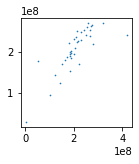

In [246]:
parameters = {'max_depth':[2,3,4,5], 
              'n_estimators':[100,200,300,500,1000], 
              'learning_rate':[0.1,0.01,0.001]}
cbr = CatBoostRegressor()
cbrgs = GridSearchCV(cbr, parameters)
cbrgs.fit(X_train, y_train)
print(cbrgs.best_params_)
y_pred = cbrgs.predict(X_test)
regressionReport(y_test, y_pred)

## LSTM

Splitting into train and test subsets. As soon as we have time series I am leaving last 30

In [37]:
def split_sequence(lst, n_steps):
    """
    The function returns a tuple with the 1st element as a 2D np.array with dimensions:
    (len(lst) - n_steps) rows by (n_steps) columns
    and the 2nd element - a list of elements subsequent for the 1st element
    
    Input:
    1-D iterable
    
    Output:
    tuple of 2 numpy arrays:
    
    the 1st element as a 2D np.array with dimensions:
    (len(lst) - n_steps) rows by (n_steps) columns
    
    the 2nd element - a list of elements subsequent for the 1st element
    
    """
    X, y = [],[]
    for i in range(len(lst)):

        end_ix = i + n_steps

        if end_ix > len(lst)-1:
            break
        seq_x, seq_y = lst[i:end_ix], lst[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [38]:
#Checking available GPUs
from tensorflow.python.client import device_lib 
print(device_lib.list_local_devices()) 

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 18293409736496306347
]


In [48]:
# from sklearn.model_selection import TimeSeriesSplit
# tscv = TimeSeriesSplit()

# for train_index, test_index in tscv.split(X):
#     print("TRAIN:", train_index)
#     print("TEST:", test_index)
#     print("Training ")
#     X_train, X_test = X[train_index], X[test_index]
#     y_train, y_test = y[train_index], y[test_index]
    

In [188]:
trainRatio = 0.8
dfTrain = dfW.iloc[:int(len(dfW)*trainRatio),0]
dfTest = dfW.iloc[-int(len(dfW)-int(len(dfW)*trainRatio)):,0]

print('Total set size:', len(dfW))
print('Train set size:', len(dfTrain))
print('Test set size:', len(dfTest))

Total set size: 174
Train set size: 139
Test set size: 35


In [40]:
# X, y = split_sequence(dfTrain, n_steps=48)

In [ ]:
Scaling

In [147]:
n_steps = 52 #
n_features = 1

X, y = split_sequence(dfTrain, n_steps)
# X, y = split_sequence(dfW.iloc[:,0], n_steps)
scalerx = MinMaxScaler( feature_range=(0, 1) )  # To normalize the inputs
scalery = MinMaxScaler( feature_range=(0, 1) )  # To normalize the outputs

X = scalerx.fit_transform(X) 
yScaled = scalery.fit_transform(y.reshape(-1,1))

In [155]:
callback = callbacks.EarlyStopping(monitor='loss', patience=20)

maxEpochs = 1000

model = Sequential()
model.add(LSTM(10, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

X = X.reshape((X.shape[0], X.shape[1], n_features))

history = model.fit(X, yScaled, epochs=maxEpochs, verbose=0, callbacks=[callback])

yhat = model.predict(X, verbose=0)
yhat = scalery.inverse_transform(yhat)
rmse = mean_squared_error(y, yhat, squared=False)

ep = len(history.history['loss'])
print(f'RMSE for {ep} epochs:', rmse)

RMSE for 170 epochs: 63305317.07575453


In [152]:
callback = callbacks.EarlyStopping(monitor='loss', patience=20)
input_shape=(n_steps, n_features)
maxEpochs = 1000
hu = 30
model = Sequential()
model.add(LSTM(hu, activation='relu', input_shape=input_shape, return_sequences=True))
model.add(LSTM(hu, activation='relu', input_shape=input_shape, return_sequences=True))
model.add(LSTM(hu, activation='relu', input_shape=input_shape, return_sequences=True))
model.add(LSTM(hu, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

X = X.reshape((X.shape[0], X.shape[1], n_features))

history = model.fit(X, yScaled, epochs=maxEpochs, verbose=0, callbacks=[callback])

yhat = model.predict(X, verbose=0)
yhat = scalery.inverse_transform(yhat)
rmse = mean_squared_error(y, yhat, squared=False)

ep = len(history.history['loss'])
print(f'RMSE for {ep} epochs:', rmse)

RMSE for 122 epochs: 62026219.555982776


In [156]:
X_test, y_test = split_sequence(dfTrain, n_steps)
X_test = scalerx.fit_transform(X_test) 

X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], n_features))
yhat_test = model.predict(X_test, verbose=0)
yhat_test = scalery.inverse_transform(yhat_test)

dfForPlotting = pd.DataFrame({'real':y_test,'predicted':yhat_test.reshape(-1)})
px.line(dfForPlotting)

True mean value 	: 194215040.0
Predicted mean value 	: 194215040.0
MAE 			: 42734396.1081569
MSE 			: 4007563170061818.0
RMSE 			: 63305317.07575453
3sigma 			: 191016922.4866229
Var. coeff. 		: 0.342208353473735
Var. coeff. (3 sigma) 	: 1.026625060421205
R2-score		: -11.691901279499172


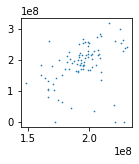

In [157]:
regressionReport(yhat_test.reshape(-1), y_test.reshape(-1))

Not bad, but I am not sure about number of hidden layers. I found this source: https://ai.stackexchange.com/questions/3156/how-to-select-number-of-hidden-layers-and-number-of-memory-cells-in-an-lstm  
Let's calculate number of hidden units according to it.

In [56]:
Ns = len(dfW) #number of samples in training data set.
No = 1 #number of output neurons.
Ni = n_steps #number of input neurons
alpha = 2
optimalHidden = Ns/(alpha*(No+Ni))
print(optimalHidden)

1.6415094339622642


This number is too low as the result is close to a straight line which doesn't make sense. Therefore let's just implement kind of grid search.

In [49]:
from tqdm.notebook import tqdm

In [50]:
def compileModel(hu=10, stacked=0, input_shape=(n_steps, n_features)):
    model = Sequential()
    if stacked==0:  
        model.add(LSTM(hu, activation='relu', input_shape=input_shape))
    elif stacked==1:
        model.add(LSTM(hu, activation='relu', input_shape=input_shape, return_sequences=True))
        model.add(LSTM(hu, activation='relu', input_shape=input_shape))
    else:
        model.add(LSTM(hu, activation='relu', input_shape=input_shape, return_sequences=True))
        for i in range(stacked-1):
            model.add(LSTM(hu, activation='relu', input_shape=input_shape, return_sequences=True))
        model.add(LSTM(hu, activation='relu', input_shape=input_shape))
    model.add(Dense(1))      
    model.compile(optimizer='adam', loss='mse')        
    return model

In [59]:
testModel = compileModel(hu=20, stacked=4)
callback = callbacks.EarlyStopping(monitor='loss', patience=20)

maxEpochs = 100


X = X.reshape((X.shape[0], X.shape[1], n_features))

history = testModel.fit(X, yScaled, epochs=maxEpochs, verbose=0, callbacks=[callback])

yhat = testModel.predict(X, verbose=0)
yhat = scalery.inverse_transform(yhat)
rmse = mean_squared_error(y, yhat, squared=False)

ep = len(history.history['loss'])
print(f'RMSE for {ep} epochs:', rmse)

RMSE for 100 epochs: 64493497.73048654


In [164]:
X_train

array([[1.76052195e+06, 1.12950408e+08, 1.75363471e+08, ...,
        2.54569951e+08, 2.14550300e+08, 2.15121813e+08],
       [1.12950408e+08, 1.75363471e+08, 1.79469867e+08, ...,
        2.14550300e+08, 2.15121813e+08, 2.72326793e+08],
       [1.75363471e+08, 1.79469867e+08, 1.65601284e+08, ...,
        2.15121813e+08, 2.72326793e+08, 2.28071790e+08],
       ...,
       [1.35910294e+08, 1.84427448e+08, 2.22368968e+08, ...,
        2.62256186e+08, 2.54419654e+08, 2.65409998e+08],
       [1.84427448e+08, 2.22368968e+08, 2.53910938e+08, ...,
        2.54419654e+08, 2.65409998e+08, 2.41033629e+08],
       [2.22368968e+08, 2.53910938e+08, 1.60436722e+08, ...,
        2.65409998e+08, 2.41033629e+08, 2.39518478e+08]])

In [168]:
# X = (X <= 10E-314).astype(int)
np.array(X <= 10E-314).sum()

52

### Improvised LSTM grid search

In [189]:
%%time
showPlots = False
n_steps = 52 #
n_features = 1
# maxEpochs = 300
earlyStopping = True
modelsDct = {'model':[],
             'hu':[],
             'epochs':[],
             'stacked':[],
             #'yhat':[], 
             'RMSE_train':[],
            'RMSE_test':[]}

X, y = split_sequence(dfTrain, n_steps)

#X, y = split_sequence(dfW.iloc[:,1], n_steps)
scalerx = MinMaxScaler( feature_range=(0, 1) )  # To normalize the inputs
scalery = MinMaxScaler( feature_range=(0, 1) )  # To normalize the outputs

X = scalerx.fit_transform(X) 
yScaled = scalery.fit_transform(y.reshape(-1,1))


X_test, y_test = split_sequence(pd.concat([dfTrain.iloc[-n_steps:],dfTest]), n_steps)
X_test = scalerx.fit_transform(X_test) 

X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], n_features))

for maxEpochs in tqdm([1000]):
    print(f'maxEpochs = {maxEpochs}')
    if showPlots:
        fig = make_subplots(rows=4, cols=5, shared_xaxes=True, shared_yaxes=True, 
                            y_title = 'Hidden units (10,25)', 
                            subplot_titles=[f'Model {i}' for i in range(20)])


        rNum = 1

    for hu in tqdm([5,10,25,50, 100]):
        for st in tqdm([0,1,2,3]):
            print('-'*50)
            print(f'Number of hidden units = {hu}. Number of stacks = {st}')
            for i in range(10):
                callback = callbacks.EarlyStopping(monitor='loss', patience=20)



                model = compileModel(hu=hu, stacked=st)

                X = X.reshape((X.shape[0], X.shape[1], n_features))

                if earlyStopping:
                    history = model.fit(X, yScaled, epochs=maxEpochs, verbose=0,callbacks=[callback])
                else:
                    history = model.fit(X, yScaled, epochs=maxEpochs, verbose=0)


                yhat = model.predict(X, verbose=0)
                yhat = scalery.inverse_transform(yhat)


                ep = len(history.history['loss'])        


                yhat_test = model.predict(X_test, verbose=0)
                yhat_test = scalery.inverse_transform(yhat_test)
                rmseTest = mean_squared_error(y_test, yhat_test, squared=False)
                rmseTrain = mean_squared_error(y, yhat, squared=False)

                modelsDct['model'].append(model)
                modelsDct['hu'].append(hu) 
                modelsDct['stacked'].append(st) 
                modelsDct['epochs'].append(ep)
                #modelsDct['yhat'].append(yhat)
                modelsDct['RMSE_train'].append(rmseTrain)
                modelsDct['RMSE_test'].append(rmseTest)
                print(f'Try #{i+1}. RMSE Train: {rmseTrain}. RMSE Test: {rmseTest}. Epochs: {ep}')
                if showPlots:
                    dfForPlotting = pd.DataFrame({'real':y_test,'predicted':yhat_test.reshape(-1)})

                    if rNum == 4 and i == 4:
                        leg = True
                    else:
                        leg = False

                    fig.add_trace(go.Scatter(x=dfForPlotting.index, y=dfForPlotting['predicted'], 
                                             name='predicted', mode='lines',
                                     line=dict(color='blue', width=2), showlegend = leg), row = rNum, col = i+1
                    )

                    fig.add_trace(go.Scatter(x=dfForPlotting.index, y=dfForPlotting['real'], name='real', mode='lines',
                                     line=dict(color='red', width=2), showlegend = leg), row = rNum, col = i+1
                    )
        if showPlots:
            rNum+=1
    if showPlots:
        fig.update_layout(title=f'Results for maxEpochs={maxEpochs}')
        fig.show()
        fig.write_html(f'anon_{int(time.time())}_maxEpochs_{maxEpochs}.html')

maxEpochs = 1000


--------------------------------------------------
Number of hidden units = 5. Number of stacks = 0
Try #1. RMSE Train: 60380862.99353677. RMSE Test: 89173226.10129547. Epochs: 882
Try #2. RMSE Train: 58784949.79645827. RMSE Test: 89724873.98783427. Epochs: 1000
Try #3. RMSE Train: 66358699.41439593. RMSE Test: 94712489.65176225. Epochs: 1000
Try #4. RMSE Train: 56504566.71270877. RMSE Test: 12778008523.579323. Epochs: 498
Try #5. RMSE Train: 55528300.38753322. RMSE Test: 88163362.03970848. Epochs: 479
Try #6. RMSE Train: 66632512.64680128. RMSE Test: 95193923.60340995. Epochs: 590
Try #7. RMSE Train: 66277160.39142525. RMSE Test: 94408891.54715012. Epochs: 1000
Try #8. RMSE Train: 53890446.48529294. RMSE Test: 81967210.50592108. Epochs: 623
Try #9. RMSE Train: 56589670.4759189. RMSE Test: 84678717.84766555. Epochs: 352
Try #10. RMSE Train: 52694708.89653434. RMSE Test: 86096340.7411472. Epochs: 563
--------------------------------------------------
Number of hidden units = 5. Number o

--------------------------------------------------
Number of hidden units = 10. Number of stacks = 0
Try #1. RMSE Train: 55910226.78005896. RMSE Test: 87585307.45184126. Epochs: 653
Try #2. RMSE Train: 67516169.05150272. RMSE Test: 96259508.17910632. Epochs: 45
Try #3. RMSE Train: 54472492.223180436. RMSE Test: 352022520.6023116. Epochs: 260
Try #4. RMSE Train: 59861904.40159698. RMSE Test: 85635485.1036491. Epochs: 633
Try #5. RMSE Train: 55624628.30755429. RMSE Test: 383449402.67254126. Epochs: 300
Try #6. RMSE Train: 54848915.512720086. RMSE Test: 110651465.66009839. Epochs: 560
Try #7. RMSE Train: 59361064.965826124. RMSE Test: 85134946.09919621. Epochs: 285
Try #8. RMSE Train: 59238142.602457546. RMSE Test: 1417237939.5238895. Epochs: 261
Try #9. RMSE Train: 60243565.9531911. RMSE Test: 83595504.53545417. Epochs: 482
Try #10. RMSE Train: 49086148.577129945. RMSE Test: 84755695.69526553. Epochs: 717
--------------------------------------------------
Number of hidden units = 10. Num

--------------------------------------------------
Number of hidden units = 25. Number of stacks = 0
Try #1. RMSE Train: 66673699.69784388. RMSE Test: 109925998.77067028. Epochs: 153
Try #2. RMSE Train: 54466900.21920365. RMSE Test: 91969304.42444423. Epochs: 245
Try #3. RMSE Train: 55810224.32708533. RMSE Test: 87628946.48984504. Epochs: 216
Try #4. RMSE Train: 60845376.45228081. RMSE Test: 82928964.60034275. Epochs: 142
Try #5. RMSE Train: 54968417.079151526. RMSE Test: 91192295.77944356. Epochs: 248
Try #6. RMSE Train: 57771892.460699946. RMSE Test: 83476781.21019678. Epochs: 205
Try #7. RMSE Train: 61077276.05140442. RMSE Test: 107212089.60165095. Epochs: 108
Try #8. RMSE Train: 58073109.8162062. RMSE Test: 83134774.64429711. Epochs: 168
Try #9. RMSE Train: 58417469.301788345. RMSE Test: 141507361.1827116. Epochs: 194
Try #10. RMSE Train: 62933978.90328692. RMSE Test: 83474924.86436217. Epochs: 169
--------------------------------------------------
Number of hidden units = 25. Numb

--------------------------------------------------
Number of hidden units = 50. Number of stacks = 0
Try #1. RMSE Train: 63050787.50389413. RMSE Test: 358492398.5067798. Epochs: 160
Try #2. RMSE Train: 67267184.70555793. RMSE Test: 95869654.8464643. Epochs: 36
Try #3. RMSE Train: 62263878.2225431. RMSE Test: 103791087.47578073. Epochs: 104
Try #4. RMSE Train: 53018282.688401155. RMSE Test: 107302699.95699342. Epochs: 296
Try #5. RMSE Train: 65588449.50174935. RMSE Test: 104014139.55114587. Epochs: 220
Try #6. RMSE Train: 61454559.05349022. RMSE Test: 83689060.6399958. Epochs: 136
Try #7. RMSE Train: 148823008.0333231. RMSE Test: 207456115.8961427. Epochs: 138
Try #8. RMSE Train: 65253826.65926584. RMSE Test: 98545476.89482923. Epochs: 131
Try #9. RMSE Train: 59864332.51497472. RMSE Test: 217585741.68393168. Epochs: 112
Try #10. RMSE Train: 61508426.27611407. RMSE Test: 86838386.00125036. Epochs: 118
--------------------------------------------------
Number of hidden units = 50. Number 

--------------------------------------------------
Number of hidden units = 100. Number of stacks = 0
Try #1. RMSE Train: 62222538.644267425. RMSE Test: 88516620.94463384. Epochs: 127
Try #2. RMSE Train: 130273161.46903884. RMSE Test: 188189560.26203635. Epochs: 88
Try #3. RMSE Train: 61964503.497823425. RMSE Test: 79369279.34500763. Epochs: 88
Try #4. RMSE Train: 88459819.78984763. RMSE Test: 140253178.7512768. Epochs: 136
Try #5. RMSE Train: 62344788.34399839. RMSE Test: 82668557.60286056. Epochs: 75
Try #6. RMSE Train: 60873221.75780512. RMSE Test: 78556345.75178222. Epochs: 116
Try #7. RMSE Train: 61659601.03390064. RMSE Test: 129824724.50444391. Epochs: 95
Try #8. RMSE Train: 62061208.11293226. RMSE Test: 91457238.26421764. Epochs: 205
Try #9. RMSE Train: 62025895.46292483. RMSE Test: 149028026.83876404. Epochs: 89
Try #10. RMSE Train: 64219839.505708255. RMSE Test: 90906716.44403045. Epochs: 176
--------------------------------------------------
Number of hidden units = 100. Numb

In [190]:
# %%time

# n_steps = 52 #
# n_features = 1
# maxEpochs = 300
# earlyStopping = False
# modelsDct = {'model':[],
#              'hu':[],
#              'epochs':[],
#              'stacked':[],
#              #'yhat':[], 
#              'RMSE_train':[],
#             'RMSE_test':[]}

# X, y = split_sequence(dfTrain, n_steps)

# #X, y = split_sequence(dfW.iloc[:,1], n_steps)
# scalerx = MinMaxScaler( feature_range=(0, 1) )  # To normalize the inputs
# scalery = MinMaxScaler( feature_range=(0, 1) )  # To normalize the outputs

# X = scalerx.fit_transform(X) 
# yScaled = scalery.fit_transform(y.reshape(-1,1))


# X_test, y_test = split_sequence(pd.concat([dfTrain.iloc[-n_steps:],dfTest]), n_steps)
# X_test = scalerx.fit_transform(X_test) 

# X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], n_features))

# for maxEpochs in tqdm([500, 1000]):
#     print(f'maxEpochs = {maxEpochs}')
#     fig = make_subplots(rows=4, cols=5, shared_xaxes=True, shared_yaxes=True, 
#                         y_title = 'Hidden units (10,25)', 
#                         subplot_titles=[f'Model {i}' for i in range(20)])


#     rNum = 1

#     for hu in tqdm([10,25]):
#         print(f'Number of hidden units = {hu}')
#         for st in tqdm([0,1,2]):
#             for i in range(3):
#                 callback = callbacks.EarlyStopping(monitor='loss', patience=20)



#                 model = compileModel(hu=hu, stacked=st)

#                 X = X.reshape((X.shape[0], X.shape[1], n_features))

#                 if earlyStopping:
#                     history = model.fit(X, yScaled, epochs=maxEpochs, verbose=0,callbacks=[callback])
#                 else:
#                     history = model.fit(X, yScaled, epochs=maxEpochs, verbose=0)


#                 yhat = model.predict(X, verbose=0)
#                 yhat = scalery.inverse_transform(yhat)


#                 ep = len(history.history['loss'])        


#                 yhat_test = model.predict(X_test, verbose=0)
#                 yhat_test = scalery.inverse_transform(yhat_test)
#                 rmseTest = mean_squared_error(y_test, yhat_test, squared=False)
#                 rmseTrain = mean_squared_error(y, yhat, squared=False)

#                 modelsDct['model'].append(model)
#                 modelsDct['hu'].append(hu) 
#                 modelsDct['stacked'].append(st) 
#                 modelsDct['epochs'].append(ep)
#                 #modelsDct['yhat'].append(yhat)
#                 modelsDct['RMSE_train'].append(rmseTrain)
#                 modelsDct['RMSE_test'].append(rmseTest)
#                 print(f'Try #{i+1}. RMSE Train: {rmseTrain}. RMSE Test: {rmseTest}')
#                 dfForPlotting = pd.DataFrame({'real':y_test,'predicted':yhat_test.reshape(-1)})

#                 if rNum == 4 and i == 4:
#                     leg = True
#                 else:
#                     leg = False

#                 fig.add_trace(go.Scatter(x=dfForPlotting.index, y=dfForPlotting['predicted'], 
#                                          name='predicted', mode='lines',
#                                  line=dict(color='blue', width=2), showlegend = leg), row = rNum, col = i+1
#                 )

#                 fig.add_trace(go.Scatter(x=dfForPlotting.index, y=dfForPlotting['real'], name='real', mode='lines',
#                                  line=dict(color='red', width=2), showlegend = leg), row = rNum, col = i+1
#                 )

#         rNum+=1
#     fig.update_layout(title=f'Results for maxEpochs={maxEpochs}')
#     fig.show()
#     fig.write_html(f'anon_{int(time.time())}_maxEpochs_{maxEpochs}.html')

In [191]:
modelsDf = pd.DataFrame(modelsDct)
modelsDf.sort_values(by='RMSE_test')[:10]

,model,hu,epochs,stacked,RMSE_train,RMSE_test
96,<tensorflow.python.keras.engine.sequential.Seq...,25,360,1,5.389667e+07,7.464662e+07
68,<tensorflow.python.keras.engine.sequential.Seq...,10,139,2,6.510142e+07,7.682057e+07
159,<tensorflow.python.keras.engine.sequential.Seq...,50,89,3,6.446359e+07,7.829267e+07
165,<tensorflow.python.keras.engine.sequential.Seq...,100,116,0,6.087322e+07,7.855635e+07
156,<tensorflow.python.keras.engine.sequential.Seq...,50,81,3,6.475675e+07,7.876785e+07
162,<tensorflow.python.keras.engine.sequential.Seq...,100,88,0,6.196450e+07,7.936928e+07
180,<tensorflow.python.keras.engine.sequential.Seq...,100,66,2,7.423737e+07,7.965903e+07
181,<tensorflow.python.keras.engine.sequential.Seq...,100,111,2,6.529166e+07,7.970423e+07
185,<tensorflow.python.keras.engine.sequential.Seq...,100,105,2,6.508239e+07,7.978232e+07
134,<tensorflow.python.keras.engine.sequential.Seq...,50,121,1,6.335265e+07,8.045890e+07


In [192]:
modelsDfGrouped = modelsDf.groupby(by=['hu','stacked']).mean()
modelsDfGrouped.reset_index()

,hu,stacked,epochs,RMSE_train,RMSE_test
0,5,0,698.7,5.936419e+07,1.358213e+09
1,5,1,308.0,6.324344e+07,1.747376e+08
2,5,2,285.2,6.538234e+07,1.322412e+08
3,5,3,325.3,6.360986e+07,2.391006e+08
4,10,0,419.6,5.761633e+07,2.786328e+08
5,10,1,332.5,2.600273e+08,5.527512e+08
6,10,2,186.4,6.486177e+07,1.130225e+08
7,10,3,169.3,6.419678e+07,1.260061e+08
8,25,0,184.8,5.910383e+07,9.624514e+07
9,25,1,179.7,6.216511e+07,1.672596e+08


In [193]:
f = px.line(modelsDfGrouped.reset_index(), x='hu', y='RMSE_test', color='stacked', 
        labels={'hu':'Number of hidden units', 'RMSE_test':'RMSE on test set','stacked':'Number of stacked <br>layers over LSTM layer'})
f.show()
f.write_html('sales_LSTM.html')

In [248]:
pip install visualkeras

     |████████████████████████████████| 561 kB 1.3 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [251]:
import visualkeras
visualkeras.layered_view(model).show()

TypeError: 'int' object is not iterable

In [194]:
# modelsDf['e2']=modelsDf['RMSE_train']*0.3+0.7*modelsDf['RMSE_test']

In [250]:
model = modelsDf.sort_values(by='RMSE_test')['model'].iloc[0]

True mean value 	: 248345953.40330353
Predicted mean value 	: 248345953.40330353
MAE 			: 56587183.166898854
MSE 			: 5572117543636099.0
RMSE 			: 74646617.76421018
3sigma 			: 227209221.1678201
Var. coeff. 		: 0.344914618223887
Var. coeff. (3 sigma) 	: 1.0347438546716612
R2-score		: -0.07636492736825229


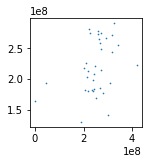

In [198]:
regressionReport(y_test.reshape(-1), scalery.inverse_transform(model.predict(X_test)).reshape(-1))

Based on the imporvised grid search and remembering that low number of hidden layers leads to underfitting and vice versa, I choose number of hidden layers equal to 10 and epochs of 400

In [108]:
n_steps = 52
X, y = split_sequence(dfTrain, n_steps)
nHu = 50 #number of hidden units

#X, y = split_sequence(dfW.iloc[:,1], n_steps)
scalerx = MinMaxScaler( feature_range=(0, 1) )  # To normalize the inputs
scalery = MinMaxScaler( feature_range=(0, 1) )  # To normalize the outputs

X = scalerx.fit_transform(X) 
yScaled = scalery.fit_transform(y.reshape(-1,1))

e=800

n_features = 1
lstRMSE = []
    
# model = Sequential()
# model.add(LSTM(nHu, activation='relu', input_shape=(n_steps, n_features))) 

# model.add(Dense(1))
# ad = optimizers.adam(learning_rate=0.001)
# model.compile(optimizer=ad, loss='mse')

X = X.reshape((X.shape[0], X.shape[1], n_features))

# history = model.fit(X, yScaled, epochs=e, verbose=0, callbacks=[callback])
#model = modelsDf['model'][93]
# demonstrate prediction
yhat = model.predict(X, verbose=0)
yhat = scalery.inverse_transform( yhat )
rmse = mean_squared_error(y, yhat, squared=False)
ep = len(history.history['loss'])
print(f'RMSE for {ep} epochs:', rmse)

RMSE for 700 epochs: 42993428.03729249


In [199]:
X_test, y_test = split_sequence(pd.concat([dfTrain,dfTest]), n_steps)
X_test = scalerx.fit_transform(X_test) 

X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], n_features))
yhat_test = model.predict(X_test, verbose=0)
yhat_test = scalery.inverse_transform(yhat_test)

dfForPlotting = pd.DataFrame({'real':y_test,'predicted':yhat_test.reshape(-1)})
f=px.line(dfForPlotting)#, title=f'{ep} epochs and {nHu} hidden units. RMSE={rmse}')
f.show()

In [ ]:
regressionReport(y, yhat)

## Predictions

In [200]:
dfVis = pd.DataFrame(dfW.iloc[:,0])
dfVis['type'] = ['train']*len(dfTrain)+['test']*(len(dfTest))
dfVis

,sum,type
date,,
2018-01-07,1.760522e+06,train
2018-01-14,1.129504e+08,train
2018-01-21,1.753635e+08,train
2018-01-28,1.794699e+08,train
2018-02-04,1.656013e+08,train
...,...,...
2021-04-04,2.791254e+08,test
2021-04-11,2.197962e+08,test
2021-04-18,2.383098e+08,test


In [201]:
n_steps = 52
X,y = split_sequence(dfW.iloc[:,0], n_steps)
X = scalerx.fit_transform(X) 

X = X.reshape((X.shape[0], X.shape[1], n_features))
yhat = model.predict(X, verbose=0)
yhat = scalery.inverse_transform(yhat)

dfLSTM = pd.DataFrame({'LSTM':yhat.reshape(-1)}, index = dfW.index[n_steps:])
dfLSTM


,LSTM
date,
2019-01-06,196797136.0
2019-01-13,162665744.0
2019-01-20,142215136.0
2019-01-27,149731408.0
2019-02-03,156987392.0
...,...
2021-04-04,178299776.0
2021-04-11,183548304.0
2021-04-18,183437104.0


In [202]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=dfLSTM.index, y=dfLSTM.LSTM, name='LSTM', mode='lines',
                         line=dict(color='royalblue', width=2)))
fig.add_trace(go.Scatter(x=dfVis[dfVis['type']=='train'].index, y=dfVis[dfVis['type']=='train']['sum'], 
                         name='train', mode='lines',
                         line=dict(color='grey', width=2, dash='dot')))
fig.add_trace(go.Scatter(x=dfVis[dfVis['type']=='test'].index, y=dfVis[dfVis['type']=='test']['sum'], 
                         name='test', mode='lines',
                         line=dict(color='red', width=2, dash='dot')))
fig.show()

In [203]:
periodsForPrediction = 52
n_steps = 52
X_pred = pd.DataFrame(dfW.iloc[-n_steps-2:,0])
folDates = [X_pred.index[-1]+i*datetime.timedelta(weeks=1) for i in range(1,periodsForPrediction+1)]

In [204]:
for folDate in folDates:
    X, y = split_sequence(np.array(X_pred[-n_steps-1:]).reshape(-1), n_steps)
    X = scalerx.transform(X) 
    X = X.reshape((X.shape[0], X.shape[1], n_features))
    yhat = model.predict(X, verbose=0)
    yhat = scalery.inverse_transform( yhat )
    
    folSum = yhat[0][0]

    X_pred=pd.concat([X_pred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

In [205]:
XrfrPred = dfW.iloc[-100:,][['sum']]
for folDate in folDates:
    Xt = generateFeatures(XrfrPred).iloc[:,1:]
    yhat = rfrBest.predict(np.array(Xt.iloc[-1,:]).reshape(1, -1))

    folSum = yhat[0]

    XrfrPred=pd.concat([XrfrPred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

In [220]:
Xq5Pred = dfW.iloc[-100:,][['sum']]
for folDate in folDates:
    Xt = generateFeatures(Xq5Pred).iloc[:,1:]
    yhat = dctAlphaModels['q0.05'].predict(np.array(Xt.iloc[-1,:]).reshape(1, -1))

    folSum = yhat[0]

    Xq5Pred=pd.concat([Xq5Pred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

In [221]:
Xq50Pred = dfW.iloc[-100:,][['sum']]
for folDate in folDates:
    Xt = generateFeatures(Xq50Pred).iloc[:,1:]
    yhat = dctAlphaModels['q0.50'].predict(np.array(Xt.iloc[-1,:]).reshape(1, -1))

    folSum = yhat[0]

    Xq50Pred=pd.concat([Xq50Pred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

In [222]:
Xq95Pred = dfW.iloc[-100:,][['sum']]
for folDate in folDates:
    Xt = generateFeatures(Xq95Pred).iloc[:,1:]
    yhat = dctAlphaModels['q0.95'].predict(np.array(Xt.iloc[-1,:]).reshape(1, -1))

    folSum = yhat[0]

    Xq95Pred=pd.concat([Xq95Pred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

In [209]:
XxgbrPred = dfW.iloc[-100:,][['sum']]
for folDate in folDates:
    Xt = generateFeatures(XxgbrPred).iloc[:,1:]
    yhat = xgbr.predict(np.array(Xt.iloc[-1,:]).reshape(1, -1))
   
    folSum = yhat[0]

    XxgbrPred=pd.concat([XxgbrPred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)



In [210]:
XcbrPred = dfW.iloc[-100:,][['sum']]
for folDate in folDates:
    Xt = generateFeatures(XcbrPred).iloc[:,1:]
    yhat = cbr.predict(np.array(Xt.iloc[-1,:]).reshape(1, -1))
   
    folSum = yhat[0]

    XcbrPred=pd.concat([XcbrPred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

In [211]:
XgbrPred = dfW.iloc[-100:,][['sum']]
for folDate in folDates:
    Xt = generateFeatures(XgbrPred).iloc[:,1:]
    yhat = gbrBest.predict(np.array(Xt.iloc[-1,:]).reshape(1, -1))
   
    folSum = yhat[0]

    XgbrPred=pd.concat([XgbrPred,pd.DataFrame({'sum':[folSum]}, index=[folDate])])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().we

In [212]:
dfXGBR = XxgbrPred[XxgbrPred.index.map(lambda x: x in folDates)]
dfRFR = XrfrPred[XrfrPred.index.map(lambda x: x in folDates)]
dfGBR = XgbrPred[XgbrPred.index.map(lambda x: x in folDates)]
dfCBR=XcbrPred[XcbrPred.index.map(lambda x: x in folDates)]
X_pred2 = X_pred[X_pred.index.map(lambda x: x in folDates)]
Xq5Pred = Xq5Pred[Xq5Pred.index.map(lambda x: x in folDates)]
Xq50Pred = Xq50Pred[Xq50Pred.index.map(lambda x: x in folDates)]
Xq95Pred = Xq95Pred[Xq95Pred.index.map(lambda x: x in folDates)]

In [213]:
lastRecord = dfVis[['sum']][-1:]
dfRFR = pd.concat([lastRecord,dfRFR])
dfGBR = pd.concat([lastRecord,dfGBR])
lastRecord = dfLSTM[['LSTM']][-1:]
lastRecord.columns=['sum']
X_pred2 = pd.concat([lastRecord,X_pred2])

#dfRFR=pd.concat([pd.DataFrame(dfVis[dfVis['type']=='test'].iloc[-1]),dfRFR])

In [214]:
X_pred2.columns

Index(['sum'], dtype='object')

In [215]:
totalDf = pd.concat([dfRFR,dfGBR, dfXGBR, dfCBR, X_pred2, Xq5Pred, Xq50Pred, Xq95Pred], axis = 1)
totalDf.columns = ['RFR','GBR','XGboostR', 'CatBoostR','LSTM','q5','q50','q95']

totalDf['median'] = totalDf[['RFR','GBR','XGboostR','CatBoostR','LSTM']].median(axis=1)
totalDf['mean'] = totalDf[['RFR','GBR','XGboostR','CatBoostR','LSTM']].mean(axis=1)

In [216]:
print(dfRFR.index.min(),dfRFR.index.max())
print(dfGBR.index.min(),dfGBR.index.max())
print(dfXGBR.index.min(),dfXGBR.index.max())
print(dfCBR.index.min(),dfCBR.index.max())
print(X_pred2.index.min(),X_pred2.index.max())
print(Xq5Pred.index.min(),Xq5Pred.index.max())
print(Xq50Pred.index.min(),Xq50Pred.index.max())
print(Xq95Pred.index.min(),Xq95Pred.index.max())
print(totalDf.index.min(),totalDf.index.max())

2021-05-02 00:00:00 2022-05-01 00:00:00
2021-05-02 00:00:00 2022-05-01 00:00:00
2021-05-09 00:00:00 2022-05-01 00:00:00
2021-05-09 00:00:00 2022-05-01 00:00:00
2021-05-02 00:00:00 2022-05-01 00:00:00
2021-05-09 00:00:00 2022-05-01 00:00:00
2021-05-09 00:00:00 2022-05-01 00:00:00
2021-05-09 00:00:00 2022-05-01 00:00:00
2021-05-02 00:00:00 2022-05-01 00:00:00


In [217]:
totalDf['median']

2021-05-02    2.055904e+08
2021-05-09    2.055904e+08
2021-05-16    1.891854e+08
2021-05-23    1.923290e+08
2021-05-30    1.942951e+08
2021-06-06    1.940549e+08
2021-06-13    1.926373e+08
2021-06-20    1.902275e+08
2021-06-27    1.895318e+08
2021-07-04    1.881016e+08
2021-07-11    1.853649e+08
2021-07-18    1.819822e+08
2021-07-25    1.800623e+08
2021-08-01    1.934464e+08
2021-08-08    1.841262e+08
2021-08-15    1.889467e+08
2021-08-22    1.986495e+08
2021-08-29    2.059125e+08
2021-09-05    2.130276e+08
2021-09-12    2.192248e+08
2021-09-19    2.251570e+08
2021-09-26    2.392746e+08
2021-10-03    2.434806e+08
2021-10-10    2.470212e+08
2021-10-17    2.418018e+08
2021-10-24    2.422556e+08
2021-10-31    2.374577e+08
2021-11-07    2.395748e+08
2021-11-14    2.398265e+08
2021-11-21    2.428330e+08
2021-11-28    2.391388e+08
2021-12-05    2.342689e+08
2021-12-12    2.230917e+08
2021-12-19    2.108621e+08
2021-12-26    1.996534e+08
2022-01-02    1.931739e+08
2022-01-09    2.070610e+08
2

In [223]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=dfLSTM.index, y=dfLSTM.LSTM, name='LSTM', mode='lines',opacity=0.3,
                         line=dict(color='royalblue', width=2)))
fig.add_trace(go.Scatter(x=dfVis[dfVis['type']=='train'].index, y=dfVis[dfVis['type']=='train']['sum'], 
                         name='train', mode='lines',
                         line=dict(color='black', width=2, dash='dot')))
fig.add_trace(go.Scatter(x=dfVis[dfVis['type']=='test'].index, y=dfVis[dfVis['type']=='test']['sum'], 
                         name='test', mode='lines',
                         line=dict(color='grey', width=2, dash='dot')))
fig.add_trace(go.Scatter(x=X_pred2.index, y=X_pred2['sum'], name='LSTM (future)', mode='lines',opacity=0.3,
                          line=dict(color='red', width=2)))
fig.add_trace(go.Scatter(x=dfRFR.index, y=dfRFR['sum'], name='RFR (future)', mode='lines',opacity=0.3,
                         line=dict(color='orange', width=2)))
fig.add_trace(go.Scatter(x=dfGBR.index, y=dfGBR['sum'], name='GBR (future)', mode='lines',opacity=0.3,
                         line=dict(color='green', width=2)))
fig.add_trace(go.Scatter(x=dfXGBR.index, y=dfXGBR['sum'], name='XGBoostR (future)', mode='lines',opacity=0.3,
                         line=dict(color='black', width=2)))
fig.add_trace(go.Scatter(x=dfCBR.index, y=dfCBR['sum'], name='CatBoostR (future)', mode='lines',opacity=0.3,
                         line=dict(color='magenta', width=2)))
fig.add_trace(go.Scatter(x=totalDf.index, y=totalDf['mean'], name='Mean (future)', mode='lines',
                         line=dict(color='brown', width=2)))
fig.add_trace(go.Scatter(x=totalDf.index, y=totalDf['median'], name='Median (future)', mode='lines',
                         line=dict(color='magenta', width=2)))
fig.add_trace(go.Scatter(x=totalDf.index, y=totalDf['q5'], name='q5 (future)', mode='lines',
                         line=dict(color='green', width=1, dash='dash')))
fig.add_trace(go.Scatter(x=totalDf.index, y=totalDf['q50'], name='q50 (future)', mode='lines',
                         line=dict(color='black', width=1, dash='dash')))
fig.add_trace(go.Scatter(x=totalDf.index, y=totalDf['q95'], name='q95 (future)', mode='lines',
                         line=dict(color='red', width=1, dash='dash')))
fig.show()

In [224]:
totalDf.columns

Index(['RFR', 'GBR', 'XGboostR', 'CatBoostR', 'LSTM', 'q5', 'q50', 'q95',
       'median', 'mean'],
      dtype='object')

In [225]:
df1 = dfLSTM
df1['date']=df1.index
df1 = dfLSTM.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df2 = dfVis[dfVis['type']=='train']
df2['date']=df2.index
df2 = df2.groupby(by=pd.Grouper(key='date',freq='M')).sum()


df3 = dfVis[dfVis['type']=='test']
df3['date']=df3.index
df3 = df3.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df23 = pd.concat([df2, df3])


df4 = totalDf[['LSTM']]
df4['date']=df4.index
df4 = df4.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df5 = totalDf[['RFR']]
df5['date']=df5.index
df5 = df5.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df6 = totalDf[['GBR']]
df6['date']=df6.index
df6 = df6.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df7 = totalDf[['mean']]
df7['date']=df7.index
df7 = df7.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df8 = totalDf[['XGboostR']]
df8['date']=df8.index
df8 = df8.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df9 = totalDf[['CatBoostR']]
df9['date']=df9.index
df9 = df9.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df10 = totalDf[['median']]
df10['date']=df10.index
df10 = df10.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df11 = totalDf[['q5']]
df11['date']=df11.index
df11 = df11.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df12 = totalDf[['q50']]
df12['date']=df12.index
df12 = df12.groupby(by=pd.Grouper(key='date',freq='M')).sum()

df13 = totalDf[['q95']]
df13['date']=df13.index
df13 = df13.groupby(by=pd.Grouper(key='date',freq='M')).sum()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

In [226]:


# lastRecord = df3[['sum']][-1:]
# lastRecord.columns=['RFR']
# df5 = pd.concat([lastRecord,df5])
# df5.columns=['RFR']

# lastRecord.columns=['GBR']
# df6 = pd.concat([lastRecord,df6])
# df6.columns=['GBR']

# lastRecord = df1[['LSTM']][-1:]
# lastRecord.columns=['LSTM']
# df4 = pd.concat([lastRecord,df4])

In [227]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df1.index[:-1], y=df1.LSTM[:-1], name='LSTM',mode='lines', opacity=0.3,
                         line=dict(color='royalblue', width=2), visible="legendonly"))
# fig.add_trace(go.Scatter(x=df2.index, y=df2['sum'], name='train',mode='lines', opacity=1,
#                          line=dict(color='black', width=2)))
fig.add_trace(go.Scatter(x=df23.index[:-1], y=df23['sum'][:-1], name='train+test',mode='lines', opacity=1,
                         line=dict(color='black', width=2)))
fig.add_trace(go.Scatter(x=df3.index[:-1], y=df3['sum'][:-1], name='test',mode='lines', opacity=1,
                         line=dict(color='blue', width=2)))
fig.add_trace(go.Scatter(x=df4.index[:-1], y=df4['LSTM'][:-1], name='LSTM (future)',mode='lines', opacity=0.3,
                          line=dict(color='red', width=2), visible="legendonly"))
fig.add_trace(go.Scatter(x=df5.index[:-1], y=df5['RFR'][:-1], name='RFR (future)',mode='lines', opacity=0.3,
                         line=dict(color='orange', width=2), visible="legendonly"))
fig.add_trace(go.Scatter(x=df6.index[:-1], y=df6['GBR'][:-1], name='GBR (future)',mode='lines', opacity=0.3,
                         line=dict(color='green', width=2), visible="legendonly"))
fig.add_trace(go.Scatter(x=df7.index[:-1], y=df7['mean'][:-1], name='Mean (future)',mode='lines',
                         line=dict(color='brown', width=2)))
fig.add_trace(go.Scatter(x=df8.index[:-1], y=df8['XGboostR'][:-1], name='XgboostR (future)',mode='lines', opacity=0.3,
                         line=dict(color='black', width=2), visible="legendonly"))
fig.add_trace(go.Scatter(x=df9.index[:-1], y=df9['CatBoostR'][:-1], name='CatBoostR (future)',mode='lines', opacity=0.3,
                         line=dict(color='magenta', width=2), visible="legendonly"))
fig.add_trace(go.Scatter(x=df10.index[:-1], y=df10['median'][:-1], name='median (future)',mode='lines',
                         line=dict(color='magenta', width=2)))
fig.add_trace(go.Scatter(x=df11.index[:-1], y=df11['q5'][:-1], name='q5 (future)',mode='lines',
                         line=dict(color='green', width=1, dash='dot')))
fig.add_trace(go.Scatter(x=df12.index[:-1], y=df12['q50'][:-1], name='q50 (future)',mode='lines',
                         line=dict(color='black', width=1, dash='dot')))
fig.add_trace(go.Scatter(x=df13.index[:-1], y=df13['q95'][:-1], name='q95 (future)',mode='lines',
                         line=dict(color='red', width=1, dash='dot')))

fig.show()

In [186]:
fig.write_html('images/resultsAll.html')